In [1]:
import numpy as np
import pandas as pd
import torch

import matplotlib.pyplot as plt
import seaborn as sns

import os
import re

np.random.seed(3093453)
sns.set(context="talk", style="darkgrid")

In [2]:
cwd = os.getcwd()
folder = "clean+translated-data"
file = "clean-de.csv"
path = "/".join( (cwd, folder, file) )

df = pd.read_csv(path, index_col=0)

df

,Textstelle,Metapher,Kandidat,Nein,Metapher?,Fokus,Rahmen,Annotator,orig
index,,,,,,,,,
0,Der politische Körper verwendet in beiden Fäll...,3,1,0,Metapher,"['Zähnen und Krallen', 'Zähnen und Krallen', n...","['der politische Körper', 'der politische Körp...","['B', 'K', 'A', 'GoldStandard']","""Der politische Körper verwendet in beiden Fä..."
1,Immer noch wird durch die protestantische Lehr...,0,4,0,Metaphernkandidat,"[nan, nan, nan, nan]","[nan, nan, nan, nan]","['B', 'K', 'A', 'GoldStandard']","""Immer noch wird durch die protestantische Le..."
2,"Kein Zweifel, schreibt Alb. Schaeffle, vorauss...",0,4,0,Metaphernkandidat,"[nan, nan, nan, nan]","[nan, nan, nan, nan]","['B', 'K', 'A', 'GoldStandard']","""Kein Zweifel"", schreibt Alb. Schaeffle 1), v..."
3,Mit je weiterem Blick wir die Stoffwelt zu übe...,1,3,0,Metaphernkandidat,"[nan, 'Stoffwelt, verzwergt und entkleidet', n...","[nan, 'unser praktisches Ideal', nan, nan]","['B', 'K', 'A', 'GoldStandard']","""Mit je weiterem Blick wir die Stoffwelt zu ü..."
4,Solange das Menschengeschlecht seinen Zerstöre...,0,4,0,Metaphernkandidat,"[nan, nan, nan, nan]","[nan, nan, nan, nan]","['B', 'K', 'A', 'GoldStandard']","""Solange das Menschengeschlecht seinen Zerstö..."
...,...,...,...,...,...,...,...,...,...
794,verlaufs sie hat Naturforschung in dem von uns...,0,4,0,Metaphernkandidat,"[nan, nan, nan, nan]","[nan, nan, nan, nan]","['T', 'P', 'B', 'GoldStandard']",verlaufs; sie hat Naturforschung in dem von un...
795,wenn wir uns ein Prinzip denken und auf Grund ...,1,3,0,Metaphernkandidat,"[nan, nan, 'verstellbare Puppen', nan]","[nan, nan, 'staatliche Menschenverhältnisse', ...","['P', 'K', 'B', 'GoldStandard']",wenn wir uns ein Prinzip denken und auf Grund ...
796,wenn wir von dem schlechten Worte Rechtsphilof...,3,1,0,Metapher,"['schwindsüchtig ist', nan, 'schwindsüchtig', ...","['daß eine Philosophie', nan, 'eine Philosophi...","['P', 'K', 'B', 'GoldStandard']",wenn wir von dem schlechten Worte »Rechtsphilo...


# Mask Prediction for Anomalie Detection:

The idea is to find anomalies by looking how much a word differs from the predicted Bert-Word. If a metaphor Fokus is used, it is unlikely that Bert would expect exactly that word. Therefore we can measure the difference between observed and predicted words. Mismatches then indicate a Metaphor

In [3]:
from transformers import AutoTokenizer, AutoModelForMaskedLM

model_name = "redewiedergabe/bert-base-historical-german-rw-cased"

tokenizer = AutoTokenizer.from_pretrained(model_name)
print("loaded tokenizer")
model = AutoModelForMaskedLM.from_pretrained(model_name)

loaded tokenizer


Some weights of the model checkpoint at redewiedergabe/bert-base-historical-german-rw-cased were not used when initializing BertForMaskedLM: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [108]:
idx = np.random.choice(799)

stelle = df.Textstelle.str.split(r'\s')[idx]
print(stelle)

['Die', 'Aristokratie', 'aber,', 'welche', 'die', 'Klinke', 'der', 'Gesetzgebung', 'in', 'der', 'Hand', 'hatte,', 'benützte', 'sie,', 'um', 'Gesetze', 'zu', 'erlassen,', 'die', 'in', 'schneidendem', 'Widerspruch', 'zu', 'den', 'Interessen', 'der', 'Mehrheit', 'standen', 'und', 'nur', 'ihren', 'Sonderinteressen', 'dienten.']


In [109]:
df.Textstelle[idx]

'Die Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.'

In [110]:
fokus = df.loc[idx, "Fokus"]

def clean_fokus_string(fokus):
    """
    remove unnecessary characters from the fokus string
    """
    
    strip_strings = ["nan", "[", "]", "'", '"', ",", "/"]

    for string in strip_strings:
        fokus = fokus.replace(string, "")

    return fokus.split(" ")

fokus = clean_fokus_string(fokus)

def clean_fokus_list(fokus):
    
    fokus = set(fokus) # trick to remove duplicates
    
    blacklist = {"", " ", ",", ", ", "und", "ein", "eine", "einen"
                 "einer", "eines", "zu", "zur", "am"}
    
    return fokus - blacklist

fokus = clean_fokus_list(fokus)
fokus

{'Klinke'}

In [44]:
help(fokus.strip)

Help on built-in function strip:

strip(chars=None, /) method of builtins.str instance
    Return a copy of the string with leading and trailing whitespace removed.
    
    If chars is given and not None, remove characters in chars instead.



In [41]:

for i, wort in enumerate(stelle):
    maske = " ".join(stelle[:i] ) + " [MASK] " + " ".join(stelle[i+1:])
    print(maske)
    print()

 [MASK] Akt der Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder [MASK] der Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder Akt [MASK] Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder Akt der [MASK] wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder Akt der Regierung [MASK] von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder Akt der Regierung wird [MASK] der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Jeder Akt der Regi

In [42]:
for i, wort in enumerate(stelle):
    
    maske = " ".join(stelle[:i] ) + " [MASK] " + " ".join(stelle[i+1:])
    
    print(maske)
    print()

    inputs = tokenizer(maske, return_tensors="pt")

    with torch.no_grad():
        logits = model(**inputs).logits


    mask_token_index = (inputs.input_ids == tokenizer.mask_token_id)[0].nonzero(as_tuple=True)[0]

    # change from zero to tokenizer(Fokus Wort)
    predicted_token_id = logits[0, mask_token_index].argsort(axis=-1)[0]
    predicted_token_id = predicted_token_id.numpy()[::-1]
    print(tokenizer.decode(predicted_token_id[:5]))
    print()



 [MASK] Akt der Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Dieser Der Jeder Ein Diese

Jeder [MASK] der Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Schritt Befehl Vorschlag Widerstand Wille

Jeder Akt [MASK] Regierung wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

der einer dieser unserer ihrer

Jeder Akt der [MASK] wird von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

Religion Regierung Kirche Revolution Opposition

Jeder Akt der Regierung [MASK] von der ganzen Parteipresse als unumgänglich notwendig geschildert, und wird dadurch ein Teil des Glaubensbekenntnisses der Partei.

wird ist wurde,wird

Jeder Akt 

## Following info can be extracted from Bert

- Position of actual predicted word
    - i.e first predicted word -> no Metaphor
    - 1036th word -> likely a metaphor
    
- Percentile of word (same as before, just different representation)
- logit of the actual word
    - maybe needs to be normalized
    - ecdf quantile would also be interesting
    

 [MASK] Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

Die
[0]
19.892239
Die Diese Eine Jede Ihre

Die [MASK] aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

Aristokratie
[  597  1031  7636 10776]
2.5451117
-1.3980137
-2.2236745
3.6655517
Regierung Mehrheit Gewalt Presse Opposition

Die Aristokratie [MASK] welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

aber,
[0 8]
7.9718356
21.128864
, [UNK] ;. und

Die Aristokratie aber, [MASK] die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze 

[2]
12.716758
den als ihren noch deren

Die Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren [MASK] dienten.

Sonderinteressen
[   7 3346]
1.1431034
11.657651
Zwecken Interessen Handlungen Rechten Gesetzen

Die Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen [MASK] 

dienten.
[0 2]
13.324807
12.787223
dienten gemäß. galten gegenüber



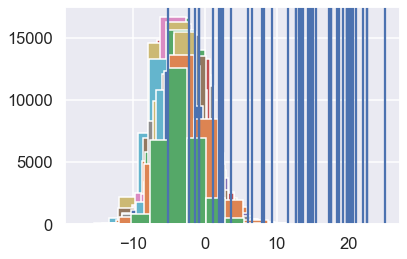

In [112]:
for i, wort in enumerate(stelle):
    
    maske = " ".join(stelle[:i] ) + " [MASK] " + " ".join(stelle[i+1:])
    
    print(maske)
    
    if wort in fokus:
        print("### FOKUS WORT ### ")
    
    print()
    

    inputs = tokenizer(maske, return_tensors="pt")
    
    with torch.no_grad():
        logits = model(**inputs).logits

    mask_token_index = (inputs.input_ids == tokenizer.mask_token_id)[0].nonzero(as_tuple=True)[0]
    wort_token_index = tokenizer(wort).input_ids[1:-1]; print(wort)
    
    # get logits for MASK token
    logit = logits.squeeze()
    logit = logit[mask_token_index]
    logit = logit.squeeze()
    logit = logit.numpy()
    # find location of actual word in logits
    order = np.argsort(logit)
    order = order[::-1]
    locs = np.isin(order, wort_token_index)
    print(np.where(locs)[0])
    
    # find the actual logits of the word, rather than their position within logits
    plt.hist(logit)
    for wort_teil in logit[wort_token_index]:
        print(wort_teil)
        plt.axvline(wort_teil)
    

    # change from zero to tokenizer(Fokus Wort)
    predicted_token_id = logits[0, mask_token_index].argsort(axis=-1)[0]
    predicted_token_id = predicted_token_id.numpy()[::-1]
    print(tokenizer.decode(predicted_token_id[:5]))
    print()




# As Dataframe

- repeat previous step and save everything inside a dataframe

 [MASK] Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

Die
[0]
19.892239
Die Diese Eine Jede Ihre

Die [MASK] aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

Aristokratie
[  597  1031  7636 10776]
2.5451117
-1.3980137
-2.2236745
3.6655517
Regierung Mehrheit Gewalt Presse Opposition

Die Aristokratie [MASK] welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

aber,
[0 8]
7.9718356
21.128864
, [UNK] ;. und

Die Aristokratie aber, [MASK] die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze 

Sonderinteressen
[   7 3346]
1.1431034
11.657651
Zwecken Interessen Handlungen Rechten Gesetzen

Die Aristokratie aber, welche die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen [MASK] 

dienten.
[0 2]
13.324807
12.787223
dienten gemäß. galten gegenüber



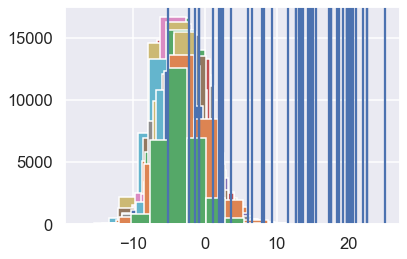

In [117]:
data = pd.DataFrame(columns = ["Text_id", "Textmaske", "Wort", "Metapher", "Orders", "Logits"])

for i, wort in enumerate(stelle):
    
    maske = " ".join(stelle[:i] ) + " [MASK] " + " ".join(stelle[i+1:])
    
    print(maske)
    
    if wort in fokus:
        print("### FOKUS WORT ### ")
    
    print()
    

    inputs = tokenizer(maske, return_tensors="pt")
    
    with torch.no_grad():
        logits = model(**inputs).logits

    mask_token_index = (inputs.input_ids == tokenizer.mask_token_id)[0].nonzero(as_tuple=True)[0]
    wort_token_index = tokenizer(wort).input_ids[1:-1]; print(wort)
    
    # get logits for MASK token
    logit = logits.squeeze()
    logit = logit[mask_token_index]
    logit = logit.squeeze()
    logit = logit.numpy()
    # find location of actual word in logits
    order = np.argsort(logit)
    order = order[::-1]
    locs = np.isin(order, wort_token_index)
    print(np.where(locs)[0])
    
    # find the actual logits of the word, rather than their position within logits
    plt.hist(logit)
    for wort_teil in logit[wort_token_index]:
        print(wort_teil)
        plt.axvline(wort_teil)
    

    # change from zero to tokenizer(Fokus Wort)
    predicted_token_id = logits[0, mask_token_index].argsort(axis=-1)[0]
    predicted_token_id = predicted_token_id.numpy()[::-1]
    print(tokenizer.decode(predicted_token_id[:5]))
    print()
    
    data = pd.concat([data, pd.DataFrame({"Text_id": idx,
                 "Textmaske": maske,
                 "Wort": wort,
                 "Metapher": wort in fokus,
                 "Orders": np.where(locs)[0],
                 "Logits": logit[wort_token_index]})])




In [119]:
data

,Text_id,Textmaske,Wort,Metapher,Orders,Logits
0,89,"[MASK] Aristokratie aber, welche die Klinke d...",Die,False,0,19.892239
0,89,"Die [MASK] aber, welche die Klinke der Gesetzg...",Aristokratie,False,597,2.545112
1,89,"Die [MASK] aber, welche die Klinke der Gesetzg...",Aristokratie,False,1031,-1.398014
2,89,"Die [MASK] aber, welche die Klinke der Gesetzg...",Aristokratie,False,7636,-2.223675
3,89,"Die [MASK] aber, welche die Klinke der Gesetzg...",Aristokratie,False,10776,3.665552
0,89,Die Aristokratie [MASK] welche die Klinke der ...,"aber,",False,0,7.971836
1,89,Die Aristokratie [MASK] welche die Klinke der ...,"aber,",False,8,21.128864
0,89,"Die Aristokratie aber, [MASK] die Klinke der G...",welche,False,1,19.872732
0,89,"Die Aristokratie aber, welche [MASK] Klinke de...",die,False,0,19.307699
0,89,"Die Aristokratie aber, welche die [MASK] der G...",Klinke,True,1765,-0.784168


# For all instances

In [120]:
def clean_fokus_string(fokus):
    """
    remove unnecessary characters from the fokus string
    """
    
    strip_strings = ["nan", "[", "]", "'", '"', ",", "/"]

    for string in strip_strings:
        fokus = fokus.replace(string, "")

    return fokus.split(" ")

################################################

def clean_fokus_list(fokus):
    """
    remove duplicates and redundant words
    """
    fokus = set(fokus) # trick to remove duplicates
    
    blacklist = {"", " ", ",", ", ", "und", "ein", "eine", "einen"
                 "einer", "eines", "zu", "zur", "am", "in", "im",
                 "der", "die", "das"}
    
    return fokus - blacklist



In [134]:
from tqdm.notebook import tqdm

data = pd.DataFrame(columns = ["Text_id", "Textmaske", "Wort", "Metapher", "Orders", "Logits"])

for idx in tqdm(df.index):

    stelle = df.Textstelle.str.split(r'\s')[idx]

    fokus = df.loc[idx, "Fokus"]
    fokus = clean_fokus_string(fokus)
    fokus = clean_fokus_list(fokus)


    for i, wort in enumerate(stelle):

        maske = " ".join(stelle[:i] ) + " [MASK] " + " ".join(stelle[i+1:])

        print(maske)

        if wort in fokus:
            print("### FOKUS WORT ### ")

        print()


        inputs = tokenizer(maske, return_tensors="pt")

        with torch.no_grad():
            logits = model(**inputs).logits

        mask_token_index = (inputs.input_ids == tokenizer.mask_token_id)[0].nonzero(as_tuple=True)[0]
        wort_token_index = tokenizer(wort).input_ids[1:-1]; print(wort)

        # get logits for MASK token
        logit = logits.squeeze()
        logit = logit[mask_token_index]
        logit = logit.squeeze()
        logit = logit.numpy()
        # find location of actual word in logits
        order = np.argsort(logit)
        order = order[::-1]
        locs = np.isin(order, wort_token_index)
        print(np.where(locs)[0])

        # change from zero to tokenizer(Fokus Wort)
        predicted_token_id = logits[0, mask_token_index].argsort(axis=-1)[0]
        predicted_token_id = predicted_token_id.numpy()[::-1]
        print(tokenizer.decode(predicted_token_id[:5]))
        print()

        data = pd.concat([data, pd.DataFrame({"Text_id": idx,
                     "Textmaske": maske,
                     "Wort": wort,
                     "Metapher": wort in fokus,
                     "Orders": np.median(np.where(locs)[0]),
                     "Logits": np.median(logit[wort_token_index])
                                             },index=[0])])





 [MASK] politische Körper verwendet in beiden Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

Der
[0]
Der Ein [UNK] Denn Aber

Der [MASK] Körper verwendet in beiden Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

politische
[150]
menschliche weibliche ganze männliche größere

Der politische [MASK] verwendet in beiden Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

Körper
[38]
Geist Gegner Staat Beobachter Faktor

Der politische Körper [MASK] in beiden Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

verwendet
[1]
legt verwendet bezieht setzt hat

Der politische Körper verwendet [MASK] beiden Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

in
[0]
in bei von zu unter

Der politische Körper verwendet in [MASK] Fällen seine meiste Kraft auf die Zunahme von Zähnen und Krallen.

beiden
[4]
solchen vielen diesen allen beiden

Der politische Körper verwendet in beiden [MASK] seine meiste Kraft auf die

müssen.
[0 9]
. [UNK] ; :,

 [MASK] Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

Kein
[1]
Ohne Kein ohne kein Keine

Kein [MASK] schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben,

gehört
[13]
in mit bei vor diene

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört [MASK] Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

der
[1]
zur der einer unserer zu

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der [MASK] in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Die
[5]
:, die eine als

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die [MASK] Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

geschichtliche
[542 543]
einzige große erste wichtigste eigentliche

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche [MASK] unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . 

der
[0]
der einer zur dieser unserer

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der [MASK] . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

Demokratie
[3]
Revolution Zeit Reaktion Demokratie Zukunft

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demok

Chaos
[21]
Ende Fortschritt anderer Mann System

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos [MASK] erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

kommen,
[ 0 20]
, und entstehen ; werden

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokrati

der
[0]
der die einer dieser eine

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der [MASK] der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig und wertlos . . . .

Zukunft
[4]
Entwicklung Stärke Größe Auflösung Zukunft

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokrati

zulässig
[114]
##wahrwahrscheinlichreifwürdigwert

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . Die da glauben, durch sie werde statt Ordnung ein Chaos kommen, erfassen die Natur seiner Stärke nicht . . . . und Befürchtungen betreffs der Zukunft der auftretenden Demokratie, die sich auf Vergleiche mit der Vergangenheit gründen, sind un zulässig [MASK] wertlos . . . .

und
[0]
undlichbar, oder

Kein Zweifel, schreibt Alb. Schaeffle, vorausschickend, daß Demokratisierung nicht notwendig Republikanisierung sei, die Zukunft gehört der Demokratie, in der alten Welt wie in der neuen, Und Kidd  sagt Die geschichtliche Tatsache unserer Zeit, die alle anderen in den Schatten stellt, ist das Kommen der Demokratie . . . . 

überschauen
[412 671]
erfassen betrachten verstehen schätzen kennen

Mit je weiterem Blick wir die Stoffwelt zu überschauen [MASK] je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die Gefühle noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und Gott.

lernen,
[ 0 38]
, und ; [UNK] :

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, [MASK] klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in d

Handeln
[27]
Wesen Leben Sein Werk Ich

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln [MASK] dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die Gefühle noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und Gott.

zu
[0]
zu mit in nach zwischen

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu [MASK] harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der

wir
[0]
wir Wir uns alle sich

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir [MASK] Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die Gefühle noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und Gott.

die
[6]
eine alle endlich mehr unsere

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die [MASK] zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge,

der
[0]
der dieser einer unserer seiner

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der [MASK] Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die Gefühle noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und Gott.

allgemeinen
[4]
gegenwärtigen jetzigen äußeren inneren allgemeinen

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in de

die
[0]
die jene diejenigen alle ihre

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die [MASK] noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und Gott.

Gefühle
[11]
Freude Wünsche Zweifel Hoffnung Sehnsucht

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemei

und
[0]
und in an durch von

Mit je weiterem Blick wir die Stoffwelt zu überschauen lernen, je klarer wir das wirkliche Verhältnis bemessen, in welchem der Mensch und sein Handeln zu dem harmonischen Ganzen steht, umsomehr verzwergt und entkleidet sich unser praktisches Ideal, bis wir die Neigung zu der Frage verspüren, ob ein so vergängliches und bedeutungsloses Ereignis in der allgemeinen Ordnung der Dinge, wie die Schicksale der Menschenrasse es sind, die Sehnsucht und die Gefühle noch befriedigen kann, die groß geworden sind an dem Glauben an das Ewige und [MASK] 

Gott.
[5 9]
das [UNK] die an alles

 [MASK] das Menschengeschlecht seinen Zerstörern größere Bewunderung zollen wird als seinen Wohltätern, muß auch der Durst nach Kriegsruhm stets den Fehler der erhabensten Charaktere bilden,

Solange
[7]
Wenn Da Damit Wo Weil

Solange [MASK] Menschengeschlecht seinen Zerstörern größere Bewunderung zollen wird als seinen Wohltätern, muß auch der Durst nach Kriegsruhm stets den Fehler de

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

schwarze
[0]
schwarze weiße rote blaue grüne

Wenn  weiße oder  schwarze [MASK] gut begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, so wirken offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur Stammform zurückschlagende Nachkommen zu erzeugen, gewinnt die Oberhand .

Tauben
[2894 8523]
Nachkommen Individuen Kinder Stämme Angehörige

Wenn  weiße oder  schwarze Tauben [MASK] begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, so wirken offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur Stammform zurückschlagende Nachkommen zu erzeugen, gewinnt die Oberhand .

gut
[251]
verschiedener verschieden künstlich in innerhalb

We

gekreuzt,
[    0   498 10697 24695]
, ; : [UNK] und

Wenn  weiße oder  schwarze Tauben gut begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, [MASK] wirken offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur Stammform zurückschlagende Nachkommen zu erzeugen, gewinnt die Oberhand .

so
[0]
so dann dadurch da es

Wenn  weiße oder  schwarze Tauben gut begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, so [MASK] offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur Stammform zurückschlagende Nachkommen zu erzeugen, gewinnt die Oberhand .

wirken
[0]
wirken spielen treten fallen kämpfen

Wenn  weiße oder  schwarze Tauben gut begr

zur
[2]
die ihre zur in nach

Wenn  weiße oder  schwarze Tauben gut begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, so wirken offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur [MASK] zurückschlagende Nachkommen zu erzeugen, gewinnt die Oberhand .

Stammform
[1205 2299]
Erde Heimat Welt Sonne Hälfte

Wenn  weiße oder  schwarze Tauben gut begründeter Rassen gepaart werden, so erben die Nachkommen beinahe sicher dieselben Farben werden aber verschieden gefärbte Taubenrassen gekreuzt, so wirken offenbar die einander entgegengesetzten Kräfte der Vererbung gegeneinander und die beiden Eltern inhärente Neigung, schieferblaue, d. h. zur Stammform [MASK] Nachkommen zu erzeugen, gewinnt die Oberhand .

zurückschlagende
[  191  1342 29274]
bestimmte gehörende gewordene entsprechende geeignete

Wenn  weiße oder

sei,
[0 3]
, ist wäre sei ;

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, [MASK] die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind . . . .

der
[0]
der welcher den welchen was

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der [MASK] Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind . . . .

lebhaften
[1796 5348]
geistigen guten religiösen körperlichen praktischen

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften [MASK] weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind . . . .

und
[0]
und, oder aber gegenüber

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und [MASK] wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge 

besseren
[0]
besseren höheren niedrigeren geistigen anderen

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren [MASK] zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind . . . .

Fuß
[21]
Standpunkt Grad Stand Punkt Boden

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß [MASK] kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge

sind
[0]
sind wären waren erscheinen seien

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind [MASK] . . .

.
[0]
. [UNK], und usw

Wir behaupten nicht, daß die Bildung der einzige Faktor sei, der die Geburtenziffer verkleinert sie ist nur einer dieser Faktoren, der, verbunden mit materieller Bequemlichkeit, mit weniger lebhaften und weniger wahmehmbaren religiösen Gefühlen und mit dem heißen Wunsch, in materieller Beziehung auf einen höheren und besseren Fuß zu kommen, solche intellektuelle und moralische Eigenschaften anhäuft, die für eine hohe Ge burtenziffer wenig günstig sind . [MAS

ungleich
[77]
immer wesentlich andere einmal ganz

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungleich [MASK] Aufgaben vindiziert. Die Freihandelsrichtung hatte ihre hohe Bedeutung, ja sie war ihrer ersten Zeit unerläßlich, um mit dem Wust mittelalterlicher Schranken, der Knechtung der unteren Klassen und den polizeilichen Beschränkungen der individuellen Freiheit aufzuräumen.

höhere
[8]
##ewertige größere schwereere

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungleich höhere [MASK] vindiziert. Die Freihandelsrichtung hatte ihre hohe Bedeutung, ja sie war ihrer ersten Zeit unerläßlich, um mit dem Wust mittelalterlicher Schranken, der Knechtung der unteren Klassen und den polizeilichen Beschränkungen der individuellen Freiheit aufzuräumen.

Aufgaben
[11]
Preise Grenzen Klassen Anforderungen Werte

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungleich höhere Aufgaben 

Wust
[3692 7094]
Schutz Verfall Bau Verlust Bestehen

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungleich höhere Aufgaben vindiziert. Die Freihandelsrichtung hatte ihre hohe Bedeutung, ja sie war ihrer ersten Zeit unerläßlich, um mit dem Wust [MASK] Schranken, der Knechtung der unteren Klassen und den polizeilichen Beschränkungen der individuellen Freiheit aufzuräumen.

mittelalterlicher
[ 163 1094]
der von ihrer gewisser dieser

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungleich höhere Aufgaben vindiziert. Die Freihandelsrichtung hatte ihre hohe Bedeutung, ja sie war ihrer ersten Zeit unerläßlich, um mit dem Wust mittelalterlicher [MASK] der Knechtung der unteren Klassen und den polizeilichen Beschränkungen der individuellen Freiheit aufzuräumen.

Schranken,
[   3 3542 7111]
Gesetze Theorien Verbrechen, Erfahrungen

Aber auch von diesem Extrem abgesehen, werden in der neueren Zeit dem Staate wieder ungl

doch
[0]
doch immer nicht natürlich :

Aber das bedeutendste Ereignis war doch [MASK] Geburt und der Sieges lauf der Darwinschen Descendenztheorie.
### FOKUS WORT ### 

die
[0]
die seine ihre diese unsere

Aber das bedeutendste Ereignis war doch die [MASK] und der Sieges lauf der Darwinschen Descendenztheorie.
### FOKUS WORT ### 

Geburt
[4]
Entdeckung Erfindung Revolution Einführung Geburt

Aber das bedeutendste Ereignis war doch die Geburt [MASK] der Sieges lauf der Darwinschen Descendenztheorie.

und
[1]
, und von [UNK] in

Aber das bedeutendste Ereignis war doch die Geburt und [MASK] Sieges lauf der Darwinschen Descendenztheorie.
### FOKUS WORT ### 

der
[0]
der die das den ein

Aber das bedeutendste Ereignis war doch die Geburt und der [MASK] lauf der Darwinschen Descendenztheorie.

Sieges
[79]
Fort Einfl The Abschl Aus

Aber das bedeutendste Ereignis war doch die Geburt und der Sieges [MASK] der Darwinschen Descendenztheorie.

lauf
[21142]
##zugtagerfolg Siegmarsch

Aber das bede

zu
[0]
zuen nichten

Aber die Gestalten und Bilder, welche einmal in seine Seele gefallen sind, arbeiten doch unablässig, ihn zu leiten, oft hat er sich gegen ihre Herrschaft zu [MASK] in tausend Fällen folgt er fröhlich ihrem leisen Zuge.

wehren,
[  0  83 534]
, und ; stellen verteidigen

Aber die Gestalten und Bilder, welche einmal in seine Seele gefallen sind, arbeiten doch unablässig, ihn zu leiten, oft hat er sich gegen ihre Herrschaft zu wehren, [MASK] tausend Fällen folgt er fröhlich ihrem leisen Zuge.
### FOKUS WORT ### 

in
[0]
in mit bei unter und

Aber die Gestalten und Bilder, welche einmal in seine Seele gefallen sind, arbeiten doch unablässig, ihn zu leiten, oft hat er sich gegen ihre Herrschaft zu wehren, in [MASK] Fällen folgt er fröhlich ihrem leisen Zuge.

tausend
[19]
manchen anderen vielen seltenen einzelnen

Aber die Gestalten und Bilder, welche einmal in seine Seele gefallen sind, arbeiten doch unablässig, ihn zu leiten, oft hat er sich gegen ihre Herrschaft zu w

Interessen
[0]
Interessen Bedürfnisse Gesundheit Lage Eigenart

Aber die Sache liegt anders denn die Kosten der weitherzigen Berücksichtigung der Interessen [MASK] gegenwärtig lebenden Individuums haben die folgenden Generationen zu bezahlen, die in diese Versicherung auf Gegenseitigkeit nicht mit eingeschlossen sind.

des
[0]
des eines jedes dieses unseres

Aber die Sache liegt anders denn die Kosten der weitherzigen Berücksichtigung der Interessen des [MASK] lebenden Individuums haben die folgenden Generationen zu bezahlen, die in diese Versicherung auf Gegenseitigkeit nicht mit eingeschlossen sind.

gegenwärtig
[2]
einzelnen noch gegenwärtig zunächst ganzen

Aber die Sache liegt anders denn die Kosten der weitherzigen Berücksichtigung der Interessen des gegenwärtig [MASK] Individuums haben die folgenden Generationen zu bezahlen, die in diese Versicherung auf Gegenseitigkeit nicht mit eingeschlossen sind.

lebenden
[4]
##en gegebenene stehenden lebenden

Aber die Sache liegt anders d

es das sie lange dies

Aber dürfen wir vergessen, wie es [MASK] nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter sich ließen, was die Chinesen je erfunden?

noch,
[ 1 21]
gar noch doch überhaupt denn

Aber dürfen wir vergessen, wie es noch, [MASK] vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter s

nicht
[0]
nicht keineswegsnicht eben Nicht

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht [MASK] die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter sich ließen, was die Chinesen je erfunden?

nur
[0]
nur bloß allein ausschließlich mehr

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur [MASK] Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an Ents

Tortur
[3768 5855]
Todesstrafe Folter Justiz Strafe Gerechtigkeit

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur [MASK] ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter sich ließen, was die Chinesen je erfunden?

in
[0]
in mit von bei nach

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in [MASK] schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von europäischen Richtern ver hängten Todesstrafen an

[0]
die diese jene alle ihre

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die [MASK] europäischen Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter sich ließen, was die Chinesen je erfunden?

von
[0]
von den vor bei unter

Aber dürfen wir vergessen, wie es noch, nicht vor einigen, sondern vor kaum einem Jahrhundert in Europa aussah, welche Höhlen des Elends nicht nur die Gefängnisse für Verbrecher, sondern auch die Schuldgefängnisse und die Hospitäler waren, daß die Tortur in ihren schlimmsten Formen gesetzliche in China nur faktische und strafbare Anwendung fand, und daß die von [MASK] Richtern ver hängten Todesstrafen an Entsetzlichkeit alles hinter sich ließen,

erfunden?
[ 10 101]
erlitten gesehen getan besaßen erlebt

 [MASK] nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

Aber
[0]
Aber Denn Doch Und Allein

Aber [MASK] nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Ter

noch
[0]
noch auch viel immer weit

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch [MASK] hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

mehr
[0]
mehr weniger dazu tiefer auch

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr [MASK] der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend mögl

unserer
[2]
der einer unserer aller dieser

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer [MASK] geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

Sozialdemokratie
[ 718 1714]
Zeit Vorfahren Gesellschaft Politik Regierung

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie [MASK] ist, dieses ungek

meiden.
[  33  173 4619]
beseitigen verlassen verbessern verändern betreten

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. [MASK] aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

Das
[27]
Wohl Jedenfalls Nun Zugleich Immerhin

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geword

des
[0]
des der im und eines

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des [MASK] des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

Einkommens,
[ 5 41]
Standes Rechts Lebens Schutzes Systems

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wi

welches
[1]
das welches der die welche

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches [MASK] die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

nur
[1]
allgemein nur eben immer auch

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie i

in
[0]
in aus mit an nach

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in [MASK] Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter denselben äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

angeborenen
[3700 5444]
persönlichen eigenen ihren äußeren geistigen

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain so

unter
[3]
, von nach unter der

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie irgend möglich zu meiden. Das aber dürfte bei den Einsichtigeren unter ihnen feststehen, daß Gleichheit des Einkommens, des Ansehens und der Macht undiskutierbare Verzerrungen des Gleichheitsideales sind, welches nur die Beseitigung antisozialer Begünstigungen verlangt, d. h. solcher, die weder in angeborenen Anlagen, noch in persönlich erworbenen Vorteilen erworben in einem, jedem unter [MASK] äußeren Vorbedingungen offenstehenden Wettbewerb bestehen.

denselben
[10]
dengeordneten seinen allen gewissen

Aber nicht nur hinsichtlich des Weges gehen die Anschauungen auseinander, sondern noch mehr hinsichtlich der letzten Ideale, so sehr, daß es zur Taktik unserer Sozialdemokratie geworden ist, dieses ungeklärte Terrain soviel wie ir

Schranken
[713 913]
Zustände Verhältnisse Institutionen Gesetze Einrichtungen

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken [MASK] eingerissen werden müßten. Die Nationen sind noch Realitäten, und die Verschiedenheit ihrer Bedürfnisse und ihres Rechtsgefühls, sowie die Abneigung und Fremdheit der Angehörigen verschiedener Nationen ist auch eine Realität.

überhaupt
[38]
wieder ganz völlig vollständig gänzlich

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken überhaupt [MASK] werden müßten. Die Nationen sind noch Realitäten, und die Verschiedenheit ihrer Bedürfnisse und ihres Rechtsgefühls, sowie die Abneigung und Fremdheit der Angehörigen verschiedener Nationen ist auch eine Realität.
### FOKUS WORT ### 

eingerissen
[ 890 1203]
aufgehoben abgeschafft überwunden überschritten beseitigt

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken

verschiedener
[3]
der anderer dieser verschiedener beider

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken überhaupt eingerissen werden müßten. Die Nationen sind noch Realitäten, und die Verschiedenheit ihrer Bedürfnisse und ihres Rechtsgefühls, sowie die Abneigung und Fremdheit der Angehörigen verschiedener [MASK] ist auch eine Realität.

Nationen
[0]
Nationen Völker Klassen Stämme Stände

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken überhaupt eingerissen werden müßten. Die Nationen sind noch Realitäten, und die Verschiedenheit ihrer Bedürfnisse und ihres Rechtsgefühls, sowie die Abneigung und Fremdheit der Angehörigen verschiedener Nationen [MASK] auch eine Realität.

ist
[0]
ist sind bilden werden bleibt

Aber noch ist die Zeit nicht gekommen, zu verlangen, daß nunmehr die nationalstaatlichen Schranken überhaupt eingerissen werden müßten. Die Nationen sind noch Realitäten, und di

der
[1]
dieser der einer jener unserer

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der [MASK] uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie nämlich noch innerhalb unserer geistigen Sehweite und innerhalb des durch unseren organischen Standpunkt bestimmten Horizontes liegen.

für
[0]
für von bei zwischen nur

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für [MASK] einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie nämlich noch innerhalb unserer geistigen

eigentlich
[35]
freilich allerdings noch doch leider

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich [MASK] ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie nämlich noch innerhalb unserer geistigen Sehweite und innerhalb des durch unseren organischen Standpunkt bestimmten Horizontes liegen.

nicht
[0]
nicht so schon nur noch

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht [MASK] selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie nämlich noch innerhalb unser

soweit
[8]
da wenn sofern weil ob

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit [MASK] nämlich noch innerhalb unserer geistigen Sehweite und innerhalb des durch unseren organischen Standpunkt bestimmten Horizontes liegen.

sie
[0]
sie diese wir dieselben jene

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie [MASK] noch innerhalb unserer geistigen Sehw

Horizontes
[46 99]
Gebietes Kreiseskreises Ganzen Systems

Aber unsere Kurzsichtigkeit gestattet uns nur, die Richtung zu erkennen, welche die Entwicklungsgeschichte während der für uns einigermaßen übersehbaren Periode genommen hat, und infolge dieser Orientierung vermögen wir unter der eigentlich nicht ganz selbstverständlichen Voraussetzung, daß diese Richtung andauern werde höchstens die nächsten Ziele zu sehen, soweit sie nämlich noch innerhalb unserer geistigen Sehweite und innerhalb des durch unseren organischen Standpunkt bestimmten Horizontes [MASK] 

liegen.
[0 7]
liegen stehen sind bestehen befinden

 [MASK] zu Heraklits Zeit wurde der Same zu dieser Er kenntnis vergeblich ausgestreut.

Aber
[4]
Schon Noch Auch Besonders Aber

Aber [MASK] Heraklits Zeit wurde der Same zu dieser Er kenntnis vergeblich ausgestreut.

zu
[0]
zu um seit in nach

Aber zu [MASK] Zeit wurde der Same zu dieser Er kenntnis vergeblich ausgestreut.

Heraklits
[ 3894  4566  8986 18439]
gleicher jener der

Befruchtungsvorganges
[  303   731  1521  2781 19985 29919]
Versuchs Geschlechts Alters Verdachts Willens

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges [MASK] Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im Laufe der letzten Jahrzehnte mit Vermutungen über Vermutungen, Theorieen über Theorieen auszufüllen versucht worden ist.

im
[0]
im außer in Im vom

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im [MASK] läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung 

Vorgang
[1]
Verlauf Vorgang Zweck Zusammenhang Weg

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang [MASK] Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im Laufe der letzten Jahrzehnte mit Vermutungen über Vermutungen, Theorieen über Theorieen auszufüllen versucht worden ist.

der
[0]
der durch einer zur und

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der [MASK] zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im 

Punkte,
[0 1]
, Punkte Punkt [UNK]jenigen

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, [MASK] die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im Laufe der letzten Jahrzehnte mit Vermutungen über Vermutungen, Theorieen über Theorieen auszufüllen versucht worden ist.

wo
[0]
wo da wie wann daß

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo [MASK] Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im Laufe d

Vererbung
[ 1652  4347 10944]
Zellen Krankheit Geburt Beobachtung Erziehung

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung [MASK] klafft eine weite Lücke, die im Laufe der letzten Jahrzehnte mit Vermutungen über Vermutungen, Theorieen über Theorieen auszufüllen versucht worden ist.

zeigen,
[ 0 49]
, selbst vermittelt gegenüber offenbart

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der V

Vermutungen,
[  14 2289 2430]
die einzelne verschiedene neue andere

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klafft eine weite Lücke, die im Laufe der letzten Jahrzehnte mit Vermutungen über Vermutungen, [MASK] über Theorieen auszufüllen versucht worden ist.

Theorieen
[206 661]
ja sowie sogar oder kurz

Aber zwischen dem Punkte, wo uns das Mikroskop bei der Verfolgung des Befruchtungsvorganges im Stiche läßt und es läßt uns, da es uns nur über den äußeren Vorgang der Kopulation zweier Keimzellen Ausschluß zu geben vermag, sehr bald im Stich und dem Punkte, wo die Eigenschaften der Eltern am neuen Individuum hervortreten und uns die Wirkung der Vererbung zeigen, klaf

[8]
auf in unter an durch

Alle anderen Anforderungen an den Staat treten gegen [MASK] eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es ist ein Widenspruch in sich selbst eine Staatsgewalt ohne Gewalt!

diese
[2]
die das diese jene jede

Alle anderen Anforderungen an den Staat treten gegen diese [MASK] zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es is

zu
[0]
zu nichtzu wirklich vollständig

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu [MASK] muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es ist ein Widenspruch in sich selbst eine Staatsgewalt ohne Gewalt!

erfüllen,
[  0 147]
erfüllen lösen bewältigen verwirklichen beantworten

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, [MASK] er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die

obigen
[ 877 5912]
besten vollen eigentlichen wahren eigenen

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen [MASK] gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es ist ein Widenspruch in sich selbst eine Staatsgewalt ohne Gewalt!

Sinne
[0]
Sinne Augenblick Falle Punkte Sinn

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne [MASK] hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Ges

es
[1]
er es sie man sich

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es [MASK] ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es ist ein Widenspruch in sich selbst eine Staatsgewalt ohne Gewalt!

für
[0]
für gegen ohne über wider

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für [MASK] keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es

in
[5]
an über gegen für von

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, es ist ein Widenspruch in [MASK] selbst eine Staatsgewalt ohne Gewalt!

sich
[0]
sich ihm Wahrheit Gott ihr

Alle anderen Anforderungen an den Staat treten gegen diese eine zurück bevor sie nicht erfüllt ist, sind alle anderen verfrüht, denn um sie zu erfüllen, muß er selber erst da sein, und da ist er erst, wenn er die Machtfrage im obigen Sinne gelöst hat. Machtlosigkeit, Ohnmacht der Staatsgewalt ist die Todsünde des Staates, von der es für ihn keine Absolution gibt, diejenige, welche die Gesellschaft weder verzeiht noch erträgt, e

Erscheinungen,
[   0  125 5106]
, Fälle Artikel Abschnitte Punkte

Alle diese Erscheinungen, [MASK] denen pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte oft über ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch grobe Analogieen in Zusammenhang zu bringen sind.
### FOKUS WORT ### 

in
[1]
bei in mit unter von

Alle diese Erscheinungen, in [MASK] pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte oft über ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch grobe Analogieen in Zusammenhang zu bringen sind.

denen
[0]
denen welchen welcher der welchem

Alle diese Erscheinungen, in denen [MASK] Verh

Sitte
[  834  2292 19673]
Erscheinung Natur Krankheit Familie Materie

Alle diese Erscheinungen, in denen pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte [MASK] über ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch grobe Analogieen in Zusammenhang zu bringen sind.

oft
[1]
weit oft immer nicht auch

Alle diese Erscheinungen, in denen pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte oft [MASK] ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch grobe Analogieen in Zusammenhang zu bringen sind.
### FOKUS WORT ### 

über
[0]
über auf in aus hinter

Alle diese Erscheinungen, in denen pseudoverwand

durch
[0]
durch als über auf ohne

Alle diese Erscheinungen, in denen pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte oft über ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch [MASK] Analogieen in Zusammenhang zu bringen sind.

grobe
[ 496 2157]
gewisse einfache künstliche bloße äußere

Alle diese Erscheinungen, in denen pseudoverwandtschaftliche Verhältnisse wie die Fälle echter physiologischer Verwandtschaft behandelt werden, sind ein klassisches Beispiel dafür, wie eine Sitte oft über ihr ursprüngliches Gebiet hinausgreift und auch Verhältnisse in ihren Kreis zieht, die mit ihrem ursprünglichen Geltungsgebiete nur durch grobe [MASK] in Zusammenhang zu bringen sind.

Analogieen
[ 656  700 3389]
Linien Gründe Beispiele Sätze Worte

Alle diese Erscheinungen, in denen pseudoverwandtschaft

daß
[0]
daß wenn dass indem wie

Alles Lernen besteht in Anpassungsvorgängen, welche dadurch eingeleitet werden, daß [MASK] Empfindungen, Wahrnehmungen, Vorstellungen oder Begriffe an unsere logischen, ethischen u. a. Bestände herantreten.

neue
[5]
unsere die alle gewisse bestimmte

Alles Lernen besteht in Anpassungsvorgängen, welche dadurch eingeleitet werden, daß neue [MASK] Wahrnehmungen, Vorstellungen oder Begriffe an unsere logischen, ethischen u. a. Bestände herantreten.

Empfindungen,
[  17 2224 3523]
geistige menschliche individuelle praktische natürliche

Alles Lernen besteht in Anpassungsvorgängen, welche dadurch eingeleitet werden, daß neue Empfindungen, [MASK] Vorstellungen oder Begriffe an unsere logischen, ethischen u. a. Bestände herantreten.

Wahrnehmungen,
[  79  420 4651]
neue alte bestimmte andere veränderte

Alles Lernen besteht in Anpassungsvorgängen, welche dadurch eingeleitet werden, daß neue Empfindungen, Wahrnehmungen, [MASK] oder Begriffe an unsere logischen,

Zettel.
[   0 3142 5850 8959]
. [UNK] : Raum Band

 [MASK] Schüler der Hegelschen Philosophie hatten sie vor der Wirklichkeit, vor dem historisch Gewordenen, einen viel höheren Respekt als ihre vom Rationalismus der Aufklärungsperiode durchtränkten sozialistischen Vorgänger.

Als
[0]
Als Wie Die als Für

Als [MASK] der Hegelschen Philosophie hatten sie vor der Wirklichkeit, vor dem historisch Gewordenen, einen viel höheren Respekt als ihre vom Rationalismus der Aufklärungsperiode durchtränkten sozialistischen Vorgänger.

Schüler
[5]
Anhänger Vertreter Gegner Begründer Lehrer

Als Schüler [MASK] Hegelschen Philosophie hatten sie vor der Wirklichkeit, vor dem historisch Gewordenen, einen viel höheren Respekt als ihre vom Rationalismus der Aufklärungsperiode durchtränkten sozialistischen Vorgänger.

der
[0]
der einer jener des dieser

Als Schüler der [MASK] Philosophie hatten sie vor der Wirklichkeit, vor dem historisch Gewordenen, einen viel höheren Respekt als ihre vom Rationalismus der

nennen,
[0 1]
, nennen bezeichnen betrachten ansehen

Als vierten Trieb möchten wir das Kausalitätsbedürfnis nennen, [MASK] den Menschen antreibt die Ursachen der Erscheinungen zu erforschen und ihn befähigt hat, in die Werkstatt der Natur einzudringen.

das
[0]
das welches was der daß

Als vierten Trieb möchten wir das Kausalitätsbedürfnis nennen, das [MASK] Menschen antreibt die Ursachen der Erscheinungen zu erforschen und ihn befähigt hat, in die Werkstatt der Natur einzudringen.

den
[0]
den jeden einen die manchen

Als vierten Trieb möchten wir das Kausalitätsbedürfnis nennen, das den [MASK] antreibt die Ursachen der Erscheinungen zu erforschen und ihn befähigt hat, in die Werkstatt der Natur einzudringen.

Menschen
[0]
Menschen Forscher Philosophen Künstler Gelehrten

Als vierten Trieb möchten wir das Kausalitätsbedürfnis nennen, das den Menschen [MASK] die Ursachen der Erscheinungen zu erforschen und ihn befähigt hat, in die Werkstatt der Natur einzudringen.

antreibt
[10769 155

Autorität
[0]
Autorität Tatsache selbst Grundlage Institution

Also zwei grobe Entstellungen der Überlieferung, das sind die Grundlagen der päpstlichen Autorität, und diese Autorität [MASK] der letzte Rettungs anker des Naturrechts und der allgemeinen Menschenrechte.

ist
[0]
ist war bleibt wäre wird

Also zwei grobe Entstellungen der Überlieferung, das sind die Grundlagen der päpstlichen Autorität, und diese Autorität ist [MASK] letzte Rettungs anker des Naturrechts und der allgemeinen Menschenrechte.

der
[0]
der die das eine dieser

Also zwei grobe Entstellungen der Überlieferung, das sind die Grundlagen der päpstlichen Autorität, und diese Autorität ist der [MASK] Rettungs anker des Naturrechts und der allgemeinen Menschenrechte.
### FOKUS WORT ### 

letzte
[12]
wahre erste eigentliche große einzige

Also zwei grobe Entstellungen der Überlieferung, das sind die Grundlagen der päpstlichen Autorität, und diese Autorität ist der letzte [MASK] anker des Naturrechts und der allgemeinen 

Staat
[8]
Leben Zeitalter Sinne Denken Fortschritt

Angriffe gegen den Staat sind schließlich auch von denjenigen erhoben worden, welche das im modernen Staat [MASK] Gesellschaftsleben für ein der Menschheit verderbliches Kunstprodukt halten und demgegenüber die Rückkehr zur Natur fordern ein Gedanke, der bekanntlich in Rousseau seinen glänzendsten Vertreter hatte.
### FOKUS WORT ### 

gipfelnde
[  194   823 15637 29893]
##e entwickelte bestehende stehende befindliche

Angriffe gegen den Staat sind schließlich auch von denjenigen erhoben worden, welche das im modernen Staat gipfelnde [MASK] für ein der Menschheit verderbliches Kunstprodukt halten und demgegenüber die Rückkehr zur Natur fordern ein Gedanke, der bekanntlich in Rousseau seinen glänzendsten Vertreter hatte.

Gesellschaftsleben
[ 166 1146]
Christentum Leben Kapital Wesen Prinzip

Angriffe gegen den Staat sind schließlich auch von denjenigen erhoben worden, welche das im modernen Staat gipfelnde Gesellschaftsleben [MASK] ein

Vertreter
[1]
Ausdruck Vertreter Erfolg Anhänger Grund

Angriffe gegen den Staat sind schließlich auch von denjenigen erhoben worden, welche das im modernen Staat gipfelnde Gesellschaftsleben für ein der Menschheit verderbliches Kunstprodukt halten und demgegenüber die Rückkehr zur Natur fordern ein Gedanke, der bekanntlich in Rousseau seinen glänzendsten Vertreter [MASK] 

hatte.
[4 6]
findet gefunden hat fand.

 [MASK] Treitschke nannte in diesem Sinn die unteren Klassen den Jungbrunnen der Gesellschaft.

Auch
[11]
Herr Frau Fritz [UNK] Die

Auch [MASK] nannte in diesem Sinn die unteren Klassen den Jungbrunnen der Gesellschaft.

Treitschke
[ 5494  9808 13826]
er ich Goethe sie man

Auch Treitschke [MASK] in diesem Sinn die unteren Klassen den Jungbrunnen der Gesellschaft.

nannte
[0]
nannte nennt nennen nannten bezeichnete

Auch Treitschke nannte [MASK] diesem Sinn die unteren Klassen den Jungbrunnen der Gesellschaft.

in
[0]
in mit nach In bei

Auch Treitschke nannte in [MASK] Sinn 

die
[0]
die welche diese aber jene

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die [MASK] Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie in’s reifere Alter gelangen, doch infolge ihrer Kränklichkeit dem Staate meist weder wirtschaftlich noch sonst durch Militärdienst oder Erzeugung gesunder Nachkommen von Nutzen sind.

durch
[0]
durch ohne als mit an

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch [MASK] gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie in’s reifere Alter gelangen, doch infolge

jungen
[0]
jungen den späteren mittleren wenigen

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen [MASK] sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie in’s reifere Alter gelangen, doch infolge ihrer Kränklichkeit dem Staate meist weder wirtschaftlich noch sonst durch Militärdienst oder Erzeugung gesunder Nachkommen von Nutzen sind.

Jahren
[0]
Jahren Alter Generationen Monaten Zeiten

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren [MASK] und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie 

mit
[0]
mits nicht wieder selbst

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit [MASK] Grab nehmen oder, selbst wenn sie in’s reifere Alter gelangen, doch infolge ihrer Kränklichkeit dem Staate meist weder wirtschaftlich noch sonst durch Militärdienst oder Erzeugung gesunder Nachkommen von Nutzen sind.

in’s
[  2  79 338]
ins zu in aufs nach

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s [MASK] nehmen oder, selbst wenn sie in’s reifere Alter gelan

meist
[41]
gegenüber selbste überhaupt entweder

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie in’s reifere Alter gelangen, doch infolge ihrer Kränklichkeit dem Staate meist [MASK] wirtschaftlich noch sonst durch Militärdienst oder Erzeugung gesunder Nachkommen von Nutzen sind.

weder
[0]
weder nicht weniger auch nur

Auch auf sie trifft zu, daß ihre Nachkommenschaft dem Staate Lasten auferlegt, die durch Gegenleistungen gar nicht oder nicht genügend ausgeglichen werden, da die Nachkommen entweder schon in jungen Jahren sterben und in den Kosten ihrer Verpflegung und Erziehung ein Stück unfruchtbar angelegtes Nationalvermögen mit in’s Grab nehmen oder, selbst wenn sie in’s reifere

will,
[0 2]
, muß will soll kann

Auch der Gesetzgeber, der neue Bahnen eröffnen will, [MASK] originell, d. h. mit weisem Vorbedacht unhistorisch sein.

muß
[0]
muß wird soll mag kann

Auch der Gesetzgeber, der neue Bahnen eröffnen will, muß [MASK] d. h. mit weisem Vorbedacht unhistorisch sein.

originell,
[   0 1625 8263]
, [UNK] nicht hier dabei

Auch der Gesetzgeber, der neue Bahnen eröffnen will, muß originell, [MASK] h. mit weisem Vorbedacht unhistorisch sein.

d.
[0 1]
d. [UNK] die des

Auch der Gesetzgeber, der neue Bahnen eröffnen will, muß originell, d. [MASK] mit weisem Vorbedacht unhistorisch sein.

h.
[0 6]
h i nicht er,

Auch der Gesetzgeber, der neue Bahnen eröffnen will, muß originell, d. h. [MASK] weisem Vorbedacht unhistorisch sein.

mit
[1]
bei mit nach aus in

Auch der Gesetzgeber, der neue Bahnen eröffnen will, muß originell, d. h. mit [MASK] Vorbedacht unhistorisch sein.

weisem
[ 131 7022]
seinem allem dem jedem wenig

Auch der Gesetzgeber, der neue Bahnen eröffne

oder
[1]
und oder, der [UNK]

Auch er ist ein genauer Kenner gerade der römischen Kaiserzeit, und seine große dreibändige Dogmengeschichte ist nichts anderes als eine Geschichte der all mählichen Verholzung oder [MASK] der christlichen Kirchen.
### FOKUS WORT ### 

Versteinerung
[  332  7249 21672 24954]
Zerstörung Auflösung Vernichtung Aufhebung Verfall

Auch er ist ein genauer Kenner gerade der römischen Kaiserzeit, und seine große dreibändige Dogmengeschichte ist nichts anderes als eine Geschichte der all mählichen Verholzung oder Versteinerung [MASK] christlichen Kirchen.

der
[0]
der aller von in unserer

Auch er ist ein genauer Kenner gerade der römischen Kaiserzeit, und seine große dreibändige Dogmengeschichte ist nichts anderes als eine Geschichte der all mählichen Verholzung oder Versteinerung der [MASK] Kirchen.

christlichen
[2]
römischen alten christlichen heiligen großen

Auch er ist ein genauer Kenner gerade der römischen Kaiserzeit, und seine große dreibändige Dogmengesc

zugute
[0]
zugute zu gleich entgegen vor

Auch hervorragender Mut, der ohne Zweifel in hohem Maße von den angeborenen psychsischen Eigenschaften abhängt, kommt bei der Wirkung der heutigen Feuerwaffen eher den Mitkämpfenden zugute [MASK] denen, die sich besonders kühn den feindlichen Kugeln aussetzen.

als
[0]
als wie denn, und

Auch hervorragender Mut, der ohne Zweifel in hohem Maße von den angeborenen psychsischen Eigenschaften abhängt, kommt bei der Wirkung der heutigen Feuerwaffen eher den Mitkämpfenden zugute als [MASK] die sich besonders kühn den feindlichen Kugeln aussetzen.

denen,
[0 1]
, denen auf jenen vielmehr

Auch hervorragender Mut, der ohne Zweifel in hohem Maße von den angeborenen psychsischen Eigenschaften abhängt, kommt bei der Wirkung der heutigen Feuerwaffen eher den Mitkämpfenden zugute als denen, [MASK] sich besonders kühn den feindlichen Kugeln aussetzen.

die
[0]
die welche sie diese wo

Auch hervorragender Mut, der ohne Zweifel in hohem Maße von den angeborene

[ 0 56]
. [UNK] kann : könnte

 [MASK] unter der praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung bei den Lebensgenossen als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

Auch
[3]
Selbst Denn Und Auch Nur

Auch [MASK] der praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung bei den Lebensgenossen als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

unter
[0]
unter bei nach in neben

Auch unter [MASK] praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung bei den Lebensgenossen als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

der
[0]
der dieser einer jener 

Anerkennung
[46]
Liebe Arbeit Freiheit Glück Bildung

Auch unter der praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung [MASK] den Lebensgenossen als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

bei
[0]
bei unter vor in zwischen

Auch unter der praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung bei [MASK] Lebensgenossen als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

den
[0]
den ihren allen unseren verschiedenen

Auch unter der praktisch unannehmbaren Voraussetzung allgemein gleichen Einkommens und gleicher Rechte würden z. B. immer noch die geschlechtliche Liebe und das Bedürfnis nach Anerkennung bei den [MASK] als mächtige Sporen für die Betätigung der gegebenen Kräfte übrig bleiben.

Leben

ziemlich
[3]
fast nicht ganz ziemlich zwar

Bei Matthäus ist er ziemlich [MASK] abgeschrieben, nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich gehabt mittlere Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber aus Respekt vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.
### FOKUS WORT ### 

wörtlich
[41]
vollständig genau sorgfältig gut lange

Bei Matthäus ist er ziemlich wörtlich [MASK] nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich gehabt mittlere Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber aus Respekt vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.

abgeschrieben,
[   0 1655 5192]
, ; und : [UNK]

Bei Matthäus ist er ziemlich wört

sich
[0]
sich Augen mir uns Gericht

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich [MASK] mittlere Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber aus Respekt vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.

gehabt
[24]
, als in eine gesehen

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich gehabt [MASK] Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber aus Respekt vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.

mittlere
[183]
,. erste eine in

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder sind bereits kl

aber
[0]
aber jedoch auch wohl,

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich gehabt mittlere Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber [MASK] Respekt vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.

aus
[7]
der sein mein dessen unser

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder sind bereits kleine Lichter ausgesetzt. Der Verfasser des Lukastextes hat ihn ebenfalls vor sich gehabt mittlere Spalte, jedoch ihn mit einer anderen Quelle kontaminiert erste Spalte, daher die zweimalige Erwähnung des Bechers, besonders aber aus [MASK] vor der bereits aufgekommenen Heiligkeit der Jünger ihn gründlich verdorben.

Respekt
[1]
Furcht Respekt Angst Sorge Scham

Bei Matthäus ist er ziemlich wörtlich abgeschrieben, nur hin und wieder s

sie
[0]
sie diese wir es dieselben

Bei den Neugriechen kommt in Betracht, daß sie [MASK] einen sehr kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem von der sich besonders stark vermehrenden slavischen Rasse fast ganz überwuchert worden sein.

nur
[0]
nur wenigstens noch nicht auch

Bei den Neugriechen kommt in Betracht, daß sie nur [MASK] sehr kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem von der sich besonders stark vermehrenden slavischen Rasse fast ganz überwuchert worden sein.

einen
[0]
einen den Einen noch ein

Bei den Neugriechen kommt in Betracht, daß sie nur einen [MASK] kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem vo

von
[0]
von unter mit in bei

Bei den Neugriechen kommt in Betracht, daß sie nur einen sehr kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem von [MASK] sich besonders stark vermehrenden slavischen Rasse fast ganz überwuchert worden sein.

der
[0]
der einer dieser jener ihrer

Bei den Neugriechen kommt in Betracht, daß sie nur einen sehr kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem von der [MASK] besonders stark vermehrenden slavischen Rasse fast ganz überwuchert worden sein.

sich
[0]
sich sie alles uns dieselbe

Bei den Neugriechen kommt in Betracht, daß sie nur einen sehr kleinen Bruchteil althellenischen Blutes besitzen die althellenische Rasse war schon zur Zeit der Völkerwanderung ungemein stark zusammengeschmolzen und dürfte seitdem von der s

hinzuweisen,
[0 3]
hinzuweisen hingewiesen angewiesen, zurückzuführen

Betreffs der sittlichen Erziehung der Jugend ist darauf hinzuweisen, [MASK] insbesondere das Zentrum und die Partei der Konservativen großes Gewicht auf die religiöse Färbung der Erziehung legen.

daß
[0]
daß wie dass warum weshalb

Betreffs der sittlichen Erziehung der Jugend ist darauf hinzuweisen, daß [MASK] das Zentrum und die Partei der Konservativen großes Gewicht auf die religiöse Färbung der Erziehung legen.

insbesondere
[7]
namentlich gerade besonders nur auch

Betreffs der sittlichen Erziehung der Jugend ist darauf hinzuweisen, daß insbesondere [MASK] Zentrum und die Partei der Konservativen großes Gewicht auf die religiöse Färbung der Erziehung legen.

das
[0]
das unser der ihr dies

Betreffs der sittlichen Erziehung der Jugend ist darauf hinzuweisen, daß insbesondere das [MASK] und die Partei der Konservativen großes Gewicht auf die religiöse Färbung der Erziehung legen.

Zentrum
[2]
Parlament Ministeri

oder
[5]
als zum dieses und im

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder [MASK] zur Hand nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecken zu können, daß mindestens das Studium der menschlichen Zuchtwahlverhältnisse zu den Aufgaben einer Wissenschaft gehört, die sich mit der Vorbeugung der Krank heiten zu befassen hat.

Sammelwerk
[1024 1989]
ähnliches Handbuch Gutachten System Buch

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder Sammelwerk [MASK] Hand nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecken zu können, daß mindestens das Studium der menschlichen Zuchtwahlverhältnisse zu den Aufgaben einer Wissenschaft gehört, die sich mit der Vorbeugung der Krank heiten zu befassen hat.

zur
[0]
zur in zu bei an

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder Sammelwerk zur [MASK] nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecken zu kön

zu
[0]
zu Zu zur mit nicht

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder Sammelwerk zur Hand nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecken zu können, daß mindestens das Studium der menschlichen Zuchtwahlverhältnisse zu [MASK] Aufgaben einer Wissenschaft gehört, die sich mit der Vorbeugung der Krank heiten zu befassen hat.

den
[0]
den deu allen denjenigen jenen

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder Sammelwerk zur Hand nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecken zu können, daß mindestens das Studium der menschlichen Zuchtwahlverhältnisse zu den [MASK] einer Wissenschaft gehört, die sich mit der Vorbeugung der Krank heiten zu befassen hat.

Aufgaben
[0]
Aufgaben Grundlagen Leistungen Gebieten Arbeiten

Bis heute kann man allerdings das dickleibigste hygienische Kompendium oder Sammelwerk zur Hand nehmen, ohne darin auch nur eine Andeutung von dem Bewußtsein entdecke

scharfen
[ 228 3755]
ursprünglichen eigenen natürlichen eigentlichen äußeren

Da bei diesen Haustieren Leben und Fortpflanzung nicht mehr von ihrem scharfen [MASK] abhängen, so ist auch hier das Auge von seiner ursprünglichen Höhe herabgesunken.

Gesicht
[77]
Auge Blick Profil Standpunkt Schnitt

Da bei diesen Haustieren Leben und Fortpflanzung nicht mehr von ihrem scharfen Gesicht [MASK] so ist auch hier das Auge von seiner ursprünglichen Höhe herabgesunken.

abhängen,
[ 0 31 70]
, ausgehen weichen fallen abweichen

Da bei diesen Haustieren Leben und Fortpflanzung nicht mehr von ihrem scharfen Gesicht abhängen, [MASK] ist auch hier das Auge von seiner ursprünglichen Höhe herabgesunken.

so
[0]
so darum dann da ebenso

Da bei diesen Haustieren Leben und Fortpflanzung nicht mehr von ihrem scharfen Gesicht abhängen, so [MASK] auch hier das Auge von seiner ursprünglichen Höhe herabgesunken.

ist
[0]
ist war scheint erscheint wird

Da bei diesen Haustieren Leben und Fortpflanzung nicht meh

[ 2502 10906 15842 25309]
Lehre Sache Theorie Geschichte Tatsachen

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen [MASK] und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der nicht minder gebotenen Rücksichtnahme auf Gemeinverständlichkeit zu vereinbaren.

liefert,
[0 9]
liefert gibt bietet gegeben gab

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, [MASK] da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, di

es
[0]
es uns das dies ihn

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es [MASK] koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der nicht minder gebotenen Rücksichtnahme auf Gemeinverständlichkeit zu vereinbaren.

auch
[2]
uns mich auch noch ihn

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch [MASK] der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der nicht minder ge

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


ein der dieser jener einen

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein [MASK] der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der nicht minder gebotenen Rücksichtnahme auf Gemeinverständlichkeit zu vereinbaren.

Versuch,
[0 1]
Versuch, Erfolg Gegenstand Umstand

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, [MASK] fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit de

[0]
der einer dieser jener ihrer

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der [MASK] minder gebotenen Rücksichtnahme auf Gemeinverständlichkeit zu vereinbaren.

nicht
[0]
nicht etwa kaum vielleicht nur

Da diese Theorie uns erst den Schlüssel zum Verständnis der Vererbungserscheinungen liefert, und da dieses Verständnis, wie wir sehen werden, auch praktische Bedeutung hat, so muß hier, was es auch koste, der Versuch gemacht werden, eine gemeinverständliche Darstellung der Weismannschen Lehre  zu geben, ein Versuch, der fortwährend mit der Schwierigkeit zu kämpfen haben wird, die gebotene Rücksicht auf Kürze mit der n

geht,
[0 1]
geht, liegt tritt und

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, [MASK] dem je nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die Eigenschaften der stärkeren Zelle zum Vorschein.

bei
[0]
bei in von an aus

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, bei [MASK] je nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die Eigenschaften der stärkeren Zelle zum Vorschein.

dem
[0]
dem welchem welcher der welchen

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, bei dem [MASK] nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die Eigenschaften der stärkeren Zelle zum Vorschein.

je
[0]
je aber Je

die
[0]
die andere zwei diejenigen verschiedene

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, bei dem je nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die [MASK] der stärkeren Zelle zum Vorschein.

Eigenschaften
[2]
Elemente Organe Eigenschaften Kräfte Wirkungen

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, bei dem je nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die Eigenschaften [MASK] stärkeren Zelle zum Vorschein.

der
[0]
der einer dieser jener seiner

Da nun bei der Verschmelzung beider Keimzellen gewissermaßen ein Kampf vor sich geht, bei dem je nach dem Maße der Lebensenergie bald die väterliche, bald die mütterliche Keimzelle stärker ist, so kommen in dem Kinde dann hauptsächlich die Eigenschaften der [MASK] Zelle

zum
[26]
sehr noch viel weit sogar

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum [MASK] Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der mannbar werdenden Jugend die Gefahr mit dem schicklichen Ernst offen darzulegen. Diese Gefahr dürfte dadurch viel von ihrer Stärke verlieren,

größeren
[2]
großen größten größeren geringen guten

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren [MASK] der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt 

rein
[0]
rein eigentliche ganze bisherige allgemeine

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein [MASK] Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der mannbar werdenden Jugend die Gefahr mit dem schicklichen Ernst offen darzulegen. Diese Gefahr dürfte dadurch viel von ihrer Stärke verlieren,

moralische
[ 71 241]
religiöse praktische kirchliche rechtlicheliche

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische [MASK] des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwa

Voraussetzung,
[0 3]
Voraussetzung Bedingung Annahme, Folge

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, [MASK] dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der mannbar werdenden Jugend die Gefahr mit dem schicklichen Ernst offen darzulegen. Diese Gefahr dürfte dadurch viel von ihrer Stärke verlieren,

daß
[0]
daß dass weil da wenn

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß [MASK] niemand geschädigt wird, auf allzuschwachen Füßen steht, so b

mannbar
[1099 5951 7099]
älter frei studieren jung selbständig

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der mannbar [MASK] Jugend die Gefahr mit dem schicklichen Ernst offen darzulegen. Diese Gefahr dürfte dadurch viel von ihrer Stärke verlieren,

werdenden
[170 263]
##stenmen gewordenenschenischen

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwach

viel
[2]
nichts etwas viel Nichts nicht

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der mannbar werdenden Jugend die Gefahr mit dem schicklichen Ernst offen darzulegen. Diese Gefahr dürfte dadurch viel [MASK] ihrer Stärke verlieren,

von
[0]
von an in zu Teil

Da nun besonders der studierenden Jugend zu einem sehr großen, wahrscheinlich zum größeren Teil, der kirchlichreligiöse Glaube offenbar nicht erhalten werden kann, und da auch die rein moralische Begründung des Verbotes, sich schon vor der Ehe geschlechtlich zu betätigen, unter der Voraussetzung, daß dadurch niemand geschädigt wird, auf allzuschwachen Füßen steht, so bleibt nur übrig, der ma

dem
[0]
dem einem diesem seinem ihrem

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem [MASK] an Rekruten richtet, und der war nach dem Krieg sowohl in Deutschland als in Frankreich außerordentlich groß, da die Reihen derer, die nach dem Friedensschluß noch zum Dienst unter der Fahne verpflichtet waren, durch den Krieg sich stark gelichtet hatten.

Bedarf
[0]
Bedarf Mangel Gehalt Interesse Bedürfnisse

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem Bedarf [MASK] Rekruten richtet, und der war nach dem Krieg sowohl in Deutschland als in Frankreich außerordentlich groß, da die Reihen derer, die nach dem Friedensschluß noch zum Dienst unter der Fahne verpflichtet waren, durch den Krieg sich stark gelichtet hatten.

an
[1]
der an von dieser neuer

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem Bedarf an [MASK] richtet, und der war nach dem Krieg sowohl in Deu

nach
[1]
vor nach bei seit trotz

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem Bedarf an Rekruten richtet, und der war nach dem Krieg sowohl in Deutschland als in Frankreich außerordentlich groß, da die Reihen derer, die nach [MASK] Friedensschluß noch zum Dienst unter der Fahne verpflichtet waren, durch den Krieg sich stark gelichtet hatten.

dem
[0]
dem einem diesem jenem unserem

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem Bedarf an Rekruten richtet, und der war nach dem Krieg sowohl in Deutschland als in Frankreich außerordentlich groß, da die Reihen derer, die nach dem [MASK] noch zum Dienst unter der Fahne verpflichtet waren, durch den Krieg sich stark gelichtet hatten.

Friedensschluß
[ 50 657]
Kriege Krieg Frieden Siege Feldzug

Dabei ist in Betracht zu ziehen, daß sich dieses Urteil innerhalb gewisser Grenzen nach dem Bedarf an Rekruten richtet, und der war nach dem Krieg sowohl in D

der
[0]
der von mit auch die

Damit ist der Boden der Descendenztheorie verlassen und der [MASK] Teleologie betreten, und nun geht es unaufhaltsam abwärts ins Bodenlose, zur Konstruktion einer idealen Ethik, Rechtsund Staatsphilosophie.
### FOKUS WORT ### 

der
[0]
der modernen philosophischen sogenannten griechischen

Damit ist der Boden der Descendenztheorie verlassen und der der [MASK] betreten, und nun geht es unaufhaltsam abwärts ins Bodenlose, zur Konstruktion einer idealen Ethik, Rechtsund Staatsphilosophie.
### FOKUS WORT ### 

Teleologie
[ 212 8310]
Philosophie Logik Ethik Vernunft Theorie

Damit ist der Boden der Descendenztheorie verlassen und der der Teleologie [MASK] und nun geht es unaufhaltsam abwärts ins Bodenlose, zur Konstruktion einer idealen Ethik, Rechtsund Staatsphilosophie.

betreten,
[ 0 50]
, ; verschwunden verloren [UNK]

Damit ist der Boden der Descendenztheorie verlassen und der der Teleologie betreten, [MASK] nun geht es unaufhaltsam abwärts ins Bodenlose, 

aus
[0]
aus in nach an durch

Dana nennt den Fortschritt in der tierischen Schöpfung von den älteren zu den jüngeren Formen, der aus [MASK] steinernen Urkunden der Geologie sich ergibt, geradezu eine fortschreitende Verhirnung encephalisation der animalischen Struktur.

den
[0]
den dem der diesen jenen

Dana nennt den Fortschritt in der tierischen Schöpfung von den älteren zu den jüngeren Formen, der aus den [MASK] Urkunden der Geologie sich ergibt, geradezu eine fortschreitende Verhirnung encephalisation der animalischen Struktur.

steinernen
[17357 18112]
Natur neuen neuesten Fortschritte verschiedenen

Dana nennt den Fortschritt in der tierischen Schöpfung von den älteren zu den jüngeren Formen, der aus den steinernen [MASK] der Geologie sich ergibt, geradezu eine fortschreitende Verhirnung encephalisation der animalischen Struktur.
### FOKUS WORT ### 

Urkunden
[295]
Gesetzen Formen Stufen Linien Untersuchungen

Dana nennt den Fortschritt in der tierischen Schöpfung von den älteren

über
[0]
über für und um auf

Das Gebiet positiven Wissens über [MASK] Gang der menschlichen Entwickelung beginnt aber erst da, wo uns Ethnologie und Geschichte zur Seite stehen.

den
[0]
den diesen einen dem die

Das Gebiet positiven Wissens über den [MASK] der menschlichen Entwickelung beginnt aber erst da, wo uns Ethnologie und Geschichte zur Seite stehen.
### FOKUS WORT ### 

Gang
[12]
Stand Fortschritt Zustand Grund Ursprung

Das Gebiet positiven Wissens über den Gang [MASK] menschlichen Entwickelung beginnt aber erst da, wo uns Ethnologie und Geschichte zur Seite stehen.

der
[0]
der unserer zur einer aller

Das Gebiet positiven Wissens über den Gang der [MASK] Entwickelung beginnt aber erst da, wo uns Ethnologie und Geschichte zur Seite stehen.

menschlichen
[0]
menschlichen politischen geistigen nationalen sozialen

Das Gebiet positiven Wissens über den Gang der menschlichen [MASK] beginnt aber erst da, wo uns Ethnologie und Geschichte zur Seite stehen.

Entwickelung
[ 1055  16

Menschenfresser.
[    0   337  7797 21377]
. [UNK] : ;,

 [MASK] eine ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur darum, reich an dornigen Schwierigkeiten ist

Das
[0]
Das Dies das Dieses Der

Das [MASK] ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur darum, reich an dornigen Schwierigkeiten ist

eine
[0]
eine Eine erste einen ein

Das eine [MASK] eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur darum, reich an dornigen Schwierigkeiten ist

ist
[0]
ist wäre war sei bedeutet

Das eine ist [MASK] wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg

nur
[6]
schon eben gerade und auch

Das eine ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur [MASK] reich an dornigen Schwierigkeiten ist

darum,
[29 32]
zu allzu sehr nicht so

Das eine ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur darum, [MASK] an dornigen Schwierigkeiten ist
### FOKUS WORT ### 

reich
[2]
Mangel was reich nicht es

Das eine ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. Der einzige Weg, der zu nennenswerten Erfolgen führen könnte, wird nicht beliebt, da er noch nie begangen und darum, nur darum, reich [MASK] dornigen Schwierigkeiten ist
### FOKUS WORT ### 

an
[0]
an von unter in mit

Das eine ist eine wirtschaftliche, das andere eine biologische Unmöglichkeit. De

obwohl
[12]
weil wenn wo daß ob

Das gilt auch nicht bloß von der ersten Entscheidung obwohl [MASK] eine besondere Wichtigkeit hat, sondern wieder von jeder folgenden jede drückt die Spur tiefer ein, bis zuletzt ein Herausbiegen zur vollen Unmöglichkeit wird.

sie
[0]
sie diese jede die dieselbe

Das gilt auch nicht bloß von der ersten Entscheidung obwohl sie [MASK] besondere Wichtigkeit hat, sondern wieder von jeder folgenden jede drückt die Spur tiefer ein, bis zuletzt ein Herausbiegen zur vollen Unmöglichkeit wird.

eine
[0]
eine keine ihre ganz die

Das gilt auch nicht bloß von der ersten Entscheidung obwohl sie eine [MASK] Wichtigkeit hat, sondern wieder von jeder folgenden jede drückt die Spur tiefer ein, bis zuletzt ein Herausbiegen zur vollen Unmöglichkeit wird.

besondere
[1]
große besondere gewisse größere bedeutende

Das gilt auch nicht bloß von der ersten Entscheidung obwohl sie eine besondere [MASK] hat, sondern wieder von jeder folgenden jede drückt die Spur tiefer ein, b

angenommen
[7]
betrachtet ausgegeben angesehen bezeichnet verkauft

Das hindert aber nicht, daß es überall als vollwertige Münze angenommen [MASK] Denn es besteht nun einmal das Bedürfnis nach gangbarer Münze.

wird.
[0 1]
wird. wurde [UNK] werden

Das hindert aber nicht, daß es überall als vollwertige Münze angenommen wird. [MASK] es besteht nun einmal das Bedürfnis nach gangbarer Münze.

Denn
[0]
Denn Und Aber Allein Also

Das hindert aber nicht, daß es überall als vollwertige Münze angenommen wird. Denn [MASK] besteht nun einmal das Bedürfnis nach gangbarer Münze.

es
[0]
es hier da dort darin

Das hindert aber nicht, daß es überall als vollwertige Münze angenommen wird. Denn es [MASK] nun einmal das Bedürfnis nach gangbarer Münze.

besteht
[1]
ist besteht herrscht hat fehlt

Das hindert aber nicht, daß es überall als vollwertige Münze angenommen wird. Denn es besteht [MASK] einmal das Bedürfnis nach gangbarer Münze.

nun
[0]
nun nicht wieder auf endlich

Das hindert aber nicht, daß

erreichen,
[ 0 19]
, verlieren besitzen kennen verstehen

Das intelligenteste Europäerkind wird unter einem Stamm von Wilden nie auch nur entfernt das Wissen und die Erfahrung eines gebildeten Europäers erreichen, [MASK] ihm das Medium fehlt, aus dem es dieses Wissen und diese Erfahrung saugen könnte.

weil
[0]
weil wenn da wo solange

Das intelligenteste Europäerkind wird unter einem Stamm von Wilden nie auch nur entfernt das Wissen und die Erfahrung eines gebildeten Europäers erreichen, weil [MASK] das Medium fehlt, aus dem es dieses Wissen und diese Erfahrung saugen könnte.

ihm
[0]
ihm diesem es ihr ihnen

Das intelligenteste Europäerkind wird unter einem Stamm von Wilden nie auch nur entfernt das Wissen und die Erfahrung eines gebildeten Europäers erreichen, weil ihm [MASK] Medium fehlt, aus dem es dieses Wissen und diese Erfahrung saugen könnte.

das
[0]
das ein jedes kein jenes

Das intelligenteste Europäerkind wird unter einem Stamm von Wilden nie auch nur entfernt das Wissen u

Unwissenheit
[    3  6151 22218]
c en der Un [UNK]

Das liegt an deren Unwissenheit [MASK] sagt die Erklärung die Menschenrechte sind eben leider durch irgend einen unglücklichen Zufall, vielleicht schon gar durch den Sündenfall, in Vergessenheit oubli geraten.

ignorance,
[    0  4730 11238]
, ; und [UNK].

Das liegt an deren Unwissenheit ignorance, [MASK] die Erklärung die Menschenrechte sind eben leider durch irgend einen unglücklichen Zufall, vielleicht schon gar durch den Sündenfall, in Vergessenheit oubli geraten.

sagt
[92]
und denn aber ja sondern

Das liegt an deren Unwissenheit ignorance, sagt [MASK] Erklärung die Menschenrechte sind eben leider durch irgend einen unglücklichen Zufall, vielleicht schon gar durch den Sündenfall, in Vergessenheit oubli geraten.

die
[3]
man er sie die,

Das liegt an deren Unwissenheit ignorance, sagt die [MASK] die Menschenrechte sind eben leider durch irgend einen unglücklichen Zufall, vielleicht schon gar durch den Sündenfall, in Vergessenhei

die
[0]
die ihre unsere diese an

Das verträgt sich eben nicht zusammen sie haben leider noch sehr viel anderes daneben, was die [MASK] nur allzuleicht und allzusehr überwuchert.

Demut
[ 2503 12335]
Natur Menschen Erde Pflanzen Welt

Das verträgt sich eben nicht zusammen sie haben leider noch sehr viel anderes daneben, was die Demut [MASK] allzuleicht und allzusehr überwuchert.
### FOKUS WORT ### 

nur
[0]
nur nicht noch selbst oft

Das verträgt sich eben nicht zusammen sie haben leider noch sehr viel anderes daneben, was die Demut nur [MASK] und allzusehr überwuchert.
### FOKUS WORT ### 

allzuleicht
[ 16 627]
selten halb vermehrt noch erhöht

Das verträgt sich eben nicht zusammen sie haben leider noch sehr viel anderes daneben, was die Demut nur allzuleicht [MASK] allzusehr überwuchert.

und
[1]
, und oder [UNK] noch

Das verträgt sich eben nicht zusammen sie haben leider noch sehr viel anderes daneben, was die Demut nur allzuleicht und [MASK] überwuchert.
### FOKUS WORT ### 

allzu

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)



[]
Untersuchung Schrift Weise untersucht als

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  [MASK] R. Hertwig nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckungen auf dem Gebiete der künstlichen Parthenogenese geglückt.

von
[0]
von durch bei in unter

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von [MASK] Hertwig nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckungen auf dem Gebiete der künstlichen Parthenogenese geglückt.

R.
[ 131 3438]
Professor Doktor Frau Fritz Otto

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. [MASK] nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckungen auf dem Gebi

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


nachgewiesen,
[ 2 10]
berichtet dargelegt nachgewiesen bewiesen behauptet

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, [MASK] in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckungen auf dem Gebiete der künstlichen Parthenogenese geglückt.

und
[0]
und denn aber allein doch

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, und [MASK] den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckungen auf dem Gebiete der künstlichen Parthenogenese geglückt.

in
[0]
in seit aus nach In

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, und in [MASK] letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere Entdeckunge

noch
[0]
noch einige zahlreiche verschiedene mehrere

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch [MASK] Entdeckungen auf dem Gebiete der künstlichen Parthenogenese geglückt.

weitere
[0]
weitere größere andere neue einige

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wilson u. a. noch weitere [MASK] auf dem Gebiete der künstlichen Parthenogenese geglückt.

Entdeckungen
[ 18 761]
Versuche Verbesserungen Fortschritte Forschungen Untersuchungen

Das wurde in unzweifelhafter Weise zuerst  und dann ausführlicher  von R. Hertwig nachgewiesen, und in den letzten Jahren sind verschiedenen Forschern T. H. Morgan, J. Loeb, H. E. Ziegler, H. Winkler, E. B. Wi

oder
[2]
und, oder aber wie

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder [MASK] Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts hinarbeiten, um es sodann durch einen vermeintlichen Idealzustand zu ersetzen.

heimlichen
[335 537]
offenen heftigen harten geheimen entscheidenden

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen [MASK] gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehen

an
[0]
an mit von auf unter

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an [MASK] Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts hinarbeiten, um es sodann durch einen vermeintlichen Idealzustand zu ersetzen.

ererbten
[ 2567  6574 11947]
ihren den diesen gewissen alten

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten [MASK] festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts

werden,
[0 6]
, ; und sondern [UNK]

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, [MASK] diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts hinarbeiten, um es sodann durch einen vermeintlichen Idealzustand zu ersetzen.

andererseits
[0]
andererseits sondern und auch ferner

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits [MASK] welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts hi

es
[0]
es denselben dieselben dasselbe dieses

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehenden Rechts hinarbeiten, um es [MASK] durch einen vermeintlichen Idealzustand zu ersetzen.

sodann
[25]
nicht dann dadurch gleichsam nur

Dazu gehört nicht blos die Verbrecherwelt, welche sich im offenen oder heimlichen Kampfe gegen das bestehende Recht befindet es gehören dazu einerseits auch alle diejenigen, welche an ererbten Vorrechten festhalten und nicht dulden wollen, daß dieselben aus Gründen der ausgleichenden Gerechtigkeit verkürzt werden, andererseits diejenigen welche nicht auf Verbesserung, sondern auf den Umsturz des bestehende

die
[0]
die diese jene diejenigen solche

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die [MASK] Wertvolleren, wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, welche in der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden als ihre begabteren Klassengenossen.

generativ
[1149 7014]
sogenannten viel noch scheinbar weit

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die generativ [MASK] wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, welche in der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden als ihre begabteren Klassengenossen.

Wertvolleren,
[    0   110  2674 13109

die,
[3 6]
jene diejenigen solche, alle

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die generativ Wertvolleren, wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, [MASK] in der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden als ihre begabteren Klassengenossen.

welche
[1]
die welche aber und sie

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die generativ Wertvolleren, wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, welche [MASK] der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden als ihre begabteren Klassengenossen.

in
[0]
in nach zu mit neben

Dazu kommt noch, daß

werden
[4]
bleiben arbeiten leben sind werden

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die generativ Wertvolleren, wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, welche in der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden [MASK] ihre begabteren Klassengenossen.

als
[0]
als wie, durch denn

Dazu kommt noch, daß sehr wahrscheinlich innerhalb der Klasse der Wohlhabenden gerade die generativ Wertvolleren, wie Gelehrte, Künstler, höhere Beamte, Offiziere, bei den Katholiken selbstverständlich die Geistlichen, sich wiederum schwächer fortpflanzen als die, welche in der Hauptsache nur die Früchte der sozialen Leistungen anderer genießen und dabei nicht minder wohlhabend sind und werden als [MASK] begabteren Klassengenossen.

ihre
[0]
ihre die unsere jene diese

Dazu kommt n

verdanken
[0]
verdanken entnehmen zeigen glauben beweisen

Daß dem nicht so ist, verdanken [MASK] dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich positive, gestaltgebende Prinzip der neuen Epoche, welche für die deutsche Rechtsund Verfassungsentwickelung in unserem Jahrhundert angebrochen ist.

wir
[0]
wir sie Sie Wir beide

Daß dem nicht so ist, verdanken wir [MASK] neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eig

mit
[0]
mit zu in von nach

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit [MASK] selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich positive, gestaltgebende Prinzip der neuen Epoche, welche für die deutsche Rechtsund Verfassungsentwickelung in unserem Jahrhundert angebrochen ist.

einem
[0]
einem dem ihrem seinem diesem

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem [MASK] Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich positive, gestaltgebende 

das
[0]
das unser jedes alles ein

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das [MASK] sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich positive, gestaltgebende Prinzip der neuen Epoche, welche für die deutsche Rechtsund Verfassungsentwickelung in unserem Jahrhundert angebrochen ist.

Volk
[3]
Ganze Leben Einzelne Volk Allgemeine

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk [MASK] zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich po

zusammenschließt,
[  0 142 230]
, verwandelt vereinigt versetzt bringt

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, [MASK] daher das eigentlich positive, gestaltgebende Prinzip der neuen Epoche, welche für die deutsche Rechtsund Verfassungsentwickelung in unserem Jahrhundert angebrochen ist.

ist
[0]
ist bildet wird bleibt war

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, is

Rechtsund
[ 340 1288]
deutsche moderne politische nationale innere

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und eigener Lebenskraft zusammenschließt, ist daher das eigentlich positive, gestaltgebende Prinzip der neuen Epoche, welche für die deutsche Rechtsund [MASK] in unserem Jahrhundert angebrochen ist.

Verfassungsentwickelung
[  236   554  2987 16018]
Politik Geschichtepolitik Gerechtigkeit Ordnung

Daß dem nicht so ist, verdanken wir dem neu erwachten Assoziationsgeist. Er, indem er von unten auf alle öffentlichen Verbände mit einem selbständigen Gemeinleben zu erfüllen strebt, indem er aber gleichzeitig die Atome, in welche das Volk sich zu lösen droht, in zahllose Neuverbindungen von organischer Struktur und e

weit
[1]
wesentlich weit viel noch überhaupt

Daß wir die Vorbedingungen für alle persönlichen Vorzüge mit auf die Welt bringen müssen, und daß unser ganzes Lebensglück weit [MASK] durch uns angeborene, d. h. ererbte Anlagen bedingt ist als durch irgend etwas anderes, ist keine neue Wahrheit.

mehr
[0]
mehr weniger stärker besser eher

Daß wir die Vorbedingungen für alle persönlichen Vorzüge mit auf die Welt bringen müssen, und daß unser ganzes Lebensglück weit mehr [MASK] uns angeborene, d. h. ererbte Anlagen bedingt ist als durch irgend etwas anderes, ist keine neue Wahrheit.

durch
[0]
durch über auf für in

Daß wir die Vorbedingungen für alle persönlichen Vorzüge mit auf die Welt bringen müssen, und daß unser ganzes Lebensglück weit mehr durch [MASK] angeborene, d. h. ererbte Anlagen bedingt ist als durch irgend etwas anderes, ist keine neue Wahrheit.

uns
[0]
uns rein bestimmte andere gewisse

Daß wir die Vorbedingungen für alle persönlichen Vorzüge mit auf die Welt bringen müssen

Dem
[0]
Dem Diesem Auch Aber Einem

Dem [MASK] scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich gewesen.

vierten
[232]
nur letzten ersten ganz jetzigen

Dem vierten [MASK] Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich gewesen.



daß
[0]
daß dass warum wie ob

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß [MASK] für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich gewesen.

Napoleon
[0]
Napoleon es er damals sie

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon [MASK] uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich gewesen.

für
[0

Unwesen
[ 444 2087]
Vermögen Volk Chaos Geld Personal

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen [MASK] geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich gewesen.

der
[0]
der in von aller seiner

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der [MASK] und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue Reich unmöglich ge

das
[0]
das dieses dies jedes jenes

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das [MASK] Reich unmöglich gewesen.

neue
[0]
neue deutsche Deutsche alte römische

Dem vierten scheinbaren Niedergange Deutschlands, der Zeit der Napoleonischen Unterdrückung stehen wir noch nahe genug, um ohne weiteres zu erkennen, daß Napoleon für uns nichts weiter war, als der große Besen, der die elenden Reste des verfaulten alten Reiches, das Unwesen der geistlichen und Zwergstaaten und allerlei sonstiges aus dem Mittelalter übrig gebliebenes Gerümpel aus Deutschland hinwegkehrte ohne Napoleon wäre das neue [MASK] unmöglich g

Unverstand
[ 262 1585 2025 7373]
Leser Mann Beobachter Gott Mensch

Den Frieden aber hat der Staat geschaffen und darum ist der Staat, das letzte und bisher höchste Naturprodukt, welches wir kennen, nicht, wie blöder Unverstand [MASK] das Grab, sondern die Wiege der Freiheit.

glaubt,
[  0 215]
, : selbst [UNK] oder

Den Frieden aber hat der Staat geschaffen und darum ist der Staat, das letzte und bisher höchste Naturprodukt, welches wir kennen, nicht, wie blöder Unverstand glaubt, [MASK] Grab, sondern die Wiege der Freiheit.
### FOKUS WORT ### 

das
[0]
das ein sein Gottes unser

Den Frieden aber hat der Staat geschaffen und darum ist der Staat, das letzte und bisher höchste Naturprodukt, welches wir kennen, nicht, wie blöder Unverstand glaubt, das [MASK] sondern die Wiege der Freiheit.

Grab,
[ 0 79]
, Leben Paradies Recht Reich

Den Frieden aber hat der Staat geschaffen und darum ist der Staat, das letzte und bisher höchste Naturprodukt, welches wir kennen, nicht, wie blöder Unverst

Gesellschaft
[10]
Gewalt Autorität Macht Freiheit Gerechtigkeit

Den Vorwurf, durch den außerehelichen Verkehr gegen die Ehrlichkeit zu verstoßen, gibt die Jugend, in dem unaustilgbaren Bewußtsein ihres Rechtes, der Gesellschaft [MASK] die solche gegen die Instinkte verstoßende Satzungen aufstellt und aufrecht erhält.

zurück,
[  0 153]
, [UNK] gegenüber ; :

Den Vorwurf, durch den außerehelichen Verkehr gegen die Ehrlichkeit zu verstoßen, gibt die Jugend, in dem unaustilgbaren Bewußtsein ihres Rechtes, der Gesellschaft zurück, [MASK] solche gegen die Instinkte verstoßende Satzungen aufstellt und aufrecht erhält.

die
[0]
die welche der welcher das

Den Vorwurf, durch den außerehelichen Verkehr gegen die Ehrlichkeit zu verstoßen, gibt die Jugend, in dem unaustilgbaren Bewußtsein ihres Rechtes, der Gesellschaft zurück, die [MASK] gegen die Instinkte verstoßende Satzungen aufstellt und aufrecht erhält.

solche
[19]
selbst nur durch auch streng

Den Vorwurf, durch den außerehelichen Verke

es
[1]
aber es also dann auch

Denn das Gesetz bringt als unzertrennliche Gefährten die Ordnung und die Gleichheit mit sich anfänglich das Aschenbrödel im Hause der Gewalt, wird es [MASK] Laufe der Zeit der Majordomus.
### FOKUS WORT ### 

im
[0]
im mit in dem seit

Denn das Gesetz bringt als unzertrennliche Gefährten die Ordnung und die Gleichheit mit sich anfänglich das Aschenbrödel im Hause der Gewalt, wird es im [MASK] der Zeit der Majordomus.

Laufe
[0]
Laufe Hause Lande Lauf Reiche

Denn das Gesetz bringt als unzertrennliche Gefährten die Ordnung und die Gleichheit mit sich anfänglich das Aschenbrödel im Hause der Gewalt, wird es im Laufe [MASK] Zeit der Majordomus.
### FOKUS WORT ### 

der
[0]
der unserer einer dieser seiner

Denn das Gesetz bringt als unzertrennliche Gefährten die Ordnung und die Gleichheit mit sich anfänglich das Aschenbrödel im Hause der Gewalt, wird es im Laufe der [MASK] der Majordomus.

Zeit
[0]
Zeit Jahre Jahrhunderte Zeiten Jahrzehnte

Denn das Gesetz br

sozialen
[2]
freien und sozialen gesetzlichen menschlichen

Denn das Spiel der natürlichen sozialen [MASK] ist nicht nur ein Vervollkommnungsapparat, sondern auch ein Gericht, das einzige empirisch erkennbare Stück einer sittlichen Weltordnung, die das Vollkommene empor hebt und das Verkommene vernichtet .

Zuchtwahl
[ 433 5707]
Gerechtigkeit Verhältnisse Zustände Ordnung Gesetze

Denn das Spiel der natürlichen sozialen Zuchtwahl [MASK] nicht nur ein Vervollkommnungsapparat, sondern auch ein Gericht, das einzige empirisch erkennbare Stück einer sittlichen Weltordnung, die das Vollkommene empor hebt und das Verkommene vernichtet .

ist
[0]
ist war bleibt wird bildet

Denn das Spiel der natürlichen sozialen Zuchtwahl ist [MASK] nur ein Vervollkommnungsapparat, sondern auch ein Gericht, das einzige empirisch erkennbare Stück einer sittlichen Weltordnung, die das Vollkommene empor hebt und das Verkommene vernichtet .

nicht
[0]
nicht keineswegsnicht nie eben

Denn das Spiel der natürlichen

er
[0]
er sie es das dies

Denn er [MASK] nicht nur, wie häufig irrtümlich angenommen wird, auf die gebildeten Klassen eingewirkt, sondern den An schauungen und Gefühlen des ganzen Volkes seinen Stempel aufgedrückt

hat
[0]
hat hatte habe hätte ist

Denn er hat [MASK] nur, wie häufig irrtümlich angenommen wird, auf die gebildeten Klassen eingewirkt, sondern den An schauungen und Gefühlen des ganzen Volkes seinen Stempel aufgedrückt

nicht
[0]
nicht keineswegs nie niemalsnicht

Denn er hat nicht [MASK] wie häufig irrtümlich angenommen wird, auf die gebildeten Klassen eingewirkt, sondern den An schauungen und Gefühlen des ganzen Volkes seinen Stempel aufgedrückt

nur,
[0 4]
, [UNK] etwa ; nur

Denn er hat nicht nur, [MASK] häufig irrtümlich angenommen wird, auf die gebildeten Klassen eingewirkt, sondern den An schauungen und Gefühlen des ganzen Volkes seinen Stempel aufgedrückt

wie
[0]
wie was so als weil

Denn er hat nicht nur, wie [MASK] irrtümlich angenommen wird, auf die gebildeten 

durch
[0]
durch all über, noch

Denn selbst wenn sich der Mensch durch [MASK] Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die ihn im Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig im Dunklen tappen.

die
[0]
die diese viele mehrere einige

Denn selbst wenn sich der Mensch durch die [MASK] von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die ihn im Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig im Dunklen tappen.

Hunderte
[3]
Reihe Tausende Arbeit Hunderte Kette

Denn selbst wenn sich der Mensch durch die Hunderte [MASK] Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten

die
[0]
die welche was das der

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die [MASK] im Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig im Dunklen tappen.

ihn
[1]
er ihn man sich selbst

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die ihn [MASK] Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig im Dunklen tappen.

im
[0]
im am beim zum als

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaf

vollständig
[43]
hier schon überall immer noch

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die ihn im Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig [MASK] Dunklen tappen.

im
[0]
im zum ins durchs Im

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatten könnte, sich eine Eigenschaft anzuzüchten, die ihn im Daseinskampf nicht fördert, so würde ihm doch die hier erforderliche Züchterkenntnis vollständig fehlen, und die Züchtungsversuche müßten vollständig im [MASK] tappen.

Dunklen
[  36 5000]
Kreise Sand Staub Keim Wind

Denn selbst wenn sich der Mensch durch die Hunderte von Jahrtausenden hindurch, die hiezu vielleicht nötig wären, ständig den Luxus gestatt

Kind
[24]
Werkzeug Produkt System Prinzip Organ

Der Anarchismus ist nichts anderes als ein legitimes Kind [MASK] Idealismus und der Idealismus besitzt kein Mittel, den ungeberdigen Sprößling zu bändigen, da es ja seine eigenen Prinzipien sind, auf welche sich dieser beruft.

des
[0]
des vom von im eines

Der Anarchismus ist nichts anderes als ein legitimes Kind des [MASK] und der Idealismus besitzt kein Mittel, den ungeberdigen Sprößling zu bändigen, da es ja seine eigenen Prinzipien sind, auf welche sich dieser beruft.

Idealismus
[ 92 387]
Volkes Geistes Adels Staates Volks

Der Anarchismus ist nichts anderes als ein legitimes Kind des Idealismus [MASK] der Idealismus besitzt kein Mittel, den ungeberdigen Sprößling zu bändigen, da es ja seine eigenen Prinzipien sind, auf welche sich dieser beruft.

und
[2]
;, und : [UNK]

Der Anarchismus ist nichts anderes als ein legitimes Kind des Idealismus und [MASK] Idealismus besitzt kein Mittel, den ungeberdigen Sprößling zu bändigen, da es j

Territorialitätsprinzip
[   68  8551 12777 19895]
Ideal System Wesen Prinzip Verbot

Der Geist der alten Horde gens protestiert gegen das Territorialitätsprinzip [MASK] modernen Staates.

des
[0]
des eines jedes dieses unseres

Der Geist der alten Horde gens protestiert gegen das Territorialitätsprinzip des [MASK] Staates.

modernen
[4]
preußischen deutschen französischen neuen modernen

Der Geist der alten Horde gens protestiert gegen das Territorialitätsprinzip des modernen [MASK] 

Staates.
[0 4]
. [UNK] : " Staates

 [MASK] Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und sich eine verhältnismäßig bescheidene Rolle im Kosmos anzuweisen. Aber praktisch stellt er sich in den Mittelpunkt der Welt und beurteilt und wertet alle Erscheinungen nur nach dem Nutzen, den sie dem Menschen bringen.

Der
[0]
Der Dieser Jeder Ein Unser

Der [MASK] hat zwar theoretisch gelernt sich als einen Zweig wie tausend ander

betrachten
[0]
betrachten bilden fühlen erhalten behaupten

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten [MASK] sich eine verhältnismäßig bescheidene Rolle im Kosmos anzuweisen. Aber praktisch stellt er sich in den Mittelpunkt der Welt und beurteilt und wertet alle Erscheinungen nur nach dem Nutzen, den sie dem Menschen bringen.

und
[0]
und, oder ohne um

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und [MASK] eine verhältnismäßig bescheidene Rolle im Kosmos anzuweisen. Aber praktisch stellt er sich in den Mittelpunkt der Welt und beurteilt und wertet alle Erscheinungen nur nach dem Nutzen, den sie dem Menschen bringen.

sich
[0]
sich ihm dabei dadurch damit

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und sich [MASK] verhältni

alle
[3]
die diese seine alle ihre

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und sich eine verhältnismäßig bescheidene Rolle im Kosmos anzuweisen. Aber praktisch stellt er sich in den Mittelpunkt der Welt und beurteilt und wertet alle [MASK] nur nach dem Nutzen, den sie dem Menschen bringen.

Erscheinungen
[519 943]
Dinge Gegenstände Menschen Vorgänge Kräfte

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und sich eine verhältnismäßig bescheidene Rolle im Kosmos anzuweisen. Aber praktisch stellt er sich in den Mittelpunkt der Welt und beurteilt und wertet alle Erscheinungen [MASK] nach dem Nutzen, den sie dem Menschen bringen.

nur
[1]
genau nur je nicht lediglich

Der Mensch hat zwar theoretisch gelernt sich als einen Zweig wie tausend andere Zweige am Stamme der organischen Welt zu betrachten und sich eine verh

Augenblickserfolge
[  530  8366 26123]
Politik Geld ihn Krieg sich

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge [MASK] und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Politik ist, wenn sie, wie z. B. die Napoleons I. sowie aller nach Kriegsruhm oder entbehrlicher Kriegsbeute strebender Staatslenker, mit einer Mißwirtschaft auf dem Gebiet der generativen Werte verbunden ist.

gerichtet,
[0 7]
gerichtet beruht geht zielt liegt

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, [MASK] dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis

erkennen,
[0 3]
, wissen fühlen erkennen glauben

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, [MASK] die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Politik ist, wenn sie, wie z. B. die Napoleons I. sowie aller nach Kriegsruhm oder entbehrlicher Kriegsbeute strebender Staatslenker, mit einer Mißwirtschaft auf dem Gebiet der generativen Werte verbunden ist.

daß
[0]
daß wie dass warum ob

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß [MASK] Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein,

daß
[0]
daß dass daher nicht wie

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß [MASK] Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Politik ist, wenn sie, wie z. B. die Napoleons I. sowie aller nach Kriegsruhm oder entbehrlicher Kriegsbeute strebender Staatslenker, mit einer Mißwirtschaft auf dem Gebiet der generativen Werte verbunden ist.

jede
[4]
seine die eine diese jede

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede [MASK] möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte P

wenn
[0]
wenn weil indem da wie

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Politik ist, wenn [MASK] wie z. B. die Napoleons I. sowie aller nach Kriegsruhm oder entbehrlicher Kriegsbeute strebender Staatslenker, mit einer Mißwirtschaft auf dem Gebiet der generativen Werte verbunden ist.

sie,
[0 1]
sie, dieselbe es eine

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Po

strebender
[ 603  730 4561]
bewaffneten stehenden lebenden geborenen geborene

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede Politik, möge ihr Ergebnis zunächst noch so glänzend sein, eine schlechte Politik ist, wenn sie, wie z. B. die Napoleons I. sowie aller nach Kriegsruhm oder entbehrlicher Kriegsbeute strebender [MASK] mit einer Mißwirtschaft auf dem Gebiet der generativen Werte verbunden ist.

Staatslenker,
[   3  352 2673 8506]
Nationen Staaten Völker, Regierungen

Der Staatsmann, dessen Sinn nicht bloß auf Augenblickserfolge gerichtet, und dessen Gesichtskreis durch das Licht der Descendenztheorie erhellt und erweitert wäre, würde erkennen, daß die Zukunft seines Volkes von der guten Verwaltung seines generativen Besitzes abhängt, und daß jede

nur
[3]
der nämlich aber nur also

Der Unterschied ist nur [MASK] daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper hinsichtlich jener edlen generativen Werte.

der,
[ 0 17]
, : darin [UNK] nämlich

Der Unterschied ist nur der, [MASK] der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper hinsichtlich jener edlen generati

Kultur
[1]
Ernte Kultur Menge Produktion Arbeit

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur [MASK] sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper hinsichtlich jener edlen generativen Werte.

erforderlich
[0]
erforderlich notwendig nötig bestimmt ausreichend

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich [MASK] in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper

und
[0]
und so ja oder ohne

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und [MASK] darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper hinsichtlich jener edlen generativen Werte.

daß
[0]
daß dass wie gerade eben

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß [MASK] ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau an Volkskörper hinsichtlich jener edlen generativen Werte.


ein
[0]
ein der dieser jener jeder

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein [MASK] an Volkskörper hinsichtlich jener edlen generativen Werte.

Raubbau
[ 3 42]
Verkauf Anbau Mangel Raub Zuwachs

Der Unterschied ist nur der, daß der Volkskörper jene edleren generativen Werte, die zur Erzeugung und Aufrechterhaltung einer hohen Kultur erforderlich sind, in noch beschränkterem Maße enthält als der Boden irgendwelche zur Getreideerzeugung unentbehrlichen Stoffe, und daß darum ein Raubbau am Boden viel länger ohne auffälligen Rückgang des Ergebnisses an Getreide getrieben werden kann als ein Raubbau [MASK] Volkskörper hinsichtlich jener ed

sondern
[0]
sondern vielmehr daß hat auch

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern [MASK] Stelle und die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für den Messias erklärt habe, in das hellste Licht gesetzt und durch die Er findung der Vollmachterteilung verschönert.

jene
[3]
die seine diese jene dessen

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern jene [MASK] und die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für den Messias erklärt habe, in das hellste Licht gesetzt und durch die Er findung der Vollmachterteilung verschönert.

Stelle
[25]
Handlung Worte Schrift Rede Behauptung

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern jene Stelle [MASK] die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für den 

habe,
[0 5]
, und hat [UNK] hatte

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern jene Stelle und die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für den Messias erklärt habe, [MASK] das hellste Licht gesetzt und durch die Er findung der Vollmachterteilung verschönert.
### FOKUS WORT ### 

in
[0]
in auf ins unter ans

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern jene Stelle und die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für den Messias erklärt habe, in [MASK] hellste Licht gesetzt und durch die Er findung der Vollmachterteilung verschönert.
### FOKUS WORT ### 

das
[0]
das s ins dies aufs

Der Verfasser des Matthäustextes hat einen so gewaltsamen Eingriff nicht gewagt, sondern jene Stelle und die darauf folgende Rede Jesu nur etwas gemildert, dafür aber die Tatsache daß Petrus zuerst Jesus für de

in
[0]
in Inin vor aber

Der Wert unserer modernen Umwälzungen wäre in [MASK] Tat ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, bezüglich aller anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des Staates und die Atomisierung des Volkes unausbleiblich hervorgehen müßte.

der
[0]
der dieser erster solcher die

Der Wert unserer modernen Umwälzungen wäre in der [MASK] ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, bezüglich aller anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des Staates und die Atomisierung des Volkes unausbleiblich hervorgehen müßte.

Tat
[0]
Tat Regel Beziehung Hauptsache Theorie

Der Wert unserer

Staatseinheit,
[  9 412 646]
Vollendung Entwicklung Organisation Verwirklichung Bewegung

Der Wert unserer modernen Umwälzungen wäre in der Tat ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, [MASK] aller anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des Staates und die Atomisierung des Volkes unausbleiblich hervorgehen müßte.

bezüglich
[12]
zugunsten Gunsten die hinsichtlich auch

Der Wert unserer modernen Umwälzungen wäre in der Tat ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, bezüglich [MASK] anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des Staates und die Atomisierung des Volkes unausbleiblich hervorgehe

des
[0]
des unseres eines dieses jedes

Der Wert unserer modernen Umwälzungen wäre in der Tat ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, bezüglich aller anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des [MASK] und die Atomisierung des Volkes unausbleiblich hervorgehen müßte.

Staates
[0]
Staates Staats Volkes Geistes Volks

Der Wert unserer modernen Umwälzungen wäre in der Tat ein sehr problematischer, wenn sie allein jene Kraft beeinflußte, welche positiv schöpferisch nur zu Gunsten einer unbedingten Staatseinheit, bezüglich aller anderen Organismen aber lediglich auflösend und negierend wirkt, aus deren einseitiger Vollendung daher die Zentralisation und Mechanisierung des Staates [MASK] die Atomisierung des Volkes unausbleiblich hervorgehen müßte.

und
[1]
, und durch oder sowie

Der Wert un

der
[0]
der welcher den welchen welche

Der beste Gesetzgeber ist deshalb derjenige, der [MASK] Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen im Rechtsbewußtsein des Volkes Anknüpfungspunkte finden und nicht tote Buchstaben bleiben.

sein
[0]
sein dieses dies das dasselbe

Der beste Gesetzgeber ist deshalb derjenige, der sein [MASK] stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen 

auf
[0]
auf durch in fürauf

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf [MASK] Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen im Rechtsbewußtsein des Volkes Anknüpfungspunkte finden und nicht tote Buchstaben bleiben.

diese
[0]
diese solche jede gleiche seine

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese [MASK] einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen im Rechtsb

theoretisch
[10]
ursprünglich einmal tatsächlich wirklich eigentlich

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch [MASK] Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen im Rechtsbewußtsein des Volkes Anknüpfungspunkte finden und nicht tote Buchstaben bleiben.

beabsichtigten
[60]
##en erzielten praktischen möglichenischen

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten [MASK] eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher i

Maßnahmen
[0]
Maßnahmen Handlungen Erwägungen Entscheidungen Wirkungen

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeberischen Maßnahmen [MASK] Rechtsbewußtsein des Volkes Anknüpfungspunkte finden und nicht tote Buchstaben bleiben.

im
[0]
im am zum beim für

Der beste Gesetzgeber ist deshalb derjenige, der sein Ziel stufenmäßig durch möglichst geringe Abänderungen der jeweilig geltenden rechtlichen Regelung erreicht, weil er auf diese Weise einmal sein Volk vor gefährlichen Experimenten bewahrt, immer in der Lage ist, den theoretisch beabsichtigten Erfolg eines Gesetzes in der Praxis nachzuprüfen und andererseits sicher ist, daß seine gesetzgeb

aber,
[0 8]
, [UNK] ;. und

Die Aristokratie aber, [MASK] die Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

welche
[1]
die welche der das welcher

Die Aristokratie aber, welche [MASK] Klinke der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.

die
[0]
die alle eine diese jede

Die Aristokratie aber, welche die [MASK] der Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Widerspruch zu den Interessen der Mehrheit standen und nur ihren Sonderinteressen dienten.
### FOKUS WORT ### 

Klinke
[1765 6875]
Hand Leitung Macht Führung Gewalt

Die Aristokratie aber, welche die Klinke [MASK] Gesetzgebung in der Hand hatte, benützte sie, um Gesetze zu erlassen, die in schneidendem Wid

dienten.
[0 2]
dienten gemäß. galten gegenüber

 [MASK] Erde ist nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten Grunde ge rechte Spruch der Natur und der Geschichte.

Die
[0]
Die Diese Unsere Eine Denn

Die [MASK] ist nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten Grunde ge rechte Spruch der Natur und der Geschichte.

Erde
[3]
Geschichte Zeit Natur Erde Menschheit

Die Erde [MASK] nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten Grunde ge rechte Spruch der Natur und der Geschichte.

ist
[0]
ist wäre steht sei war

Die Erde ist [MASK] dazu da, daß auf ihr beliebige Horden beliebig lange ein belieb

tiefsten
[374 582]
letzten wahren guten praktischen ganzen

Die Erde ist nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten [MASK] ge rechte Spruch der Natur und der Geschichte.

Grunde
[2]
Sinne Herzen Grunde Sinn Innern

Die Erde ist nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten Grunde [MASK] rechte Spruch der Natur und der Geschichte.

ge
[443]
der ganz auch einzig nicht

Die Erde ist nicht dazu da, daß auf ihr beliebige Horden beliebig lange ein beliebig unvernünftiges Dasein führen Anpassung oder Auslese, das ist auch hier der übereinstimmende und im tiefsten Grunde ge [MASK] Spruch der Natur und der Geschichte.

rechte
[832]
##achteteübteordneteologischeernte

Die Erde ist nicht dazu da, daß auf ihr beliebige Horden belie

kirchliche
[0]
kirchliche römische öffentliche christliche menschliche

Die Folge davon war schließlich eine vollständige Aushöhlung der weltlichen Gemeinwesen durch das geistliche, eine vollständige Vernichtung alles weltlichen Rechtes durch das kirchliche [MASK] 

Recht.
[ 0 52]
. [UNK] : ; System

 [MASK] Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher Stämme verschiedener Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmählich durch das territoriale Zusammenleben und gegenseitige Kreuzung das Gefühl ihrer ursprünglichen Verschiedenheit verloren haben.

Die
[0]
Die Diese Weitere Ihre Eine

Die [MASK] ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher Stämme verschiedener Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmähl

[9]
zweier der verschiedener mehrerer gewisser

Die Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher [MASK] verschiedener Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmählich durch das territoriale Zusammenleben und gegenseitige Kreuzung das Gefühl ihrer ursprünglichen Verschiedenheit verloren haben.

Stämme
[5]
, Staaten Individuen und Menschen

Die Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher Stämme [MASK] Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmählich durch das territoriale Zusammenleben und gegenseitige Kreuzung das Gefühl ihrer ursprünglichen Verschiedenheit verloren haben.

verschiedener
[0]
verschiedener gleicher derselben dieser anderer

Die Folge ist, daß selbst diejenigen Staaten, die heute ke

das
[0]
das jedes ihr ein alles

Die Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher Stämme verschiedener Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmählich durch das territoriale Zusammenleben und gegenseitige Kreuzung das [MASK] ihrer ursprünglichen Verschiedenheit verloren haben.

Gefühl
[0]
Gefühl Bild Ansehen Gleichgewicht Geheimnis

Die Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschiedenen Nationalitäten mehr beherbergen, aus der Zusammenschweißung zahlreicher Stämme verschiedener Nationalität und oft sogar verschiedener Rasse hervorgegangen sind, die erst allmählich durch das territoriale Zusammenleben und gegenseitige Kreuzung das Gefühl [MASK] ursprünglichen Verschiedenheit verloren haben.

ihrer
[1]
der ihrer einer unserer dieser

Die Folge ist, daß selbst diejenigen Staaten, die heute keine offenbar verschied

von
[0]
von mit voll sehr ohne

Die Fragen, welche heute auf staatlichem und gesellschaftlichem Gebiete ihrer Beantwortung harren und in der folgenden Arbeit berührt werden, sind größtenteils Fragen von [MASK] Bedeutung, an denen sich Jahr hunderte und Jahrtausende abgemüht haben.

grundlegender
[150 218]
großer nationaler allgemeiner hoher größter

Die Fragen, welche heute auf staatlichem und gesellschaftlichem Gebiete ihrer Beantwortung harren und in der folgenden Arbeit berührt werden, sind größtenteils Fragen von grundlegender [MASK] an denen sich Jahr hunderte und Jahrtausende abgemüht haben.

Bedeutung,
[0 1]
Bedeutung, Art Größe Seite

Die Fragen, welche heute auf staatlichem und gesellschaftlichem Gebiete ihrer Beantwortung harren und in der folgenden Arbeit berührt werden, sind größtenteils Fragen von grundlegender Bedeutung, [MASK] denen sich Jahr hunderte und Jahrtausende abgemüht haben.

an
[3]
von mit in an bei

Die Fragen, welche heute auf staatlichem und gesellschaftlich

Wüstenkarawanen
[ 3405  6106 21344 23227]
##ttentetates

Die Karthager hatten aber ihre Handelsnetze nicht nur über unbekannte Küsten ausgespannt, sondern außerdem auch mit Negervölkern im Innern Afrikas mittels Wüstenkarawanen [MASK] gepflogen. verkehr gepflogen.

Handelsverkehr
[ 2 11]
Handel Verkehrverkehr Schiffehandel

Die Karthager hatten aber ihre Handelsnetze nicht nur über unbekannte Küsten ausgespannt, sondern außerdem auch mit Negervölkern im Innern Afrikas mittels Wüstenkarawanen Handelsverkehr [MASK] verkehr gepflogen.

gepflogen.
[   57   992 15160]
und nach mit über auf

Die Karthager hatten aber ihre Handelsnetze nicht nur über unbekannte Küsten ausgespannt, sondern außerdem auch mit Negervölkern im Innern Afrikas mittels Wüstenkarawanen Handelsverkehr gepflogen. [MASK] gepflogen.

verkehr
[2047]
Handel Verkehr [UNK]. Krieg

Die Karthager hatten aber ihre Handelsnetze nicht nur über unbekannte Küsten ausgespannt, sondern außerdem auch mit Negervölkern im Innern Afrikas 

sie
[0]
sie man dieselbe es diese

Die Kirche muß, je vollständiger sie sich als solche vollendet, desto mehr eine Fessel des von ihr selbst groß gezogenen christlichen Lebens werden, und indem sie [MASK] sich mit diesem je länger desto ernstlicher überwirft, muß sie nach und nach wieder in sich selbst zerfallen.

demzufolge
[ 858 4131]
selbst zugleich auch es selber

Die Kirche muß, je vollständiger sie sich als solche vollendet, desto mehr eine Fessel des von ihr selbst groß gezogenen christlichen Lebens werden, und indem sie demzufolge [MASK] mit diesem je länger desto ernstlicher überwirft, muß sie nach und nach wieder in sich selbst zerfallen.

sich
[0]
sich auch dasselbe dieselbe alles

Die Kirche muß, je vollständiger sie sich als solche vollendet, desto mehr eine Fessel des von ihr selbst groß gezogenen christlichen Lebens werden, und indem sie demzufolge sich [MASK] diesem je länger desto ernstlicher überwirft, muß sie nach und nach wieder in sich selbst zerfallen.

mit
[1]
vo

die
[1]
ihre die diese eine unsere

Die Menschheit hat durch die [MASK] Technik und ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur bedeutend verringert sie schwebt aber dafür auch in der den Tieren unbekannten Gefahr auf Klippen, genannt Verletzung der biologischen Gesetze, zu stoßen und dadurch die Fundamente ihres stolzen sozialen Baues zu unterminieren.

hochentwickelte
[3183 3721 8082]
moderne neue chemische technische menschliche

Die Menschheit hat durch die hochentwickelte [MASK] und ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur bedeutend verringert sie schwebt aber dafür auch in der den Tieren unbekannten Gefahr auf Klippen, genannt Verletzung der biologischen Gesetze, zu stoßen und dadurch die Fundamente ihres stolzen sozialen Baues zu unterminieren.

Technik
[0]
Technik Kultur Natur Wissenschaft Kunst

Die Menschheit hat durch die hochentwickelte Technik [MASK] ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur be

unbekannten
[10]
drohenden möglichen eigenen entstehenden bekannten

Die Menschheit hat durch die hochentwickelte Technik und ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur bedeutend verringert sie schwebt aber dafür auch in der den Tieren unbekannten [MASK] auf Klippen, genannt Verletzung der biologischen Gesetze, zu stoßen und dadurch die Fundamente ihres stolzen sozialen Baues zu unterminieren.

Gefahr
[1]
Welt Gefahr Luft Lage Weise

Die Menschheit hat durch die hochentwickelte Technik und ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur bedeutend verringert sie schwebt aber dafür auch in der den Tieren unbekannten Gefahr [MASK] Klippen, genannt Verletzung der biologischen Gesetze, zu stoßen und dadurch die Fundamente ihres stolzen sozialen Baues zu unterminieren.
### FOKUS WORT ### 

auf
[1]
, auf an gegen die

Die Menschheit hat durch die hochentwickelte Technik und ihre kunstvolle soziale Organisation ihre Abhängigkeit von der Natur bede

der
[0]
der dieser dem ihrer einer

Die Menschheit macht mit der [MASK] der sozialistischen Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals nicht schon selbst, wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.

Realisierung
[49]
Verwirklichung Erfüllung Einführung Durchführung Macht

Die Menschheit macht mit der Realisierung [MASK] sozialistischen Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals nicht schon selbst, wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.
### FOKUS WORT ### 

der
[2]
dieser ihrer der einer seiner

Die Menschheit macht mit der Realisierung der [MASK] Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals nicht schon selbst, wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.

sozial

Schicksals
[129 184]
Lebens Verkehrs Geistes Glaubens Willens

Die Menschheit macht mit der Realisierung der sozialistischen Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals [MASK] schon selbst, wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.

nicht
[2]
auch nur nicht, immer

Die Menschheit macht mit der Realisierung der sozialistischen Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals nicht [MASK] selbst, wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.

schon
[2]
von mehr schon nur einmal

Die Menschheit macht mit der Realisierung der sozialistischen Forderung noch lange nicht den Sprung aus dem Reiche der Notwendigkeit in das Reich der Freiheit sie spinnt den Faden ihres Schicksals nicht schon [MASK] wenn sie für ihre leiblichen Bedürfnisse besser sorgen kann.

selbst,
[0 3]
, [UNK] ; selbs

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Polen
[8]
, 1848 Napoleon 1866 [UNK]

Die Nationalitätenkämpfe des  Jahrhunderts Polen [MASK] Preußen und Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster Linie zu den ihm in Sitte, Sprache, körperlicher Organisation und Bedürfnissen möglichst ähnlichen Menschen hinzieht und ihn von dem anders gearteten Menschen zurück stößt, noch nicht erloschen ist.

in
[1]
, in - und zwischen

Die Nationalitätenkämpfe des  Jahrhunderts Polen in [MASK] und Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster Linie zu den ihm in Sitte, Sprache, körperlicher Organisation und Bedürfnissen möglichst ähnlichen Menschen hinzieht und ihn von dem anders gearteten Menschen zurück stößt, noch nicht erloschen ist.

Preußen
[8]
Polen Ungarn Litauen Posen Schweden

Die Nationalitätenkämpfe des  Jahrhunderts Polen in Preußen [MASK] Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster Linie zu den ihm in Sitte,

körperlicher
[256 698]
Ges Sitten Si National Ge

Die Nationalitätenkämpfe des  Jahrhunderts Polen in Preußen und Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster Linie zu den ihm in Sitte, Sprache, körperlicher [MASK] und Bedürfnissen möglichst ähnlichen Menschen hinzieht und ihn von dem anders gearteten Menschen zurück stößt, noch nicht erloschen ist.

Organisation
[59]
Arbeit Verfassung Kraft Bildung Bewegung

Die Nationalitätenkämpfe des  Jahrhunderts Polen in Preußen und Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster Linie zu den ihm in Sitte, Sprache, körperlicher Organisation [MASK] Bedürfnissen möglichst ähnlichen Menschen hinzieht und ihn von dem anders gearteten Menschen zurück stößt, noch nicht erloschen ist.

und
[0]
und, oder ähnlichen bestimmten

Die Nationalitätenkämpfe des  Jahrhunderts Polen in Preußen und Rußland, Ezechen in Östereich beweisen, daß das Gefühl, welches den Menschen in erster 

entwickelt
[1]
stark entwickelt groß alt gut

Die Naturwissenschaft war nicht entwickelt [MASK] um sich von seinen Gedanken befruchten zu lassen und die heutige Entwicklungslehre zu reifen.

genug,
[0 1]
, genug ; [UNK] worden

Die Naturwissenschaft war nicht entwickelt genug, [MASK] sich von seinen Gedanken befruchten zu lassen und die heutige Entwicklungslehre zu reifen.

um
[0]
um ohne als die nur

Die Naturwissenschaft war nicht entwickelt genug, um [MASK] von seinen Gedanken befruchten zu lassen und die heutige Entwicklungslehre zu reifen.

sich
[0]
sich sie ihn uns mich

Die Naturwissenschaft war nicht entwickelt genug, um sich [MASK] seinen Gedanken befruchten zu lassen und die heutige Entwicklungslehre zu reifen.

von
[0]
von in mit aus durch

Die Naturwissenschaft war nicht entwickelt genug, um sich von [MASK] Gedanken befruchten zu lassen und die heutige Entwicklungslehre zu reifen.

seinen
[18]
den ihren neuen dem diesen

Die Naturwissenschaft war nicht entwickelt genug, um 

ist.
[0 1]
. ist wird [UNK] werden

 [MASK] Religion hat in diesem Kampfe viel Terrain verloren, aber es scheint, als ob die Eroberungen der Wissenschaft noch nicht abgeschlossen sind.

Die
[0]
Die Unsere die Meine Ihre

Die [MASK] hat in diesem Kampfe viel Terrain verloren, aber es scheint, als ob die Eroberungen der Wissenschaft noch nicht abgeschlossen sind.

Religion
[29]
Wissenschaft Welt Menschheit Politik Philosophie

Die Religion [MASK] in diesem Kampfe viel Terrain verloren, aber es scheint, als ob die Eroberungen der Wissenschaft noch nicht abgeschlossen sind.

hat
[0]
hat hatte geht gibt hätte

Die Religion hat [MASK] diesem Kampfe viel Terrain verloren, aber es scheint, als ob die Eroberungen der Wissenschaft noch nicht abgeschlossen sind.

in
[0]
in bei aus seit von

Die Religion hat in [MASK] Kampfe viel Terrain verloren, aber es scheint, als ob die Eroberungen der Wissenschaft noch nicht abgeschlossen sind.

diesem
[0]
diesem ihrem dem unserem jedem

Die Religion hat in 

die
[0]
die ohne keine diese eine

Die Schulen sind aber für diese Masse, nicht für das einsame Genie, das sich übrigens seinen Weg auch ohne Schule und gegen die [MASK] bricht.

Schule
[0]
Schule Natur Kirche Welt Religion

Die Schulen sind aber für diese Masse, nicht für das einsame Genie, das sich übrigens seinen Weg auch ohne Schule und gegen die Schule [MASK] 

bricht.
[  0 183]
. [UNK] wendet setzt findet

 [MASK] Sitte approbiert nämlich immer nur die regelmäßig sich wiederholenden Erscheinungen und reprobiert die seltenen d. h. der Regel widersprechenden Erscheinungen Aus diesem Grunde sind die Ehen zwischen Personen, die sehr verschiedenen Alters sind, von der Sitte gemißbilligt und allmählich verhindert worden.

Die
[0]
Die Diese Der Unsere die

Die [MASK] approbiert nämlich immer nur die regelmäßig sich wiederholenden Erscheinungen und reprobiert die seltenen d. h. der Regel widersprechenden Erscheinungen Aus diesem Grunde sind die Ehen zwischen Personen, die sehr verschiede

Aus
[0]
Aus aus. ;,

Die Sitte approbiert nämlich immer nur die regelmäßig sich wiederholenden Erscheinungen und reprobiert die seltenen d. h. der Regel widersprechenden Erscheinungen Aus [MASK] Grunde sind die Ehen zwischen Personen, die sehr verschiedenen Alters sind, von der Sitte gemißbilligt und allmählich verhindert worden.

diesem
[0]
diesem demselben dem welchem einem

Die Sitte approbiert nämlich immer nur die regelmäßig sich wiederholenden Erscheinungen und reprobiert die seltenen d. h. der Regel widersprechenden Erscheinungen Aus diesem [MASK] sind die Ehen zwischen Personen, die sehr verschiedenen Alters sind, von der Sitte gemißbilligt und allmählich verhindert worden.

Grunde
[0]
Grunde Grund Gesichtspunkte Sinne Wege

Die Sitte approbiert nämlich immer nur die regelmäßig sich wiederholenden Erscheinungen und reprobiert die seltenen d. h. der Regel widersprechenden Erscheinungen Aus diesem Grunde [MASK] die Ehen zwischen Personen, die sehr verschiedenen Alters sind, von d

gewissermaßen
[10]
nur immer wieder erst zunächst

Die Sollvorschrift bildet dann gewissermaßen [MASK] Hülle oder Schale, die sich unverändert erhält, während der Kern grundlegende Veränderungen erfahren hat.

die
[1]
eine die jene ihre seine

Die Sollvorschrift bildet dann gewissermaßen die [MASK] oder Schale, die sich unverändert erhält, während der Kern grundlegende Veränderungen erfahren hat.

Hülle
[ 420 4427]
Form Masse Kugel Substanz Oberfläche

Die Sollvorschrift bildet dann gewissermaßen die Hülle [MASK] Schale, die sich unverändert erhält, während der Kern grundlegende Veränderungen erfahren hat.

oder
[12]
einer der dieser derjenigen zur

Die Sollvorschrift bildet dann gewissermaßen die Hülle oder [MASK] die sich unverändert erhält, während der Kern grundlegende Veränderungen erfahren hat.

Schale,
[   0  451 1604]
, vielmehr [UNK] auch wenigstens

Die Sollvorschrift bildet dann gewissermaßen die Hülle oder Schale, [MASK] sich unverändert erhält, während der Kern grundlegend

kann
[0]
kann konnte wird läßt darf

Die Vernunft einzelner Menschen kann [MASK] nicht genau ermessen, wie jene Änderung, die in das Triebwerk des sozialen Lebens eingreift und bis in die entferntesten Erscheinungen desselben ihren Einfluß geltend macht, wirken wird.

vorher
[83]
es noch aber also gar

Die Vernunft einzelner Menschen kann vorher [MASK] genau ermessen, wie jene Änderung, die in das Triebwerk des sozialen Lebens eingreift und bis in die entferntesten Erscheinungen desselben ihren Einfluß geltend macht, wirken wird.

nicht
[0]
nicht ganz sehr ziemlich nie

Die Vernunft einzelner Menschen kann vorher nicht [MASK] ermessen, wie jene Änderung, die in das Triebwerk des sozialen Lebens eingreift und bis in die entferntesten Erscheinungen desselben ihren Einfluß geltend macht, wirken wird.

genau
[0]
genau mehr recht einmal klar

Die Vernunft einzelner Menschen kann vorher nicht genau [MASK] wie jene Änderung, die in das Triebwerk des sozialen Lebens eingreift und bis in die en

[0]
Die Diese Alle Einige Einzelne

Die [MASK] der Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, daß ihre Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen einer solchen durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpflanzen.

Vorschriften
[0]
Vorschriften Regeln Gesetze Grundsätze Bestimmungen

Die Vorschriften [MASK] Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, daß ihre Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen einer solchen durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpf

sind,
[0 2]
, werden sind ist ;

Die Vorschriften der Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, [MASK] ihre Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen einer solchen durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpflanzen.

daß
[0]
daß dass da weil indem

Die Vorschriften der Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, daß [MASK] Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen einer solchen durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpflanzen.

ihre
[0]
ihre die deren 

unterliegen
[14]
bei, bedarf trotz nach

Die Vorschriften der Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, daß ihre Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen [MASK] solchen durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpflanzen.

einer
[0]
einer Einer der unterliegen jeder

Die Vorschriften der Sitte von denen die Vorschriften der Etiquette, des gesellschaftlichen Anstandes als eine Unterabteilung aufzufassen und dadurch charakterisiert sind, daß ihre Geltung auf kleinere gesellschaftliche Kreise, die sich durch Beruf, Besitz, Stand oder Bildung verwandt fühlen, beschränkt ist unterliegen einer [MASK] durchgreifenden Revision durch die Vernunft nicht, da sie sich lediglich durch mündliche Überlieferung fortpflanzen.

solchen


alle
[3]
die diese solche alle derartige

Die Zeitungen sehen alle [MASK] durch das Vergrößerungsglas ihres Parteiinteresses und des Bestrebens, dem Leser für ihre Mitteilungen ein möglichst großes Interesse einzuflößen.

Dinge
[140]
auf dies Gefahr Vorteile das

Die Zeitungen sehen alle Dinge [MASK] das Vergrößerungsglas ihres Parteiinteresses und des Bestrebens, dem Leser für ihre Mitteilungen ein möglichst großes Interesse einzuflößen.
### FOKUS WORT ### 

durch
[2]
als in durch, auf

Die Zeitungen sehen alle Dinge durch [MASK] Vergrößerungsglas ihres Parteiinteresses und des Bestrebens, dem Leser für ihre Mitteilungen ein möglichst großes Interesse einzuflößen.
### FOKUS WORT ### 

das
[2]
die den das eine einen

Die Zeitungen sehen alle Dinge durch das [MASK] ihres Parteiinteresses und des Bestrebens, dem Leser für ihre Mitteilungen ein möglichst großes Interesse einzuflößen.
### FOKUS WORT ### 

Vergrößerungsglas
[ 3743  4017 11738 17029 21138]
Gewicht Maß Band Gefühl Interesse



[0 1]
hat, hatte ; [UNK]

Die erste Aufgabe, welche die Natur dem Individuum gestellt hat, [MASK] die sie uns durch eingepflanzte Instinkte verkündet, ist die Selbsterhaltung

und
[0]
und oder als [UNK] sondern

Die erste Aufgabe, welche die Natur dem Individuum gestellt hat, und [MASK] sie uns durch eingepflanzte Instinkte verkündet, ist die Selbsterhaltung

die
[0]
die welche wie was den

Die erste Aufgabe, welche die Natur dem Individuum gestellt hat, und die [MASK] uns durch eingepflanzte Instinkte verkündet, ist die Selbsterhaltung

sie
[0]
sie er wir man diese

Die erste Aufgabe, welche die Natur dem Individuum gestellt hat, und die sie [MASK] durch eingepflanzte Instinkte verkündet, ist die Selbsterhaltung

uns
[2]
ihm sich uns nur zugleich

Die erste Aufgabe, welche die Natur dem Individuum gestellt hat, und die sie uns [MASK] eingepflanzte Instinkte verkündet, ist die Selbsterhaltung

durch
[0]
durch als wie gegen ohne

Die erste Aufgabe, welche die Natur dem Individuum gestel

jedoch
[35]
nur wesentlich wiederum dann hauptsächlich

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Richtung jedoch [MASK] die Personalselektion bestimmt wird, sofern diese entweder die Plusoder die Minusvariationen ausmerzt, sobald sie Selektionswert erreichen, und dadurch die Keimvariationen der entgegengesetzten Seite zutreibt. treibt.

durch
[0]
durch für auf über als

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Richtung jedoch durch [MASK] Personalselektion bestimmt wird, sofern diese entweder die Plusoder die Minusvariationen ausmerzt, sobald sie Selektionswert erreichen, und dadurch die Keimvariationen der entgegengesetzten Seite zutreibt. treibt.

die
[0]
die eine diese ihre sogenannte

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Richtung jedoch du

die
[0]
die alle ihre beide diese

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Richtung jedoch durch die Personalselektion bestimmt wird, sofern diese entweder die Plusoder die Minusvariationen ausmerzt, sobald sie Selektionswert erreichen, und dadurch die [MASK] der entgegengesetzten Seite zutreibt. treibt.

Keimvariationen
[ 1266  2285  3068 12889]
Wirkung Kräfte Richtung Bewegung Strahlen

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Richtung jedoch durch die Personalselektion bestimmt wird, sofern diese entweder die Plusoder die Minusvariationen ausmerzt, sobald sie Selektionswert erreichen, und dadurch die Keimvariationen [MASK] entgegengesetzten Seite zutreibt. treibt.

der
[0]
der zur einer ihrer dieser

Die feine Einstellung der Variationen aber wird durch Selektionsvorgänge zwischen den Elementen des Keimes bewirkt, deren Ri

diejenigen
[2]
die alle diejenigen jene gewisse

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen [MASK] die zur menschlichen Wohlfahrt die engste Beziehung haben, dem Menschen am nächsten stehen und vom Lichte seiner Vernunft am intensivsten beleuchtet werden, während das Licht nach außen zu immer schwächer wird und die entferntesten Gebiete beinah ganz im Dunklen bleiben.

Gebiete,
[ 0 10]
, Gegenstände Dinge ; [UNK]

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen Gebiete, [MASK] zur menschlichen Wohlfahrt die engste Beziehung haben, dem Menschen am nächsten stehen und vom Lichte seiner Vernunft am intensivsten beleuchtet werden, während das Licht nach außen zu immer schwächer wird und die entferntesten Gebiete beinah ganz im Dunklen bleiben.

die
[0]
die welche diese diejenigen alle

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen Gebiete, die [MASK]

am
[0]
am im zum vom zur

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen Gebiete, die zur menschlichen Wohlfahrt die engste Beziehung haben, dem Menschen am nächsten stehen und vom Lichte seiner Vernunft am [MASK] beleuchtet werden, während das Licht nach außen zu immer schwächer wird und die entferntesten Gebiete beinah ganz im Dunklen bleiben.
### FOKUS WORT ### 

intensivsten
[ 84 153]
stärksten meisten besten wenigsten liebsten

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen Gebiete, die zur menschlichen Wohlfahrt die engste Beziehung haben, dem Menschen am nächsten stehen und vom Lichte seiner Vernunft am intensivsten [MASK] werden, während das Licht nach außen zu immer schwächer wird und die entferntesten Gebiete beinah ganz im Dunklen bleiben.
### FOKUS WORT ### 

beleuchtet
[ 46 193]
berührt regiert wahrgenommen betrachtet erfüllt

Die ganze Außenwelt gruppiert sich konzentrisch um den M

Dunklen
[ 74 593]
Schatten Dunkel Hintergrund Licht Auge

Die ganze Außenwelt gruppiert sich konzentrisch um den Menschen in der Weise, daß diejenigen Gebiete, die zur menschlichen Wohlfahrt die engste Beziehung haben, dem Menschen am nächsten stehen und vom Lichte seiner Vernunft am intensivsten beleuchtet werden, während das Licht nach außen zu immer schwächer wird und die entferntesten Gebiete beinah ganz im Dunklen [MASK] 

bleiben.
[0 5]
. verschwinden liegen stehen sind

 [MASK] große Mehrheit des Volkes besteht immer aus den Minderwertigen, und doch ersetzt sich der Strom des Lebens in ausge dehntem Maße aus dieser Quelle.

Die
[0]
Die Eine Diese Unsere die

Die [MASK] Mehrheit des Volkes besteht immer aus den Minderwertigen, und doch ersetzt sich der Strom des Lebens in ausge dehntem Maße aus dieser Quelle.

große
[0]
große überwiegende größere absolute breite

Die große [MASK] des Volkes besteht immer aus den Minderwertigen, und doch ersetzt sich der Strom des Lebens in ausge 

leicht
[0]
leicht schwer mehr immer viel

Die hohe Wertschätzung welche die wegen der allzugroßen Zahl der Schriftzeichen nicht leicht [MASK] erwerbende Kenntnis dieser Weisheitsschätze stets genoß, entzog anderen Wissenszweigen Licht und Sonne.

zu
[0]
zu sich wiederzulich

Die hohe Wertschätzung welche die wegen der allzugroßen Zahl der Schriftzeichen nicht leicht zu [MASK] Kenntnis dieser Weisheitsschätze stets genoß, entzog anderen Wissenszweigen Licht und Sonne.

erwerbende
[17 28]
erlangen entscheidendestellende führende große

Die hohe Wertschätzung welche die wegen der allzugroßen Zahl der Schriftzeichen nicht leicht zu erwerbende [MASK] dieser Weisheitsschätze stets genoß, entzog anderen Wissenszweigen Licht und Sonne.

Kenntnis
[1]
Sammlung Kenntnis Menge Verbreitung Bedeutung

Die hohe Wertschätzung welche die wegen der allzugroßen Zahl der Schriftzeichen nicht leicht zu erwerbende Kenntnis [MASK] Weisheitsschätze stets genoß, entzog anderen Wissenszweigen Licht und Sonne.



und
[0]
und oderund, in

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und [MASK] Ritualien zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu machen, d. h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit den dort gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

sonstigen
[2]
der anderer sonstigen religiösen ihrer

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und sonstigen [MASK] zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu machen, d. h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit den dort gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

Ritualien
[ 821 1576]
Ges

zu
[0]
zu auszu herzustellen, frei

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und sonstigen Ritualien zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu [MASK] d. h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit den dort gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

machen,
[0 3]
machen bilden schaffen, bauen

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und sonstigen Ritualien zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu machen, [MASK] h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit den dort gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

d.
[0 1]
d. [U

mit
[0]
mit zu von bei unter

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und sonstigen Ritualien zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu machen, d. h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit [MASK] dort gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

den
[0]
den dem denen jenen der

Die jüdischen Talmudgelehrten begnügten sich nicht damit, die Beobachtung der ausgedehnten Speisegesetze und sonstigen Ritualien zu fordern sondern bemühten sich durch immer weitere Ausdehnung jener Geund Verbote einen Zaun um das Gesetz zu machen, d. h. selbst solche Handlungen zu gebieten oder zu verbieten, welche nicht eigentlich unter jene Gesetze fielen, aber mit den [MASK] gebotenen oder verbotenen irgend welche entfernte Ähnlichkeit hatten.

dort
[23]
gesetzlich eben ihne

hing
[ 81 232]
hängt arbeitete verlief zog arbeitet

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing [MASK] fortwährend an einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalistischen Ära sehr häufige Erfindung und und Einführung arbeitsparender Maschinen den Arbeiter ständig mit Entlassung bedrohte. lassung bedrohte.

also
[22]
jedoch noch aber indessen nur

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing also [MASK] an einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalistischen Ära sehr häufige Erfindung und und Einführung arbeitsparender Maschinen den Arbeiter ständig mit Entlassung bedrohte. lassung bedrohte.

fortwährend
[  280   323  6256 23950]
nur schon noch nicht lediglich

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing also fortwährend [MASK] einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalistischen Ära sehr häu

Einführung
[163]
Verwendung Verbreitung Anwendungung Reparatur

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing also fortwährend an einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalistischen Ära sehr häufige Erfindung und und Einführung [MASK] Maschinen den Arbeiter ständig mit Entlassung bedrohte. lassung bedrohte.

arbeitsparender
[  248  5384 21051]
von der neuer gewisser solcher

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing also fortwährend an einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalistischen Ära sehr häufige Erfindung und und Einführung arbeitsparender [MASK] den Arbeiter ständig mit Entlassung bedrohte. lassung bedrohte.

Maschinen
[2]
Mittel Gesetze Maschinen Einrichtungen Maßnahmen

Die ohnehin schon sehr dürftige wirtschaftliche Existenz des Arbeiters hing also fortwährend an einem dünnen Faden, da außer jenen Krisen auch noch die im Beginn der kapitalist

Zeit
[15]
Kirche Menschheit Menschen Gesellschaft Welt

Die soziale Lage der Zeit [MASK] feiner gearteten Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber Ehelosigkeit forderte . . .

gestattete
[ 78 310]
gab brachte ließ der gewährte

Die soziale Lage der Zeit gestattete [MASK] gearteten Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber Ehelosigkeit forderte . . .

feiner
[ 255 2151]
den allen jenen diesen solchen

Die soziale Lage der Zeit gestattete feiner [MASK] Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber Ehelosigkeit forderte . . .

gearteten
[  10 3601 8140]
gebildeten als Leute Menschen Männer

Die soziale Lage der Zeit gestattete feine

aber
[125]
die ihre keine mehr nach

Die soziale Lage der Zeit gestattete feiner gearteten Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber [MASK] forderte . . .

Ehelosigkeit
[ 1293  8646 10381]
nichts keine Ruhe Opfer sie

Die soziale Lage der Zeit gestattete feiner gearteten Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber Ehelosigkeit [MASK] . . .

forderte
[1]
war forderte verlangte blieb bedeutete

Die soziale Lage der Zeit gestattete feiner gearteten Naturen, die zu Werken der Güte, zum Nachdenken, zur Literatur oder zur Kunst natürliche Anlagen hatten, nur die einzige Zuflucht in den Schoß der Kirche, die aber Ehelosigkeit forderte [MASK] . .

.
[0]
. [UNK], und usw

Die soziale Lage der Zeit gestattete feiner gearteten Naturen, die zu Werken der Güte,

des
[0]
des unseres eines seines dieses

Die zahlreichen Streitfragen des Tages, die meist ganz abgetrennt von dem Zusammenhange mit dem Ganzen des [MASK] Lebens behandelt werden und deshalb durch Anknüpfung an einzelne Schlagwörter kritisiert werden müssen, gewinnen erst ihre richtige Beleuchtung, wenn sie zu dem Ziele der sozialen Tätigkeit, der Förderung des gesellschaftlichen Zusammenlebens, in Beziehung gesetzt werden.

sozialen
[2]
menschlichen öffentlichen sozialen täglichen geistigen

Die zahlreichen Streitfragen des Tages, die meist ganz abgetrennt von dem Zusammenhange mit dem Ganzen des sozialen [MASK] behandelt werden und deshalb durch Anknüpfung an einzelne Schlagwörter kritisiert werden müssen, gewinnen erst ihre richtige Beleuchtung, wenn sie zu dem Ziele der sozialen Tätigkeit, der Förderung des gesellschaftlichen Zusammenlebens, in Beziehung gesetzt werden.

Lebens
[0]
Lebens Ganzen Verkehrs Systems Prozesses

Die zahlreichen Streitfragen des Tages, die meist ganz abge

wenn
[0]
wenn indem sobald als nachdem

Die zahlreichen Streitfragen des Tages, die meist ganz abgetrennt von dem Zusammenhange mit dem Ganzen des sozialen Lebens behandelt werden und deshalb durch Anknüpfung an einzelne Schlagwörter kritisiert werden müssen, gewinnen erst ihre richtige Beleuchtung, wenn [MASK] zu dem Ziele der sozialen Tätigkeit, der Förderung des gesellschaftlichen Zusammenlebens, in Beziehung gesetzt werden.

sie
[0]
sie dieselben diese jene wir

Die zahlreichen Streitfragen des Tages, die meist ganz abgetrennt von dem Zusammenhange mit dem Ganzen des sozialen Lebens behandelt werden und deshalb durch Anknüpfung an einzelne Schlagwörter kritisiert werden müssen, gewinnen erst ihre richtige Beleuchtung, wenn sie [MASK] dem Ziele der sozialen Tätigkeit, der Förderung des gesellschaftlichen Zusammenlebens, in Beziehung gesetzt werden.

zu
[0]
zu mit nach auf von

Die zahlreichen Streitfragen des Tages, die meist ganz abgetrennt von dem Zusammenhange mit dem Ganzen des 

in
[0]
in unter bei auf aus

Die öffentliche Meinung ist also zum weitaus größten Teil in [MASK] Händen, beinahe so wie die politische und wirtschaftliche Macht.

festen
[12]
ihren unseren freien öffentlichen guten

Die öffentliche Meinung ist also zum weitaus größten Teil in festen [MASK] beinahe so wie die politische und wirtschaftliche Macht.

Händen,
[0 4]
Händen Grenzen Grundsätzen Formen,

Die öffentliche Meinung ist also zum weitaus größten Teil in festen Händen, [MASK] so wie die politische und wirtschaftliche Macht.

beinahe
[14]
gerade genau eben ungefähr ganz

Die öffentliche Meinung ist also zum weitaus größten Teil in festen Händen, beinahe [MASK] wie die politische und wirtschaftliche Macht.

so
[1]
ebenso so sowohl ganz,

Die öffentliche Meinung ist also zum weitaus größten Teil in festen Händen, beinahe so [MASK] die politische und wirtschaftliche Macht.

wie
[0]
wie sehr ziemlich ganzzusagen

Die öffentliche Meinung ist also zum weitaus größten Teil in festen Händen, b

eine
[2]
die äußere eine ihre innere

Diese Einheit kommt aber auch nach außen zum Ausdruck durch eine [MASK] d. h. durch Personen, die berufen sind, die einigenden Zweckmomente durch ihre Handlungen zu versorgen.

Organisation,
[0 8]
, Einheit Person Persönlichkeit [UNK]

Diese Einheit kommt aber auch nach außen zum Ausdruck durch eine Organisation, [MASK] h. durch Personen, die berufen sind, die einigenden Zweckmomente durch ihre Handlungen zu versorgen.

d.
[0 2]
d [UNK]. also "

Diese Einheit kommt aber auch nach außen zum Ausdruck durch eine Organisation, d. [MASK] durch Personen, die berufen sind, die einigenden Zweckmomente durch ihre Handlungen zu versorgen.

h.
[0 7]
h i, a er

Diese Einheit kommt aber auch nach außen zum Ausdruck durch eine Organisation, d. h. [MASK] Personen, die berufen sind, die einigenden Zweckmomente durch ihre Handlungen zu versorgen.

durch
[0]
durch in von für bei

Diese Einheit kommt aber auch nach außen zum Ausdruck durch eine Organisation, d. h. du

Zwecke
[115]
Fragen Mittel Kräfte Gedanken Handlungen

Diese erscheinen nunmehr als Mittel, um diesen Zusammenhang zu ermöglichen, und die Vernunft selber wird die Gebieterin, welche alle Zwecke [MASK] Bezug auf diesen obersten Zweck beherrscht.

in
[0]
in mit im ohne außer

Diese erscheinen nunmehr als Mittel, um diesen Zusammenhang zu ermöglichen, und die Vernunft selber wird die Gebieterin, welche alle Zwecke in [MASK] auf diesen obersten Zweck beherrscht.

Bezug
[0]
Bezug Beziehung Hinsicht Rücksicht Richtung

Diese erscheinen nunmehr als Mittel, um diesen Zusammenhang zu ermöglichen, und die Vernunft selber wird die Gebieterin, welche alle Zwecke in Bezug [MASK] diesen obersten Zweck beherrscht.

auf
[0]
auf an ans zu und

Diese erscheinen nunmehr als Mittel, um diesen Zusammenhang zu ermöglichen, und die Vernunft selber wird die Gebieterin, welche alle Zwecke in Bezug auf [MASK] obersten Zweck beherrscht.

diesen
[3]
den ihren einen diesen deren

Diese erscheinen nunmehr als Mitt

, Kriegesjenigen Widerspruchs [UNK]

Dieser Eifer ist die Nachwirkung des Freudentaumels, [MASK]  beim Bekanntwerden der Kochschen Impfungen gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

der
[0]
der welcher die das welche

Dieser Eifer ist die Nachwirkung des Freudentaumels, der [MASK] beim Bekanntwerden der Kochschen Impfungen gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.


[]
schon damals gleich noch bereits

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  [MASK] Bekanntwerden der Kochschen Impfungen gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

beim
[1]
nach beim bei seit vor

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  beim [MASK] der Kochschen Impfungen gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

Bekanntwerden
[ 316 1230]
Beginn Anfang Erscheinen ersten Em

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


der
[0]
der von seiner dieser jener

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  beim Bekanntwerden der [MASK] Impfungen gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

Kochschen
[3875 5923]
ersten neuen letzten allgemeinen beiden

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  beim Bekanntwerden der Kochschen [MASK] gegen Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

Impfungen
[182 470]
Arznei Krankheit Operationkung Mittel

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  beim Bekanntwerden der Kochschen Impfungen [MASK] Tuberkulose durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

gegen
[0]
gegen der über für an

Dieser Eifer ist die Nachwirkung des Freudentaumels, der  beim Bekanntwerden der Kochschen Impfungen gegen [MASK] durch die ganze zivilisierte Welt ging, und der darauffolgenden Enttäuschung.

Tuberkulose
[13381 13949 1

im
[0]
im dem vom des den

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im [MASK] nicht genau bestimmbar, und die sozialen Anlagen des Menschen, die vielfach der Erziehung bedürfen, um so wirksam zu werden, wie es bei den anderen Instinkten spontan der Fall ist, gehören, wenn sie ausgebildet sind, beiden Reichen an.

einzelnen
[3]
allgemeinen Allgemeinen Einzelnen einzelnen Augenblick

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im einzelnen [MASK] genau bestimmbar, und die sozialen Anlagen des Menschen, die vielfach der Erziehung bedürfen, um so wirksam zu werden, wie es bei den anderen Instinkten spontan der Fall ist, gehören, wenn sie ausgebildet sind, beiden Reichen an.

nicht
[0]
nicht sehr ganz ziemlich so

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im einzelnen nicht [MASK] bestimmbar, und die sozialen Anlagen des Menschen, die vielfach der Erzie

den
[0]
den allen vielen ganz seinen

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im einzelnen nicht genau bestimmbar, und die sozialen Anlagen des Menschen, die vielfach der Erziehung bedürfen, um so wirksam zu werden, wie es bei den [MASK] Instinkten spontan der Fall ist, gehören, wenn sie ausgebildet sind, beiden Reichen an.

anderen
[65]
menschlichen sozialen natürlichen geistigen sogenannten

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im einzelnen nicht genau bestimmbar, und die sozialen Anlagen des Menschen, die vielfach der Erziehung bedürfen, um so wirksam zu werden, wie es bei den anderen [MASK] spontan der Fall ist, gehören, wenn sie ausgebildet sind, beiden Reichen an.

Instinkten
[  223  5541 26360]
Reichen Ländern als so Klassen

Doch sind die Grenzen beider Reiche, die zusammen das Forschungsgebiet der Ethik bilden, im einzelnen nicht genau bestimmbar, und die sozialen Anlagen des M

Fortschritte
[940]
Zeit Fraus andere Epoche

Doch wenn auch nur wenige Menschen die für manche Fortschritte [MASK] Unabhängigkeit des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen hat, solche neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung Stammbäume und Erbwerte bald schätzen lernen.

wünschenswerte
[177 669]
nötige erforderliche notwendige bestimmte entscheidende

Doch wenn auch nur wenige Menschen die für manche Fortschritte wünschenswerte [MASK] des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen hat, solche neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung Stammbäume und Erbwerte bald schätzen lernen.

Unabhängigkeit
[16]
Fähigkeit Art Methode Kunst Freiheit

Doch wenn auch nur wenige Menschen die für ma

Anschauungen
[ 1280  7080 19978 23962]
Eigenschaften Fähigkeiten Kräfte Gedanken Sinne

Doch wenn auch nur wenige Menschen die für manche Fortschritte wünschenswerte Unabhängigkeit des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen [MASK] solche neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung Stammbäume und Erbwerte bald schätzen lernen.

hat,
[1 3]
als hat besitzt, kennt

Doch wenn auch nur wenige Menschen die für manche Fortschritte wünschenswerte Unabhängigkeit des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen hat, [MASK] neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung Stammbäume und Erbwerte bald schätzen lernen.

solche
[12]
immer ganz einige auch noch

Doch wenn auch nur wenige Menschen die für manch

Einwirkung
[2359 2620]
Gelegenheit Zeit Auswahl Gestaltung Arbeit

Doch wenn auch nur wenige Menschen die für manche Fortschritte wünschenswerte Unabhängigkeit des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen hat, solche neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung [MASK] und Erbwerte bald schätzen lernen.

Stammbäume
[ 2376 12164]
Werte Fähigkeiten Schönheit Gute Kräfte

Doch wenn auch nur wenige Menschen die für manche Fortschritte wünschenswerte Unabhängigkeit des Urteils von Gefühlen besitzen, so ist es doch nicht schwer, der Jugend, die noch keine anderen Anschauungen hat, solche neue beizubringen, die dann Wurzeln in den Gefühlsuntergrund treiben und sich da befestigen. Sie würde bei geeigneter Einwirkung Stammbäume [MASK] Erbwerte bald schätzen lernen.

und
[0]
und, oder als wie

Doch wenn auch nur wenige Menschen die für manche Forts

letzten
[0]
letzten vergangenen vorigen ersten drei

Durch die reichen Forschungsergebnisse der letzten [MASK] über die Vorgänge bei der Reifung der Keimzellen und bei der Befruchtung ist das Dunkel, das bisher über die Tatsachen der Vererbung und der Variation lag, beträchtlich gelichtet worden.

Jahrzehnte
[2]
Jahre Zeit Jahrzehnte Wochen Tage

Durch die reichen Forschungsergebnisse der letzten Jahrzehnte [MASK] die Vorgänge bei der Reifung der Keimzellen und bei der Befruchtung ist das Dunkel, das bisher über die Tatsachen der Vererbung und der Variation lag, beträchtlich gelichtet worden.

über
[0]
über und, sowie für

Durch die reichen Forschungsergebnisse der letzten Jahrzehnte über [MASK] Vorgänge bei der Reifung der Keimzellen und bei der Befruchtung ist das Dunkel, das bisher über die Tatsachen der Vererbung und der Variation lag, beträchtlich gelichtet worden.

die
[0]
die alle gewisse diese jene

Durch die reichen Forschungsergebnisse der letzten Jahrzehnte über die [MASK] b

worden.
[0 5]
. [UNK] : ; geworden

 [MASK] ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einigermaßen den tatsächlichen Verhältnissen anzupassen, und von da erst datieren alle die wirtschaftlichen Reformen, die neuerdings auch in Belgien eingetreten sind und die vorher vergeblich verlangt worden waren.

Ebenso
[26]
So Allerdings Dagegen Zwar Leider

Ebenso [MASK] sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Ver

und
[0]
und, oder [UNK] sowie

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und [MASK] sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einigermaßen den tatsächlichen Verhältnissen anzupassen, und von da erst datieren alle die wirtschaftlichen Reformen, die neuerdings auch in Belgien eingetreten sind und die vorher vergeblich verlangt worden waren.

die
[0]
die eine ihre jene diese

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die [MASK] katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einige

nachdem
[1]
als nachdem wo da während

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem [MASK] revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einigermaßen den tatsächlichen Verhältnissen anzupassen, und von da erst datieren alle die wirtschaftlichen Reformen, die neuerdings auch in Belgien eingetreten sind und die vorher vergeblich verlangt worden waren.

gefährliche
[467]
die ihre verschiedene deren alle

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche [MASK] Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassu

den
[0]
den seinen allen diesen denselben

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einigermaßen den [MASK] Verhältnissen anzupassen, und von da erst datieren alle die wirtschaftlichen Reformen, die neuerdings auch in Belgien eingetreten sind und die vorher vergeblich verlangt worden waren.

tatsächlichen
[47]
jetzigen neuen veränderten bestehenden gegenwärtigen

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu

auch
[0]
auch wieder überall schon bereits

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassungsrecht einigermaßen den tatsächlichen Verhältnissen anzupassen, und von da erst datieren alle die wirtschaftlichen Reformen, die neuerdings auch [MASK] Belgien eingetreten sind und die vorher vergeblich verlangt worden waren.

in
[0]
in für im zu außerhalb

Ebenso ließen sich in dem industriereichen Belgien die herrschenden Bourgoisparteien, nämlich die sogenannten Liberalen und die sogenannte katholische Partei, die abwechselnd am Ruder waren, erst vor ca. einem Vierteljahrhundert, nachdem gefährliche revolutionäre Bestrebungen beinahe die Oberhand erlangt hatten, dazu herbei, das formelle Verfassu

sie
[0]
sie diese wir dieselben jene

Ebenso schnell und leicht, wie die deutschen Völkerschaften zerfielen, wuchsen sie [MASK] zusammen.
### FOKUS WORT ### 

auch
[2]
wieder nicht auch doch allmählich

Ebenso schnell und leicht, wie die deutschen Völkerschaften zerfielen, wuchsen sie auch [MASK] 

zusammen.
[ 0 22]
. [UNK] : in ;

 [MASK] wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

Ebenso
[4]
So, Denn Und Ebenso



nicht
[0]
nicht weniger keineswegs schneller wieder

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht [MASK] weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

zurückläst,
[    0   278  1740 25743]
, mehr etwa bloß weniger

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, [MASK] sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Q

ihrer
[0]
ihrer der einer seiner ihres

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer [MASK] Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

größeren
[3]
geringeren höheren geringen größeren hohen

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren [MASK] schneller zu Boden sinken als der leichtere Quarzsand, bildet si

Beschaffenheit
[ 727 2526 8893]
Entwicklung Bildung Anordnung Ausbildung Anlage

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit [MASK] Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

der
[0]
der dieser einzelner solcher von

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der

Belebung,
[  35  949 1245]
Zwecke Steigerung Möglichkeit Erhaltung oder

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, [MASK] Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

der
[0]
der und des ihrer oder

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsa

Gebilde
[2462 5750]
Stoffe Kräfte Bestandteile Eigenschaften Wirkungen

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde [MASK] zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt werden.

bleiben
[1]
treten bleiben kommen fallen ziehen

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leich

fortgeschwemmt
[  217   566  3500 15142 18027]
##en zue werden gewordenen

Ebenso wie beim Auswaschen des Goldsandes durch strömendes Wasser das Wasser die Goldkörner nicht zurückläst, weil sie kostbar oder nützlich oder schön sind, sondern nur, weil sie wegen ihrer größeren Dichte schneller zu Boden sinken als der leichtere Quarzsand, bildet sich die zweckmäßige Beschaffenheit der Organismen nicht aus, weil die Natur mit ihnen besondere Zwecke der Schönheit, der Belebung, der Energieausnutzung verfolgt, sondern die vermöge ihrer gerade vorhandenen Beschaffenheit dauerhafteren Gebilde bleiben zurück, weil eben die anderen, nicht dauerhaften durch den Strom der Zeit schneller fortgeschwemmt [MASK] 

werden.
[0 4]
werden sind wurden würden.

 [MASK] Kurzsichtiger sieht mit Brille oder Fernrohr ebenso viel und mehr wie das beste unbewaffnete Auge und der schwächste Mensch kann mit Hilfe einer Dampfmaschine die Leistungen von Riesen übertreffen.

Ein
[0]
Ein Der Kein Unser Jeder

Ein [MASK

anderer
[3]
weniger mehr ebenso anderer so

Ein anderer [MASK] nicht weniger verrückter Begriff hat sich noch weit tiefer ins Fleisch der Modernität vererbt der Begriff von der Gleichheit der Seelen vor Gott.

christlicher,
[   0   49 1806]
, und aber freilich vielleicht

Ein anderer christlicher, [MASK] weniger verrückter Begriff hat sich noch weit tiefer ins Fleisch der Modernität vererbt der Begriff von der Gleichheit der Seelen vor Gott.

nicht
[3]
weit noch viel nicht aber

Ein anderer christlicher, nicht [MASK] verrückter Begriff hat sich noch weit tiefer ins Fleisch der Modernität vererbt der Begriff von der Gleichheit der Seelen vor Gott.

weniger
[1]
minder weniger ganz eben gerade

Ein anderer christlicher, nicht weniger [MASK] Begriff hat sich noch weit tiefer ins Fleisch der Modernität vererbt der Begriff von der Gleichheit der Seelen vor Gott.

verrückter
[   70   776 19416]
politischer moderner historischer persönlicher allgemeiner

Ein anderer christlicher, nicht weniger

entsanken
[1233 9354]
##etenteneteigten vor

Ein ganz ähnliches Schicksal war alsdann den Römern beschieden, die Zügel der Welt herrschaft entsanken [MASK] jüngere Völker kamen obenauf.

ihnen,
[  0 112]
, und ; :d

Ein ganz ähnliches Schicksal war alsdann den Römern beschieden, die Zügel der Welt herrschaft entsanken ihnen, [MASK] Völker kamen obenauf.

jüngere
[56]
die andere neue und alle

Ein ganz ähnliches Schicksal war alsdann den Römern beschieden, die Zügel der Welt herrschaft entsanken ihnen, jüngere [MASK] kamen obenauf.

Völker
[2]
Männer Geschlechter Völker Herren aber

Ein ganz ähnliches Schicksal war alsdann den Römern beschieden, die Zügel der Welt herrschaft entsanken ihnen, jüngere Völker [MASK] obenauf.

kamen
[5]
waren blieben standen fielen folgten

Ein ganz ähnliches Schicksal war alsdann den Römern beschieden, die Zügel der Welt herrschaft entsanken ihnen, jüngere Völker kamen [MASK] 

obenauf.
[   0  795 1450]
. [UNK] :, ;

 [MASK] neues Gesetz ist immer mehr ode

Intellekts
[ 4 76]
Körpers Geistes Willens Lebens Intellekt

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts [MASK] seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet werden, und andererseits mußte gerade das Zurückbleiben in bezug auf solche Vorzüge und die fast gänzliche Waffenlosigkeit des menschlichen Organismus die Ver vollkommnung seines Intellekts mit Hilfe der Auslese begünstigen.

und
[0]
undund, mit einerseits

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und [MASK] leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen G

so
[0]
so desto jeso umso

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so [MASK] gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet werden, und andererseits mußte gerade das Zurückbleiben in bezug auf solche Vorzüge und die fast gänzliche Waffenlosigkeit des menschlichen Organismus die Ver vollkommnung seines Intellekts mit Hilfe der Auslese begünstigen.

weniger
[1]
mehr weniger eher stärker leichter

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger [MASK] Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet wer

große
[39]
die seine eine an geistige

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große [MASK] auf diesen Gebieten gezüchtet werden, und andererseits mußte gerade das Zurückbleiben in bezug auf solche Vorzüge und die fast gänzliche Waffenlosigkeit des menschlichen Organismus die Ver vollkommnung seines Intellekts mit Hilfe der Auslese begünstigen.

Leistungsfähigkeit
[ 196 1456]
Intelligenz Masse Erfahrung Aufmerksamkeit Energie

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkei

auf
[0]
auf an ans gegen darauf

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet werden, und andererseits mußte gerade das Zurückbleiben in bezug auf [MASK] Vorzüge und die fast gänzliche Waffenlosigkeit des menschlichen Organismus die Ver vollkommnung seines Intellekts mit Hilfe der Auslese begünstigen.

solche
[29]
die diese gewisse seine äußere

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet w

Intellekts
[ 87 208]
Körpers Willens Geistes Lebens Systems

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen Gebieten gezüchtet werden, und andererseits mußte gerade das Zurückbleiben in bezug auf solche Vorzüge und die fast gänzliche Waffenlosigkeit des menschlichen Organismus die Ver vollkommnung seines Intellekts [MASK] Hilfe der Auslese begünstigen.

mit
[0]
mit ohne durch bei und

Ein ähnliches Wechselverhältnis muß zwischen der Höhe des menschlichen Intellekts und seiner leiblichen Wehrhaftigkeit bestanden haben Je höher der menschliche Intellekt entwickelt war, um so weniger gaben Muskelkraft und Schnelligkeit den Ausschlag für die Auslese, desto weniger konnte also große Leistungsfähigkeit auf diesen G

und
[0]
und oder,undoder

Eine Gesetzgebung, welche die natürlichen Grundlagen mißachten, z. B. alle Staatsangehörigen ohne Rücksicht auf Beanlagung, Alter und [MASK] Konstitution in genau der gleichen Weise behandeln würde, würde ihre Kräfte nutzlos vergeuden und zu Grunde gehen.

körperliche
[2]
ihre die körperliche deren sonstige

Eine Gesetzgebung, welche die natürlichen Grundlagen mißachten, z. B. alle Staatsangehörigen ohne Rücksicht auf Beanlagung, Alter und körperliche [MASK] in genau der gleichen Weise behandeln würde, würde ihre Kräfte nutzlos vergeuden und zu Grunde gehen.

Konstitution
[  755  1177  7406 12737]
Gesundheit Bedürfnisse Leiden Verfassung Krankheit

Eine Gesetzgebung, welche die natürlichen Grundlagen mißachten, z. B. alle Staatsangehörigen ohne Rücksicht auf Beanlagung, Alter und körperliche Konstitution [MASK] genau der gleichen Weise behandeln würde, würde ihre Kräfte nutzlos vergeuden und zu Grunde gehen.

in
[0]
in aufen zu ganz

Eine Gesetzgebung, welche 

denn
[1]
auch denn doch nun sehr

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn [MASK] das Gesetz der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus unsere Untersuchungen fortsetzen. Der Boden ist doch so sicher nicht.

wohl
[7]
auch doch nur wenigstens nicht

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn wohl [MASK] Gesetz der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus unsere Untersuchungen fortsetzen. Der Boden ist doch so sicher nicht.

das
[0]
das ein unser dieses dies

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn wohl das [MASK] der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus unsere Untersuchungen f

aus
[0]
aus ab an herab auf

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn wohl das Gesetz der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus [MASK] Untersuchungen fortsetzen. Der Boden ist doch so sicher nicht.

unsere
[0]
unsere seine die ihre unseren

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn wohl das Gesetz der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus unsere [MASK] fortsetzen. Der Boden ist doch so sicher nicht.

Untersuchungen
[48]
Arbeit Tätigkeit Entwicklung Politik Handlungen

Eine höhere Bürgschaft kann niemand verlangen, und so dürfen wir denn wohl das Gesetz der gleichen Freiheit als ein höchstes und letztes ethisches Prinzip annehmen, dessen Autorität jede andere übersteigt, und von diesem sicheren Boden aus unsere

deren
[0]
deren die welche ein was

Eine viel spätere Zeit wird dann vielleicht auf Grund der neuen Anschauungen und Wertungen eine neue ethische Theorie anerkennen, deren [MASK] Gebot sein wird, die von den Vorfahren geliehenen Erbund Traditionswerte den Nachfahren mit Zinsen abzufragen.

höchstes
[ 34 264]
erstes einziges gemeinsames letztes das

Eine viel spätere Zeit wird dann vielleicht auf Grund der neuen Anschauungen und Wertungen eine neue ethische Theorie anerkennen, deren höchstes [MASK] sein wird, die von den Vorfahren geliehenen Erbund Traditionswerte den Nachfahren mit Zinsen abzufragen.

Gebot
[9]
Ziel Interesse Recht es Glück

Eine viel spätere Zeit wird dann vielleicht auf Grund der neuen Anschauungen und Wertungen eine neue ethische Theorie anerkennen, deren höchstes Gebot [MASK] wird, die von den Vorfahren geliehenen Erbund Traditionswerte den Nachfahren mit Zinsen abzufragen.

sein
[0]
sein es erfüllt erreicht werden

Eine viel spätere Zeit wird dann vielleicht auf G

göttliches
[ 100 2124 3407]
ein das öffentliches eigenes religiöse

Eine weitere Folge der Entwickelung ist, daß das Recht, eine Zeit lang als göttliches [MASK] mit der Religion verwebt, aus seinem Zusammenhang mit der Religion losgelöst, die Rechtsprechung den Priestern entwunden wurde und weltlichen Organen zufiel. fiel.

Recht
[0]
Recht Wesen Gesetz Eigentum Prinzip

Eine weitere Folge der Entwickelung ist, daß das Recht, eine Zeit lang als göttliches Recht [MASK] der Religion verwebt, aus seinem Zusammenhang mit der Religion losgelöst, die Rechtsprechung den Priestern entwunden wurde und weltlichen Organen zufiel. fiel.

mit
[1]
in mit unter aus neben

Eine weitere Folge der Entwickelung ist, daß das Recht, eine Zeit lang als göttliches Recht mit [MASK] Religion verwebt, aus seinem Zusammenhang mit der Religion losgelöst, die Rechtsprechung den Priestern entwunden wurde und weltlichen Organen zufiel. fiel.

der
[0]
der einer seiner dieser derselben

Eine weitere Folge der Entwickel

in
[0]
in zu im von bei

Einen der furchtbarsten Auslesefaktoren, der aber in [MASK] Grade geeignet ist, das Durchschnittsniveau der generativen Qualität einer Bevölkerung zu erhöhen, bilden auf tieferen Wirtschaftsstufen die von Zeit zu Zeit wiederkehrenden Perioden großen Nahrungsmangels.

hohem
[0]
hohem geringem vollem großem höchsten

Einen der furchtbarsten Auslesefaktoren, der aber in hohem [MASK] geeignet ist, das Durchschnittsniveau der generativen Qualität einer Bevölkerung zu erhöhen, bilden auf tieferen Wirtschaftsstufen die von Zeit zu Zeit wiederkehrenden Perioden großen Nahrungsmangels.

Grade
[  1 154]
Maße Grad Maß Maßstab Sinne

Einen der furchtbarsten Auslesefaktoren, der aber in hohem Grade [MASK] ist, das Durchschnittsniveau der generativen Qualität einer Bevölkerung zu erhöhen, bilden auf tieferen Wirtschaftsstufen die von Zeit zu Zeit wiederkehrenden Perioden großen Nahrungsmangels.

geeignet
[0]
geeignet hinreichend bestimmt nötig notwendig

Einen der furchtbars

die
[0]
die eine unsere ihre diese

Einerseits kann die [MASK] da sie nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in welchem Sinne immer man ihr schöpferische Kraft beilegen möge, nicht imstande Recht zu machen, das noch kein Recht war.

Jurisprudenz,
[    0  1102  3586 20530 24445]
, Natur Wissenschaft Kunst Materie

Einerseits kann die Jurisprudenz, [MASK] sie nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in welchem Sinne immer man ihr schöpferische Kraft beilegen möge, nicht imstande Recht zu machen, das noch kein Recht war.

da
[1]
wenn da weil sofern obwohl

Einerseits kann die Jurisprudenz, da [MASK] nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in welchem Sinne immer man

in
[0]
in aus mit von bei

Einerseits kann die Jurisprudenz, da sie nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in [MASK] Sinne immer man ihr schöpferische Kraft beilegen möge, nicht imstande Recht zu machen, das noch kein Recht war.

welchem
[0]
welchem dem welchen welcher diesem

Einerseits kann die Jurisprudenz, da sie nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in welchem [MASK] immer man ihr schöpferische Kraft beilegen möge, nicht imstande Recht zu machen, das noch kein Recht war.

Sinne
[2]
Falle Punkte Sinne Maße Fall

Einerseits kann die Jurisprudenz, da sie nur gereinigtes Denken ist, trotz größter Freiheit des Denkens kein Stückchen des giltigen Rechts seiner Rechtsnatur entkleiden andererseits ist sie, in welchem Sinne [MASK] man ihr schöpferische Kraft beilegen mög

ein
[1]
das ein jenes dieses jedes

Er der Gesetzgeber ist, um ein [MASK] von Karl Marx, allerdings in anderem Sinne, zu gebrauchen, der Geburtshelfer des Gesellschaftslebens, das mit neuen sozialen Erscheinungen schwanger geht.

Wort
[2]
Beispiel Exemplar Wort Denkmal System

Er der Gesetzgeber ist, um ein Wort [MASK] Karl Marx, allerdings in anderem Sinne, zu gebrauchen, der Geburtshelfer des Gesellschaftslebens, das mit neuen sozialen Erscheinungen schwanger geht.

von
[0]
von wie über zu für

Er der Gesetzgeber ist, um ein Wort von [MASK] Marx, allerdings in anderem Sinne, zu gebrauchen, der Geburtshelfer des Gesellschaftslebens, das mit neuen sozialen Erscheinungen schwanger geht.

Karl
[0]
Karl Herrn dem einem diesem

Er der Gesetzgeber ist, um ein Wort von Karl [MASK] allerdings in anderem Sinne, zu gebrauchen, der Geburtshelfer des Gesellschaftslebens, das mit neuen sozialen Erscheinungen schwanger geht.

Marx,
[0 1]
, Marx [UNK] und Theodor

Er der Gesetzgeber ist, um ein Wort

auf
[0]
auf für in über auch

Er der Grundsatz ist auf geschichtlichem Boden erwachsen und verlangt also, um auf [MASK] Gegenwart und Zukunft anwendbar zu sein, die zum Teil sehr schwierige, zum Teil geradezu unmögliche Abwägung der ver änderten Verhältnisse.

die
[0]
die alle seine unsere Deutschlands

Er der Grundsatz ist auf geschichtlichem Boden erwachsen und verlangt also, um auf die [MASK] und Zukunft anwendbar zu sein, die zum Teil sehr schwierige, zum Teil geradezu unmögliche Abwägung der ver änderten Verhältnisse.

Gegenwart
[0]
Gegenwart Vergangenheit Zeit Zukunft Geschichte

Er der Grundsatz ist auf geschichtlichem Boden erwachsen und verlangt also, um auf die Gegenwart [MASK] Zukunft anwendbar zu sein, die zum Teil sehr schwierige, zum Teil geradezu unmögliche Abwägung der ver änderten Verhältnisse.

und
[0]
und der oder in als

Er der Grundsatz ist auf geschichtlichem Boden erwachsen und verlangt also, um auf die Gegenwart und [MASK] anwendbar zu sein, die zum Teil sehr sc

er
[0]
er man es ich Napoleon

Er hatte eine allzu mangelhafte Kenntnis des Terrains, aus dem er [MASK] und anstatt seine Wege diesem anzupassen, mutete er den tatsächlichen Verhältnissen zu, sich seinen Plänen anzupassen.

operierte,
[  11  225 1248]
kam stieg wuchs zog bestand

Er hatte eine allzu mangelhafte Kenntnis des Terrains, aus dem er operierte, [MASK] anstatt seine Wege diesem anzupassen, mutete er den tatsächlichen Verhältnissen zu, sich seinen Plänen anzupassen.

und
[0]
und aber denn doch [UNK]

Er hatte eine allzu mangelhafte Kenntnis des Terrains, aus dem er operierte, und [MASK] seine Wege diesem anzupassen, mutete er den tatsächlichen Verhältnissen zu, sich seinen Plänen anzupassen.

anstatt
[2]
um statt anstatt ohne all

Er hatte eine allzu mangelhafte Kenntnis des Terrains, aus dem er operierte, und anstatt [MASK] Wege diesem anzupassen, mutete er den tatsächlichen Verhältnissen zu, sich seinen Plänen anzupassen.

seine
[0]
seine die sein alle seinen

Er hatte eine 

seinen
[0]
seinen einen dessen den ihren

Er ist nur einer unter den gesellschaftlichen Organismen der Menschheit, und nur eine bestimmte Seite des mensch lichen Gattungslebens bildet seinen [MASK] wesentlichen Inhalt.

begrifflich
[ 770 2542 2757]
eigentlichen einzigen ganzen eigenen ganz

Er ist nur einer unter den gesellschaftlichen Organismen der Menschheit, und nur eine bestimmte Seite des mensch lichen Gattungslebens bildet seinen begrifflich [MASK] Inhalt.

wesentlichen
[2]
bestimmten notwendigen wesentlichensten richtigen

Er ist nur einer unter den gesellschaftlichen Organismen der Menschheit, und nur eine bestimmte Seite des mensch lichen Gattungslebens bildet seinen begrifflich wesentlichen [MASK] 

Inhalt.
[0 4]
. Grund : [UNK] Inhalt

 [MASK] leuchtet nur in diejenigen Erscheinungen mit dem Lichte seiner Vernunft hinein, von deren Kenntnis er Förderung der menschlichen Wohlfahrt erwartet.

Er
[0]
Er Es Dieser er Sie

Er [MASK] nur in diejenigen Erscheinungen mit dem Lichte

mit
[1]
von mit so in durch

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit [MASK] festgewurzelten Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht im engeren Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme neuer andersartiger Vorstellungen als ein mächtiges Hindernis entgegenstellen.

vielen
[32]
jenen ganz gewissen so solchen

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit vielen [MASK] Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht im engeren Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme neuer andersartiger Vorstellungen als ein mächtiges Hindernis entgegenstellen.
### FOKUS WORT ##

nicht
[1]
##s nicht, oderes

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit vielen festgewurzelten Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht [MASK] engeren Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme neuer andersartiger Vorstellungen als ein mächtiges Hindernis entgegenstellen.

im
[0]
imim in Im dem

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit vielen festgewurzelten Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht im [MASK] Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme neuer andersartiger Vorstellungen als ein mächtiges Hindernis entgegenstellen.

engeren
[0]
engeren eigen

Aufnahme
[11]
Entwicklung Entstehung Annahme Verbreitung Erfüllung

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit vielen festgewurzelten Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht im engeren Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme [MASK] andersartiger Vorstellungen als ein mächtiges Hindernis entgegenstellen.

neuer
[25]
ganz gewisser völlig vieler auch

Er muß damit rechnen, daß die einzelnen Volksgenossen bereits mit vielen festgewurzelten Vorstellungen erfüllt sind, die sich nicht einfach ignorieren lassen, sondern sich als sogenannte Tradition dieses Wort nicht im engeren Sinne als mündliche Überlieferung, sondern im weiteren Sinne als die gesamte nichtphysiologische Überkommenschaft unserer Vorfahren genommen der Aufnahme neuer [MASK] Vorstellungen als ein mächtiges H

das
[8]
zum am als beim vom

Er umfaßt die Gewohnheiten des Handelns, die ihm das Elternhaus, die Schule und der sonstige Verkehr mit den Mitmenschen das [MASK] seiner Genossen und seiner Führer einimpfen.

Beispiel
[38]
Vertrauen Leben Schicksal Verhalten Recht

Er umfaßt die Gewohnheiten des Handelns, die ihm das Elternhaus, die Schule und der sonstige Verkehr mit den Mitmenschen das Beispiel [MASK] Genossen und seiner Führer einimpfen.

seiner
[0]
seiner seines der des eines

Er umfaßt die Gewohnheiten des Handelns, die ihm das Elternhaus, die Schule und der sonstige Verkehr mit den Mitmenschen das Beispiel seiner [MASK] und seiner Führer einimpfen.

Genossen
[9]
Lehrer Führer Vorgesetzten Freunde Schüler

Er umfaßt die Gewohnheiten des Handelns, die ihm das Elternhaus, die Schule und der sonstige Verkehr mit den Mitmenschen das Beispiel seiner Genossen [MASK] seiner Führer einimpfen.

und
[0]
und, oder wie als

Er umfaßt die Gewohnheiten des Handelns, die ihm das Elternhaus, die Sc

des
[0]
des ihres eines jenes allem

Erst durch die Verschmelzung der Descendenztheorie mit der Selektionstheorie wurde die Abstammungslehre eine Macht, die trotz des [MASK] Widerstandes, den alte Vorurteile und großmächtige Interessen ihr sofort entgegengesetzt haben, unaufhaltsam sich Bahn gebrochen hat und wohl auch den gerade gegenwärtig heftig gewordenen Ansturm dieser Mächte ohne Schaden bestehen wird. stehen wird.

heftigen
[2]
starken großen heftigen mächtigen wachsenden

Erst durch die Verschmelzung der Descendenztheorie mit der Selektionstheorie wurde die Abstammungslehre eine Macht, die trotz des heftigen [MASK] den alte Vorurteile und großmächtige Interessen ihr sofort entgegengesetzt haben, unaufhaltsam sich Bahn gebrochen hat und wohl auch den gerade gegenwärtig heftig gewordenen Ansturm dieser Mächte ohne Schaden bestehen wird. stehen wird.

Widerstandes,
[ 0  3 26]
, Krieges Angriffs Widerstand Sturm

Erst durch die Verschmelzung der Descendenztheorie mit der Selektions

auch
[3]
ohne durch gegen auch für

Erst durch die Verschmelzung der Descendenztheorie mit der Selektionstheorie wurde die Abstammungslehre eine Macht, die trotz des heftigen Widerstandes, den alte Vorurteile und großmächtige Interessen ihr sofort entgegengesetzt haben, unaufhaltsam sich Bahn gebrochen hat und wohl auch [MASK] gerade gegenwärtig heftig gewordenen Ansturm dieser Mächte ohne Schaden bestehen wird. stehen wird.

den
[0]
den dem einen ohne im

Erst durch die Verschmelzung der Descendenztheorie mit der Selektionstheorie wurde die Abstammungslehre eine Macht, die trotz des heftigen Widerstandes, den alte Vorurteile und großmächtige Interessen ihr sofort entgegengesetzt haben, unaufhaltsam sich Bahn gebrochen hat und wohl auch den [MASK] gegenwärtig heftig gewordenen Ansturm dieser Mächte ohne Schaden bestehen wird. stehen wird.

gerade
[17]
noch schon auch ganzen dadurch

Erst durch die Verschmelzung der Descendenztheorie mit der Selektionstheorie wurde die Abstammungslehre 

[4]
hatten entdeckten besaßen fanden gewannen

Erst nach dem Auftreten Luthers gewannen [MASK] meisten der jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses Riesenorganismus zu entreißen und die Stücke desselben, welche innerhalb ihrer Grenzen lagen, zu eigenen Landeskirchen umzuformen.

die
[0]
die wir diese unsere jene

Erst nach dem Auftreten Luthers gewannen die [MASK] der jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses Riesenorganismus zu entreißen und die Stücke desselben, welche innerhalb ihrer Grenzen lagen, zu eigenen Landeskirchen umzuformen.

meisten
[16]
Bewohner Fürsten Völker Bischöfe Katholiken

Erst nach dem Auftreten Luthers gewannen die meisten [MASK] jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses Riesenorganismus zu entreiß

dieses
[1]
des dieses ihres eines jenes

Erst nach dem Auftreten Luthers gewannen die meisten der jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses [MASK] zu entreißen und die Stücke desselben, welche innerhalb ihrer Grenzen lagen, zu eigenen Landeskirchen umzuformen.
### FOKUS WORT ### 

Riesenorganismus
[  132  1289 10325]
Landes Staates Volkes Reiches Bundes

Erst nach dem Auftreten Luthers gewannen die meisten der jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses Riesenorganismus [MASK] entreißen und die Stücke desselben, welche innerhalb ihrer Grenzen lagen, zu eigenen Landeskirchen umzuformen.

zu
[0]
zuzu wieder Zu mit

Erst nach dem Auftreten Luthers gewannen die meisten der jungen germanischen Staaten, in Deutschland wie im übrigen Europa, den Mut und die Kraft, sich den Fangarmen und Saugnäpfen dieses Riesenorganismu

man
[0]
man sie er es alles

Erst wenn das alte Kleid der Gesellschafsverfassung zu eng wird, sinnt man [MASK] technische und Verkehrsfortschritte, entstehen die Impulse zu moralischen und geistigen Fortschritten, die verbesserten Institutionen

auf
[0]
auf über für : neue

Erst wenn das alte Kleid der Gesellschafsverfassung zu eng wird, sinnt man auf [MASK] und Verkehrsfortschritte, entstehen die Impulse zu moralischen und geistigen Fortschritten, die verbesserten Institutionen

technische
[28]
Reformen wirtschaftliche Fortschritt Verbesserungen politische

Erst wenn das alte Kleid der Gesellschafsverfassung zu eng wird, sinnt man auf technische [MASK] Verkehrsfortschritte, entstehen die Impulse zu moralischen und geistigen Fortschritten, die verbesserten Institutionen

und
[0]
und neue große moderne,

Erst wenn das alte Kleid der Gesellschafsverfassung zu eng wird, sinnt man auf technische und [MASK] entstehen die Impulse zu moralischen und geistigen Fortschritten, die verbesserten I

das
[1]
es das alles dies dasselbe

Erst wenn das letzte erbliche Vorrecht der nicht regierenden Familien beseitigt sein wird, dann mag der große König, der das [MASK] gebracht haben wird, auch das Erbrecht seiner Familie auf dem Altar des Vaterlandes niederlegen.

zuwege
[  71 5298]
Opfer Unglück Gesetz alles Glück

Erst wenn das letzte erbliche Vorrecht der nicht regierenden Familien beseitigt sein wird, dann mag der große König, der das zuwege [MASK] haben wird, auch das Erbrecht seiner Familie auf dem Altar des Vaterlandes niederlegen.

gebracht
[0]
gebracht bringen geführtgebracht kommen

Erst wenn das letzte erbliche Vorrecht der nicht regierenden Familien beseitigt sein wird, dann mag der große König, der das zuwege gebracht [MASK] wird, auch das Erbrecht seiner Familie auf dem Altar des Vaterlandes niederlegen.

haben
[0]
haben werden sein sehen wissen

Erst wenn das letzte erbliche Vorrecht der nicht regierenden Familien beseitigt sein wird, dann mag der große König, der das z

Einrichtungen
[223]
Herzen Seelen Reihen Seele Köpfe

Es geht ein Zug von Barmherzigkeit durch die Einrichtungen [MASK] Völker.

dieser
[3]
der unserer aller dieser beider

Es geht ein Zug von Barmherzigkeit durch die Einrichtungen dieser [MASK] 

Völker.
[ 0 10]
. [UNK] Anstalt Kirche Gesellschaft

 [MASK] ist aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner Phantasie begabte Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, Paris eingeschlagen hat, und auf denen ihm zunächst eine Zeit lang niemand zufolgen Neigung zeigte, sich wirklich auf festem wissenschaftlichem Grund bewegen.

Es
[0]
Es Noch es Dabei Nun

Es [MASK] aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner Phantasie begabte Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, Paris eingeschlagen hat, und a

kühner
[  661  6841 22942]
der großer seiner tiefer breiter

Es ist aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner [MASK] begabte Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, Paris eingeschlagen hat, und auf denen ihm zunächst eine Zeit lang niemand zufolgen Neigung zeigte, sich wirklich auf festem wissenschaftlichem Grund bewegen.

Phantasie
[193 228]
Berechnung Meisterschaft Arbeit Technik Kunst

Es ist aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner Phantasie [MASK] Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, Paris eingeschlagen hat, und auf denen ihm zunächst eine Zeit lang niemand zufolgen Neigung zeigte, sich wirklich auf festem wissenschaftlichem Grund bewegen.

begabte
[   9 1510]
verfolgte berühmte lebende bekannte verbundene

Es ist aber frag

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Bände,
[  18 3153]
in zu nach über durch

Es ist aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner Phantasie begabte Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, [MASK] eingeschlagen hat, und auf denen ihm zunächst eine Zeit lang niemand zufolgen Neigung zeigte, sich wirklich auf festem wissenschaftlichem Grund bewegen.

Paris
[630]
wirklich jemals bereits einst hier

Es ist aber fraglich, ob jene Rassentheoretiker und Rassenpolitiker, die heute die Pfade begehen, welche der mit kühner Phantasie begabte Dichtergelehrte Joseph Arthur Gobineau mit seinem Essai sur linégalité des races humaines  Bände, Paris [MASK] hat, und auf denen ihm zunächst eine Zeit lang niemand zufolgen Neigung zeigte, sich wirklich auf festem wissenschaftlichem Grund bewegen.

eingeschlagen
[277 462]
betreten eröffnet geführt gezogen entdeckt

Es ist aber fraglich, ob jene Rassentheoretiker und Rass

bewegen.
[ 2 37]
zu befinden. gründen entwickeln

 [MASK] ist kein Zufall, daß alle Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gescheitert sind.

Es
[0]
Es Das es Auch So

Es [MASK] kein Zufall, daß alle Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gescheitert sind.

ist
[0]
ist war kann wäre sei

Es ist [MASK] Zufall, daß alle Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gescheitert sind.

kein
[0]
kein ein nicht nur der

Es ist kein [MASK] daß alle Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gescheitert sind.

Zufall,
[0 2]
, Wunder Zufall Geheimnis Zweifel

Es ist kein Zufall, [MASK] alle Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gescheitert sind.

daß
[0]
daß dass wie wenn wo

Es ist kein Zufall, daß [MASK] Versuche, ein Weltreich zu gründen und verschiedene Nationen zusammenzuschweißen, gesche

ungedeihliches
[  209  1426  7894 13329 14787 20168]
bestimmtes hohes solches anderes besonderes

Es ist klar, daß der Staat an einer möglichst starken Volksvermehrung, soweit dadurch nicht die Lebenshaltung unter ein ungedeihliches [MASK] herabgedrückt wird, ein hohes Interesse hat, nicht nur in mili tärischer, sondern auch in wirtschaftlicher Hinsicht.

Maß
[1]
Niveau Maß Gewicht Band Joch

Es ist klar, daß der Staat an einer möglichst starken Volksvermehrung, soweit dadurch nicht die Lebenshaltung unter ein ungedeihliches Maß [MASK] wird, ein hohes Interesse hat, nicht nur in mili tärischer, sondern auch in wirtschaftlicher Hinsicht.

herabgedrückt
[  317   482 11504]
gebracht gestellt beschränkt eingeschränkt gesetzt

Es ist klar, daß der Staat an einer möglichst starken Volksvermehrung, soweit dadurch nicht die Lebenshaltung unter ein ungedeihliches Maß herabgedrückt [MASK] ein hohes Interesse hat, nicht nur in mili tärischer, sondern auch in wirtschaftlicher Hinsicht.

wird,
[0 1

entgegenstehende
[118 398]
entsprechende angemessene bestimmte folgende entsprechender

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende [MASK] durch Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt diese Vorstellungen, sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung und Gewöhnung gewissermaßen allein.

Vorstellungskomplex
[   53  1027  4497 27683 29148]
Trieb Zustand Eindruck Charakter Wunsch

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex [MASK] Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt diese Vorstellungen, sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung und Gewöhnung gewissermaßen allein.

durch
[0]
durch der von zwischen in

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegensteh

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


saugt
[1376 3451]
führt leitet geht richtet zieht

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt [MASK] Vorstellungen, sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung und Gewöhnung gewissermaßen allein.

diese
[0]
diese seine die solche alle

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt diese [MASK] sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung und Gewöhnung gewissermaßen allein.

Vorstellungen,
[ 0 12]
, und ; Neigung Eigenschaften

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Erziehung und Erzieher bewußt hervorge

Nachahmung
[ 1606  1967 14433]
Erziehung Liebe Beobachtung Zucht Übung

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt diese Vorstellungen, sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung [MASK] Gewöhnung gewissermaßen allein.

und
[0]
und oder der, zur

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Erziehung und Erzieher bewußt hervorgebracht wird  das Kind saugt diese Vorstellungen, sobald es sich in einer dazu Anlaß gebenden Umgebung befindet, von selbst ein, es erzieht sich in einem guten Milieu durch Nachahmung und [MASK] gewissermaßen allein.

Gewöhnung
[  805 16976]
Erziehung Erzieher Unterricht Beobachtung Pflege

Es ist nicht immer nötig, daß dieser der schlechten Neigung entgegenstehende Vorstellungskomplex durch Er

Erkenntnis
[0]
Erkenntnis Auffassung Vorstellung Einsicht Annahme

Es ist richtig, daß die Wirtschaftsweise eines Volkes seinem ganzen sozialen Leben ihren Stempel aufdrückt, aber einerseits ist diese Erkenntnis [MASK] der materialistischen Geschichtsauffassung auf Kosten anderer Faktoren, die im gesellschaftlichen Leben mitwirken, überspannt, zum anderen gibt die methodische Durchführung jener Erkenntnis zu Bedenken Anlaß.

in
[0]
in nach von gegenüber aus

Es ist richtig, daß die Wirtschaftsweise eines Volkes seinem ganzen sozialen Leben ihren Stempel aufdrückt, aber einerseits ist diese Erkenntnis in [MASK] materialistischen Geschichtsauffassung auf Kosten anderer Faktoren, die im gesellschaftlichen Leben mitwirken, überspannt, zum anderen gibt die methodische Durchführung jener Erkenntnis zu Bedenken Anlaß.

der
[0]
der unserer einer jeder meiner

Es ist richtig, daß die Wirtschaftsweise eines Volkes seinem ganzen sozialen Leben ihren Stempel aufdrückt, aber einerseits ist diese Er

Bedenken
[29]
keinem nichts allem wenig einem

Es ist richtig, daß die Wirtschaftsweise eines Volkes seinem ganzen sozialen Leben ihren Stempel aufdrückt, aber einerseits ist diese Erkenntnis in der materialistischen Geschichtsauffassung auf Kosten anderer Faktoren, die im gesellschaftlichen Leben mitwirken, überspannt, zum anderen gibt die methodische Durchführung jener Erkenntnis zu Bedenken [MASK] 

Anlaß.
[    0    56  1911 13262]
. [UNK] : ",

 [MASK] kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfinde

allen
[0]
allen einer vielen der dieser

Es kann z. B. vorkommen, daß die Determinantenart a in allen [MASK] fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

oder
[1]
und oder, von Fällen

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder [MASK] allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Id

durch
[0]
durch als für in Regel

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch [MASK] Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

eine
[2]
die ihre eine alle keine

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine [MASK] a vertreten ist und die große Mehrheit der mütterlichen Ide eine a

Ide
[708]
Stämme Väter Mütter Kinder Familien

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide [MASK] andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

eine
[0]
eine dien keine jede

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterliche

die
[0]
die eine diese jene aber

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die [MASK] mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

im
[0]
im in vom am beim

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine ander

a
[11]
, Seite B nicht wieder

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a [MASK] die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

in
[0]
in unter auf über durch

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine an

mit
[1]
und mit von, in

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit [MASK] a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

den
[0]
den der dem denen die

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Var

wenn
[7]
daß werden können ob müssen

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn [MASK] alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

dort
[59]
nicht fast aber entweder dann

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlich

kleine
[37]
im andere in bestimmte der

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine [MASK] auf der väterlichen Seite zwar nicht a, aber auch nicht a, sondern eine Variante a besitzt.

Minorität
[ 4437  6097 16624 19638]
, Mehrheit Minderheit Anzahl Gruppe

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die 

a,
[0 2]
, ; a mehr [UNK]

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine andere Variante a dieser Determinantenart besitzt. Nach erfolgter Amphimixis wird die im mütterlichen Keimplasma dominierende Variante a gegenüber der im väterlichen dominierenden a in die Minorität geraten, da die a aus den mütterlichen Iden mit den a aus den väterlichen homodynam sind, während akeine Bundesgenossen vorfindet, wenn dort alle Ide die Variante a haben oder auch, wenn eine kleine Minorität auf der väterlichen Seite zwar nicht a, aber auch nicht a, [MASK] eine Variante a besitzt.

sondern
[0]
sondern nur aber noch und

Es kann z. B. vorkommen, daß die Determinantenart a in allen oder fast allen väterlichen Iden homodynam ist a, während sie innur durch eine Minorität a vertreten ist und die große Mehrheit der mütterlichen Ide eine ande

vernünftiger
[148 888]
bestimmter billiger gleicher hinreichender ausreichender

Es muß dem Einzelnen durch die Staatsinstitutionen täglich aufs neue klar werden, daß sein Gedeihen vom Staate in bestmöglicher und vernünftiger [MASK] gefördert wird und vom Gedeihen des Staates abhängt.

Weise
[0]
Weise Form Richtung Art Absicht

Es muß dem Einzelnen durch die Staatsinstitutionen täglich aufs neue klar werden, daß sein Gedeihen vom Staate in bestmöglicher und vernünftiger Weise [MASK] wird und vom Gedeihen des Staates abhängt.

gefördert
[0]
gefördert geleitet betrieben geregelt geführt

Es muß dem Einzelnen durch die Staatsinstitutionen täglich aufs neue klar werden, daß sein Gedeihen vom Staate in bestmöglicher und vernünftiger Weise gefördert [MASK] und vom Gedeihen des Staates abhängt.

wird
[0]
wird ist wurde werde werden

Es muß dem Einzelnen durch die Staatsinstitutionen täglich aufs neue klar werden, daß sein Gedeihen vom Staate in bestmöglicher und vernünftiger Weise gefördert w

durch
[0]
durch für an über auf

Es waren also mörderische Kriege, die wohl imstande waren, ein Gegengewicht gegen die hohe Fruchtbarkeit unserer germanischen Vorfahren zu bilden und die Volkszahl in den durch [MASK] Unterhaltsmittel gegebenen Schranken zu halten.

die
[0]
die ihre unsere diese alle

Es waren also mörderische Kriege, die wohl imstande waren, ein Gegengewicht gegen die hohe Fruchtbarkeit unserer germanischen Vorfahren zu bilden und die Volkszahl in den durch die [MASK] gegebenen Schranken zu halten.

Unterhaltsmittel
[ 1826 17776]
Natur Jahrhunderte Gesetze Verträge Zeit

Es waren also mörderische Kriege, die wohl imstande waren, ein Gegengewicht gegen die hohe Fruchtbarkeit unserer germanischen Vorfahren zu bilden und die Volkszahl in den durch die Unterhaltsmittel [MASK] Schranken zu halten.

gegebenen
[7]
gesetzten gebotenen bestimmten gebildeten gewährten

Es waren also mörderische Kriege, die wohl imstande waren, ein Gegengewicht gegen die hohe Fruchtbarkeit unsere

werden
[1]
sein werden ausfallen empfunden empfind

Es wird erst einer Veredlung unseres etwas verkrüppelten Patriotismus, d. h. der Liebe zum angestammten Volk, bedürfen, ehe das öffentliche Ge wissen auch nach dieser Seite hin empfindlicher werden [MASK] 

wird.
[0 1]
. wird kann muß sollte

 [MASK] wurde ausgeführt, daß der Rückgang der generativen Werte die Aufwärtsbewegung der Kultur zwar nicht sofort aufzuhalten vermag, mit der Zeit aber notwendig auch zu deren Stillstand und Sinken führen muß, da die Kulturhöhe innerhalb gewisser Grenzen von der Höhe der generativen Entwicklung abhängig ist.

Ferner
[5]
Es Hier Dabei Hierzu Dort

Ferner [MASK] ausgeführt, daß der Rückgang der generativen Werte die Aufwärtsbewegung der Kultur zwar nicht sofort aufzuhalten vermag, mit der Zeit aber notwendig auch zu deren Stillstand und Sinken führen muß, da die Kulturhöhe innerhalb gewisser Grenzen von der Höhe der generativen Entwicklung abhängig ist.

wurde
[3]
wird sei ist wurde werde

Ferner 

notwendig
[7]
zugleich doch wohl jedenfalls andererseits

Ferner wurde ausgeführt, daß der Rückgang der generativen Werte die Aufwärtsbewegung der Kultur zwar nicht sofort aufzuhalten vermag, mit der Zeit aber notwendig [MASK] zu deren Stillstand und Sinken führen muß, da die Kulturhöhe innerhalb gewisser Grenzen von der Höhe der generativen Entwicklung abhängig ist.

auch
[0]
auch wieder noch erst doch

Ferner wurde ausgeführt, daß der Rückgang der generativen Werte die Aufwärtsbewegung der Kultur zwar nicht sofort aufzuhalten vermag, mit der Zeit aber notwendig auch [MASK] deren Stillstand und Sinken führen muß, da die Kulturhöhe innerhalb gewisser Grenzen von der Höhe der generativen Entwicklung abhängig ist.

zu
[0]
zu zum auf in nach

Ferner wurde ausgeführt, daß der Rückgang der generativen Werte die Aufwärtsbewegung der Kultur zwar nicht sofort aufzuhalten vermag, mit der Zeit aber notwendig auch zu [MASK] Stillstand und Sinken führen muß, da die Kulturhöhe innerhalb gewisser Gr

Folglich
[72]
Das Da Sie Arbeiten Dann

Folglich [MASK] sie an irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst im freiesten Staate eine gewisse Freiheits beschränkung Dämme gegen den Lauf der logischen Schlüsse ausführen

mußten
[102 552]
standen waren stand war arbeitete

Folglich mußten [MASK] an irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst im freiesten Staate eine gewisse Freiheits beschränkung Dämme gegen den Lauf der logischen Schlüsse ausführen

sie
[0]
sie wir auch Richter,

Folglich mußten sie [MASK] irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst im freiesten Staate eine gewis

selbst
[1]
auch selbst, wie und

Folglich mußten sie an irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst [MASK] freiesten Staate eine gewisse Freiheits beschränkung Dämme gegen den Lauf der logischen Schlüsse ausführen

im
[0]
im zum dem vom am

Folglich mußten sie an irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst im [MASK] Staate eine gewisse Freiheits beschränkung Dämme gegen den Lauf der logischen Schlüsse ausführen

freiesten
[335 885]
deutschen ganzen freien einzelnen eigenen

Folglich mußten sie an irgend welchen Stellen, deren Auswahl natürlich ganz dem subjektiven Ermessen überlassen blieb schließlich enthält ja jede Verpflichtung, jeder Vertrag, jedes Bürgerverhältnis selbst im freiesten [MASK] eine gewisse Frei

vieler
[0]
vieler mancher viel ganz zahlreicher

Freilich scheint uns auch hier wie zur Erreichung so vieler [MASK] wünschenswerter Ziele ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der Gesamtheit und der zukünftigen Volksgeneration Beschränkungen auferlegt.

anderer
[8]
höchst so allgemein weniger sehr

Freilich scheint uns auch hier wie zur Erreichung so vieler anderer [MASK] Ziele ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der Gesamtheit und der zukünftigen Volksgeneration Beschränkungen auferlegt.

wünschenswerter
[   50  2693 14589]
politischer sozialer höherer wichtiger hoher

Freilich scheint uns auch hier wie zur Erreichung so vieler anderer wünschenswerter [MASK] ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der Ges

der
[0]
der seiner unserer dieser des

Freilich scheint uns auch hier wie zur Erreichung so vieler anderer wünschenswerter Ziele ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der [MASK] und der zukünftigen Volksgeneration Beschränkungen auferlegt.

Gesamtheit
[11]
Zukunft Gegenwart gegenwärtigen Vergangenheit Nation

Freilich scheint uns auch hier wie zur Erreichung so vieler anderer wünschenswerter Ziele ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der Gesamtheit [MASK] der zukünftigen Volksgeneration Beschränkungen auferlegt.

und
[0]
und in oder bei gegenüber

Freilich scheint uns auch hier wie zur Erreichung so vieler anderer wünschenswerter Ziele ein hohes und tief ins Herz des Volkes eingegrabenes Staatsideal die Voraussetzung dafür zu sein, daß sich der einzelne im Interesse der Gesamtheit und [MASK] zukünf

Gebt
[ 12 156]
gibt Gib verleiht Macht schafft

Gebt [MASK] Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und Leben verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, versuchend, ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.
### FOKUS WORT ### 

dem
[0]
dem diesem seinem einem jedem

Gebt dem [MASK] einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in kl

sein
[0]
sein wollen geschehen gehen werden

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein [MASK] stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und Leben verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, versuchend, ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.

mag
[6]
;, : und [UNK]

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag [MASK] bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte

ist
[0]
ist gibt war sei bleibt

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist [MASK] die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und Leben verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, versuchend, ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.

es,
[ 0 22]
, durch [UNK] und ohne

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, [MASK] eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rech

klarer
[ 164 2221]
ihrer aller der solcher großer

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer [MASK] uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und Leben verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, versuchend, ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.

Schärfe
[ 790  892 9091]
Klarheit Weise Wahrheit Form Sprache

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in

und
[0]
und oder, im [UNK]

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und [MASK] verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, versuchend, ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.
### FOKUS WORT ### 

Leben
[0]
Leben Freiheit Tod Teufel Gerechtigkeit

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schär

stellen,
[ 10 246]
zeigen beweisen entziehen erklären ergeben

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in klarer Schärfe uns geworden, dem Rechte in seinem formalen Rechte selbst der Krieg auf Tod und Leben verkündet ist, verbleibt nichts, als solcher radikalen Skepsis im Kampfe sich ehrlich zu stellen, [MASK] ob man sie kritisch überwinden möge, oder das Schwert besiegt ihr ausliefern müsse.

versuchend,
[ 35 333 573]
als und oder gleich denn

Gebt dem Rechte einen Inhalt, welchen Ihr wollt ordnet und gestaltet es, wie immer es sein mag stets bleibt in ihm der Rechtszwang zurück, und diese formale Eigenschaft der Rechtsordnung ist es, die eine Gesetzmäßigkeit des sozialen Lebens sicherlich verhindern muß, seitdem diese Fehdeansage in kl

Gelegentlich
[30]
Manchmal Oft Dann Da Wieder

Gelegentlich [MASK] kleine Zeitungsnotizen kurze Schlaglichter auf dieses traurige soziale Kapitel.
### FOKUS WORT ### 

werfen
[0]
werfen geben legten gaben brachten

Gelegentlich werfen [MASK] Zeitungsnotizen kurze Schlaglichter auf dieses traurige soziale Kapitel.

kleine
[4]
die auch einige einzelne kleine

Gelegentlich werfen kleine [MASK] kurze Schlaglichter auf dieses traurige soziale Kapitel.

Zeitungsnotizen
[  388  2020 14544]
, und Zeitungen Blätter Kinder

Gelegentlich werfen kleine Zeitungsnotizen [MASK] Schlaglichter auf dieses traurige soziale Kapitel.
### FOKUS WORT ### 

kurze
[80]
auch sogar kleine ihre große

Gelegentlich werfen kleine Zeitungsnotizen kurze [MASK] auf dieses traurige soziale Kapitel.
### FOKUS WORT ### 

Schlaglichter
[  95 1129]
Schatten Aufmerksamkeit Worte Blick Hoffnungen

Gelegentlich werfen kleine Zeitungsnotizen kurze Schlaglichter [MASK] dieses traurige soziale Kapitel.

auf
[0]
auf in über durch

Kamm
[105]
Gegenstand Punkt hinweg Horizont Gesichtspunkt

Gesetzliche Vorschriften haben erstens immer die Tendenz, die Tatsachen mehr nach ihrer äußerlichen Seite zu fassen und Verhältnisse von sehr ungleichartiger innerer Beschaffenheit über denselben Kamm [MASK] scheeren.

zu
[0]
zuezu hinweg weg

Gesetzliche Vorschriften haben erstens immer die Tendenz, die Tatsachen mehr nach ihrer äußerlichen Seite zu fassen und Verhältnisse von sehr ungleichartiger innerer Beschaffenheit über denselben Kamm zu [MASK] 

scheeren.
[   2  102 6029 7454]
lassen machen. bringen behandeln

 [MASK] könnte dieser Schwäche abgeholfen werden, um so leichter, als Meinungen über die Natur des Rechtes und das Wesen seiner einzelnen begrifflichen Requisite bereits in so erschöpfender Reichhaltigkeit vorhanden sind, daß eine originale Definition, von einiger Haltbarkeit natürlich, schwerlich mehr austreten kann.

Gewiß
[393 556]
Es So Dadurch Doch Auch

Gewiß [MASK] dieser Schwäche abgeholfen werden, um so le

begrifflichen
[ 2138 11273 15800]
einzelnen historischen politischen und kleinen

Gewiß könnte dieser Schwäche abgeholfen werden, um so leichter, als Meinungen über die Natur des Rechtes und das Wesen seiner einzelnen begrifflichen [MASK] bereits in so erschöpfender Reichhaltigkeit vorhanden sind, daß eine originale Definition, von einiger Haltbarkeit natürlich, schwerlich mehr austreten kann.
### FOKUS WORT ### 

Requisite
[ 6574  6664 29430]
Eigenschaften Bestimmungen Bestandteile Teile Bedeutung

Gewiß könnte dieser Schwäche abgeholfen werden, um so leichter, als Meinungen über die Natur des Rechtes und das Wesen seiner einzelnen begrifflichen Requisite [MASK] in so erschöpfender Reichhaltigkeit vorhanden sind, daß eine originale Definition, von einiger Haltbarkeit natürlich, schwerlich mehr austreten kann.

bereits
[5]
nur noch nicht schon oft

Gewiß könnte dieser Schwäche abgeholfen werden, um so leichter, als Meinungen über die Natur des Rechtes und das Wesen seiner einzelnen beg

niederster
[384 675]
der höherer erster zweiter gleicher

Gleich den Organismen niederster [MASK] vermehren sie Stämme und Völkerschaften sich einfach durch Teilung aus einem werden zwei, drei oder auch zehn, ohne Wehen und Geburtsschmerz.

Ordnung
[15]
Kultur Stände Klasse Stufe Regionen

Gleich den Organismen niederster Ordnung [MASK] sie Stämme und Völkerschaften sich einfach durch Teilung aus einem werden zwei, drei oder auch zehn, ohne Wehen und Geburtsschmerz.

vermehren
[ 477 3165]
machen bilden lösen teilen gestalten

Gleich den Organismen niederster Ordnung vermehren [MASK] Stämme und Völkerschaften sich einfach durch Teilung aus einem werden zwei, drei oder auch zehn, ohne Wehen und Geburtsschmerz.

sie
[39]
die alle diese verschiedene zwei

Gleich den Organismen niederster Ordnung vermehren sie [MASK] und Völkerschaften sich einfach durch Teilung aus einem werden zwei, drei oder auch zehn, ohne Wehen und Geburtsschmerz.

Stämme
[7]
Völker Länder Menschen Staaten,

Gleich den

sittliche
[ 273  333 6407]
menschliche religiöse persönliche individuelle soziale

Glücklicherweise hängt jedoch das sittliche [MASK] im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

Verhalten
[12]
Leben Prinzip Gesetz Denken Recht

Glücklicherweise hängt jedoch das sittliche Verhalten [MASK] großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anscha

weniger
[1]
mehr weniger eher stärker wesentlich

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger [MASK] der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

von
[0]
von anvon mit aus

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von [MASK] logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder

eine
[0]
eine keine die entweder nicht

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine [MASK] oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

religiöse
[1]
praktische religiöse historische politische Theorie

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründun

den
[0]
den allen der die dem

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den [MASK] Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

im
[0]
im am vom durch zum

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische

die
[0]
die eine diese jene das

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die [MASK] Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

konservative
[303]
wachsende ganze volle höhere große

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder 

nicht
[0]
nicht, auch aber selbst

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht [MASK] allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des größeren Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

ohne
[1]
durch ohne als ein gegen

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philo

des
[0]
des eines noch jenes dieses

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiöse oder eine philosophische sein, als vielmehr von Gewohnheit, Beispiel und den im Wirkungskreise, besonders unter den Standesgenossen, herrschenden Ehrbegriffen, die sich durch die konservative Macht der Tradition auch dann noch aufrecht erhalten lassen allerdings nicht ohne allmähliches Abbröckeln wenn die sittlichen Grundanschauungen eines Teils, ja selbst des [MASK] Teils, der Standesgenossen ihnen keine weitere Stütze zu gewähren vermöchten.

größeren
[9]
größten andern anderen großen weiblichen

Glücklicherweise hängt jedoch das sittliche Verhalten im großen und ganzen besondere Fälle sind freilich auszunehmen viel weniger von der logischen Begründung unserer sittlichen Anschauungen ab, mag diese Begründung eine religiö

Hierdurch
[ 4 82]
Dadurch Es Damit So Hier

Hierdurch [MASK] nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. B. Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen zur Folge haben indirekt ein Einfluß auf die Vererbung zu.

wird
[0]
wird ist werden würde wurde

Hierdurch wird [MASK] zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stemp

beeinflußt,
[    5   148   589 24408]
bestimmt erhöht vermehrt gesteigert gestört

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, [MASK] da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. B. Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen zur Folge haben indirekt ein Einfluß auf die Vererbung zu.

und
[0]
und denn aber sondern allein

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und [MASK] das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem

mütterlichen
[   50   762  2681 21773]
der weiblichen ihrer einer zweiten

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen [MASK] für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. B. Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen zur Folge haben indirekt ein Einfluß auf die Vererbung zu.

Keimzelle
[161 245]
Bestandteile Verhältnisse Eigenschaften Beziehungen Organe

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle [MASK] die Frage von Einfluß

höherem
[ 43 266]
demselben hohem vollem dem besonderem

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem [MASK] ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. B. Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen zur Folge haben indirekt ein Einfluß auf die Vererbung zu.

Maße
[0]
Maße Grad Sinne Maß Maßstab

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Ma

z.
[0 1]
. z unter in hier

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. [MASK] Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen zur Folge haben indirekt ein Einfluß auf die Vererbung zu.

B.
[ 0 27]
B bei die der eine

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kom

zellen
[  170 10031]
##zellezelleneendengestalt

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel aufdrückt, so kommt auch manchen äußeren Umständen nämlich denen, welche wie z. B. Syphilis, Alkoholismus eine erhebliche Störung im ganzen Organismus und eine Ernährungsstörung der Keim zellen [MASK] Folge haben indirekt ein Einfluß auf die Vererbung zu.

zur
[0]
zurde die zu in

Hierdurch wird nämlich zwar nicht die Struktur oder Architektur der Keimzelle, wohl aber ihre Lebensenergie beeinflußt, und da das Maß dieser Lebensenergie dann wieder bei der Verschmelzung der väterlichen und mütterlichen Keimzelle für die Frage von Einfluß ist, welche von beiden dem neuen Individuum in höherem Maße ihren Stempel auf

hat,
[0 1]
, hat und wird hatte

Ich glaube, daß die lange Zeit der Verfinsterung, unter der Europa geschmachtet hat, [MASK] großen Teil dem Cölibat zu anken ist, welcher den religiösen Orden auferlegt wurde.

zum
[0]
zum zu einen für ein

Ich glaube, daß die lange Zeit der Verfinsterung, unter der Europa geschmachtet hat, zum [MASK] Teil dem Cölibat zu anken ist, welcher den religiösen Orden auferlegt wurde.

großen
[0]
großen größten guten größeren besten

Ich glaube, daß die lange Zeit der Verfinsterung, unter der Europa geschmachtet hat, zum großen [MASK] dem Cölibat zu anken ist, welcher den religiösen Orden auferlegt wurde.

Teil
[0]
Teil Teile Schaden Ganzen Dank

Ich glaube, daß die lange Zeit der Verfinsterung, unter der Europa geschmachtet hat, zum großen Teil [MASK] Cölibat zu anken ist, welcher den religiösen Orden auferlegt wurde.

dem
[0]
dem mit der auf durch

Ich glaube, daß die lange Zeit der Verfinsterung, unter der Europa geschmachtet hat, zum großen Teil dem [MASK] 

[1]
nie niemals nicht keineswegs selten

Ihre Kulturentwicklung zeigte allerdings niemals [MASK] so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in ebenem Bette verglichen.

eine
[0]
eine mehr annähernd ein die

Ihre Kulturentwicklung zeigte allerdings niemals eine [MASK] rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in ebenem Bette verglichen.

so
[0]
so solche ähnliche ebenso gleiche

Ihre Kulturentwicklung zeigte allerdings niemals eine so [MASK] Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


seit
[0]
seit beim bei vor dem

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit [MASK] der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in ebenem Bette verglichen.

Beginn
[0]
Beginn Beendigung Ausbruch Anfang Eröffnung

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn [MASK] Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in ebenem Bette verglichen.

der
[0]
der unserer ihrer seiner dieser

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der [MASK] sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes i

Stromes
[22 68]
Wassers Flusses Meeres Körpers Lebens

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes [MASK] ebenem Bette verglichen.

in
[0]
in mit auf unter zu

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und breiten Stromes in [MASK] Bette verglichen.

ebenem
[164 597]
einem ihrem seinem diesem demselben

Ihre Kulturentwicklung zeigte allerdings niemals eine so rasche Gangart, wie die unserige in den letzten  Jahren, seit Beginn der Kreuzzüge, sie stand aber auch nie völlig still und wurde deshalb nicht unpassend mit dem langsamen Fließen eines tiefen und brei

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Oskar
[67]
Doktor Professor auch Karl Herr

Im Frühjahr  machte Oskar [MASK] unter Häckels Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis in ferne Zeiten einen Wendepunkt in der Geschichte unserer Kenntnis vom geschlechtlichen Zeugungsakt, einem der tiefsten Mysterien der Natur, bilden werden.

Hertwig
[2801 3792]
dann auch Meyer wieder schon

Im Frühjahr  machte Oskar Hertwig [MASK] Häckels Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis in ferne Zeiten einen Wendepunkt in der Geschichte unserer Kenntnis vom geschlechtlichen Zeugungsakt, einem der tiefsten Mysterien der Natur, bilden werden.

unter
[0]
unter vor mit in aus

Im Frühjahr  machte Oskar Hertwig unter [MASK] Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis in ferne Zeiten einen Wendepunkt in der Geschichte unserer Kenntnis vom g

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


bis
[0]
bis noch auch schon vielleicht

Im Frühjahr  machte Oskar Hertwig unter Häckels Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis [MASK] ferne Zeiten einen Wendepunkt in der Geschichte unserer Kenntnis vom geschlechtlichen Zeugungsakt, einem der tiefsten Mysterien der Natur, bilden werden.

in
[0]
in auf ans an vor

Im Frühjahr  machte Oskar Hertwig unter Häckels Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis in [MASK] Zeiten einen Wendepunkt in der Geschichte unserer Kenntnis vom geschlechtlichen Zeugungsakt, einem der tiefsten Mysterien der Natur, bilden werden.

ferne
[359 448]
spätere unsere alle künftige jüngste

Im Frühjahr  machte Oskar Hertwig unter Häckels Augen in Ajaccio seine Entdeckungen über den Befruchtungsvorgang bei den Seeigeln, die, wie Bölsche  bemerkt, bis in ferne [MASK] einen Wendepunkt in der Geschichte unserer Kenntnis vom g

der
[0]
der dieser ein unser ihr

Im Gegenteil, der [MASK] schwankt heute mehr als je, die Unsicherheit nimmt womöglich noch zu.

Rechtsbegriff
[ 7512 10605]
Handel Kurs Verkehr Himmel Zustand

Im Gegenteil, der Rechtsbegriff [MASK] heute mehr als je, die Unsicherheit nimmt womöglich noch zu.
### FOKUS WORT ### 

schwankt
[ 263 2755]
gilt ist greift wirkt wächst

Im Gegenteil, der Rechtsbegriff schwankt [MASK] mehr als je, die Unsicherheit nimmt womöglich noch zu.

heute
[6]
##e noch jetzt immer hier

Im Gegenteil, der Rechtsbegriff schwankt heute [MASK] als je, die Unsicherheit nimmt womöglich noch zu.

mehr
[0]
mehr stärker länger schneller weiter

Im Gegenteil, der Rechtsbegriff schwankt heute mehr [MASK] je, die Unsicherheit nimmt womöglich noch zu.

als
[1]
denn als wie und [UNK]

Im Gegenteil, der Rechtsbegriff schwankt heute mehr als [MASK] die Unsicherheit nimmt womöglich noch zu.

je,
[ 0 17]
, einmal und nur ;

Im Gegenteil, der Rechtsbegriff schwankt heute mehr als je, [MASK

Rivalität
[ 4200 20952]
Dauer Erhaltung Bedürfnisse Freiheit Zeit

Im Laufe der Geschichte habe sich der Mittelpunkt der Macht Schritt für Schritt, aber sicher, nach Norden verschoben, in jene rauhen Gegenden, wo der Mensch für die Rivalität [MASK] Daseins im harten Kampf mit der Natur erzogen wurde.

des
[0]
des seines alles eines dieses

Im Laufe der Geschichte habe sich der Mittelpunkt der Macht Schritt für Schritt, aber sicher, nach Norden verschoben, in jene rauhen Gegenden, wo der Mensch für die Rivalität des [MASK] im harten Kampf mit der Natur erzogen wurde.

Daseins
[  61 1182]
Volkes Menschen Lebens Volks Landes

Im Laufe der Geschichte habe sich der Mittelpunkt der Macht Schritt für Schritt, aber sicher, nach Norden verschoben, in jene rauhen Gegenden, wo der Mensch für die Rivalität des Daseins [MASK] harten Kampf mit der Natur erzogen wurde.

im
[0]
im zum und durch in

Im Laufe der Geschichte habe sich der Mittelpunkt der Macht Schritt für Schritt, aber sicher, nach Norde

die
[0]
die diese jene meine eine

Im Mittelalter suchte man verheerende Volkskrankheiten durch Gebete, Bußübungen und Messen zu bekämpfen, und nur sehr langsam brach sich die [MASK] Bahn, daß die Fürsorge für die Gesundheit der Völker eine öffentliche Angelegenheit sei.

Auffassung
[10]
Ansicht Überzeugung Erkenntnis Meinung Einsicht

Im Mittelalter suchte man verheerende Volkskrankheiten durch Gebete, Bußübungen und Messen zu bekämpfen, und nur sehr langsam brach sich die Auffassung [MASK] daß die Fürsorge für die Gesundheit der Völker eine öffentliche Angelegenheit sei.

Bahn,
[ 0 19]
, heraus ab ein aus

Im Mittelalter suchte man verheerende Volkskrankheiten durch Gebete, Bußübungen und Messen zu bekämpfen, und nur sehr langsam brach sich die Auffassung Bahn, [MASK] die Fürsorge für die Gesundheit der Völker eine öffentliche Angelegenheit sei.

daß
[0]
daß dass ob wonach wie

Im Mittelalter suchte man verheerende Volkskrankheiten durch Gebete, Bußübungen und Messen zu bekämpfen, un

der
[0]
der geringer einer zur einiger

Im Ruhezustande erscheinen die meisten Moneren als kleine Plasmakügelchen für das unbewaffnete Auge nicht sichtbar oder eben sichtbar, höchstens von der [MASK] eines Stecknadelknopfes.

Grösse
[2648 4695]
Größe Form Höhe Spitze Farbe

Im Ruhezustande erscheinen die meisten Moneren als kleine Plasmakügelchen für das unbewaffnete Auge nicht sichtbar oder eben sichtbar, höchstens von der Grösse [MASK] Stecknadelknopfes.

eines
[0]
eines des ihres dieses jenes

Im Ruhezustande erscheinen die meisten Moneren als kleine Plasmakügelchen für das unbewaffnete Auge nicht sichtbar oder eben sichtbar, höchstens von der Grösse eines [MASK] 

Stecknadelknopfes.
[    0   531  2138 13026 14629 15025 19345 19382]
. [UNK] kleinen Körpers gewissen

 [MASK] Californien ist ebenso die früher dort heimische weiße Ratte von der zu Schiffe eingeführten schwarzen Ratte völlig vertilgt worden. In den Vereinigten Staaten vertrieb eine Schwalbenart gänzlich eine andere, und

In
[0]
In in Aus Bei Von

In Californien ist ebenso die früher dort heimische weiße Ratte von der zu Schiffe eingeführten schwarzen Ratte völlig vertilgt worden. In [MASK] Vereinigten Staaten vertrieb eine Schwalbenart gänzlich eine andere, und die Vermehrung der sogen. Misteldrosseln in England hat die Abnahme der Singdrosseln zur Folge gehabt.

den
[0]
den der diesen unseren allen

In Californien ist ebenso die früher dort heimische weiße Ratte von der zu Schiffe eingeführten schwarzen Ratte völlig vertilgt worden. In den [MASK] Staaten vertrieb eine Schwalbenart gänzlich eine andere, und die Vermehrung der sogen. Misteldrosseln in England hat die Abnahme der Singdrosseln zur Folge gehabt.

Vereinigten
[0]
Vereinigten nördlichen westlichen südlichen amerikanischen

In Californien ist ebenso die früher dort heimische weiße Ratte von der zu Schiffe eingeführten schwarzen Ratte völlig vertilgt worden. In den Vereinigten [MASK] vertrieb eine Schwalbenart gänzlich eine andere, und die Ver

Folge
[0]
Folge Grundlage Voraussetzung Ursache Frucht

In Californien ist ebenso die früher dort heimische weiße Ratte von der zu Schiffe eingeführten schwarzen Ratte völlig vertilgt worden. In den Vereinigten Staaten vertrieb eine Schwalbenart gänzlich eine andere, und die Vermehrung der sogen. Misteldrosseln in England hat die Abnahme der Singdrosseln zur Folge [MASK] 

gehabt.
[  0 361]
. [UNK] : ;,

 [MASK] Wahrheit gingen nicht die germanischen Völker in sich zurück, sondern es verblich nun erst die letzte Abendröte antiker Civilisation.

In
[0]
In Nach Die Mit Aus

In [MASK] gingen nicht die germanischen Völker in sich zurück, sondern es verblich nun erst die letzte Abendröte antiker Civilisation.

Wahrheit
[7]
Deutschland Rom Italien Wirklichkeit ihm

In Wahrheit [MASK] nicht die germanischen Völker in sich zurück, sondern es verblich nun erst die letzte Abendröte antiker Civilisation.

gingen
[3]
traten blieben fielen gingen lebten

In Wahrheit gingen [MASK] die germanischen V

gegen
[0]
gegen für über wider Gegen

In Wirklichkeit sind die Argumente, die dieser einst so tiefgründige Autor gegen [MASK] Wehrsteuer vorbringt, objektiv so spinnwebartig schwach und logisch so hinfällig, daß sie beinahe mehr für das Problem der physiopsychologischen Individualentwicklung als für die Frage der Wehrsteuer bemerkenswert sind.

die
[0]
die eine seine diese unsere

In Wirklichkeit sind die Argumente, die dieser einst so tiefgründige Autor gegen die [MASK] vorbringt, objektiv so spinnwebartig schwach und logisch so hinfällig, daß sie beinahe mehr für das Problem der physiopsychologischen Individualentwicklung als für die Frage der Wehrsteuer bemerkenswert sind.

Wehrsteuer
[29 92]
Religion Verfassung Kirche Einkommensteuer Regierung

In Wirklichkeit sind die Argumente, die dieser einst so tiefgründige Autor gegen die Wehrsteuer [MASK] objektiv so spinnwebartig schwach und logisch so hinfällig, daß sie beinahe mehr für das Problem der physiopsychologischen Individualentwi

Religion Moral Zukunft Gerechtigkeit Ehe

In Wirklichkeit sind die Argumente, die dieser einst so tiefgründige Autor gegen die Wehrsteuer vorbringt, objektiv so spinnwebartig schwach und logisch so hinfällig, daß sie beinahe mehr für das Problem der physiopsychologischen Individualentwicklung als für die Frage der Wehrsteuer [MASK] sind.

bemerkenswert
[1647 5028]
maßgebend wichtig geeignet entscheidend bedeutsam

In Wirklichkeit sind die Argumente, die dieser einst so tiefgründige Autor gegen die Wehrsteuer vorbringt, objektiv so spinnwebartig schwach und logisch so hinfällig, daß sie beinahe mehr für das Problem der physiopsychologischen Individualentwicklung als für die Frage der Wehrsteuer bemerkenswert [MASK] 

sind.
[0 1]
. sind erscheinen [UNK] wären

 [MASK] dem Moment, wo sperma und ovum im Uterus der Mutter zu einer Zelle verschmelzen, ist die Statue gegossen, sagt Hegar, und was noch weiter geschieht, ist nur eine feinere Ausarbeitung und Ziselierung.

In
[0]
In Von Zu Bei M

Ziselierung.
[    1  2062  2213 17422 19459]
[UNK]. Ergänzung die Lösung

 [MASK] demselben Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein religiöses Objekt zu sein.

In
[0]
In Mit Seit An Zu

In [MASK] Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein religiöses Objekt zu sein.

demselben
[3]
dem einem diesem demselben jenem

In demselben [MASK] in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein religiöses Objekt zu sein.

Moment,
[ 0 12]
, Maße Augenblick Sinne Punkte

In demselben Moment, [MASK] dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber 

ein
[0]
ein unser ihr ohne kein

In demselben Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein [MASK] Objekt zu sein.

religiöses
[136 202]
neues bestimmtes anderes solches eigenes

In demselben Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein religiöses [MASK] zu sein.

Objekt
[9]
Wesen Phänomen Symbol Ereignis Bild

In demselben Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt und sie uns auf natürliche Weise begreiflich macht, hört diese Erscheinung auf, ein religiöses Objekt [MASK] sein.

zu
[0]
zu, Gottes geworden [UNK]

In demselben Moment, in dem die wissenschaftliche Erkenntnis der Natur den Erscheinungen den Zauber der Dunkelheit nimmt un

sie
[0]
sie es er dies das

In diesem Punkt hat also unsere Kultur die Fähigkeit bewiesen, ein fressendes Geschwür am Volkskörper, das sie [MASK] hat, auch wieder zur Heilung zu bringen.

bewirkt
[54]
erzeugt besiegt hervorgerufen zerstört gebildet

In diesem Punkt hat also unsere Kultur die Fähigkeit bewiesen, ein fressendes Geschwür am Volkskörper, das sie bewirkt [MASK] auch wieder zur Heilung zu bringen.

hat,
[0 2]
,e hat [UNK] und

In diesem Punkt hat also unsere Kultur die Fähigkeit bewiesen, ein fressendes Geschwür am Volkskörper, das sie bewirkt hat, [MASK] wieder zur Heilung zu bringen.

auch
[5]
immer sofort schnell selbst rasch

In diesem Punkt hat also unsere Kultur die Fähigkeit bewiesen, ein fressendes Geschwür am Volkskörper, das sie bewirkt hat, auch [MASK] zur Heilung zu bringen.

wieder
[11]
wirklich hier körperlich nur noch

In diesem Punkt hat also unsere Kultur die Fähigkeit bewiesen, ein fressendes Geschwür am Volkskörper, das sie bewirkt hat, auch wieder [MASK] 

In
[0]
In Unter Nach Bei Statt

In [MASK] Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche Kirche überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, Tante und Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

dieser
[0]
dieser ähnlicher solcher derselben gleicher

In dieser [MASK] finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche Kirche überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, Tante und Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

Form
[6]
Hinsicht Zeit Weise Beziehung Art

In dieser Form [MASK] wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die ch

die
[0]
die unsere eine ihre diese

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die [MASK] Kirche überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, Tante und Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

christliche
[2]
katholische römische christliche griechische evangelische

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche [MASK] überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, Tante und Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

Kirche
[1]
Religion Kirche Lehre Propaganda Tradition

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier

Neffe,
[11 35]
eine auch Onkel Tante die

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche Kirche überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, [MASK] und Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

Tante
[3]
Neffen Onkel Neffe Tante Bruder

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche Kirche überallhin verpflanzt worden, sodaß jetzt neben den Eheverboten für Angehörige verschiedener Generationen Eltern und Kinder, Oheim und Neffe, Tante [MASK] Nichte auch Eheverbote für Seitenverwandte bestehen, die derselben Generation angehören.

und
[0]
und oder, wie noch

In dieser Form finden wir Eheverbote bei den Römern und Juden, und sie sind dann von hier aus besonders durch die christliche Kirche 

strenger
[ 77 157]
der allgemeiner großer starker tiefer

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger [MASK] scheinen in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte zur Entfaltung brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte sich entwickelt hatte.

Auslese,
[   73  2258  3011 14136]
Zucht Aufsicht Kontrolle Prüfung Blüte

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger Auslese, [MASK] in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte zur Entfaltung brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte sich entwickelt hatte.

scheinen
[1]
pflegen scheinen glauben brauchen behaupten

In vorkulturellen Zeiten, auf tiefer Wirtsc

Kulturblüte
[   19  6867 17461]
Blüte Frucht Ernte Pflanze Anlage

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger Auslese, scheinen in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte [MASK] Entfaltung brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte sich entwickelt hatte.

zur
[0]
zur in und der zu

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger Auslese, scheinen in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte zur [MASK] brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte sich entwickelt hatte.

Entfaltung
[ 102  568 1933]
Reife Blüte Welt Entwicklung Vollendung

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenge

Blüte
[12]
Kultur Menschheit Natur Vegetation Pflanze

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger Auslese, scheinen in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte zur Entfaltung brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte [MASK] entwickelt hatte.

sich
[0]
sich ursprünglich Wurzel sie Früchte

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter strenger Auslese, scheinen in der Regel die hohen Anlagen gezüchtet worden zu sein, die nachher unter günstigen wirtschaftlichen Verhältnissen eine Kulturblüte zur Entfaltung brachten. Während dieser Blüte aber gehen gewöhnlich infolge von Auslesestörungen jene Anlagen zugrunde, aus denen die Blüte sich [MASK] hatte.

entwickelt
[0]
entwickelt gebildet erhoben zurückgezogen entfaltet

In vorkulturellen Zeiten, auf tiefer Wirtschaftsstufe, unter s

Mitglieder
[0]
Mitglieder Angehörige Männer Kinder Angehörigen

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder [MASK] eigenen Stammes, die sich vielmehr ihre Frauen durch eigene Kraft, insbesondere durch Raub von fremden Stämmen, zu beschaffen hatten, sondern nur an Mitglieder fremder Stämme verheiratet werden durften.

ihres
[0]
ihres des eines ihrer seines

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder ihres [MASK] Stammes, die sich vielmehr ihre Frauen durch eigene Kraft, insbesondere durch Raub von fremden Stämmen, zu beschaffen hatten, sondern nur an Mitglieder fremder Stämme verheiratet werden durften.

eigenen
[0]
eigenen gemeinsamen fremden bestimmten gleichen

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder ihres eigenen [MASK

Mitglieder
[1]
Angehörige Mitglieder Kinder Männer Nachkommen

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder ihres eigenen Stammes, die sich vielmehr ihre Frauen durch eigene Kraft, insbesondere durch Raub von fremden Stämmen, zu beschaffen hatten, sondern nur an Mitglieder [MASK] Stämme verheiratet werden durften.

fremder
[  6 233]
anderer dieser der ihrer verschiedener

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder ihres eigenen Stammes, die sich vielmehr ihre Frauen durch eigene Kraft, insbesondere durch Raub von fremden Stämmen, zu beschaffen hatten, sondern nur an Mitglieder fremder [MASK] verheiratet werden durften.

Stämme
[0]
Stämme Familien Völker Stammes Staaten

Indem das Verhältnis durch die Sitte befestigt wurde, entstand die Exogamie, d. h. der Gebrauch, daß die Frauen nicht an Mitglieder ihres eigenen

kombinierten
[628 937]
verschiedenen einzelnen beiden inneren neuen

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten [MASK] gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu sittlichen Typen des Menschen vor, so erscheinen diese Merkmale des sich entwickelnden Handelns noch deutlicher ausgeprägt.

Bewegungen
[1]
, Bewegungen Formen Eigenschaften Wesen

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen [MASK] durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu si

koordinierten
[1493 1642]
verschiedenen einzelnen ganzen jeweiligen bestimmten

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten [MASK] betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu sittlichen Typen des Menschen vor, so erscheinen diese Merkmale des sich entwickelnden Handelns noch deutlicher ausgeprägt.

Gruppen
[5]
Einzel Glie Bewegungen Wirkungen Formen

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen [MASK] und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsi

unsittlichen
[   27  2077 28428]
höheren niedrigeren niedriger höher höherer

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen [MASK] sittlichen Typen des Menschen vor, so erscheinen diese Merkmale des sich entwickelnden Handelns noch deutlicher ausgeprägt.

zu
[2]
oder und zu, zur

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu [MASK] T

noch
[1]
immer noch desto stets weit

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu sittlichen Typen des Menschen vor, so erscheinen diese Merkmale des sich entwickelnden Handelns noch [MASK] ausgeprägt.

deutlicher
[4]
weniger stärker mehr minder deutlicher

Indem wir durch die verschiedenen Entwickelungsstufen der lebendigen Geschöpfe emporsteigen, finden wir diese kombinierten Bewegungen gekennzeichnet durch zunehmenden Zusammenhang, zunehmende Bestimmtheit, und zwar sowohl einzeln als in ihren koordinierten Gruppen betrachtet, und zunehmende Ungleichartigkeit und schreiten wir von niedrigeren zu höheren oder von unsittlichen zu sittlichen Typen des Mensc

ganzen
[0]
ganzen großen gesamten deutschen einzelnen

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen [MASK] hindurch immer weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die so verwickelter Natur sind, daß selbst der schärfte Verstand ihre gesammten Folgen nimmermehr zu überschauen vermöchte.

Staatskörper
[ 726 1005]
Nebel Winter Tag Sommer Körper

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen Staatskörper [MASK] immer weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die so verwickelter Natur sind, daß selbst der schärfte Verstand ihre gesammten Folgen nimmermehr zu überschauen vermöchte.

hindurch
[0]
hindurch immer täglich, hin

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen Staatskörper hindurch [MASK] weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die so verwickelter Natur sind, daß sel

ihre
[1]
die ihre diese seine unsere

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen Staatskörper hindurch immer weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die so verwickelter Natur sind, daß selbst der schärfte Verstand ihre [MASK] Folgen nimmermehr zu überschauen vermöchte.

gesammten
[  464 19207 24995]
möglichen unmittelbaren drohenden schweren eigentlichen

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen Staatskörper hindurch immer weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die so verwickelter Natur sind, daß selbst der schärfte Verstand ihre gesammten [MASK] nimmermehr zu überschauen vermöchte.

Folgen
[2]
Wirkungen Ursachen Folgen Grenzen Verhältnisse

Jeden Morgen drängen sich uns neue Beweise dafür auf, wie durch den ganzen Staatskörper hindurch immer weitere Kreise ziehende Wellenbewegungen von Ursachen und Wirkungen sich ausbreiten, die s

niemand,
[0 4]
, jeder selbst auch niemand

Jedoch niemand, [MASK] mit Darwins Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum Fort schreiten treibt und daß sie ohne diese Auslese rückwärts gehen würden.

der
[0]
der welcher was die das

Jedoch niemand, der [MASK] Darwins Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum Fort schreiten treibt und daß sie ohne diese Auslese rückwärts gehen würden.

mit
[0]
mit inmit nach damit

Jedoch niemand, der mit [MASK] Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum Fort schreiten treibt und daß sie ohne diese Auslese rückwärts gehen würden.

Darwins
[  130  8061 11322]
dieser der seiner solch

zum
[0]
zum vor ins zu nach

Jedoch niemand, der mit Darwins Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum [MASK] schreiten treibt und daß sie ohne diese Auslese rückwärts gehen würden.

Fort
[171]
Ziele Tode Ziel Guten Siege

Jedoch niemand, der mit Darwins Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum Fort [MASK] treibt und daß sie ohne diese Auslese rückwärts gehen würden.

schreiten
[   10 20896]
##gehenschreitenkommenlebensterben

Jedoch niemand, der mit Darwins Theorie im allgemeinen einverstanden ist, wird bezweifeln, daß nur die beständige Auslese, die unter den höheren Lebensformen in der Natur sich stets vollzieht, sie zum Fort schreiten [MASK] und daß sie ohne diese Auslese rückwärts gehen würden.

treibt
[129]
läßt ließ ließe lasse 

aufkeimen
[ 1035  4612 20366]
Wurzel Wurzeln Grund Keim Sinn

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen [MASK] Wurzel fassen können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in weiterer Entwicklung bei vielen Menschen zu der subtilen Bildung eines Gewissens führen.

und
[0]
und oderde,der

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen und [MASK] fassen können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in weiterer Entwicklung bei vielen Menschen zu der subtilen Bildung eines Gewissens führen.
### FOKUS WORT ### 

Wurzel
[1]
sich Wurzel uns Leben Fuß

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen und Wurzel [MASK] können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in w

Entwicklung
[2]
Folge Beziehung Entwicklung Entfernung Nähe

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen und Wurzel fassen können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in weiterer Entwicklung [MASK] vielen Menschen zu der subtilen Bildung eines Gewissens führen.

bei
[0]
bei unter in von zu

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen und Wurzel fassen können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in weiterer Entwicklung bei [MASK] Menschen zu der subtilen Bildung eines Gewissens führen.

vielen
[12]
den anderen jedem andern uns

Kein höheres sittliches Bestreben hätte ohne diese Anlage je in uns aufkeimen und Wurzel fassen können denn nur dieses instinktive Gefühl der Abhängigkeit von dem Urteil unserer Genossen konnte zu sittlichen Urteilen und in weiterer Entw

Generationen,
[0 1]
, Generationen ; Individuen Eigenschaften

Keine von ihnen ist die Errungenschaft einer einzigen Generation, vielmehr sind sie alle das gemeinsame Produkt vieler Generationen, [MASK] denen die eine immer auf den Schultern der früheren steht und von denen jede ihr Scherflein zu dem heutigen Stande beigetragen hat.

von
[0]
von in unter bei Von

Keine von ihnen ist die Errungenschaft einer einzigen Generation, vielmehr sind sie alle das gemeinsame Produkt vieler Generationen, von [MASK] die eine immer auf den Schultern der früheren steht und von denen jede ihr Scherflein zu dem heutigen Stande beigetragen hat.

denen
[0]
denen welchen deren den der

Keine von ihnen ist die Errungenschaft einer einzigen Generation, vielmehr sind sie alle das gemeinsame Produkt vieler Generationen, von denen [MASK] eine immer auf den Schultern der früheren steht und von denen jede ihr Scherflein zu dem heutigen Stande beigetragen hat.

die
[0]
die jede nur der das

Keine von ihnen ist d

Bildungsanlagen
[464 760]
Gesetzen Vorstellungen Kräften Ideen Mitteln

Kommt der Mensch mit ganz bestimmten Bildungsanlagen [MASK] trieben zur Welt, so muß die Erziehung sich der Schranken bewußt bleiben, welche ihr hierdurch gesetzt sind.

und
[0]
und oder zu als von

Kommt der Mensch mit ganz bestimmten Bildungsanlagen und [MASK] zur Welt, so muß die Erziehung sich der Schranken bewußt bleiben, welche ihr hierdurch gesetzt sind.

trieben
[ 472 3779]
Fähigkeiten Gesetzen Zielen Mitteln Ideen

Kommt der Mensch mit ganz bestimmten Bildungsanlagen und trieben [MASK] Welt, so muß die Erziehung sich der Schranken bewußt bleiben, welche ihr hierdurch gesetzt sind.

zur
[0]
zur der die dieser zu

Kommt der Mensch mit ganz bestimmten Bildungsanlagen und trieben zur [MASK] so muß die Erziehung sich der Schranken bewußt bleiben, welche ihr hierdurch gesetzt sind.

Welt,
[ 0 12]
Welt Bildung Schule Entwicklung Reife

Kommt der Mensch mit ganz bestimmten Bildungsanlagen und trieben zur Welt, [MA

[ 1063  1230 22980]
für Wort Geschlecht in Wesen

Man darf eben nicht beliebig das Bestimmungsund das bestimmte Wort, den Gattungsbegriff und das Speziesmerkmal [MASK] Plätze tauschen lassen und sich stellen, als wenn man an dem Begriff nichts geändert hätte, so daß er immer die nämlichen Aussagen vertrüge.

ihre
[154]
der zwischen in gegen für

Man darf eben nicht beliebig das Bestimmungsund das bestimmte Wort, den Gattungsbegriff und das Speziesmerkmal ihre [MASK] tauschen lassen und sich stellen, als wenn man an dem Begriff nichts geändert hätte, so daß er immer die nämlichen Aussagen vertrüge.

Plätze
[140]
Namen Worte Begriffe Bezeichnung Sinne

Man darf eben nicht beliebig das Bestimmungsund das bestimmte Wort, den Gattungsbegriff und das Speziesmerkmal ihre Plätze [MASK] lassen und sich stellen, als wenn man an dem Begriff nichts geändert hätte, so daß er immer die nämlichen Aussagen vertrüge.

tauschen
[300 606]
nehmen einnehmen finden treten haben

Man darf eben nicht beliebig

Entrüstungssturmes,
[    0    37  2721  8975  9313 27428]
, Lächeln Ausdruck Lob Worte

Man erinnere sich nur des Entrüstungssturmes, [MASK] dem die Darwinsche Theorie und ihre unabweisbaren Folgerungen hinsichtlich der Abstammung des Menschen empfangen wurden.

mit
[0]
mit in von unter bei

Man erinnere sich nur des Entrüstungssturmes, mit [MASK] die Darwinsche Theorie und ihre unabweisbaren Folgerungen hinsichtlich der Abstammung des Menschen empfangen wurden.

dem
[0]
dem welchem welchen den welcher

Man erinnere sich nur des Entrüstungssturmes, mit dem [MASK] Darwinsche Theorie und ihre unabweisbaren Folgerungen hinsichtlich der Abstammung des Menschen empfangen wurden.

die
[0]
die diese seine jene unsere

Man erinnere sich nur des Entrüstungssturmes, mit dem die [MASK] Theorie und ihre unabweisbaren Folgerungen hinsichtlich der Abstammung des Menschen empfangen wurden.

Darwinsche
[  904  6902 21416]
ganze menschliche neue medizinische moderne

Man erinnere sich nur des Entrüstun

z.
[1 6]
wie z zum unter so

Man kann auf diese Weise eine böse Anlage, z. [MASK] die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex von Vorstellungen erhebt, welche jenen Wunsch als schlecht, als verachtenswert, als von bösen Folgen begleitet erscheinen und ihn deshalb nicht zur Tat werden lassen.

B.
[0 5]
B auch wie : etwa

Man kann auf diese Weise eine böse Anlage, z. B. [MASK] Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex von Vorstellungen erhe

Kindes
[0]
Kindes Menschen Vaters Geistes andern

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes [MASK] sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex von Vorstellungen erhebt, welche jenen Wunsch als schlecht, als verachtenswert, als von bösen Folgen begleitet erscheinen und ihn deshalb nicht zur Tat werden lassen.

ausmerzen
[ 127  366 2162]
;, [UNK] kommen :

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen [MASK] bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganze

Erziehung
[0]
Erziehung Handlungen Wünsche Liebe Eigenschaften

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung [MASK] Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex von Vorstellungen erhebt, welche jenen Wunsch als schlecht, als verachtenswert, als von bösen Folgen begleitet erscheinen und ihn deshalb nicht zur Tat werden lassen.

im
[0]
im dem vom beim zum

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im [MASK] jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganz

abmahnend
[  344   583 16128 17792]
auch noch wieder, schon

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend [MASK] ganzer Komplex von Vorstellungen erhebt, welche jenen Wunsch als schlecht, als verachtenswert, als von bösen Folgen begleitet erscheinen und ihn deshalb nicht zur Tat werden lassen.

ein
[0]
ein unser ihr sein,

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein [MASK] K

von
[0]
von mit zu durch in

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex von Vorstellungen erhebt, welche jenen Wunsch als schlecht, als verachtenswert, als von [MASK] Folgen begleitet erscheinen und ihn deshalb nicht zur Tat werden lassen.

bösen
[ 18 343]
schweren seinen den ihren schlechten

Man kann auf diese Weise eine böse Anlage, z. B. die Neigung zur Grausamkeit, nie eigentlich ganz ertöten und aus der Psyche des Kindes ausmerzen sie bleibt stets darin, aber sie wird unschädlich, weil sich als Frucht guter Erziehung im Kinde jetzt bei jeder aufsteigenden Neigung zu einer grausamen Handlung durch Gedankenassoziation zugleich abmahnend ein ganzer Komplex vo

Man
[0]
Man Er Sie man Es

Man [MASK] vielmehr in das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von Mittel und Zweck ordnende Betrachtungsweise zu Hilfe nimmt.

kann
[0]
kann soll wird darf muß

Man kann [MASK] in das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von Mittel und Zweck ordnende Betrachtungsweise zu Hilfe nimmt.

vielmehr
[10]
also aber daher nämlich jedoch

Man kann vielmehr [MASK] das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von Mittel und Zweck ordnende Betrachtungsweise zu Hilfe nimmt.

in
[0]
in unter durch ins über

Man kann vielmehr in [MASK] Getriebe des gesellschaftlichen Lebens n

von
[8]
nach, in auf durch

Man kann vielmehr in das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von [MASK] und Zweck ordnende Betrachtungsweise zu Hilfe nimmt.

Mittel
[1]
Ziel Mittel Zeit Sinn Zweck

Man kann vielmehr in das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von Mittel [MASK] Zweck ordnende Betrachtungsweise zu Hilfe nimmt.

und
[0]
und zu zum auf nach

Man kann vielmehr in das Getriebe des gesellschaftlichen Lebens nur dann mit der Leuchte der Wissenschaft hineinkommen, wenn man die teleologische, d. h. die Erscheinungen unter dem Gesichts punkte von Mittel und [MASK] ordnende Betrachtungsweise zu Hilfe nimmt.

Zweck
[1]
Wege Zweck Weg Mittel Boden

Man kann vielmehr in das Getriebe des gesellschaftlichen Lebens nur dan

veranlaßte,
[ 3 17 46 91]
zwang verhinderte gezwungen, trieb

Meine unverhohlene Mißbilligung, die mich schließlich veranlaßte, [MASK] die Tür zu weisen, hat ihn von der Ausführung seines Vorsatzes nicht abgehalten.

ihm
[0]
ihm mir ihr ihn Ihnen

Meine unverhohlene Mißbilligung, die mich schließlich veranlaßte, ihm [MASK] Tür zu weisen, hat ihn von der Ausführung seines Vorsatzes nicht abgehalten.

die
[0]
die meine seine eine diese

Meine unverhohlene Mißbilligung, die mich schließlich veranlaßte, ihm die [MASK] zu weisen, hat ihn von der Ausführung seines Vorsatzes nicht abgehalten.

Tür
[0]
Tür Thür Hand Richtung Wege

Meine unverhohlene Mißbilligung, die mich schließlich veranlaßte, ihm die Tür [MASK] weisen, hat ihn von der Ausführung seines Vorsatzes nicht abgehalten.

zu
[0]
zue Zu zuzu aufzu

Meine unverhohlene Mißbilligung, die mich schließlich veranlaßte, ihm die Tür zu [MASK] hat ihn von der Ausführung seines Vorsatzes nicht abgehalten.

weisen,
[1 5]
öffnen weisen schließe

ist
[1]
wird ist war wurde würde

Mit dem ersten Fehltritt ist [MASK] abschüssige Bahn betreten, die zu einem Abgrund führt.
### FOKUS WORT ### 

die
[1]
eine die jene diese jede

Mit dem ersten Fehltritt ist die [MASK] Bahn betreten, die zu einem Abgrund führt.
### FOKUS WORT ### 

abschüssige
[ 217 1447 4579]
einzige letzte erste schmale dunkle

Mit dem ersten Fehltritt ist die abschüssige [MASK] betreten, die zu einem Abgrund führt.
### FOKUS WORT ### 

Bahn
[2]
Stelle Stufe Bahn Grenze Tiefe

Mit dem ersten Fehltritt ist die abschüssige Bahn [MASK] die zu einem Abgrund führt.

betreten,
[  0 473]
, vorbei fertig weg wieder

Mit dem ersten Fehltritt ist die abschüssige Bahn betreten, [MASK] zu einem Abgrund führt.
### FOKUS WORT ### 

die
[0]
die welche was der sie

Mit dem ersten Fehltritt ist die abschüssige Bahn betreten, die [MASK] einem Abgrund führt.

zu
[0]
zu nach aus in an

Mit dem ersten Fehltritt ist die abschüssige Bahn betreten, die zu [MASK] Abgrund führt.
### FOKUS WO

entgegentraten,
[   1  107 1170 4813]
und, oder wie von

Mühsam und Schritt für Schritt hat die Wissenschaft, deren Wiege in eben denselben alten Kulturreichen stand, die zuerst dem Fetischismus entgegentraten, [MASK] Religion den Boden abringen müssen, und die Grenzen sind noch heute in fortwährendem Flusse begriffen.

der
[0]
der ihrer dieser unserer jener

Mühsam und Schritt für Schritt hat die Wissenschaft, deren Wiege in eben denselben alten Kulturreichen stand, die zuerst dem Fetischismus entgegentraten, der [MASK] den Boden abringen müssen, und die Grenzen sind noch heute in fortwährendem Flusse begriffen.

Religion
[12]
Wissenschaft Kultur Menschheit Welt Natur

Mühsam und Schritt für Schritt hat die Wissenschaft, deren Wiege in eben denselben alten Kulturreichen stand, die zuerst dem Fetischismus entgegentraten, der Religion [MASK] Boden abringen müssen, und die Grenzen sind noch heute in fortwährendem Flusse begriffen.

den
[0]
den ihren festen diesen allen

Mühsam und Schrit

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


seine
[8]
, und ; :.

Nach Chlodowechs Tod  tritt Kernteilung ein seine [MASK] Söhne teilen das Reich in vier Frankenreiche, welche dann noch die Thüringer, Burgunder und Alamannen unterwerfen auch die Bayern schließen sich an.

vier
[2]
drei beiden vier zwei fünf

Nach Chlodowechs Tod  tritt Kernteilung ein seine vier [MASK] teilen das Reich in vier Frankenreiche, welche dann noch die Thüringer, Burgunder und Alamannen unterwerfen auch die Bayern schließen sich an.

Söhne
[0]
Söhne Könige Brüder Völker Nachfolger

Nach Chlodowechs Tod  tritt Kernteilung ein seine vier Söhne [MASK] das Reich in vier Frankenreiche, welche dann noch die Thüringer, Burgunder und Alamannen unterwerfen auch die Bayern schließen sich an.

teilen
[0]
teilen teilt teilten geteilt gliedert

Nach Chlodowechs Tod  tritt Kernteilung ein seine vier Söhne teilen [MASK] Reich in vier Frankenreiche, welche dann noch die Thüringer, Burgunder und Alamannen unterwerfen auch die Bayern schließen sich an.

das
[0]
das sein

Markte
[  4 901]
Lande Hof Boden Land Markt

Nach dem Morden des Marius und Sulla herrscht auf dem Markte [MASK] Knittel gemieteter Banden, und sehr wenige finden sich unter den hochadeligen Herrn, die ihm nicht vorsichtig aus dem Wege gingen.

der
[2]
ein das der eine kein

Nach dem Morden des Marius und Sulla herrscht auf dem Markte der [MASK] gemieteter Banden, und sehr wenige finden sich unter den hochadeligen Herrn, die ihm nicht vorsichtig aus dem Wege gingen.

Knittel
[ 7473  7907 27109]
Lärm Aufstand Raub Einbruch Rest

Nach dem Morden des Marius und Sulla herrscht auf dem Markte der Knittel [MASK] Banden, und sehr wenige finden sich unter den hochadeligen Herrn, die ihm nicht vorsichtig aus dem Wege gingen.

gemieteter
[  440 14684 29732]
der in - von dieser

Nach dem Morden des Marius und Sulla herrscht auf dem Markte der Knittel gemieteter [MASK] und sehr wenige finden sich unter den hochadeligen Herrn, die ihm nicht vorsichtig aus dem Wege gingen.

Banden,
[   0  382 1745]


Naturwissenschaft
[21 29]
Philosophie Psychologie Politik Volkswirtschaft Religion

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft [MASK] Sozialwissenschaft keine Gemeinsamkeit miteinander haben, kommen wir nun zu der Aufgabe zu zeigen, inwiefern sie doch ineinander greifen, weil alle Wissenschaften sich schließlich in ihrem Ziele, der Förderung der menschlichen Wohlfahrt, wie in einem Brennpunkte vereinigen.

und
[0]
und wie oder,und

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft und [MASK] keine Gemeinsamkeit miteinander haben, kommen wir nun zu der Aufgabe zu zeigen, inwiefern sie doch ineinander greifen, weil alle Wissenschaften sich schließlich in ihrem Ziele, der Förderung der menschlichen Wohlfahrt, wie in einem Brennpunkte vereinigen.

Sozialwissenschaft
[25 78]
Philosophie Technik Politik Religion Kunst

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft und Sozialwissenschaft [MASK] Gemeinsamkeit

schließlich
[20]
hier doch gerade eben ja

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft und Sozialwissenschaft keine Gemeinsamkeit miteinander haben, kommen wir nun zu der Aufgabe zu zeigen, inwiefern sie doch ineinander greifen, weil alle Wissenschaften sich schließlich [MASK] ihrem Ziele, der Förderung der menschlichen Wohlfahrt, wie in einem Brennpunkte vereinigen.

in
[0]
in zu mit bei auf

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft und Sozialwissenschaft keine Gemeinsamkeit miteinander haben, kommen wir nun zu der Aufgabe zu zeigen, inwiefern sie doch ineinander greifen, weil alle Wissenschaften sich schließlich in [MASK] Ziele, der Förderung der menschlichen Wohlfahrt, wie in einem Brennpunkte vereinigen.

ihrem
[1]
einem ihrem demselben dem zwei

Nachdem wir bisher negativ feststellen mußten, inwiefern Naturwissenschaft und Sozialwissenschaft keine Gemeinsamkeit miteinander haben, kommen wir nun zu der Aufgabe zu zeig

Erlöschen
[ 478 2767]
Schicksal Leben Glück Opfer Blut

Nachkommenschaft, den Unterliegenden das Erlöschen [MASK] Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

ihres
[1]
des ihres eines seines dieses

Nachkommenschaft, den Unterliegenden das Erlöschen ihres [MASK] bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die 

hat
[1]
hatte hat genießt besitzt besaß

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat [MASK] Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

der
[0]
der jeder kein ein dieser

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der [MASK] den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verscha

sein.
[0 2]
sein werden. bleiben erscheinen

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. [MASK] ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

Diese
[1]
Die Diese Jede Eine die

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese [MASK] Zuschauerrolle, die uns Darwin verschaff

sich
[0]
sich uns mich nicht hier

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich [MASK] um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

nur
[1]
nicht nur dabei hier bloß

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, 

sich
[2]
ihm uns sich diesem diesen

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich [MASK] unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

die
[0]
die diese eine jene alle

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte,

sich
[5]
##geordnet Menschen ihnen unsgeordneten

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich [MASK] Augen führeu zu lassen.
### FOKUS WORT ### 

vor
[0]
vor geschlossenen eigenen stehenden selbst

Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ung

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Jahre
[12]
schon sehr erst kaum noch

Napoleon I. war  Jahre [MASK] als er  im Feldzug gegen Italien sein Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

alt,
[0 1]
, alt jünger später älter

Napoleon I. war  Jahre alt, [MASK] er  im Feldzug gegen Italien sein Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

als
[0]
als nachdem indem wo da

Napoleon I. war  Jahre alt, als [MASK]  im Feldzug gegen Italien sein Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

er
[0]
er Napoleon sich Frankreich dieser

Napoleon I. war  Jahre alt, als er [MASK] im Feldzug gegen Italien sein Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.


[]
Napoleon sich 1866 ihm noch

Napoleon I. war  Jahre alt, als er  [MASK] Feldzug gegen Italien sein Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

im
[0]
im beim dem am zum

Napoleon I. wa

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Italien
[6]
Frankreich Preußen Napoleon Spanien Deutschland

Napoleon I. war  Jahre alt, als er  im Feldzug gegen Italien [MASK] Feldherrngenie im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

sein
[0]
sein das dieses ein seine

Napoleon I. war  Jahre alt, als er  im Feldzug gegen Italien sein [MASK] im strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

Feldherrngenie
[   8 3919 4721 4748]
Heer Leben Land Regiment Reich

Napoleon I. war  Jahre alt, als er  im Feldzug gegen Italien sein Feldherrngenie [MASK] strahlendsten Lichte zeigte und der Kriegskunst neue Bahnen wies.

im
[0]
im dem beim zum in

Napoleon I. war  Jahre alt, als er  im Feldzug gegen Italien sein Feldherrngenie im [MASK] Lichte zeigte und der Kriegskunst neue Bahnen wies.

strahlendsten
[ 297 1768 4977]
neuen vollen hellen besten rechten

Napoleon I. war  Jahre alt, als er  im Feldzug gegen Italien sein Feldherrngenie im strahlendsten [MASK] zeigte und der Kriegskunst neue Bahnen w

Gegenstand und Ziel von Werk

Natürlich war dieses wichtige Forschungsgebiet, das auf jeden Biologen so große Anziehungskraft ausübt, wie kaum ein anderer Teil seiner Wissenschaft, inzwischen unablässig Gegen stand [MASK] Arbeit.

emsigster
[   36   113  1202 18045]
##hafterlicherhafte derhaften

Natürlich war dieses wichtige Forschungsgebiet, das auf jeden Biologen so große Anziehungskraft ausübt, wie kaum ein anderer Teil seiner Wissenschaft, inzwischen unablässig Gegen stand emsigster [MASK] 

Arbeit.
[0 8]
. [UNK] : geworden ;

 [MASK] bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß im Sinn der alten Gesetze regiert werde sie sind dem Kaiser und seinen Räten gegenüber die Vertreter der Staatsidee als Beschützer der Gesetze geehrt vom Volk und gefürchtet von den Beamten.

NebenMandarinen
[  150  1262  2562 18977]
Es So Hier Außerdem Dort

NebenMandarinen [MASK] von alters her eine Aufsichtsbehörd

hatten,
[0 8]
, achten verlangen haben sind

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, [MASK] im Sinn der alten Gesetze regiert werde sie sind dem Kaiser und seinen Räten gegenüber die Vertreter der Staatsidee als Beschützer der Gesetze geehrt vom Volk und gefürchtet von den Beamten.

daß
[8]
wer nur jeder wurden alles

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß [MASK] Sinn der alten Gesetze regiert werde sie sind dem Kaiser und seinen Räten gegenüber die Vertreter der Staatsidee als Beschützer der Gesetze geehrt vom Volk und gefürchtet von den Beamten.

im
[1]
der im nach ohne mit

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß im [MASK] der alten Gesetze regiert werde s

Gesetze
[0]
Gesetze Regierung Freiheit Natur Macht

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß im Sinn der alten Gesetze regiert werde sie sind dem Kaiser und seinen Räten gegenüber die Vertreter der Staatsidee als Beschützer der Gesetze [MASK] vom Volk und gefürchtet von den Beamten.

geehrt
[55]
, umgeben geworden anerkannt und

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß im Sinn der alten Gesetze regiert werde sie sind dem Kaiser und seinen Räten gegenüber die Vertreter der Staatsidee als Beschützer der Gesetze geehrt [MASK] Volk und gefürchtet von den Beamten.

vom
[3]
das dem im vom Das

NebenMandarinen bestand von alters her eine Aufsichtsbehörde Kotao, eine Art von Zensoren, die als das Gewissen des Staates darauf zu sehen hatten, daß im Sinn der alten Gesetze regie

auch
[2]
##e sie auch sich es

Neue Interessen untergraben das alte Rechtsbewußtsein oder Rechtsgefühl, und wenn die neuen Interessen das Übergewicht erlangt haben, so wiegt auch [MASK] Rechtsgefühl schwerer als das der alten, und überwindet dessen Widerstand.

ihr
[2]
das dieses ihr ein dies

Neue Interessen untergraben das alte Rechtsbewußtsein oder Rechtsgefühl, und wenn die neuen Interessen das Übergewicht erlangt haben, so wiegt auch ihr [MASK] schwerer als das der alten, und überwindet dessen Widerstand.

Rechtsgefühl
[ 771 1984]
Gewicht Interesse Maß Los Opfer

Neue Interessen untergraben das alte Rechtsbewußtsein oder Rechtsgefühl, und wenn die neuen Interessen das Übergewicht erlangt haben, so wiegt auch ihr Rechtsgefühl [MASK] als das der alten, und überwindet dessen Widerstand.

schwerer
[0]
schwerer höher tiefer stärker leichter

Neue Interessen untergraben das alte Rechtsbewußtsein oder Rechtsgefühl, und wenn die neuen Interessen das Übergewicht erlangt haben, so wiegt auc

dem
[0]
dem jedem allem einem keinem

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem [MASK] äußerer Umstände gehorchend, ohne Rücksicht auf seine natürliche Beanlagung angeeignet hat, sondern nur diejenigen, zu deren Erwerbung er kraft der in ihm schlummernden Anlagen prädestiniert war.

Drucke
[  6 578]
Willen Zwang Gesetze Einflüsse Gesetz

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem Drucke [MASK] Umstände gehorchend, ohne Rücksicht auf seine natürliche Beanlagung angeeignet hat, sondern nur diejenigen, zu deren Erwerbung er kraft der in ihm schlummernden Anlagen prädestiniert war.

äußerer
[ 18 233]
der besonderer gewisser seiner aller

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem Drucke äußerer [MASK] gehorchend, ohne Rücksicht auf seine natürliche Beanlagung angeeignet hat, sondern nur diejenigen

schlummernden
[ 645 3071 9624]
vorhandenen angelegten erworbenen befindlichen liegenden

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem Drucke äußerer Umstände gehorchend, ohne Rücksicht auf seine natürliche Beanlagung angeeignet hat, sondern nur diejenigen, zu deren Erwerbung er kraft der in ihm schlummernden [MASK] prädestiniert war.

Anlagen
[99]
Kraft Kräfte Macht Energie Leidenschaft

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem Drucke äußerer Umstände gehorchend, ohne Rücksicht auf seine natürliche Beanlagung angeeignet hat, sondern nur diejenigen, zu deren Erwerbung er kraft der in ihm schlummernden Anlagen [MASK] war.

prädestiniert
[ 905 2540 3242 8374]
bestimmt berechtigt berufen geschaffen verpflichtet

Nicht diejenigen geistigen Eigenschaften sind vererblich, die sich der Einzelne im Laufe seines Lebens, dem Drucke äußerer Umstände gehorchend, ohne Rüc

des
[0]
des seines ihres unseres eines

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des [MASK] Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst Gregor des Großen, der ganz auf ihrem Boden steht, und dessen Moralia namentlich wichtigste Stücke derselben zum Gemeingut der Gebildeten jener Zeiten gemacht haben.

allverehrten
[ 343 2403 5118]
großen römischen alten neuen heiligen

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten [MASK] selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die W

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


civitate
[  32  155  475 2413]
##i 'oain

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate [MASK] unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst Gregor des Großen, der ganz auf ihrem Boden steht, und dessen Moralia namentlich wichtigste Stücke derselben zum Gemeingut der Gebildeten jener Zeiten gemacht haben.

Dei,
[   0  194 2490]
, und nicht [UNK] fast

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, [MASK] von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst 

Verarbeitung
[228]
Verbreitung Veröffentlich Benutzung Anregung Unterstützung

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung [MASK] vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst Gregor des Großen, der ganz auf ihrem Boden steht, und dessen Moralia namentlich wichtigste Stücke derselben zum Gemeingut der Gebildeten jener Zeiten gemacht haben.

seitens
[63]
anderer so neuer besonders einzelner

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens [MASK] Autoren immer neue Quellen der Verbreitung gewon

Papst
[2]
von des Papst Kaiser Karls

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst [MASK] des Großen, der ganz auf ihrem Boden steht, und dessen Moralia namentlich wichtigste Stücke derselben zum Gemeingut der Gebildeten jener Zeiten gemacht haben.

Gregor
[4]
Friedrichs Peters Clemenses Gregor

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst 

Stücke
[30]
Verfasser Teil Teile Seiten Werke

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst Gregor des Großen, der ganz auf ihrem Boden steht, und dessen Moralia namentlich wichtigste Stücke [MASK] zum Gemeingut der Gebildeten jener Zeiten gemacht haben.

derselben
[8]
und ihn sich sielungen

Nicht nur ist sie die Weltund Geschichtsanschauung des Augustinus durch die Schriften des allverehrten Kirchenvaters selbst, besonders seine  Bücher de civitate Dei, unmittelbar von mächtigem Einfluß gewesen, sondern sie hat auch durch ihre Aufnahme und Verarbeitung seitens vielgelesener Autoren immer neue Quellen der Verbreitung gewonnen, vor allem durch die Werke Papst Gre

auch
[0]
auch alle selbst all sondern

Nicht nur, daß Bruchstücke sich abtrennen, um selbständig auf die Wanderschaft zu ziehen nein, auch [MASK] welche in der Heimat bleiben, fließen auseinander wie eine Gallertmasse. masse.

diejenigen,
[0 7]
, wenn daß solche [UNK]

Nicht nur, daß Bruchstücke sich abtrennen, um selbständig auf die Wanderschaft zu ziehen nein, auch diejenigen, [MASK] in der Heimat bleiben, fließen auseinander wie eine Gallertmasse. masse.

welche
[1]
die welche so was wenn

Nicht nur, daß Bruchstücke sich abtrennen, um selbständig auf die Wanderschaft zu ziehen nein, auch diejenigen, welche [MASK] der Heimat bleiben, fließen auseinander wie eine Gallertmasse. masse.

in
[0]
in bei aus außerhalb fern

Nicht nur, daß Bruchstücke sich abtrennen, um selbständig auf die Wanderschaft zu ziehen nein, auch diejenigen, welche in [MASK] Heimat bleiben, fließen auseinander wie eine Gallertmasse. masse.

der
[0]
der ihrer einer unserer die

Nicht nur, daß Bruchstücke sich abtren

Züchter
[1101 5004]
Führer Verteidiger Helfer Vertreter Freund

Nietzsche hegt einen brennenden Haß gegen den Staat, d. h. den Träger der rechtlichen Zwangsgewalt, in dem er den Beschützer und Züchter [MASK] mittelmäßigen und den Vernichter und Feind aller großen, genialen Individuen erblickt. viduen erblickt.

aller
[0]
aller der jedes alles jeder

Nietzsche hegt einen brennenden Haß gegen den Staat, d. h. den Träger der rechtlichen Zwangsgewalt, in dem er den Beschützer und Züchter aller [MASK] und den Vernichter und Feind aller großen, genialen Individuen erblickt. viduen erblickt.

mittelmäßigen
[1119 1799]
Individuen Menschen Massen Völker Klassen

Nietzsche hegt einen brennenden Haß gegen den Staat, d. h. den Träger der rechtlichen Zwangsgewalt, in dem er den Beschützer und Züchter aller mittelmäßigen [MASK] den Vernichter und Feind aller großen, genialen Individuen erblickt. viduen erblickt.

und
[1]
, und Individuen Klassen Massen

Nietzsche hegt einen brennenden Haß gegen den 

bei
[1]
in bei unter auf an

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei [MASK] Negervölkern zeitweise ein, wie er zweifellos auch unsere Vorfahren in der Urzeit und bekanntlich noch im Mittelalter periodisch heimgesucht hat und selbst in Ländern mit höherer wirtschaftlicher Entwicklung, wie Indien und China, noch heute nicht selten einkehrt.

manchen
[8]
den unseren allen einigen uns

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei manchen [MASK] zeitweise ein, wie er zweifellos auch unsere Vorfahren in der Urzeit und bekanntlich noch im Mittelalter periodisch heimgesucht hat und selbst in Ländern mit höherer wirtschaftlicher Entwicklung, wie Indien und China, noch heute nicht selten einkehrt.

Negervölkern
[  236   324  1875 29012]
Völker Ländern asiatischen Nationen europäischen

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei manchen Negervölkern [MASK] ein, wie er zweifello

in
[0]
in bei den solchen jenen

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei manchen Negervölkern zeitweise ein, wie er zweifellos auch unsere Vorfahren in der Urzeit und bekanntlich noch im Mittelalter periodisch heimgesucht hat und selbst in [MASK] mit höherer wirtschaftlicher Entwicklung, wie Indien und China, noch heute nicht selten einkehrt.

Ländern
[0]
Ländern Länder Gegenden Staaten Asien

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei manchen Negervölkern zeitweise ein, wie er zweifellos auch unsere Vorfahren in der Urzeit und bekanntlich noch im Mittelalter periodisch heimgesucht hat und selbst in Ländern [MASK] höherer wirtschaftlicher Entwicklung, wie Indien und China, noch heute nicht selten einkehrt.

mit
[0]
mit von voll weit sehr

Noch heute stellt sich dieser Würgengel mit ungezügelter Schrecklichkeit z. B. bei manchen Negervölkern zeitweise ein, wie er zweifellos auch unsere Vorfahren in der Ur

daß
[0]
daß warum wie dass wenn

Nun liegt der Einwand nahe, daß [MASK] Bedingungen unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung der in der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche Mittel neutralisieren läßt und das ganze künst liche Gebäude in sich zusammenstürzt.

die
[0]
die alle diese gewisse viele

Nun liegt der Einwand nahe, daß die [MASK] unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung der in der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche Mittel neutralisieren läßt und das ganze künst liche Gebäude in sich zusammenstürzt.

Bedingungen
[1]
Verhältnisse Bedingungen Gesetze Grundlagen Probleme

Nun liegt der Einwand nahe, daß die Bedingungen [MASK] Existenz auf

Nichtachtung
[ 142 5244]
Kraft Anwendung Verwirklichung Macht Verletzung

Nun liegt der Einwand nahe, daß die Bedingungen unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung [MASK] in der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche Mittel neutralisieren läßt und das ganze künst liche Gebäude in sich zusammenstürzt.

der
[0]
der aller dieser jener sämtlicher

Nun liegt der Einwand nahe, daß die Bedingungen unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung der [MASK] der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche Mittel neutralisieren läßt und das ganze künst liche Gebäude in sich zusammenstürzt.
### FOKUS WORT ### 

in
[0]
in außerhalb innerhalb auf unter

Nun liegt der Einwand

künstliche
[0]
künstliche äußere andere menschliche chemische

Nun liegt der Einwand nahe, daß die Bedingungen unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung der in der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche [MASK] neutralisieren läßt und das ganze künst liche Gebäude in sich zusammenstürzt.

Mittel
[0]
Mittel Kräfte Gewalt Einflüsse Einrichtungen

Nun liegt der Einwand nahe, daß die Bedingungen unserer Existenz auf diese Weise immer komplizierter und künstlicher werden und die Gefahr nahe bringen, daß die Nichtachtung der in der Natur herrschenden Gesetze der natürlichen Auslese und der natürlichen Anpassung sich eines Tages nicht mehr durch künstliche Mittel [MASK] läßt und das ganze künst liche Gebäude in sich zusammenstürzt.

neutralisieren
[391 960]
beseitigen bewirken erklären überwinden verhindern

Nun liegt der Ein

selbst
[7]
irgend wieder nicht auch oft

Nur auf diese Weise wird ins Herz des Volkes selbst [MASK] Motiv gepflanzt, das gewaltig wirkend den einzelnen im Banne hält und ihm die Entsagung dort leicht macht, wo sie durch kleinliche Zwangsmaßregeln überhaupt nie zu erreichen sein würde.

ein
[0]
ein das jenes Ein kein

Nur auf diese Weise wird ins Herz des Volkes selbst ein [MASK] gepflanzt, das gewaltig wirkend den einzelnen im Banne hält und ihm die Entsagung dort leicht macht, wo sie durch kleinliche Zwangsmaßregeln überhaupt nie zu erreichen sein würde.

Motiv
[32]
Feuer Vertrauen Gefühl Licht Gift

Nur auf diese Weise wird ins Herz des Volkes selbst ein Motiv [MASK] das gewaltig wirkend den einzelnen im Banne hält und ihm die Entsagung dort leicht macht, wo sie durch kleinliche Zwangsmaßregeln überhaupt nie zu erreichen sein würde.

gepflanzt,
[   0  110  636 5151]
, geführt gezogen gesetzt geschaffen

Nur auf diese Weise wird ins Herz des Volkes selbst ein Motiv gepflanzt, [MASK] g

Nur
[0]
Nur Erst Denn Auch Und

Nur [MASK] ihrer der sozialen Ideen und Reformen Vermählung mit dem sozialen Sinn einer Gesellschaft können lebensfähige soziale Neugestaltungen entstehen.

aus
[0]
aus in infolge bei durch

Nur aus [MASK] der sozialen Ideen und Reformen Vermählung mit dem sozialen Sinn einer Gesellschaft können lebensfähige soziale Neugestaltungen entstehen.

ihrer
[637]
Vereinigung Übereinstimmung Umwandlung Verwirklichung einer

Nur aus ihrer [MASK] sozialen Ideen und Reformen Vermählung mit dem sozialen Sinn einer Gesellschaft können lebensfähige soziale Neugestaltungen entstehen.

der
[53]
rein eigenen gemeinsamen Entwicklung ursprünglichen

Nur aus ihrer der [MASK] Ideen und Reformen Vermählung mit dem sozialen Sinn einer Gesellschaft können lebensfähige soziale Neugestaltungen entstehen.

sozialen
[6]
##bengleichenbeberb

Nur aus ihrer der sozialen [MASK] und Reformen Vermählung mit dem sozialen Sinn einer Gesellschaft können lebensfähige soziale Neugestaltungen e

Fortschritt,
[ 4 27]
Bedürfnis für und oder,

Nur soweit ein Bedürfnis gebieterisch Befriedigung verlangt, existiert eine organisierte menschliche Tätigkeit und nur auf diesem Gebiete existiert ein Fortschritt, [MASK] geschichtliche Entwickelung.

eine
[0]
eine die keine nämlich ein

Nur soweit ein Bedürfnis gebieterisch Befriedigung verlangt, existiert eine organisierte menschliche Tätigkeit und nur auf diesem Gebiete existiert ein Fortschritt, eine [MASK] Entwickelung.

geschichtliche
[ 352 3580]
allgemeine geistige neue wirtschaftliche materielle

Nur soweit ein Bedürfnis gebieterisch Befriedigung verlangt, existiert eine organisierte menschliche Tätigkeit und nur auf diesem Gebiete existiert ein Fortschritt, eine geschichtliche [MASK] 

Entwickelung.
[    0   372   858 13118]
. [UNK] Entwicklung Bewegung :

 [MASK] wenige der dargebotenen Variationsrichtungen werden auf der Bahn liegen, welche die Artentwicklung einschlägt. Den andern wird durch Personalselektion Einhalt getan.

Nu

wenigstens
[5]
nur und, auch doch

Ob er richtig ist, wissen wir noch nicht aber wenigstens [MASK] werden wir ihm ohne Schaden folgen können, daß wir, an der Hand unserer Prinzipien, insbesondere des Anpassungsprinzips, zunächstRechts und dann erst das Wesen und Werden des Staates untersuchen.

soweit
[2]
dann solange soweit so dadurch

Ob er richtig ist, wissen wir noch nicht aber wenigstens soweit [MASK] wir ihm ohne Schaden folgen können, daß wir, an der Hand unserer Prinzipien, insbesondere des Anpassungsprinzips, zunächstRechts und dann erst das Wesen und Werden des Staates untersuchen.

werden
[5]
als daß wie wo wird

Ob er richtig ist, wissen wir noch nicht aber wenigstens soweit werden [MASK] ihm ohne Schaden folgen können, daß wir, an der Hand unserer Prinzipien, insbesondere des Anpassungsprinzips, zunächstRechts und dann erst das Wesen und Werden des Staates untersuchen.

wir
[0]
wir sie Wir Sie uns

Ob er richtig ist, wissen wir noch nicht aber wenigstens soweit werden wir 

Ob
[2]
Daß Wie Ob daß Wenn

Ob [MASK] Frankreich und Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß die Zukunft lehren.

es
[0]
es dies aber das nun

Ob es [MASK] und Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß die Zukunft lehren.

Frankreich
[0]
Frankreich Deutschland England Spanien Österreich

Ob es Frankreich [MASK] Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß die Zukunft lehren.

und
[1]
oder und, - in

Ob es Frankreich und [MASK] gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen b

muß
[2]
wird mag muß kann soll

Ob es Frankreich und Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß [MASK] Zukunft lehren.

die
[0]
die unsere uns Italiens ihre

Ob es Frankreich und Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß die [MASK] lehren.

Zukunft
[0]
Zukunft Geschichte Erfahrung Wissenschaft Frage

Ob es Frankreich und Italien gelingen wird die Fesseln der römischen Kirche zu sprengen und alsdann den Vorsprung, den die protestantischen Staaten auch vor ihnen bereits gewonnen haben, noch einzuholen, muß die Zukunft [MASK] 

lehren.
[  1  93 300]
entscheiden. [UNK] erfahren fragen

 [MASK] nicht auch hier die individuelle Geschlechtsliebe der Kompaß ist, welcher die zu einander, d. h. zur Erzeugung nor

nicht
[0]
nicht nur beiden dazu alle

Ob nicht auch hier die individuelle Geschlechtsliebe der Kompaß ist, welcher die zu einander, d. h. zur Erzeugung normal gebildeter Kinder passenden Personen zusammenführt und die nicht [MASK] passenden von einander fernhält?

zusammen
[80]
mehr zueinander dazu eben gleich

Ob nicht auch hier die individuelle Geschlechtsliebe der Kompaß ist, welcher die zu einander, d. h. zur Erzeugung normal gebildeter Kinder passenden Personen zusammenführt und die nicht zusammen [MASK] von einander fernhält?

passenden
[109 396]
sichwirkendführte,stehen

Ob nicht auch hier die individuelle Geschlechtsliebe der Kompaß ist, welcher die zu einander, d. h. zur Erzeugung normal gebildeter Kinder passenden Personen zusammenführt und die nicht zusammen passenden [MASK] einander fernhält?

von
[3]
Personen Individuen Kinder von Menschen

Ob nicht auch hier die individuelle Geschlechtsliebe der Kompaß ist, welcher die zu einander, d. h. zur Erzeugung normal gebildeter Ki

an
[0]
an auf in ans kaum

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an [MASK] endlich zu erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompaß zu Rate zu ziehen und zu sehen, ob wir, während wir Felsen und Untiefen vermeiden, uns auch nach dem Hafen hin bewegen.

einen
[0]
einen den diesen jenen keinen

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an einen [MASK] zu erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompaß zu Rate zu ziehen und zu sehen, ob wir, während wir Felsen und Untiefen vermeiden, uns auch nach dem Hafen hin bewegen.

endlich
[39]
leicht schwer sicher schnell leichter

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an einen endlich [MASK] erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompa

wir
[0]
wir uns sie es sich

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an einen endlich zu erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompaß zu Rate zu ziehen und zu sehen, ob wir, während wir [MASK] und Untiefen vermeiden, uns auch nach dem Hafen hin bewegen.

Felsen
[1]
Nebel Felsen Gefahren Inseln Regen

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an einen endlich zu erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompaß zu Rate zu ziehen und zu sehen, ob wir, während wir Felsen [MASK] Untiefen vermeiden, uns auch nach dem Hafen hin bewegen.

und
[0]
und oder in, durch

Obgleich das Steuern unseres Schiffes zweifellos durch die Kenntnis dezunächst geleitet werden muß, so ist es doch, wenn wir an einen endlich zu erreichenden Hafen glauben, notwendig, von Zeit zu Zeit den Kompaß zu Rate zu zieh

gehörende
[17]
notwendige bestimmte erforderlichen erforderliche notwendigen

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende [MASK] enthält, so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das Zusammenund teilweise auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die Resultante aus konkurrierenden Kräften.

Anlagen
[35]
Kräfte Eigenschaften Bestandteile Elemente Fähigkeiten

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende Anlagen [MASK] so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das Zusammenund teilweise auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die Resultante aus konkurrierenden Kräften.

enthält,
[0 3]
, besitzt hat e

das
[0]
das ein dieses ihr dies

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende Anlagen enthält, so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das [MASK] teilweise auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die Resultante aus konkurrierenden Kräften.

Zusammenund
[  78 3068]
( - gleiche, oder

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende Anlagen enthält, so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das Zusammenund [MASK] auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die Resultante aus konkurrierenden Kräften.

teilweise
[49]
, oder - und wenn

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende 

die
[0]
die eine jede als seine

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende Anlagen enthält, so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das Zusammenund teilweise auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die [MASK] aus konkurrierenden Kräften.

Resultante
[ 2513 22150]
Gesellschaft Menschheit Individuen Welt Menschen

Obgleich jedes Id sämtliche zur Entwicklung eines Individuums gehörende Anlagen enthält, so ist doch die Prägung eines neuen Individuums nicht einem einzelnen von ihnen anvertraut, sondern wird durch das Zusammenund teilweise auch Entgegenwirken mehrerer Ide von individueller Verschiedenheit bestimmt. Nicht das monarchische Prinzip herrscht hier, sondern es regiert die Resultante [MASK] konkurrierenden Kräften.

aus
[1]
von aus zwischen mit in

Obgleich jedes Id sämtliche zur En

Agrikulturchemie
[  333  2140  6317  9184 12766]
ihm ihnen ihr diesem Landwirtschaft

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie [MASK] wenig wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, daß der Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau unentbehrlich sind, mehr und mehr verarmen müsse, wenn man sie ihm fortwährend ent ziehe, ohne sie zu ersetzen.

noch
[0]
noch so nur sehr zu

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie noch [MASK] wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, daß der Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau unentbehrlich sind, mehr und mehr verarmen müsse, wenn man sie ihm fortwährend e

hätte,
[ 0 47]
, : daß [UNK] ;

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie noch wenig wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, [MASK] der Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau unentbehrlich sind, mehr und mehr verarmen müsse, wenn man sie ihm fortwährend ent ziehe, ohne sie zu ersetzen.

daß
[0]
daß dass wie wonach das

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie noch wenig wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, daß [MASK] Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau unentbehrlich sind, mehr und mehr verarmen müsse, wenn man sie ihm fortwährend ent ziehe, ohne sie zu ersetzen.

der
[0]
der sei

Getreideanbau
[132 406]
Teil Leben Anbau Glück Teile

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie noch wenig wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, daß der Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau [MASK] sind, mehr und mehr verarmen müsse, wenn man sie ihm fortwährend ent ziehe, ohne sie zu ersetzen.

unentbehrlich
[  315  1118 10214]
bestimmt erforderlich notwendig geeignet nötig

Obiger Einwand ist im Grunde derselbe, mit dem ein Landwirt früher, als man von Agrikulturchemie noch wenig wußte und noch niemand tiefer in die Geschichte des Landbaues eingedrungen war, die Behauptung abgefertigt hätte, daß der Boden notwendig an gewissen chemischen Bestandteilen, die er nicht im Überfluß besitzt, und die zum Getreideanbau unentbehrlich [MASK] mehr und mehr verarmen müsse, wenn man sie ihm fo

ersetzen.
[15 18]
besitzen verwenden zerstören vernichten beseitigen

 [MASK] genug ist derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch die Schatten der Vergangenheit klagen konnte, mit gereifterer Lebensanschauung froh gewesen, daß die Wirklichkeit seinem Ansturme Stand hielt und ihn in ihre Geleise zwang.

Oft
[0]
Oft Nicht Und Nie Wenig

Oft [MASK] ist derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch die Schatten der Vergangenheit klagen konnte, mit gereifterer Lebensanschauung froh gewesen, daß die Wirklichkeit seinem Ansturme Stand hielt und ihn in ihre Geleise zwang.

genug
[0]
genug abermals schon freilich

Oft genug [MASK] derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch die Schatten der Vergangen

durch
[0]
durch in gegen und unter

Oft genug ist derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch [MASK] Schatten der Vergangenheit klagen konnte, mit gereifterer Lebensanschauung froh gewesen, daß die Wirklichkeit seinem Ansturme Stand hielt und ihn in ihre Geleise zwang.

die
[1]
den die einen dunkle deu

Oft genug ist derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch die [MASK] der Vergangenheit klagen konnte, mit gereifterer Lebensanschauung froh gewesen, daß die Wirklichkeit seinem Ansturme Stand hielt und ihn in ihre Geleise zwang.
### FOKUS WORT ### 

Schatten
[18]
Gewalt Macht Kraft Herrschaft Last

Oft genug ist derjenige, der sich in der Jugend einst knirschend gegen die Macht des Hergebrachten aufbäumte, gar nicht genug über diese Vergewaltigung durch die Schatten [MASK] Vergangenheit kla

zwang.
[2 9]
zog führte zwang aufnahm nahm

 [MASK] solche Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert sein und mit den anderen in keinerlei Beziehungen stehen ein Zustand, der eben zwar ein räumliches, aber kein gesellschaftliches Zusammenleben von Menschen sein würde.

Ohne
[0]
Ohne Durch Gegen Auf Denn

Ohne [MASK] Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert sein und mit den anderen in keinerlei Beziehungen stehen ein Zustand, der eben zwar ein räumliches, aber kein gesellschaftliches Zusammenleben von Menschen sein würde.

solche
[1]
diese solche die alle jene

Ohne solche [MASK] würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert sein und mit den a

sich
[0]
sich immer ihn einen sie

Ohne solche Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich [MASK] sein und mit den anderen in keinerlei Beziehungen stehen ein Zustand, der eben zwar ein räumliches, aber kein gesellschaftliches Zusammenleben von Menschen sein würde.

isoliert
[23]
allein getrennt unabhängig frei selbst

Ohne solche Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert [MASK] und mit den anderen in keinerlei Beziehungen stehen ein Zustand, der eben zwar ein räumliches, aber kein gesellschaftliches Zusammenleben von Menschen sein würde.

sein
[0]
sein bleiben leben werden stehen

Ohne solche Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert sein [MA

sein
[0]
sein bilden bedeuten darstellen werden

Ohne solche Regeln würde die Gesellschaft immer wieder in Atome zersplittern oder die Einzelnen wurden, selbst wenn sie örtlich zusammenblieben, doch jeder für sich isoliert sein und mit den anderen in keinerlei Beziehungen stehen ein Zustand, der eben zwar ein räumliches, aber kein gesellschaftliches Zusammenleben von Menschen sein [MASK] 

würde.
[1 2]
kann. würde sollte könnte

 [MASK] man dagegen die Träufelspitze ist für die Pflanzen nützlich oder wertvoll und weist man das Wort zweckmäßig überall da zurück, wo das gegenwärtige oder frühere Vorhandensein eines Zweckes nicht nachgewiesen ist, so wird dem neovitali stischen Spuk bald ein Ende gemacht sein.

Sagt
[254 445]
Betracht Sucht Sah Frage betrachtet

Sagt [MASK] dagegen die Träufelspitze ist für die Pflanzen nützlich oder wertvoll und weist man das Wort zweckmäßig überall da zurück, wo das gegenwärtige oder frühere Vorhandensein eines Zweckes nicht nachgewiesen ist, so wird de

oder
[0]
oder und, noch beziehungsweise

Sagt man dagegen die Träufelspitze ist für die Pflanzen nützlich oder wertvoll und weist man das Wort zweckmäßig überall da zurück, wo das gegenwärtige oder [MASK] Vorhandensein eines Zweckes nicht nachgewiesen ist, so wird dem neovitali stischen Spuk bald ein Ende gemacht sein.

frühere
[0]
frühere tatsächliche zukünftige das ehemalige

Sagt man dagegen die Träufelspitze ist für die Pflanzen nützlich oder wertvoll und weist man das Wort zweckmäßig überall da zurück, wo das gegenwärtige oder frühere [MASK] eines Zweckes nicht nachgewiesen ist, so wird dem neovitali stischen Spuk bald ein Ende gemacht sein.

Vorhandensein
[0]
Vorhandensein Vorkommen Bestehen Fehlen Erreichen

Sagt man dagegen die Träufelspitze ist für die Pflanzen nützlich oder wertvoll und weist man das Wort zweckmäßig überall da zurück, wo das gegenwärtige oder frühere Vorhandensein [MASK] Zweckes nicht nachgewiesen ist, so wird dem neovitali stischen Spuk bald ein Ende gemacht

dieser
[0]
dieser erster der zweiter derselben

Schon in der ersten Schrift dieser [MASK] der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

Art,
[ 5 33]
und neben in unter vor

Schon in der ersten Schrift dieser Art, [MASK]  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferne

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


De
[3]
: des [UNK] De de

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De [MASK] reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

optimo
[   3 5266]
laiuoa

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo [MASK] statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit

der
[0]
der ihrer einer jeder unserer

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der [MASK] die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

Vermählung
[ 804 1807 2441]
Hochzeit Ehe Heirat Braut Geburt

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung [MASK] Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt,

ihre
[0]
ihre die geistige deren körperliche

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre [MASK] erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

Schönheit
[0]
Schönheit Kleidung Gesundheit Bildung Stellung

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit [MASK

in
[0]
in ohne zur im durch

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in [MASK] ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

Gegenwart
[3]
Gesellschaft Gestalt Begleitung Gegenwart Form

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner 

verborgene
[ 87 327]
sonstige andere etwaigere gewisse

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene [MASK] Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim der Zwietracht gelegt wird.

körperliche
[0]
körperliche äußere geistige innere materielle

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönh

Keim
[0]
Keim Grund Geist Boden Gegenstand

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt, und ferner ist vorgeschrieben, daß vor der Hochzeit Braut und Bräutigam einander in Gegenwart ehrbarer alter Matronen unbekleidet gegenüber gestellt werden, damit sie ihren Körperbau und etwaige verborgene körperliche Mängel nicht erst in der Ehe bemerken und in die Ehe dadurch der Keim [MASK] Zwietracht gelegt wird.
### FOKUS WORT ### 

der
[1]
zur der einer ihrer von

Schon in der ersten Schrift dieser Art, der  erschienenen Schrift De optimo reipublicae statu deque nova insula Utopia des Thomas Morus wird verlangt, daß vor der Vermählung die Nupturienten sich einer Prüfung unterziehen, welche sich auf ihren körperlichen Bau und ihre Schönheit erstreckt,

so
[0]
so dann doch da es

Selbst wenn wir einmal annehmen, dies sei der Fall, so [MASK] dafür die gesetzliche Regelung auch Nachteile im Gefolge, welche bei dem von uns empfohlenen Wege vermieden werden.

hat
[0]
hat hätte nimmt hatte habe

Selbst wenn wir einmal annehmen, dies sei der Fall, so hat [MASK] die gesetzliche Regelung auch Nachteile im Gefolge, welche bei dem von uns empfohlenen Wege vermieden werden.

dafür
[76]
doch ja jedenfalls denn aber

Selbst wenn wir einmal annehmen, dies sei der Fall, so hat dafür [MASK] gesetzliche Regelung auch Nachteile im Gefolge, welche bei dem von uns empfohlenen Wege vermieden werden.

die
[0]
die eine diese jede unsere

Selbst wenn wir einmal annehmen, dies sei der Fall, so hat dafür die [MASK] Regelung auch Nachteile im Gefolge, welche bei dem von uns empfohlenen Wege vermieden werden.

gesetzliche
[0]
gesetzliche neue getroffene bisherige allgemeine

Selbst wenn wir einmal annehmen, dies sei der Fall, so hat dafür die gesetzliche [MASK] 

und
[0]
und, aber oder höchst

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und [MASK] Problems geschehen daß wir aber heute bereits vor einer gesicherten Lösung desselben stehen, wird niemand zu behaupten wagen, der die Zickzackwege der Forschung auf diesem Gebiete in letzter Zeit verfolgt hat.

reizvollen
[  312 22752 25662]
wichtigen gefährlichen schwierigen unbekannten großen

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und reizvollen [MASK] geschehen daß wir aber heute bereits vor einer gesicherten Lösung desselben stehen, wird niemand zu behaupten wagen, der die Zickzackwege der Forschung auf diesem Gebiete in letzter Zeit verfolgt hat.

Problems
[ 0 62]
Problem Prozesses Unternehmens Gebietes Systems

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und reizvollen Problems [MASK] daß wir aber 

Forschung
[1]
Wissenschaft Forschung Forscher Gelehrten Philosophie

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und reizvollen Problems geschehen daß wir aber heute bereits vor einer gesicherten Lösung desselben stehen, wird niemand zu behaupten wagen, der die Zickzackwege der Forschung [MASK] diesem Gebiete in letzter Zeit verfolgt hat.

auf
[0]
auf in zu aus von

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und reizvollen Problems geschehen daß wir aber heute bereits vor einer gesicherten Lösung desselben stehen, wird niemand zu behaupten wagen, der die Zickzackwege der Forschung auf [MASK] Gebiete in letzter Zeit verfolgt hat.

diesem
[0]
diesem demselben jenem dem seinem

Sicherlich ist durch die vereinigte Arbeit vieler Forscher bedeutendes zur Aufklärung dieses geheimnisvollen und reizvollen Problems geschehen daß wir aber heute bereits vor einer gesic

versagt
[1]
bleibt versagt fehlt leidet scheitert

Sie die Anpassung kann auf geringfügige Änderungen der natürlichen Lebensbedingungen mit korrespondierenden kleinen Änderungen der Organisation antworten aber sie versagt [MASK] größeren Änderungen und tritt die Herrschaft dann gänzlich an die natürliche Auslese ab.

bei
[2]
die alle bei diese den

Sie die Anpassung kann auf geringfügige Änderungen der natürlichen Lebensbedingungen mit korrespondierenden kleinen Änderungen der Organisation antworten aber sie versagt bei [MASK] Änderungen und tritt die Herrschaft dann gänzlich an die natürliche Auslese ab.

größeren
[2]
großen kleinen größeren geringen kleineren

Sie die Anpassung kann auf geringfügige Änderungen der natürlichen Lebensbedingungen mit korrespondierenden kleinen Änderungen der Organisation antworten aber sie versagt bei größeren [MASK] und tritt die Herrschaft dann gänzlich an die natürliche Auslese ab.

Änderungen
[1]
Veränderungen Änderungen Abweichungen Störungen Verbe

den
[0]
den die diesen deu allen

Sie führte nicht nur zu einer Umwälzung der Anschauungen auf den [MASK] Gebieten der organischen Naturwissenschaften, denen sie neue Bahnen wies, sondern auch die sogenannten Geisteswissenschaften erhielten durch den Darwinschen Entwicklungsund Selektionsgedanken überraschendes Licht.

verschiedenen
[0]
verschiedenen höheren neuen beiden großen

Sie führte nicht nur zu einer Umwälzung der Anschauungen auf den verschiedenen [MASK] der organischen Naturwissenschaften, denen sie neue Bahnen wies, sondern auch die sogenannten Geisteswissenschaften erhielten durch den Darwinschen Entwicklungsund Selektionsgedanken überraschendes Licht.

Gebieten
[0]
Gebieten Gebiete Stufen Bahnen Höhen

Sie führte nicht nur zu einer Umwälzung der Anschauungen auf den verschiedenen Gebieten [MASK] organischen Naturwissenschaften, denen sie neue Bahnen wies, sondern auch die sogenannten Geisteswissenschaften erhielten durch den Darwinschen Entwicklungsund Selektionsgedanken ü

hatten
[1]
hatte hatten machten haben machte

Sie hatten [MASK] der Religion ein irdisches Gewerbe gemacht es gab nichts Abscheulicheres. scheulicheres.

aus
[1]
mit aus in statt neben

Sie hatten aus [MASK] Religion ein irdisches Gewerbe gemacht es gab nichts Abscheulicheres. scheulicheres.

der
[0]
der ihrer dieser einer jeder

Sie hatten aus der [MASK] ein irdisches Gewerbe gemacht es gab nichts Abscheulicheres. scheulicheres.

Religion
[3]
Arbeit Ehe Liebe Religion Tat

Sie hatten aus der Religion [MASK] irdisches Gewerbe gemacht es gab nichts Abscheulicheres. scheulicheres.

ein
[0]
ein kein ihr sein nichts

Sie hatten aus der Religion ein [MASK] Gewerbe gemacht es gab nichts Abscheulicheres. scheulicheres.
### FOKUS WORT ### 

irdisches
[ 178 3971 5581]
neues großes gutes anderes eigenes

Sie hatten aus der Religion ein irdisches [MASK] gemacht es gab nichts Abscheulicheres. scheulicheres.
### FOKUS WORT ### 

Gewerbe
[62]
Wesen Leben Ding Gut Ideal

Sie hatten aus der Religion e

sondern
[0]
sondern aber wohl also als

Sie leistet aber noch mehr als diese, weil sie das Parallelgehen der Keimanlagen mit jeder Nützlichkeitsschwankung erklärt, nicht nur bei aktiver Funktion, sondern [MASK] bei blos passiver Nützlichkeit.

auch
[0]
auch sogar schon überhaupt selbst

Sie leistet aber noch mehr als diese, weil sie das Parallelgehen der Keimanlagen mit jeder Nützlichkeitsschwankung erklärt, nicht nur bei aktiver Funktion, sondern auch [MASK] blos passiver Nützlichkeit.

bei
[0]
bei nicht in von mit

Sie leistet aber noch mehr als diese, weil sie das Parallelgehen der Keimanlagen mit jeder Nützlichkeitsschwankung erklärt, nicht nur bei aktiver Funktion, sondern auch bei [MASK] passiver Nützlichkeit.

blos
[ 2001 13539]
rein vollkommen völlig absolut ganz

Sie leistet aber noch mehr als diese, weil sie das Parallelgehen der Keimanlagen mit jeder Nützlichkeitsschwankung erklärt, nicht nur bei aktiver Funktion, sondern auch bei blos [MASK] Nützlichkeit.

passiver
[ 32 550

Einfluß
[ 1 23]
Wert Einfl Reiz Einfluss Zauber

Sie zeigen, welch geringen Einfluß [MASK] Anschauungen der Jugend, auch wenn sie die Natur auf ihrer Seite haben, auf die gesellschaftlichen Ein richtungen und den Inhalt der Sittengebote ausübten.

die
[0]
die diese jene alle gewisse

Sie zeigen, welch geringen Einfluß die [MASK] der Jugend, auch wenn sie die Natur auf ihrer Seite haben, auf die gesellschaftlichen Ein richtungen und den Inhalt der Sittengebote ausübten.

Anschauungen
[  664  6838 13889 15845]
Gefühle Interessen Pflichten Gesetze Wünsche

Sie zeigen, welch geringen Einfluß die Anschauungen [MASK] Jugend, auch wenn sie die Natur auf ihrer Seite haben, auf die gesellschaftlichen Ein richtungen und den Inhalt der Sittengebote ausübten.

der
[0]
der unserer ihrer einer meiner

Sie zeigen, welch geringen Einfluß die Anschauungen der [MASK] auch wenn sie die Natur auf ihrer Seite haben, auf die gesellschaftlichen Ein richtungen und den Inhalt der Sittengebote ausübten.

Jugend

[0]
aus, fort auf an

So breitet sich der Same der Fürsorglichen, Klugen, Starken, Schönen immer weiter aus [MASK] immer vollständiger werden die ganz Untauglichen ausgemerzt.

und
[1]
, und ; : [UNK]

So breitet sich der Same der Fürsorglichen, Klugen, Starken, Schönen immer weiter aus und [MASK] vollständiger werden die ganz Untauglichen ausgemerzt.

immer
[0]
immer desto noch Immer umso

So breitet sich der Same der Fürsorglichen, Klugen, Starken, Schönen immer weiter aus und immer [MASK] werden die ganz Untauglichen ausgemerzt.

vollständiger
[  67 2774]
mehr weiter deutlicher häufiger wieder

So breitet sich der Same der Fürsorglichen, Klugen, Starken, Schönen immer weiter aus und immer vollständiger [MASK] die ganz Untauglichen ausgemerzt.

werden
[0]
werden sind erscheinen durch Werden

So breitet sich der Same der Fürsorglichen, Klugen, Starken, Schönen immer weiter aus und immer vollständiger werden [MASK] ganz Untauglichen ausgemerzt.

die
[0]
die diese jene alle sie

So brei

sind
[0]
sind scheinen wären waren erscheinen

So dilettantenhafte Vorschläge für eine positive menschliche Zuchtwahl, die alle Schwierigkeiten durch bloßes Ignorieren wegzaubern, sind [MASK] geeignet, den Widerstand seitens der heute herrschenden Anschauungen zu vergrößern, der überwunden werden muß, ehe jene Verbesserungen der menschlichen Zuchtwahl verwirklicht werden können, welche im Ernst allein in Betracht kommen.

nur
[2]
nicht wohl nur immerhin auch

So dilettantenhafte Vorschläge für eine positive menschliche Zuchtwahl, die alle Schwierigkeiten durch bloßes Ignorieren wegzaubern, sind nur [MASK] den Widerstand seitens der heute herrschenden Anschauungen zu vergrößern, der überwunden werden muß, ehe jene Verbesserungen der menschlichen Zuchtwahl verwirklicht werden können, welche im Ernst allein in Betracht kommen.

geeignet,
[2 3]
um durch geeignet, auf

So dilettantenhafte Vorschläge für eine positive menschliche Zuchtwahl, die alle Schwierigkeiten durch bloßes Ignorieren we

menschlichen
[0]
menschlichen natürlichen männlichen allgemeinen individuellen

So dilettantenhafte Vorschläge für eine positive menschliche Zuchtwahl, die alle Schwierigkeiten durch bloßes Ignorieren wegzaubern, sind nur geeignet, den Widerstand seitens der heute herrschenden Anschauungen zu vergrößern, der überwunden werden muß, ehe jene Verbesserungen der menschlichen [MASK] verwirklicht werden können, welche im Ernst allein in Betracht kommen.

Zuchtwahl
[  2 238]
Natur Gesellschaft Zucht Erziehung Intelligenz

So dilettantenhafte Vorschläge für eine positive menschliche Zuchtwahl, die alle Schwierigkeiten durch bloßes Ignorieren wegzaubern, sind nur geeignet, den Widerstand seitens der heute herrschenden Anschauungen zu vergrößern, der überwunden werden muß, ehe jene Verbesserungen der menschlichen Zuchtwahl [MASK] werden können, welche im Ernst allein in Betracht kommen.

verwirklicht
[7]
erreicht durchgeführt beseitigt vorgenommen durchgesetzt

So dilettantenhafte Vorschläge für

mit
[0]
mit neben nach und aus

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit [MASK] Lernen, d. h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als die bloße Vererbung bei den Tieren vermag .

dem
[0]
dem ihrem diesem einem seinem

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit dem [MASK] d. h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als die bloße Vererbung bei den Tieren vermag .

Lernen,
[0 1]
, Lernen Lesen Leben Wachstum

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit dem Lernen, [MASK] h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als die bloße Vererbung bei den Tier

als
[0]
als wie was, das

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit dem Lernen, d. h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als [MASK] bloße Vererbung bei den Tieren vermag .

die
[0]
die eine seine ihre diese

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit dem Lernen, d. h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als die [MASK] Vererbung bei den Tieren vermag .

bloße
[8]
menschliche körperliche natürliche geistige die

So geht nun das Reisen der Dispositionen bei fortschreitender Ausbildung des Säuglingsgehirns mit dem Lernen, d. h. mit dem Nachmeißeln dieser Dispositionen durch Übung Hand in Hand und erzielt dadurch ein weit reicheres und saubereres Endresultat als die bloße [MASK] bei den Tiere

auf
[0]
auf in an nur mehr

So groß, wie manche himmelstürmerische Geister anzunehmen geneigt sind, die nur auf das Ziel ihrer Ideale und nicht auf [MASK] Weg und seine Hindernisse sehen, ist die mögliche Geschwindigkeit des Fortschreitens auch auf dem Gebiet der Traditionswerte nicht.

den
[2]
ihren seinen den deren diesen

So groß, wie manche himmelstürmerische Geister anzunehmen geneigt sind, die nur auf das Ziel ihrer Ideale und nicht auf den [MASK] und seine Hindernisse sehen, ist die mögliche Geschwindigkeit des Fortschreitens auch auf dem Gebiet der Traditionswerte nicht.

Weg
[5]
Fortschritt Zweck Menschen Erfolg Kampf

So groß, wie manche himmelstürmerische Geister anzunehmen geneigt sind, die nur auf das Ziel ihrer Ideale und nicht auf den Weg [MASK] seine Hindernisse sehen, ist die mögliche Geschwindigkeit des Fortschreitens auch auf dem Gebiet der Traditionswerte nicht.

und
[0]
und für oder ohne aller

So groß, wie manche himmelstürmerische Geister anzunehmen geneigt sind,

Kaiserreichs
[ 29 448]
und Reiches wie, Volkes

So ist denn die innere politische Geschichte des römischen Kaiserreichs [MASK] ersten christlichen Jahrhunderte die Geschichte eines langsamen inneren Verfaulens, bis es in der ungeheuren Krisis von völlig zusammenbricht. sammenbricht.

der
[0]
der im vom zum dieser

So ist denn die innere politische Geschichte des römischen Kaiserreichs der [MASK] christlichen Jahrhunderte die Geschichte eines langsamen inneren Verfaulens, bis es in der ungeheuren Krisis von völlig zusammenbricht. sammenbricht.

ersten
[0]
ersten letzten drei sieben sechs

So ist denn die innere politische Geschichte des römischen Kaiserreichs der ersten [MASK] Jahrhunderte die Geschichte eines langsamen inneren Verfaulens, bis es in der ungeheuren Krisis von völlig zusammenbricht. sammenbricht.

christlichen
[57]
drei zwei vier beiden sechs

So ist denn die innere politische Geschichte des römischen Kaiserreichs der ersten christlichen [MASK] die Geschichte eines langsa

[ 144 1110 9233 9744]
##gemeinschaft wieder Deutschlands Europasmänner

So ist die große Weltscharfrichterin Auslese auch im Leben der Staaten fortwährend [MASK] um extreme, schlecht angepaßte, unausgeglichene staatsrechtliche Verhältnisse zu beseitigen, so daß nur mittlere, besser angepaßte, ausgeglichene übrig bleiben.

tätig,
[0 4]
, bemüht geschaffen geeignet tätig

So ist die große Weltscharfrichterin Auslese auch im Leben der Staaten fortwährend tätig, [MASK] extreme, schlecht angepaßte, unausgeglichene staatsrechtliche Verhältnisse zu beseitigen, so daß nur mittlere, besser angepaßte, ausgeglichene übrig bleiben.

um
[0]
um möglichst ganz gewisse alle

So ist die große Weltscharfrichterin Auslese auch im Leben der Staaten fortwährend tätig, um [MASK] schlecht angepaßte, unausgeglichene staatsrechtliche Verhältnisse zu beseitigen, so daß nur mittlere, besser angepaßte, ausgeglichene übrig bleiben.

extreme,
[ 88 507 611]
möglichst nur scheinbar nicht sehr

So ist die große Weltsc

sich
[0]
sich es sie doch noch

So treten sie ungeheilt in die Ehe, wobei sich [MASK] wohl an die abenteuerliche Hoffnung klammert, auf die eine oder andere Art die Ansteckung seiner Frau vermeiden zu können, eine Hoffnung, die aber regelmäßig zunichte wird. mäßig zunichte wird.

mancher
[1]
jeder mancher einer Jeder jedes

So treten sie ungeheilt in die Ehe, wobei sich mancher [MASK] an die abenteuerliche Hoffnung klammert, auf die eine oder andere Art die Ansteckung seiner Frau vermeiden zu können, eine Hoffnung, die aber regelmäßig zunichte wird. mäßig zunichte wird.

wohl
[32]
Mann wieder nur gern noch

So treten sie ungeheilt in die Ehe, wobei sich mancher wohl [MASK] die abenteuerliche Hoffnung klammert, auf die eine oder andere Art die Ansteckung seiner Frau vermeiden zu können, eine Hoffnung, die aber regelmäßig zunichte wird. mäßig zunichte wird.

an
[0]
an in aufan gegen

So treten sie ungeheilt in die Ehe, wobei sich mancher wohl an [MASK] abenteuerliche Hoffnung klammert, a

zunichte
[ 968 9098]
gemacht sein bleiben werden fortgesetzt

So treten sie ungeheilt in die Ehe, wobei sich mancher wohl an die abenteuerliche Hoffnung klammert, auf die eine oder andere Art die Ansteckung seiner Frau vermeiden zu können, eine Hoffnung, die aber regelmäßig zunichte wird. mäßig zunichte [MASK] 

wird.
[0 3]
. macht [UNK] wird machen

 [MASK] verlockend es nun mitunter gewesen wäre, diese Fragen mit den Mitteln aus dem reich ausgestatteten Arsenale der Volkswirtschaftspolitik zu beantworten und dadurch der Arbeit überall einen befriedigenden Abschluß zu geben, so schien es doch das richtigere, hiervon keinen oder nur ganz beschränkten Gebrauch zu machen.

So
[0]
So Wie Sehr Ebenso Obwohl

So [MASK] es nun mitunter gewesen wäre, diese Fragen mit den Mitteln aus dem reich ausgestatteten Arsenale der Volkswirtschaftspolitik zu beantworten und dadurch der Arbeit überall einen befriedigenden Abschluß zu geben, so schien es doch das richtigere, hiervon keinen oder nur ganz be

Volkswirtschaft Arbeit Konjunktur Wirtschaft Sache

So verlockend es nun mitunter gewesen wäre, diese Fragen mit den Mitteln aus dem reich ausgestatteten Arsenale der Volkswirtschaftspolitik zu beantworten und dadurch der Arbeit [MASK] einen befriedigenden Abschluß zu geben, so schien es doch das richtigere, hiervon keinen oder nur ganz beschränkten Gebrauch zu machen.

überall
[68]
selbst auch derselben wieder wenigstens

So verlockend es nun mitunter gewesen wäre, diese Fragen mit den Mitteln aus dem reich ausgestatteten Arsenale der Volkswirtschaftspolitik zu beantworten und dadurch der Arbeit überall [MASK] befriedigenden Abschluß zu geben, so schien es doch das richtigere, hiervon keinen oder nur ganz beschränkten Gebrauch zu machen.

einen
[0]
einen den ihren keinen manchen

So verlockend es nun mitunter gewesen wäre, diese Fragen mit den Mitteln aus dem reich ausgestatteten Arsenale der Volkswirtschaftspolitik zu beantworten und dadurch der Arbeit überall einen [MASK] Abschluß z

es
[0]
es das dies sie er

So wäre es [MASK] nicht die Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution des Vaters und der Mutter einen geeigneten Boden findet.

denn
[0]
denn aber also freilich eben

So wäre es denn [MASK] die Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution des Vaters und der Mutter einen geeigneten Boden findet.

nicht
[0]
nicht keineswegs auch nur eben

So wäre es denn nicht [MASK] Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution des Vaters und der Mutter einen geeigneten Boden findet.

die
[0]
die eine bloße

Konstitution
[  449  2443  5411 27865]
Erziehung Verbindung Pflege Versorgung Behandlung

So wäre es denn nicht die Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution [MASK] Vaters und der Mutter einen geeigneten Boden findet.

des
[0]
des ihres der eines unseres

So wäre es denn nicht die Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution des [MASK] und der Mutter einen geeigneten Boden findet.

Vaters
[0]
Vaters Kindes Mannes Sohnes Bruders

So wäre es denn nicht die Tatsache der Blutsverwandtschaft an sich, welche für die Nachkommenschaft eine ungünstige Prognose bietet, sondern die Blutsverwandtschaft wird erst schädlich, wenn sie in einer mangelhaften Konstitution des Vaters [MASK

steigerung.
[    2  9500 15061]
" [UNK]. ) *

 [MASK] aber das Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres Sinken. Unter Umständen kann sich dieses Aus merzen auf ganze Stämme und Völker erstrecken, bei Tieren wie bei Menschen.

Sobald
[0]
Sobald Wenn Ehe Wo Da

Sobald [MASK] das Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres Sinken. Unter Umständen kann sich dieses Aus merzen auf ganze Stämme und Völker erstrecken, bei Tieren wie bei Menschen.

aber
[0]
aber jedoch durch also nun

Sobald aber [MASK] Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres Sinken. Unter Umständen kann sich dieses Aus merzen auf ganze Stämme und Völker e

weiteres
[0]
weiteres neues starkes zweites solches

Sobald aber das Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres [MASK] Unter Umständen kann sich dieses Aus merzen auf ganze Stämme und Völker erstrecken, bei Tieren wie bei Menschen.

Sinken.
[    0   962 12931]
. [UNK] Wachstum Verfahren,

Sobald aber das Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres Sinken. [MASK] Umständen kann sich dieses Aus merzen auf ganze Stämme und Völker erstrecken, bei Tieren wie bei Menschen.

Unter
[0]
Unter Bei unter Außer Nach

Sobald aber das Herabsinken einen Punkt erreicht, auf dem die Existenzfähigkeit beeinträchtigt wird, greift die Naturzüchtung ausmerzend wieder ein und verhindert dadurch ein weiteres Sinken. Unter [MASK] kann sich dieses Aus merzen auf gan

der
[0]
der nach einer auf an

Sobald aber die Forderung der [MASK] der Produktionsmittel ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite selbst auch unbefangener und nüchterner betrachtet werden.

Vergesellschaftung
[  436  2325  8152  8348 19712]
Erhaltung Verbesserung Abschaffung Beseitigung Einführung

Sobald aber die Forderung der Vergesellschaftung [MASK] Produktionsmittel ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite selbst auch unbefangener und nüchterner betrachtet werden.

der
[0]
der aller als dieser durch

Sobald aber die Forderung der Vergesellschaftung der [MASK] ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite sel

selbst
[70]
nun denn aber wohl zugleich

Sobald aber die Forderung der Vergesellschaftung der Produktionsmittel ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite selbst [MASK] unbefangener und nüchterner betrachtet werden.

auch
[31]
immer alsverständlich noch desto

Sobald aber die Forderung der Vergesellschaftung der Produktionsmittel ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite selbst auch [MASK] und nüchterner betrachtet werden.

unbefangener
[   64  7732 18849]
deutlicher lauter einfacher stärker ferner

Sobald aber die Forderung der Vergesellschaftung der Produktionsmittel ihres mystischen Schimmers entkleidet und als ein rechtlicher Reformvorschlag wie andere Reformvorschläge angesehen werden wird, wird sie von sozialdemokratischer Seite se

hatte,
[0 4]
, ; und [UNK] hatte

Sobald die soziale Entwicklung eine so große Bedeutung erreicht hatte, [MASK] nun im Konkurrenzkampf unter den Völkern ihre soziale Veranlagung den Ausschlag gab, habe die Vernunft aufgehört, die beste Waffe im Daseinskampf zu sein, und werde daher nicht mehr gezüchtet.

daß
[1]
und daß wie als die

Sobald die soziale Entwicklung eine so große Bedeutung erreicht hatte, daß [MASK] im Konkurrenzkampf unter den Völkern ihre soziale Veranlagung den Ausschlag gab, habe die Vernunft aufgehört, die beste Waffe im Daseinskampf zu sein, und werde daher nicht mehr gezüchtet.

nun
[15]
selbst sie auch namentlich nur

Sobald die soziale Entwicklung eine so große Bedeutung erreicht hatte, daß nun [MASK] Konkurrenzkampf unter den Völkern ihre soziale Veranlagung den Ausschlag gab, habe die Vernunft aufgehört, die beste Waffe im Daseinskampf zu sein, und werde daher nicht mehr gezüchtet.

im
[1]
der im ein jeder beim

Sobald die soziale Entwicklung eine so große Bede

nicht
[0]
nicht immer nie täglich noch

Sobald die soziale Entwicklung eine so große Bedeutung erreicht hatte, daß nun im Konkurrenzkampf unter den Völkern ihre soziale Veranlagung den Ausschlag gab, habe die Vernunft aufgehört, die beste Waffe im Daseinskampf zu sein, und werde daher nicht [MASK] gezüchtet.

mehr
[0]
mehr weiter wieder länger neu

Sobald die soziale Entwicklung eine so große Bedeutung erreicht hatte, daß nun im Konkurrenzkampf unter den Völkern ihre soziale Veranlagung den Ausschlag gab, habe die Vernunft aufgehört, die beste Waffe im Daseinskampf zu sein, und werde daher nicht mehr [MASK] 

gezüchtet.
[    0   715  6184 21910]
. [UNK] zur zu als

 [MASK] nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als die erblichen Werte, hört die Auslese auf, die erblichen Fähigkeiten mit der hisherigen Strenge zu kontrollieren, und dieser Grad der Kulturhöhe kann als Grenzlinie zwischen Naturund Kulturvölk

fallen
[0]
fallen sinken kommen gelangen geraten

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen [MASK] die erblichen Werte, hört die Auslese auf, die erblichen Fähigkeiten mit der hisherigen Strenge zu kontrollieren, und dieser Grad der Kulturhöhe kann als Grenzlinie zwischen Naturund Kulturvölkern gelten. völkern gelten.

als
[0]
als, wie gegen über

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als [MASK] erblichen Werte, hört die Auslese auf, die erblichen Fähigkeiten mit der hisherigen Strenge zu kontrollieren, und dieser Grad der Kulturhöhe kann als Grenzlinie zwischen Naturund Kulturvölkern gelten. völkern gelten.

die
[0]
die ihre jene alle diese

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als die [MASK] Werte, hört die Auslese auf, d

kann
[2]
soll muß kann wird darf

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als die erblichen Werte, hört die Auslese auf, die erblichen Fähigkeiten mit der hisherigen Strenge zu kontrollieren, und dieser Grad der Kulturhöhe kann [MASK] Grenzlinie zwischen Naturund Kulturvölkern gelten. völkern gelten.

als
[0]
als der einer eine die

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als die erblichen Werte, hört die Auslese auf, die erblichen Fähigkeiten mit der hisherigen Strenge zu kontrollieren, und dieser Grad der Kulturhöhe kann als [MASK] zwischen Naturund Kulturvölkern gelten. völkern gelten.

Grenzlinie
[  23 1463]
Unterschied Grenze der Differenz Mittler

Sobald nämlich die ersteren sich zu solcher Höhe entwickelt haben, daß sie im Daseinskampfe schwerer in in die Wagschale fallen als die erblichen Werte, hört die 

[0 3]
, [UNK] ; sind so

Solange jene Neigung nicht zur alles verzehrenden Leidenschaft geworden ist und die gleichzeitig geweckten Vorstellungen stark genug sind, [MASK] sie in vielen Fällen die Neigung, falls sie schlecht ist, besiegen und die schlechte Tat unausgeführt lassen.

werden
[4]
wird kann muß mag werden

Solange jene Neigung nicht zur alles verzehrenden Leidenschaft geworden ist und die gleichzeitig geweckten Vorstellungen stark genug sind, werden [MASK] in vielen Fällen die Neigung, falls sie schlecht ist, besiegen und die schlechte Tat unausgeführt lassen.

sie
[1]
wir sie sich Sie dieselben

Solange jene Neigung nicht zur alles verzehrenden Leidenschaft geworden ist und die gleichzeitig geweckten Vorstellungen stark genug sind, werden sie [MASK] vielen Fällen die Neigung, falls sie schlecht ist, besiegen und die schlechte Tat unausgeführt lassen.

in
[0]
in bei nach zu mit

Solange jene Neigung nicht zur alles verzehrenden Leidenschaft geworden ist und die gleichzeitig 

Irrtum
[ 230 8148]
Glauben Beweis Eindruck Verdacht Umstand

Sowohl für das Ausleseproblem, wie für die Alkoholfrage ist es wichtig, den Irrtum [MASK] zerstören, daß unsere Vorfahren schon seit der Steinzeit festansäßige Bauern gewesen seien.

zu
[0]
zu nicht auszu wieder dadurch

Sowohl für das Ausleseproblem, wie für die Alkoholfrage ist es wichtig, den Irrtum zu [MASK] daß unsere Vorfahren schon seit der Steinzeit festansäßige Bauern gewesen seien.

zerstören,
[ 42 144]
behaupten erklären entdecken beweisen beseitigen

Sowohl für das Ausleseproblem, wie für die Alkoholfrage ist es wichtig, den Irrtum zu zerstören, [MASK] unsere Vorfahren schon seit der Steinzeit festansäßige Bauern gewesen seien.

daß
[0]
daß weil dass wenn da

Sowohl für das Ausleseproblem, wie für die Alkoholfrage ist es wichtig, den Irrtum zu zerstören, daß [MASK] Vorfahren schon seit der Steinzeit festansäßige Bauern gewesen seien.

unsere
[0]
unsere die seine ihre meine

Sowohl für das Ausleseproblem, wie für d

viel
[0]
viel weit bedeutend etwas ungleich

Speziell in diesen Fällen waltet diese allerdings glücklicherweise auch trotz unserer Kulturverhältnisse ihres Amtes, wenn auch sehr viel [MASK] da unter diesen Kulturzuständen auch Personen mit stark psychopathischen Variationen in ziemlich weitem Umfang Existenz und Fortpflanzung gewährleistet werden.

langsamer,
[  0  55 699]
, weniger mehr besser ;

Speziell in diesen Fällen waltet diese allerdings glücklicherweise auch trotz unserer Kulturverhältnisse ihres Amtes, wenn auch sehr viel langsamer, [MASK] unter diesen Kulturzuständen auch Personen mit stark psychopathischen Variationen in ziemlich weitem Umfang Existenz und Fortpflanzung gewährleistet werden.

da
[0]
da weil indem wenn als

Speziell in diesen Fällen waltet diese allerdings glücklicherweise auch trotz unserer Kulturverhältnisse ihres Amtes, wenn auch sehr viel langsamer, da [MASK] diesen Kulturzuständen auch Personen mit stark psychopathischen Variationen in ziemlich weitem 

behaupten,
[0 9]
, schons sagen glauben

Staaten hat es keineswegs, wie Viele behaupten, [MASK] undenklichen Zeiten gegeben der Staat ist vielmehr ein sehr junges Gebilde.

seit
[2]
in vor seit zu aus

Staaten hat es keineswegs, wie Viele behaupten, seit [MASK] Zeiten gegeben der Staat ist vielmehr ein sehr junges Gebilde.

undenklichen
[ 161  248 4126]
alten früheren jenen vielen vergangenen

Staaten hat es keineswegs, wie Viele behaupten, seit undenklichen [MASK] gegeben der Staat ist vielmehr ein sehr junges Gebilde.

Zeiten
[0]
Zeiten Jahrhunderten Jahren Generationen Jahrzehnten

Staaten hat es keineswegs, wie Viele behaupten, seit undenklichen Zeiten [MASK] der Staat ist vielmehr ein sehr junges Gebilde.

gegeben
[16]
;, : [UNK] und

Staaten hat es keineswegs, wie Viele behaupten, seit undenklichen Zeiten gegeben [MASK] Staat ist vielmehr ein sehr junges Gebilde.

der
[3]
;,. der ein

Staaten hat es keineswegs, wie Viele behaupten, seit undenklichen Zeiten gegeben der [MASK] ist 

die
[0]
die diese alle unsere jene

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die [MASK] Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemeinsinns als Grundlage für die großen Reformen, die sie erstrebt, wenn nicht diese, wie H. Spencer dargetan hat, ganz andere Wirkungen nach sich ziehen sollen, als gedacht wird.

einflußreichen
[  622  1481  3937 29573]
modernen heutigen meisten großen deutschen

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen [MASK] ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein i

daß
[0]
daß wie dass was ob

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß [MASK] die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemeinsinns als Grundlage für die großen Reformen, die sie erstrebt, wenn nicht diese, wie H. Spencer dargetan hat, ganz andere Wirkungen nach sich ziehen sollen, als gedacht wird.

durch
[0]
durch für ohne auf dadurch

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch [MASK] Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemei

sie
[0]
sie sich diese ihr dieselbe

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie [MASK] unablässig den Prüfstein ihrer breiteten und starken Gemeinsinns als Grundlage für die großen Reformen, die sie erstrebt, wenn nicht diese, wie H. Spencer dargetan hat, ganz andere Wirkungen nach sich ziehen sollen, als gedacht wird.

selbst
[0]
selbst und bilden, selber

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst [MASK] den Prüfstein ihrer breiteten und starken Gemei

Reformen,
[0 9]
, Ziele Zwecke Erfolge Leistungen

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemeinsinns als Grundlage für die großen Reformen, [MASK] sie erstrebt, wenn nicht diese, wie H. Spencer dargetan hat, ganz andere Wirkungen nach sich ziehen sollen, als gedacht wird.

die
[0]
die welche wie den deren

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten 

nach
[0]
nach auf mit in an

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemeinsinns als Grundlage für die großen Reformen, die sie erstrebt, wenn nicht diese, wie H. Spencer dargetan hat, ganz andere Wirkungen nach [MASK] ziehen sollen, als gedacht wird.

sich
[0]
sich außen uns ihr ihnen

Statt vorwiegend auf die Selbstsucht zu appellieren und diese zu nähren, sollten die einflußreichen Sozialdemokraten ihre Ziele ausschließlich durch solche Argumente begründen, mit denen zu beweisen wäre, daß durch die Verwirklichung ihrer Ziele das Gesamtinteresse gefördert würde, und dies müßte auch für sie selbst unablässig den Prüfstein ihrer breiteten und starken Gemeinsinn

Vorfahren,
[0 2]
, Menschen Vorfahren Verhältnissen Elementen

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, [MASK] in den vielen Jahrtausenden vor uns lebten, so haben wir in der Tradition deren geistige Hinterlassenschaft und wie wir uns körperlich nicht von unseren Ahnen emancipieren können, so leben und weben wir in ihrer geistigen Hinterlassenschaft als einem unverrückbaren Medium.

die
[0]
die welche so wie was

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die [MASK] den vielen Jahrtausenden vor uns lebten, so haben wir in der Tradition deren geistige Hinterlassenschaft und wie wir uns körperlich nicht von unseren Ahnen emancipieren können, so leben und weben wir in ihrer geistigen Hinterlassenschaft als einem unverrückbaren Medium.

in
[0]
in seit vor mit aus

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die in [MASK] vielen Jahrtausenden vor uns lebten, so haben w

wir
[0]
wir sie diese jene die

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die in den vielen Jahrtausenden vor uns lebten, so haben wir in der Tradition deren geistige Hinterlassenschaft und wie wir [MASK] körperlich nicht von unseren Ahnen emancipieren können, so leben und weben wir in ihrer geistigen Hinterlassenschaft als einem unverrückbaren Medium.

uns
[1]
sie uns diese auch dieselben

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die in den vielen Jahrtausenden vor uns lebten, so haben wir in der Tradition deren geistige Hinterlassenschaft und wie wir uns [MASK] nicht von unseren Ahnen emancipieren können, so leben und weben wir in ihrer geistigen Hinterlassenschaft als einem unverrückbaren Medium.

körperlich
[81]
selbst auch also überhaupt selber

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die in den vielen Jahrtausenden vor uns lebten, so haben wir in der Tr

unverrückbaren
[  210  8623 19055]
geistigen natürlichen einzigen materiellen künstlerischen

Stehen wir durch die Vererbung körperlich in einem Zusammenhange mit den Vorfahren, die in den vielen Jahrtausenden vor uns lebten, so haben wir in der Tradition deren geistige Hinterlassenschaft und wie wir uns körperlich nicht von unseren Ahnen emancipieren können, so leben und weben wir in ihrer geistigen Hinterlassenschaft als einem unverrückbaren [MASK] 

Medium.
[  0 404]
. Wesen [UNK] Besitz Eigentum

 [MASK] man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

Steigt
[ 51 106]
Tritt Will Lauf 

sich
[0]
sich es das daraus dies

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich [MASK] daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

sofort,
[ 0 98]
, : ; daraus also

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, [MASK] Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

daß
[0]
d

diese
[1]
die diese alle jene wir

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese [MASK] die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

Menschen
[0]
Menschen nur Individuen selbst aber

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen [MASK] Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt s

dem
[0]
dem den allem im das

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem [MASK] dieser Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

Wesen
[0]
Wesen Charakter Willen Leben Geist

Steigt man aber aus der Welt des Gedankens in die Welt der Wirklichkeit hinab, so ergibt sich sofort, daß Gesellschaft und Staat Blut und Leben nur erhalten durch die in ihnen lebenden Menschen, daß diese Menschen die Träger alles Fortschritts sind und alle Ziele und Ideale blasse Schemen bleiben, wenn sie nicht dem Wesen [MASK] Menschen, ihren Trieben und ihrer Fassungsgabe, kurz ihren physischen und psychischen Eigenschaften angepaßt sind. gepaßt sind.

die

[0 7]
. [UNK] werdene wird

 [MASK] S.  Das graue Elend als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

Und
[33]
. [UNK] ( * [

Und [MASK]  Das graue Elend als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

S.
[   3 2829]
[UNK] : auch. selbst

Und S. [MASK] Das graue Elend als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.


[]
. : [UNK], )

Und S.  [MASK] graue Elend als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.



/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Das
[0]
Das das s alles Dieses

Und S.  Das [MASK] Elend als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

graue
[ 219 4444]
ganze allgemeine frühere soziale menschliche

Und S.  Das graue [MASK] als Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

Elend
[ 479 1862]
Land Leben Deutschland Europa Licht

Und S.  Das graue Elend [MASK] Massenerscheinung ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

als
[3]
der dieser einer als jener

Und S.  Das graue Elend als [MASK] ist verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

Massenerscheinung
[ 1238  5726  9135 10873 11434 13612]
solches Wirklichkeit Erinnerungbald solche

Und S.  Das graue Elend als Massenerscheinung [MASK] verschwunden . . . Von wirklicher Not ist heute weniger zu spüren als vor  oder  Jahren.

ist
[0]
ist war 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

Und
[0]
Und Denn Aber Allein Doch

Und [MASK] diese sozialen Erscheinungen das Medium sind, in dem das Individuum lebt und aus dem es seine Erfahrungen saugt, so wird in letzter Linie auch das individuelle Geistesleben von den Produktionsverhältnissen bestimmt.

da
[1]
wie da wenn weil während

Und da [MASK] sozialen Erscheinungen das Medium sind, in dem das Individuum lebt und aus dem es seine Erfahrungen saugt, so wird in letzter Linie auch das individuelle Geistesleben von den Produktionsverhältnissen bestimmt.

diese
[2]
die alle diese unsere jene

Und da diese [MASK] Erscheinungen das Medium sind, in dem das Individuum lebt und aus dem es seine Erfahrungen saugt, so wird in letzter Linie auch das individuelle Geistesleben von den Produktionsverhältnissen bestimmt.

sozialen
[2]
geistigen beiden sozialen äußeren psychischen

Und da diese sozialen [MASK] das Medium sind, in dem das Individuum lebt und aus dem es seine Erfahrungen saugt, so wird in letzter Linie auch das individuelle

diese
[0]
diese die jene eine jede

Und diese [MASK] der Sache muß unbedingt in die hellste Be leuchtung gesetzt werden.

Seite
[0]
Seite Art Auffassung Ordnung Lösung

Und diese Seite [MASK] Sache muß unbedingt in die hellste Be leuchtung gesetzt werden.

der
[0]
der dieser unserer meiner einer

Und diese Seite der [MASK] muß unbedingt in die hellste Be leuchtung gesetzt werden.

Sache
[4]
Welt Sonne Kirche Geschichte Sache

Und diese Seite der Sache [MASK] unbedingt in die hellste Be leuchtung gesetzt werden.

muß
[0]
muß mußte müsse sollte muss

Und diese Seite der Sache muß [MASK] in die hellste Be leuchtung gesetzt werden.

unbedingt
[4]
auch erst doch wieder unbedingt

Und diese Seite der Sache muß unbedingt [MASK] die hellste Be leuchtung gesetzt werden.
### FOKUS WORT ### 

in
[0]
in auf unter vor durch

Und diese Seite der Sache muß unbedingt in [MASK] hellste Be leuchtung gesetzt werden.

die
[0]
die das ihre unsere meine

Und diese Seite der Sache muß unbedingt in die [MASK]

des
[0]
des eines dieses seines unseres

Und noch waren nicht hundert Jahre vergangen, da war der Segenswunsch des sterbenden Löwen erfüllt da war Berlin die Hauptstadt des [MASK] deutschen Reiches.

neuen
[2]
ganzen großen neuen alten ersten

Und noch waren nicht hundert Jahre vergangen, da war der Segenswunsch des sterbenden Löwen erfüllt da war Berlin die Hauptstadt des neuen [MASK] Reiches.

deutschen
[0]
deutschen Deutschen großen preußischen römischen

Und noch waren nicht hundert Jahre vergangen, da war der Segenswunsch des sterbenden Löwen erfüllt da war Berlin die Hauptstadt des neuen deutschen [MASK] 

Reiches.
[0 1]
. Reiches [UNK] Reichs Volkes

 [MASK] so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er er

nur
[0]
nur überhaupt zugleich lediglich entweder

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur [MASK] dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, daß sie als automatische Regulatoren für die verschiedenen Funktionen, die ihrerseits der Erhaltung der Individuen und der Gattung dienen, in die lebendige Maschinerie unseres Leibes eingesetzt sind.

eine
[0]
eine ihre als die jene

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine [MASK] Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, daß sie als automatische Regulatoren für 

wohldressierte
[ 1194  1457  3209 21504]
die bloße notwendige natürliche schwache

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte [MASK] der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, daß sie als automatische Regulatoren für die verschiedenen Funktionen, die ihrerseits der Erhaltung der Individuen und der Gattung dienen, in die lebendige Maschinerie unseres Leibes eingesetzt sind.

Diener
[ 682 1333]
Organe Agenten Vertreter Repräsentanten Instrumente

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener [MASK] individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mi

er
[1]
man er wer der und

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er [MASK] daß sie als automatische Regulatoren für die verschiedenen Funktionen, die ihrerseits der Erhaltung der Individuen und der Gattung dienen, in die lebendige Maschinerie unseres Leibes eingesetzt sind.

erkennt,
[ 1 47]
##laubt, weiß sagt glaube

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, [MASK] sie als automatische Regulatoren für die verschie

der
[0]
der einzelner unserer aller von

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, daß sie als automatische Regulatoren für die verschiedenen Funktionen, die ihrerseits der Erhaltung der [MASK] und der Gattung dienen, in die lebendige Maschinerie unseres Leibes eingesetzt sind.

Individuen
[4]
Natur Gesundheit Gattung Persönlichkeit Individuen

Und so gelangt der Verstand schließlich zu der Erkenntnis, daß Lustund Unlustempfindungen nur eine dienende Stellung in unserer leiblichen und seelischen Organisation einnehmen, daß sie nichts als wohldressierte Diener der individuellen Selbsterhaltung und beredte Agenten der Fortpflanzung sind, oder mit nüchternen Worten, er erkennt, daß sie als automatis

mißlingt
[  53 1200 9548]
gelingt gilt versucht geschieht kommt

Und so mißlingt [MASK] immer wieder, die Gewalt des ungeheuren Gemeinwesens an einem Punkte zu sammeln, der Kampf der Teile untereinander dauert fort, bis das Reich im Interregnum zusammen bricht, und lodert nun erst recht auf.

es
[0]
es ihm uns mir ihr

Und so mißlingt es [MASK] wieder, die Gewalt des ungeheuren Gemeinwesens an einem Punkte zu sammeln, der Kampf der Teile untereinander dauert fort, bis das Reich im Interregnum zusammen bricht, und lodert nun erst recht auf.

immer
[1]
denn immer auch nun nicht

Und so mißlingt es immer [MASK] die Gewalt des ungeheuren Gemeinwesens an einem Punkte zu sammeln, der Kampf der Teile untereinander dauert fort, bis das Reich im Interregnum zusammen bricht, und lodert nun erst recht auf.

wieder,
[0 1]
, wieder noch mehr nur

Und so mißlingt es immer wieder, [MASK] Gewalt des ungeheuren Gemeinwesens an einem Punkte zu sammeln, der Kampf der Teile untereinander dauert fort, bis 

so
[1]
doch so dennoch dann zwar

Und so [MASK] die in der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den Boden zu entziehen.

wären
[2]
sind waren wären erscheinen seien

Und so wären [MASK] in der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den Boden zu entziehen.

die
[0]
die alle diese jene unsere

Und so wären die [MASK] der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den Boden zu entziehen.

in
[0]
in von innerhalb mit bei

Und so wären die in [MASK] Naturwissenschaft vollzogenen Veränderungen

den
[0]
den ihren festen allen diesen

Und so wären die in der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den [MASK] zu entziehen.

Boden
[0]
Boden Geist Charakter Kern Grund

Und so wären die in der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den Boden [MASK] entziehen.

zu
[0]
zu wiederzu hinzu dadurch

Und so wären die in der Naturwissenschaft vollzogenen Veränderungen in der Grundauffassung des Wesens der organischen Welt weit eher geeignet, die organische Staatsbetrachtung welche Gierke vertritt fester zu fundamentieren, als ihr den Boden zu [MASK] 

entziehen.
[ 0 13]
entziehen geben legen sichern bieten

 [MASK] unter denen, die längere Zeit einem ernstl

Überlegenheit
[1026 3063 9325]
Krankheit Lebensweise Gesundheit Ernährung Armut

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner natürlichen Überlegenheit [MASK] verschont bleiben, oder mag der Mangel sich auf alle erstrecken werden alle die ausgemerzt werden, deren körperliche Konstitution einer so schweren Probe nicht gewachsen ist.

davon
[0]
davon hiervon nicht gänzlich dabei

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner natürlichen Überlegenheit davon [MASK] bleiben, oder mag der Mangel sich auf alle erstrecken werden alle die ausgemerzt werden, deren körperliche Konstitution einer so schweren Probe nicht gewachsen ist.

verschont
[0]
verschont unberührt ausgeschlossen befreit frei

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner nat

Last Krankheit Gefahr Aufgabe Prüfung

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner natürlichen Überlegenheit davon verschont bleiben, oder mag der Mangel sich auf alle erstrecken werden alle die ausgemerzt werden, deren körperliche Konstitution einer so schweren Probe [MASK] gewachsen ist.

nicht
[0]
nicht kaum nie schwer niemals

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner natürlichen Überlegenheit davon verschont bleiben, oder mag der Mangel sich auf alle erstrecken werden alle die ausgemerzt werden, deren körperliche Konstitution einer so schweren Probe nicht [MASK] ist.

gewachsen
[0]
gewachsen zugänglich fähig unterworfen ausgesetzt

Und unter denen, die längere Zeit einem ernstlichen Nahrungsmangel ausgesetzt sind mag nun ein Teil der Bevölkerung infolge seiner natürlichen Überlegenheit davon verschont bleibe

eine
[0]
eine keine die seine dessen

Und was die Zukunft anlangt, so ist zwar dem Leben des Individuums, zufolge seines physiologischen Uhrwerks, eine [MASK] Dauer vorgeschrieben, die nur durch allerlei äußere Störungen abgekürzt, unter keinen Umständen aber überschritten werden kann. Der innerhalb bestimmter Zeitgrenzen ausnahmslos eintretende Ablauf dieses Uhrwerks bringt dem Individuum den unvermeidlichen Tod.

bestimmte
[0]
bestimmte gewisse zeitliche regelmäßige kurze

Und was die Zukunft anlangt, so ist zwar dem Leben des Individuums, zufolge seines physiologischen Uhrwerks, eine bestimmte [MASK] vorgeschrieben, die nur durch allerlei äußere Störungen abgekürzt, unter keinen Umständen aber überschritten werden kann. Der innerhalb bestimmter Zeitgrenzen ausnahmslos eintretende Ablauf dieses Uhrwerks bringt dem Individuum den unvermeidlichen Tod.

Dauer
[4]
Zeit Frist Grenze Geschwindigkeit Dauer

Und was die Zukunft anlangt, so ist zwar dem Leben des Individuums, zufolge seines p

bestimmter
[2]
gewisser der bestimmter dieser seiner

Und was die Zukunft anlangt, so ist zwar dem Leben des Individuums, zufolge seines physiologischen Uhrwerks, eine bestimmte Dauer vorgeschrieben, die nur durch allerlei äußere Störungen abgekürzt, unter keinen Umständen aber überschritten werden kann. Der innerhalb bestimmter [MASK] ausnahmslos eintretende Ablauf dieses Uhrwerks bringt dem Individuum den unvermeidlichen Tod.

Zeitgrenzen
[ 2 71]
Grenzen Frist Zeit Stunden Dauer

Und was die Zukunft anlangt, so ist zwar dem Leben des Individuums, zufolge seines physiologischen Uhrwerks, eine bestimmte Dauer vorgeschrieben, die nur durch allerlei äußere Störungen abgekürzt, unter keinen Umständen aber überschritten werden kann. Der innerhalb bestimmter Zeitgrenzen [MASK] eintretende Ablauf dieses Uhrwerks bringt dem Individuum den unvermeidlichen Tod.

ausnahmslos
[5041 5993]
wieder regelmäßig täglich überhaupt plötzlich

Und was die Zukunft anlangt, so ist zwar dem Leben des Individu

Erfindungen
[  3 859]
Werke Namen Strahlen Erfindung Ideen

Unsere größten Erfinder holten ihre Erfindungen [MASK] vom Himmel herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette bis in das Dunkel der entferntesten Zeiten zurückreichen.

nicht
[0]
nicht nie niemals keineswegs nur

Unsere größten Erfinder holten ihre Erfindungen nicht [MASK] Himmel herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette bis in das Dunkel der entferntesten Zeiten zurückreichen.

vom
[0]
vom zum den am gen

Unsere größten Erfinder holten ihre Erfindungen nicht vom [MASK] herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette bis in das Dunkel der entferntes

Kette
[6]
Folge Reihe Reihenfolge Dauer Wiederholung

Unsere größten Erfinder holten ihre Erfindungen nicht vom Himmel herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette [MASK] in das Dunkel der entferntesten Zeiten zurückreichen.
### FOKUS WORT ### 

bis
[0]
bis weit wieder immer weiter

Unsere größten Erfinder holten ihre Erfindungen nicht vom Himmel herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette bis [MASK] das Dunkel der entferntesten Zeiten zurückreichen.
### FOKUS WORT ### 

in
[0]
in hinter an auf über

Unsere größten Erfinder holten ihre Erfindungen nicht vom Himmel herab wie in der Sage Prometheus das Feuer, sondern ihre Erfindungen bildeten allemal nur die Fortsetzung einer langen Reihe von Entdeckungen, die in ununterbrochener Kette

Wirkung
[15]
Atmosphäre Hitze Flut Farbe Gewalt

Unter der vertrocknenden Wirkung [MASK] Zweifels, und ohne daß vielleicht das Verbrechen häufiger und die Tugend seltener geworden wäre, ist die französische Moralität in ihrem Innersten zerstört. Nichts hält mehr Stich, das Ausreißen ist vollständig.

des
[0]
des dieses jedes eines alles

Unter der vertrocknenden Wirkung des [MASK] und ohne daß vielleicht das Verbrechen häufiger und die Tugend seltener geworden wäre, ist die französische Moralität in ihrem Innersten zerstört. Nichts hält mehr Stich, das Ausreißen ist vollständig.

Zweifels,
[ 92 161 637]
Krieges Gesetzes Lebens Geistes Mordes

Unter der vertrocknenden Wirkung des Zweifels, [MASK] ohne daß vielleicht das Verbrechen häufiger und die Tugend seltener geworden wäre, ist die französische Moralität in ihrem Innersten zerstört. Nichts hält mehr Stich, das Ausreißen ist vollständig.

und
[0]
und denn auch aber ja

Unter der vertrocknenden Wirkung des Zweifels, und [MASK] daß vie

ist
[0]
ist versagt verschwindet fehlt gelingt

Unter der vertrocknenden Wirkung des Zweifels, und ohne daß vielleicht das Verbrechen häufiger und die Tugend seltener geworden wäre, ist die französische Moralität in ihrem Innersten zerstört. Nichts hält mehr Stich, das Ausreißen ist [MASK] 

vollständig.
[  0 107]
. [UNK] verloren vorüber unmöglich

 [MASK] Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden Erfolg und Nachfolge fallen überall, wo es sich um die Einwirkung des Beispieles auf andere handelt, zu sammen die Blasen des sprudelnden Wassers im Werdeprozeß der Geschichte. Andere mögen ein vorübergehendes Dasein gewonnenhaben, um rasch wieder unterzutauchen 

Unzählige
[ 141  355 2302]
Einzelne Einige Manche Andere Viele

Unzählige [MASK] mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden Erfolg und Nachfolge fallen überall, wo es sich um die Einwirkung des Beispiel

finden
[1]
haben finden äußern erzielen besitzen

Unzählige Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden [MASK] und Nachfolge fallen überall, wo es sich um die Einwirkung des Beispieles auf andere handelt, zu sammen die Blasen des sprudelnden Wassers im Werdeprozeß der Geschichte. Andere mögen ein vorübergehendes Dasein gewonnenhaben, um rasch wieder unterzutauchen 

Erfolg
[389]
, ; [UNK] :.

Unzählige Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden Erfolg [MASK] Nachfolge fallen überall, wo es sich um die Einwirkung des Beispieles auf andere handelt, zu sammen die Blasen des sprudelnden Wassers im Werdeprozeß der Geschichte. Andere mögen ein vorübergehendes Dasein gewonnenhaben, um rasch wieder unterzutauchen 

und
[2]
., und ; [UNK]

Unzählige Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden 

Blasen
[1430 3238]
Spuren Quellen Reste Wirkungen Schatten

Unzählige Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden Erfolg und Nachfolge fallen überall, wo es sich um die Einwirkung des Beispieles auf andere handelt, zu sammen die Blasen [MASK] sprudelnden Wassers im Werdeprozeß der Geschichte. Andere mögen ein vorübergehendes Dasein gewonnenhaben, um rasch wieder unterzutauchen 
### FOKUS WORT ### 

des
[0]
des eines schwer jenes dieses

Unzählige Ansätze mögen in dieser Beziehung unternommen worden sein, ohne Erfolg zu haben, d. i. ohne Nachfolge zu finden Erfolg und Nachfolge fallen überall, wo es sich um die Einwirkung des Beispieles auf andere handelt, zu sammen die Blasen des [MASK] Wassers im Werdeprozeß der Geschichte. Andere mögen ein vorübergehendes Dasein gewonnenhaben, um rasch wieder unterzutauchen 
### FOKUS WORT ### 

sprudelnden
[  609  6115 18578 25055 25164]
reinen heißen elektrischen jungen klaren

Unz

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Streit
[0]
Streit Zweifel Interesse Diskussion Aufsehen

Viel Streit [MASK] sich über die Frage erhoben, durch welche Umstände sich der gesellig lebende Mensch aus der Tierheit aufgeschwungen und de facto zum Herrscher über alle anderen Tiere gemacht hat.

hat
[0]
hat hatte wird wurde hätte

Viel Streit hat [MASK] über die Frage erhoben, durch welche Umstände sich der gesellig lebende Mensch aus der Tierheit aufgeschwungen und de facto zum Herrscher über alle anderen Tiere gemacht hat.

sich
[0]
sich man er es uns

Viel Streit hat sich [MASK] die Frage erhoben, durch welche Umstände sich der gesellig lebende Mensch aus der Tierheit aufgeschwungen und de facto zum Herrscher über alle anderen Tiere gemacht hat.

über
[0]
über um gegen auf darüber

Viel Streit hat sich über [MASK] Frage erhoben, durch welche Umstände sich der gesellig lebende Mensch aus der Tierheit aufgeschwungen und de facto zum Herrscher über alle anderen Tiere gemacht hat.

die
[0]
die diese eine der jene

Viel Streit

das
[0]
das dem ein die den

Vielleicht ist auch ein Teil der Totge burten auf das [MASK] eines solchen Anlasses zu schreiben.
### FOKUS WORT ### 

Konto
[57]
Wohl Vorhandensein Opfer Fehlen Licht

Vielleicht ist auch ein Teil der Totge burten auf das Konto [MASK] solchen Anlasses zu schreiben.

eines
[0]
eines des keines irgend jedes

Vielleicht ist auch ein Teil der Totge burten auf das Konto eines [MASK] Anlasses zu schreiben.

solchen
[0]
solchen andern günstigen guten bestimmten

Vielleicht ist auch ein Teil der Totge burten auf das Konto eines solchen [MASK] zu schreiben.

Anlasses
[ 201 9043]
Mannes Menschen Unternehmens Beamten Herrn

Vielleicht ist auch ein Teil der Totge burten auf das Konto eines solchen Anlasses [MASK] schreiben.

zu
[0]
zu [UNK] und hin,

Vielleicht ist auch ein Teil der Totge burten auf das Konto eines solchen Anlasses zu [MASK] 

schreiben.
[ 0 76]
. [UNK] legen führen bringen

 [MASK] dem Richterstuhl unserer Empfindung ist also Schmerz das einzige Übel

Historischen
[ 430 2037]
alten deutschen griechischen französischen römischen

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen [MASK] hinsichtlich der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der aprioristischen Philosophen unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur von der Philosophie überkommen könne.

Schule
[1]
Forschung Schule Theorie Wissenschaft Theologie

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen Schule [MASK] der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der aprioristischen Philosophen unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur von der Philosophie überkommen könne.

hinsichtlich
[9]
und in von mit,

Was aber in Erstaunen setzen muß und ein St

der
[2]
eines des der von jener

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen Schule hinsichtlich der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der [MASK] Philosophen unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur von der Philosophie überkommen könne.

aprioristischen
[  223  2195  6026 10435]
modernen griechischen deutschen römischen großen

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen Schule hinsichtlich der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der aprioristischen [MASK] unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur von der Philosophie überkommen könne.

Philosophen
[26]
Philosophie Lehre Schule Richtung Kritik

Was aber in Erstaunen setzen muß und ein

nur
[1]
nicht nur auch überhaupt unmöglich

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen Schule hinsichtlich der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der aprioristischen Philosophen unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur [MASK] der Philosophie überkommen könne.

von
[1]
in von aus bei innerhalb

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historischen Schule hinsichtlich der Empirie als Grundlage ihrer Methode wirft, ist, daß einer ihrer ersten Köpfe sich diesem anmaßlichen Satze der aprioristischen Philosophen unterwarf es ist G. F. Puchta, der sich dahin äußert, daß die Jurisprudenz den Begriff des Rechts nur von [MASK] Philosophie überkommen könne.

der
[0]
der einer ihrer unserer dieser

Was aber in Erstaunen setzen muß und ein Streiflicht auf die Unsicherheit der Historis

glücklicherweise
[294 709]
nur nicht auch doch noch

Was den ersten Satz anlangt, so mögen die Fäden, welche die Vergangenheit mit der Gegenwart verknüpfen, unlöslich sein, jedenfalls aber können sie glücklicherweise [MASK] durchschnitten werden sonst erben sich Gesetz und Rechte wie eine ewige Krankheit fort.
### FOKUS WORT ### 

nötigenfalls
[ 9364 11939]
nicht wieder niemals nie nur

Was den ersten Satz anlangt, so mögen die Fäden, welche die Vergangenheit mit der Gegenwart verknüpfen, unlöslich sein, jedenfalls aber können sie glücklicherweise nötigenfalls [MASK] werden sonst erben sich Gesetz und Rechte wie eine ewige Krankheit fort.
### FOKUS WORT ### 

durchschnitten
[1626 3137]
gelöst beseitigt geschlossen aufgehoben aufgelöst

Was den ersten Satz anlangt, so mögen die Fäden, welche die Vergangenheit mit der Gegenwart verknüpfen, unlöslich sein, jedenfalls aber können sie glücklicherweise nötigenfalls durchschnitten [MASK] sonst erben sich Gesetz und Rechte wie eine ewige Krank

ganze
[1]
allgemeine ganze gesamte bestehende moderne

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze [MASK] Getriebe organisch einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zweck haben kann als die Kinder so auszubilden, daß sie nachher jeder zu seinem Teile zur Förderung der Zwecke des Staates empfänglich und geeignet sind. eignet sind.

soziale
[0]
soziale staatliche politische öffentliche nationale

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze soziale [MASK] organisch einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zweck haben kann als die Kinder so auszubilden, daß sie nachher jeder zu seinem Teile zur Förderung der Zwecke des Staates empfänglich und geeignet sind. eignet sind.
### FOKUS WORT ### 

Getriebe
[37]
Leben System Wesen Element Gebiet

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze soziale Getriebe [MASK] einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zwec

sie
[0]
sie diese ihr dieselben die

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze soziale Getriebe organisch einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zweck haben kann als die Kinder so auszubilden, daß sie [MASK] jeder zu seinem Teile zur Förderung der Zwecke des Staates empfänglich und geeignet sind. eignet sind.

nachher
[  99 1220]
als, in nicht ein

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze soziale Getriebe organisch einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zweck haben kann als die Kinder so auszubilden, daß sie nachher [MASK] zu seinem Teile zur Förderung der Zwecke des Staates empfänglich und geeignet sind. eignet sind.

jeder
[74]
nur wenigstens auch, und

Was wir meinen, ist nur dies, daß die Kindererziehung sich in das ganze soziale Getriebe organisch einfügen muß und daß sie, wenn sie dies tut, keinen anderen Zweck haben kann als die Kinder so auszubilden, daß sie nachher jeder [MAS

Trieb
[0]
Trieb Hang Zustand Wunsch Plan

Wem es eine Erklärung dünkt, diesen Trieb [MASK] Nützlichkeitsgründen, etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst immer zu erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen uns an dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

aus
[0]
aus zu in nach mit

Wem es eine Erklärung dünkt, diesen Trieb aus [MASK] etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst immer zu erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen uns an dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

Nützlichkeitsgründen,
[    2   181  1179 10155 23648]
Liebe Gründen, Furcht Leidenschaft

Wem 

sonst
[2]
auch fast sonst früher überhaupt

Wem es eine Erklärung dünkt, diesen Trieb aus Nützlichkeitsgründen, etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst [MASK] zu erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen uns an dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

immer
[23]
, möglich [UNK]wo etwas

Wem es eine Erklärung dünkt, diesen Trieb aus Nützlichkeitsgründen, etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst immer [MASK] erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen uns an dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

zu
[0]
zu auszuzu, hinzu

Wem es eine Erklärung dünkt, diesen Trieb

müssen
[2]
brauchen haben müssen wollen können

Wem es eine Erklärung dünkt, diesen Trieb aus Nützlichkeitsgründen, etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst immer zu erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen [MASK] an dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

uns
[0]
uns also sich aber wir

Wem es eine Erklärung dünkt, diesen Trieb aus Nützlichkeitsgründen, etwa zum besseren Schutz gegen tierische und menschliche Feinde oder zur besseren Beschaffung der Existenzmittel oder wie sonst immer zu erklären, dem steht dies frei, weil hier alles Wissen aufhört und das Gebiet der Vermutungen beginnt. Wir müssen uns [MASK] dieser Stelle damit be gnügen, das Vorhandensein dieses sozialen Triebes als gegeben hinzunehmen.

an
[0]
an auf bei von vor

Wem es eine Erklärung dünkt, diesen Tr

Soziologen
[ 161 2535]
Schriftsteller Leute Kritiker Autoren Deutsche

Wenn also einzelne Soziologen [MASK] der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gastmahl der Natur aufgelegt ist, sich wieder entfernen müssen, so ist das eine völlige Verkennung der Tatsachen.

in
[0]
in von bei neben angesichts

Wenn also einzelne Soziologen in [MASK] hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, fü

ein
[4]
der unser ihr dieser ein

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein [MASK] Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gastmahl der Natur aufgelegt ist, sich wieder entfernen müssen, so ist das eine völlige Verkennung der Tatsachen.

Autor
[60]
gewisser [UNK] Professor wie Kollege

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor [MASK] Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck an dem 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Robert
[12]
[UNK] Ludwig Karl Thomas Wilhelm

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert [MASK] Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gastmahl der Natur aufgelegt ist, sich wieder entfernen müssen, so ist das eine völlige Verkennung der Tatsachen.

Malthus’
[  37 3388 5830]
##ssons Peters Straußas

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ [MASK] den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck a

sei,
[0 3]
, schließt ist sei öffnet

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, [MASK] welche alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gastmahl der Natur aufgelegt ist, sich wieder entfernen müssen, so ist das eine völlige Verkennung der Tatsachen.

durch
[0]
durch über hinter an vor

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch [MASK] alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gast

der
[0]
der von ihrer zur unserer

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für welche kein Gedeck an dem großen Gastmahl der [MASK] aufgelegt ist, sich wieder entfernen müssen, so ist das eine völlige Verkennung der Tatsachen.
### FOKUS WORT ### 

Natur
[14]
Welt Stadt Hauptstadt Nation Gesellschaft

Wenn also einzelne Soziologen in der hohen Kindersterblichkeit in Deutschland befriedigt das Walten der natürlichen Auslese erblicken, wenn ein Autor Otto Zacharias in deutlichem Anklange an die  Auflage von Robert Malthus’ Hauptwerk den Satz aufstellt, daß die enorme Kindersterblichkeit der großen Städte die Pforte sei, durch welche alle diejenigen jungen Leben, für we

Tatsachen.
[  0 124]
. Bedeutung [UNK] natürlichen allgemeinen

 [MASK] beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von beiden Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall sich mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten Determinanten bei der Ontogenese den Sieg über die modernen erringen.

Wenn
[0]
Wenn Während wenn Da Weil

Wenn [MASK] einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten

Reduktionsteilung
[  111   295 21577]
Umwandlung Entwicklung Geburt Teilung Herstellung

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung [MASK] erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von beiden Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall sich mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten Determinanten bei der Ontogenese den Sieg über die modernen erringen.

so
[1]
dadurch so derart dahin soweit

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so [MASK] daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich i

besitzen,
[  3 144]
nicht immer fast, keineswegs

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, [MASK] in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von beiden Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall sich mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten Determinanten bei der Ontogenese den Sieg über die modernen erringen.

sämtlich
[ 259 2062]
noch nicht bereits schon ebenfalls

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich [MASK] der Keimzelle entha

von
[10]
zu mit in aus bei

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von [MASK] Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall sich mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten Determinanten bei der Ontogenese den Sieg über die modernen erringen.

beiden
[3]
ihren den verschiedenen beiden zwei

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixi

Zufall
[42]
Vorgang Fall Zustand Versuch Fehler

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von beiden Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall [MASK] mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten Determinanten bei der Ontogenese den Sieg über die modernen erringen.

sich
[0]
sich nicht sie ihn es

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Am

abgeänderten
[ 183 9787]
seltenen vorhandenen alten neuen natürlichen

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch besitzen, sämtlich in der Keimzelle enthalten sind, und wenn die Amphimixis gerade diese seltenen Keimzellen von beiden Eltern zusammenführt, so kann es bei alten Rassen allerdings nur dann, wenn dieser Zufall sich mehrmals wiederholt und seine Ergebnisse sich anhäufen dazu kommen, daß die alten, nicht abgeänderten [MASK] bei der Ontogenese den Sieg über die modernen erringen.

Determinanten
[ 1390 11401 18646 19049]
Rassen Tiere Individuen Vorfahren Nachkommen

Wenn beim einen wie beim andern Elter gelegentlich Keimzellen produziert werden, bei denen die Reduktionsteilung so erfolgt, daß gerade die Ide, welche die betreffenden Vorfahrendeterminanten, beziehungsweise Gruppen solcher, noch 

gelungen
[0]
gelungen möglich vorbehalten gestattet überlassen

Wenn es dem Verfasser gelungen [MASK] ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den anthropologischen Eigentümlichkeiten der Völker und ihrer geschichtlichen Bedeutung zu wissenschaftlich gesicherten Ergebnissen geworden sein werden.

ist,
[0 1]
ist, war wäre sei

Wenn es dem Verfasser gelungen ist, [MASK] gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den 

gestellten
[0]
gestellten gelangten stehenden kommenden bestimmten

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten [MASK] zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den anthropologischen Eigentümlichkeiten der Völker und ihrer geschichtlichen Bedeutung zu wissenschaftlich gesicherten Ergebnissen geworden sein werden.

Aufgabe
[0]
Aufgabe Frage Aufgaben Fragen Probleme

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe [MASK] legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die B

eine
[0]
eine die unsere seine keine

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine [MASK] Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den anthropologischen Eigentümlichkeiten der Völker und ihrer geschichtlichen Bedeutung zu wissenschaftlich gesicherten Ergebnissen geworden sein werden.

spätere
[4]
ganze neue zweite dritte spätere

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere [MASK] errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den anthropologischen Ei

den
[0]
den diesen deu jenen allen

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Beziehungen zwischen den [MASK] Eigentümlichkeiten der Völker und ihrer geschichtlichen Bedeutung zu wissenschaftlich gesicherten Ergebnissen geworden sein werden.

anthropologischen
[ 226 1819 7217]
natürlichen einzelnen verschiedenen nationalen geistigen

Wenn es dem Verfasser gelungen ist, ein gesichertes Fundament und die ersten Pfeiler für die Lösung der hier zur Bearbeitung gestellten Aufgabe zu legen, so ist seine Absicht erreicht den vollendeten Bau wird nach seiner Überzeugung erst eine spätere Generation errichten können, wenn die heutigen fragmentarischen und unfertigen Hypothesen über die Bezieh

es
[0]
es sichs Gott man

Wenn es [MASK] den Einzelnen kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre der Tod der Gesellschaft. Wenn der Mensch keine Hoffnung mehr hat, seine Lage zu verbessern, so verdrängt Mutlosigkeit und Indolenz alles Streben.

für
[0]
für unter in bei zwischen

Wenn es für [MASK] Einzelnen kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre der Tod der Gesellschaft. Wenn der Mensch keine Hoffnung mehr hat, seine Lage zu verbessern, so verdrängt Mutlosigkeit und Indolenz alles Streben.

den
[0]
den die einen jeden alle

Wenn es für den [MASK] kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre der Tod der Gesellschaft. Wenn der Mensch keine Hoffnung mehr hat, seine

wäre
[14]
und, oder wie [UNK]

Wenn es für den Einzelnen kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre [MASK] Tod der Gesellschaft. Wenn der Mensch keine Hoffnung mehr hat, seine Lage zu verbessern, so verdrängt Mutlosigkeit und Indolenz alles Streben.

der
[0]
der ein den zum dem

Wenn es für den Einzelnen kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre der [MASK] der Gesellschaft. Wenn der Mensch keine Hoffnung mehr hat, seine Lage zu verbessern, so verdrängt Mutlosigkeit und Indolenz alles Streben.

Tod
[29]
Zustand Zusammenbruch Wohlstand Grundlage Untergang

Wenn es für den Einzelnen kein Ziel des Aufstrebens, keine erreichbare höhere Stellung mehr gibt, so erlahmt alle Energie, versagt aller Wettbewerb volle soziale Gleichheit wäre der Tod [MASK] Gesellschaft. Wenn der Mens

man
[0]
man er Man sie aber

Wenn man [MASK] zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Erkenntnis gelangen müssen, daß das Gebiet der ehelichen Verbindung ein zu subtiles und zu inviduell verschiedenes ist, als daß es mit Erfolg zum Gegenstand staatlicher Regelung gemacht werden könne.

die
[0]
die diese jene alle den

Wenn man die [MASK] Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Erkenntnis gelangen müssen, d

weiterhin
[159]
namentlich sowie besonders ferner nicht

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin [MASK] vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Erkenntnis gelangen müssen, daß das Gebiet der ehelichen Verbindung ein zu subtiles und zu inviduell verschiedenes ist, als daß es mit Erfolg zum Gegenstand staatlicher Regelung gemacht werden könne.

die
[0]
die der diese jene den

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die [MASK] von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur

und
[0]
und, wie oder aber

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und [MASK] Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Erkenntnis gelangen müssen, daß das Gebiet der ehelichen Verbindung ein zu subtiles und zu inviduell verschiedenes ist, als daß es mit Erfolg zum Gegenstand staatlicher Regelung gemacht werden könne.

fachgemäßeste
[  43  128 2245]
richtige wirksame freie sichere einheitliche

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste [MASK] der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl

wohl
[2]
doch endlich wohl auch bald

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl [MASK] Erkenntnis gelangen müssen, daß das Gebiet der ehelichen Verbindung ein zu subtiles und zu inviduell verschiedenes ist, als daß es mit Erfolg zum Gegenstand staatlicher Regelung gemacht werden könne.

zur
[0]
zur der zu diezur

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur [MASK] gelangen müssen,

zu
[0]
zu so daher doch auch

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Erkenntnis gelangen müssen, daß das Gebiet der ehelichen Verbindung ein zu subtiles und zu [MASK] verschiedenes ist, als daß es mit Erfolg zum Gegenstand staatlicher Regelung gemacht werden könne.

inviduell
[  548  2251 20067]
sehr wenig weit viel allgemein

Wenn man die zahllosen Schwierigkeiten bedenkt, welche die Durchführung solcher staatlichen Eheverbote im Gefolge hätte und weiterhin die vielen von dem Einzelnen als schreiendes Unrecht verspürten Eingriffe, welche selbst die gerechteste und fachgemäßeste Ausübung der gesetzlichen Vorschriften auf diesem Gebiete mit sich brächte, so wird man wohl zur Er

könne.
[2 6]
könnte kann könne sollte dürfte

 [MASK] man etwa befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen Maßregel getrieben werden kann.

Wenn
[0]
Wenn Da Wie Hat Soweit

Wenn [MASK] etwa befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen Maßregel getrieben werden kann.

man
[0]
man er sie jemand ich

Wenn man [MASK] befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen Maßregel getrieben werden kann.

etwa
[5]
aber nun nicht auch jedoch

Wenn man etwa [MASK] daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so is

vernünftigen
[432 615]
strengen wichtigen notwendigen großen einfachen

Wenn man etwa befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen [MASK] getrieben werden kann.

Maßregel
[138 306]
Erziehung Methode Vernunft Handlung Bildung

Wenn man etwa befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen Maßregel [MASK] werden kann.

getrieben
[10]
vermieden bestraft verhindert beseitigt erreicht

Wenn man etwa befürchtet, daß dann in den Schulen schon die Kinder mit gewissen den Regierenden genehmen Anschauungen vollgepfropft würden, so ist zu sagen, daß Mißbrauch mit jeder noch so vernünftigen Maßregel getrieben [MASK] kann.

werden
[0]
werden sein werde wirdwerden

Wenn man etwa befürchtet, daß dann in den Schulen schon di

sich
[0]
sich nicht aber nur auch

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich [MASK] daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

zeigt,
[0 4]
zeigt überzeugt fühlt denkt,

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, [MASK] es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gef

sondern,
[ 1 32]
und sondern oder aber ja

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, [MASK] es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

sobald
[1]
wenn sobald indem wo weil

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald [MASK] das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in

es
[0]
es er man dasselbe dieses

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es [MASK] nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

allein
[49]
entweder doch gar dann selbst

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein [MASK] weiter kann oder gar in Gefahr

Abgrund
[501 697]
Besitz Boden Bereich Grund Sturz

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund [MASK] Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.
### FOKUS WORT ### 

des
[2]
der seiner des von seines

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nich

nur
[0]
nur nicht auch noch bloß

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur [MASK] retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

dadurch
[0]
dadurch damit so noch dahin

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist

Anpassungsprinzip
[  78 8313]
Ziel andere Gleichgewicht Ideal Prinzip

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip [MASK] so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

klammert
[ 302  365 2642]
, lehnt hängt knüpft hält

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es

wird
[0]
wird muß kann möchte sollte

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird [MASK] wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag wenn es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

immer
[0]
immer nie stets schon oft

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr i

vermag
[38]
, weniger mehr hilft besser

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, in den Abgrund des Konsens zu stürzen, und wenn es sich vor dieser Gefahr nur dadurch retten kann, daß es sich an das Stabilitätsoder an das Anpassungsprinzip klammert so werden doch derartige Versuche immer wieder unternommen werden, man wird immer wieder glauben, daß das Zweckprinzip alles vermöge, weil es viel vermag [MASK] es nicht gelingt zu zeigen, was ihm eigentlich fehlt.

wenn
[5]
und, oder ; [UNK]

Wenn sonach das Zweckprinzip auf der ganzen Linie unterlegen ist, wenn es sich zeigt, daß es nicht auf eigenen Füßen stehen und gehen kann, sondern, sobald es das versucht, schließlich irgendwann an einen Punkt gerät, wo es allein nicht weiter kann oder gar in Gefahr ist, i

denen
[0]
denen welchen welcher der den

Wenn trotzdem die Völker, bei denen [MASK] für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch durch die Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht zum Verderben gereicht.

auch
[2]
bisher früher auch ja selbst

Wenn trotzdem die Völker, bei denen auch [MASK] die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch durch die Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht zum Verderben gereicht.

für
[0]
für ohne durch gegen unter

Wenn trotzdem die Völker, bei denen auch für [MASK] leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist

auch
[1]
nur auch schon noch hauptsächlich

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch [MASK] die Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht zum Verderben gereicht.

durch
[0]
durch für als gegen auf

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch durch [MASK] Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht zum Verderben gereicht.

die
[0]
die eine der diese jene

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vie

leicht
[9]
fast nicht geradezu wieder selbst

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch durch die Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht [MASK] Verderben gereicht.

zum
[0]
zum zu das ins dem

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als jene, so ist das vielleicht auch durch die Tatsache zu erklären, daß die Polygynie bei den Machthabern zum Übermaß neigt und ihnen und durch sie auch ihren Staaten dann leicht zum [MASK] gereicht.

Verderben
[ 953 1646]
Vorteil Nutzen Opfer Schaden Nachteil

Wenn trotzdem die Völker, bei denen auch für die leitenden Personen nur die Monogamie rechtlich giltig war im allgemeinen zu größerer Blüte gelangten als j

[0 1]
gibt, legt gegeben nimmt

Wer dem Volk solche Ratschläge erteilt, der rät ihm zu einem Schmerzlosen Selbstmord, und wer ihm die Mittel dazu in die Hand gibt, [MASK] ihm zum Selbstmord behilflich und macht sich objektiv bei aller philanthro pischen Gesinnung des größten Verbrechens schuldig.

ist
[0]
ist wird bleibt geht tut

Wer dem Volk solche Ratschläge erteilt, der rät ihm zu einem Schmerzlosen Selbstmord, und wer ihm die Mittel dazu in die Hand gibt, ist [MASK] zum Selbstmord behilflich und macht sich objektiv bei aller philanthro pischen Gesinnung des größten Verbrechens schuldig.

ihm
[0]
ihm diesem demselben auch seinerseits

Wer dem Volk solche Ratschläge erteilt, der rät ihm zu einem Schmerzlosen Selbstmord, und wer ihm die Mittel dazu in die Hand gibt, ist ihm [MASK] Selbstmord behilflich und macht sich objektiv bei aller philanthro pischen Gesinnung des größten Verbrechens schuldig.

zum
[1]
beim zum im am bei

Wer dem Volk solche Ratschläge erteilt, der rät ihm zu ein

nicht streng kaum hoch wenig

Wer die Triebe des Eigenwillens rücksichtslos walten läßt, Zucht, Ehre und Sitte gering [MASK] und die Fesseln, in die ihn die Gesellschaft einschließt, um sich selbst zu schützen, frech zerreißt, den stößt sie bald aus ihrer Mitte.

achtet
[ 7 35]
schätzt hält, findet macht

Wer die Triebe des Eigenwillens rücksichtslos walten läßt, Zucht, Ehre und Sitte gering achtet [MASK] die Fesseln, in die ihn die Gesellschaft einschließt, um sich selbst zu schützen, frech zerreißt, den stößt sie bald aus ihrer Mitte.

und
[0]
und, oder ; [UNK]

Wer die Triebe des Eigenwillens rücksichtslos walten läßt, Zucht, Ehre und Sitte gering achtet und [MASK] Fesseln, in die ihn die Gesellschaft einschließt, um sich selbst zu schützen, frech zerreißt, den stößt sie bald aus ihrer Mitte.
### FOKUS WORT ### 

die
[0]
die alle jene diese diejenigen

Wer die Triebe des Eigenwillens rücksichtslos walten läßt, Zucht, Ehre und Sitte gering achtet und die [MASK] in die ihn die Gesells

es
[0]
es hier künftig ihm niemals

Wer plötzlich mit der Forderung aufträte, es [MASK] kein Tropfen eines geistigen Getränks mehr getrunken werden, weil der Alkoholgenuß schädlich sei, und die augenblickliche Durchführung dieser Forderung erstrebte, wäre ein kompleter Narr.

dürfe
[0]
dürfe könne solle soll sollte

Wer plötzlich mit der Forderung aufträte, es dürfe [MASK] Tropfen eines geistigen Getränks mehr getrunken werden, weil der Alkoholgenuß schädlich sei, und die augenblickliche Durchführung dieser Forderung erstrebte, wäre ein kompleter Narr.

kein
[0]
kein ein keine keinen keiner

Wer plötzlich mit der Forderung aufträte, es dürfe kein [MASK] eines geistigen Getränks mehr getrunken werden, weil der Alkoholgenuß schädlich sei, und die augenblickliche Durchführung dieser Forderung erstrebte, wäre ein kompleter Narr.

Tropfen
[  19 1661]
Rest Alkohol einziges Liter Wasser

Wer plötzlich mit der Forderung aufträte, es dürfe kein Tropfen [MASK] geistigen Getränks mehr getrunken w

wir
[0]
wir sie diese Sie beide

Wie aber wäre dies möglich, da wir [MASK] zur letzten Zelle unseres körperlichgeistigen Baues geschichtliche Wesen sind?

bis
[0]
bis ja doch beide nun

Wie aber wäre dies möglich, da wir bis [MASK] letzten Zelle unseres körperlichgeistigen Baues geschichtliche Wesen sind?

zur
[0]
zur zum der dahin zu

Wie aber wäre dies möglich, da wir bis zur [MASK] Zelle unseres körperlichgeistigen Baues geschichtliche Wesen sind?

letzten
[0]
letzten ersten höchsten obersten eigentlichen

Wie aber wäre dies möglich, da wir bis zur letzten [MASK] unseres körperlichgeistigen Baues geschichtliche Wesen sind?

Zelle
[370]
Stufe Zeit Periode Blüte Phase

Wie aber wäre dies möglich, da wir bis zur letzten Zelle [MASK] körperlichgeistigen Baues geschichtliche Wesen sind?

unseres
[2]
dieses des unseres eines jenes

Wie aber wäre dies möglich, da wir bis zur letzten Zelle unseres [MASK] Baues geschichtliche Wesen sind?

körperlichgeistigen
[  409  1435 19619]
alten ursprün

hat,
[0 1]
, hat scheint ist sucht

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, [MASK] zur Sitte zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die sich von Geschlecht zu Geschlecht fortgeerbt hat.
### FOKUS WORT ### 

sich
[0]
sich sie Gott es diese

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, sich [MASK] Sitte zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die sich von Geschlecht zu Geschlecht fortgeerbt hat.

zur
[0]
zur zu als in der

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, sich zur [MASK] zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die sich von Geschlecht zu Geschlecht fortgeerbt

Geschlecht
[0]
Geschlecht Geschlechts Gattung Generation Familie

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, sich zur Sitte zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die sich von Geschlecht [MASK] Geschlecht fortgeerbt hat.

zu
[0]
zu auf nach zum an

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, sich zur Sitte zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die sich von Geschlecht zu [MASK] fortgeerbt hat.

Geschlecht
[0]
Geschlecht Geschlechter Generation Geschlechts Gattung

Wie jede Gewohnheit, die ursprünglich nur als Tatsache geübt wird, das Bestreben hat, sich zur Sitte zu verdichten, so ist auch hier aus einem Ist ein Soll, aus einem aus Zweckmäßigkeitsgründen geübten Brauch eine sittliche Regel geworden, die si

aufgehen,
[   1 2677 5446]
[UNK], umgekehrt dann "

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen und aufgehen, [MASK] bringen auch gute und böse Handlungen gleichsam Keime hervor, die in der moralischen Atmosphäre allenthalben herumschwärmen, bis sie, durch Augen und Ohren einfallend in Menschenseelen, geeigneten Boden finden und aufgehen.

so
[0]
so da und ebenso dann

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen und aufgehen, so [MASK] auch gute und böse Handlungen gleichsam Keime hervor, die in der moralischen Atmosphäre allenthalben herumschwärmen, bis sie, durch Augen und Ohren einfallend in Menschenseelen, geeigneten Boden finden und aufgehen.

bringen
[0]
bringen rufenbringen führen bringt

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen un

durch
[2]
mit vor durch über um

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen und aufgehen, so bringen auch gute und böse Handlungen gleichsam Keime hervor, die in der moralischen Atmosphäre allenthalben herumschwärmen, bis sie, durch [MASK] und Ohren einfallend in Menschenseelen, geeigneten Boden finden und aufgehen.

Augen
[0]
Augen Nase Ohren Nasen Mund

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen und aufgehen, so bringen auch gute und böse Handlungen gleichsam Keime hervor, die in der moralischen Atmosphäre allenthalben herumschwärmen, bis sie, durch Augen [MASK] Ohren einfallend in Menschenseelen, geeigneten Boden finden und aufgehen.

und
[0]
und oder, wieund

Wie manche Pflanzen Keime hervorbringen, die durch die Luft herumgeführt werden, bis sie auf einen geeigneten Nährboden fallen und aufgehen, so bringen auch gut

durch
[0]
durch in gegen als um

Wie stark waren doch die alten Landrechte des späteren Mittelalters, meist nur Kodifikationen bestehenden Rechtes, durch [MASK] Flut landesherrlicher Verordnungen überholt worden, die mit und ohne Bitten oder Rat der Landstände neues Recht schufen!

eine
[1]
die eine diese den jene

Wie stark waren doch die alten Landrechte des späteren Mittelalters, meist nur Kodifikationen bestehenden Rechtes, durch eine [MASK] landesherrlicher Verordnungen überholt worden, die mit und ohne Bitten oder Rat der Landstände neues Recht schufen!
### FOKUS WORT ### 

Flut
[4]
Reihe Menge Anzahl Sammlung Flut

Wie stark waren doch die alten Landrechte des späteren Mittelalters, meist nur Kodifikationen bestehenden Rechtes, durch eine Flut [MASK] Verordnungen überholt worden, die mit und ohne Bitten oder Rat der Landstände neues Recht schufen!
### FOKUS WORT ### 

landesherrlicher
[ 176  456 1497]
von neuer kleiner der alter

Wie stark waren doch die alten Landrechte des spä

der
[0]
der von dieser aller neuer

Will also die neue Gesellschaft die Kenntnis von der großen Verbreitung der [MASK] popularisieren, so wird sie die Eltern sich verlobender und heiratender Mädchen nicht der durch Zerstörung ihrer Unkenntnis entfachten Unruhe hilflos überlassen dürfen.

Geschlechtskrankheiten
[  778  2877 13178 20665]
Literatur Wissenschaft Sprache Bildung Schrift

Will also die neue Gesellschaft die Kenntnis von der großen Verbreitung der Geschlechtskrankheiten [MASK] so wird sie die Eltern sich verlobender und heiratender Mädchen nicht der durch Zerstörung ihrer Unkenntnis entfachten Unruhe hilflos überlassen dürfen.

popularisieren,
[    0  2299 18753 26162]
, erlangen erhalten [UNK] haben

Will also die neue Gesellschaft die Kenntnis von der großen Verbreitung der Geschlechtskrankheiten popularisieren, [MASK] wird sie die Eltern sich verlobender und heiratender Mädchen nicht der durch Zerstörung ihrer Unkenntnis entfachten Unruhe hilflos überlassen dürfen.

so
[0]

auch
[0]
auch unbedingt doch eben zugleich

Will die Gesellschaftbefördern, so muß sie auch [MASK] alleiniges Ziel, die Vernichtung der schwachen Individuen, befördern wollen, weil die natürliche Auslese nur dieses einzige Ziel hat und sich in den Dienst keines anderen Zieles spannen läßt.

ihr
[0]
ihr deren ein unser sein

Will die Gesellschaftbefördern, so muß sie auch ihr [MASK] Ziel, die Vernichtung der schwachen Individuen, befördern wollen, weil die natürliche Auslese nur dieses einzige Ziel hat und sich in den Dienst keines anderen Zieles spannen läßt.

alleiniges
[49 54]
einziges letztes eigenes erstes zweites

Will die Gesellschaftbefördern, so muß sie auch ihr alleiniges [MASK] die Vernichtung der schwachen Individuen, befördern wollen, weil die natürliche Auslese nur dieses einzige Ziel hat und sich in den Dienst keines anderen Zieles spannen läßt.

Ziel,
[0 1]
, Ziel : durchziel

Will die Gesellschaftbefördern, so muß sie auch ihr alleiniges Ziel, [MASK] Vernichtung der sch

Wir
[0]
Wir Sie wir Alle Diese

Wir [MASK] hiermit insoweit ganz einverstanden, als wir zugeben, daß die organischen Gebilde durch die Macht der natürlichen Auslese, welche alles unzweckmäßige ausjätet, sicherlich so zweckmäßig als möglich organisiert sind.

sind
[0]
sind waren seien wären scheinen

Wir sind [MASK] insoweit ganz einverstanden, als wir zugeben, daß die organischen Gebilde durch die Macht der natürlichen Auslese, welche alles unzweckmäßige ausjätet, sicherlich so zweckmäßig als möglich organisiert sind.

hiermit
[2]
damit nur hiermit auch also

Wir sind hiermit [MASK] ganz einverstanden, als wir zugeben, daß die organischen Gebilde durch die Macht der natürlichen Auslese, welche alles unzweckmäßige ausjätet, sicherlich so zweckmäßig als möglich organisiert sind.

insoweit
[1]
insofern insoweit nicht so keineswegs

Wir sind hiermit insoweit [MASK] einverstanden, als wir zugeben, daß die organischen Gebilde durch die Macht der natürlichen Auslese, welche alles unzweckmäßig

besten
[0]
besten Besten liebsten nächsten meisten

Wir werden also am besten [MASK] gleich vor die rechte Schmiede zu gehen und zunächst zu fragen

tun,
[2 5]
wissen haben tun versuchen brauchen

Wir werden also am besten tun, [MASK] vor die rechte Schmiede zu gehen und zunächst zu fragen

gleich
[2]
um zuerst gleich zunächst sofort

Wir werden also am besten tun, gleich [MASK] die rechte Schmiede zu gehen und zunächst zu fragen

vor
[4]
in an durch auf vor

Wir werden also am besten tun, gleich vor [MASK] rechte Schmiede zu gehen und zunächst zu fragen

die
[0]
die unsere eine diese meine

Wir werden also am besten tun, gleich vor die [MASK] Schmiede zu gehen und zunächst zu fragen

rechte
[15]
nächste große erste ganze alte

Wir werden also am besten tun, gleich vor die rechte [MASK] zu gehen und zunächst zu fragen

Schmiede
[  481 15070]
Tür Thür Schule Stelle Reihe

Wir werden also am besten tun, gleich vor die rechte Schmiede [MASK] gehen und zunächst zu fragen

zu
[0]
zuzu hinzu

uns
[2]
aber mir uns ihm ihnen

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns [MASK] deshalb nicht so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum Menschen in mittelbarer oder unmittelbarer Beziehung steht.

nur
[2]
schon aber nur eben auch

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns nur [MASK] nicht so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum Menschen in mittelbarer oder unmittelbarer Beziehung steht.

deshalb
[0]
deshalb darum deswegen gar noch

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns nur deshalb [MASK] so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum Menschen in mittelbarer oder unmittelbarer Beziehung steht.

nicht
[0]
nicht 

[0]
zum zu dem mit zur

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns nur deshalb nicht so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum [MASK] in mittelbarer oder unmittelbarer Beziehung steht.

Menschen
[0]
Menschen Leben Staat Himmel Teil

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns nur deshalb nicht so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum Menschen [MASK] mittelbarer oder unmittelbarer Beziehung steht.

in
[0]
in außer irgendin unmittelbar

Wohlfahrt hätte, wäre ein absurdum. Dies kommt uns nur deshalb nicht so leicht zum Bewußtsein, weil des Menschen Interessen heute fast die ganze Außenwelt lückenlos umspannen und kaum noch ein Gebiet vorhanden ist, das nicht zum Menschen in [MASK] oder unmittelbarer Beziehung steht.

mittelbarer
[ 16 233]
un

sich daher dann deshalb nun

Wählt sie den Weg der Fehde, so ist derselben nicht blos der Totschläger, sondern dessen ganze Sippe ausgesetzt und entspinnt sich [MASK] Krieg zwischen den Magen des Erschlagenen der toten Hand und der Sippe des Totschlägers der lebenden Hand.

ein
[0]
ein der folgender dieser dann

Wählt sie den Weg der Fehde, so ist derselben nicht blos der Totschläger, sondern dessen ganze Sippe ausgesetzt und entspinnt sich ein [MASK] zwischen den Magen des Erschlagenen der toten Hand und der Sippe des Totschlägers der lebenden Hand.

Krieg
[8]
Kampf Streit Gefecht Konflikt Duell

Wählt sie den Weg der Fehde, so ist derselben nicht blos der Totschläger, sondern dessen ganze Sippe ausgesetzt und entspinnt sich ein Krieg [MASK] den Magen des Erschlagenen der toten Hand und der Sippe des Totschlägers der lebenden Hand.

zwischen
[0]
zwischen um über in gegen

Wählt sie den Weg der Fehde, so ist derselben nicht blos der Totschläger, sondern dessen ganze Sippe ausgesetzt un

hängen
[5]
legen halten ziehen binden wenden

Würde die Vergangenheit sich nicht wie ein Schwergewicht an uns hängen [MASK] als Ballast unserem sozialen Leben einen ruhigen Gang verleihen, so würde dieses von Extrem zu Extrem schwanken und jedes Staatswesen wäre ein Spielball in der Hand waghalsiger Experimentatoren.

und
[0]
und, oderd [UNK]

Würde die Vergangenheit sich nicht wie ein Schwergewicht an uns hängen und [MASK] Ballast unserem sozialen Leben einen ruhigen Gang verleihen, so würde dieses von Extrem zu Extrem schwanken und jedes Staatswesen wäre ein Spielball in der Hand waghalsiger Experimentatoren.

als
[2]
der dieser als ohne ihr

Würde die Vergangenheit sich nicht wie ein Schwergewicht an uns hängen und als [MASK] unserem sozialen Leben einen ruhigen Gang verleihen, so würde dieses von Extrem zu Extrem schwanken und jedes Staatswesen wäre ein Spielball in der Hand waghalsiger Experimentatoren.

Ballast
[1956 9246]
##dann solche solchesbald Folge

Würde die Vergangenheit 

Z.
[ 0 57]
. [UNK] Herr * ]

Z. [MASK] bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

B.
[ 8 86]
) Auch und, [UNK]

Z. B. [MASK] den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

bei
[1]
unter bei Bei Unter von

Z. B. bei [MASK] zerstreut lebenden Ger

eigene
[0]
eigene eigener seine die der

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene [MASK] den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

Faust
[0]
Faust Hand Gefahr Kosten Verantwortung

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust [MASK] Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

den
[0]
den einen jeden seinen keinen

Z. B

die
[0]
die einzelne ihre alle sämtliche

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die [MASK] unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

Familienältesten
[    1   730 10550]
Angehörigen Familien Stämme Väter Verwandten

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten [MASK] ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen ausgetragen.

unter
[1]
mit unter zw

den
[0]
den eigenen erhobenen allen gleichen

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den [MASK] ausgetragen.

Waffen
[1]
Parteien Waffen Mitteln Worten Tatsachen

Z. B. bei den zerstreut lebenden Germanen hatte, wie O. Seeck bemerkt, derjenige die meiste Aussicht auf Rettung, der auf eigene Faust den Feind abzuwehren oder sich der Übermacht auf Schleichwegen zu entziehen verstand und jeder Zwist, soweit ihn nicht die Familienältesten unter ihren Familiengliedern durch Schiedsspruch gütlich zu schlichten vermochten, wurde nicht auf dem Weg des Rechts, sondern mit den Waffen [MASK] 

ausgetragen.
[13 21]
des der und bestraft ge

begriffen,
[  0 146 825]
, ; sichtbar [UNK].

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, [MASK] da diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie schon steht und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu erreichen und zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

und
[0]
und aber denn allein doch

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, und [MASK] diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie schon steht und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu erreichen und zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

da
[1]
wenn 

sie
[0]
sie die diese ihre dieselbe

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, und da diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie [MASK] steht und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu erreichen und zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

schon
[34]
selbst überhaupt selber auch oben

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, und da diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie schon [MASK] und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu erreichen und zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

steht
[6]
,en s

zu
[0]
zu, möglichstzu will

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, und da diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie schon steht und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu [MASK] und zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

erreichen
[0]
erreichen erlangen erhalten gewinnen begründen

Zur Zeit sind bei uns die Unterschiede in der Lebenshaltung der verschiedenen Volksklassen noch im Wachsen begriffen, und da diese Besitzklassen nicht durch unübersteigliche Klüfte voneinander getrennt sind, so ist bei jeder umsomehr, je höher sie schon steht und je ehrgeiziger sie infolgedessen ist das Bestreben darauf gerichtet, die nächst höhere Lebenshaltung zu erreichen [MASK] zwar auf Kosten der Fortpflanzung, wenn es nicht anders sein kann.

und
[0]
u

hoher
[1]
gewisser hoher bestimmter großer höherer

Zwar besteht heut innerhalb jeder Schicht ein hoher [MASK] von Beweglichkeit, und viel Beweglichkeit auch zwischen den Schichten, aber die gesellschaftlichen Schranken werden noch aufrecht erhalten.

Grad
[0]
Gradgrad Begriff Unterschied Zoll

Zwar besteht heut innerhalb jeder Schicht ein hoher Grad [MASK] Beweglichkeit, und viel Beweglichkeit auch zwischen den Schichten, aber die gesellschaftlichen Schranken werden noch aufrecht erhalten.

von
[0]
von der an hoher großer

Zwar besteht heut innerhalb jeder Schicht ein hoher Grad von [MASK] und viel Beweglichkeit auch zwischen den Schichten, aber die gesellschaftlichen Schranken werden noch aufrecht erhalten.

Beweglichkeit,
[ 194  216 1226]
Bildung Intelligenz Freiheit Energie Kraft

Zwar besteht heut innerhalb jeder Schicht ein hoher Grad von Beweglichkeit, [MASK] viel Beweglichkeit auch zwischen den Schichten, aber die gesellschaftlichen Schranken werden noch aufrecht erhalten.

und

Krankheiten
[391]
Worte Zeilen Kinder Frauen Dinge

Zwar wird in keiner Versammlung seitens der Vortragenden versäumt, darauf hinzuweisen, wie überaus häufig diese Krankheiten [MASK] stille Morgengabe in die Ehe gebracht werden, und beredt pflegt all das Elend geschildert zu werden, das daraus entspringt.

als
[0]
als durch ohne wie und

Zwar wird in keiner Versammlung seitens der Vortragenden versäumt, darauf hinzuweisen, wie überaus häufig diese Krankheiten als [MASK] Morgengabe in die Ehe gebracht werden, und beredt pflegt all das Elend geschildert zu werden, das daraus entspringt.

stille
[330 738]
eine notwendige gute geistige freiwillige

Zwar wird in keiner Versammlung seitens der Vortragenden versäumt, darauf hinzuweisen, wie überaus häufig diese Krankheiten als stille [MASK] in die Ehe gebracht werden, und beredt pflegt all das Elend geschildert zu werden, das daraus entspringt.

Morgengabe
[ 7409 11863]
Krankheit Ursachen Leiden Schmerzen Kinder

Zwar wird in keiner Versammlu

Zeit,
[0 1]
Zeit, Stunde Epoche Periode

… und wie es darum zu jener Zeit, [MASK] die Anatomie und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative Eingriffe zu machen, die eine gewaltige Störung in dem lebendigen Maschinen werk hervorrufen mußten …

als
[0]
als wo da während in

… und wie es darum zu jener Zeit, als [MASK] Anatomie und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative Eingriffe zu machen, die eine gewaltige Störung in dem lebendigen Maschinen werk hervorrufen mußten …

die
[0]
die auch der ärztliche alle

… und wie es darum zu jener Zeit, als die [MASK] und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative Eingriffe zu machen, die eine gewaltige Störung in dem lebendigen Maschinen wer

operative
[31]
ärztliche künstliche kleine körperliche gefährliche

… und wie es darum zu jener Zeit, als die Anatomie und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative [MASK] zu machen, die eine gewaltige Störung in dem lebendigen Maschinen werk hervorrufen mußten …

Eingriffe
[162]
geltendungen bekanntene

… und wie es darum zu jener Zeit, als die Anatomie und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative Eingriffe [MASK] machen, die eine gewaltige Störung in dem lebendigen Maschinen werk hervorrufen mußten …

zu
[0]
zu notwendig nötig auszu vorzunehmen

… und wie es darum zu jener Zeit, als die Anatomie und Pathologie des menschlichen Körpers noch auf tiefer Stufe standen, mit Recht im allgemeinen für unheilvoll und unstatthaft galt, solche operative Eingriffe zu [MASK] die eine gewalti

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


in
[0]
in aufin sich unter

das  Jahrhundert schließt in [MASK] Hinsicht mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme im letzten Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, nicht aber eine Lösung der Probleme hinterlassen, um die es sich hier handelt.
### FOKUS WORT ### 

dieser
[0]
dieser jeder vieler gewisser politischer

das  Jahrhundert schließt in dieser [MASK] mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme im letzten Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, nicht aber eine Lösung der Probleme hinterlassen, um die es sich hier handelt.

Hinsicht
[0]
Hinsicht Beziehung Richtung Weise Frage

das  Jahrhundert schließt in dieser Hinsicht [MASK] einem großen Fragezeichea

Stimme
[444]
Ruhm Popularität Sieg Bedeutung Erkenntnis

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme [MASK] letzten Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, nicht aber eine Lösung der Probleme hinterlassen, um die es sich hier handelt.

im
[0]
im vom zum in dem

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme im [MASK] Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, nicht aber eine Lösung der Probleme hinterlassen, um die es sich hier handelt.

letzten
[0]
letzten vorigen vergangenen gegenwärtigen ersten

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwert

Beleuchtung,
[   0  305 1692]
, [UNK] ; und :

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme im letzten Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, [MASK] aber eine Lösung der Probleme hinterlassen, um die es sich hier handelt.

nicht
[1]
wohl nicht niemals jedenfalls keineswegs

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwertung aller Werte! so lautet das Schlagwort oder der Schlachtruf des Ethikers, dessen Stimme im letzten Jahrzehnt am weitesten gedrungen ist jedoch hat auch dieser Komet am Himmel der Philosophie nur eine grelle Beleuchtung, nicht [MASK] eine Lösung der Probleme hinterlassen, um die es sich hier handelt.

aber
[0]
aber einmal nur jedoch vielmehr

das  Jahrhundert schließt in dieser Hinsicht mit einem großen Fragezeichean Umwertung 

dem einem diesem demselben seinem

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem [MASK] die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz.

über
[0]
über durch auf um für

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über [MASK] ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz.

die
[0]
die ihre unsere diese seine

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die [MASK] Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz.

ganze
[0]
ganze weite gesamte halbe kleine

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze [MASK] ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz.

Erde,
[1 5]
Welt Erde Menschheit und Breite

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über

dieses
[1]
das dieses dies alles die

ist freilich nicht ganz passend für dieses [MASK] mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

ewige
[318 411]
ganze so kleine fast große

ist freilich nicht ganz passend für dieses ewige [MASK] Ringen u

Erde,
[2 4]
Welt Menschheit, und Erde

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, [MASK] Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

ihre
[1]
die ihre alle ihr diese

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um d

den
[0]
den allen seinen diesen ihren

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den [MASK] die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

Siegern
[183 399]
Menschen Einzelnen Toten Armen Tieren

ist freilich nicht ganz passend für dieses ewige mör

Stammes
[3]
Lebens Geschlechts Glücks Stammes Volkes

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes [MASK] hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

bringt,
[ 0 98]
, sicherte gesichert verschafft gewährt

ist freilich nicht ganz passend für d

Darwin
[1313 2234]
Jahrhunderten je langem jetzt heute

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin [MASK] der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

hat
[0]
hat hatte genießt besitzt trägt

ist freilich nicht ganz passend für dieses ewig

dieses
[2]
eines des dieses jedes seines

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses [MASK] Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

großen
[1]
ganzen großen geistigen neuen gefährlichen

ist freilich nicht ganz passend für dieses ewige m

wäre
[2]
ist war wäre bleibt wird

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre [MASK] recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

ein
[0]
ein kein nur noch freilich

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um da

Eindrücke
[1714 3222]
Eigenschaften Fähigkeiten Leistungen Interessen Kräfte

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke [MASK] Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

des
[1]
der des und eines dieser

ist freilich nicht ganz passend 

unerbittliche
[ 1264  1496 17169]
ganze große geistige natürliche größte

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche [MASK] dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen und dieser unter sich vor Augen führeu zu lassen.

Grausamkeit
[ 910 6113]
Natur Aufgabe Kraft Ruhe Freiheit

ist freilich nicht 

Wesen
[0]
Wesen Völker Menschen Tiere Elemente

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um das Dasein auf einem über die ganze Erde, ihre Meere und ihren Luftkreis ausgedehnten Kriegsschauplatz. Dieser gewaltige Daseinskampf, der den Siegern die Fortdauer in der Nachkommenschaft, den Unterliegenden das Erlöschen ihres Stammes bringt, hatte bis zu Darwin keinen einzigen aufmerksamen Zuschauer gehabt. Seit Darwin hat der Mensch den Vorzug, nicht nur Teilnehmer, sondern auch Beobachter dieses großen Kampfes zu sein. Diese ungewohnte Zuschauerrolle, die uns Darwin verschaffte, wäre ein recht zweifelhafter Gewinn, sofern es sich nur um die ästhetischen Eindrücke des Erschauten handelt denn ein Vergnügen ist es kaum, sich die unerbittliche Grausamkeit dieses endlosen Vernichtungskrieges der Natur gegen lebende Wesen [MASK] dieser unter sich vor Augen führeu zu lassen.

und
[3]
, wie auf und in

ist freilich nicht ganz passend für dieses ewige mörderische Ringen um

unaufhaltsam
[1550 1900 6343]
langsam rasch schnell wild weit

oder aber uns dieser unaufhaltsam [MASK] Lawine des Guten in den Weg zu werfen, um von ihr zerschmettert zu werden.
### FOKUS WORT ### 

daherrollenden
[  72 1902 2694]
wachsenden die einesten gewordenen

oder aber uns dieser unaufhaltsam daherrollenden [MASK] des Guten in den Weg zu werfen, um von ihr zerschmettert zu werden.
### FOKUS WORT ### 

Lawine
[1692 1855]
Welt Macht Welle Sonne Idee

oder aber uns dieser unaufhaltsam daherrollenden Lawine [MASK] Guten in den Weg zu werfen, um von ihr zerschmettert zu werden.
### FOKUS WORT ### 

des
[2]
zum mit des so noch

oder aber uns dieser unaufhaltsam daherrollenden Lawine des [MASK] in den Weg zu werfen, um von ihr zerschmettert zu werden.
### FOKUS WORT ### 

Guten
[73]
Lebens Todes Himmels Glücks Sieges

oder aber uns dieser unaufhaltsam daherrollenden Lawine des Guten [MASK] den Weg zu werfen, um von ihr zerschmettert zu werden.

in
[0]
in auf aus an über

oder aber uns

Tat
[4]
Regel Welt Natur Schule Tat

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat [MASK] bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.

aber
[11]
, : ; [UNK] und

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber [MASK] es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.

bringt
[0]
bringt nimmt macht tut hat

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt [MASK] alles oder doch unendlic

Tier,
[1 7]
;, : [UNK] Kind

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, [MASK] es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.

aber
[7]
und denn oder sondern ja

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber [MASK] bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.

es
[0]
es er dieses das dasselbe

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich vie

in
[0]
in bei nach von mit

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in [MASK]  Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.

den
[0]
den wenigen einigen diesen drei

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den [MASK] Monaten des Embryolebens nur erst im Keime vorgebildet sein kann.


[]
ersten drei sechs wenigen zwei

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch une

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


des
[0]
des seines eines dieses unseres

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des [MASK] nur erst im Keime vorgebildet sein kann.

Embryolebens
[  823  1720  4627 29951]
Lebens Kindes Jahres Wachstums Unterrichts

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen in der Tat aber bringt es alles oder doch unendlich viel mehr mit als das fix und fertig aus dem Ei kriechende Tier, aber es bringt alles in unreifem Zustande mit, weil des zu Entwickelnden bei ihm so viel ist, daß es in den  Monaten des Embryolebens [MASK] erst im Keime vorgebildet sein kann.

nur
[0]
nur nicht überhaupt immer ihm

Beim Menschen scheint das Kind gar nichts mitzubringen, sondern alles erst zu lernen

Civilisation
[  426  6486 16536]
##ung aber,nungheit

Die fortschreitende Gesellschaftsbilduug Civilisation [MASK] das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und

vervollkommnenden
[  293  2485  4663 11460 21609]
allgemeinen sozialen individuellen geistigen materiellen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden [MASK] derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch 

sie
[14]
, als : durch und

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie [MASK] unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urte

Interessenkämpfe,
[ 116  190 5871]
- der Lebenstä =

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, [MASK] welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durc

Einheiten
[29]
Bedingungen Wirkungen Beziehungen Formen Funktionen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten [MASK] Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien

teils
[0]
teils aber bald dann Teils

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils [MASK] die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestalt

den
[0]
den immer allen noch stetig

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den [MASK] Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Ur

Körperund
[ 713 1236]
der durch des als ihrer

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund [MASK] und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Ur

Recht
[11]
Gesetz Natur Staat Zucht Religion

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht [MASK] Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch v

durch
[0]
durch sondern die welche und

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch [MASK] Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielges

Selbsterhaltung,
[   7  599 1024 6989]
Entwicklung Kräfte Freiheit Arbeit Gestaltung

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, [MASK] den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren 

den
[0]
den ihren persönlichen geistigen materiellen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den [MASK] durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch 

und
[1]
, und oder ; [UNK]

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und [MASK] immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urt

um
[20]
durch daß wodurch indem für

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um [MASK] Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestal

sinnlichen
[ 311 5593]
materiellen individuellen persönlichen geistigen äußeren

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen [MASK] sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg dur

um
[5]
durch in als auf,

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um [MASK] steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urteil

und
[0]
und, oder als wie

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und [MASK] Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urteilsins

durch
[1]
das durch den im ohne

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch [MASK] durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Ur

Krieg
[4008]
, Kräfte Verhältnisse Einrichtungen Interessen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg [MASK] freien Austra

vielgestaltige
[ 792  875 7952]
die freie neue höhere allgemeine

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Au

und
[0]
und, ; muß kann

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urteilsins

einzelnen
[3]
ganzen Ganzen allgemeinen einzelnen Einzelnen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag

angeregt
[ 4478  7502 27669]
, selbst erzeugt materiell bedingt

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Aus

Überlieferung
[602]
Auflösung Veränderungen Entwicklung Wandel Verfall

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch fre

Anpassungen,
[   1  461 3385]
durch, in und gegen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch

vernichtet,
[   1 1139]
dadurch, nicht so allmählich

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und du

genötigt
[  845  1116 13744]
gebracht geführt gezwungen getrieben gesteigert

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg dur

ein
[0]
ein durch als ihr um

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vielgestaltige Urtei

Kräfte
[0]
Kräfte Arbeit Freiheit Produktion,

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vie

menschlichen
[5]
allgemeinen sozialen individuellen materiellen geistigen

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch 

mehr
[0]
mehr höhere größere höherer größerer

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien Austrag und durch vie

Gliederung
[ 389 6405]
Vereinigung Austausch Abhängigkeit Trennung Verteilung

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg du

physischen
[180 237]
materiellen der geistigen körperlichen äußeren

Die fortschreitende Gesellschaftsbilduug Civilisation ist das höchste Ergebnis der vervollkommnenden Auslese derämpfe genauer gesagt ist sie das unausbleibliche Produkt aller Daseinsund Interessenkämpfe, kämpfe, welche von den sozialen Einheiten jeder Entwickelungsstufe teils unter sich, teils gegen die äußere Natur, mit den wachsenden Mitteln der Menschlichen Geistes, Körperund Vermögensausstattung und innerhalb einer durch Recht und Sitte gesetzten Streitorganisation ausgekämpft, durch den Trieb individueller und kollektiver Selbsterhaltung, durch den organischen Vermehrungstrieb, durch den Eigennutz, durch gemeinnützige Verbesserungsbestrebungen erweckt und in immer höherem Grade erneuert, um die Befriedigung nicht bloß der sinnlichen Notdurft, sondern mehr und mehr um ein steigendes Maß höherer materieller und ideeller Lebensansprüche geführt, durch Zufall, durch Spiel, durch äußeren und inneren Krieg durch freien

stattfindet.
[ 10 220]
, und werden zu erzeugt

 [MASK] gemmules, sagt Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in der nächsten Generation bildet ein neues Wesen aber sie sind gleicherweise auch fähig, in einem schlummernden Zustande an künftige Generationen überliefert und dann erst entwickelt zu werden.

Diese
[1]
Die Diese [UNK] Gen Sie

Diese [MASK] sagt Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in der nächsten Generation bildet ein neues Wesen aber sie sind gleicherweise auch fähig, in einem schlummernden Zustande an künftige Generationen überliefert und dann erst entwickelt zu werden.

gemmules,
[   0  649 1157 2696 3332]
, Zellen Pflanzen Organe Stoffe

Diese gemmules, [MASK] Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in d

Generation
[0]
Generation Umgebung Periode Zeit Linie

Diese gemmules, sagt Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in der nächsten Generation [MASK] ein neues Wesen aber sie sind gleicherweise auch fähig, in einem schlummernden Zustande an künftige Generationen überliefert und dann erst entwickelt zu werden.
### FOKUS WORT ### 

bildet
[8]
an durch ist beginnt wird

Diese gemmules, sagt Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in der nächsten Generation bildet [MASK] neues Wesen aber sie sind gleicherweise auch fähig, in einem schlummernden Zustande an künftige Generationen überliefert und dann erst entwickelt zu werden.

ein
[0]
ein kein ihr sich ganz

Diese gemmules, sagt Darwin, sammeln sich aus allen Teilen des Körpers, um die Geschlechtsstoffe sc. Keimzellen zusammenzusetzen und ihre Entwicklung in der näc

werden.
[0 2]
werden sein. erscheinen wirken

 [MASK] Gesellschaftsformation geht nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an die Stelle, bevor die materiellen Existenzbedingungen derselben im Schoß der alten Gesellschaft selbst ausgebrütet worden sind.

Eine
[1]
Die Eine Unsere Diese Neue

Eine [MASK] geht nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an die Stelle, bevor die materiellen Existenzbedingungen derselben im Schoß der alten Gesellschaft selbst ausgebrütet worden sind.

Gesellschaftsformation
[334 498]
Kultur Gesellschaft Revolution Organisation solche

Eine Gesellschaftsformation [MASK] nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an die Stelle, bevor die materiellen Existenz

an
[0]
an auf in unter über

Eine Gesellschaftsformation geht nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an [MASK] Stelle, bevor die materiellen Existenzbedingungen derselben im Schoß der alten Gesellschaft selbst ausgebrütet worden sind.

die
[2]
ihre deren die seine unsere

Eine Gesellschaftsformation geht nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an die [MASK] bevor die materiellen Existenzbedingungen derselben im Schoß der alten Gesellschaft selbst ausgebrütet worden sind.

Stelle,
[0 2]
Stelle Oberfläche, Seite Reihe

Eine Gesellschaftsformation geht nie unter, sagt Marx, bevor alle Produktivkräfte entwickelt sind, für die sie weit genug ist, und neue höhere Produktionsverhältnisse treten nie an die Stelle, [MASK] die materiellen Existenzbedingungen derselben im Schoß der alten G

zu
[0]
zu Zu hinzu anzuzu

Es ist nun noch daran zu [MASK] daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung in jedem Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese dargeboten wird.

erinnern,
[0 5]
erinnern denken sehen glauben arbeiten

Es ist nun noch daran zu erinnern, [MASK] vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung in jedem Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese dargeboten wird.

daß
[0]
daß wie dass wenn ob

Es ist nun noch daran zu erinnern, daß [MASK] der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzel

Fortpflanzung
[ 351 2992 6731]
Entwicklung Bildung Gestaltung Umwandlung Erziehung

Es ist nun noch daran zu erinnern, daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung [MASK] jedem Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese dargeboten wird.

in
[2]
bei aus in von mit

Es ist nun noch daran zu erinnern, daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung in [MASK] Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese dargeboten wird.

jedem
[3]
dem das einem jedem den

Es ist nun noch daran zu erinnern, daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung d

Auslese
[  832  4923 25870]
Entwicklung Natur Erziehung Bildung Welt

Es ist nun noch daran zu erinnern, daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung in jedem Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese [MASK] wird.

dargeboten
[ 474 2359]
geschaffen gebildet gewonnen erzeugt hergestellt

Es ist nun noch daran zu erinnern, daß vermöge der Gesetze der Vererbung und der Amphimixis d. i. der Verschmelzung der väterlichen und mütterlichen Keimzelle bei der geschlechtlichen Fortpflanzung in jedem Kinde der nämlichen Eltern wieder neue Kombinationen entstehen und dadurch eine fast unerschöpfliche Muster karte für die natürliche Auslese dargeboten [MASK] 

wird.
[0 2]
wird werden. ist worden

 [MASK] den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter

unrichtige
[   5 2400]
##licheemäßigeartigewidrige

In den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter, und es ist bis jetzt nicht möglich gewesen, diese inhaltlich unrichtige [MASK] zu beseitigen, weil man die Befürchtung hegt, mit einem dahingehenden Versuche gänzlich Schiffbruch zu leiden so auch noch Verordnung des Reichskanzlers von  XI. .

Einrichtung
[18]
Bezeichnung Behauptung Praxis Auffassung Unterscheidung

In den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter, und es ist bis jetzt nicht möglich gewesen, diese inhaltlich unrichtige Einrichtung [MASK] beseitigen, weil man die Befürchtung hegt, mit einem dahingehenden Versuche gänzlich Schiffbruch zu leiden so auch noch Verordnung des Reichskanzlers von  XI. .

zu
[0]
zu wieder vollständig gänzlichzu

In den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter, und es ist bis jetzt nicht möglich gewesen, diese inhaltlich unrichtige Ein


[]
Ludwig Karl Leo Wilhelm Friedrich

In den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter, und es ist bis jetzt nicht möglich gewesen, diese inhaltlich unrichtige Einrichtung zu beseitigen, weil man die Befürchtung hegt, mit einem dahingehenden Versuche gänzlich Schiffbruch zu leiden so auch noch Verordnung des Reichskanzlers von  [MASK] .

XI.
[313 340]
Bismarck Preußen 1866 1871 Österreich

In den deutschen Schutzgebieten besteht die Haussklaverei für die Eingeborenen weiter, und es ist bis jetzt nicht möglich gewesen, diese inhaltlich unrichtige Einrichtung zu beseitigen, weil man die Befürchtung hegt, mit einem dahingehenden Versuche gänzlich Schiffbruch zu leiden so auch noch Verordnung des Reichskanzlers von  XI. [MASK] 

.
[0]
. [UNK] : ) "

 [MASK] der Tat kann die Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in der menschlichen Gemeinschaftsbildung nur den Abschluß de

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


der
[0]
der dieser dem derselben erster

In der [MASK] kann die Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in der menschlichen Gemeinschaftsbildung nur den Abschluß des großen synthetischen Entwickelungsprozesses erblicken, der die Elementarorganismen zu immer höheren und immer verwickelteren Organismen zusammenfügt! fügt!

Tat
[0]
Tat Natur Philosophie Praxis Wirklichkeit

In der Tat [MASK] die Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in der menschlichen Gemeinschaftsbildung nur den Abschluß des großen synthetischen Entwickelungsprozesses erblicken, der die Elementarorganismen zu immer höheren und immer verwickelteren Organismen zusammenfügt! fügt!

kann
[0]
kann wird würde soll muß

In der Tat kann [MASK] Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in d

des
[1]
eines des jenes dieses ihres

In der Tat kann die Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in der menschlichen Gemeinschaftsbildung nur den Abschluß des [MASK] synthetischen Entwickelungsprozesses erblicken, der die Elementarorganismen zu immer höheren und immer verwickelteren Organismen zusammenfügt! fügt!

großen
[7]
rein sogenannten ganzen allgemeinen ursprünglichen

In der Tat kann die Darwinistische Theorie, wenn sie ihren großartigen Kern, die einheitliche Entwickelungslehre, vollkommen entfalten will, in der menschlichen Gemeinschaftsbildung nur den Abschluß des großen [MASK] Entwickelungsprozesses erblicken, der die Elementarorganismen zu immer höheren und immer verwickelteren Organismen zusammenfügt! fügt!

synthetischen
[ 2165  2762  7333 21307]
einheitlichen gemeinsamen menschlichen allgemeinen individuellen

In der Tat kann die Darwinistische Theorie, wenn sie ihren großartigen Kern, die

früheren alten späteren neueren jüngeren

Man könnte annehmen, und es ist in älteren [MASK] angenommen worden, daß diejenigen Teile der Organisation, welche die Lebensweise und im allgemeinen den Platz bestimmen, welchen jedes Wesen im Haushalte der Natur einnimmt, von erster Wichtigkeit seien.

Zeiten
[0]
Zeiten Kreisen Jahren Blättern Fällen

Man könnte annehmen, und es ist in älteren Zeiten [MASK] worden, daß diejenigen Teile der Organisation, welche die Lebensweise und im allgemeinen den Platz bestimmen, welchen jedes Wesen im Haushalte der Natur einnimmt, von erster Wichtigkeit seien.

angenommen
[2]
behauptet gesagt angenommen bemerkt anerkannt

Man könnte annehmen, und es ist in älteren Zeiten angenommen [MASK] daß diejenigen Teile der Organisation, welche die Lebensweise und im allgemeinen den Platz bestimmen, welchen jedes Wesen im Haushalte der Natur einnimmt, von erster Wichtigkeit seien.

worden,
[0 4]
, : [UNK] ; worden

Man könnte annehmen, und es ist in älteren Zeiten an

großer größter besonderer bedeutender geringer

Man könnte annehmen, und es ist in älteren Zeiten angenommen worden, daß diejenigen Teile der Organisation, welche die Lebensweise und im allgemeinen den Platz bestimmen, welchen jedes Wesen im Haushalte der Natur einnimmt, von erster [MASK] seien.

Wichtigkeit
[17 57]
##enem Bedeutunge Hand

Man könnte annehmen, und es ist in älteren Zeiten angenommen worden, daß diejenigen Teile der Organisation, welche die Lebensweise und im allgemeinen den Platz bestimmen, welchen jedes Wesen im Haushalte der Natur einnimmt, von erster Wichtigkeit [MASK] 

seien.
[1 2]
sind. seien sein waren

 [MASK] der ausschließlichen Herrschaft des Rechts des Stärkeren, sagt Tylor, würde ein Volksstamm in kurzer Zeit seiner Auflösung entgegen gehen. Es ergibt sich hieraus, daß ein Zusammenleben in einer Gemeinschaft stets gewisse Regeln oder Gebräuche voraussetzt, kraft deren den einzelnen Hordengenossen gewisse Schranken ihrer Tätigkeit gesetzt werden.

Unter
[0]

ergibt
[0]
ergibt erklärt zeigt versteht ergebe

Unter der ausschließlichen Herrschaft des Rechts des Stärkeren, sagt Tylor, würde ein Volksstamm in kurzer Zeit seiner Auflösung entgegen gehen. Es ergibt [MASK] hieraus, daß ein Zusammenleben in einer Gemeinschaft stets gewisse Regeln oder Gebräuche voraussetzt, kraft deren den einzelnen Hordengenossen gewisse Schranken ihrer Tätigkeit gesetzt werden.

sich
[0]
sich schon auch man er

Unter der ausschließlichen Herrschaft des Rechts des Stärkeren, sagt Tylor, würde ein Volksstamm in kurzer Zeit seiner Auflösung entgegen gehen. Es ergibt sich [MASK] daß ein Zusammenleben in einer Gemeinschaft stets gewisse Regeln oder Gebräuche voraussetzt, kraft deren den einzelnen Hordengenossen gewisse Schranken ihrer Tätigkeit gesetzt werden.

hieraus,
[ 0 13]
, : also aber [UNK]

Unter der ausschließlichen Herrschaft des Rechts des Stärkeren, sagt Tylor, würde ein Volksstamm in kurzer Zeit seiner Auflösung entgegen gehen. Es ergibt sich hieraus, [MA

gesetzt
[6]
auferlegt entzogen eingeräumt gelassen gezogen

Unter der ausschließlichen Herrschaft des Rechts des Stärkeren, sagt Tylor, würde ein Volksstamm in kurzer Zeit seiner Auflösung entgegen gehen. Es ergibt sich hieraus, daß ein Zusammenleben in einer Gemeinschaft stets gewisse Regeln oder Gebräuche voraussetzt, kraft deren den einzelnen Hordengenossen gewisse Schranken ihrer Tätigkeit gesetzt [MASK] 

werden.
[0 4]
werden sind würden wurden.

 [MASK] das Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenheit zuschreiben. Er erscheint uns als ein menschlicher Gesellschaftsorganisums mit einem von dem Leben seiner Glieder verschiedenen einheitlichen Gesamtleben.

Was
[0]
Was was Wen WerWas

Was [MASK] Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenheit zuschreiben. Er erscheint uns als ein menschlicher Gesellschaftsorganisums mit einem von dem Leben seiner Glieder verschiedenen einheitlichen Gesam

mit in zu von,

Was das Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenheit zuschreiben. Er erscheint uns als ein menschlicher Gesellschaftsorganisums mit [MASK] von dem Leben seiner Glieder verschiedenen einheitlichen Gesamtleben.

einem
[0]
einem seinem dem diesem jenem

Was das Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenheit zuschreiben. Er erscheint uns als ein menschlicher Gesellschaftsorganisums mit einem [MASK] dem Leben seiner Glieder verschiedenen einheitlichen Gesamtleben.

von
[0]
von aus nach, in

Was das Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenheit zuschreiben. Er erscheint uns als ein menschlicher Gesellschaftsorganisums mit einem von [MASK] Leben seiner Glieder verschiedenen einheitlichen Gesamtleben.

dem
[0]
dem der jedem allem den

Was das Wesen des Staates im allgemeinen betrifft, so müssen wir . . . ihm eine eigene reale Wesenhe

die
[0]
die eine diese das keine

Wir können den Lauf der Zeit nicht dadurch beschleunigen, daß wir unsere Uhren vorstellen ein Zukunftsgesetz, und wenn es die [MASK] Lösung der sozialen Fragen enthielte, es fände kein Land, wo es fußen, und kein Volksverständnis, in dem es wurzeln könnte, sagt Endemann.

genialste
[  419 14945 17579]
praktische endgültige allgemeine einfache vollständige

Wir können den Lauf der Zeit nicht dadurch beschleunigen, daß wir unsere Uhren vorstellen ein Zukunftsgesetz, und wenn es die genialste [MASK] der sozialen Fragen enthielte, es fände kein Land, wo es fußen, und kein Volksverständnis, in dem es wurzeln könnte, sagt Endemann.

Lösung
[0]
Lösung Darstellung Behandlung Betrachtung Auffassung

Wir können den Lauf der Zeit nicht dadurch beschleunigen, daß wir unsere Uhren vorstellen ein Zukunftsgesetz, und wenn es die genialste Lösung [MASK] sozialen Fragen enthielte, es fände kein Land, wo es fußen, und kein Volksverständnis, in dem es wurzeln könnte, sag

urteilt
[ 467 1394]
ist wie sagt schreibt war

Zu Grunde gegangen ist, so urteilt [MASK] wie der Römerstaat des Prinzipats, so auch der restaurierte Diocletians . . . nicht durch die Barbaren, sondern an innerer Fäulnis.

Mommsen,
[   0 6038 6267 8163]
, er nicht ebenso [UNK]

Zu Grunde gegangen ist, so urteilt Mommsen, [MASK] der Römerstaat des Prinzipats, so auch der restaurierte Diocletians . . . nicht durch die Barbaren, sondern an innerer Fäulnis.

wie
[1]
ist wie [UNK] so auch

Zu Grunde gegangen ist, so urteilt Mommsen, wie [MASK] Römerstaat des Prinzipats, so auch der restaurierte Diocletians . . . nicht durch die Barbaren, sondern an innerer Fäulnis.

der
[0]
der ein dieser jener im

Zu Grunde gegangen ist, so urteilt Mommsen, wie der [MASK] des Prinzipats, so auch der restaurierte Diocletians . . . nicht durch die Barbaren, sondern an innerer Fäulnis.

Römerstaat
[ 614 8118]
Geist Urheber Sinn Verfasser Mann

Zu Grunde gegangen ist, so urteilt Mommsen, wie der Römerstaat [MAS

Übrigens
[ 70 240]
So Auch Hier Doch Ferner

Übrigens [MASK] wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder Summe von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung an die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

haben
[0]
haben hatten hätten habehaben

Übrigens haben [MASK] bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wah

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Kapitel
[6]
vorigen Jahre letzten Allgemeinen ersten

Übrigens haben wir bereits im  Kapitel [MASK] gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder Summe von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung an die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

S.
[ 38 195]
2 selbst 4 3 19

Übrigens haben wir bereits im  Kapitel S. [MASK] daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrneh

mit
[0]
mit unter vor in hinter

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit [MASK] unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder Summe von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung an die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

ebenso
[0]
ebenso denselben so ähnlichen gleichen

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso [MASK] Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, da

daß
[0]
daß es dass wie auch

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß [MASK] von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder Summe von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung an die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

andererseits
[0]
andererseits es abgesehen auch einerseits

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits [MASK] dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrne

oder
[0]
oder als einer und an

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder [MASK] von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung an die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

Summe
[118]
Gruppe Gruppen Eigenschaft Anzahl Gattung

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrn

Anpassung
[2]
Erinnerung Annäherung Anpassung Anforderungen Erinnerungen

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenztheorie gewährt, wahrnehmbar ist, daß Glücksempfindungen irgendwelcher Gruppe oder Summe von Personen nicht das Ziel der inneren Politik sein können, sondern ausschließlich die Anpassung [MASK] die Bedingungen, von denen für das Gemeinwesen der Sieg im Daseinskampf abhängt.

an
[0]
an auf und für unter

Übrigens haben wir bereits im  Kapitel S. gesehen, daß einerseits die Rechenmanöver, die sich auf das Glück einer Gesellschaft beziehen, mit ebenso unüberwindlichen Schwierigkeiten zu kämpfen haben wie der Versuch, einen Regenbogen zu besteigen, und daß andererseits von dem Aussichtspunkt, den die Descendenzthe

leitet
[20]
treibt führt bringt setzt zieht

der Egoismus leitet [MASK] Gewalt unvermerkt in die Bahn des Rechts.
### FOKUS WORT ### 

die
[0]
die seine diese mit eine

der Egoismus leitet die [MASK] unvermerkt in die Bahn des Rechts.

Gewalt
[17]
Menschen Vernunft Liebe Natur Freiheit

der Egoismus leitet die Gewalt [MASK] in die Bahn des Rechts.

unvermerkt
[ 5126 29628]
##en selbst bis wieder auch

der Egoismus leitet die Gewalt unvermerkt [MASK] die Bahn des Rechts.
### FOKUS WORT ### 

in
[2]
auf über in an durch

der Egoismus leitet die Gewalt unvermerkt in [MASK] Bahn des Rechts.
### FOKUS WORT ### 

die
[0]
die der eine jene seine

der Egoismus leitet die Gewalt unvermerkt in die [MASK] des Rechts.
### FOKUS WORT ### 

Bahn
[22]
Bahnen Tiefen Gebiete Höhe Welt

der Egoismus leitet die Gewalt unvermerkt in die Bahn [MASK] Rechts.
### FOKUS WORT ### 

des
[0]
des ihres seines unseres eines

der Egoismus leitet die Gewalt unvermerkt in die Bahn des [MASK] 

Rechts.
[ 1 14]
[UNK]. 

menschliche
[0]
menschliche soziale ganze materielle geistige

Wir können uns kaum der Annahme entziehen, daß die menschliche [MASK] . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

Natur
[1]
Intelligenz Natur Bildung Kultur Entwicklung

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur [MASK] . . durch Ausscheidun

Veränderung
[15]
Entwicklung Prüfung Untersuchung Beobachtung Analyse

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung [MASK] wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

unterzogen
[146 978]
unterworfen unterliegen ausgesetzt zugänglich fähig

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . d

in
[0]
in bei an mit von

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in [MASK] Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

der
[0]
der seiner den die dieser

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wi

sogar
[1]
ganz sogar durch auch gewisse

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar [MASK] soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

besondere
[5]
gewisse einzelne einige andere höhere

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefe

Gebote,
[   73   386 16189]
Eigenschaften Fähigkeiten Kräfte Beziehungen Bedürfnisse

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, [MASK] die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

ohne
[4]
für durch gegen über ohne

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung

der
[0]
der unserer seiner aller dieser

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der [MASK] Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

höchsten
[79]
verschiedenen einzelnen menschlichen höheren beiden

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer

Quelle
[0]
Quelle Seite Richtung Art Fähigkeit

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle [MASK] Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

des
[0]
des sozialen geistigen menschlichen natürlichen

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese ein

Vordersätzen
[  556 13512]
Tatsachen Gesetzen Verhältnissen jetzigen heutigen

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen [MASK] dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß diese Quelle in der Zukunft nicht wie heute verstopft sein werde.

nur
[0]
nur auch erst selbst wenigstens

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung 

daß
[0]
daß und wenn während da

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren tiefen Veränderung unterzogen wird, daß in der Fähigkeit seiner Muskeln und noch mehr in der Denkkraft seines Hirns eine ungeheure Hebung eintreten wird ja daß sogar besondere soziale Eigenschaften mit Einschluß einer angeborenen Neigung zur Aufnahme sozialer Gebote, ohne die soziales Leben nun einmal unmöglich ist, der physischen Organisation der höchsten Rassen eingeboren werden können aber ohne Zweifel ist diese besondere Quelle des Fortschritts heute fast ganz verstopft. Dieser Nachsatz dürfte mit den Vordersätzen nur dann vereinbar sein, wenn Balfour die Möglichkeit im Auge hat, daß [MASK] Quelle in der Zukunft nicht wie heute verstopft sein werde.
### FOKUS WORT ### 

diese
[0]
diese jene die eine dieselbe

Wir können uns kaum der Annahme entziehen, daß die menschliche Natur . . . durch Ausscheidung und Auslese einer weiteren ti

Die
[0]
Die die [UNK] Der Seine

Die [MASK] selbst führt hier seine Experimente aus, die der Physiologie bei seinen künstlichen Versuchen nur teilweise oder gar nicht anzustellen imstande ist.

Natur
[1]
Physik Natur Philosophie Wissenschaft Chemie

Die Natur [MASK] führt hier seine Experimente aus, die der Physiologie bei seinen künstlichen Versuchen nur teilweise oder gar nicht anzustellen imstande ist.

selbst
[6]
##wissenschaftgeschichtekundeforschungforscher

Die Natur selbst [MASK] hier seine Experimente aus, die der Physiologie bei seinen künstlichen Versuchen nur teilweise oder gar nicht anzustellen imstande ist.

führt
[0]
führt führte spricht stellt macht

Die Natur selbst führt [MASK] seine Experimente aus, die der Physiologie bei seinen künstlichen Versuchen nur teilweise oder gar nicht anzustellen imstande ist.

hier
[3]
alle nur auch hier also

Die Natur selbst führt hier [MASK] Experimente aus, die der Physiologie bei seinen künstlichen Versuchen nur teilweise oder gar n

als
[0]
als wie und durch sowie

In ähnlicher Weise hat sich die bewußte Psyche, eine innere Spiegelung der eigenen Seelenarbeit, als [MASK] neues Lebenswunder aus der unbewußten Assoziationsarbeit im Phronema unserer älteren WirbeltierAhnen stufenweise und allmählich historische entwickelt.

ein
[0]
ein ganz etwas völlig ihr

In ähnlicher Weise hat sich die bewußte Psyche, eine innere Spiegelung der eigenen Seelenarbeit, als ein [MASK] Lebenswunder aus der unbewußten Assoziationsarbeit im Phronema unserer älteren WirbeltierAhnen stufenweise und allmählich historische entwickelt.

neues
[0]
neues eigenes großes kleines zweites

In ähnlicher Weise hat sich die bewußte Psyche, eine innere Spiegelung der eigenen Seelenarbeit, als ein neues [MASK] aus der unbewußten Assoziationsarbeit im Phronema unserer älteren WirbeltierAhnen stufenweise und allmählich historische entwickelt.

Lebenswunder
[  554 10132 18227]
Wesen Element Produkt Phänomen Bild

In ähnlicher Weise hat sich die bewußte Ps

mit
[0]
mit unter von hinter vor

Am einfachsten und am schnellsten wird der gordische Knoten dieser Frage gelöst, wenn man ihn mit [MASK] Schwerte des frommen Glaubens durchschneidet und durch die Annahme einer übernatürlichen Schöpfung beantwortet.
### FOKUS WORT ### 

dem
[0]
dem einem seinem jenem den

Am einfachsten und am schnellsten wird der gordische Knoten dieser Frage gelöst, wenn man ihn mit dem [MASK] des frommen Glaubens durchschneidet und durch die Annahme einer übernatürlichen Schöpfung beantwortet.
### FOKUS WORT ### 

Schwerte
[  22 1106]
Ausdruck Siegel Namen Keim Elemente

Am einfachsten und am schnellsten wird der gordische Knoten dieser Frage gelöst, wenn man ihn mit dem Schwerte [MASK] frommen Glaubens durchschneidet und durch die Annahme einer übernatürlichen Schöpfung beantwortet.

des
[0]
des eines seines unseres jenes

Am einfachsten und am schnellsten wird der gordische Knoten dieser Frage gelöst, wenn man ihn mit dem Schwerte des [MASK] Glaubens durchschneid

. hat hatte [UNK] besitzt

 [MASK] Christentum hat die zehn Gebote des Moses aus der älteren jüdischen Religion übernommen und mit der mystischen Metaphysik des Platonismus zu einem mächtigen Moralgebäude vereinigt.

Das
[0]
Das Dieses Unser Dies das

Das [MASK] hat die zehn Gebote des Moses aus der älteren jüdischen Religion übernommen und mit der mystischen Metaphysik des Platonismus zu einem mächtigen Moralgebäude vereinigt.

Christentum
[0]
Christentum Wort Buch Mittelalter Gesetz

Das Christentum [MASK] die zehn Gebote des Moses aus der älteren jüdischen Religion übernommen und mit der mystischen Metaphysik des Platonismus zu einem mächtigen Moralgebäude vereinigt.

hat
[0]
hat hatte habe hätte haben

Das Christentum hat [MASK] zehn Gebote des Moses aus der älteren jüdischen Religion übernommen und mit der mystischen Metaphysik des Platonismus zu einem mächtigen Moralgebäude vereinigt.

die
[0]
die alle jene diese seine

Das Christentum hat die [MASK] Gebote des Moses aus der älte

Mantel
[19]
Symbol Ausdruck Ideal Zauber Schmuck

Unter diesen byzantischen Unsitten, die sich mit dem Mantel [MASK] Gottesfurcht schmücken, blüht der praktische Materialismus, während gleichzeitig der reine Monismus als theoretischer Materialismus verabscheut wird.

der
[0]
der von einer ihrer tiefer

Unter diesen byzantischen Unsitten, die sich mit dem Mantel der [MASK] schmücken, blüht der praktische Materialismus, während gleichzeitig der reine Monismus als theoretischer Materialismus verabscheut wird.

Gottesfurcht
[ 2459  9578 20779]
Religion Wahrheit Freiheit Aufklärung Vernunft

Unter diesen byzantischen Unsitten, die sich mit dem Mantel der Gottesfurcht [MASK] blüht der praktische Materialismus, während gleichzeitig der reine Monismus als theoretischer Materialismus verabscheut wird.

schmücken,
[  9 134 276]
decken verbinden beschäftigen bekämpfen versehen

Unter diesen byzantischen Unsitten, die sich mit dem Mantel der Gottesfurcht schmücken, [MASK] der praktische Materialis

Verbindungsbrücke
[ 75 288]
Brücke Bahn Grenze Mitte Flucht

Die wichtige Theorie von der spezifischen Energie der Sinnesnerven, wie sie Johannes Müller aufstellte, schlägt hier die Verbindungsbrücke [MASK] jenen zwei Welten.
### FOKUS WORT ### 

zwischen
[0]
zwischen zu mit in von

Die wichtige Theorie von der spezifischen Energie der Sinnesnerven, wie sie Johannes Müller aufstellte, schlägt hier die Verbindungsbrücke zwischen [MASK] zwei Welten.
### FOKUS WORT ### 

jenen
[7]
den diesen die diese je

Die wichtige Theorie von der spezifischen Energie der Sinnesnerven, wie sie Johannes Müller aufstellte, schlägt hier die Verbindungsbrücke zwischen jenen [MASK] Welten.
### FOKUS WORT ### 

zwei
[2]
beiden verschiedenen zwei drei vier

Die wichtige Theorie von der spezifischen Energie der Sinnesnerven, wie sie Johannes Müller aufstellte, schlägt hier die Verbindungsbrücke zwischen jenen zwei [MASK] 
### FOKUS WORT ### 

Welten.
[0 7]
. [UNK] :fachenen

 [MASK] pflanzt sich das nämliche g

ich
[0]
ich sie man er dieser

Indem ich meine Leser einlade, mit mir das weite Gebiet der monistischen Philosophie nochmals zu betreten, muß ich [MASK] ihr bescheidener Führer an der engen Eingangspforte zu derselben die wissenschaftliche Berechtigung dazu nachweisen, gewissermaßen die Eintrittskarte zur Wahrheitsforschung vorzeigen.

als
[0]
als wie ihnen und,

Indem ich meine Leser einlade, mit mir das weite Gebiet der monistischen Philosophie nochmals zu betreten, muß ich als [MASK] bescheidener Führer an der engen Eingangspforte zu derselben die wissenschaftliche Berechtigung dazu nachweisen, gewissermaßen die Eintrittskarte zur Wahrheitsforschung vorzeigen.

ihr
[12]
ein sehr mein erster ziemlich

Indem ich meine Leser einlade, mit mir das weite Gebiet der monistischen Philosophie nochmals zu betreten, muß ich als ihr [MASK] Führer an der engen Eingangspforte zu derselben die wissenschaftliche Berechtigung dazu nachweisen, gewissermaßen die Eintrittskarte zur Wahrheitsforschung v

im
[0]
im dieses jedes ein zum

Erst das rasche Emporblühen der Naturwissenschaft im [MASK] Jahrhundert, insbesondere die erstaunlichen Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der Kulturmenschheit bekämpft.


[]
vorigen letzten vierten fünften vergangenen

Erst das rasche Emporblühen der Naturwissenschaft im  [MASK] insbesondere die erstaunlichen Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der Kulturmenschheit bekämpft.

Jahrhundert,
[ 9 19]
Westen Mittelalter Allgemeinen Ganzen Norden

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, [MASK] die erstaunlichen Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


die jene diese seine ihre

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, insbesondere die [MASK] Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der Kulturmenschheit bekämpft.

erstaunlichen
[376 429]
großen bedeutenden technischen weiteren schnellen

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, insbesondere die erstaunlichen [MASK] der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der Kulturmenschheit bekämpft.

Fortschritte
[0]
Fortschritte Erfolge Leistungen Anstrengungen Veränderungen

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, insbesondere die erstaunlichen Fortschritte [MASK] Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewund

der unserer ihrer und einer

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, insbesondere die erstaunlichen Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der [MASK] bekämpft.

Kulturmenschheit
[  19  808 5553]
Menschheit Menschen Natur Seele Jugend

Erst das rasche Emporblühen der Naturwissenschaft im  Jahrhundert, insbesondere die erstaunlichen Fortschritte der Biologie um dessen Mitte, gestalteten die empirische Heilkunde allmählich zu der bewunderungswürdigen monistischen Wissenschaft, die heute so segensreich viele Leiden der Kulturmenschheit [MASK] 

bekämpft.
[  0  79 859]
. behandelt [UNK] behandeln ersetzt

 [MASK] konservativen Regierungen hingegen ist letzteres gleichgültig sie betrachten die einzelnen Staatsbürger, entsprechend ihrer vielfachen Arbeitsteilung, nur als Schrauben und Instrumente an dem großen Organismus de

damals
[0]
damals aber also ja auch

Es gab damals [MASK] keine Zellentheorie und keine physiologische Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

noch
[0]
noch gar auch überhaupt fast

Es gab damals noch [MASK] Zellentheorie und keine physiologische Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

keine
[0]
keine eine die keinerlei kein

Es gab damals noch keine [MASK] und keine physiologische Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

Zellentheorie
[ 451  502 9325]
Wissenschaft Chemie Physik Philosophie Medizin

Es gab damals noch keine Zellentheorie [MASK] keine physiologische Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

und
[2]
, ; und [UNK] :

Es gab damals noch keine Zellentheorie und [MASK] physiologische Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

keine
[2]
die nur keine weder eine

Es gab damals noch keine Zellentheorie und keine [MASK] Chemie Ontogenie und Paläontologie lagen noch in der Wiege.

p

dazu
[0]
dazu selbst davon hierzu dafür

Wie ist die kunstreich zusammengesetzte Maschine der Tierund Pflanzenkörper auf natürlichem Wege unbewußt entstanden, ohne daß ein planmäßig arbeitender Künstler, ein Schöpfer, einen Plan dazu [MASK] und ausgeführt hat?.

entworfen
[0]
entworfen geschaffen entwickelt gemacht entwarf

Wie ist die kunstreich zusammengesetzte Maschine der Tierund Pflanzenkörper auf natürlichem Wege unbewußt entstanden, ohne daß ein planmäßig arbeitender Künstler, ein Schöpfer, einen Plan dazu entworfen [MASK] ausgeführt hat?.

und
[1]
oder und, [UNK] (

Wie ist die kunstreich zusammengesetzte Maschine der Tierund Pflanzenkörper auf natürlichem Wege unbewußt entstanden, ohne daß ein planmäßig arbeitender Künstler, ein Schöpfer, einen Plan dazu entworfen und [MASK] hat?.

ausgeführt
[1]
entworfen ausgeführt entwickelt geschaffen durchgeführt

Wie ist die kunstreich zusammengesetzte Maschine der Tierund Pflanzenkörper auf natürlichem Wege unbewußt entstanden, ohne daß

ablöste
[ 212 1468]
;, [UNK] :.

Dieser höhere Aufschwung des Kulturlebens kam vor allem der Philosophie zugute, die sich nun immer mehr von der Bevormundung der Kirche befreite und vom Wunderglauben ablöste [MASK] blieb sie doch noch weit davon entfernt, deren Fesseln ganz abzustreifen.

indessen
[60]
, ; [UNK] : und

Dieser höhere Aufschwung des Kulturlebens kam vor allem der Philosophie zugute, die sich nun immer mehr von der Bevormundung der Kirche befreite und vom Wunderglauben ablöste indessen [MASK] sie doch noch weit davon entfernt, deren Fesseln ganz abzustreifen.

blieb
[3]
war ist schien blieb War

Dieser höhere Aufschwung des Kulturlebens kam vor allem der Philosophie zugute, die sich nun immer mehr von der Bevormundung der Kirche befreite und vom Wunderglauben ablöste indessen blieb [MASK] doch noch weit davon entfernt, deren Fesseln ganz abzustreifen.

sie
[0]
sie man aber er diese

Dieser höhere Aufschwung des Kulturlebens kam vor allem der Philosophie zugute, die sich n

Joche
[  0 553]
Joch Druck Einflüsse Vorwurf Zwang

Durch das Weltsystem von Kopernikus wurde die ganze Weltanschauung des Menschen unendlich erweitert durch die Reformation wurde sie von dem schweren Joche [MASK] Papismus befreit.
### FOKUS WORT ### 

des
[0]
des der ihres eines dieses

Durch das Weltsystem von Kopernikus wurde die ganze Weltanschauung des Menschen unendlich erweitert durch die Reformation wurde sie von dem schweren Joche des [MASK] befreit.
### FOKUS WORT ### 

Papismus
[  47 6359]
Glaubens Krieges Kapitalismus Gesetzes Staates

Durch das Weltsystem von Kopernikus wurde die ganze Weltanschauung des Menschen unendlich erweitert durch die Reformation wurde sie von dem schweren Joche des Papismus [MASK] 

befreit.
[0 1]
. befreit verdrängt beherrscht abgelöst

 [MASK] vorher hatte die Entdeckung der Neuen Welt und die Umschiffung der Erde unsere Vorstellung von der Erdkugel sichergestellt Geographie, beschreibende Naturkunde, Medizin und andere Wissenschaften nahmen ein

beschreibende
[ 383 4825]
die und der auch ferner

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umschiffung der Erde unsere Vorstellung von der Erdkugel sichergestellt Geographie, beschreibende [MASK] Medizin und andere Wissenschaften nahmen einen neuen, selbständigen Aufschwung die Buchdruckerkunst und Holzschneidekunst lieferten das mächtigste Hilfsmittel, die so gewonnenen Kenntnisse in alle Welt zu verbreiten.

Naturkunde,
[   0   50 2196]
, und indische chinesische römische

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umschiffung der Erde unsere Vorstellung von der Erdkugel sichergestellt Geographie, beschreibende Naturkunde, [MASK] und andere Wissenschaften nahmen einen neuen, selbständigen Aufschwung die Buchdruckerkunst und Holzschneidekunst lieferten das mächtigste Hilfsmittel, die so gewonnenen Kenntnisse in alle Welt zu verbreiten.

Medizin
[11]
Mathematik Physik Chemie Geschichte Musik

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umschiffu

so
[4]
daraus dadurch neu dabei so

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umschiffung der Erde unsere Vorstellung von der Erdkugel sichergestellt Geographie, beschreibende Naturkunde, Medizin und andere Wissenschaften nahmen einen neuen, selbständigen Aufschwung die Buchdruckerkunst und Holzschneidekunst lieferten das mächtigste Hilfsmittel, die so [MASK] Kenntnisse in alle Welt zu verbreiten.

gewonnenen
[0]
gewonnenen erworbenen umfassenden reichen notwendigen

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umschiffung der Erde unsere Vorstellung von der Erdkugel sichergestellt Geographie, beschreibende Naturkunde, Medizin und andere Wissenschaften nahmen einen neuen, selbständigen Aufschwung die Buchdruckerkunst und Holzschneidekunst lieferten das mächtigste Hilfsmittel, die so gewonnenen [MASK] in alle Welt zu verbreiten.

Kenntnisse
[0]
Kenntnisse Erkenntnisse Erfahrungen Eigenschaften Quellen

Kurz vorher hatte die Entdeckung der Neuen Welt und die Umsc

all
[1]
##samt all Ausnahme allen mehr

Aber im praktischen Kulturleben erwies sich viel mächtiger der Einfluß der christlichen Glaubenslehren, mit all [MASK] bunten Beiwerk, das die zahlreichen Wundermärchen der Bibel ihrem Dogmengebäude eingefügt hatten.

dem
[0]
dem seinem jenem ihrem allem

Aber im praktischen Kulturleben erwies sich viel mächtiger der Einfluß der christlichen Glaubenslehren, mit all dem [MASK] Beiwerk, das die zahlreichen Wundermärchen der Bibel ihrem Dogmengebäude eingefügt hatten.

bunten
[2870 3324]
reichen großen heiligen geistigen guten

Aber im praktischen Kulturleben erwies sich viel mächtiger der Einfluß der christlichen Glaubenslehren, mit all dem bunten [MASK] das die zahlreichen Wundermärchen der Bibel ihrem Dogmengebäude eingefügt hatten.

Beiwerk,
[   0  827 1728]
, Zauber Leben Grün Material

Aber im praktischen Kulturleben erwies sich viel mächtiger der Einfluß der christlichen Glaubenslehren, mit all dem bunten Beiwerk, [MASK] die zahlreichen Wunde

desselben
[9]
gar noch hier doch wohl

Gegenüber der vielbeliebten Schwärmerei für die Romantik des christlichen Mittelalters, die Kreuzzüge und die blendende Kirchenpracht, kann auf diese blutigen Schattenseiten desselben [MASK] genug hingewiesen werden.

nicht
[0]
nicht deutlich gut oft schwer

Gegenüber der vielbeliebten Schwärmerei für die Romantik des christlichen Mittelalters, die Kreuzzüge und die blendende Kirchenpracht, kann auf diese blutigen Schattenseiten desselben nicht [MASK] hingewiesen werden.

genug
[3]
näher mehr weiter genug genügend

Gegenüber der vielbeliebten Schwärmerei für die Romantik des christlichen Mittelalters, die Kreuzzüge und die blendende Kirchenpracht, kann auf diese blutigen Schattenseiten desselben nicht genug [MASK] werden.

hingewiesen
[0]
hingewiesen gerechnet eingegangen verwendet genommen

Gegenüber der vielbeliebten Schwärmerei für die Romantik des christlichen Mittelalters, die Kreuzzüge und die blendende Kirchenpracht, kann auf diese blutigen

Kampf
[0]
Kampf Krieg Widerstand Gegensatz Widerspruch

Der Kampf [MASK] Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die barbarischen Zustände unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich die Gewaltherrschaft der dualistischen Vorurteile zerstört haben wird.

gegen
[1]
zwischen gegen von mit um

Der Kampf gegen [MASK] und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die barbarischen Zustände unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich die Gewaltherrschaft der dualistischen Vorurteile zerstört haben wird.

Aberglauben
[  969  3218 19948 20312]
Wissen Wahrheit Vernunft Erkenntnis Aufklärung

Der Kampf gegen Aberglauben [MASK] Unwissenheit ist Kulturk

die
[0]
die diese alle jene unsere

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die [MASK] Zustände unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich die Gewaltherrschaft der dualistischen Vorurteile zerstört haben wird.

barbarischen
[  338 12111 12503]
inneren schlechten natürlichen wechselnden wahren

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die barbarischen [MASK] unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich die Gewaltherrschaft der dualistischen Vorurteile zerstört haben wird.

Zustände
[22]
Mängel Schwierigkeiten Schäden Schwächen Probleme

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturka

zugleich
[0]
zugleich auch uns selbst nicht

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die barbarischen Zustände unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich [MASK] Gewaltherrschaft der dualistischen Vorurteile zerstört haben wird.

die
[0]
die alle eine jede jene

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demselben erst dann siegreich hervorgehen, und wir werden die barbarischen Zustände unseres sozialen und politischen Lebens erst dann überwinden, wenn das Licht der wahren Naturerkenntnis mit dem Wunderglauben zugleich die [MASK] der dualistischen Vorurteile zerstört haben wird.

Gewaltherrschaft
[ 53 633]
Welt Kraft Grundlagen Wurzeln Quelle

Der Kampf gegen Aberglauben und Unwissenheit ist Kulturkampf unsere moderne Kultur wird aus demsel

Naturwissenschaft
[ 5 48]
Wissenschaft Methode Forschung Sprache Chemie

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft [MASK] Versuch einer Erklärung vermeiden aber die eigentlichen Baumeister der Wissenschaft können sich nicht mit dem Sammeln ihrer toten Bausteine benügen, sondern müssen durch deren denkende Zusammenfügung zur Erkenntnis der Ursachen vordringen.

jeden
[1]
den jeden einen diesen ihren

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft jeden [MASK] einer Erklärung vermeiden aber die eigentlichen Baumeister der Wissenschaft können sich nicht mit dem Sammeln ihrer toten Bausteine benügen, sondern müssen durch deren denkende Zusammenfügung zur Erkenntnis der Ursachen vordringen.

Versuch
[0]
Versuch Mangel Weg Schritt Gegenstand

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft jeden Versuch [MASK] Erklärung ve

sondern
[0]
sondern sie und vielmehr oder

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft jeden Versuch einer Erklärung vermeiden aber die eigentlichen Baumeister der Wissenschaft können sich nicht mit dem Sammeln ihrer toten Bausteine benügen, sondern [MASK] durch deren denkende Zusammenfügung zur Erkenntnis der Ursachen vordringen.

müssen
[5]
nur lediglich vielmehr erst bloß

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft jeden Versuch einer Erklärung vermeiden aber die eigentlichen Baumeister der Wissenschaft können sich nicht mit dem Sammeln ihrer toten Bausteine benügen, sondern müssen [MASK] deren denkende Zusammenfügung zur Erkenntnis der Ursachen vordringen.

durch
[0]
durch über ohne in mit

Es mag nützlich sein, wenn Tausende von gedankenlosen Handlangern der beschreibenden Naturwissenschaft jeden Versuch einer Erklärung vermeiden aber die eigentlichen Baumeister d

Schrauben
[  153   368 24865]
Lücken Fehler Formen Säulen Wurzeln

Allerdings hat auch hier der vordringende Wahrheitssinn vieler unbefangener und ehrlicher Theologen die Schrauben [MASK] Fugen des alten ehrwürdigen Dogmengebäudes vielfach gelockert und dem eindringenden Lichte der modernen Naturerkenntnis die Pforten geöffnet.

und
[0]
und der oder -,

Allerdings hat auch hier der vordringende Wahrheitssinn vieler unbefangener und ehrlicher Theologen die Schrauben und [MASK] des alten ehrwürdigen Dogmengebäudes vielfach gelockert und dem eindringenden Lichte der modernen Naturerkenntnis die Pforten geöffnet.
### FOKUS WORT ### 

Fugen
[2065 2185]
Ketten Lücken Schwächen Mängel Traditionen

Allerdings hat auch hier der vordringende Wahrheitssinn vieler unbefangener und ehrlicher Theologen die Schrauben und Fugen [MASK] alten ehrwürdigen Dogmengebäudes vielfach gelockert und dem eindringenden Lichte der modernen Naturerkenntnis die Pforten geöffnet.

des
[0]
des der eines ihres jenes

A

dem
[0]
dem jenem diesem einem den

Die große Mehrzahl der modernen Theologen hält noch immer an dem [MASK] Dogmengebäude der Kirche fest, dessen Säulen und Fenster überall mit Wundern verziert sind.

traditionellen
[43]
alten großen heiligen berühmten sogenannten

Die große Mehrzahl der modernen Theologen hält noch immer an dem traditionellen [MASK] der Kirche fest, dessen Säulen und Fenster überall mit Wundern verziert sind.

Dogmengebäude
[ 1352 14212 29456 29914]
Bau Tempel Stil System Gebäude

Die große Mehrzahl der modernen Theologen hält noch immer an dem traditionellen Dogmengebäude [MASK] Kirche fest, dessen Säulen und Fenster überall mit Wundern verziert sind.

der
[0]
derrl unserer einer

Die große Mehrzahl der modernen Theologen hält noch immer an dem traditionellen Dogmengebäude der [MASK] fest, dessen Säulen und Fenster überall mit Wundern verziert sind.

Kirche
[0]
Kirche Theologie Philosophie Aufklärung Renaissance

Die große Mehrzahl der modernen Theologen hält noch im

des
[0]
des im als durch mit

Besonders gefährlich wird dieser spiritistische Schwindel dann, wenn er sich in das Gewand der Naturwissenschaft kleidet, die physiologischen Phänomene des [MASK] für sich ausnützt, ja sogar den Mantel des Monismus umhängt.

Hypnotismus
[   95  1703 13438]
Geistes Lebens Menschen Körpers Tages

Besonders gefährlich wird dieser spiritistische Schwindel dann, wenn er sich in das Gewand der Naturwissenschaft kleidet, die physiologischen Phänomene des Hypnotismus [MASK] sich ausnützt, ja sogar den Mantel des Monismus umhängt.

für
[1]
in für an bei mit

Besonders gefährlich wird dieser spiritistische Schwindel dann, wenn er sich in das Gewand der Naturwissenschaft kleidet, die physiologischen Phänomene des Hypnotismus für [MASK] ausnützt, ja sogar den Mantel des Monismus umhängt.

sich
[0]
sich immer gewöhnlich ihn sie

Besonders gefährlich wird dieser spiritistische Schwindel dann, wenn er sich in das Gewand der Naturwissenschaft kleidet, die physiologischen 

kaum
[0]
kaum nie niemals selten nur

Das ungeheure Gebäude der Naturerkenntnis droht mehr und mehr zu einem babylonischen Turm zu werden, in dessen verwickelten Labyrinthgängen sich kaum [MASK] zurechtfindet und fast niemand mehr die Sprache vieler anderen Arbeiter versteht.
### FOKUS WORT ### 

jemand
[1]
einer jemand Einer Mensch jeder

Das ungeheure Gebäude der Naturerkenntnis droht mehr und mehr zu einem babylonischen Turm zu werden, in dessen verwickelten Labyrinthgängen sich kaum jemand [MASK] und fast niemand mehr die Sprache vieler anderen Arbeiter versteht.
### FOKUS WORT ### 

zurechtfindet
[ 82 207]
bewegt befindet findet zeigt sieht

Das ungeheure Gebäude der Naturerkenntnis droht mehr und mehr zu einem babylonischen Turm zu werden, in dessen verwickelten Labyrinthgängen sich kaum jemand zurechtfindet [MASK] fast niemand mehr die Sprache vieler anderen Arbeiter versteht.

und
[0]
und, oder ; [UNK]

Das ungeheure Gebäude der Naturerkenntnis droht mehr und mehr zu einem baby

über
[0]
über unter um hinter in

Die wirklichen Verdienste der älteren Naturphilosophie wurden teils ignoriert, teils übersehen, weil ihr hoher Gedankenflug weit über [MASK] Horizont der damaligen empirischen Naturforschung sich erhob und teilweise in phantastischen und luftigen Spekulationen sich verirrte.

den
[0]
den dem jeden allen die

Die wirklichen Verdienste der älteren Naturphilosophie wurden teils ignoriert, teils übersehen, weil ihr hoher Gedankenflug weit über den [MASK] der damaligen empirischen Naturforschung sich erhob und teilweise in phantastischen und luftigen Spekulationen sich verirrte.
### FOKUS WORT ### 

Horizont
[3]
Grenzen Boden Durchschnitt Horizont Standpunkt

Die wirklichen Verdienste der älteren Naturphilosophie wurden teils ignoriert, teils übersehen, weil ihr hoher Gedankenflug weit über den Horizont [MASK] damaligen empirischen Naturforschung sich erhob und teilweise in phantastischen und luftigen Spekulationen sich verirrte.

der
[0]
der unserer aller 

die
[0]
die diese eine jene als

Das Paradoxeste dabei war, daß man gleichzeitig die rein spekulative Philosophie, die [MASK] Metaphysik, gelten ließ und ihre Luftschlösser, denen alle biologischen Fundamente fehlten, bewunderte.

idealistische
[  549  2590  6228 16133]
sogenannte reine moderne große wahre

Das Paradoxeste dabei war, daß man gleichzeitig die rein spekulative Philosophie, die idealistische [MASK] gelten ließ und ihre Luftschlösser, denen alle biologischen Fundamente fehlten, bewunderte.

Metaphysik,
[    8   129  1696 11240 21010]
Philosophie Theorie Ethik Religion Theologie

Das Paradoxeste dabei war, daß man gleichzeitig die rein spekulative Philosophie, die idealistische Metaphysik, [MASK] ließ und ihre Luftschlösser, denen alle biologischen Fundamente fehlten, bewunderte.

gelten
[4]
aufkommen studieren fallen leben gelten

Das Paradoxeste dabei war, daß man gleichzeitig die rein spekulative Philosophie, die idealistische Metaphysik, gelten [MASK] und ihre Luftschlö

der
[8]
die alle unsere seine wir

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der [MASK] Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein immer bleibt ein solider Grunstock von konservativen Zellen übrig, deren Nachkommen die weitere Regeneration besorgen.

höheren
[375]
der anderer aller unserer menschliche

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren [MASK] und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und al

Tausende
[7]
wir zwei mehrere einige einzelne

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende [MASK] seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein immer bleibt ein solider Grunstock von konservativen Zellen übrig, deren Nachkommen die weitere Regeneration besorgen.

von
[0]
von an aus mit unter

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von [MASK] Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein 

ersetzt
[0]
ersetzt getrennt abgelöst verdrängt erzeugt

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt [MASK] werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein immer bleibt ein solider Grunstock von konservativen Zellen übrig, deren Nachkommen die weitere Regeneration besorgen.

zu
[0]
zuzu Zu werden [UNK]

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu [MASK] Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und a

bleibt
[2]
nur noch bleibt als bloß

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein immer bleibt [MASK] solider Grunstock von konservativen Zellen übrig, deren Nachkommen die weitere Regeneration besorgen.

ein
[0]
ein kein nur noch ihr

Tatsächlich ist also unser eigener menschlicher Körper, ebenso wie der höheren Tiere und Pflanzen, säglich ein anderer Zellenstaat jeden Tag, ja jede Stunde, gehen Tausende von seinen Staatsbürgern, die Gewebzellen, zugrunde, um durch andere, aus ihresgleichen durch Teilung entstandene ersetzt zu werden. Indessen ist diese ununterbrochene Wanderung unserer Person niemals vollständig und allgemein immer ble

die jene eine diese unsere

Und dann sollen wir noch an eine [MASK] Forschung glauben, die für jeden einzelnen dieser armen Verunglückten das Todeslos gezogen hat?.

liebende
[ 1225 11806]
neue ärztliche andere weitere lange

Und dann sollen wir noch an eine liebende [MASK] glauben, die für jeden einzelnen dieser armen Verunglückten das Todeslos gezogen hat?.

Forschung
[997]
Mutter Frau Seele Liebe Freundin

Und dann sollen wir noch an eine liebende Forschung [MASK] die für jeden einzelnen dieser armen Verunglückten das Todeslos gezogen hat?.

glauben,
[0 5]
, denken [UNK] erinnern schreiben

Und dann sollen wir noch an eine liebende Forschung glauben, [MASK] für jeden einzelnen dieser armen Verunglückten das Todeslos gezogen hat?.

die
[0]
die welche daß der wenn

Und dann sollen wir noch an eine liebende Forschung glauben, die [MASK] jeden einzelnen dieser armen Verunglückten das Todeslos gezogen hat?.

für
[0]
für über auf durch aus

Und dann sollen wir noch an eine liebende Forsch

und
[0]
und, er Er oder

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und [MASK] sie auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes Jammertal pessimistisch beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem lauter Lust und Glück herrscht.

verteilt
[0]
verteilt beschränkt stellt bezieht vereinigt

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und verteilt [MASK] auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes Jammertal pessimistisch beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem lauter Lust und Glück herrscht.

sie
[0]
sie sich dieselbe dieselben diese

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in s

schlimmes
[201 982]
großes einziges ganzes kleines solches

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und verteilt sie auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes [MASK] pessimistisch beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem lauter Lust und Glück herrscht.

Jammertal
[  613  3240 21357]
Paradies Beispiel und Verbrechen Mittel

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und verteilt sie auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes Jammertal [MASK] beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem lauter Lust und Glück herrscht.

pessimistisch
[ 1223  1521  5302 10578 28957]
[UNK] Gotteswesen zugleich,

Dage

dem
[0]
dem welchem ihm diesem demselben

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und verteilt sie auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes Jammertal pessimistisch beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem [MASK] Lust und Glück herrscht.

lauter
[11]
nur wahre wirklich viel überall

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen in sich vereinigt auf und verteilt sie auf seine beiden Welten in der Weise, dass Diesseits die Erde mit ihren organischen Bewohnern als ein schlimmes Jammertal pessimistisch beurteilt wird, dagegen das Jenseits der Himmel mit Paradies und Engeln optimistisch als ein herrlicher Freudenberg, in dem lauter [MASK] und Glück herrscht.

Lust
[2]
Glück Freude Lust Freiheit Leben

Dagegen nimmt der dualistische Idealismus meistens beide Richtungen 

Loses
[ 214 1540]
Verhaltens Einkommens Schutzes Vermögens Systems

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses [MASK] niederen Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir sind noch immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm für die höheren Kulturvölker hingestellt hat.

der
[0]
der des aller von unserer

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses der [MASK] Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir sind noch immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm für die höheren Kulturvölker hingestellt hat.

niederen
[ 723 7

wir
[0]
wir sie Wir diese die

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses der niederen Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir [MASK] noch immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm für die höheren Kulturvölker hingestellt hat.

sind
[0]
sind stehen waren scheinen bleiben

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses der niederen Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir sind [MASK] immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm für die höheren Kulturvölker hingestellt hat.

noch
[0]
noch dabei doch auch nicht

Wir

Programm
[293]
Ziel Ziele Ersatz Grundlage Vorbild

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses der niederen Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir sind noch immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm [MASK] die höheren Kulturvölker hingestellt hat.

für
[0]
für gegen an auffür

Wir erkennen gern die großen Fortschritte an, die unsere moderne Sozialpolitik zur Besserung des Loses der niederen Volkskassen, zur Förderung der Hygiene, des Unterrichts, des leiblichen und geistigen Wohles des Kulturmenschen herbeigeführt hat aber wir sind noch immer weit entfernt von den erreichbaren Zielen des allgemeinen Wohlstandes und Glückes, welche die reine Vernunft als Programm für [MASK] höheren Kulturvölker hingestellt hat.

die
[0]
die alle unsere ihre dies

[0]
wie als, und ;

Das Wasser ist zwischen den PlasmaMolekülen oder den kleinsten Teilchen der lebendigen Substanz in ähnlicher Weise verteilt wie [MASK] Kristallwasser in den Salzkristallen, aber mit dem wesentlichen Unterschiede, dass seine Menge im Plasma sehr veränderlich ist und beständig wechseln kann.

das
[0]
das im beim die alles

Das Wasser ist zwischen den PlasmaMolekülen oder den kleinsten Teilchen der lebendigen Substanz in ähnlicher Weise verteilt wie das [MASK] in den Salzkristallen, aber mit dem wesentlichen Unterschiede, dass seine Menge im Plasma sehr veränderlich ist und beständig wechseln kann.

Kristallwasser
[ 30 100]
Wasser Salz Gas Blut Licht

Das Wasser ist zwischen den PlasmaMolekülen oder den kleinsten Teilchen der lebendigen Substanz in ähnlicher Weise verteilt wie das Kristallwasser [MASK] den Salzkristallen, aber mit dem wesentlichen Unterschiede, dass seine Menge im Plasma sehr veränderlich ist und beständig wechseln kann.

in
[1]
zwischen in bei unter m

ist
[3]
sind bilden waren ist,

Eine der allgemeinsten Differenzierungen dieser Art ist [MASK] Sonderungen einer festen hyalinen Rindenschicht Hyaloplasma und einer weicheren körnigen Warteschicht Polioplasma beide gehen oft ohne scharfe Grenzen ineinander über.

die
[0]
die durch das : der

Eine der allgemeinsten Differenzierungen dieser Art ist die [MASK] einer festen hyalinen Rindenschicht Hyaloplasma und einer weicheren körnigen Warteschicht Polioplasma beide gehen oft ohne scharfe Grenzen ineinander über.

Sonderungen
[2735 6038]
Bildung zwischen Vereinigung Kreuzung Unterscheidung

Eine der allgemeinsten Differenzierungen dieser Art ist die Sonderungen [MASK] festen hyalinen Rindenschicht Hyaloplasma und einer weicheren körnigen Warteschicht Polioplasma beide gehen oft ohne scharfe Grenzen ineinander über.

einer
[0]
einer der dieser von eines

Eine der allgemeinsten Differenzierungen dieser Art ist die Sonderungen einer [MASK] hyalinen Rindenschicht Hyaloplasma und einer weicher

einzelnen
[1]
wichtigsten einzelnen elektrischen einzigen verschiedenen

Millionen von höchst differenzierten PhronetalZellen stellen die einzelnen [MASK] dieses Telegraphensystems dar und Milliarden feinster Nervenfibrillen die Leitungsdrähte, welche diese Stationen untereinander und mit den sensiblen Sinnesherden einerseits, den motorischen Zentren andererseits verbinden.

Stationen
[0]
Stationen Linien Strecken Bahnen Phasen

Millionen von höchst differenzierten PhronetalZellen stellen die einzelnen Stationen [MASK] Telegraphensystems dar und Milliarden feinster Nervenfibrillen die Leitungsdrähte, welche diese Stationen untereinander und mit den sensiblen Sinnesherden einerseits, den motorischen Zentren andererseits verbinden.

dieses
[3]
des unseres eines dieses ihres

Millionen von höchst differenzierten PhronetalZellen stellen die einzelnen Stationen dieses [MASK] dar und Milliarden feinster Nervenfibrillen die Leitungsdrähte, welche diese Stationen untereinander und mit den sens

Zentren
[1]
Nerven Zentren Störungen Zellen Bewegungen

Millionen von höchst differenzierten PhronetalZellen stellen die einzelnen Stationen dieses Telegraphensystems dar und Milliarden feinster Nervenfibrillen die Leitungsdrähte, welche diese Stationen untereinander und mit den sensiblen Sinnesherden einerseits, den motorischen Zentren [MASK] verbinden.

andererseits
[0]
andererseits einerseits, ) zugleich

Millionen von höchst differenzierten PhronetalZellen stellen die einzelnen Stationen dieses Telegraphensystems dar und Milliarden feinster Nervenfibrillen die Leitungsdrähte, welche diese Stationen untereinander und mit den sensiblen Sinnesherden einerseits, den motorischen Zentren andererseits [MASK] 

verbinden.
[0 5]
verbinden verbunden verknüpft verbindet bilden

 [MASK] das Unternehmen erwies sich als ebenso nutzlos wie alle die früheren Friedensangebote.

Aber
[0]
Aber Und Doch Allein Denn

Aber [MASK] Unternehmen erwies sich als ebenso nutzlos wie alle die früheren Friedensa

[0]
daß dass bis damit wie

Aber der Selbsterhaltungstrieb ist ein ebenso wirksamer Agent und auch unterstützt durch the survival of the fittest daher verändert das Wild seine Lebensweise so, daß [MASK] Gleichgewicht wiederhergestellt wird.

das
[0]
das sein dieses alles dies

Aber der Selbsterhaltungstrieb ist ein ebenso wirksamer Agent und auch unterstützt durch the survival of the fittest daher verändert das Wild seine Lebensweise so, daß das [MASK] wiederhergestellt wird.

Gleichgewicht
[0]
Gleichgewicht Leben Wild Klima Wasser

Aber der Selbsterhaltungstrieb ist ein ebenso wirksamer Agent und auch unterstützt durch the survival of the fittest daher verändert das Wild seine Lebensweise so, daß das Gleichgewicht [MASK] wird.

wiederhergestellt
[ 27 214]
gestört hergestellt verloren aufgehoben gefährdet

Aber der Selbsterhaltungstrieb ist ein ebenso wirksamer Agent und auch unterstützt durch the survival of the fittest daher verändert das Wild seine Lebensweise so, daß das Gleichgewi

weit
[0]
weit nicht sehr vielfach ziemlich

Aber über die Frage, mit welchen Mitteln dieses Ziel erreicht werden soll, gehen die Meinungen weit [MASK] 

auseinander.
[0 5]
. [UNK] : ;,

 [MASK] von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache mächtig sind.

Abgesehen
[0]
Abgesehen abgesehen Wie Sprach Herr

Abgesehen [MASK] Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Ka

daher
[0]
daher wahrscheinlich es vielleicht dann

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher [MASK] Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache mächtig sind.

im
[0]
im mitim in das

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im [MASK] der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache mächtig sind.

Laufe
[0]
Laufe Lauf Verlauf Wandel Wachstum

Abgese

in
[0]
in durch über auf aus

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in [MASK] südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache mächtig sind.

die
[1]
den die allen alle diesen

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die [MASK] Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache mächtig sind.

südamerikanischen
[ 25 158]
Vereinigten südlichen nördlichen spanischen mex

der
[1]
deutscher der dieser ihrer einer

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der [MASK] mächtig sind.

Sprache
[0]
Sprache Arbeit Kultur Freiheit Industrie

Abgesehen von Spanien selbst, spricht oder wenigstens versteht die rasch anwachsende Bevölkerung von Zentralund Südamerika spanisch, und wird daher im Laufe der Zeit eine viel größere Rolle als Italien spielen außerdem findet eine bedeutende Einwanderung von Deutschen in die südamerikanischen Staaten statt, und für deutsche Kaufleute, Ingenieure und Fabrikanten bietet sich dort ein großes Feld, wenn sie der Sprache [MASK] sind.

mächtig
[ 10 167]
fähig gewachsen sich

ist,
[0 1]
, ist beherrscht regiert repräsentiert

Alle Ämter, auch die der Gemeinde, sind besoldet viele jedoch nur durch Gebühren für geleistete Dienste. Die Majorität herrscht absolut, und da sie das souveräne Volk selbst ist, [MASK] wird sie zum Tyrannen, der sich vor nichts scheut.

so
[0]
so dann da darum ebenso

Alle Ämter, auch die der Gemeinde, sind besoldet viele jedoch nur durch Gebühren für geleistete Dienste. Die Majorität herrscht absolut, und da sie das souveräne Volk selbst ist, so [MASK] sie zum Tyrannen, der sich vor nichts scheut.

wird
[0]
wird macht ist wurde gehört

Alle Ämter, auch die der Gemeinde, sind besoldet viele jedoch nur durch Gebühren für geleistete Dienste. Die Majorität herrscht absolut, und da sie das souveräne Volk selbst ist, so wird [MASK] zum Tyrannen, der sich vor nichts scheut.

sie
[0]
sie man es er diese

Alle Ämter, auch die der Gemeinde, sind besoldet viele jedoch nur durch Gebühren für geleistete Dienste. Die Majorität herrscht absolut, un

Verwaltung
[0]
Verwaltung Verfassung Gesetzgeb Polizei Politik

Am deutlichsten und und erfolgreichsten treten politische Parteien in republikanischen Staaten auf, wo das Volk durch Versammlungen und Abstimmungen unmittelbar an Gesetzgebung, Verwaltung [MASK] Rechtsprechung teilnimmt.

und
[0]
und, oder derund

Am deutlichsten und und erfolgreichsten treten politische Parteien in republikanischen Staaten auf, wo das Volk durch Versammlungen und Abstimmungen unmittelbar an Gesetzgebung, Verwaltung und [MASK] teilnimmt.

Rechtsprechung
[11]
Regierung Gesellschaft Politik Kultus Verfassung

Am deutlichsten und und erfolgreichsten treten politische Parteien in republikanischen Staaten auf, wo das Volk durch Versammlungen und Abstimmungen unmittelbar an Gesetzgebung, Verwaltung und Rechtsprechung [MASK] 

teilnimmt.
[   0  201 2133]
. gebunden denkt beteiligt erinnert

 [MASK] längsten hat die freisinnige Partei die traditionellen Anschauungen in den Fragen des Schutzzolls und Freihandels a

als
[0]
als wie, denn aber

Auch A. Monti fand bei neugeborenen Mädchen den Kopfumfang um,cm geringer als [MASK] Knaben.

bei
[0]
bei beim die für ihre

Auch A. Monti fand bei neugeborenen Mädchen den Kopfumfang um,cm geringer als bei [MASK] 

Knaben.
[   0 1346 1955]
. [UNK] den der Frau

 [MASK] bei Tieren, besonders bei gesellig lebenden, gibt es eine Art von Tradition, indem die Jungen von den Alten lernen.

Auch
[0]
Auch Nur Besonders Aber Selbst

Auch [MASK] Tieren, besonders bei gesellig lebenden, gibt es eine Art von Tradition, indem die Jungen von den Alten lernen.

bei
[0]
bei unter in an beim

Auch bei [MASK] besonders bei gesellig lebenden, gibt es eine Art von Tradition, indem die Jungen von den Alten lernen.

Tieren,
[ 0 53]
, Kindern [UNK] ihnen uns

Auch bei Tieren, [MASK] bei gesellig lebenden, gibt es eine Art von Tradition, indem die Jungen von den Alten lernen.

besonders
[0]
besonders namentlich selbst auch wie

Auch bei Tieren, besonders [MASK] gesellig lebenden, 

Fähigkeiten
[2]
Zustände Entwicklung Fähigkeiten Eigenschaften Beziehungen

Auch beobachtet man Charaktereigenschaften und geistige Fähigkeiten [MASK] dem entsprechenden Lebensalter, in dem sie bei den Eltern sich zeigten.

in
[0]
in nach mit bei aus

Auch beobachtet man Charaktereigenschaften und geistige Fähigkeiten in [MASK] entsprechenden Lebensalter, in dem sie bei den Eltern sich zeigten.

dem
[0]
dem einem jedem jenem demselben

Auch beobachtet man Charaktereigenschaften und geistige Fähigkeiten in dem [MASK] Lebensalter, in dem sie bei den Eltern sich zeigten.

entsprechenden
[78]
ersten kurzen jungen gleichen hohen

Auch beobachtet man Charaktereigenschaften und geistige Fähigkeiten in dem entsprechenden [MASK] in dem sie bei den Eltern sich zeigten.

Lebensalter,
[   1   61 3028]
Maße, Verhältnis Maßstab Maß

Auch beobachtet man Charaktereigenschaften und geistige Fähigkeiten in dem entsprechenden Lebensalter, [MASK] dem sie bei den Eltern sich zeigten.

in
[0]
in zu während 

will wollte werde muß möchte

Auch dies die Parabel vom verlorenen Sohn ist die Geschichte eines weiträumigen Kreisschlusses, dessen ausgangsfernster Punkt durch die Worte bezeichnet ist Ich will [MASK] meinem Vater gehen.

zu
[0]
zu mit nach von neben

Auch dies die Parabel vom verlorenen Sohn ist die Geschichte eines weiträumigen Kreisschlusses, dessen ausgangsfernster Punkt durch die Worte bezeichnet ist Ich will zu [MASK] Vater gehen.

meinem
[0]
meinem seinem dem diesem einem

Auch dies die Parabel vom verlorenen Sohn ist die Geschichte eines weiträumigen Kreisschlusses, dessen ausgangsfernster Punkt durch die Worte bezeichnet ist Ich will zu meinem [MASK] gehen.

Vater
[0]
Vater Freunde Sohn Bruder Herrn

Auch dies die Parabel vom verlorenen Sohn ist die Geschichte eines weiträumigen Kreisschlusses, dessen ausgangsfernster Punkt durch die Worte bezeichnet ist Ich will zu meinem Vater [MASK] 

gehen.
[0 8]
. [UNK] : zurück zurückkehren

 [MASK] wenn gilt, daß der Mensch die Geschi

dem
[0]
dem diesem einem unserem seinem

Auf dem [MASK] der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

Gebiet
[1]
Gebiete Gebiet Boden Feld Wege

Auf dem Gebiet [MASK] Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin

als
[2]
in unter als zu mit

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als [MASK] der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

Jmpresario
[ 2583  4206  5239 16385]
Mitglied Mann Vertreter Künstler Meister

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario [MASK] sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß i

Bühne
[0]
Bühne Füße Seele Seite Beine

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne [MASK] sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

tritt,
[2 7]
und oder, hin hinaus

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, [MASK] durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur e

daß
[0]
daß dass wenn das ob

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß [MASK] etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

ich
[0]
ich Ich er niemand dies

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich [MASK] anderes bin als nur ein Fachman

es,
[0 4]
, [UNK] : ; es

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, [MASK] ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

daß
[2]
wenn indem daß dem der

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie

das
[1]
was das wie welches wovon

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das [MASK] noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

so
[10]
mir bisher Ihnen uns ihm

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein F

auftretende
[303 485]
gewordene bekannte neue wachsende ungewöhnliche

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende [MASK] die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

Erscheinung,
[0 2]
, Persönlichkeit Erscheinung [UNK] Kraft

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie

fragt,
[ 35 112]
denkt glaubt wirkt arbeitet handelt

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, [MASK] daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

statt
[7]
ohne und als so auf

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin 

an
[6]
durch auf für um weil

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an [MASK] auf die Höhe und zu der Würde der sache emporhöbe, der er zu dienen vorgibt.

sie
[13]
sich nichts unsch ihm

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann,

der
[0]
der dem welcher denen indem

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas anderes bin als nur ein Fachmann, wie mache ich es, daß ich, in der Form oder in der sache, etwas sage, das so noch keiner gesagt hat wie ich – eine heute massenhaft auftretende Erscheinung, die überall kleinlich wirkt, und die denjenigen herabsetzt, der so fragt, statt daß ihn die innere Hingabe an die Aufgabe und nur an sie auf die Höhe und zu der Würde der sache emporhöbe, der [MASK] zu dienen vorgibt.

er
[141]
Wissenschaft Wahrheit Kunst Welt Menschheit

Auf dem Gebiet der Wissenschaft aber ist derjenige ganz gewiß keine Persönlichkeit, der als Jmpresario der sache, der er sich hingeben sollte, mit auf die Bühne tritt, sich durch Erleben legitimieren möchte und fragt Wie beweise ich, daß ich etwas and

in
[0]
in aus von aufin

Aus der ganzen Darstellung erkennt man, daß der Verfasser in [MASK] Ferne ein warmes Herz für das Wohl seines Vaterlandes bewahrte.

weiter
[1]
der weiter einiger dieser weiterer

Aus der ganzen Darstellung erkennt man, daß der Verfasser in weiter [MASK] ein warmes Herz für das Wohl seines Vaterlandes bewahrte.

Ferne
[ 42 566]
Linie Schrift Folge Beziehung Jugend

Aus der ganzen Darstellung erkennt man, daß der Verfasser in weiter Ferne [MASK] warmes Herz für das Wohl seines Vaterlandes bewahrte.

ein
[0]
ein sein kein stets Ein

Aus der ganzen Darstellung erkennt man, daß der Verfasser in weiter Ferne ein [MASK] Herz für das Wohl seines Vaterlandes bewahrte.

warmes
[31 98]
gutes starkes großes besonderes hohes

Aus der ganzen Darstellung erkennt man, daß der Verfasser in weiter Ferne ein warmes [MASK] für das Wohl seines Vaterlandes bewahrte.

Herz
[2]
Gefühl Interesse Herz Auge Verständnis

Aus der ganzen Darstellung erkennt man, daß der Verfasser in weiter

Bei
[1]
Für Bei In Wie Durch

Bei [MASK] wird er zur Figur der Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

Dante
[2078 7233]
uns mir ihm ihr alledem

Bei Dante [MASK] er zur Figur der Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

wird
[0]
wird wurde gehört ist gehörte

Bei Dante wird [MASK] zur Figur der Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

er
[0]
er sie es das dies

Bei Dante wird er [MASK] Figur der Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

zur
[0]
zur die eine jene diese

Bei Dante wird er zur [MASK] der Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

Figur
[12]
Quelle Ursache Beute Waffe Erscheinung

Bei Dante wird er zur Figur [MASK] Sinnlosigkeit in seinem Verfallensein an die Weltneugierde.

der
[0]
der einer seiner von jener

Bei Dante wird er zur Figur der [MASK] in seinem Verfallensein an die Weltneugierde.

Sinnlosigkeit
[ 885 3775]
Seele Menschheit Natur Liebe Schönheit

Bei Dante wird e

unduldsame
[  799  2141 16993]
die viele manche alle zahlreiche

Bei dem Aderlaß, den in der Zeit der Gegenreformation und schon vorher unduldsame [MASK] im romanischen Europa, aber auch in den germanischen Alpenländern vorgenommen haben, wurden allerdings in erster Linie die Willensfesterem Unbeugsameren betroffen, also Mehrwertigkeiten der Moral.

Fürsten
[11]
Männer Völker Menschen Leute Katholiken

Bei dem Aderlaß, den in der Zeit der Gegenreformation und schon vorher unduldsame Fürsten [MASK] romanischen Europa, aber auch in den germanischen Alpenländern vorgenommen haben, wurden allerdings in erster Linie die Willensfesterem Unbeugsameren betroffen, also Mehrwertigkeiten der Moral.

im
[0]
im des in unseres dem

Bei dem Aderlaß, den in der Zeit der Gegenreformation und schon vorher unduldsame Fürsten im [MASK] Europa, aber auch in den germanischen Alpenländern vorgenommen haben, wurden allerdings in erster Linie die Willensfesterem Unbeugsameren betroffen, also Mehrwertigkeiten d

Römern
[ 17 226]
Juden Griechen Frauen Christen Türken

Bei den Römern [MASK] bis in die spätere Kaiserzeit die Ehe mit dem meist stammesfrenden Sklaven verboten.

war
[0]
war wurde blieb ist bleibt

Bei den Römern war [MASK] in die spätere Kaiserzeit die Ehe mit dem meist stammesfrenden Sklaven verboten.

bis
[0]
bis noch auch schon also

Bei den Römern war bis [MASK] die spätere Kaiserzeit die Ehe mit dem meist stammesfrenden Sklaven verboten.

in
[0]
in auf an über gegen

Bei den Römern war bis in [MASK] spätere Kaiserzeit die Ehe mit dem meist stammesfrenden Sklaven verboten.

die
[0]
die eine unsere ihre seine

Bei den Römern war bis in die [MASK] Kaiserzeit die Ehe mit dem meist stammesfrenden Sklaven verboten.

spätere
[12]
römische letzte erste zweite jüngste

Bei den Römern war bis in die spätere [MASK] die Ehe mit dem meist stammesfrenden Sklaven verboten.

Kaiserzeit
[ 16 439]
Zeit Zeiten Periode Neuzeit Geschichte

Bei den Römern war bis in die spätere Kaiserzeit [MASK] Ehe

man
[0]
man er sich Marx sie

Bei den Veteranen von, bei den Alten unter den Sozialdemokraten die nicht von Marx loskommen können, bezeichnet man [MASK] häufige Wiederkehr der selben festsitzenden Gedanken als Doktrinarismus die älteren Nationalliberalen bleiben am Ufer, während die nationalliberale Jugend auf sozialpolitisches Fahrwasser hinausschwimmt.

die
[0]
die diese eine jene jede

Bei den Veteranen von, bei den Alten unter den Sozialdemokraten die nicht von Marx loskommen können, bezeichnet man die [MASK] Wiederkehr der selben festsitzenden Gedanken als Doktrinarismus die älteren Nationalliberalen bleiben am Ufer, während die nationalliberale Jugend auf sozialpolitisches Fahrwasser hinausschwimmt.

häufige
[210 372]
bloße natürliche sofortige allgemeine schnelle

Bei den Veteranen von, bei den Alten unter den Sozialdemokraten die nicht von Marx loskommen können, bezeichnet man die häufige [MASK] der selben festsitzenden Gedanken als Doktrinarismus die älteren Nationalliberalen 

Bei
[0]
Bei In Nach Mit Unter

Bei [MASK] Vermischung von Blonden und Brünetten geschieht es nicht selten, dass Augenbrauen und Lidhaare verschiedene Farbe haben.

der
[0]
der dieser einer solcher solchen

Bei der [MASK] von Blonden und Brünetten geschieht es nicht selten, dass Augenbrauen und Lidhaare verschiedene Farbe haben.

Vermischung
[  533  3189 17450]
Annäherung Geburt Bildung Erscheinung Behandlung

Bei der Vermischung [MASK] Blonden und Brünetten geschieht es nicht selten, dass Augenbrauen und Lidhaare verschiedene Farbe haben.

von
[0]
von der zwischen mit des

Bei der Vermischung von [MASK] und Brünetten geschieht es nicht selten, dass Augenbrauen und Lidhaare verschiedene Farbe haben.

Blonden
[  625   836 15078]
Haaren Mädchen Rosen Haar Frauen

Bei der Vermischung von Blonden [MASK] Brünetten geschieht es nicht selten, dass Augenbrauen und Lidhaare verschiedene Farbe haben.

und
[0]
und mit oder, zu

Bei der Vermischung von Blonden und [MASK] geschieht es nicht selten, 

und
[0]
und zu zum der.

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und [MASK] werden umgeben von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die Seiten des unregelmäßigen Knäuels, und die mutigen und kampflustigen Hengste die Ecken oder vorspringenden Punkte.

Füllen
[7800 7897]
sie dann so diese es

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und Füllen [MASK] umgeben von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die Seiten des unregelmäßigen Knäuels, und die mutigen und kampflustigen Hengste die Ecken oder vorspringenden Punkte.

werden
[25]
, ; und : [UNK]

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und Füllen werden [MASK] von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die Seiten des unregelmäßigen Knäuels, und die mutigen und kampflustigen

und
[0]
und, oder wie aber

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und Füllen werden umgeben von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die Seiten des unregelmäßigen Knäuels, und die mutigen und [MASK] Hengste die Ecken oder vorspringenden Punkte.

kampflustigen
[  283  3790  7061 24895]
starken schweren leichten langen guten

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und Füllen werden umgeben von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die Seiten des unregelmäßigen Knäuels, und die mutigen und kampflustigen [MASK] die Ecken oder vorspringenden Punkte.

Hengste
[21281 23472]
besetzen erreichen bilden suchen decken

Bei der ersten Witterung von Gefahr ruft ein schrilles Wiehern die Herde zusammen die Stuten und Füllen werden umgeben von den Hengsten und Wallachen die stärksten und besten der letzteren besetzen die

Völkern
[ 78 388]
Leuten Männern Familien Bauern Ländern

Bei vielen ackerbautreibenden Völkern [MASK] die Männer als die Eigentümer des Bodens und ist von dem sogenannten Mutterrecht keine Spur zu finden.

gelten
[0]
gelten galten erscheinen betrachten dienen

Bei vielen ackerbautreibenden Völkern gelten [MASK] Männer als die Eigentümer des Bodens und ist von dem sogenannten Mutterrecht keine Spur zu finden.

die
[0]
die diese solche auch junge

Bei vielen ackerbautreibenden Völkern gelten die [MASK] als die Eigentümer des Bodens und ist von dem sogenannten Mutterrecht keine Spur zu finden.

Männer
[7]
Eltern Frauen Deutschen Kinder Väter

Bei vielen ackerbautreibenden Völkern gelten die Männer [MASK] die Eigentümer des Bodens und ist von dem sogenannten Mutterrecht keine Spur zu finden.

als
[0]
als für wiefür und

Bei vielen ackerbautreibenden Völkern gelten die Männer als [MASK] Eigentümer des Bodens und ist von dem sogenannten Mutterrecht keine Spur zu finden.

die
[0]
die natürli

optimistisch
[ 697 1882]
. : [UNK] wünschen viel

Bismarcks Zuversicht, daß Deutschland reiten könne, wenn es im Sattel sitzt scheint uns, auf jeden einzelnen Wähler übertragen, zu optimistisch [MASK] Vorübung in politischer Betätigung wäre hier entschieden sinngemäß.

Eine
[22]
. als, ; zur

Bismarcks Zuversicht, daß Deutschland reiten könne, wenn es im Sattel sitzt scheint uns, auf jeden einzelnen Wähler übertragen, zu optimistisch Eine [MASK] in politischer Betätigung wäre hier entschieden sinngemäß.

Vorübung
[ 199 6697]
und aber auch Freiheit,

Bismarcks Zuversicht, daß Deutschland reiten könne, wenn es im Sattel sitzt scheint uns, auf jeden einzelnen Wähler übertragen, zu optimistisch Eine Vorübung [MASK] politischer Betätigung wäre hier entschieden sinngemäß.

in
[4]
zu freier rein neuer in

Bismarcks Zuversicht, daß Deutschland reiten könne, wenn es im Sattel sitzt scheint uns, auf jeden einzelnen Wähler übertragen, zu optimistisch Eine Vorübung in [MASK] Betätigung wäre hier e

geeignet,
[0 1]
, geeignet bemüht um es

Bleiben wir bei diesem Vorgange, der sich in den verflossenen vier Jahrhunderten abspielte, einen Augenblick stehen er ist geeignet, [MASK] sowohl die Ursachen der Überlegenheit des Europäers zu erschließen, wie auch, uns seine Eigenart als konstante Rasse noch weiter zu veranschaulichen.

uns
[0]
uns sich ihm mir ihnen

Bleiben wir bei diesem Vorgange, der sich in den verflossenen vier Jahrhunderten abspielte, einen Augenblick stehen er ist geeignet, uns [MASK] die Ursachen der Überlegenheit des Europäers zu erschließen, wie auch, uns seine Eigenart als konstante Rasse noch weiter zu veranschaulichen.

sowohl
[0]
sowohl zugleich auch alle selbst

Bleiben wir bei diesem Vorgange, der sich in den verflossenen vier Jahrhunderten abspielte, einen Augenblick stehen er ist geeignet, uns sowohl [MASK] Ursachen der Überlegenheit des Europäers zu erschließen, wie auch, uns seine Eigenart als konstante Rasse noch weiter zu veranschaulichen.

die
[0]
die 

einzige
[13]
eine die sehr überaus besonders

DIe Juden haben sich als einzige [MASK] Konkurrenz der Germanen gezeigt aber wir sind mit Lapouge der Überzeugung dass ihre Herrschaft nur eine teilweise und vorübergehende sein wird.

erfolgreiche
[1194]
Haupt Unter Erb Gen Feind

DIe Juden haben sich als einzige erfolgreiche [MASK] der Germanen gezeigt aber wir sind mit Lapouge der Überzeugung dass ihre Herrschaft nur eine teilweise und vorübergehende sein wird.

Konkurrenz
[274]
Führer Gegner Anhänger Nachkommen Verbündeten

DIe Juden haben sich als einzige erfolgreiche Konkurrenz [MASK] Germanen gezeigt aber wir sind mit Lapouge der Überzeugung dass ihre Herrschaft nur eine teilweise und vorübergehende sein wird.

der
[0]
der den - von unter

DIe Juden haben sich als einzige erfolgreiche Konkurrenz der [MASK] gezeigt aber wir sind mit Lapouge der Überzeugung dass ihre Herrschaft nur eine teilweise und vorübergehende sein wird.

Germanen
[2543 4771]
Welt Juden Erde Regierung Republik

DI

gewissermaßen
[4]
gleichsam selbst nur zugleich gewissermaßen

Da die organische Natur aus der anorganischen hervorging, und der Mensch gewissermaßen [MASK] Schlußstein der organischen Welt darstellt, so muß auch das Leben des Menschen in letzter Linie auf solchen Kräften beruhen, wie man sie schon in der anorganischen Natur findet.

den
[0]
den einen die diesen als

Da die organische Natur aus der anorganischen hervorging, und der Mensch gewissermaßen den [MASK] der organischen Welt darstellt, so muß auch das Leben des Menschen in letzter Linie auf solchen Kräften beruhen, wie man sie schon in der anorganischen Natur findet.

Schlußstein
[2083 2466 7533]
Mittelpunkt Kern Geist Zustand Boden

Da die organische Natur aus der anorganischen hervorging, und der Mensch gewissermaßen den Schlußstein [MASK] organischen Welt darstellt, so muß auch das Leben des Menschen in letzter Linie auf solchen Kräften beruhen, wie man sie schon in der anorganischen Natur findet.

der
[0]
der einer dieser 

Dagegen
[14]
Damit So Dadurch Jetzt Seitdem

Dagegen [MASK] die moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens im höchsten Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein abschließendes Urteil über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

ist
[0]
ist war sei wäre scheint

Dagegen ist [MASK] moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens im höchsten Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein abschließendes Urteil über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

die
[0]
die unsere eine alle diese

Dagegen ist die [MASK] Wissenschaft zurni

Lebens
[1]
Geistes Lebens Unterrichts Wissens Staates

Dagegen ist die moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens [MASK] höchsten Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein abschließendes Urteil über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

im
[0]
im der zum dem in

Dagegen ist die moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens im [MASK] Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein abschließendes Urteil über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

höchsten
[33]
praktischen modernen eigentlichen engeren wahren

Dagegen ist die

ein
[0]
ein unser Einein uns

Dagegen ist die moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens im höchsten Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein [MASK] Urteil über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

abschließendes
[ 7 59]
bestimmtes weiteres solches gutes eigenes

Dagegen ist die moderne Wissenschaft zurnicht geworden. Dies ist unbedingt zuzugeben wenn es indessenbisher nicht gelungen ist, als Führerin des Lebens im höchsten Sinne aufzutreten, so will dies noch nicht viel besagen, da wir mit aller Bestimmtheit behaupten können, daß ein abschließendes [MASK] über die Leistungsfähigkeit der modernen Wissenschaft für das praktische Leben gegenwärtig noch gar nicht möglich ist.

Urteil
[0]
Urteil Gutachten Nachweis Überblick Bekenntnis

Dagegen ist die

kann
[2]
würde wird kann muß mag

Dahinzuwelken kann [MASK] sein als von den herabstürzenden Sternen erschlagen zu werden.

trostloser
[ 177 3305 4563]
besser leichter schlimmer nichts schwerer

Dahinzuwelken kann trostloser [MASK] als von den herabstürzenden Sternen erschlagen zu werden.

sein
[0]
sein, erscheinen aussehen scheinen

Dahinzuwelken kann trostloser sein [MASK] von den herabstürzenden Sternen erschlagen zu werden.

als
[0]
als, und [UNK] :

Dahinzuwelken kann trostloser sein als [MASK] den herabstürzenden Sternen erschlagen zu werden.

von
[0]
von vor unter mit bei

Dahinzuwelken kann trostloser sein als von [MASK] herabstürzenden Sternen erschlagen zu werden.

den
[0]
den plötzlich hoch wild zwei

Dahinzuwelken kann trostloser sein als von den [MASK] Sternen erschlagen zu werden.

herabstürzenden
[  371  1234  5028 10678]
sieben drei großen vier beiden

Dahinzuwelken kann trostloser sein als von den herabstürzenden [MASK] erschlagen zu werden.

Sternen
[9]
Wolken Mensche

seines
[0]
seines des meines seiner ihres

Dann setzt er sich der schärfsten Kritik vor dem Forum seines [MASK] Gewissens aus.

eigenen
[1]
guten eigenen schlechten politischen philosophischen

Dann setzt er sich der schärfsten Kritik vor dem Forum seines eigenen [MASK] aus.

Gewissens
[171 574]
Werkes Hauses Werks Lebens Buches

Dann setzt er sich der schärfsten Kritik vor dem Forum seines eigenen Gewissens [MASK] 

aus.
[ 0 23]
. : [UNK], zu

 [MASK] habe sich das Mutterrecht entwickelt nach welchem die Kinder zu der Mutter gehören.

Daraus
[2]
So Es Daraus Dadurch Hier

Daraus [MASK] sich das Mutterrecht entwickelt nach welchem die Kinder zu der Mutter gehören.

habe
[2]
hat hatte habe entwickelte ergibt

Daraus habe [MASK] das Mutterrecht entwickelt nach welchem die Kinder zu der Mutter gehören.

sich
[1]
ich sich er man sie

Daraus habe sich [MASK] Mutterrecht entwickelt nach welchem die Kinder zu der Mutter gehören.

das
[1]
ein das jenes kein dasselbe

Daraus habe sich das [MASK

an
[0]
an, ; ein daran

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an [MASK] er kommt schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenschaften seinen Intellekt beherrschen, und daß er daher im Kampf ums Dasein den Kürzeren zieht gegen Nationen, bei welchen das Umgekehrte der Fall ist.

und
[2]
, ; und [UNK] :

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an und [MASK] kommt schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenschaften seinen Intellekt beherrschen, und daß er daher im Kampf ums Dasein den Kürzeren zieht gegen Nationen, bei welchen das Umgekehrte der Fall ist.

er
[1]
es er alles das Alles

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an und er [MASK] schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenschaften seinen Intellekt beherrschen, und daß

daher
[34]
selbst schließlich sogar auch gerade

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an und er kommt schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenschaften seinen Intellekt beherrschen, und daß er daher [MASK] Kampf ums Dasein den Kürzeren zieht gegen Nationen, bei welchen das Umgekehrte der Fall ist.

im
[0]
im beim in am zum

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an und er kommt schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenschaften seinen Intellekt beherrschen, und daß er daher im [MASK] ums Dasein den Kürzeren zieht gegen Nationen, bei welchen das Umgekehrte der Fall ist.

Kampf
[0]
Kampf Streit Ringen Wettbewerb Kriege

Das Denken wird ihm schwer, er strengt seinen Verstand nicht an und er kommt schließlich dahin, daß seine Einbildungskraft seinen Verstand und seine Vernunft überwuchern, daß seine Leidenscha

eine
[0]
eine sehr keine so die

Das Familienleben der Affen ergibt sich zunächst daraus, da die Mutter eine [MASK] Liebe zu ihren Kindern besitzt und da die Kinder langsam heranwachsen und lange bei der Mutter bleiben.

große
[0]
große tiefe starke besondere gewisse

Das Familienleben der Affen ergibt sich zunächst daraus, da die Mutter eine große [MASK] zu ihren Kindern besitzt und da die Kinder langsam heranwachsen und lange bei der Mutter bleiben.

Liebe
[0]
Liebe Neigung Verwandtschaft Beziehung Anlage

Das Familienleben der Affen ergibt sich zunächst daraus, da die Mutter eine große Liebe [MASK] ihren Kindern besitzt und da die Kinder langsam heranwachsen und lange bei der Mutter bleiben.

zu
[0]
zu nach an mit von

Das Familienleben der Affen ergibt sich zunächst daraus, da die Mutter eine große Liebe zu [MASK] Kindern besitzt und da die Kinder langsam heranwachsen und lange bei der Mutter bleiben.

ihren
[1]
den ihren diesen allen kleinen

Das Familienleben der Affen ergibt sic

toten
[974]
Gesetz Unrecht Recht Un Verbrechen

Das Gesetz ist dadurch nicht aufgehoben, muß aber als unkonstitutionell angesehen werden und wird durch ein solches Urteil sehr bald zum toten [MASK] 

Buchstaben.
[   0 5341]
. [UNK] gemacht, :

 [MASK] Gewicht, das er dem harmlosen Vorgang mit der späten Einrückung in das eigene Werk gibt, setzt voraus, daß der Rückkehrpunkt dieses Kreises, dieser Wiederholung des Gleichen, für ihn eine spezifische ‚Bedeutsamkeit‘ hatte.

Das
[0]
Das Ein Alles Dies Dieses

Das [MASK] das er dem harmlosen Vorgang mit der späten Einrückung in das eigene Werk gibt, setzt voraus, daß der Rückkehrpunkt dieses Kreises, dieser Wiederholung des Gleichen, für ihn eine spezifische ‚Bedeutsamkeit‘ hatte.

Gewicht,
[0 5]
, Bild Recht Beispiel Versprechen

Das Gewicht, [MASK] er dem harmlosen Vorgang mit der späten Einrückung in das eigene Werk gibt, setzt voraus, daß der Rückkehrpunkt dieses Kreises, dieser Wiederholung des Gleichen, für ihn eine spezifische ‚Bedeu

Das
[0]
Das Jedes Dieses Unser Dies

Das [MASK] infolge seiner größeren Benutzung, erleidet eine Umwandlung, eine Evolution, von der primitiven Hütte in eine höchst komplizierte, wissenschaftliche und vielfach auch höchst künstlerische Schöpfung.

Haus,
[ 0 14]
, heißt Leben Tier Land

Das Haus, [MASK] seiner größeren Benutzung, erleidet eine Umwandlung, eine Evolution, von der primitiven Hütte in eine höchst komplizierte, wissenschaftliche und vielfach auch höchst künstlerische Schöpfung.

infolge
[6]
trotz in bei mit nach

Das Haus, infolge [MASK] größeren Benutzung, erleidet eine Umwandlung, eine Evolution, von der primitiven Hütte in eine höchst komplizierte, wissenschaftliche und vielfach auch höchst künstlerische Schöpfung.

seiner
[1]
der seiner einer dieser ihrer

Das Haus, infolge seiner [MASK] Benutzung, erleidet eine Umwandlung, eine Evolution, von der primitiven Hütte in eine höchst komplizierte, wissenschaftliche und vielfach auch höchst künstlerische Schöpfung.

größeren


jeden,
[1 6]
Jeden jeden den Jeder keinen

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, [MASK] es befahren will oder kann.

der
[0]
der den welcher welchen wer

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, der [MASK] befahren will oder kann.

es
[0]
es sie ihn dasselbe dieselbe

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, der es [MASK] will oder kann.

befahren
[9]
nicht sehen betreten haben nur

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, der es befahren [MASK] oder kann.

will
[0]
will kann hat soll darf

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, der es befahren will [MASK] kann.

oder
[0]
oder und, / [UNK]

Das Meer ist eine große Heerstraße nach allen Teilen der Erde und offen für jeden, der es befahren will oder [MASK] 

kann.
[1 4]
nicht. mag [UNK] kann

 [MASK] Ritual der Namengebung hat

Das einzige, [MASK] die europäischen Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen und noch viel mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

was
[0]
was das wonach wozu welches

Das einzige, was [MASK] europäischen Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen und noch viel mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

die
[0]
die alle unsere diese wir

Das einzige, was die [MASK] Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen und noch viel mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

europäischen
[2]
Verei

Das einzige, was die europäischen Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen [MASK] noch viel mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

und
[1]
, und ; mit zu

Das einzige, was die europäischen Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen und [MASK] viel mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

noch
[0]
noch auch möglichst zugleich dann

Das einzige, was die europäischen Staaten tun können, ist in der Defensive sich ebenso hinter hohe Schutzzölle zu verschanzen und in der Offensive eine viel höhere Organisation, größeres Wissen und noch [MASK] mehr Staatssozialismus, viel mehr Tätigkeit und vor allem viel mehr Einigkeit zu entwickeln.

viel
[0]
viel weit 

Fabrikschornsteine.
[    0   248 11577 18792 29960]
. [UNK] Summe : Schuld

 [MASK] englische Parlament gab das Vorbild des Parlamentarismus.

Das
[0]
Das Dies Dieses Jedes das

Das [MASK] Parlament gab das Vorbild des Parlamentarismus.

englische
[0]
englische deutsche französische moderne preußische

Das englische [MASK] gab das Vorbild des Parlamentarismus.

Parlament
[0]
Parlament Volk Gesetz Beispiel Recht

Das englische Parlament [MASK] das Vorbild des Parlamentarismus.

gab
[26]
ist war bildet hat wird

Das englische Parlament gab [MASK] Vorbild des Parlamentarismus.

das
[0]
das ein dieses dem kein

Das englische Parlament gab das [MASK] des Parlamentarismus.

Vorbild
[7]
Beispiel Fundament Bild Recht Gesetz

Das englische Parlament gab das Vorbild [MASK] Parlamentarismus.

des
[0]
des seines dieses vom ihres

Das englische Parlament gab das Vorbild des [MASK] 

Parlamentarismus.
[   0  163 4237 6010]
. [UNK] " : Königs

 [MASK] englische Vollblutpferd bietet überall, auch wenn

Festlande,
[ 0  3 23]
, Boden Lande Festland Markt

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, [MASK] in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit dem Lande seine Form wechselt.

sondern
[0]
sondern nicht entweder also oder

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern [MASK] Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und d

ist,
[0 8]
, und [UNK] sich wird

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, [MASK] ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit dem Lande seine Form wechselt.

in
[0]
in doch aber auf noch

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in [MASK] bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit dem Lande seine Form w

allgemeinen
[1]
Allgemeinen allgemeinen Grunde voraus Gegenteil

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen [MASK] kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit dem Lande seine Form wechselt.

sagen
[1]
annehmen sagen behaupten bemerken übersehen

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen [MASK] daß das Pferd ganz und gar ein Produkt 

mit
[1]
auf mit in nach an

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit [MASK] Lande seine Form wechselt.

dem
[1]
jedem dem diesem seinem demselben

Das englische Vollblutpferd bietet überall, auch wenn es nicht in England oder auf dem europäischen Festlande, sondern in Amerika oder in Australien, also unter sehr verschiedenen klimatischen und äußeren Verhältnissen gezogen ist, in ganz bemerkenswerter Weise allenthalben dieselben Formen und dieselben Eigenschaften dar, während man doch im allgemeinen sagen kann, daß das Pferd ganz und gar ein Produkt der Scholle ist und daher mit dem [MASK] seine F

das
[0]
das und ein eigentlich nicht

Das epochale Mißverständnis, dies könne die begrifflichsystematische Fassung des biblischen Gottes sein, ist nahezu unfaßbar, da doch Autarkie das [MASK] Gegenteil dessen ist, was den Heilsaufwand dieses Gottes für den Menschen nicht nur verständlich, sondern auch glaubwürdig machen sollte.

gerade
[0]
gerade volle genaue natürliche klare

Das epochale Mißverständnis, dies könne die begrifflichsystematische Fassung des biblischen Gottes sein, ist nahezu unfaßbar, da doch Autarkie das gerade [MASK] dessen ist, was den Heilsaufwand dieses Gottes für den Menschen nicht nur verständlich, sondern auch glaubwürdig machen sollte.

Gegenteil
[0]
Gegenteil Maß Wesen Resultat Ergebnis

Das epochale Mißverständnis, dies könne die begrifflichsystematische Fassung des biblischen Gottes sein, ist nahezu unfaßbar, da doch Autarkie das gerade Gegenteil [MASK] ist, was den Heilsaufwand dieses Gottes für den Menschen nicht nur verständlich, sondern auch glaubwürdig 

sich
[0]
sich auch nun es aber

Das ergibt sich [MASK] aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

schon
[0]
schon auch nun aber wohl

Das ergibt sich schon [MASK] der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets

Fragen
[6]
Zeiten Kreisen Dingen Jahren Lagen

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen [MASK] oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

schon
[4]
so sehr sich nicht schon

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon [MASK] eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Ver

und
[0]
und denn aber doch sondern

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und [MASK] war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

stets
[14]
so doch darum deshalb dann

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets [MASK] es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand is

zu
[72]
. ;, : [UNK]

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu [MASK] Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

schwimmen
[507]
. : ; [UNK] sein

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen [MASK] ist stets bei Wesen nur gewese

Sapieha
[ 2818  5035  8824 22663]
Freund Zeitgenossen Schüler Satz Leser

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha [MASK] Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

sagen
[2]
. [UNK] sagen, :

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom 

festgestellt
[13]
gesagt behauptet angenommen versichert erklärt

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt [MASK] die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

wird,
[1 2]
: wird, ist werden

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu s

ein
[1]
das ein der die dieses

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein [MASK] nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es sein.

Seinsurteil
[  175  2270 15859]
Urteil Gesetz Recht Ausspruch Wort

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwi

gar
[6]
Recht Gesetz auch eben doch

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar [MASK] Einfluß auf das Werturteil So will ichs haben, so soll es sein.

keinen
[0]
keinen kein nicht einen keinerlei

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstan

es
[0]
es nicht er dass

Das ergibt sich schon aus der geschichtlichen Erfahrung, daß in diesen letzten und höchsten Fragen schon oft eine kleine Minderheit beansprucht hat, im Recht zu sein, und stets war es das Los bahnbrechender Propheten zunächst gegen den Strom zu schwimmen Verstand ist stets bei Wesen nur gewesen, läßt Schiller seinen Sapieha sagen Mit diesem geschichtlichen Hinweis verbindet sich folgende erkenntnistheoretische Erwägung wenn festgestellt wird, die und die Weltauffassung ist naher allgemein anerkannt, wenn also ein Seinsurteil nach dem Schean So ist gefällt wird, so hat das gar keinen Einfluß auf das Werturteil So will ichs haben, so soll es [MASK] 

sein.
[1 3]
nicht. [UNK] sein auch

 [MASK] ganze Weltall scheint mit dem Weltäther ausgefüllt zu sein und die sämtlichen Welten schwimmen sozusagen in dieser Ätherats mosphäre.

Das
[0]
Das Dies Dieses das Der

Das [MASK] Weltall scheint mit dem Weltäther ausgefüllt zu sein und die sämtlichen Welten schwimmen sozusa

Gott
[0]
Gott Tode Menschen Leben Guten

Das ist dann eine der Formen, in denen der Mensch sich dem Gott [MASK] zu machen sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, deren Umwege dem werdenden Gott endlich zum Bewußtsein zu verhelfen haben.

unentbehrlich
[   95  6888 26037]
schuldig verständlich gleich klar nahe

Das ist dann eine der Formen, in denen der Mensch sich dem Gott unentbehrlich [MASK] machen sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, deren Umwege dem werdenden Gott endlich zum Bewußtsein zu verhelfen haben.

zu
[0]
zu Zuzu auszu,

Das ist dann eine der Formen, in denen der Mensch sich dem Gott unentbehrlich zu [MASK] sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, deren Umwege dem werdenden Gott endlich zum Bewußtsein zu verhelfen hab

Geschichte,
[  0 176]
, Menschheit durch Welt Menschen

Das ist dann eine der Formen, in denen der Mensch sich dem Gott unentbehrlich zu machen sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, [MASK] Umwege dem werdenden Gott endlich zum Bewußtsein zu verhelfen haben.

deren
[1]
dessen deren durch auf welche

Das ist dann eine der Formen, in denen der Mensch sich dem Gott unentbehrlich zu machen sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, deren [MASK] dem werdenden Gott endlich zum Bewußtsein zu verhelfen haben.

Umwege
[ 438 4916]
Folgen Wirkungen Ursachen Opfer Gesetze

Das ist dann eine der Formen, in denen der Mensch sich dem Gott unentbehrlich zu machen sucht – und sei es auch als der Sünder, der die Übel auf die Welt gezogen hat, und noch nicht als das Subjekt der Geschichte, deren Umwege [MASK] werdenden Gott endlich zum B

vorangeschritten
[ 636 1128 1524]
gekommen gewesen umgekehrt gegangen fortgeschritten

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten [MASK] ist deshalb eine gefährliche Verkennung, weil man sich damit zu versichern meint, irgendwo in der Ferne der Vergangenheit sei der irreversible Fortsprung getan worden, der etwas weit hinter sich gebracht zu haben und fortan nur noch Fortschritte tun zu müssen entschieden hätte.

sei,
[0 3]
, ist [UNK] sei war

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten sei, [MASK] deshalb eine gefährliche Verkennung, weil man sich damit zu versichern meint, irgendwo in der Ferne der Vergangenheit sei der irreversible Fortsprung getan worden, der etwas weit hinter sich gebracht zu haben und fortan nur noch Fortschritte tun zu müssen entschieden hätte.

ist
[0]
ist wäre schon war bildet

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten sei, ist [MASK] eine gefährliche Verkennung, weil man sich damit zu versichern meint, ir

getan
[51]
entdeckt gemacht bemerkt vollzogen vorgenommen

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten sei, ist deshalb eine gefährliche Verkennung, weil man sich damit zu versichern meint, irgendwo in der Ferne der Vergangenheit sei der irreversible Fortsprung getan [MASK] der etwas weit hinter sich gebracht zu haben und fortan nur noch Fortschritte tun zu müssen entschieden hätte.

worden,
[ 0 10]
, ; [UNK] und.

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten sei, ist deshalb eine gefährliche Verkennung, weil man sich damit zu versichern meint, irgendwo in der Ferne der Vergangenheit sei der irreversible Fortsprung getan worden, [MASK] etwas weit hinter sich gebracht zu haben und fortan nur noch Fortschritte tun zu müssen entschieden hätte.

der
[1]
um der den ihn ohne

Daß der Gang der Dinge vom Mythos zum Logos vorangeschritten sei, ist deshalb eine gefährliche Verkennung, weil man sich damit zu versichern meint, irgendwo in der Ferne der Vergangenhei

den
[0]
den diesen bloßen ihren dem

Daß die Zukunft weder aus den [MASK] der Vergangenheit noch aus den Imagines der utopischen Wünsche besteht, kann man nur an den Zukunften der Vergangenheit lernen, die schon unsere Vergangenheit ausmachen.
### FOKUS WORT ### 

Wachsfiguren
[  715  1576 12201]
Taten Vorstellungen Ideen Ereignissen Forderungen

Daß die Zukunft weder aus den Wachsfiguren [MASK] Vergangenheit noch aus den Imagines der utopischen Wünsche besteht, kann man nur an den Zukunften der Vergangenheit lernen, die schon unsere Vergangenheit ausmachen.

der
[0]
der unserer einer ihrer dieser

Daß die Zukunft weder aus den Wachsfiguren der [MASK] noch aus den Imagines der utopischen Wünsche besteht, kann man nur an den Zukunften der Vergangenheit lernen, die schon unsere Vergangenheit ausmachen.

Vergangenheit
[0]
Vergangenheit Gegenwart Zukunft Wirklichkeit Zeit

Daß die Zukunft weder aus den Wachsfiguren der Vergangenheit [MASK] aus den Imagines der utopischen Wünsche besteht, k

Verzichten
[ 666 2018]
Ausnahmen Guten Mitteln wichtigsten Ursachen

Daß, was der Rationalität zuzuarbeiten scheint, doch zu den Verzichten [MASK] wie die Preisgabe der endlichen Gehäusehaftigkeit der Welt am Anfang der Neuzeit, wird als Entbehrung erst mit großer Verspätung geschichtlich empfindbar.

zählt,
[ 3 12]
gehört gehöre gehörte, kommt

Daß, was der Rationalität zuzuarbeiten scheint, doch zu den Verzichten zählt, [MASK] die Preisgabe der endlichen Gehäusehaftigkeit der Welt am Anfang der Neuzeit, wird als Entbehrung erst mit großer Verspätung geschichtlich empfindbar.

wie
[0]
wie als nämlich ist namentlich

Daß, was der Rationalität zuzuarbeiten scheint, doch zu den Verzichten zählt, wie [MASK] Preisgabe der endlichen Gehäusehaftigkeit der Welt am Anfang der Neuzeit, wird als Entbehrung erst mit großer Verspätung geschichtlich empfindbar.

die
[0]
die zur diese jene eine

Daß, was der Rationalität zuzuarbeiten scheint, doch zu den Verzichten zählt, wie die [MASK] der endliche

ein
[0]
ein das dieses jenes dies

Dem Blick des Ephesiers enthüllt sich allenthalben ein [MASK] gegensätzlicher Kräfte und Eigenschaften, die sich wechselseitig bedingen und fördern ein Gesetz der Polarität scheint ihm das Gesamtgeschehen zu umspannen und alle einzelnen Gesetzmäßigkeiten zu umfassen.

Spiel
[35]
Gesetz Bild Chaos Strom Zug

Dem Blick des Ephesiers enthüllt sich allenthalben ein Spiel [MASK] Kräfte und Eigenschaften, die sich wechselseitig bedingen und fördern ein Gesetz der Polarität scheint ihm das Gesamtgeschehen zu umspannen und alle einzelnen Gesetzmäßigkeiten zu umfassen.

gegensätzlicher
[   58    76  1508 19074]
der verschiedener aller seiner jener

Dem Blick des Ephesiers enthüllt sich allenthalben ein Spiel gegensätzlicher [MASK] und Eigenschaften, die sich wechselseitig bedingen und fördern ein Gesetz der Polarität scheint ihm das Gesamtgeschehen zu umspannen und alle einzelnen Gesetzmäßigkeiten zu umfassen.

Kräfte
[0]
Kräfte Charaktere Eigenschaften Verhäl

Unernst
[ 3073 17435 26229]
Wesen Studium Dichter Verfasser Zusammenhang

Dem Unernst [MASK] Mythen heftet die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die sich so schön mit der platonischen Anamnesis austauschen ließ.

der
[0]
der dieser von solcher aller

Dem Unernst der [MASK] heftet die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die sich so schön mit der platonischen Anamnesis austauschen ließ.

Mythen
[ 616 4093]
Wirklichkeit Vergangenheit Menschen Natur Seele

Dem Unernst der Mythen [MASK] die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die sich so schön mit der platonischen Anamnesis austa

die
[0]
die welche der das was

Dem Unernst der Mythen heftet die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die [MASK] so schön mit der platonischen Anamnesis austauschen ließ.

sich
[0]
sich sie er Goethe ich

Dem Unernst der Mythen heftet die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die sich [MASK] schön mit der platonischen Anamnesis austauschen ließ.

so
[0]
so sehr einst recht ebenso

Dem Unernst der Mythen heftet die Romantik den Ernst der Vermutung an, in ihnen verberge sich die verkannte Konterbande einer frühesten Offenbarung an die Menschheit, vielleicht der paradiesischen Erinnerung, die sich so [MASK] mit der platonischen Anamnesis austauschen ließ.

schön
[5]
leicht oftzusageneben gut

Dem Unernst der Mythen he

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von [MASK] momentanen Reaktion auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel angewiesen, Gefahrenlagen zu bewältigen, auch wenn ihnen nicht entgangen werden kann.

der
[0]
der einer dieser jeder seiner

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von der [MASK] Reaktion auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel angewiesen, Gefahrenlagen zu bewältigen, auch wenn ihnen nicht entgangen werden kann.

momentanen
[330 946]
psychischen unmittelbaren direkten chemischen körperlichen

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von der momentanen [MASK] auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel a

wenn
[0]
wenn wo daß was welche

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von der momentanen Reaktion auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel angewiesen, Gefahrenlagen zu bewältigen, auch wenn [MASK] nicht entgangen werden kann.

ihnen
[0]
ihnen es dies sie ihr

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von der momentanen Reaktion auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel angewiesen, Gefahrenlagen zu bewältigen, auch wenn ihnen [MASK] entgangen werden kann.

nicht
[0]
nicht nichts etwas keine leicht

Dem zuvor aber ist die reine Zuständlichkeit der unbestimmten Prävention die Angst. Der Übergang von der momentanen Reaktion auf den punktuellen Reiz zur zuständlichen Höchstspannung des alarmierten organischen Systems macht auf Mittel angewie

den
[0]
den seinen einen zum im

Denn er erhascht von dem, was das Leben des Geistes stets neu gebiert, ja nur den [MASK] Teil, und immer nur etwas Vorläufiges, nichts Endgültiges, und deshalb ist der Tod für ihn eine sinnlose Begebenheit.

winzigsten
[ 2050  9023 23717]
einen letzten ersten zweiten Einen

Denn er erhascht von dem, was das Leben des Geistes stets neu gebiert, ja nur den winzigsten [MASK] und immer nur etwas Vorläufiges, nichts Endgültiges, und deshalb ist der Tod für ihn eine sinnlose Begebenheit.

Teil,
[0 2]
, Rest Teil Inhalt Körper

Denn er erhascht von dem, was das Leben des Geistes stets neu gebiert, ja nur den winzigsten Teil, [MASK] immer nur etwas Vorläufiges, nichts Endgültiges, und deshalb ist der Tod für ihn eine sinnlose Begebenheit.

und
[5]
ja sondern aber doch noch

Denn er erhascht von dem, was das Leben des Geistes stets neu gebiert, ja nur den winzigsten Teil, und [MASK] nur etwas Vorläufiges, nichts Endgültiges, und deshalb ist der Tod für ihn eine 

Naturrechts
[  33 1466]
andern Rechts solchen anderen höheren

Denn es haben zwar die besonneneren Anhänger eines Naturrechts [MASK] des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

als
[2]
, und als oder wie

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als [MASK] rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältniss

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Vgl.
[  33   56 2738]
ohnechn eing

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. [MASK] darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

weiteres
[1119]
s auch und, Ausführungen

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres [MASK] gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

darüber
[

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


abgebrochen,
[  0 200]
, : ; [UNK].

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, [MASK] sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

indem
[0]
indem weil daß da wenn

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem [MASK] es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

sie
[0]
s

Inhalt
[13]
Begriff, Gedanken Grundsatz Ausdruck

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt [MASK] Gleichheit und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.

wie
[9]
der von für an allgemeiner

Denn es haben zwar die besonneneren Anhänger eines Naturrechts als des rechten Rechtes, das von jeher existiert, erstens thn  Vgl. weiteres darüber gleich unten im Texte. Soziologie.  die eigentliche Spitze abgebrochen, indem sie es nicht als durch das positive Recht umgestoßen auffaßten und zweitens es auch nicht als einen solchen Inhalt wie [MASK] und Freiheit, sondern nur als einen Begriff für allgemein gültige menschliche Verhältnisse bestimmt.


der
[0]
der aller dieser unserer seiner

Denn es ist auf Grund der [MASK] Bestimmungen klar, daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser ein Loch zu bohren.

bisherigen
[22]
gesetzlichen bestehenden allgemeinen genannten angeführten

Denn es ist auf Grund der bisherigen [MASK] klar, daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser ein Loch zu bohren.

Bestimmungen
[36]
Erfahrungen Erfahrung Verhältnisse Beobachtungen Forschung

Denn es ist auf Grund der bisherigen Bestimmungen [MASK] daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser ein Loch zu bohren.

klar,
[0 2]
, ersic

Wasser
[63]
Leben Innern Ganzen Gegenteil Menschen

Denn es ist auf Grund der bisherigen Bestimmungen klar, daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser [MASK] Loch zu bohren.

ein
[0]
ein ins das sein kein

Denn es ist auf Grund der bisherigen Bestimmungen klar, daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser ein [MASK] zu bohren.
### FOKUS WORT ### 

Loch
[0]
Loch Rad wenig Boot Wasser

Denn es ist auf Grund der bisherigen Bestimmungen klar, daß ein jeder sonstige Reformationsversuch der eben mit den Entwicklungsursachen des sozialen Wesens und ihrem Wesen nicht rechnet, einfach als die Tendenz angesehen werden muß, im Wasser ein Loch [MASK] bohren.

zu
[0]
zuzu Zu auszu [UNK]

Denn es ist auf Grund der bi

oder und, [UNK] noch

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder [MASK] das ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit so beispiellosem Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen biologischen Untersuchungen allein den Weg zu weisen vermag.

nicht,
[0 1]
nicht, [UNK] auch vielmehr

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder nicht, [MASK] ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit so beispiellosem Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen biologischen Untersuchungen allein den Weg zu weisen vermag.

das
[0]
das es dies dieses desse

mit
[0]
mit nach bei in unter

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder nicht, das ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit [MASK] beispiellosem Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen biologischen Untersuchungen allein den Weg zu weisen vermag.

so
[2]
sehr höchst so ziemlich äußerst

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder nicht, das ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit so [MASK] Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen biologischen Untersuchungen allein den Weg zu weisen vermag.

beispiellosem
[   24  1497  25

allen
[2]
den unseren allen rein modernen

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder nicht, das ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit so beispiellosem Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen [MASK] Untersuchungen allein den Weg zu weisen vermag.

biologischen
[  58 3875]
bisherigen heutigen anderen unseren modernen

Denn ob die moderne Wissenschaft im einzelnen an den Anschauungen von Lamarck und Darwin festhält oder nicht, das ist unwesentlich Wesentlich ist hingegen, daß wir das Prinzip der mechanischen Kausalität, welches von Lamaer und Darwin mit so beispiellosem Erfolge zur Erklärung der Entwicklungserscheinungen angewandt worden ist, als den zuverlässigen Kompaß betrachten, der uns bei allen biologischen [MASK] allein den Weg zu weisen vermag.

Arbeit
[11]
Sage Mythologie Erzählung Geschichte Sagen

Denn wie die Arbeit [MASK] seinen des Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens durch die Geschichte.

an
[0]
an mit in auf bei

Denn wie die Arbeit an [MASK] des Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens durch die Geschichte.

seinen
[14]
[UNK] den " dem der

Denn wie die Arbeit an seinen [MASK] Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens durch die Geschichte.

des
[402]
[UNK] " historischen inner eigenen

Denn wie die Arbeit an seinen des [MASK] Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Rea

Mitgehens
[  44 2275 3139]
Verfahrens Verkehrs Lebens Werkes Unternehmens

Denn wie die Arbeit an seinen des Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens [MASK] die Geschichte.

durch
[3]
in an auf durch unter

Denn wie die Arbeit an seinen des Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens durch [MASK] Geschichte.

die
[0]
die seine eine diese unsere

Denn wie die Arbeit an seinen des Mythos‘ Gestalten und Inhalten selbst, ist auch die Mythologie seiner Entstehung ein Reagens auf eine Form der Arbeit an ihm und auf die hereditäre Hartnäckigkeit seines Mitgehens durch die [MASK] 

Geschichte.
[1 9]
[UNK]. Kunst Welt Götter

 [MASK] hat sich Joyce für die Arbeit an Finnegans Wake einer Metapher für die Unverfehlbarkeit des 

[  233  1561 18223 24906]
Arbeiter Männer Tunnel Riesen Menschen

Dennoch hat sich Joyce für die Arbeit an Finnegans Wake einer Metapher für die Unverfehlbarkeit des Schlusses bedient, der vom Tunnelbau, bei dem zwei Bohrtrupps [MASK] entgegengesetzten Seiten sich blind vorarbeiten und dennoch den Treffpunkt des Durchbruchs erreichen.

von
[2]
nach auf von zu an

Dennoch hat sich Joyce für die Arbeit an Finnegans Wake einer Metapher für die Unverfehlbarkeit des Schlusses bedient, der vom Tunnelbau, bei dem zwei Bohrtrupps von [MASK] Seiten sich blind vorarbeiten und dennoch den Treffpunkt des Durchbruchs erreichen.

entgegengesetzten
[ 118 3966]
beiden allen zwei drei verschiedenen

Dennoch hat sich Joyce für die Arbeit an Finnegans Wake einer Metapher für die Unverfehlbarkeit des Schlusses bedient, der vom Tunnelbau, bei dem zwei Bohrtrupps von entgegengesetzten [MASK] sich blind vorarbeiten und dennoch den Treffpunkt des Durchbruchs erreichen.

Seiten
[1]
Richtungen Seiten Kräften Hö

seine
[0]
seine eine die ihre jene

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine [MASK] Reinheit eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines Eingeborenen zurückerwirbt, sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit der Menschen annimmt.

rigide
[  781  1772 16051]
volle ganze besondere natürliche wahre

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine rigide [MASK] eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines Eingeborenen zurückerwirbt, sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit der Menschen annimmt.

Reinheit
[1243 4155]
Wurzel Folge Wirkung Begründung Berechtigung

Der Absolutismus der Gnade, den Markion in seiner Heilsges

seines
[7]
der eines des seiner von

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine rigide Reinheit eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines [MASK] zurückerwirbt, sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit der Menschen annimmt.

Eingeborenen
[1042 9019]
Vaters Todes Willens Sohnes Glaubens

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine rigide Reinheit eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines Eingeborenen [MASK] sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit der Menschen annimmt.

zurückerwirbt,
[    0   663  3811  6005 14560]
, ; [UNK] ersetzen erwerben

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschicht

gratuit
[ 952 4637 5486]
[UNK]us Sinne Interesse Teil

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine rigide Reinheit eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines Eingeborenen zurückerwirbt, sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit [MASK] Menschen annimmt.
### FOKUS WORT ### 

der
[1]
des derlosen den dem

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walten läßt, hat seine rigide Reinheit eben daraus, daß nicht ein Vater sich seiner verlorenen Kinder annimmt und sie sich durch das Opfer seines Eingeborenen zurückerwirbt, sondern eine der Welt ganz und gar unverpflichtete, in epikureischer Distanz unbesorgte Gottheit sich in einem acte gratuit der [MASK] annimmt.

Menschen
[5]
Welt Menschheit Erde Freiheit Liebe

Der Absolutismus der Gnade, den Markion in seiner Heilsgeschichte walt

. [UNK] kann hat will

 [MASK] Einfluss der städtischen Auslese auf die Rasse ist zuerst von P. Jacoby untersucht worden.

Der
[0]
Der Dieser Ein der Den

Der [MASK] der städtischen Auslese auf die Rasse ist zuerst von P. Jacoby untersucht worden.

Einfluss
[16]
Zusammenhang Gegenstand Effekt Zweck Vorgang

Der Einfluss [MASK] städtischen Auslese auf die Rasse ist zuerst von P. Jacoby untersucht worden.

der
[0]
der einer dieser jener unserer

Der Einfluss der [MASK] Auslese auf die Rasse ist zuerst von P. Jacoby untersucht worden.

städtischen
[247]
menschlichen natürlichen weiblichen englischen heutigen

Der Einfluss der städtischen [MASK] auf die Rasse ist zuerst von P. Jacoby untersucht worden.

Auslese
[  814  4437 29256]
Bevölkerung Einrichtungen Kultur Bildung Verhältnisse

Der Einfluss der städtischen Auslese [MASK] die Rasse ist zuerst von P. Jacoby untersucht worden.

auf
[0]
auf durch in über für

Der Einfluss der städtischen Auslese auf [MASK] Rasse ist zuerst von P. Jacoby

ist
[0]
ist wird war wäre,

Der Grund dieser Handlungsweise ist [MASK] ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt ihre Seele.  Vergl.

wohl
[20]
aber, also nun daher

Der Grund dieser Handlungsweise ist wohl [MASK] doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt ihre Seele.  Vergl.

ein
[0]
ein noch umso der desto

Der Grund dieser Handlungsweise ist wohl ein [MASK] je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten außerdem, und d

Gange
[  5 505]
Lande Schritt Wege Schach Stand

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange [MASK] halten außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt ihre Seele.  Vergl.

zu
[0]
zu, und [UNK] des

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu [MASK] außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt ihre Seele.  Vergl.

halten
[6]
se he krie wa sch

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten [

lechzt
[ 500 1252 3861]
liegt steht fragt ist hängt

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt [MASK] Seele.  Vergl.

ihre
[1]
die ihre unsere meine der

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agitation im Gange zu halten außerdem, und dieses ist des Pudels Kern, desto weniger Aussicht werden sie je haben die Führerschaft zu erlangen, aber gerade darnach lechzt ihre [MASK]  Vergl.

Seele.
[ 6 29]
( Partei [UNK] " Regierung

Der Grund dieser Handlungsweise ist wohl ein doppelter je mehr der Staat in dieser Richtung tut, desto weniger Ursache haben sie zu klagen und eine politische Agita

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Vergl.
[   2 1064 1156]
[UNK] ". * )

 [MASK] Grundbestand des Sonnensystems schien auf die natürliche Optik des Menschen bezogen zu bleiben.

Der
[0]
Der Dieser Ein Jeder der

Der [MASK] des Sonnensystems schien auf die natürliche Optik des Menschen bezogen zu bleiben.

Grundbestand
[ 69 727]
Aufbau Schwerpunkt Begriff Zustand Bau

Der Grundbestand [MASK] Sonnensystems schien auf die natürliche Optik des Menschen bezogen zu bleiben.

des
[0]
des unseres dieses seines eines

Der Grundbestand des [MASK] schien auf die natürliche Optik des Menschen bezogen zu bleiben.

Sonnensystems
[ 146 2533]
Wortes Lebens Gebäudes Ganzen Hauses

Der Grundbestand des Sonnensystems [MASK] auf die natürliche Optik des Menschen bezogen zu bleiben.

schien
[1]
scheint schien braucht hat verspricht

Der Grundbestand des Sonnensystems schien [MASK] die natürliche Optik des Menschen bezogen zu bleiben.

auf
[0]
auf durch in über für

Der Grundbestand des Sonnensystems schien auf [MASK] natürliche Optik des Me

mythischen
[ 179  821 1683]
ganzen großen historischen neuen heiligen

Der Organisator des mythischen [MASK] schwankt, ob er die Überlebensgunst der Milde und Gerechtigkeit des Zeus zuschreiben oder dem Verlauf der Göttergeschichte die Momente einer Daseinsgarantie für den Menschen entnehmen soll.

Stoffes
[ 85 467]
Lebens Ganzen Theaters Systems Prozesses

Der Organisator des mythischen Stoffes [MASK] ob er die Überlebensgunst der Milde und Gerechtigkeit des Zeus zuschreiben oder dem Verlauf der Göttergeschichte die Momente einer Daseinsgarantie für den Menschen entnehmen soll.

schwankt,
[   0  193 2310]
, [UNK] : fragt ist

Der Organisator des mythischen Stoffes schwankt, [MASK] er die Überlebensgunst der Milde und Gerechtigkeit des Zeus zuschreiben oder dem Verlauf der Göttergeschichte die Momente einer Daseinsgarantie für den Menschen entnehmen soll.

ob
[0]
ob indem wenn weil ehe

Der Organisator des mythischen Stoffes schwankt, ob [MASK] die Überlebensgunst der Milde und Gerecht

einer
[1]
dieser einer der jener unserer

Der Schimmer einer [MASK] sittlichen Idee aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen Nächsten als dich selbst.

hohen
[14]
rein solchen neuen gewissen höheren

Der Schimmer einer hohen [MASK] Idee aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen Nächsten als dich selbst.

sittlichen
[ 1544  6722 16174]
sozialen politischen religiösen nationalen historischen

Der Schimmer einer hohen sittlichen [MASK] aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen Nächsten als dich selbst.

Idee
[21]
Würde Bildung Macht Bedeutung Überzeugung

Der Schimmer einer hohen s

deinen
[ 58 423]
zum des dem den eines

Der Schimmer einer hohen sittlichen Idee aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen [MASK] als dich selbst.

Nächsten
[  938  7356 14090]
Charakter Staat Teil Rang mehr

Der Schimmer einer hohen sittlichen Idee aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen Nächsten [MASK] dich selbst.

als
[3]
und, gegen als wie

Der Schimmer einer hohen sittlichen Idee aber verblaßt, wenn man das Volk nur als eine Summe der jeweiligen einzelnen Volksgenossen betrachtet, von deren Verhalten von Individuum zu Individuum das Gebot gilt Liebe deinen Nächsten als [MASK] selbst.

dich
[0]
dich du dir sich ihn

Der Schimmer einer hohen sittlichen Idee aber verblaßt, wenn man das Volk nur als eine Summe 

Materie,
[83 91]
Menschheit Erde Natur Seele Menschen

Der Todestrieb ist konservativ, weil er die Geschichte des Lebens und in ihr die weitest gespannte aller Latenzen, die der Herkunft aus dem Nochnicht der unbelebten Natur, dem Mutterschoß der Materie, [MASK] hat.
### FOKUS WORT ### 

magaziniert
[ 1520  6555 15801]
entnommen gegeben gewidmet angehört geschaffen

Der Todestrieb ist konservativ, weil er die Geschichte des Lebens und in ihr die weitest gespannte aller Latenzen, die der Herkunft aus dem Nochnicht der unbelebten Natur, dem Mutterschoß der Materie, magaziniert [MASK] 

hat.
[ 0 10]
. [UNK] : ;,

 [MASK] Zweckbegriff ist ein Eindringling aus einer fremden Welt.

Der
[0]
Der Dieser Ein Jeder Sein

Der [MASK] ist ein Eindringling aus einer fremden Welt.

Zweckbegriff
[ 662 3477]
Mensch Mann Graf Fürst Herr

Der Zweckbegriff [MASK] ein Eindringling aus einer fremden Welt.

ist
[0]
ist war bedeutet sei :

Der Zweckbegriff ist [MASK] Eindringling aus einer fremden Welt.

ein
[

Kultur
[7]
Menschheit Menschen Erde Welt Völker

Der eherne Gang der Naturmächte durch die Geschichte der Kultur [MASK] ein notweniger, der sich mit Gesetzmäßigkeit wiederholt und dem nichts Menschliches entrinnen kann.

ist
[0]
ist war wäreist,

Der eherne Gang der Naturmächte durch die Geschichte der Kultur ist [MASK] notweniger, der sich mit Gesetzmäßigkeit wiederholt und dem nichts Menschliches entrinnen kann.

ein
[0]
ein kein der noch nichts

Der eherne Gang der Naturmächte durch die Geschichte der Kultur ist ein [MASK] der sich mit Gesetzmäßigkeit wiederholt und dem nichts Menschliches entrinnen kann.

notweniger,
[    0   632 22642 27454]
, Vorgang Gang Zustand Weg

Der eherne Gang der Naturmächte durch die Geschichte der Kultur ist ein notweniger, [MASK] sich mit Gesetzmäßigkeit wiederholt und dem nichts Menschliches entrinnen kann.

der
[0]
der welcher was den dem

Der eherne Gang der Naturmächte durch die Geschichte der Kultur ist ein notweniger, der [MASK] mit Gesetzmäßigke

an
[7]
unter in vor über gegen

Der eine wird durch Feuerbach repräsentiert, für den die Gottheit nichts anderes als die Selbstentwerfung des Menschen an [MASK] Himmel ist, seine vorübergehende Darstellung in einem fremden Medium, durch die sich sein Selbstbegriff anreichert und zur Rücknahme der Interimsprojektion fähig wird

den
[0]
den seinen dem einen die

Der eine wird durch Feuerbach repräsentiert, für den die Gottheit nichts anderes als die Selbstentwerfung des Menschen an den [MASK] ist, seine vorübergehende Darstellung in einem fremden Medium, durch die sich sein Selbstbegriff anreichert und zur Rücknahme der Interimsprojektion fähig wird

Himmel
[1]
Gott Himmel Menschen Staat Tod

Der eine wird durch Feuerbach repräsentiert, für den die Gottheit nichts anderes als die Selbstentwerfung des Menschen an den Himmel [MASK] seine vorübergehende Darstellung in einem fremden Medium, durch die sich sein Selbstbegriff anreichert und zur Rücknahme der Interimsprojektion fähig wird

ist,

Der
[0]
Der Dieser der Jeder Das

Der [MASK] Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not tut – und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt gesehen, die wir alle aus der Geschichte des Christentums kennen.

großartige
[ 361 1697]
ganze große alte religiöse [UNK]

Der großartige [MASK] der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not tut – und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt gesehen, die wir alle aus der Geschichte des Christentums kennen.

Rationalismus
[  132   287 13800]
Geist Zauber Fortschritt Gedanke Zug

Der großartige Rationalismus [MASK] ethischmethodischen Lebensführung, der aus jeder religiö

not
[9]
es sie nichts er das

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not [MASK] – und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt gesehen, die wir alle aus der Geschichte des Christentums kennen.

tut
[0]
tut tat thatet ist

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not tut [MASK] und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt gesehen, die wir alle aus der Geschichte des Christentums kennen.

–
[1]
, [UNK] ; :.

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten de

genötigt
[ 141  144 4346]
gezwungen verurteilt berechtigt aufgelegt bereit

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not tut – und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt [MASK] die wir alle aus der Geschichte des Christentums kennen.

gesehen,
[   0 1856]
, [UNK]. ; :

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Prophetie quillt, hatte diese Vielgötterei entthront zugunsten des Einen, das not tut – und hatte dann, angesichts der Realitäten des äußeren und inneren Lebens, sich zu jenen Kompromissen und Relativierungen genötigt gesehen, [MASK] wir alle aus der Geschichte des Christentums kennen.

die
[0]
die welche wie deren was

Der großartige Rationalismus der ethischmethodischen Lebensführung, der aus jeder religiösen Proph

eben nicht gerade um auch

Deshalb ist die Ausschulung der Geschichte nicht [MASK] sehr ein Planungsfehler oder ein Mißverstand als vielmehr ein alarmierendes Symptom Entweder ist Mythisierung schon im Gange oder sie wird durch den Verlust des geschichtlichen Zeitbewußtseins alsbald erzwungen.

so
[0]
so ebenso zu sowohl minder

Deshalb ist die Ausschulung der Geschichte nicht so [MASK] ein Planungsfehler oder ein Mißverstand als vielmehr ein alarmierendes Symptom Entweder ist Mythisierung schon im Gange oder sie wird durch den Verlust des geschichtlichen Zeitbewußtseins alsbald erzwungen.

sehr
[0]
sehr leichtsehr recht ziemlich

Deshalb ist die Ausschulung der Geschichte nicht so sehr [MASK] Planungsfehler oder ein Mißverstand als vielmehr ein alarmierendes Symptom Entweder ist Mythisierung schon im Gange oder sie wird durch den Verlust des geschichtlichen Zeitbewußtseins alsbald erzwungen.

ein
[0]
ein eine der kein einen

Deshalb ist die Ausschulung der Geschichte nicht so sehr ein

alsbald
[270 718]
schon erst noch bereits gänzlich

Deshalb ist die Ausschulung der Geschichte nicht so sehr ein Planungsfehler oder ein Mißverstand als vielmehr ein alarmierendes Symptom Entweder ist Mythisierung schon im Gange oder sie wird durch den Verlust des geschichtlichen Zeitbewußtseins alsbald [MASK] 

erzwungen.
[   1  535 1923 2924]
zur. [UNK] unterbrochen wieder

 [MASK] hatte vor dem Krieg eine jährliche Zunahme von  

Deutschland
[10]
Man Er Sie Ich Es

Deutschland [MASK] vor dem Krieg eine jährliche Zunahme von  

hatte
[0]
hatte hat konnte sah erhielt

Deutschland hatte [MASK] dem Krieg eine jährliche Zunahme von  

vor
[0]
vor seit nach gegenüber bei

Deutschland hatte vor [MASK] Krieg eine jährliche Zunahme von  

dem
[0]
dem diesem seinem jedem jenem

Deutschland hatte vor dem [MASK] eine jährliche Zunahme von  

Krieg
[2]
Kriege Jahre Krieg Winter Jahr

Deutschland hatte vor dem Krieg [MASK] jährliche Zunahme von  

eine
[0]
eine die seine keine diese

Deutschland 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi


[]
[UNK]. 1 : 2

 [MASK] Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeben sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt haben, und was für die Nation am zweckmäßigsten ist.

Die
[0]
Die Wir Diese die Viele

Die [MASK] folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeb

äußerst
[2]
sehr außerordentlich äußerst ziemlich überaus

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst [MASK] Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeben sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt haben, und was für die Nation am zweckmäßigsten ist.

intelligente
[ 121 1987]
zahlreiche starke bedeutende reiche beschränkte

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente [MASK] besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästig

vergrößert,
[  1 273]
überzeugt, zeigt überzeugen versteht

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, [MASK] es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeben sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt haben, und was für die Nation am zweckmäßigsten ist.

daß
[0]
daß da weil und indem

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß [MASK] für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu be

um
[6]
und, ; : [UNK]

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um [MASK] die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeben sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt haben, und was für die Nation am zweckmäßigsten ist.

nicht
[0]
nicht dann dadurch selbst so

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht [MASK] Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu 

errichten,
[1 7]
bauen errichten gründen kaufen eröffnen

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, [MASK] sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt haben, und was für die Nation am zweckmäßigsten ist.

umgeben
[0]
umgeben versehen decken verbinden beschäftigen

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um

gewollt
[72]
nötig nicht bereits erreicht geleistet

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu bewegen, die nötigen Fabriken zu errichten, umgeben sie sich mit einer turmhohen Mauer von Schutzzöllen, und erreichen dadurch, was sie gewollt [MASK] und was für die Nation am zweckmäßigsten ist.

haben,
[0 1]
haben, hätten hatten werden

Die Amerikaner folgern, da sie alle Rohmaterialien selbst produzieren, und da sie ferner eine äußerst intelligente Bevölkerung besitzen welche nicht nur sehr energisch ist, sondern sich auch sehr rasch vergrößert, daß es für sie am bestem ist alles, was sie bedürfen selbst zu fabrizieren um nicht die Engländer damit zu belästigen um Kapitalisten zu beweg

Parteien
[2]
Partei Ideen Parteien Bewegung Idee

Die Entwicklung der liberalen Parteien [MASK] aus dem Kampf des dritten Standes gegen den Adel, das Zunftwesen und den absolutistischen Staat.

entsprang
[  122 12953]
entspringt stammt kommt besteht kam

Die Entwicklung der liberalen Parteien entsprang [MASK] dem Kampf des dritten Standes gegen den Adel, das Zunftwesen und den absolutistischen Staat.

aus
[0]
aus zunächst hauptsächlich ausschließlich in

Die Entwicklung der liberalen Parteien entsprang aus [MASK] Kampf des dritten Standes gegen den Adel, das Zunftwesen und den absolutistischen Staat.

dem
[0]
dem einem jenem diesem demselben

Die Entwicklung der liberalen Parteien entsprang aus dem [MASK] des dritten Standes gegen den Adel, das Zunftwesen und den absolutistischen Staat.

Kampf
[0]
Kampf Ringen Kriege Widerstand Angriffe

Die Entwicklung der liberalen Parteien entsprang aus dem Kampf [MASK] dritten Standes gegen den Adel, das Zunftwesen und den absolutistischen Staat.



den
[0]
den die diesen jenen der

Die Gebeine des größten Teiles dieser Abenteurer bleichen mit denen der Büffel in den [MASK] Ebenen des Westens.

weiten
[0]
weiten großen grünen flachen westlichen

Die Gebeine des größten Teiles dieser Abenteurer bleichen mit denen der Büffel in den weiten [MASK] des Westens.

Ebenen
[1]
Wäldern Ebenen Gewässern Wüsten Gegenden

Die Gebeine des größten Teiles dieser Abenteurer bleichen mit denen der Büffel in den weiten Ebenen [MASK] Westens.

des
[0]
des ihres seines dieses unseres

Die Gebeine des größten Teiles dieser Abenteurer bleichen mit denen der Büffel in den weiten Ebenen des [MASK] 

Westens.
[ 2 53 71]
[UNK] Colorado. Sees Landes

 [MASK] Hausagrarier der Universitätsstädte feiern den durch eine Festlichkeit, den zweitausendsten studenten aber am liebsten durch einen Fackelzug.

Die
[0]
Die Alle Viele Diese Der

Die [MASK] der Universitätsstädte feiern den durch eine Festlichkeit, den zweitausendsten studenten aber am liebsten durch einen

Ergebnis
[1]
Resultat Ergebnis Produkt Opfer Werk

Die Herrschaftsteilung zwischen den beiden Geschlechtern ist nicht das Ergebnis von Willkür oder vernünftige Überlegung, sondern das Ergebnis [MASK] physiologischen Naturzwangs.

eines
[0]
eines des dieses jenes ihres

Die Herrschaftsteilung zwischen den beiden Geschlechtern ist nicht das Ergebnis von Willkür oder vernünftige Überlegung, sondern das Ergebnis eines [MASK] Naturzwangs.

physiologischen
[  504  1494 23943 25808]
allgemeinen gewissen natürlichen starken bloßen

Die Herrschaftsteilung zwischen den beiden Geschlechtern ist nicht das Ergebnis von Willkür oder vernünftige Überlegung, sondern das Ergebnis eines physiologischen [MASK] 

Naturzwangs.
[    0   207   282 23090]
. [UNK] : Systems Prozesses

 [MASK] Judenfrage ist eine anthropologische Frage.

Die
[0]
Die Diese Unsere Eine die

Die [MASK] ist eine anthropologische Frage.

Judenfrage
[ 95 271]
Frage Religion Sache Ehe Geschichte

Die Judenfrage [MASK] eine anthropolog

worden
[0]
worden gewesen wurden geworden werden

Die Kunde von solchen tastenden Versuchen pflanzt sich fort, unter Umständen verbunden mit der Kunde von den Ursachen des Mißlingens, von den Erfahrungen, die bei den ersten Versuchen gemacht worden [MASK] 

sind.
[0 2]
. [UNK] sind ; :

 [MASK] Kurve hat die Form eines flachen und zackigen Berges.

Die
[0]
Die Diese Jede Eine Seine

Die [MASK] hat die Form eines flachen und zackigen Berges.

Kurve
[143]
Insel Stadt Ebene Spitze Landschaft

Die Kurve [MASK] die Form eines flachen und zackigen Berges.

hat
[1]
hatte hat bekam trägt trug

Die Kurve hat [MASK] Form eines flachen und zackigen Berges.

die
[0]
die diese alle dieselbe der

Die Kurve hat die [MASK] eines flachen und zackigen Berges.

Form
[0]
Form Höhe Gestalt Größe Farbe

Die Kurve hat die Form [MASK] flachen und zackigen Berges.

eines
[0]
eines des dieses einer jenes

Die Kurve hat die Form eines [MASK] und zackigen Berges.

flachen
[2]
hohen breiten flachen tiefen großen



eine
[1808]
Das Und [UNK] Die O

Die Materie schafft die Welten mit allen den bis ins Unendliche gehenden verschiedenen Formen des Lebens der Äther ist die Verkehrsstraße zwischen den Welten. eine [MASK] das ist ein für alle freier Verkehrsplatz, ähnlich wie das Meer für die Völker der Erde.

Common,
[    0 11453]
, [UNK] und. Welt

Die Materie schafft die Welten mit allen den bis ins Unendliche gehenden verschiedenen Formen des Lebens der Äther ist die Verkehrsstraße zwischen den Welten. eine Common, [MASK] ist ein für alle freier Verkehrsplatz, ähnlich wie das Meer für die Völker der Erde.

das
[3]
sie die es das diese

Die Materie schafft die Welten mit allen den bis ins Unendliche gehenden verschiedenen Formen des Lebens der Äther ist die Verkehrsstraße zwischen den Welten. eine Common, das [MASK] ein für alle freier Verkehrsplatz, ähnlich wie das Meer für die Völker der Erde.

ist
[1]
Meer ist heißt Wasser Land

Die Materie schafft die Welten mit allen den bis ins Unendliche gehen

[5]
großen griechischen höchsten drei beiden

Die Metakosmien Epikurs, in deren absoluter Leere die alten [MASK] des Olymp fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es hier so etwas geben dürfte – der Unbetroffenheit und Unbetreffbarkeit von dem, was die Welten macht und ausmacht, die vollendete Depotenzierung ihrer Wirklichkeit.

Götter
[0]
Götter Formen Tempel Helden Bilder

Die Metakosmien Epikurs, in deren absoluter Leere die alten Götter [MASK] Olymp fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es hier so etwas geben dürfte – der Unbetroffenheit und Unbetreffbarkeit von dem, was die Welten macht und ausmacht, die vollendete Depotenzierung ihrer Wirklichkeit.

des
[0]
des im vom der am

Die Metakosmien Epikurs, in deren absoluter Leere die alten Götter des [MASK] fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es 

geben
[0]
geben sein heißen gelten sagen

Die Metakosmien Epikurs, in deren absoluter Leere die alten Götter des Olymp fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es hier so etwas geben [MASK] – der Unbetroffenheit und Unbetreffbarkeit von dem, was die Welten macht und ausmacht, die vollendete Depotenzierung ihrer Wirklichkeit.

dürfte
[11]
sollte soll kann könnte will

Die Metakosmien Epikurs, in deren absoluter Leere die alten Götter des Olymp fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es hier so etwas geben dürfte [MASK] der Unbetroffenheit und Unbetreffbarkeit von dem, was die Welten macht und ausmacht, die vollendete Depotenzierung ihrer Wirklichkeit.

–
[4]
von :, in [UNK]

Die Metakosmien Epikurs, in deren absoluter Leere die alten Götter des Olymp fortleben, sind so etwas wie die Überbietung des Kosmos der platonischstoischen Linie die Idee – wenn es hier so etwa

Organisation,
[ 0 51]
, Art Frage Geschichte Sache

Die Organisation, [MASK] das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

wie
[0]
wie soweit die wenn welche

Die Organisation, wie [MASK] natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

das
[3]
sie es dies das diese

Die Organisation, wie das

Tammanh
[  510  7374 11644]
man alles Alles es,

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh [MASK] alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

unterliegt
[963]
##band, und sich [UNK]

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt [MASK] ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

alsdann
[  110 13248]
, Es ; es Das

Die Organisation, wie das na

redeemed
[ 190  257 2221 8972]
. - [UNK] ',

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed [MASK] nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

c.,
[   0    9 1467]
, ; [UNK] ( :

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., [MASK] um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande wieder am Ruder zu sehen.

nur
[0]
nur wahrscheinlich bloß wie [UNK]

Die Organisation, wi

unverwüstliche
[  848  8969 14807 29186]
ganze alte große gesamte frühere

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche [MASK] wieder am Ruder zu sehen.

Tammanhbande
[ 1434  1535  5812 19313 20738]
Sache Partei Regierung Politik Geschichte

Die Organisation, wie das natürlich ist, geht zeitweise zu weit, und es findet eine politische Revolution statt, in welcher Tammanh unterliegt alsdann ist allgemeines Soreeching of the american eagle, und man hört hochklingende Phrasen und Editorials Honesty redeemed c., nur um nach zwei Jahren bei der nächsten Wahl, wenn die allgemeine Entrüstung verdunstet ist, die unverwüstliche Tammanhbande [MASK] am Ruder zu s

Geschlechtskrankheiten.
[   0  453 1485 3911 8204]
. [UNK] ; : Krankheiten

 [MASK] Rasse nach Menge und Vergabung zu erhalten und zu steigern und zugleich kulturell zu entfalten, ist das Kennzeichen fortschreitender sozialer Organisation.

Die
[0]
Die Diese Eine Ihre Unsere

Die [MASK] nach Menge und Vergabung zu erhalten und zu steigern und zugleich kulturell zu entfalten, ist das Kennzeichen fortschreitender sozialer Organisation.

Rasse
[185]
Sucht Sehnsucht Nachfrage Forderung Bedürfnis

Die Rasse [MASK] Menge und Vergabung zu erhalten und zu steigern und zugleich kulturell zu entfalten, ist das Kennzeichen fortschreitender sozialer Organisation.

nach
[7]
in durch, an ohne

Die Rasse nach [MASK] und Vergabung zu erhalten und zu steigern und zugleich kulturell zu entfalten, ist das Kennzeichen fortschreitender sozialer Organisation.

Menge
[219]
Kultur Bildung Nahrung Geschmack Freiheit

Die Rasse nach Menge [MASK] Vergabung zu erhalten und zu steigern und zugleich kulturell zu en

Die
[0]
Die Diese Unsere Wir Alle

Die [MASK] predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben, sondern schon in diesem Leben und auf Erden versprechen.

Sozialdemokraten
[ 583 1286]
Juden Christen Apostel Griechen Römer

Die Sozialdemokraten [MASK] den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben,

für
[1]
als für gegen wie,

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für [MASK] christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben, sondern schon in diesem Leben und auf Erden versprechen.

die
[0]
die ihre eine seine unsere

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die [MASK] und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben, sondern schon in diesem Lebe

Klassen,
[0 1]
, Klassen ; Arbeiter Stände

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, [MASK] in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben, sondern schon in diesem Leben und auf Erden versprechen.

und
[0]
und aber denn ja nur

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und [MASK] ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht erst im nächsten Leben, sondern s

Himmelreich
[1709 2319]
Glück Gute Beste gleiche Christentum

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich [MASK] erst im nächsten Leben, sondern schon in diesem Leben und auf Erden versprechen.

nicht
[0]
nicht keineswegs nie niemals,

Die Sozialdemokraten predigen den Sozialismus als die Religion der Zukunft, ebenso wie die Apostel Jesu und Mohammed es für die christliche und mohammedanische Religion taten wie diese konzentrieren sie ihre Anstrengungen auf die niederen und unbemittelten Klassen, und in ihren Versprechungen von Seligkeit übertrumper sie die beiden alten Religionen, indem sie ihren Proselyten das Himmelreich nicht [MASK] im 

wenn
[6]
ob und der so oder

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn [MASK] sie äußerlich die Religion für eine Privatsache erklärt.

gleich
[45]
auchgleichschon nicht man

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn gleich [MASK] äußerlich die Religion für eine Privatsache erklärt.

sie
[1]
auch sie sich ihr man

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn gleich sie [MASK] die Religion für eine Privatsache erklärt.

äußerlich
[ 362 3011]
selbst auch selber sich allein

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn gleich sie äußerlich [MASK] Religion für eine Privatsache erklärt.

die
[0]
die ihre eine jede diese

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn gleich sie äußerlich die [MASK] für eine Privatsache erklärt.

Religion
[0]
Religion Kirche Sache Ehe Kirchen

Die Sozialdemokratie hat eine kirchenfeindliche Tendenz, wenn gleich sie äußerlich die Religion [MASK] eine Privatsache erklärt.


Städte
[0]
Städte Strecken Straßen Bahnen Häfen

Die Städte an diesen großen Wasserwegen entwickelten sich zuerst, und als die Eisenbahnen anfingen gebaut zu werden, wurden die meisten der schon gegründeten Städte [MASK] Knotenpunkte der Eisenbahnen und des sich nun sehr Mich entwickelnden Verkehres mit dem Innern des Landes.

die
[0]
die feste der zum zugleich

Die Städte an diesen großen Wasserwegen entwickelten sich zuerst, und als die Eisenbahnen anfingen gebaut zu werden, wurden die meisten der schon gegründeten Städte die [MASK] der Eisenbahnen und des sich nun sehr Mich entwickelnden Verkehres mit dem Innern des Landes.

Knotenpunkte
[306 442]
Träger Städte Besitzer Zentren Namen

Die Städte an diesen großen Wasserwegen entwickelten sich zuerst, und als die Eisenbahnen anfingen gebaut zu werden, wurden die meisten der schon gegründeten Städte die Knotenpunkte [MASK] Eisenbahnen und des sich nun sehr Mich entwickelnden Verkehres mit dem Innern des Landes.

der
[0]
der dieser alle

Parlament Ministerium Volk Herrenhaus Budget

Die Wahlrechtsvorlage ging nun an das Herrenhaus [MASK] wird von da im Herbst dieses Jahres an das Abgeordnetenhaus zurückkommen.

und
[0]
und,und [UNK] oder

Die Wahlrechtsvorlage ging nun an das Herrenhaus und [MASK] von da im Herbst dieses Jahres an das Abgeordnetenhaus zurückkommen.

wird
[3]
sollte mußte konnte wird soll

Die Wahlrechtsvorlage ging nun an das Herrenhaus und wird [MASK] da im Herbst dieses Jahres an das Abgeordnetenhaus zurückkommen.

von
[0]
von auch wohl voraussichtlich wahrscheinlich

Die Wahlrechtsvorlage ging nun an das Herrenhaus und wird von [MASK] im Herbst dieses Jahres an das Abgeordnetenhaus zurückkommen.

da
[6]
diesem demselben dort dieser ihm

Die Wahlrechtsvorlage ging nun an das Herrenhaus und wird von da [MASK] Herbst dieses Jahres an das Abgeordnetenhaus zurückkommen.

im
[0]
im bis zum am mit

Die Wahlrechtsvorlage ging nun an das Herrenhaus und wird von da im [MASK] dieses Jahres an das Abgeordnetenh

im
[0]
im als am beim vom

Die Wissenschaft soll dir nicht Milchkuh sein denn, wenn du im [MASK] nichts anderes suchst als die Vorbereitung für deinen Beruf, der dich nähren soll, wird dir die Wissenschaft fremd bleiben.

studium
[1560 2616]
Leben Grunde Beruf Alter übrigen

Die Wissenschaft soll dir nicht Milchkuh sein denn, wenn du im studium [MASK] anderes suchst als die Vorbereitung für deinen Beruf, der dich nähren soll, wird dir die Wissenschaft fremd bleiben.

nichts
[0]
nichts etwas was ein kein

Die Wissenschaft soll dir nicht Milchkuh sein denn, wenn du im studium nichts [MASK] suchst als die Vorbereitung für deinen Beruf, der dich nähren soll, wird dir die Wissenschaft fremd bleiben.

anderes
[0]
anderes weiter mehr anders weniger

Die Wissenschaft soll dir nicht Milchkuh sein denn, wenn du im studium nichts anderes [MASK] als die Vorbereitung für deinen Beruf, der dich nähren soll, wird dir die Wissenschaft fremd bleiben.

suchst
[ 166 1861]
hast bist liest gelernt gefunden

[10]
des eines ihres jenes künstlerischen

Die Worte, die man braucht, sind dann nicht Mittel wissenschaftlicher Analyse, sondern politischen [MASK] um die stellungnahme der anderen. sie sind nicht Pflugscharen zur Lockerung des Erdreiches des kontemplativen Denkens, sondern schwerter gegen die Gegner Kampfmittel.

Werbens
[ 27 342]
Kampf Ringen Kämpfe Bemühungen Kämpfen

Die Worte, die man braucht, sind dann nicht Mittel wissenschaftlicher Analyse, sondern politischen Werbens [MASK] die stellungnahme der anderen. sie sind nicht Pflugscharen zur Lockerung des Erdreiches des kontemplativen Denkens, sondern schwerter gegen die Gegner Kampfmittel.

um
[1]
für um gegen auf und

Die Worte, die man braucht, sind dann nicht Mittel wissenschaftlicher Analyse, sondern politischen Werbens um [MASK] stellungnahme der anderen. sie sind nicht Pflugscharen zur Lockerung des Erdreiches des kontemplativen Denkens, sondern schwerter gegen die Gegner Kampfmittel.
### FOKUS WORT ### 

die
[0]
die Einfl e


[]
die 100 10 alle 50

Die Zahl der Geborenen betrug, auf  [MASK] der Bevölkerung berechnet, im Jahre , , , ,  

Personen
[295]
Rechnung Prozent die Zuwachs Zunahme

Die Zahl der Geborenen betrug, auf  Personen [MASK] Bevölkerung berechnet, im Jahre , , , ,  

der
[0]
der ihrer und derselben seiner

Die Zahl der Geborenen betrug, auf  Personen der [MASK] berechnet, im Jahre , , , ,  

Bevölkerung
[3]
Gemeinde Erde Provinz Bevölkerung Klasse

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung [MASK] im Jahre , , , ,  



/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


berechnet,
[0 5]
, gerechnet bezogen : [UNK]

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, [MASK] Jahre , , , ,  

im
[0]
im 3 5 die 2

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im [MASK] , , , ,  

Jahre
[0]
Jahre Ganzen Durchschnitt [UNK] Jahr

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre [MASK] , , ,  

,
[5]
1850 18 [UNK] 2 1848

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre , [MASK] , ,  

,
[0]
, [UNK] Jahre 18.

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre , , [MASK] ,  

,
[0]
, [UNK] 18 und 2

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre , , , [MASK]  

,
[0]
,. [UNK] und ;

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre , , , , [MASK] 


[]
,. [UNK] und ;

Die Zahl der Geborenen betrug, auf  Personen der Bevölkerung berechnet, im Jahre , , , ,  [

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

Die
[11]
Es Das Alles es Sie

Die [MASK] ist schlicht und einfach, wenn jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

aber
[118]
Sache Welt Geschichte Arbeit Aufgabe

Die aber [MASK] schlicht und einfach, wenn jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

ist
[1]
sind ist werden bleiben wird

Die aber ist [MASK] und einfach, wenn jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

schlicht
[9]
einfach gut leicht schön klar

Die aber ist schlicht [MASK] einfach, wenn jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

und
[0]
und, oderweg -

Die aber ist schlicht und [MASK] wenn jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

einfach,
[0 4]
, schön gut wie einfach

Die aber ist schlicht und einfach, [MASK] jeder den Dämon findet und ihm gehorcht, der seines Lebens Fäden hält.

wenn
[6]
daß weil damit wo wie

Die aber ist schlicht und einfach, wenn [MASK] den Dämon findet u

Humanität
[640 804]
Masse Natur Bevölkerung Moral Seite

Die allzu einseitige, schwache, feige und blinde Humanität [MASK] Gesellschaft begnügt sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben, Präventionsmaßregeln zu ergreifen, die sich immer dringender notwendig machen gegen das Verbrechen und seine Ursachen, wie gegen die Degeneration der Rasse.

unserer
[1]
der unserer dieser einer jener

Die allzu einseitige, schwache, feige und blinde Humanität unserer [MASK] begnügt sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben, Präventionsmaßregeln zu ergreifen, die sich immer dringender notwendig machen gegen das Verbrechen und seine Ursachen, wie gegen die Degeneration der Rasse.

Gesellschaft
[4]
Vorfahren Völker Menschen Zeit Gesellschaft

Die allzu einseitige, schwache, feige und blinde Humanität unserer Gesellschaft [MASK] sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben

immer
[0]
immer noch desto umso weit

Die allzu einseitige, schwache, feige und blinde Humanität unserer Gesellschaft begnügt sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben, Präventionsmaßregeln zu ergreifen, die sich immer [MASK] notwendig machen gegen das Verbrechen und seine Ursachen, wie gegen die Degeneration der Rasse.

dringender
[ 34 122]
mehr so wieder ebenso weniger

Die allzu einseitige, schwache, feige und blinde Humanität unserer Gesellschaft begnügt sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben, Präventionsmaßregeln zu ergreifen, die sich immer dringender [MASK] machen gegen das Verbrechen und seine Ursachen, wie gegen die Degeneration der Rasse.

notwendig
[3]
geltend Vorwürfe Opposition notwendig bereit

Die allzu einseitige, schwache, feige und blinde Humanität unserer Gesellschaft begnügt sich im Gegenteil oft damit, freizusprechen und laufen zu lassen, ohne den Mut zu haben, Prävention

Geschichte
[0]
Geschichte Entwicklung Erklärung Bildung Beschreibung

Die biologische Geschichte [MASK] Menschenrasse ist die wirkliche und grundlegende Geschichte der Staaten

der
[0]
der einer dieser jeder unserer

Die biologische Geschichte der [MASK] ist die wirkliche und grundlegende Geschichte der Staaten

Menschenrasse
[    3 17285]
Staaten Erde Völker Menschen Menschheit

Die biologische Geschichte der Menschenrasse [MASK] die wirkliche und grundlegende Geschichte der Staaten

ist
[0]
ist, und [UNK] bildet

Die biologische Geschichte der Menschenrasse ist [MASK] wirkliche und grundlegende Geschichte der Staaten

die
[0]
die eine keine diese jene

Die biologische Geschichte der Menschenrasse ist die [MASK] und grundlegende Geschichte der Staaten

wirkliche
[169 564]
eigentliche erste älteste wichtigste große

Die biologische Geschichte der Menschenrasse ist die wirkliche [MASK] grundlegende Geschichte der Staaten

und
[0]
und, oder aber [UNK]

Die biologische Geschichte der Mens

den
[0]
den die alle deu unsere

Die durch die Kulturwelt gegebenen Verhältnisse wirken nun nicht allein auslesend auf die Tierwelt, welche in ihrem Bannkreis lebt, sondern auch auf den [MASK] selbst.

Menschen
[0]
Menschen Mensch Körper Geist Himmel

Die durch die Kulturwelt gegebenen Verhältnisse wirken nun nicht allein auslesend auf die Tierwelt, welche in ihrem Bannkreis lebt, sondern auch auf den Menschen [MASK] 

selbst.
[0 9]
. [UNK] : ;,

 [MASK] ersteren erließen Gesetze, durch welche sie die Frachten dieser Eisenbahnen in eigenmächtiger und geradezu gewalttätiger Weise beeinflussen wollten.

Die
[0]
Die Diese die Ihre Alle

Die [MASK] erließen Gesetze, durch welche sie die Frachten dieser Eisenbahnen in eigenmächtiger und geradezu gewalttätiger Weise beeinflussen wollten.

ersteren
[ 524 6459]
Regierungen Behörden Beamten Amerikaner Arbeiter

Die ersteren [MASK] Gesetze, durch welche sie die Frachten dieser Eisenbahnen in eigenmächtiger und geradezu gewalttätiger Weise beeinf

Weltauffassung
[  59 2853]
Kultur Elemente Industrie Bevölkerung Frage

Die im Südland aufgesaugten erMarien sind in den Bann der südländischen Weltauffassung [MASK] im Unterschied von den Nordeuropiiern jenseits des Limes, die kein südländisches Aber ist denn nicht dieser ganze Rückschluß auf verschiedenartiges Keimgut überflüssig?

geraten,
[0 1]
, geraten getreten gezogen und

Die im Südland aufgesaugten erMarien sind in den Bann der südländischen Weltauffassung geraten, [MASK] Unterschied von den Nordeuropiiern jenseits des Limes, die kein südländisches Aber ist denn nicht dieser ganze Rückschluß auf verschiedenartiges Keimgut überflüssig?

im
[0]
im ohne kein ein der

Die im Südland aufgesaugten erMarien sind in den Bann der südländischen Weltauffassung geraten, im [MASK] von den Nordeuropiiern jenseits des Limes, die kein südländisches Aber ist denn nicht dieser ganze Rückschluß auf verschiedenartiges Keimgut überflüssig?

Unterschied
[2]
Gegenteil Gegensatz Unterschied Vergleich

grobes
[ 233 5628]
das ein ihr und aber

Die mittlere Begabung ist die häufigste, hervorragende Begabung ist seltener, grobes [MASK] sehr selten.

Talent
[0]
Talent Glück Lernen Mittel Studium

Die mittlere Begabung ist die häufigste, hervorragende Begabung ist seltener, grobes Talent [MASK] selten.

sehr
[1]
ist sehr nicht dagegen nur

Die mittlere Begabung ist die häufigste, hervorragende Begabung ist seltener, grobes Talent sehr [MASK] 

selten.
[0 1]
selten. häufig seltener oft

 [MASK] naturwissenschaftliche Betrachtung führt zu demselben Ergebnis.

Die
[0]
Die Eine Seine Alle Diese

Die [MASK] Betrachtung führt zu demselben Ergebnis.

naturwissenschaftliche
[ 337 1754 2283]
erste zweite folgende weitere letzte

Die naturwissenschaftliche [MASK] führt zu demselben Ergebnis.

Betrachtung
[5]
Forschung Untersuchung Wissenschaft Kritik Methode

Die naturwissenschaftliche Betrachtung [MASK] zu demselben Ergebnis.

führt
[2]
kommt kam führt gelangt führte

Die naturwissenschaftliche Be

neue
[7]
aller wirtschaftliche politische dieser der

Die revolutionärste neue [MASK] ist die geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen von Kohle, Erzen aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

Existenzbedingung
[ 126  357 1528]
Erscheinung Erfindung Tatsache Entwicklung Methode

Die revolutionärste neue Existenzbedingung [MASK] die geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen von Kohle, Erzen aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

ist
[0]
ist war für, und

Die revolutionärste neue Existenzbedingung ist [MASK] geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen von Kohle, Erzen aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

die
[0]
die eine

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Ablagerungen
[  60 4512]
Mengen Massen Vorkommen Millionen Vorräte

Die revolutionärste neue Existenzbedingung ist die geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen [MASK] Kohle, Erzen aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

von
[0]
von an aus in mit

Die revolutionärste neue Existenzbedingung ist die geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen von [MASK] Erzen aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

Kohle,
[ 65 323]
schweren alten chemischen festen elektrischen

Die revolutionärste neue Existenzbedingung ist die geradezu fabelhafte Entwicklung der Verkehrsmittel in den letzten  JahrenEnorme Ablagerungen von Kohle, [MASK] aller Art, Petroleum c. wurden aufgefunden und durch die verbesserten Verkehrsmittel sozusagen flüssig gemacht.

Erzen
[  0 798]

höherer
[17]
der seiner aller ihrer neuer

Die sozial höheren Schichten wirken als eine Baggermaschine, die das Keimgut mit höherer [MASK] immer neu von unten herausholt, dann aber dem Los der Unfruchtbarkeit preisgibt.

Verstandesbegabung
[  492  3121  9675 11717 12613 13090]
Kraft Gewalt Bildung Geschwindigkeit Hand

Die sozial höheren Schichten wirken als eine Baggermaschine, die das Keimgut mit höherer Verstandesbegabung [MASK] neu von unten herausholt, dann aber dem Los der Unfruchtbarkeit preisgibt.

immer
[2]
erst zuerst immer zunächst nur

Die sozial höheren Schichten wirken als eine Baggermaschine, die das Keimgut mit höherer Verstandesbegabung immer [MASK] von unten herausholt, dann aber dem Los der Unfruchtbarkeit preisgibt.

neu
[16]
erst wieder nur zuerst mehr

Die sozial höheren Schichten wirken als eine Baggermaschine, die das Keimgut mit höherer Verstandesbegabung immer neu [MASK] unten herausholt, dann aber dem Los der Unfruchtbarkeit preisgibt.

von
[0]
von nach und d

[0]
innerhalbgliederklassenteilestufen

Die unteren Klassen innerhalb [MASK] sozialen Verbandes sind nicht der Bodensatz der Nation, wie man auf Grund von falschen Spekulationen annahm,

eines
[1]
des eines dieses unseres jedes

Die unteren Klassen innerhalb eines [MASK] Verbandes sind nicht der Bodensatz der Nation, wie man auf Grund von falschen Spekulationen annahm,

sozialen
[5]
solchen großen politischen nationalen jeden

Die unteren Klassen innerhalb eines sozialen [MASK] sind nicht der Bodensatz der Nation, wie man auf Grund von falschen Spekulationen annahm,

Verbandes
[18]
Staates Systems Staats Hauses Ganzen

Die unteren Klassen innerhalb eines sozialen Verbandes [MASK] nicht der Bodensatz der Nation, wie man auf Grund von falschen Spekulationen annahm,

sind
[0]
sind waren bilden wären ist

Die unteren Klassen innerhalb eines sozialen Verbandes sind [MASK] der Bodensatz der Nation, wie man auf Grund von falschen Spekulationen annahm,

nicht
[0]
nicht nur gewissermaßen auch a

zunehmende
[124]
gewisse ganz so bloß bestimmte

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende [MASK] Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch Berechnen beherrschen könne.

allgemeine
[5]
genaue vollständige klare umfassende genauer

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine [MASK] der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Pr

davon
[20]
,de darüber selbst ;

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon [MASK] den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch Berechnen beherrschen könne.

oder
[5]
als, und : durch

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder [MASK] Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch Berechnen beherrschen kön

geheimnisvollen
[  612  3741 11831]
ganz solchen so wirklich [UNK]

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen [MASK] Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch Berechnen beherrschen könne.

unberechenbaren
[ 102 2389 4487]
dunklen geheimen unbekannten geistigen [UNK]

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren [MASK] gebe, die da hineinspielen, d

durch
[0]
durch im vom mit zum

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch [MASK] beherrschen könne.

Berechnen
[ 3299 16588]
sie Gewalt nichts dieselben Zauber

Die zunehmende Jntellektualisierung und Rationalisierung bedeutet also nicht eine zunehmende allgemeine Kenntnis der Lebensbedingungen, unter denen man steht. sondern sie bedeutet etwas anderes das Wissen davon oder den Glauben daran daß man, wenn man nur wollte, es jederzeit erfahren könnte, daß es also prinzipiell keine geheimnisvollen unberechenbaren Mächte gebe, die da hineinspielen, daß man vielmehr alle Dinge – im Prinzip – durch B

Abspielenden
[  826  6222 11141]
gesteigert gestaltet erweitert entwickelt ausgebildet

Die Äußerungen des Charakters könne dann durch lange, gleichmäßige Gewöhnung zu etwas Reflexartigem, im Unterbewußtsein sich Abspielenden [MASK] auf solchen ausgefahrenen GehiW geleisen verlaufen die Assoziationen dann ebenso glatt, wie auf ererbten BahnenOffenheit und Ehrlichkeit, Verlogenheit und Betrügerei können zur andern Natur werden.

werden
[0]
werden, ; und machen

Die Äußerungen des Charakters könne dann durch lange, gleichmäßige Gewöhnung zu etwas Reflexartigem, im Unterbewußtsein sich Abspielenden werden [MASK] solchen ausgefahrenen GehiW geleisen verlaufen die Assoziationen dann ebenso glatt, wie auf ererbten BahnenOffenheit und Ehrlichkeit, Verlogenheit und Betrügerei können zur andern Natur werden.

auf
[7]
;, bei. in

Die Äußerungen des Charakters könne dann durch lange, gleichmäßige Gewöhnung zu etwas Reflexartigem, im Unterbewußtsein sich Abspielenden werden auf [MASK] ausgefahrene

andern
[21]
menschlichen natürlichen äußern wahren höheren

Die Äußerungen des Charakters könne dann durch lange, gleichmäßige Gewöhnung zu etwas Reflexartigem, im Unterbewußtsein sich Abspielenden werden auf solchen ausgefahrenen GehiW geleisen verlaufen die Assoziationen dann ebenso glatt, wie auf ererbten BahnenOffenheit und Ehrlichkeit, Verlogenheit und Betrügerei können zur andern [MASK] werden.

Natur
[0]
Natur Seite Auffassung Form Zeit

Die Äußerungen des Charakters könne dann durch lange, gleichmäßige Gewöhnung zu etwas Reflexartigem, im Unterbewußtsein sich Abspielenden werden auf solchen ausgefahrenen GehiW geleisen verlaufen die Assoziationen dann ebenso glatt, wie auf ererbten BahnenOffenheit und Ehrlichkeit, Verlogenheit und Betrügerei können zur andern Natur [MASK] 

werden.
[0 1]
. werden gehören gelangen kommen

 [MASK] Überreste des vorherigen Grauens sprechen nur noch zu dem, der ihre Geschichten als Versicherungen ihrer Entmachtung kennt.

Die
[0]
Die Diese Einige E

sich
[0]
sich nicht nur wir man

Dies sind die Grundzüge einer Weltanschauung, welche sich [MASK] einerufbaut sie dürften uns hinlänglich beweisen, daß die Entwicklungstheorie als wissenschaftliche Lehre weder aus den Naturwissenschaften stammt, noch auch erst durch die Deszendenztheorie für eine Weltanschauung fruchtbar gemacht wurde.

auf
[7]
in zu mit aus als

Dies sind die Grundzüge einer Weltanschauung, welche sich auf [MASK] sie dürften uns hinlänglich beweisen, daß die Entwicklungstheorie als wissenschaftliche Lehre weder aus den Naturwissenschaften stammt, noch auch erst durch die Deszendenztheorie für eine Weltanschauung fruchtbar gemacht wurde.

einerufbaut
[  12 2827 8348]
##drängendrängtlehnenlösenheben

Dies sind die Grundzüge einer Weltanschauung, welche sich auf einerufbaut [MASK] dürften uns hinlänglich beweisen, daß die Entwicklungstheorie als wissenschaftliche Lehre weder aus den Naturwissenschaften stammt, noch auch erst durch die Deszendenztheorie für eine Weltansch

fruchtbar
[159 197]
geltend populär verantwortlich zugänglich Propaganda

Dies sind die Grundzüge einer Weltanschauung, welche sich auf einerufbaut sie dürften uns hinlänglich beweisen, daß die Entwicklungstheorie als wissenschaftliche Lehre weder aus den Naturwissenschaften stammt, noch auch erst durch die Deszendenztheorie für eine Weltanschauung fruchtbar [MASK] wurde.
### FOKUS WORT ### 

gemacht
[0]
gemacht erklärt ausgebildet gefunden erhoben

Dies sind die Grundzüge einer Weltanschauung, welche sich auf einerufbaut sie dürften uns hinlänglich beweisen, daß die Entwicklungstheorie als wissenschaftliche Lehre weder aus den Naturwissenschaften stammt, noch auch erst durch die Deszendenztheorie für eine Weltanschauung fruchtbar gemacht [MASK] 

wurde.
[0 5]
. ist wird werden sind

 [MASK] Erfüllungsform bezeichnend, könnte man Paulus in Abwandlung jenes dunklen Wortes des Thales von Milet sagen lassen Es war alles voll von Gesetzen.

Diese
[0]
Diese Als Die Eine diese

Diese [MASK] 

Diese
[1]
Die Diese Eine Jede Unsere

Diese [MASK] wird zur Wiederkehr des Uralten mit dem neuen Namen, das keine Stelle in der Geschichte, wie sie ist, haben kann, sondern gegen sie zum ‚festen Punkt‘ werden muß.

Revolution
[4]
Geschichte Zeit Erscheinung Epoche Revolution

Diese Revolution [MASK] zur Wiederkehr des Uralten mit dem neuen Namen, das keine Stelle in der Geschichte, wie sie ist, haben kann, sondern gegen sie zum ‚festen Punkt‘ werden muß.

wird
[1]
führt wird ist führte dient

Diese Revolution wird [MASK] Wiederkehr des Uralten mit dem neuen Namen, das keine Stelle in der Geschichte, wie sie ist, haben kann, sondern gegen sie zum ‚festen Punkt‘ werden muß.

zur
[1]
die zur eine jene diese

Diese Revolution wird zur [MASK] des Uralten mit dem neuen Namen, das keine Stelle in der Geschichte, wie sie ist, haben kann, sondern gegen sie zum ‚festen Punkt‘ werden muß.

Wiederkehr
[1752 3351]
Sache Revolution Geschichte Epoche Zeit

Diese Revolution wird zur Wiederkehr [MASK] 

der
[0]
der einer ihrer jener dieser

Diese a priori zu gewinnende Vorzeichnung hat die christliche Dogmengeschichte mit der [MASK] Immersion des Gottessohnes in die Menschennatur ausgefüllt.

christologischen
[1149 3922]
Prä Dis Re religiösen persönlichen

Diese a priori zu gewinnende Vorzeichnung hat die christliche Dogmengeschichte mit der christologischen [MASK] des Gottessohnes in die Menschennatur ausgefüllt.

Immersion
[ 1135  1696 26182]
Einführung Aufnahme Stellung Beziehung Einsicht

Diese a priori zu gewinnende Vorzeichnung hat die christliche Dogmengeschichte mit der christologischen Immersion [MASK] Gottessohnes in die Menschennatur ausgefüllt.

des
[0]
des eines seines ihres unseres

Diese a priori zu gewinnende Vorzeichnung hat die christliche Dogmengeschichte mit der christologischen Immersion des [MASK] in die Menschennatur ausgefüllt.

Gottessohnes
[    4   136 26687]
Menschen Glaubens Geistes Lebens Gottes

Diese a priori zu gewinnende Vorzeichnung hat die christlich

Harnack
[  741 19171]
ihm Humboldt Goethe Stein Rauch

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack [MASK] das einzige quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte er den von ihm bewunderten und zum Vorläufer Luthers stilisierten Rigoristen Markion in den Abraum der judaistischen Fälschungen fallen lassen sehen.

als
[0]
als für, über und

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack als [MASK] einzige quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte er den von ihm bewunderten und zum Vorläufer Luthers stilisierten Rigoristen Markion in den Abraum der judaistischen Fälschungen fallen lassen sehen.

das
[0]
das dies dieses Das jenes

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack als das [MASK] quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte er den von ihm bewunderten und zum V

Rigoristen
[ 257 2776 9763]
Johannes [UNK] Namen Juden Text

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack als das einzige quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte er den von ihm bewunderten und zum Vorläufer Luthers stilisierten Rigoristen [MASK] in den Abraum der judaistischen Fälschungen fallen lassen sehen.

Markion
[1964 5631]
selbst gegenüber mitten wieder gleichsam

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack als das einzige quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte er den von ihm bewunderten und zum Vorläufer Luthers stilisierten Rigoristen Markion [MASK] den Abraum der judaistischen Fälschungen fallen lassen sehen.

in
[0]
in über auf durch unter

Dieselbe Perikope, die der Bibelkritiker Adolf von Harnack als das einzige quellenkritisch nicht reduzierbare Originalstück der neutestamentlichen Texte übrigbehalten hatte, mußte 

braucht
[3]
suchte sucht brauchte braucht glaubte

Dieser späten ‚Vorwelt‘ der eigenen Welt waren nach der Notiz die Objekte’ genommen‘ – man braucht [MASK] Ausdruck nur zu ersetzen durch den, daß sie noch gar nicht gewonnen gewesen wären, um den Gedankengang auf jede bisher unbedachte Frühzeit des Menschen beziehbar zu machen.

den
[0]
den diesen ihren seinen jenen

Dieser späten ‚Vorwelt‘ der eigenen Welt waren nach der Notiz die Objekte’ genommen‘ – man braucht den [MASK] nur zu ersetzen durch den, daß sie noch gar nicht gewonnen gewesen wären, um den Gedankengang auf jede bisher unbedachte Frühzeit des Menschen beziehbar zu machen.

Ausdruck
[14]
Eindruck Umstand Beweis Begriff Zusammenhang

Dieser späten ‚Vorwelt‘ der eigenen Welt waren nach der Notiz die Objekte’ genommen‘ – man braucht den Ausdruck [MASK] zu ersetzen durch den, daß sie noch gar nicht gewonnen gewesen wären, um den Gedankengang auf jede bisher unbedachte Frühzeit des Menschen beziehbar zu machen.

nur
[1]
nicht n

beziehbar
[  751  4539 29685]
aufmerksam klar frei möglich unmöglich

Dieser späten ‚Vorwelt‘ der eigenen Welt waren nach der Notiz die Objekte’ genommen‘ – man braucht den Ausdruck nur zu ersetzen durch den, daß sie noch gar nicht gewonnen gewesen wären, um den Gedankengang auf jede bisher unbedachte Frühzeit des Menschen beziehbar [MASK] machen.

zu
[0]
zu Zu [UNK] ',

Dieser späten ‚Vorwelt‘ der eigenen Welt waren nach der Notiz die Objekte’ genommen‘ – man braucht den Ausdruck nur zu ersetzen durch den, daß sie noch gar nicht gewonnen gewesen wären, um den Gedankengang auf jede bisher unbedachte Frühzeit des Menschen beziehbar zu [MASK] 

machen.
[ 0 14]
machen halten lassen erhalten finden

 [MASK] ist ungefähr gerade so gescheit, als wenn sich ein Mensch auf das Sicherheitsventil eines Dampfkessels setzt, um den Dampf zu verhindern auszudrücken.

Dieses
[16]
Das Er Es Man Sie

Dieses [MASK] ungefähr gerade so gescheit, als wenn sich ein Mensch auf das Sicherheitsventil eines Damp

Mangel
[101]
bei Bei Neben neben zu

Doch kommt zur Sprengung der Figur noch ein weiteres Moment hinzu als Mangel [MASK] entscheidenden Voraussetzung einer platonischen Ausdeutung um die Geschichte der Seele als zyklischen Umweg, als symmetrisches Drama darzustellen, mußte ihr Präexistenz zugeschrieben werden.

der
[0]
der einer dieser Der jeder

Doch kommt zur Sprengung der Figur noch ein weiteres Moment hinzu als Mangel der [MASK] Voraussetzung einer platonischen Ausdeutung um die Geschichte der Seele als zyklischen Umweg, als symmetrisches Drama darzustellen, mußte ihr Präexistenz zugeschrieben werden.

entscheidenden
[120]
notwendigen ursprünglichen natürlichen äußeren inneren

Doch kommt zur Sprengung der Figur noch ein weiteres Moment hinzu als Mangel der entscheidenden [MASK] einer platonischen Ausdeutung um die Geschichte der Seele als zyklischen Umweg, als symmetrisches Drama darzustellen, mußte ihr Präexistenz zugeschrieben werden.

Voraussetzung
[19]
Möglichkeit Kraft Wirkun

der
[0]
der dieser jener mancher jeder

Doch läßt sich auch der [MASK] Rückschlag der Anekdote gegenüber dem, worin die Chance der Theorie zur Entängstigung des Menschen lag, nicht übersehen.

rhetorische
[  260  3175 17927 25743]
große erste kleine weitere leichte

Doch läßt sich auch der rhetorische [MASK] der Anekdote gegenüber dem, worin die Chance der Theorie zur Entängstigung des Menschen lag, nicht übersehen.

Rückschlag
[2099 2592]
Gegensatz Charakter Unterschied Zug Fehler

Doch läßt sich auch der rhetorische Rückschlag [MASK] Anekdote gegenüber dem, worin die Chance der Theorie zur Entängstigung des Menschen lag, nicht übersehen.

der
[0]
der dieser einer jener unserer

Doch läßt sich auch der rhetorische Rückschlag der [MASK] gegenüber dem, worin die Chance der Theorie zur Entängstigung des Menschen lag, nicht übersehen.

Anekdote
[12085 15333 21006 26034]
Theorie Philosophie Vernunft Moral Logik

Doch läßt sich auch der rhetorische Rückschlag der Anekdote [MASK] dem, worin 

ich
[0]
ich man er sie wir

Dort hatte ich [MASK] aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

es
[0]
es bisher nun mir dann

Dort hatte ich es [MASK] unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, da

Menschen
[0]
Menschen Individuen Einzelnen Personen beiden

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen [MASK] einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

irgend
[4]
##gruppenleben nurmassen irgend

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend [MASK] so zusagen handgreiflichen Grund anzuge

einerseits
[216]
auch aber nun jetzt doch

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits [MASK] daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

steht,
[0 7]
, ist : ;.

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht,

spekulativ
[ 834 2787]
einfach willkürlich unklar falsch ungerecht

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ [MASK] willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

und
[0]
und - oder als wie

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben de

des
[3]
., desselben des gewesen

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des [MASK] wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

Geistes
[9]
Menschen ;,. [UNK]

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, da

ums
[0]
ums im fürs um und

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums [MASK] in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

Dasein
[14 72]
Leben Einzelne Recht Geld andere

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einersei

daß
[0]
daß dass ob [UNK] wie

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß [MASK] die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

da
[6]
hier gerade auch doch eben

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steh

Organisation
[7]
Menschheit Entwicklung Vorstellung Lehre Idee

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation [MASK] oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als der Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

monarchisch
[ 421 1721 3106]
theoretisch einfach politisch praktisch willkürlich

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so 

als
[6]
von durch seitens, und

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß das soziale Leben Werk des menschlichen Geistes ist, so spekulativ und willkürlich wäre die Angabe eines positiven Grundes für jene Tat des Geistes wenn man geneigt ist auch hier die Lehre vom Kampfe ums Dasein in Anspruch zu nehmen, so mache ich vielmehr darauf aufmerksam, daß da die ursprüngliche Allgleichheit eine schöne Fabel ist und da die Organisation monarchisch oder aristokratisch bewerkstelligt wurde, ein Prinzip des Daseinskampfes nach außen als [MASK] Schöpfer des sozialen Lebens nicht einmal vermutet werden darf.

der
[0]
der ein vom die dem

Dort hatte ich es aber unterlassen, für die Erscheinung des ersten organisierten Zusammenhaltens von Menschen irgend einen so zusagen handgreiflichen Grund anzugeben denn so fest es einerseits steht, daß

war
[4]
ist wird sei wurde war

Dort war [MASK] gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

nur
[42]
schon früher einmald bereits

Dort war nur [MASK] die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die

weil
[0]
weil da indem damit insofern

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil [MASK] den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

sie
[0]
sie man sich dieselbe er

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie [MASK] Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer a

unsichtbaren
[  183  5943 18951]
höheren höchsten natürlichen geistigen absoluten

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren [MASK] beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

Macht
[0]
Macht Gewalt Welt Natur Persönlichkeit

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren o

Gottheit,
[187 348 509]
Welt Menschheit Gefahr Zukunft Religion

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, [MASK] gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

zu
[0]
zu in mit bei um

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch w

das
[0]
das die ein den sein

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das [MASK] der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

Urteil
[44]
Wohl Leben Wesen Ich Schicksal

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als di

Wert
[4]
Willen Werte Maße Begriff Wert

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert [MASK] eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

des
[0]
des seines eines ihres jedes

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksame

erlaubt,
[  0 123]
, an für in gegenüber

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, [MASK] als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

sich
[3]
entweder es sie sich,

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als 

Zwecke
[35]
Erreichung Entwicklung Erkenntnis Herstellung Verwirklichung

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke [MASK] aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, als Baustein zur Auferbauung des Reiches Gottes.

einer
[0]
einer der seiner dieser jeder

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren M

ausgedrückt,
[    0  2590 10848]
, oder und selbstung

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wirksamer als die Furcht vor der Gottheit, zu gleicher Zeit weit wirksamer, als die eben erwähnte Rücksicht auf das Urteil der Mitlebenden, und dazu noch eine bedeutende Steigerung von dem Wert des eigenen Ichs ist eine solche optimistische Weltauffassung, die dem Einzelnen erlaubt, sich als Schätzung einer allmächtigen Gottheit, oder als Mittel für die Zwecke einer aufwärtssteigenden Welteutwicklung zu fassen, mit den Worten des Neuen Testaments ausgedrückt, [MASK] Baustein zur Auferbauung des Reiches Gottes.

als
[0]
als einen den ein im

Dort war nur gesagt, die Religion sei deshalb für das politische Leben bedeutsam, weil sie den Willen des Einzelnen unter die Weisungen einer sichtbaren oder unsichtbaren Macht beuge aber noch weit wi

das
[0]
das ein sein dies am

Durch Stipendien unterstützt, absolvierte der junge Mann das [MASK] und studierte Philologie.

Gymnasium
[0]
Gymnasium Staatsexamen Seminar Studium Abitur

Durch Stipendien unterstützt, absolvierte der junge Mann das Gymnasium [MASK] studierte Philologie.

und
[0]
und, oderund [UNK]

Durch Stipendien unterstützt, absolvierte der junge Mann das Gymnasium und [MASK] Philologie.

studierte
[0]
studierte die lernte wurde dann

Durch Stipendien unterstützt, absolvierte der junge Mann das Gymnasium und studierte [MASK] 

Philologie.
[ 0 39]
. [UNK] in : an

 [MASK] unser klassifizierendes Denken haben wir in den Haushalt der Natur, der unseren Vorfahren, den Fetischanbetern noch heilloser Wirrwarr, willkürlicher Chaos war, Ordnung, Plan, Zusammenhang System und zuletzt Gesetzmäßigkeit gebracht oder wenigstens gedeutet.

Durch
[0]
Durch Für Ohne Über Wie

Durch [MASK] klassifizierendes Denken haben wir in den Haushalt der Natur, der unseren Vorfahren, den Fetisch

zuletzt
[81]
die äußere innere allgemeine ihre

Durch unser klassifizierendes Denken haben wir in den Haushalt der Natur, der unseren Vorfahren, den Fetischanbetern noch heilloser Wirrwarr, willkürlicher Chaos war, Ordnung, Plan, Zusammenhang System und zuletzt [MASK] gebracht oder wenigstens gedeutet.

Gesetzmäßigkeit
[  24 1380]
alles Ordnung Ziel System Zweck

Durch unser klassifizierendes Denken haben wir in den Haushalt der Natur, der unseren Vorfahren, den Fetischanbetern noch heilloser Wirrwarr, willkürlicher Chaos war, Ordnung, Plan, Zusammenhang System und zuletzt Gesetzmäßigkeit [MASK] oder wenigstens gedeutet.

gebracht
[0]
gebracht eingeführt aufgenommen gelegt gefunden

Durch unser klassifizierendes Denken haben wir in den Haushalt der Natur, der unseren Vorfahren, den Fetischanbetern noch heilloser Wirrwarr, willkürlicher Chaos war, Ordnung, Plan, Zusammenhang System und zuletzt Gesetzmäßigkeit gebracht [MASK] wenigstens gedeutet.

oder
[0]
oder, und [UNK] ;

Durch unser 

Ein
[0]
Ein Unser Mein Kein ein

Ein [MASK] Parlament ist eine unsinnige Einrichtung.

unpatriotisches
[  780  2324 22051 22983 28995]
solches neues deutsches großes ganzes

Ein unpatriotisches [MASK] ist eine unsinnige Einrichtung.

Parlament
[18]
Haus Heim Leben Theater Institut

Ein unpatriotisches Parlament [MASK] eine unsinnige Einrichtung.

ist
[0]
ist, wäre war [UNK]

Ein unpatriotisches Parlament ist [MASK] unsinnige Einrichtung.

eine
[0]
eine keine die diese seine

Ein unpatriotisches Parlament ist eine [MASK] Einrichtung.

unsinnige
[  452  2421 29275]
gute politische schlechte öffentliche gefährliche

Ein unpatriotisches Parlament ist eine unsinnige [MASK] 

Einrichtung.
[ 0 54]
. [UNK] Sache Welt Geschichte

 [MASK] Sozialismus, Stillstand und eventuell Rückgang, oder fortschreitende Differenzierung mit Zertrümmerung des Sozialismus und siegreichem Fortschritt.

Entweder
[  6 415]
Oder entweder oder [UNK] Dann

Entweder [MASK] Stillstand und eventuell Rückgang, oder fortsc

Dinge
[1]
Menschen Dinge Begriffe Gegenstände meisten

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge [MASK] Wertigkeiten für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung von thematisierten Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive Komponente zwar größer sein als die objektive, die objektive aber nie auf Null zurückgehen.

andere
[2]
höhere größere andere mehr geringere

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge andere [MASK] für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung von thematisierten Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive Komponente zwar größer sein als die objektive, die objektive aber nie auf Null zurückgehen.

Wertigkeiten
[  

Wertbesetzung
[  224 16779]
Abhängigkeit Vorstellung Auffassung Wirkung Wahrnehmung

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge andere Wertigkeiten für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung [MASK] thematisierten Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive Komponente zwar größer sein als die objektive, die objektive aber nie auf Null zurückgehen.

von
[4]
bei den in allen von

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge andere Wertigkeiten für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung von [MASK] Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive Komponente zwar größer sein als die objektive, die objektive aber nie auf Null zurückgehen.

them

subjektive
[23 26]
objektive materielle positive geistige innere

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge andere Wertigkeiten für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung von thematisierten Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive [MASK] zwar größer sein als die objektive, die objektive aber nie auf Null zurückgehen.

Komponente
[ 480 1551]
Bedeutung Wirkung Wert Wahrheit Realität

Er besagt, daß in der geschichtlichen Kulturwelt des Menschen die Dinge andere Wertigkeiten für Aufmerksamkeit und Lebensdistanz besitzen, als in der objektiven Gegenstandswelt der exakten Wissenschaften, deren subjektive Wertbesetzung von thematisierten Phänomenen der Norm und Tendenz nach auf Null geht. … In der Bedeutsamkeit kann die subjektive Komponente [MASK] größer sein als die objektive, die objektive aber nie auf Null

und
[0]
und, oder ; [UNK]

Er lernt sogar die Sprache der Menschen verstehen und [MASK] auch durch Worte seine Gedanken kund geben, wenn man ihm die Möglichkeit gibt, durch Klopfen Buchstaben zu bezeichnen.

kann
[1]
sich kann zugleich ihnen ihm

Er lernt sogar die Sprache der Menschen verstehen und kann [MASK] durch Worte seine Gedanken kund geben, wenn man ihm die Möglichkeit gibt, durch Klopfen Buchstaben zu bezeichnen.

auch
[3]
ihnen sich nur auch dann

Er lernt sogar die Sprache der Menschen verstehen und kann auch [MASK] Worte seine Gedanken kund geben, wenn man ihm die Möglichkeit gibt, durch Klopfen Buchstaben zu bezeichnen.

durch
[0]
durch ohne im über dem

Er lernt sogar die Sprache der Menschen verstehen und kann auch durch [MASK] seine Gedanken kund geben, wenn man ihm die Möglichkeit gibt, durch Klopfen Buchstaben zu bezeichnen.

Worte
[0]
Worte Zeichen sie Musik Lesen

Er lernt sogar die Sprache der Menschen verstehen und kann auch durch Worte [MASK] Gedanken kund geben

Verwirrungsfunktion
[ 318  907 1500 2537]
Bedeutung Wirkung Realität Eigenart Wirklichkeit

Es das Erschrecken vor dem Affenbrotbaum hat als solches seine subjektive Verwirrungsfunktion [MASK] 

verloren.
[  0 466]
. [UNK] : ;,

 [MASK] ist die Vergangenheit eines Königs, was sich unheilvoll entbirgt, nicht die verhehlte Wunschunterwelt eines ‚psychischen Apparats‘.

Es
[0]
Es Das Hier Dies Vielleicht

Es [MASK] die Vergangenheit eines Königs, was sich unheilvoll entbirgt, nicht die verhehlte Wunschunterwelt eines ‚psychischen Apparats‘.

ist
[0]
ist war gibt wäre bleibt

Es ist [MASK] Vergangenheit eines Königs, was sich unheilvoll entbirgt, nicht die verhehlte Wunschunterwelt eines ‚psychischen Apparats‘.

die
[0]
die keine nicht das eine

Es ist die [MASK] eines Königs, was sich unheilvoll entbirgt, nicht die verhehlte Wunschunterwelt eines ‚psychischen Apparats‘.

Vergangenheit
[75]
Idee Gegenwart Erscheinung Seele Erfindung

Es ist die Vergangenheit [MASK] Königs, was sich unheilv

Selbstermannung
[ 1032  1398  2413 25281]
Macht Erkenntnis Bewegung Freiheit Entwicklung

Es ist nicht ein Nullpunkt der Selbstermannung [MASK] Vernunft, dem wir im dunklen Wort des Thales beiwohnen, sondern die Wahrnehmung einer langhin errungenen Freisetzung des Weltzuschauers.

der
[0]
der unserer und zur von

Es ist nicht ein Nullpunkt der Selbstermannung der [MASK] dem wir im dunklen Wort des Thales beiwohnen, sondern die Wahrnehmung einer langhin errungenen Freisetzung des Weltzuschauers.

Vernunft,
[ 0 15]
, Welt Natur Seele Menschheit

Es ist nicht ein Nullpunkt der Selbstermannung der Vernunft, [MASK] wir im dunklen Wort des Thales beiwohnen, sondern die Wahrnehmung einer langhin errungenen Freisetzung des Weltzuschauers.

dem
[2]
der welcher dem deren denen

Es ist nicht ein Nullpunkt der Selbstermannung der Vernunft, dem [MASK] im dunklen Wort des Thales beiwohnen, sondern die Wahrnehmung einer langhin errungenen Freisetzung des Weltzuschauers.

wir
[0]
wir sie Geister Mensc

episodische
[  859  3389 13669 25174]
einzige absolute erste natürliche letzte

Es ist nur eine Partikel im Strom der großen Rückkehr, die das Leben im ganzen – als der episodische [MASK] der energetischen Entropie – durchmacht.

Ausnahmezustand
[ 644 2914]
Strom Zug Quell Kern Reiz

Es ist nur eine Partikel im Strom der großen Rückkehr, die das Leben im ganzen – als der episodische Ausnahmezustand [MASK] energetischen Entropie – durchmacht.
### FOKUS WORT ### 

der
[0]
der einer aller seiner jener

Es ist nur eine Partikel im Strom der großen Rückkehr, die das Leben im ganzen – als der episodische Ausnahmezustand der [MASK] Entropie – durchmacht.

energetischen
[  215  1114 25717]
großen menschlichen ganzen [UNK] allgemeinen

Es ist nur eine Partikel im Strom der großen Rückkehr, die das Leben im ganzen – als der episodische Ausnahmezustand der energetischen [MASK] – durchmacht.

Entropie
[ 2409  4372 22295]
Bewegung Kraft Kräfte Freiheit Entwicklung

Es ist nur eine Partikel im Strom

allgemeinen
[4]
höheren großen Wissen neuen allgemeinen

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen [MASK] den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen Zivilisation repräsentiert und nicht das versteinerte, in die Museen gehörige Leben längst vergangener Zeiten Man möge ja nicht glauben, daß ich das Studium der alten Sprachen und Klassiker für Alle verwerfe, denn dieses ist durchaus nicht der Fall.

Wettbewerb
[650]
nicht nur wohl Leben Wissen

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb [MASK] Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer 

muß
[1]
wird muß soll kann würde

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß [MASK] praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen Zivilisation repräsentiert und nicht das versteinerte, in die Museen gehörige Leben längst vergangener Zeiten Man möge ja nicht glauben, daß ich das Studium der alten Sprachen und Klassiker für Alle verwerfe, denn dieses ist durchaus nicht der Fall.

ein
[0]
ein etwas kein auch ihr

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein [MASK] sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen Zivilisation repräsentiert u

wenn
[3]
weil daß damit wenn soweit

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn [MASK] das lebendige Wissen unserer heutigen Zivilisation repräsentiert und nicht das versteinerte, in die Museen gehörige Leben längst vergangener Zeiten Man möge ja nicht glauben, daß ich das Studium der alten Sprachen und Klassiker für Alle verwerfe, denn dieses ist durchaus nicht der Fall.

es
[0]
es man sie dieses er

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es [MASK] lebendige Wissen unserer heutigen Zivilisation repräse

Museen
[88]
Gegenwart Vergangenheit Welt Zeit Zukunft

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen Zivilisation repräsentiert und nicht das versteinerte, in die Museen [MASK] Leben längst vergangener Zeiten Man möge ja nicht glauben, daß ich das Studium der alten Sprachen und Klassiker für Alle verwerfe, denn dieses ist durchaus nicht der Fall.

gehörige
[ 654 1067]
gelangte gelangten der zum verbrachte

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wiss

der
[0]
der unserer aller dieser meiner

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen Zivilisation repräsentiert und nicht das versteinerte, in die Museen gehörige Leben längst vergangener Zeiten Man möge ja nicht glauben, daß ich das Studium der [MASK] Sprachen und Klassiker für Alle verwerfe, denn dieses ist durchaus nicht der Fall.

alten
[0]
alten neueren klassischen neuen modernen

Es ist selbstverständlich daß von zwei Nationen caeteris paribus die jenige in dem allgemeinen Wettbewerb den Vorteil haben wird, welche das größere moderne Wissen besitzt aber das Wissen muß ein praktisches sein und den Forderungen der Zeit entsprechen. Kwledge s power, aber nur, wenn es das lebendige Wissen unserer heutigen

Es
[0]
Es Das Sie es Dies

Es [MASK] weder zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, im pianissimo, jenes Etwas pulsiert, das dem entspricht, was früher als prophetisches Pneuma in stürmischem Feuer durch die großen Gemeinden ging und sie zusammenschweißte.

ist
[0]
ist war geschieht scheint kommt

Es ist [MASK] zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, im pianissimo, jenes Etwas pulsiert, das dem entspricht, was früher als prophetisches Pneuma in stürmischem Feuer durch die großen Gemeinden ging und sie zusammenschweißte.

weder
[0]
weder nicht ganz nur so

Es ist weder [MASK] daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, im pianissimo, jenes Etwas pu

zu
[0]
zu und gegen auf an

Es ist weder zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu [MASK] im pianissimo, jenes Etwas pulsiert, das dem entspricht, was früher als prophetisches Pneuma in stürmischem Feuer durch die großen Gemeinden ging und sie zusammenschweißte.

Mensch,
[ 0 52]
Mensch Menschen Geist Staat Welt

Es ist weder zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, [MASK] pianissimo, jenes Etwas pulsiert, das dem entspricht, was früher als prophetisches Pneuma in stürmischem Feuer durch die großen Gemeinden ging und sie zusammenschweißte.

im
[2]
vom von im ein das

Es ist weder zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, im [MASK] jenes Etwas pul

sie
[0]
sie sich alle alles wieder

Es ist weder zufällig, daß unsere höchste Kunst eine intime und keine monumentale ist, noch daß heute nur innerhalb der kleinsten Gemeinschaftskreise, von Mensch zu Mensch, im pianissimo, jenes Etwas pulsiert, das dem entspricht, was früher als prophetisches Pneuma in stürmischem Feuer durch die großen Gemeinden ging und sie [MASK] 

zusammenschweißte.
[    1    44   302  7284 23738]
[UNK]. in jetzt heute

 [MASK] kann kein Zweifel darüber bestehen, daß zur Beurteilung politischer Fragen sowohl geschichtliche als auch geographische und wirtschaftspolitische Kenntnisse nötig sind ob solche bei allen Abgeordneten in genügendem Maße vorhanden sind, kann mit gutem Grund bezweifelt werden.

Es
[0]
Es Doch Auch So Dagegen

Es [MASK] kein Zweifel darüber bestehen, daß zur Beurteilung politischer Fragen sowohl geschichtliche als auch geographische und wirtschaftspolitische Kenntnisse nötig sind ob solche bei allen Abgeordneten in genügendem Maße vorhanden si

genügendem
[20 37]
hohem vollem demselben geringem großem

Es kann kein Zweifel darüber bestehen, daß zur Beurteilung politischer Fragen sowohl geschichtliche als auch geographische und wirtschaftspolitische Kenntnisse nötig sind ob solche bei allen Abgeordneten in genügendem [MASK] vorhanden sind, kann mit gutem Grund bezweifelt werden.

Maße
[0]
Maße Umfang Maßstab Maß Sinne

Es kann kein Zweifel darüber bestehen, daß zur Beurteilung politischer Fragen sowohl geschichtliche als auch geographische und wirtschaftspolitische Kenntnisse nötig sind ob solche bei allen Abgeordneten in genügendem Maße [MASK] sind, kann mit gutem Grund bezweifelt werden.

vorhanden
[0]
vorhanden erforderlich nötig notwendig ausreichend

Es kann kein Zweifel darüber bestehen, daß zur Beurteilung politischer Fragen sowohl geschichtliche als auch geographische und wirtschaftspolitische Kenntnisse nötig sind ob solche bei allen Abgeordneten in genügendem Maße vorhanden [MASK] kann mit gutem Grund bezweifelt werd

in
[2]
und, in mit als

Es mag noch ein weiterer Schritt zur Konstruktion des Sachverhalts sein, sich den Absolutismus der Wünsche und Bilder als Ausgeburten der Höhle zunächst in [MASK] Isolation vom Absolutismus der Wirklichkeit vorzustellen.
### FOKUS WORT ### 

der
[0]
der seiner ihrer einer dieser

Es mag noch ein weiterer Schritt zur Konstruktion des Sachverhalts sein, sich den Absolutismus der Wünsche und Bilder als Ausgeburten der Höhle zunächst in der [MASK] vom Absolutismus der Wirklichkeit vorzustellen.

Isolation
[ 309 2907]
Lehre Vorstellung Theorie Abhängigkeit Auffassung

Es mag noch ein weiterer Schritt zur Konstruktion des Sachverhalts sein, sich den Absolutismus der Wünsche und Bilder als Ausgeburten der Höhle zunächst in der Isolation [MASK] Absolutismus der Wirklichkeit vorzustellen.

vom
[6]
des und den als oder

Es mag noch ein weiterer Schritt zur Konstruktion des Sachverhalts sein, sich den Absolutismus der Wünsche und Bilder als Ausgeburten der Höhle zunächst i

die
[0]
diee eine und diese

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die [MASK] an die Wurzel des zopftrockenen Stammes der Schutzzölle zu legen. Wie man sieht, nichts wie nichtssagende Tiraden und nicht ein einziges fachverftändiges Wort über die Produktionskosten der zu ermäßigenden Artikel in Deutschland und im Auslande.
### FOKUS WORT ### 

Axt
[  59 1414]
Hand Hände Finger Wurzel Faust

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die Axt [MASK] die Wurzel des zopftrockenen Stammes der Schutzzölle zu legen. Wie man sieht, nichts wie nichtssagende Tiraden und nicht ein einziges fachverftändiges Wort über die Produktionskosten der zu ermäßigenden Artikel in Deutschland und im Auslande.
### FOKUS WORT ### 

an
[0]
an auf in über für

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die

nicht
[0]
nicht kaum nur nie höchstens

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die Axt an die Wurzel des zopftrockenen Stammes der Schutzzölle zu legen. Wie man sieht, nichts wie nichtssagende Tiraden und nicht [MASK] einziges fachverftändiges Wort über die Produktionskosten der zu ermäßigenden Artikel in Deutschland und im Auslande.

ein
[0]
ein gar ganz als wie

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die Axt an die Wurzel des zopftrockenen Stammes der Schutzzölle zu legen. Wie man sieht, nichts wie nichtssagende Tiraden und nicht ein [MASK] fachverftändiges Wort über die Produktionskosten der zu ermäßigenden Artikel in Deutschland und im Auslande.

einziges
[0]
einziges so bestimmtes ganzes ganz

Es sei stark genug, seine eigenen politischen und wirtschaftlichen Ziele zu verfolgen, und es sei Zeit, kräftig die Axt an die Wurzel des zopftroc

bis
[0]
bis weit ihm hier so

Es war ein Situationssprung, der den unbesetzten Fernhorizont zur dauernden Gewärtigung des bis [MASK] Unbekannten machte.

dahin
[0]
dahin jetzt heute dato zuletzt

Es war ein Situationssprung, der den unbesetzten Fernhorizont zur dauernden Gewärtigung des bis dahin [MASK] machte.

Unbekannten
[ 442 6540]
unbekannten liegenden gegebenen gelegenen erreichten

Es war ein Situationssprung, der den unbesetzten Fernhorizont zur dauernden Gewärtigung des bis dahin Unbekannten [MASK] 

machte.
[0 1]
. machte [UNK] bestimmt gemacht

 [MASK] wurde der Tummelplatz der Nationen.

Es
[0]
Es Er Das Sie Paris

Es [MASK] der Tummelplatz der Nationen.

wurde
[2]
war ist wurde wird sei

Es wurde [MASK] Tummelplatz der Nationen.

der
[2]
ein zum der wieder hier

Es wurde der [MASK] der Nationen.

Tummelplatz
[ 440 3461 4729]
Kampf Krieg Bund Sieg Tag

Es wurde der Tummelplatz [MASK] Nationen.

der
[0]
der aller vieler zweier großer

Es wurde der Tummelplatz der [MASK] 

Na

daß
[0]
daß wie dass ob weil

Ferner haben wir gesehen, daß [MASK] dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  chischen Merkmale mit hinreichender Konstanz vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.

wir
[0]
wir sie Wir diese Sie

Ferner haben wir gesehen, daß wir [MASK] europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  chischen Merkmale mit hinreichender Konstanz vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.

dem
[0]
dem diesem einem jedem keinem

Ferner haben wir gesehen, daß wir dem [MASK] Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  chischen Mer

Staaten.
[ 147 5361]
seine die alle ihre -

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten. [MASK] chischen Merkmale mit hinreichender Konstanz vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.


[]
und die - seine ihre

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  [MASK] Merkmale mit hinreichender Konstanz vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.

chischen
[   2 1041]
geistigen körperlichenischen psychischen chemischen

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physisch

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


mit
[2]
in auf mit durch an

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  chischen Merkmale mit [MASK] Konstanz vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.

hinreichender
[331]
der einem gleicher großer aller

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organismen und Staaten.  chischen Merkmale mit hinreichender [MASK] vererbt, dergestalt, daß sich diese Rasse nach allen Erdteilen verpflanzt und überall ihre Eigenart zu sichern vermag.

Konstanz
[168]
Sicherheit Gewalt Macht Klarheit Weise

Ferner haben wir gesehen, daß wir dem europäischen Typus den Wert und den Namen einer eigenen Rasse beizulegen berechtigt sind, weil er seine physischen und psy Organisme

eines
[1]
des eines dieses jenes und

Folgt man der Konstruktion eines [MASK] Absolutismus der Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich die Erscheinungen der Welt umgebenden Aura von Übermacht und Unzugänglichkeit zu sehen sein.

genuinen
[  554 18652 19557]
solchen gewissen vollständigen neuen wahren

Folgt man der Konstruktion eines genuinen [MASK] der Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich die Erscheinungen der Welt umgebenden Aura von Übermacht und Unzugänglichkeit zu sehen sein.

Absolutismus
[  238   841 24508]
Helden Künstlers Systems Menschen Malers

Folgt man der Konstruktion eines genuinen Absolutismus [MASK] Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich die Erscheinungen der

ursprünglich
[70]
alle, nur all noch

Folgt man der Konstruktion eines genuinen Absolutismus der Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich [MASK] Erscheinungen der Welt umgebenden Aura von Übermacht und Unzugänglichkeit zu sehen sein.

die
[0]
die allestenste den

Folgt man der Konstruktion eines genuinen Absolutismus der Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich die [MASK] der Welt umgebenden Aura von Übermacht und Unzugänglichkeit zu sehen sein.

Erscheinungen
[  80 1155]
Mitte Masse Seele Oberfläche Augen

Folgt man der Konstruktion eines genuinen Absolutismus der Wirklichkeit, so werden die von Otto namhaft gemachten Fluida des Mana, Orenda, Manitu und Wakanda am ehesten als Restbestände der ursprünglich die Erscheinungen [MASK] Welt umgebenden Aura von Übermacht und Unzugänglichke

und
[0]
und, ; [UNK] oder

Freud hat als den Kern der traumatischen Situation die völlige Hilflosigkeit des Ich vor überwältigender Gefahr beschrieben und [MASK] der frühkindlichen Liebesforderung die Kompensation solcher Hilflosigkeit gesehen.

in
[0]
in bei neben statt mit

Freud hat als den Kern der traumatischen Situation die völlige Hilflosigkeit des Ich vor überwältigender Gefahr beschrieben und in [MASK] frühkindlichen Liebesforderung die Kompensation solcher Hilflosigkeit gesehen.

der
[0]
der einer seiner jeder dieser

Freud hat als den Kern der traumatischen Situation die völlige Hilflosigkeit des Ich vor überwältigender Gefahr beschrieben und in der [MASK] Liebesforderung die Kompensation solcher Hilflosigkeit gesehen.

frühkindlichen
[  969  8970 12642]
bloßen ersten letzten höchsten ganzen

Freud hat als den Kern der traumatischen Situation die völlige Hilflosigkeit des Ich vor überwältigender Gefahr beschrieben und in der frühkindlichen [MASK] die Kompensation solcher Hil

Großen
[255]
historischen modernen großen nationalen politischen

Freud ist aus der Sackgasse des Einheitsprinzips entschlossen ausgebrochen, um sich die Möglichkeit einer Geschichte offen zu halten – letztlich die Möglichkeit des Großen [MASK] 

Mythos.
[   0 4309]
. [UNK] :,s

 [MASK] das, was beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als Jurist rhetorisch eifert, sondern seiner Affinität zum Weltschwund Ausdruck verschafft, wenn er die Passionsverfinsterung mit dem Titel des casus mundi belegt.

Für
[0]
Für Gegen Über Auf Durch

Für [MASK] was beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als Jurist rhetorisch eifert, sondern seiner Affinität zum Weltschwund Ausdruck verschafft, wenn er die Passionsverfinsterung mit dem Titel des casus mundi belegt.

das,
[0 3]
das alles Alles, vieles

Für das, [MASK] beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als J

verschafft,
[ 0 37]
, gibt verleiht liefert macht

Für das, was beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als Jurist rhetorisch eifert, sondern seiner Affinität zum Weltschwund Ausdruck verschafft, [MASK] er die Passionsverfinsterung mit dem Titel des casus mundi belegt.

wenn
[1]
indem wenn als nachdem während

Für das, was beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als Jurist rhetorisch eifert, sondern seiner Affinität zum Weltschwund Ausdruck verschafft, wenn [MASK] die Passionsverfinsterung mit dem Titel des casus mundi belegt.

er
[0]
er man ihn dieser auch

Für das, was beim Tode Jesu geschah, leistet die äußerste Übertreibung erst Tertullian, der nicht nur als Jurist rhetorisch eifert, sondern seiner Affinität zum Weltschwund Ausdruck verschafft, wenn er [MASK] Passionsverfinsterung mit dem Titel des casus mundi belegt.

die
[0]
die seine diese eine jede

Für das, was beim Tode Jesu gesc

wichtigen
[15]
großen verschiedenen philosophischen wichtigsten allgemeinen

Gerade mit Rücksicht auf das Licht, welches vor der Deszendenztheorie auf diese vier wichtigen [MASK] ausstrahlt, wollen wir unsere Untersuchung über die biologischen Grundlagen des Gesellschaftslebens bis zu dem Grenzgebiete allgemeinwissenschaftlicher Probleme ausdehnen, ohne indessen auf die Probleme selbst einzugehen.

Probleme
[3]
Punkte Fragen Gebiete Probleme Gegenstände

Gerade mit Rücksicht auf das Licht, welches vor der Deszendenztheorie auf diese vier wichtigen Probleme [MASK] wollen wir unsere Untersuchung über die biologischen Grundlagen des Gesellschaftslebens bis zu dem Grenzgebiete allgemeinwissenschaftlicher Probleme ausdehnen, ohne indessen auf die Probleme selbst einzugehen.

ausstrahlt,
[    2  1582  7657 15061]
fällt wirft, ausgeht geworfen

Gerade mit Rücksicht auf das Licht, welches vor der Deszendenztheorie auf diese vier wichtigen Probleme ausstrahlt, [MASK] wir unsere Untersuchung übe

Probleme
[5]
Sache Frage Untersuchung Betrachtung Theorie

Gerade mit Rücksicht auf das Licht, welches vor der Deszendenztheorie auf diese vier wichtigen Probleme ausstrahlt, wollen wir unsere Untersuchung über die biologischen Grundlagen des Gesellschaftslebens bis zu dem Grenzgebiete allgemeinwissenschaftlicher Probleme ausdehnen, ohne indessen auf die Probleme [MASK] einzugehen.

selbst
[3]
derselben desselben näher selbst weiter

Gerade mit Rücksicht auf das Licht, welches vor der Deszendenztheorie auf diese vier wichtigen Probleme ausstrahlt, wollen wir unsere Untersuchung über die biologischen Grundlagen des Gesellschaftslebens bis zu dem Grenzgebiete allgemeinwissenschaftlicher Probleme ausdehnen, ohne indessen auf die Probleme selbst [MASK] 

einzugehen.
[  0   2 168]
. zu einzu zurückzu anzuwenden

 [MASK] man im Hintergrund der ganzen Götterdeszendenz das Chaos, den klaffenden Abgrund, der nur als Herkunftsort von unbekannter Wirkungsweise eingesetzt ist und folglich keinen K

daher deshalb darum doch auch

Gewahrt man im Hintergrund der ganzen Götterdeszendenz das Chaos, den klaffenden Abgrund, der nur als Herkunftsort von unbekannter Wirkungsweise eingesetzt ist und folglich [MASK] Kult erhält, so sieht man Gestalten und Namen sich von dort her korrelativ formieren und an Deutlichkeit gewinnen.

keinen
[0]
keinen den einen seinen nur

Gewahrt man im Hintergrund der ganzen Götterdeszendenz das Chaos, den klaffenden Abgrund, der nur als Herkunftsort von unbekannter Wirkungsweise eingesetzt ist und folglich keinen [MASK] erhält, so sieht man Gestalten und Namen sich von dort her korrelativ formieren und an Deutlichkeit gewinnen.

Kult
[440]
Namen Charakter Ausdruck Sinn Boden

Gewahrt man im Hintergrund der ganzen Götterdeszendenz das Chaos, den klaffenden Abgrund, der nur als Herkunftsort von unbekannter Wirkungsweise eingesetzt ist und folglich keinen Kult [MASK] so sieht man Gestalten und Namen sich von dort her korrelativ formieren und an Deutlichkeit gew

so
[0]
so oder und dann warum

Hat aber die Abstammungslehre recht, so [MASK] sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, die sich dort befunden haben müssen, wo jetzt für die Systematik die Brücken abgebrochen sind?

muß
[1]
wird muß kann mag könnte

Hat aber die Abstammungslehre recht, so muß [MASK] irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, die sich dort befunden haben müssen, wo j

zur
[0]
zur zum der zu einer

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur [MASK] die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, die sich dort befunden haben müssen, wo jetzt für die Systematik die Brücken abgebrochen sind?

andern,
[1 2]
anderen andern, zweiten andere

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, [MASK] doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, die sich dort befunden haben müsse

Zwischentöne
[  447  2996 16213]
Töne Formen Worte Stimmen Noten

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne [MASK] und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, die sich dort befunden haben müssen, wo jetzt für die Systematik die Brücken abgebrochen sind?

fehlen
[0]
fehlen fehlten, verschwinden sind

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen [MASK] daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schul

Typen
[925]
Töne Gestalt Laut Formen Ton

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen [MASK] die sich dort befunden haben müssen, wo jetzt für die Systematik die Brücken abgebrochen sind?

schuld,
[   0 1964]
, ; und [UNK] oder

Hat aber die Abstammungslehre recht, so muß sie irgend eine Erklärung dafür beibringen, woher es kommt, daß die lückenlosen Übergänge von einer Form zur andern, die doch existiert haben müssen für unsere Kenntnis großenteils fehlen daß, wie auf der Klaviatur, die Zwischentöne fehlen und daß auch keine Violine da ist, um sie zum Ausdruck zu bringen Verschwinden der ausgestorbenen Typen schuld, [MASK] sich dort befunden haben

die
[0]
die diese eine jene jede

Heute ist die [MASK] gerade der Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und saft des wirklichen Lebens einzufangen trachten, ohne es doch je zu erhaschen.

Empfindung
[ 865 1019]
Entwicklung Richtung Welt Philosophie Erscheinung

Heute ist die Empfindung [MASK] der Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und saft des wirklichen Lebens einzufangen trachten, ohne es doch je zu erhaschen.

gerade
[43]
in bei von mit nach

Heute ist die Empfindung gerade [MASK] Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und saft des wirklichen Lebens einzufangen trachten, ohne es doch je zu erhaschen.

der
[

und
[0]
und den oder im vom

Heute ist die Empfindung gerade der Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und [MASK] des wirklichen Lebens einzufangen trachten, ohne es doch je zu erhaschen.
### FOKUS WORT ### 

saft
[ 1443 11921]
Leben Farbe Blut Wärme Geist

Heute ist die Empfindung gerade der Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und saft [MASK] wirklichen Lebens einzufangen trachten, ohne es doch je zu erhaschen.

des
[0]
des eines ihres seines unseres

Heute ist die Empfindung gerade der Jugend wohl eher die umgekehrte Die Gedankengebilde der Wissenschaft sind ein hinterweltliches Reich von künstlichen Abstraktionen, die mit ihren dürren Händen Blut und saft des [MASK] Lebens einzufangen trachten, ohne es doch je zu erhaschen.

wirkli

getreten.
[0 2]
. [UNK] getreten ) "

 [MASK] im Leben aber, in dem, was für Platon das schattenspiel an den Wänden der Höhle war, pulsiert die wirkliche Realität das andere sind von ihr abgeleitete und leblose Gespenster und sonst nichts.

Hier
[1]
Einmal Hier Eins Eines Auch

Hier [MASK] Leben aber, in dem, was für Platon das schattenspiel an den Wänden der Höhle war, pulsiert die wirkliche Realität das andere sind von ihr abgeleitete und leblose Gespenster und sonst nichts.

im
[0]
im amin dem beim

Hier im [MASK] aber, in dem, was für Platon das schattenspiel an den Wänden der Höhle war, pulsiert die wirkliche Realität das andere sind von ihr abgeleitete und leblose Gespenster und sonst nichts.

Leben
[25]
Innern einen Tempel Grunde ersten

Hier im Leben [MASK] in dem, was für Platon das schattenspiel an den Wänden der Höhle war, pulsiert die wirkliche Realität das andere sind von ihr abgeleitete und leblose Gespenster und sonst nichts.

aber,
[0 5]
, und wie oder [UNK]

Hier im Le

Hier
[16]
Und Aber Nicht Jetzt Denn

Hier [MASK] erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und Treiben der blinden Menschen.

zum
[0]
zum beim das vom Zum

Hier zum [MASK] schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und Treiben der blinden Menschen.

erstenmal
[ 1 26]
Beispiel ersten andern Glück wenigsten

Hier zum erstenmal [MASK] ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit

entweder
[15]
, : ; / [UNK]

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder [MASK] er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und Treiben der blinden Menschen.

daß
[0]
daß ob dass warum wovon

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß [MASK] nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und Treiben der blinden Menschen.

er
[0]
er man jemand sie es

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er [MASK] wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, d

und
[0]
und oder,undde

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und [MASK] der blinden Menschen.

Treiben
[103 583]
Denken Tun Schaffen Handeln Wirken

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die ewige Wahrheit, die nie vergehen würde, wie das Tun und Treiben [MASK] blinden Menschen.

der
[2]
eines des der dieses von

Hier zum erstenmal schien ein Mittel zur Hand, womit man jemanden in den logischen schraubstock setzen konnte, so daß er nicht herauskam, ohne zuzugeben entweder daß er nichts wisse oder daß dies und nichts anderes die Wahrheit sei, die e

ungeheuren
[ 3705  6227 13346]
höchsten großen geringen natürlichen neuesten

Der offenkundige Widerspruch, in den meine monistische, lediglich auf die ungeheuren [MASK] der wirklichen Naturerkenntnis gegründete Philosophie naturgemäß zur gelehrten Tradition der altgewohnten Offenbarung treten mußte, fand seinen lauten Widerhall in unzähligen Besprechungen und Entgegnungen.

Fortschritte
[29]
Wirkungen Grundlagen Bedingungen Probleme Ergebnisse

Der offenkundige Widerspruch, in den meine monistische, lediglich auf die ungeheuren Fortschritte [MASK] wirklichen Naturerkenntnis gegründete Philosophie naturgemäß zur gelehrten Tradition der altgewohnten Offenbarung treten mußte, fand seinen lauten Widerhall in unzähligen Besprechungen und Entgegnungen.

der
[0]
der einer unserer zur meiner

Der offenkundige Widerspruch, in den meine monistische, lediglich auf die ungeheuren Fortschritte der [MASK] Naturerkenntnis gegründete Philosophie naturgemäß zur gelehrten Tradition der altgewohnten Off

und
[0]
und, von oder mit

Der offenkundige Widerspruch, in den meine monistische, lediglich auf die ungeheuren Fortschritte der wirklichen Naturerkenntnis gegründete Philosophie naturgemäß zur gelehrten Tradition der altgewohnten Offenbarung treten mußte, fand seinen lauten Widerhall in unzähligen Besprechungen und [MASK] 

Entgegnungen.
[    7  1676  7644 27275]
Schriften [UNK] Zeitschriften in Vorlesungen

 [MASK] auch diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreulich, indem sie die regste Teilnahme weiter Bildungskreise an den großen Aufgaben unserer monistischen Naturphilosohie bekundete zugleich war sie sehr interessant und lehrreich durch die tiefen Einblicke, die sie mir in das strebsame Geistesleben der verschiedensten Bildungskreise gewährte.

Wenn
[0]
Wenn Obwohl Da Wie Daß

Wenn [MASK] diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreu

indem
[2]
da weil indem wenn daß

Wenn auch diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreulich, indem [MASK] die regste Teilnahme weiter Bildungskreise an den großen Aufgaben unserer monistischen Naturphilosohie bekundete zugleich war sie sehr interessant und lehrreich durch die tiefen Einblicke, die sie mir in das strebsame Geistesleben der verschiedensten Bildungskreise gewährte.

sie
[0]
sie ich ihr dieselbe sich

Wenn auch diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreulich, indem sie [MASK] regste Teilnahme weiter Bildungskreise an den großen Aufgaben unserer monistischen Naturphilosohie bekundete zugleich war sie sehr interessant und lehrreich durch die tiefen Einblicke, die sie mir in das strebsame Geistesleben der verschiedensten Bildungskreise gewährte.

die
[0]
die meine unsere mir ihre

Wenn auch diese seltsame WelträtselKorrespondenz

und
[0]
und, [UNK] oder sowie

Wenn auch diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreulich, indem sie die regste Teilnahme weiter Bildungskreise an den großen Aufgaben unserer monistischen Naturphilosohie bekundete zugleich war sie sehr interessant und [MASK] durch die tiefen Einblicke, die sie mir in das strebsame Geistesleben der verschiedensten Bildungskreise gewährte.

lehrreich
[ 847 1415]
ausgezeichnet interessant begeistert berühmt begründet

Wenn auch diese seltsame WelträtselKorrespondenz höchst zeitraubend und lästig wurde, so war sie mir doch anderseits sehr erfreulich, indem sie die regste Teilnahme weiter Bildungskreise an den großen Aufgaben unserer monistischen Naturphilosohie bekundete zugleich war sie sehr interessant und lehrreich [MASK] die tiefen Einblicke, die sie mir in das strebsame Geistesleben der verschiedensten Bildungskreise gewährte.

durch
[1]
für durch über gegen wie

Wenn auch diese

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi


[]
) [UNK]. ( ]

IX.   [MASK] Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

Woher
[ 2745 20366]
, von Die die )

IX.   Woher [MASK] auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf d

die
[0]
die eine zur diese um

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die [MASK] des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

Gesundung
[ 259 1005]
Entwicklung Erhaltung Förderung Schädigung Erziehung

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung [MASK] deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeitr

erst
[1]
nur erst nicht noch schon

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst [MASK] Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

im
[0]
im in nach durch mit

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im [MASK] langer Zeiträume wirksam wird, so muß doch versuc

eine
[0]
eine die jene dieseeine

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine [MASK] vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

von
[0]
von in zu bei aus

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht wer

im
[1]
und im als vom zum

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im [MASK] unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

Sinn
[5]
Sinne Rahmen Grunde Wesen Ausdruck

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch ve

ein
[0]
ein sein unser ihr mein

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein [MASK] soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich bildet.

empfindliches
[463 688]
starkes rein gemeinsames gutes großes

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird,

sich
[0]
sich Gemeinschaft dasselbe Einheit Gesellschaft

IX.   Woher Haecker, auferlegen und ihre Mitglieder zur Erfüllung dieser Verpflichtung erziehenerscheinen uns besonders geeignet, die Gesundung des deutschen Volkes und seines politischen Lebens zu befördern wenn dieser Sauerteig auch erst im Laufe langer Zeiträume wirksam wird, so muß doch versucht werden, auf diesem Wege eine von vielen einzelnen Personen getriebene Strömung zu erzeugen, die den Nationalcharakter im Sinn unseres Ideals umbildet, so daß Gemeinsinn ein Zug seines Wesens wird, so daß ein empfindliches soziales Gewissen mit dem Gefühl der Verantwortlichkeit auch für das Ergehen der Nachkommenden sich [MASK] 

bildet.
[ 11 158]
verbinden verbindet verbunden trägt fü

 [MASK] habe lange Zeit einen Javaneraffen in meinem Hause gehalten und ihn mit Früchten, Kartoffeln und allerlei Abfällen aus der Küche ernährt.

Ich
[0]
Ich ich Er Sie Man

Ich [MASK] lange Zeit einen Javaneraffen in meinem Hause gehalten und ihn mit

die
[8]
der im in den des

Ich hatte schon erwähnt, daß die Materie des sozialen Lebens die [MASK] faktisch nicht selbstständige und gleichberechtigte Individuen zeigt, sondern daß es sich bei dieser Materie geschichtlich um kleinere oder größere Aggregatverbindungen von Individuen handelt.

Menschen
[0]
Menschen Individuen meisten Natur Menschheit

Ich hatte schon erwähnt, daß die Materie des sozialen Lebens die Menschen [MASK] nicht selbstständige und gleichberechtigte Individuen zeigt, sondern daß es sich bei dieser Materie geschichtlich um kleinere oder größere Aggregatverbindungen von Individuen handelt.

faktisch
[1090]
als und, fürnatur

Ich hatte schon erwähnt, daß die Materie des sozialen Lebens die Menschen faktisch [MASK] selbstständige und gleichberechtigte Individuen zeigt, sondern daß es sich bei dieser Materie geschichtlich um kleinere oder größere Aggregatverbindungen von Individuen handelt.

nicht
[3]
als für wie nicht nur

Ich hatte schon erwähnt, daß die Materie des 

im
[0]
im als in am noch

Ihre Ironie wird nur im [MASK] zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni  quälen ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.

Gegenzug
[74]
Gegensatz Verhältnis Vergleich Kontrast Widerspruch

Ihre Ironie wird nur im Gegenzug [MASK] der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni  quälen ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.

zu
[0]
zue mit bei an

Ihre Ironie wird nur im Gegenzug zu [MASK] mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni  quälen ließ, an dem sie die Unschuld mit der Frage Was ist

Nora
[1333 2779]
sie alles Monate das Jahre

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora [MASK] jenem  Juni  quälen ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.

nach
[5]
seit in an von zu

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach [MASK]  Juni  quälen ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.

jenem
[2]
dem einem jenem demselben diesem

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem [MASK] Juni  quälen ließ, an dem sie die Unschuld mit der Frage Wa

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

Juni
[364]
Abend Tage Morgen Tag Nachmittag

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni [MASK] quälen ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.


[]
##abendtagmorgenenachmittag

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni  [MASK] ließ, an dem sie die Unschuld mit der Frage Was ist das, Liebling? Gespielt hatte.

quälen
[ 490 2816]
leiten überzeugen befreien beeinflussen bestimmen

Ihre Ironie wird nur im Gegenzug zu der mythischen Überhöhung des Kreisschlusses als das stechende Mißtrauen erkennbar, von dem Joyce sich durch den Zweifel an seiner Ausschließlichkeit für Nora nach jenem  Juni  quälen [MASK] an dem sie 

Waldenser
[  818  3768 11145]
Katholiken Jesuiten Juden Franzosen Deutsche

Im Norden sind die von Rom geistig Geknebelten vereinzelt, im Süden sind Waldenser [MASK] Hugenotten Ausnahmeerscheinungens Im Norden sind ganze Völker romfrei geworden, im Süden ganze Völker unfrei geblieben.

und
[0]
und oder, - die

Im Norden sind die von Rom geistig Geknebelten vereinzelt, im Süden sind Waldenser und [MASK] Ausnahmeerscheinungens Im Norden sind ganze Völker romfrei geworden, im Süden ganze Völker unfrei geblieben.

Hugenotten
[ 1747 12046 18140]
andere Deutsche ähnliche Menschen Römer

Im Norden sind die von Rom geistig Geknebelten vereinzelt, im Süden sind Waldenser und Hugenotten [MASK] Im Norden sind ganze Völker romfrei geworden, im Süden ganze Völker unfrei geblieben.

Ausnahmeerscheinungens
[  316   812   982  3798 10379 27234]
., [UNK] ; :

Im Norden sind die von Rom geistig Geknebelten vereinzelt, im Süden sind Waldenser und Hugenotten Ausnahmeerscheinungens [MASK] Norden sind ganze

[    0   118   300 12937 13842]
. [UNK] : ;,

 [MASK] schon ist der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht hat, an dem die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlagen ist in die Suprematie des Subjekts.

Immer
[3]
Oft Lange Nie Immer Jetzt

Immer [MASK] ist der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht hat, an dem die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlagen ist in die Suprematie des Subjekts.

schon
[13]
noch wieder erst glücklich näher

Immer schon [MASK] der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht hat, an dem die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlag

erreicht
[0]
erreicht erlebt überschritten überwunden gefunden

Immer schon ist der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht [MASK] an dem die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlagen ist in die Suprematie des Subjekts.

hat,
[0 3]
, und oder hat ;

Immer schon ist der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht hat, [MASK] dem die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlagen ist in die Suprematie des Subjekts.

an
[4]
mit in bei aus an

Immer schon ist der Mensch diesseits des Absolutismus der Wirklichkeit, niemals aber erlangt er ganz die Gewißheit, daß er den Einschnitt seiner Geschichte erreicht hat, an [MASK] die relative Übermacht der Realität über sein Bewußtsein und sein Geschick umgeschlagen ist

In
[0]
In Für Bei Zu Mit

In [MASK] hat sich die Arbeiterfrage auf gesetzlichem Wege wohl am klarsten entwickelt, ohne durch Sozialismus oder Anarchismus verdunkelt zu werden.

England
[1]
Deutschland England Frankreich Europa Amerika

In England [MASK] sich die Arbeiterfrage auf gesetzlichem Wege wohl am klarsten entwickelt, ohne durch Sozialismus oder Anarchismus verdunkelt zu werden.

hat
[0]
hat hätte hatte findet habe

In England hat [MASK] die Arbeiterfrage auf gesetzlichem Wege wohl am klarsten entwickelt, ohne durch Sozialismus oder Anarchismus verdunkelt zu werden.

sich
[0]
sich man er England uns

In England hat sich [MASK] Arbeiterfrage auf gesetzlichem Wege wohl am klarsten entwickelt, ohne durch Sozialismus oder Anarchismus verdunkelt zu werden.

die
[0]
die diese eine jene unsere

In England hat sich die [MASK] auf gesetzlichem Wege wohl am klarsten entwickelt, ohne durch Sozialismus oder Anarchismus verdunkelt zu werden.

Arbeiterfrage
[268 353]
Sache Welt Lage Theorie 

er
[0]
er dieser sie es der

In allen Fällen, wo der Adel nicht aus einer fremden überlegenen Rasse angehört, entsteht er [MASK] den Familien, die sich durch kriegerische und geistige Vorzüge auszeichneten und später durch größeren Grundbesitz Einfluss und Macht erlangen.

aus
[0]
aus in bei unter mit

In allen Fällen, wo der Adel nicht aus einer fremden überlegenen Rasse angehört, entsteht er aus [MASK] Familien, die sich durch kriegerische und geistige Vorzüge auszeichneten und später durch größeren Grundbesitz Einfluss und Macht erlangen.

den
[13]
jenen zahlreichen solchen einzelnen kleinen

In allen Fällen, wo der Adel nicht aus einer fremden überlegenen Rasse angehört, entsteht er aus den [MASK] die sich durch kriegerische und geistige Vorzüge auszeichneten und später durch größeren Grundbesitz Einfluss und Macht erlangen.

Familien,
[0 1]
, Familien Elementen Söhnen Nachkommen

In allen Fällen, wo der Adel nicht aus einer fremden überlegenen Rasse angehört, entsteht er aus den F

entgegen,
[0 1]
entgegen, näher vor auf

In demokratischen und sozialdemokratischen Schriften treten uns oft die Gedanken Rousseau entgegen, [MASK] die Verfasser diese oberste Quelle ihrer Ansichten nicht nennen und meistens nicht einmal kennen.

obgleich
[44 60]
weil während obwohl da weshalb

In demokratischen und sozialdemokratischen Schriften treten uns oft die Gedanken Rousseau entgegen, obgleich [MASK] Verfasser diese oberste Quelle ihrer Ansichten nicht nennen und meistens nicht einmal kennen.

die
[0]
die ihre unsere wir viele

In demokratischen und sozialdemokratischen Schriften treten uns oft die Gedanken Rousseau entgegen, obgleich die [MASK] diese oberste Quelle ihrer Ansichten nicht nennen und meistens nicht einmal kennen.

Verfasser
[5]
Gegner Arbeiter Liberalen meisten Leute

In demokratischen und sozialdemokratischen Schriften treten uns oft die Gedanken Rousseau entgegen, obgleich die Verfasser [MASK] oberste Quelle ihrer Ansichten nicht nennen und meistens nicht einma

Religion
[4]
Polizei Verwaltung Justiz Politik Religion

In den Staaten, welche zuerst aus dem Dunkel der Vorzeit auftauchen, finden wir Administration und Priesterherrschaft, Rechtspflege und Religion [MASK] vereint, und nicht jedes unabhängig für sich selbst bestehend.

meistens
[99]
alle vollkommen ganz überall vollständig

In den Staaten, welche zuerst aus dem Dunkel der Vorzeit auftauchen, finden wir Administration und Priesterherrschaft, Rechtspflege und Religion meistens [MASK] und nicht jedes unabhängig für sich selbst bestehend.

vereint,
[ 0 53]
, alles allgemein unabhängig alle

In den Staaten, welche zuerst aus dem Dunkel der Vorzeit auftauchen, finden wir Administration und Priesterherrschaft, Rechtspflege und Religion meistens vereint, [MASK] nicht jedes unabhängig für sich selbst bestehend.

und
[2]
aber wenn und doch weil

In den Staaten, welche zuerst aus dem Dunkel der Vorzeit auftauchen, finden wir Administration und Priesterherrschaft, Rechtspflege und Religion meis

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Jahren
[10]
Meilen Kilometern Stunden Kilometer Minuten

In der Entfernung von  Jahren [MASK] erscheinen die Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer Entfernung von  Meilen gesehen.

gesehen,
[17 94]
Meilen ungefähr Stunden Kilometern aber

In der Entfernung von  Jahren gesehen, [MASK] die Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer Entfernung von  Meilen gesehen.

erscheinen
[0]
erscheinen erschienen erscheint wie waren

In der Entfernung von  Jahren gesehen, erscheinen [MASK] Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer Entfernung von  Meilen gesehen.

di

einer
[1]
der einer dieser solcher die

In der Entfernung von  Jahren gesehen, erscheinen die Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer [MASK] von  Meilen gesehen.

Entfernung
[0]
Entfernung Reihe Länge Strecke Stunde

In der Entfernung von  Jahren gesehen, erscheinen die Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer Entfernung [MASK]  Meilen gesehen.

von
[0]
von hundert einige zwei mehrere

In der Entfernung von  Jahren gesehen, erscheinen die Institutionen, die Geschichte, die Literatur des alten Roms und Griechenlands in verklärtem Lichte, wie die Berge Colorados in wundervollen Farben und märchenhaften Umrissen, wenn in einer Entfernung von [MASK] Meilen gesehen.


[]
tausend hundert zehn dreißig

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


gesehen.
[ 0 85]
. [UNK], : die

 [MASK] der Unprüfbarkeit der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in Häufung die Erinnerung suspekt, befriedigt aber zugleich den Wunsch, es möge noch Anzeichen für Bedeutungsvolles an der Realität geben.

In
[0]
In Bei Trotz Mit Neben

In [MASK] Unprüfbarkeit der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in Häufung die Erinnerung suspekt, befriedigt aber zugleich den Wunsch, es möge noch Anzeichen für Bedeutungsvolles an der Realität geben.

der
[0]
der dieser aller die solcher

In der [MASK] der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in Häufung die Erinnerung suspekt, befriedigt aber zugleich den Wunsch, es mö

in
[0]
in durch der ihrer ohne

In der Unprüfbarkeit der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in [MASK] die Erinnerung suspekt, befriedigt aber zugleich den Wunsch, es möge noch Anzeichen für Bedeutungsvolles an der Realität geben.

Häufung
[12660 16576]
ihr sich Wirklichkeit Wahrheit allem

In der Unprüfbarkeit der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in Häufung [MASK] Erinnerung suspekt, befriedigt aber zugleich den Wunsch, es möge noch Anzeichen für Bedeutungsvolles an der Realität geben.

die
[0]
die der von jede diese

In der Unprüfbarkeit der Memoirenliteratur hat die Gleichzeitigkeit des einschneidenden privaten Datums mit dem ‚großen‘ öffentlichen Ereignis ein Refugium gefunden sie macht zwar in Häufung die [MASK] suspekt, befriedigt aber zugleic

Buches
[0]
Buches Werkes Abschnitte Vortrags Abschnitt

In einem späteren Abschnitt dieses Buches [MASK] dargelegt werden, dalz persönliches Eigentum schon auf niederen Kulturstufen vorkommt und daß das Privateigentum mit der Einführung des Ackerbaues und der Viehzucht eine grobe Bedeutung erlangte.

wird
[1]
soll wird muß sollte kann

In einem späteren Abschnitt dieses Buches wird [MASK] werden, dalz persönliches Eigentum schon auf niederen Kulturstufen vorkommt und daß das Privateigentum mit der Einführung des Ackerbaues und der Viehzucht eine grobe Bedeutung erlangte.

dargelegt
[2]
erwähnt hervorgehoben dargelegt angeführt betont

In einem späteren Abschnitt dieses Buches wird dargelegt [MASK] dalz persönliches Eigentum schon auf niederen Kulturstufen vorkommt und daß das Privateigentum mit der Einführung des Ackerbaues und der Viehzucht eine grobe Bedeutung erlangte.

werden,
[  0 254]
, daß wie : warum

In einem späteren Abschnitt dieses Buches wird dargelegt werden, [MASK] persö

Linie
[0]
Linie Reiheer Beziehungen

In erster Linie [MASK] es der Begriff der Konkurrenz und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

ist
[0]
ist war sei sind wäre

In erster Linie ist [MASK] der Begriff der Konkurrenz und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

es
[0]
es das dies er da

In erster Linie ist es [MASK] Begriff der Konkurrenz und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

der
[0]
der ein jener dieser unser

In erster Linie ist es der [MASK] der Konkurrenz und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

Begriff
[2]
Gegensatz Zustand Begriff Unterschied Kampf

In erster Linie ist es der Begriff [MASK] Konkurrenz und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

der
[0]
der des von einer aller

In erster Linie ist es der Begriff der [MASK] und des Mehrwerts, den die sozilistischen Schriftsteller analysieren.

Konkurrenz
[32]
Armut Arbeit Wärme Abhängigkei

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


von
[0]
von mit in seit an

In Ägypten war die Architektur während  Jahren von [MASK] Religion in Fesseln gehalten und verharrte trotz ihrer großartigen ursprünglichen Entwicklung so lange Zeit in demselben konventionellen Stiel.

der
[0]
der keiner ihrer jeder einer

In Ägypten war die Architektur während  Jahren von der [MASK] in Fesseln gehalten und verharrte trotz ihrer großartigen ursprünglichen Entwicklung so lange Zeit in demselben konventionellen Stiel.

Religion
[6]
Natur Zeit Kunst Kultur Mode

In Ägypten war die Architektur während  Jahren von der Religion [MASK] Fesseln gehalten und verharrte trotz ihrer großartigen ursprünglichen Entwicklung so lange Zeit in demselben konventionellen Stiel.

in
[0]
in durch unter mit zu

In Ägypten war die Architektur während  Jahren von der Religion in [MASK] gehalten und verharrte trotz ihrer großartigen ursprünglichen Entwicklung so lange Zeit in demselben konventionellen Stiel.

Fesseln
[2877 3137 8400]
Einklang Schach Freiheit Abhängi

progressiven
[  140  2831 16564]
körperlichen chemischen psychischen elektrischen geistigen

In ähnlicher Weise hat die vergleichende Anatomie fast jedes Organ des Menschenleibes in bezug auf seine progressiven [MASK] regressiven Eigenschaften durchmustert.

oder
[1]
und oder, wie sowie

In ähnlicher Weise hat die vergleichende Anatomie fast jedes Organ des Menschenleibes in bezug auf seine progressiven oder [MASK] Eigenschaften durchmustert.

regressiven
[  204  9804 25316]
chemischen körperlichen psychischen natürlichen sonstigen

In ähnlicher Weise hat die vergleichende Anatomie fast jedes Organ des Menschenleibes in bezug auf seine progressiven oder regressiven [MASK] durchmustert.

Eigenschaften
[2]
Organe Funktionen Eigenschaften Formen Wirkungen

In ähnlicher Weise hat die vergleichende Anatomie fast jedes Organ des Menschenleibes in bezug auf seine progressiven oder regressiven Eigenschaften [MASK] 

durchmustert.
[   0   69  378 4895]
. [UNK] : ;,

 [MASK] ähnlicher Weise soll

ist.
[0 1]
ist. wäre war wird

 [MASK] der Verdienst des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und Verdienst zusammensetzt, stets zu den ererbten Anlagen des Geistes und des Charakters in Beziehung steht.

Indem
[ 82 724]
Ob Daß Dass Wie ob

Indem [MASK] Verdienst des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und Verdienst zusammensetzt, stets zu den ererbten Anlagen des Geistes und des Charakters in Beziehung steht.

der
[0]
der das dieser ein dieses

Indem der [MASK] des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und Verdienst zusammensetzt, stets zu den ererbten Anlagen des Geistes und des Charakters in Beziehung steht.

Verdienst
[8]
Reichtum Verbrauch Wo

und
[0]
und oder ohne vom dem

Indem der Verdienst des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und [MASK] zusammensetzt, stets zu den ererbten Anlagen des Geistes und des Charakters in Beziehung steht.

Verdienst
[31]
Zinsen Renten Schulden Steuern Einkünften

Indem der Verdienst des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und Verdienst [MASK] stets zu den ererbten Anlagen des Geistes und des Charakters in Beziehung steht.

zusammensetzt,
[ 2 16 20]
ergibt beziehtsetzt schließt berechnet

Indem der Verdienst des einzelnen Menschen durch seine Leistung oder Arbeit bedingt ist, kann nicht bezweifelt werden, da das Gesamteinkommen, welches sich aus Vermögenszinsen und Verdienst zusammensetzt, [MASK] zu den ererbten Anlagen des Geistes und des Charakters in Beziehung st

welche
[0]
welche die welches welcher daß

Indem die Vereinigten Staaten in den Krieg eintraten, haben sie mit der alten Ueberlieferung gebrochen, welche [MASK] Union von den europäischen Verhältnissen unabhängig machen wollte.

die
[0]
die unsere diese ihre eine

Indem die Vereinigten Staaten in den Krieg eintraten, haben sie mit der alten Ueberlieferung gebrochen, welche die [MASK] von den europäischen Verhältnissen unabhängig machen wollte.

Union
[0]
Union Staaten Amerikaner Welt Kolonien

Indem die Vereinigten Staaten in den Krieg eintraten, haben sie mit der alten Ueberlieferung gebrochen, welche die Union [MASK] den europäischen Verhältnissen unabhängig machen wollte.

von
[0]
von unter in aus nach

Indem die Vereinigten Staaten in den Krieg eintraten, haben sie mit der alten Ueberlieferung gebrochen, welche die Union von [MASK] europäischen Verhältnissen unabhängig machen wollte.

den
[0]
den allen ihren deu andern

Indem die Vereinigten Staaten in den Krieg eintraten, haben si

und
[0]
und aber denn allein doch

Infolge der außerordentlichen Publizität, welche heute auch den kleinsten Ereignissen gegeben wird, befindet sich fast jeder Herrscher in einem Meere von Licht, und [MASK] seiner Bewegungen entgeht den Blicken der neugierigen Menge oder der lauernden Zeitungsreporter.

keine
[4]
jedes keiner jede jeder keine

Infolge der außerordentlichen Publizität, welche heute auch den kleinsten Ereignissen gegeben wird, befindet sich fast jeder Herrscher in einem Meere von Licht, und keine [MASK] Bewegungen entgeht den Blicken der neugierigen Menge oder der lauernden Zeitungsreporter.

seiner
[0]
seiner dieser ihrer der solcher

Infolge der außerordentlichen Publizität, welche heute auch den kleinsten Ereignissen gegeben wird, befindet sich fast jeder Herrscher in einem Meere von Licht, und keine seiner [MASK] entgeht den Blicken der neugierigen Menge oder der lauernden Zeitungsreporter.

Bewegungen
[12]
Augen Handlungen Schatten Minister Nachfolger

Infolge der a

läßt
[0]
läßt ließe ließ lässt lasse

Innerhalb einer ersten Skizze der Verarbeitungsformen früher Übermachterfahrung einen Grenzbegriff der Vereinzigung dieser Erfahrung zu bestimmen, läßt [MASK] als Aufgabe der ‚freien Variation‘, als ein Stück Phänomenologie begreifen.

sich
[0]
sich er sie ihn mich

Innerhalb einer ersten Skizze der Verarbeitungsformen früher Übermachterfahrung einen Grenzbegriff der Vereinzigung dieser Erfahrung zu bestimmen, läßt sich [MASK] Aufgabe der ‚freien Variation‘, als ein Stück Phänomenologie begreifen.

als
[0]
als die diese keine eine

Innerhalb einer ersten Skizze der Verarbeitungsformen früher Übermachterfahrung einen Grenzbegriff der Vereinzigung dieser Erfahrung zu bestimmen, läßt sich als [MASK] der ‚freien Variation‘, als ein Stück Phänomenologie begreifen.

Aufgabe
[18]
Produkt Folge Prinzip Ergebnis Forderung

Innerhalb einer ersten Skizze der Verarbeitungsformen früher Übermachterfahrung einen Grenzbegriff der Vereinzigung dieser Erfahrung zu 

daran.
[  0 617]
. [UNK] zu Neues anderes

 [MASK] die Zuordnung von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die aus der Verklammerung von Reiz und Reaktion herausgeführt hatten und zugleich das Resultat dieses Exodus waren.

Intentionalität,
[  57 1851 3843 6236 8199]
Und Aber Auch Nicht Denn

Intentionalität, [MASK] Zuordnung von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die aus der Verklammerung von Reiz und Reaktion herausgeführt hatten und zugleich das Resultat dieses Exodus waren.

die
[0]
die diese eine also ihre

Intentionalität, die [MASK] von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die aus der Verklammerung von Reiz und Reaktion herausgeführt hatte

die
[0]
die welche sich sie diese

Intentionalität, die Zuordnung von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die [MASK] der Verklammerung von Reiz und Reaktion herausgeführt hatten und zugleich das Resultat dieses Exodus waren.

aus
[0]
aus sich sie in nach

Intentionalität, die Zuordnung von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die aus [MASK] Verklammerung von Reiz und Reaktion herausgeführt hatten und zugleich das Resultat dieses Exodus waren.
### FOKUS WORT ### 

der
[0]
der einer dieser die jener

Intentionalität, die Zuordnung von Teilen zum Ganzen, von Eigenschaften zum Gegenstand, von Dingen zur Welt, mag der abgekühlte Aggregatzustand solcher frühen Bewußtseinsleistungen sein, die aus der [MASK] von Reiz und Reaktion herausgeführt hatten und zugleich das

Sicherheit
[11]
Lehre Versicherung Überzeugung Voraussetzung Erklärung

Ist uns nicht mit ihm die unverbrüchliche Sicherheit [MASK] daß, wenn auch der Mensch mit seiner geistigen Unzulänglichkeit in den Lauf der Dinge einzugreifen vermag, gleichwohl nur dasjenige dauernd Bestand haben kann, was unabhängig von menschlicher Auffassungsweise vor dem Richterstuhl der Natur als das sachlich absolut richtige bestehen wird.

gegeben,
[0 1]
, gegeben gewonnen möglich gesichert

Ist uns nicht mit ihm die unverbrüchliche Sicherheit gegeben, [MASK] wenn auch der Mensch mit seiner geistigen Unzulänglichkeit in den Lauf der Dinge einzugreifen vermag, gleichwohl nur dasjenige dauernd Bestand haben kann, was unabhängig von menschlicher Auffassungsweise vor dem Richterstuhl der Natur als das sachlich absolut richtige bestehen wird.

daß,
[ 0 11]
daß dass als ob wie

Ist uns nicht mit ihm die unverbrüchliche Sicherheit gegeben, daß, [MASK] auch der Mensch mit seiner geistigen Unzulänglichkeit in den La

kann,
[0 1]
, kann soll wird muß

Ist uns nicht mit ihm die unverbrüchliche Sicherheit gegeben, daß, wenn auch der Mensch mit seiner geistigen Unzulänglichkeit in den Lauf der Dinge einzugreifen vermag, gleichwohl nur dasjenige dauernd Bestand haben kann, [MASK] unabhängig von menschlicher Auffassungsweise vor dem Richterstuhl der Natur als das sachlich absolut richtige bestehen wird.

was
[0]
was das welches daß wonach

Ist uns nicht mit ihm die unverbrüchliche Sicherheit gegeben, daß, wenn auch der Mensch mit seiner geistigen Unzulänglichkeit in den Lauf der Dinge einzugreifen vermag, gleichwohl nur dasjenige dauernd Bestand haben kann, was [MASK] von menschlicher Auffassungsweise vor dem Richterstuhl der Natur als das sachlich absolut richtige bestehen wird.

unabhängig
[14]
je auch dann selbst sonst

Ist uns nicht mit ihm die unverbrüchliche Sicherheit gegeben, daß, wenn auch der Mensch mit seiner geistigen Unzulänglichkeit in den Lauf der Dinge einzugreifen vermag, gleichwohl nur 

sind,
[0 6]
, ; [UNK] und :

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, [MASK] so heftiger und fruchtbarer entbrennt der Konkurrenzkampf.

um
[0]
um und Um ums in

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, um [MASK] heftiger und fruchtbarer entbrennt der Konkurrenzkampf.

so
[0]
so destoso So wie

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, um so [MASK] und fruchtbarer entbrennt der Konkurrenzkampf.

heftiger
[106 204]
schneller stärker tiefer intensiver fester

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, um so heftiger [MASK] fruchtbarer entbrennt der Konkurrenzkampf.

und
[0]
und, oder aber als

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, um so heftiger und [MASK] entbrennt der Konkurrenzkampf.

fruchtbarer
[ 153 1316]
stärker schneller fester allgemeiner schwerer

Je aktiver die Rassen, je höher und ebenbürtiger ihre Begabungen sind, um so heftige

Geschichte
[42]
sie diese dieselbe es Liebe

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie den Verdacht, daß Geschichte [MASK] in ihren ‚großen‘ Augenblicken stattfindet oder gemacht wird und ihren holzschnittreifen Szenen keine Kausalität zukommt, vielmehr die Ketten ihrer Motivationen immer schon abgelaufen sind, wenn sich der Hammer zum Thesenanschlag erhebt, der Fenstersturz stattfindet, die Posaune zur Abrechnung geblasen wird.

nicht
[2]
nur immer nicht überhaupt gerade

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie den Verdacht, daß Geschichte nicht [MASK] ihren ‚großen‘ Augenblicken stattfindet oder gemacht wird und ihren holzschnittreifen Szenen keine Kausalität zukommt, vielmehr die Ketten ihrer Motivationen immer schon abgelaufen sind, wenn sich der Hammer zum Thesenanschlag erhebt, der Fenstersturz stattfindet, die Posaune zur Abrechnung geblasen wird.

in
[0]
in mit zu nach vor

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie d

ihrer
[3]
der und von ihrer des

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie den Verdacht, daß Geschichte nicht in ihren ‚großen‘ Augenblicken stattfindet oder gemacht wird und ihren holzschnittreifen Szenen keine Kausalität zukommt, vielmehr die Ketten ihrer [MASK] immer schon abgelaufen sind, wenn sich der Hammer zum Thesenanschlag erhebt, der Fenstersturz stattfindet, die Posaune zur Abrechnung geblasen wird.

Motivationen
[1067 6009]
Entstehung Entwicklung Geschichte Zeit Erzählung

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie den Verdacht, daß Geschichte nicht in ihren ‚großen‘ Augenblicken stattfindet oder gemacht wird und ihren holzschnittreifen Szenen keine Kausalität zukommt, vielmehr die Ketten ihrer Motivationen [MASK] schon abgelaufen sind, wenn sich der Hammer zum Thesenanschlag erhebt, der Fenstersturz stattfindet, die Posaune zur Abrechnung geblasen wird.

immer
[5]
auch selbst Ereignisse oft Handlungen

Je subtiler die theoretische Erk

geblasen
[ 276  872 8961]
gebracht gestellt gemacht aufgestellt geführt

Je subtiler die theoretische Erkenntnis, um so mehr nährt sie den Verdacht, daß Geschichte nicht in ihren ‚großen‘ Augenblicken stattfindet oder gemacht wird und ihren holzschnittreifen Szenen keine Kausalität zukommt, vielmehr die Ketten ihrer Motivationen immer schon abgelaufen sind, wenn sich der Hammer zum Thesenanschlag erhebt, der Fenstersturz stattfindet, die Posaune zur Abrechnung geblasen [MASK] 

wird.
[0 2]
. [UNK] wird ist werden

 [MASK] Geschichte macht der blanken Macht eine Achillesferse.

Jede
[2]
Die Diese Jede Unsere Eine

Jede [MASK] macht der blanken Macht eine Achillesferse.

Geschichte
[130]
Minute Stunde Sekunde Bewegung Hand

Jede Geschichte [MASK] der blanken Macht eine Achillesferse.

macht
[2]
ist gibt macht verleiht gab

Jede Geschichte macht [MASK] blanken Macht eine Achillesferse.

der
[0]
der ihrer dieser seiner einer

Jede Geschichte macht der [MASK] Macht eine Achillesferse.

blan

die
[0]
die alle andere den jene

Jeder Schritt Frankreichs, um Nußland in der Türkei oder dem Mittelmeer oder gegen die [MASK] Staaten zu helfen, ist ein Nagel zu seinem eigenen Sarg.

mitteleuropäischen
[ 162  469 1797]
Vereinigten europäischen anderen übrigen südlichen

Jeder Schritt Frankreichs, um Nußland in der Türkei oder dem Mittelmeer oder gegen die mitteleuropäischen [MASK] zu helfen, ist ein Nagel zu seinem eigenen Sarg.

Staaten
[0]
Staaten Länder Küsten Interessen Nachbarn

Jeder Schritt Frankreichs, um Nußland in der Türkei oder dem Mittelmeer oder gegen die mitteleuropäischen Staaten [MASK] helfen, ist ein Nagel zu seinem eigenen Sarg.

zu
[0]
zu aufzu auszu anzu abzu

Jeder Schritt Frankreichs, um Nußland in der Türkei oder dem Mittelmeer oder gegen die mitteleuropäischen Staaten zu [MASK] ist ein Nagel zu seinem eigenen Sarg.

helfen,
[23 53]
schützen gewinnen retten verteidigen behaupten

Jeder Schritt Frankreichs, um Nußland in der Türkei oder dem Mittelmeer oder geg

erwartet,
[ 5 33]
beschäftigt betrifft angeht stellt erfüllt

Jeder junge Mann, der sich zum Gelehrten berufen fühlt, muß sich vielmehr klarmachen, daß die Aufgabe, die ihn erwartet, [MASK] Doppelgesicht hat.

ein
[0]
ein ihr das kein sein

Jeder junge Mann, der sich zum Gelehrten berufen fühlt, muß sich vielmehr klarmachen, daß die Aufgabe, die ihn erwartet, ein [MASK] hat.

Doppelgesicht
[ 225 1767]
Ende Ziel anderes Gewicht Recht

Jeder junge Mann, der sich zum Gelehrten berufen fühlt, muß sich vielmehr klarmachen, daß die Aufgabe, die ihn erwartet, ein Doppelgesicht [MASK] 

hat.
[0 3]
. ist [UNK] hat sei

 [MASK] nicht alle neuartigen politischen Gedanken gelangen zu Lebenskraft Utopien werden aus dem Fach des Überlieferungsguts das lebendige, wirksame politische Gedanken enthält. ausgeschieden Und im Geschichtsbericht untergebracht, wo sie mit andern Kuriofitäten in der Raumpelkammer aufbewahrt werden.

Jedoch
[14]
Aber Und Denn Doch Nur

Jedoch [MASK] alle neuartigen politischen

enthält.
[ 81 206]
##lebentumwesenbuchmaterial

Jedoch nicht alle neuartigen politischen Gedanken gelangen zu Lebenskraft Utopien werden aus dem Fach des Überlieferungsguts das lebendige, wirksame politische Gedanken enthält. [MASK] Und im Geschichtsbericht untergebracht, wo sie mit andern Kuriofitäten in der Raumpelkammer aufbewahrt werden.

ausgeschieden
[4655]
[UNK] ". ) -

Jedoch nicht alle neuartigen politischen Gedanken gelangen zu Lebenskraft Utopien werden aus dem Fach des Überlieferungsguts das lebendige, wirksame politische Gedanken enthält. ausgeschieden [MASK] im Geschichtsbericht untergebracht, wo sie mit andern Kuriofitäten in der Raumpelkammer aufbewahrt werden.

Und
[606]
sind werden sie ist wurden

Jedoch nicht alle neuartigen politischen Gedanken gelangen zu Lebenskraft Utopien werden aus dem Fach des Überlieferungsguts das lebendige, wirksame politische Gedanken enthält. ausgeschieden Und [MASK] Geschichtsbericht untergebracht, wo sie mit andern Kuriofitäten in der R

gehörender
[ 232 4454]
##ordnung gegenüber gemäß nach entsprechend

Kapitän Mahan nennt das Meer a great Common, das ist ein der Welt gehörender [MASK] Raum, auf welchem jedermann sich nach Belieben in jeder Richtung hin und her bewegen kann, ein Raum, der allen und jedermann gehört.

offener
[3]
großer kleiner freier offener fester

Kapitän Mahan nennt das Meer a great Common, das ist ein der Welt gehörender offener [MASK] auf welchem jedermann sich nach Belieben in jeder Richtung hin und her bewegen kann, ein Raum, der allen und jedermann gehört.

Raum,
[0 5]
, und ; Boden [UNK]

Kapitän Mahan nennt das Meer a great Common, das ist ein der Welt gehörender offener Raum, [MASK] welchem jedermann sich nach Belieben in jeder Richtung hin und her bewegen kann, ein Raum, der allen und jedermann gehört.

auf
[1]
in auf an unter von

Kapitän Mahan nennt das Meer a great Common, das ist ein der Welt gehörender offener Raum, auf [MASK] jedermann sich nach Belieben in jeder Richtung hin und her

blühen
[1253 1402]
;,. : [UNK]

Kunst und Wissenschaft können in einem solchen Staate nicht blühen [MASK] bedarf des Reichtums und hohe Wissenschaft der Individualität beide werden getötet in dem sozialistischen Staate.

Kunst
[143]
, ; : und.

Kunst und Wissenschaft können in einem solchen Staate nicht blühen Kunst [MASK] des Reichtums und hohe Wissenschaft der Individualität beide werden getötet in dem sozialistischen Staate.

bedarf
[768]
Wissenschaftwissenschaftgeistwerkgefühl

Kunst und Wissenschaft können in einem solchen Staate nicht blühen Kunst bedarf [MASK] Reichtums und hohe Wissenschaft der Individualität beide werden getötet in dem sozialistischen Staate.

des
[0]
des eines hohen großen höchsten

Kunst und Wissenschaft können in einem solchen Staate nicht blühen Kunst bedarf des [MASK] und hohe Wissenschaft der Individualität beide werden getötet in dem sozialistischen Staate.

Reichtums
[251 258]
Geistes Lebens Wissens Wortes Glaubens

Kunst und Wissenschaft können in ein

sich,
[0 1]
, sich es sie :

Lassen sich nach dem zuletztGesagten die Organismen nicht bloß mit Zichtungsprodukten, sondern auch mit Mechanismen vergleichen, so ergibt sich, [MASK] die Zweckbetrachtung noch von einer andern Richtung her den Damm naturwissenschaftlicher Forschnngsgrundsätze durchbricht.

daß
[0]
daß dass wenn ob wie

Lassen sich nach dem zuletztGesagten die Organismen nicht bloß mit Zichtungsprodukten, sondern auch mit Mechanismen vergleichen, so ergibt sich, daß [MASK] Zweckbetrachtung noch von einer andern Richtung her den Damm naturwissenschaftlicher Forschnngsgrundsätze durchbricht.

die
[0]
die diese jede unsere eine

Lassen sich nach dem zuletztGesagten die Organismen nicht bloß mit Zichtungsprodukten, sondern auch mit Mechanismen vergleichen, so ergibt sich, daß die [MASK] noch von einer andern Richtung her den Damm naturwissenschaftlicher Forschnngsgrundsätze durchbricht.

Zweckbetrachtung
[ 586 3263]
Wissenschaft Untersuchung Betrachtung Darstellung Kritik

Las

die
[0]
die diese jene solche alle

Man kann kaum begreifen, wie irgend jemand sich einbilden kann, daß man die [MASK] von Tonnen versteinerter Sonnenstrahlen, welche Millionen von Jahren zu ihrer Bildung brauchten, durch irgend etwas, was der Mensch erfinden könnte, zu ersetzen vermöchte.

Milliarden
[3]
Tausende Millionen Masse Milliarden Menge

Man kann kaum begreifen, wie irgend jemand sich einbilden kann, daß man die Milliarden [MASK] Tonnen versteinerter Sonnenstrahlen, welche Millionen von Jahren zu ihrer Bildung brauchten, durch irgend etwas, was der Mensch erfinden könnte, zu ersetzen vermöchte.

von
[0]
von und der kleiner dieser

Man kann kaum begreifen, wie irgend jemand sich einbilden kann, daß man die Milliarden von [MASK] versteinerter Sonnenstrahlen, welche Millionen von Jahren zu ihrer Bildung brauchten, durch irgend etwas, was der Mensch erfinden könnte, zu ersetzen vermöchte.

Tonnen
[27]
Millionen Milliarden Jahren Jahrhunderten Stunden

Man kann kaum begreifen, wie

wie
[0]
wie wenn die wo was

Man mag die Gesetze und Einrichtungen machen, wie [MASK] will, immer wird es tausend Schlechtigkeiten geben, die durch die Maschen der Gesetze schlüpfen.

man
[0]
man es Gott er sie

Man mag die Gesetze und Einrichtungen machen, wie man [MASK] immer wird es tausend Schlechtigkeiten geben, die durch die Maschen der Gesetze schlüpfen.

will,
[1 2]
;, will [UNK] und

Man mag die Gesetze und Einrichtungen machen, wie man will, [MASK] wird es tausend Schlechtigkeiten geben, die durch die Maschen der Gesetze schlüpfen.

immer
[25]
doch da dann sonst so

Man mag die Gesetze und Einrichtungen machen, wie man will, immer [MASK] es tausend Schlechtigkeiten geben, die durch die Maschen der Gesetze schlüpfen.

wird
[0]
wird mag muß kann soll

Man mag die Gesetze und Einrichtungen machen, wie man will, immer wird [MASK] tausend Schlechtigkeiten geben, die durch die Maschen der Gesetze schlüpfen.

es
[0]
ess das man er

Man mag die Gesetze und Einrichtungen machen, wie m

dass
[1]
daß dass wie die welche

Marx hat die seltsame Vorstellung, dass [MASK] und die MehrwertAneignung nur bisher, aber nicht für die Zukunft notwendig sei.

Klassenbildung
[ 448 2776]
diese die dies sie er

Marx hat die seltsame Vorstellung, dass Klassenbildung [MASK] die MehrwertAneignung nur bisher, aber nicht für die Zukunft notwendig sei.

und
[0]
und für durch, ohne

Marx hat die seltsame Vorstellung, dass Klassenbildung und [MASK] MehrwertAneignung nur bisher, aber nicht für die Zukunft notwendig sei.

die
[8]
Klassen wirtschaftliche Bildung Intelligenz eine

Marx hat die seltsame Vorstellung, dass Klassenbildung und die [MASK] nur bisher, aber nicht für die Zukunft notwendig sei.

MehrwertAneignung
[  226  6462 16237]
Bildung Freiheit Schule Intelligenz Erziehung

Marx hat die seltsame Vorstellung, dass Klassenbildung und die MehrwertAneignung [MASK] bisher, aber nicht für die Zukunft notwendig sei.

nur
[4]
wie schon für zwar nur

Marx hat die seltsame Vorstellung, dass Kl

Zuordnung
[124]
Entwicklung Umwandlung Übergang Neigung Rückkehr

Mit der Annäherung an die Totalität einer Weltansicht und der Zuordnung [MASK] Psychischen zum thermodynamischen Verfallszug nimmt die frühe Entdeckung vom Rückzugsdrang des individuellen Lebens durch Freuds Selbstanalyse das Cachet des großen Mythos an.

des
[0]
des vom eines der im

Mit der Annäherung an die Totalität einer Weltansicht und der Zuordnung des [MASK] zum thermodynamischen Verfallszug nimmt die frühe Entdeckung vom Rückzugsdrang des individuellen Lebens durch Freuds Selbstanalyse das Cachet des großen Mythos an.

Psychischen
[ 355 2375]
Lebens Menschen Körpers Planeten Ganzen

Mit der Annäherung an die Totalität einer Weltansicht und der Zuordnung des Psychischen [MASK] thermodynamischen Verfallszug nimmt die frühe Entdeckung vom Rückzugsdrang des individuellen Lebens durch Freuds Selbstanalyse das Cachet des großen Mythos an.

zum
[0]
zum zu vom zur und

Mit der Annäherung an die Totalität einer Weltansic

eine
[0]
eine keine jede manche die

Mit der angeborenen Rassenenergie mag auch eine [MASK] physiologische Eigenschaft ursächlich zusammenhängen, die spätere oder frühere Entwicklung der Geschlechtsreife.

andere
[0]
andere gewisse wichtige bestimmte neue

Mit der angeborenen Rassenenergie mag auch eine andere [MASK] Eigenschaft ursächlich zusammenhängen, die spätere oder frühere Entwicklung der Geschlechtsreife.

physiologische
[  353   422  7539 13477]
geistige wichtige menschliche äußere körperliche

Mit der angeborenen Rassenenergie mag auch eine andere physiologische [MASK] ursächlich zusammenhängen, die spätere oder frühere Entwicklung der Geschlechtsreife.

Eigenschaft
[5]
Erscheinung Entwicklung Kraft Wirkung Tatsache

Mit der angeborenen Rassenenergie mag auch eine andere physiologische Eigenschaft [MASK] zusammenhängen, die spätere oder frühere Entwicklung der Geschlechtsreife.

ursächlich
[760 995]
desselben mit derselben unmittelbar nicht

Mit der angeborenen Rassenenergie 

Seite
[43]
Energie, Kraft Macht Arbeit

Modell für diesen war der offene Bogen der Reizleitung im organischen System gewesen, der Energieausgleich zwischen der afferenten und der efferenten Seite [MASK] der ständigen Tendenz, die innere und gebundene Energie auf dem niedrigstmöglichen Niveau zu halten.

mit
[2]
, und mit in ;

Modell für diesen war der offene Bogen der Reizleitung im organischen System gewesen, der Energieausgleich zwischen der afferenten und der efferenten Seite mit [MASK] ständigen Tendenz, die innere und gebundene Energie auf dem niedrigstmöglichen Niveau zu halten.

der
[0]
der seiner einer ihrer jener

Modell für diesen war der offene Bogen der Reizleitung im organischen System gewesen, der Energieausgleich zwischen der afferenten und der efferenten Seite mit der [MASK] Tendenz, die innere und gebundene Energie auf dem niedrigstmöglichen Niveau zu halten.

ständigen
[110]
festen bestimmten gemeinsamen natürlichen ausdrücklichen

Modell für diesen war der offene Bo

Arten
[0]
Arten Wurzeln Stellen Bäumen Blättern

Nach Focke sind Bastarbe zwischen beträchtlich verschiedenen Arten [MASK] sehr zart, insbesondere in der Jugend, sodass die Aufzucht der Sämlinge schwer gelingt.

häufig
[3]
oft stets immer häufig,

Nach Focke sind Bastarbe zwischen beträchtlich verschiedenen Arten häufig [MASK] zart, insbesondere in der Jugend, sodass die Aufzucht der Sämlinge schwer gelingt.

sehr
[0]
sehr und äußerst recht außerordentlich

Nach Focke sind Bastarbe zwischen beträchtlich verschiedenen Arten häufig sehr [MASK] insbesondere in der Jugend, sodass die Aufzucht der Sämlinge schwer gelingt.

zart,
[   3  314 1227]
häufig gefährlich selten, stark

Nach Focke sind Bastarbe zwischen beträchtlich verschiedenen Arten häufig sehr zart, [MASK] in der Jugend, sodass die Aufzucht der Sämlinge schwer gelingt.

insbesondere
[14]
besonders namentlich oft auch meist

Nach Focke sind Bastarbe zwischen beträchtlich verschiedenen Arten häufig sehr zart, insbesondere [MASK] d

Polytheismus
[   15   960 12914]
Philosophen Romans Lebens Systems Paulus

Nach dieser Pointe des antiken Polytheismus [MASK] erst wieder der neuzeitliche Pantheismus eine Lösung anbieten, die nach Heines Formel die Wiedereinsetzung des Menschen in seine Gottesrechte verheißt oder sogar als vollzogen bestätigt.

wird
[0]
wird muß kann würde will

Nach dieser Pointe des antiken Polytheismus wird [MASK] wieder der neuzeitliche Pantheismus eine Lösung anbieten, die nach Heines Formel die Wiedereinsetzung des Menschen in seine Gottesrechte verheißt oder sogar als vollzogen bestätigt.

erst
[18]
uns sich ihm immer auch

Nach dieser Pointe des antiken Polytheismus wird erst [MASK] der neuzeitliche Pantheismus eine Lösung anbieten, die nach Heines Formel die Wiedereinsetzung des Menschen in seine Gottesrechte verheißt oder sogar als vollzogen bestätigt.

wieder
[4]
später recht noch dann wieder

Nach dieser Pointe des antiken Polytheismus wird erst wieder [MASK] neuzeitliche Pantheismus eine 

man
[0]
man niemand jeder er sie

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man [MASK] sofort zu bemerken, wenn schlecht erfunden worden wäre.

glaubt,
[  2 105]
glaubte hätte glaubt hat braucht

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man glaubt, [MASK] zu bemerken, wenn schlecht erfunden worden wäre.

sofort
[105]
es Gutes nichts sie etwas

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man glaubt, sofort [MASK] bemerken, wenn schlecht erfunden worden wäre.

zu
[0]
zu es alles etwas sich

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man glaubt, sofort zu [MASK] wenn schlecht erfunden worden wäre.

bemerken,
[ 1 23]
sterben, verschwinden erkennen vergessen

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man glaubt, sofort zu bemerken, [MASK] schlecht erfunden worden wäre.

wenn
[13]
daß was wie welches dass

Namenkataloge tragen das Stigma der Unerfindbarkeit, denn man glaubt, sofort zu bemerken, wenn [MASK] erfunden

den
[0]
den diesen einigen vielen solchen

Neben den [MASK] bei denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche Eigenart, deutsche Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

Geschäftsreisenden
[ 402  702 6972]
, andern anderen Männern Herren

Neben den Geschäftsreisenden [MASK] denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche Eigenart, deutsche Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

bei
[2]
, und bei [UNK] ;

Neben den Geschäftsreisenden bei [MASK] das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die 

Die
[23]
ihre die ihrer der ihren

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die [MASK] Anlagen und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche Eigenart, deutsche Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

ererbten
[ 663 1567 6770]
deutschen nationalen guten politischen praktischen

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die ererbten [MASK] und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche Eigenart, deutsche Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

Anlagen
[44]
Güter Vorteile Kenntnisse Verdienste Eigenschaften

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtscha

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


deutsche
[0]
deutsche Deutsche deutsches Deutschlands deutscher

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche [MASK] deutsche Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

Eigenart,
[  1 543]
und, oder wie Sprache

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtschaftliche Interesse wirkt, stehen andere, die reden davon, wie sie sich freuen, bald wiedeV Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  zurückzukehren weil deutsche Eigenart, [MASK] Sprache und Sitte deutsches Geistesleben die Luft sind, in der sie atmen wollen.

deutsche
[0]
deutsche Deutsche deutscher deutsches nationale

Neben den Geschäftsreisenden bei denen das letztgenannte Bindein das wirtschaftliche In

Absurden
[   40  2963 27329]
Neuen Sehens Widerspruchs Guten Lebens

Nichts ist aufschlußreicher, als das Begleitspiel der ‚endgültigen Überwindungen‘ des Absurden [MASK] Abstrusen in der Geschichte zu beobachten, um aus ihr wenigstens dies zu lernen, daß es sich nicht so leicht überwindet.

und
[0]
und, oder zum vom

Nichts ist aufschlußreicher, als das Begleitspiel der ‚endgültigen Überwindungen‘ des Absurden und [MASK] in der Geschichte zu beobachten, um aus ihr wenigstens dies zu lernen, daß es sich nicht so leicht überwindet.

Abstrusen
[  401 11405 27960]
Neuen Großen Guten Reichen Alten

Nichts ist aufschlußreicher, als das Begleitspiel der ‚endgültigen Überwindungen‘ des Absurden und Abstrusen [MASK] der Geschichte zu beobachten, um aus ihr wenigstens dies zu lernen, daß es sich nicht so leicht überwindet.

in
[2]
##dens intendes

Nichts ist aufschlußreicher, als das Begleitspiel der ‚endgültigen Überwindungen‘ des Absurden und Abstrusen in [MASK] Geschichte zu beobachten, um a

uns
[1]
sich uns sie ihn es

Noch Epikur hat uns [MASK] seiner Abschiebung der Götterwelt in die Weltenzwischenräume sehen lassen, was das Interesse des Menschen an sie fesselte, ihre Fortexistenz noch über die nüchternste atomistische Weltansicht hinweg empfahl.

mit
[6]
in bei aus auf von

Noch Epikur hat uns mit [MASK] Abschiebung der Götterwelt in die Weltenzwischenräume sehen lassen, was das Interesse des Menschen an sie fesselte, ihre Fortexistenz noch über die nüchternste atomistische Weltansicht hinweg empfahl.

seiner
[6]
der dem einem den einer

Noch Epikur hat uns mit seiner [MASK] der Götterwelt in die Weltenzwischenräume sehen lassen, was das Interesse des Menschen an sie fesselte, ihre Fortexistenz noch über die nüchternste atomistische Weltansicht hinweg empfahl.
### FOKUS WORT ### 

Abschiebung
[910]
Darstellung Betrachtung Einführung Übersetzung Übertragung

Noch Epikur hat uns mit seiner Abschiebung [MASK] Götterwelt in die Weltenzwischenräume sehen lassen, was das In

späten
[538]
allgemeinen philosophischen klassischen absoluten alten

Noch in der späten [MASK] gibt es Gesamtheiten von Aussagen, die nur kraft ihrer Unwiderlegbarkeit bestehen und einen Hof um einen Kernbestand an notwendigem Realismus solcher Aussagen bilden, deren Widerlegung letal wäre.

Theorie
[49]
Literatur Neuzeit Renaissance Zeit Gegenwart

Noch in der späten Theorie [MASK] es Gesamtheiten von Aussagen, die nur kraft ihrer Unwiderlegbarkeit bestehen und einen Hof um einen Kernbestand an notwendigem Realismus solcher Aussagen bilden, deren Widerlegung letal wäre.

gibt
[0]
gibt gab sind heißt ist

Noch in der späten Theorie gibt [MASK] Gesamtheiten von Aussagen, die nur kraft ihrer Unwiderlegbarkeit bestehen und einen Hof um einen Kernbestand an notwendigem Realismus solcher Aussagen bilden, deren Widerlegung letal wäre.

es
[0]
es sie er Es s

Noch in der späten Theorie gibt es [MASK] von Aussagen, die nur kraft ihrer Unwiderlegbarkeit bestehen und einen Hof um einen Kernbest

darum
[1]
dahin darum daran danach fehl

Noch wenn es darum [MASK] vor dem Unsichtbaren auf der Hut zu sein und durch Beachtung seiner Regeln ihm auszuweichen, ist de Affekt die übergreifende Klammer von Teilhandlungen, die dem Absolutismus der Wirklichkeit entgegenarbeiten.

geht,
[0 9]
geht gilt ankommt handelt ist

Noch wenn es darum geht, [MASK] dem Unsichtbaren auf der Hut zu sein und durch Beachtung seiner Regeln ihm auszuweichen, ist de Affekt die übergreifende Klammer von Teilhandlungen, die dem Absolutismus der Wirklichkeit entgegenarbeiten.

vor
[1]
mit vor bei hinter gegen

Noch wenn es darum geht, vor [MASK] Unsichtbaren auf der Hut zu sein und durch Beachtung seiner Regeln ihm auszuweichen, ist de Affekt die übergreifende Klammer von Teilhandlungen, die dem Absolutismus der Wirklichkeit entgegenarbeiten.

dem
[0]
dem einem den diesem allem

Noch wenn es darum geht, vor dem [MASK] auf der Hut zu sein und durch Beachtung seiner Regeln ihm auszuweichen, ist de Affekt die über

wer
[0]
wer man über der Wer

Noch wer [MASK] beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung belegte Namen.

die
[0]
die diese jene von der

Noch wer die [MASK] genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung belegte Namen.

beiden
[2]
sogenannten [UNK] beiden heiligen großen

Noch wer die beiden [MASK] Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott als den Angelpunkten einer heilsge

Adam
[5]
Jesus Christus Gott Abraham Petrus

Noch wer die beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam [MASK] Gott als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung belegte Namen.

und
[0]
und oder von mit in

Noch wer die beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und [MASK] als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung belegte Namen.

Gott
[506]
Eva Johannes Adam Abraham Ulrich

Noch wer die beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott [MASK] den Angelpunkten

Erzählung
[143]
Weise Form Beziehung Zeile Urkunde

Noch wer die beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung [MASK] Namen.

belegte
[20]
erwähnte enthaltene enthaltenen bekannte bezeichnete

Noch wer die beiden genealogien Jesu im Neuen Testament liest, hat nicht nur die genetische Verbindung zu David und Abraham, ja bei Lukas sogar zu Adam und Gott als den Angelpunkten einer heilsgeschichtlich ausweisenden Herkunft vor sich, sondern auch die Füllung der leeren Zeit durch großenteils unbekannte, in keiner Erzählung belegte [MASK] 

Namen.
[ 0 12]
. Quellen [UNK] Stellen "

 [MASK] an einen Vorund Mitspinner wie Fließ konnte Freud den flüchtigen Gedanken einer ‚PsychoMythologie mitteilen Kannst du Dir denken, was ‚endo

er
[0]
er dieser jener es sie

Nur empfiehlt er, den Begriff heute soweit zuzulassen, wie er [MASK] ursprünglichen Wortsinn nach Geltung hatte, nämlich als Unterart Subspezies, aber nicht als höchsten Gattungsbegriff, zu dem unsere modernen Rassentheoretiker ihren verzogenen Liebling avancieren lassen.

seinem
[0]
seinem dem im allem diesem

Nur empfiehlt er, den Begriff heute soweit zuzulassen, wie er seinem [MASK] Wortsinn nach Geltung hatte, nämlich als Unterart Subspezies, aber nicht als höchsten Gattungsbegriff, zu dem unsere modernen Rassentheoretiker ihren verzogenen Liebling avancieren lassen.

ursprünglichen
[2]
ganzen eigenen ursprünglichen reinen natürlichen

Nur empfiehlt er, den Begriff heute soweit zuzulassen, wie er seinem ursprünglichen [MASK] nach Geltung hatte, nämlich als Unterart Subspezies, aber nicht als höchsten Gattungsbegriff, zu dem unsere modernen Rassentheoretiker ihren verzogenen Liebling avancieren lassen.

Wortsinn
[125 783]
Sinn Wesen Werte Sinne Charakt

durch
[1]
für durch auf in an

Nur wo durch [MASK] Forschung die immer tiefer in die ursächlichen Zusammenhänge eindringen müßte mit Sicherheit die Prognose gestellt werden könnte, daß bei einer Verbindung die zu erwartende Nachkommenschaft hilflos bleiben müßte z.

eine
[0]
eine die diese ärztliche solche

Nur wo durch eine [MASK] die immer tiefer in die ursächlichen Zusammenhänge eindringen müßte mit Sicherheit die Prognose gestellt werden könnte, daß bei einer Verbindung die zu erwartende Nachkommenschaft hilflos bleiben müßte z.

Forschung
[74]
Verbindung, Heirat Kombination Entscheidung

Nur wo durch eine Forschung [MASK] immer tiefer in die ursächlichen Zusammenhänge eindringen müßte mit Sicherheit die Prognose gestellt werden könnte, daß bei einer Verbindung die zu erwartende Nachkommenschaft hilflos bleiben müßte z.

die
[30]
auch nur erst nicht,

Nur wo durch eine Forschung die [MASK] tiefer in die ursächlichen Zusammenhänge eindringen müßte mit Sicherheit die Prognose gestell

ist
[0]
ist war wird macht bildet

Odysseus ist [MASK] nur deshalb eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den Ordnungstenor der Welt und des Lebens gegen jeden Anschein von Zufall und Willkür verbürgt.

nicht
[1]
aber nicht vielleicht eben auch

Odysseus ist nicht [MASK] deshalb eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den Ordnungstenor der Welt und des Lebens gegen jeden Anschein von Zufall und Willkür verbürgt.

nur
[0]
nur bloß etwa eben schon

Odysseus ist nicht nur [MASK] eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den Ordnungstenor der Welt und des Lebens gegen jeden Anschein von Zufall und Willkür verbürgt.

deshalb
[0]


den
[0]
den der einen als das

Odysseus ist nicht nur deshalb eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den [MASK] der Welt und des Lebens gegen jeden Anschein von Zufall und Willkür verbürgt.
### FOKUS WORT ### 

Ordnungstenor
[1823 2864 3965]
Geist Frieden Zustand Zusammenhang Begriff

Odysseus ist nicht nur deshalb eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den Ordnungstenor [MASK] Welt und des Lebens gegen jeden Anschein von Zufall und Willkür verbürgt.
### FOKUS WORT ### 

der
[0]
der aller einer dieser des

Odysseus ist nicht nur deshalb eine Figur von mythischer Qualität, weil seine Rückkehr in die Heimat eine Bewegung der Sinnrestitution ist, vorgestellt im Muster der Schließung des Kreises, die den Ordnungstenor der [MASK] und des Lebens ge

Leidenschaft,
[ 50 131]
Stunden Anstrengungen Gedanken Bilder Worte

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, [MASK] Jahrtausende mußten vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur gelingt, hat einer den Beruf zur Wissenschaft nicht und tue etwas anderes.

dieses
[169]
diese die viele zwei alle

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, dieses [MASK] mußten vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur gelingt, hat einer den Beruf zur Wissenschaft nicht und tue etwas anderes.

Jahrtausende
[ 542 1947]
Gefühl Glück Leiden Leid Leben

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, dieses Jahrtausende [MASK] vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur geli

den
[0]
den seinen einen diesen solchen

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, dieses Jahrtausende mußten vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur gelingt, hat einer den [MASK] zur Wissenschaft nicht und tue etwas anderes.

Beruf
[7]
Hang Schlüssel Mut Weg Willen

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, dieses Jahrtausende mußten vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur gelingt, hat einer den Beruf [MASK] Wissenschaft nicht und tue etwas anderes.

zur
[1]
der zur auf seiner einer

Ohne diesen seltsamen, von jedem Draußenstehenden belächelten Rausch, diese Leidenschaft, dieses Jahrtausende mußten vergehen, ehe du ins Leben tratest, und andere Jahrtausende warten schweigend – darauf, ob dir diese Konjektur gelingt, hat einer den Beruf zur [MASK] nich

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Jahrhunderte
[0]
Jahrhunderte Zeiten Zeitalter Jahrzehnte Geschlechter

Organismen und Staaten.  Daß nun die Jahrhunderte [MASK] der Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in der jüngsten Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines Hinweises, um klar und deutlich vor aller Augen zu stehen.

nach
[1]
vor nach in seit während

Organismen und Staaten.  Daß nun die Jahrhunderte nach [MASK] Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in der jüngsten Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines Hinweises, um klar und deutlich vor aller Augen zu stehen.

der
[0]
der ihrer unserer dieser jener

Organismen und Staaten.  Daß nun die Jahrhunderte nach der [MASK] insbesondere der E

in
[0]
in mit nach während seit

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in [MASK] jüngsten Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines Hinweises, um klar und deutlich vor aller Augen zu stehen.

der
[0]
der unserer ihrer jener dieser

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in der [MASK] Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines Hinweises, um klar und deutlich vor aller Augen zu stehen.

jüngsten
[12]
damaligen neueren neuesten jetzigen modernen

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung de

eines
[0]
eines des geringen kurzen wenig

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in der jüngsten Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines [MASK] um klar und deutlich vor aller Augen zu stehen.

Hinweises,
[  0  20 437]
, Wortes : Tages [UNK]

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung der Nationen und Staaten gegolten haben, und daß die Entwicklung der Zivilisation insbesondere in der jüngsten Zeit zur Bildung der Großmächte führte, und ihrem starken Arm Schwert und Panzer verlieh dies bedarf nur eines Hinweises, [MASK] klar und deutlich vor aller Augen zu stehen.

um
[0]
um ohne so als mir

Organismen und Staaten.  Daß nun die Jahrhunderte nach der Renaissance insbesondere der Entwicklung der Nationen und 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


eine
[3]
alles Wort letztere eine Gefühl

Organismen und Staaten.  Aber das eine [MASK] wir nicht vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht richtig zu begrenzen.

dürfen
[0]
dürfen wollen können werden sollen

Organismen und Staaten.  Aber das eine dürfen [MASK] nicht vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht richtig zu begrenzen.

wir
[0]
wir Sie sie Wir sich

Organismen und Staaten.  Aber das eine dürfen wir [MASK] vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht richtig zu begrenzen.

nicht
[0]
nicht nie niemals wohl keinesw

Pflicht
[487]
Dinge Erkenntnis Politik Wirklichkeit Welt

Organismen und Staaten.  Aber das eine dürfen wir nicht vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht [MASK] zu begrenzen.

richtig
[6]
##igkeittreue möglichstmäßigkeitverletzung

Organismen und Staaten.  Aber das eine dürfen wir nicht vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht richtig [MASK] begrenzen.

zu
[0]
zu aufzuzu und abzu

Organismen und Staaten.  Aber das eine dürfen wir nicht vergessen für ein sachlich richtiges Handeln ist sowohl eine verstandsmäßige wie eine gefühlsmäßige Auffassung der Dinge notwendig beide Auffassungen sind erforderlich um den schmalen Weg der Pflicht richtig zu [MASK] 

begrenzen.
[48 55]
ma

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Die
[0]
Die Ihre Diese Jede Unsere

Organismen und Staaten.  des Menschengeschlechtes. Die [MASK] wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetzmäßigkeit ist in sich widerspruchslos und daher vernünftig.

Sonne
[41]
Natur Vernunft Welt Menschheit Gesellschaft

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne [MASK] ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetz

des
[0]
des ihres alles jedes eines

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des [MASK] Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetzmäßigkeit ist in sich widerspruchslos und daher vernünftig.

Rechtes.
[  0 256 367]
. Lebens Gesetzes Geistes [UNK]

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. [MASK] mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetzm

gleichwie
[  84 2323]
auf wie und für als

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie [MASK] Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetzmäßigkeit ist in sich widerspruchslos und daher vernünftig.

die
[0]
die der das alle er

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die [MASK] auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. Diese alles umfassende Gesetzmäßigkeit ist in si

göttlichen
[ 1727  4524 15010]
Menschen andern Gesetz Einzelnen Gesetze

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen [MASK] Diese alles umfassende Gesetzmäßigkeit ist in sich widerspruchslos und daher vernünftig.

ernährt.
[    0  5189 14000]
. [UNK] : ;,

Organismen und Staaten.  des Menschengeschlechtes. Die Sonne wird ihre Maße nicht überschreiten täte sie es, so würden die Erynnien sie ereilen, die Helferinnen des Rechtes. Wer mit Verstand spricht, der muß sich auf das stützen, was das Gemeinsame in allem ist, gleichwie die Stadt auf das Gesetz, und noch weit stärker denn alle menschlichen Gesetze werden von dem einen göttlichen ernährt. [MASK] all

dessen im deren vom als

Paul Natorps Werk Platos Ideenlehre, im [MASK] datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner philosophischen Mythologeme herunterzuspielen und in die Marginalität der stilistischen Zutat zu verweisen.

Vorwort
[ 515 2019]
Jahre Januar März Juni Mai

Paul Natorps Werk Platos Ideenlehre, im Vorwort [MASK] Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner philosophisc

der
[0]
der seiner dieser jener unserer

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der [MASK] Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner philosophischen Mythologeme herunterzuspielen und in die Marginalität der stilistischen Zutat zu verweisen.

antiken
[1]
griechischen antiken ganzen modernen römischen

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken [MASK] insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die R

[13]
Arbeiten Studien Zweifel Werke Leistungen

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste [MASK] einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner philosophischen Mythologeme herunterzuspielen und in die Marginalität der stilistischen Zutat zu verweisen.

an
[2]
in bei an von mit

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an [MASK] so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner phil

werden
[0]
werden sein haben erscheinen worden

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden [MASK] die Rolle seiner philosophischen Mythologeme herunterzuspielen und in die Marginalität der stilistischen Zutat zu verweisen.

konnten,
[0 4]
, sollten können dürfen konnten

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, [MASK]

[0]
zu zurückzu hinzu hinein einzu

Paul Natorps Werk Platos Ideenlehre, im Vorwort datiert Marburg, hat nicht nur das erstaunliche Interesse des folgenden Halbjahrhunderts an Plato und der antiken Philosophie insgesamt begründet und gerechtfertigt, sondern auch die spezifische Folge gehabt, daß Platos Verdienste an einem so frühen Entwurf wissenschaftlichen Denkens nur um den Preis behauptet und gelobt werden konnten, die Rolle seiner philosophischen Mythologeme herunterzuspielen und in die Marginalität der stilistischen Zutat zu [MASK] 

verweisen.
[16 42]
fallen sinken verfallen geraten kommen

 [MASK] Volk, Presse, Führer und Geführte, alle drängen vorwärts in derselben Richtung, da gibt es keinen Hemmschuh, allen Leidenschaften wird freie Bahn gelassen, und die Parteipresse sorgt dafür, daß alles, was geschieht, vernünftig, respektabel und ehrenhaft erscheint.

Regierung,
[124 593]
Aber Und Das Alles [UNK]

Regierung, [MASK] Presse, Führer und Geführte, alle drängen vorwärts in de

und
[0]
und nur aber allein denn

Regierung, Volk, Presse, Führer und Geführte, alle drängen vorwärts in derselben Richtung, da gibt es keinen Hemmschuh, allen Leidenschaften wird freie Bahn gelassen, und [MASK] Parteipresse sorgt dafür, daß alles, was geschieht, vernünftig, respektabel und ehrenhaft erscheint.

die
[0]
die jede keine eine unsere

Regierung, Volk, Presse, Führer und Geführte, alle drängen vorwärts in derselben Richtung, da gibt es keinen Hemmschuh, allen Leidenschaften wird freie Bahn gelassen, und die [MASK] sorgt dafür, daß alles, was geschieht, vernünftig, respektabel und ehrenhaft erscheint.

Parteipresse
[  9 782]
Regierung Presse Welt Nation Gesellschaft

Regierung, Volk, Presse, Führer und Geführte, alle drängen vorwärts in derselben Richtung, da gibt es keinen Hemmschuh, allen Leidenschaften wird freie Bahn gelassen, und die Parteipresse [MASK] dafür, daß alles, was geschieht, vernünftig, respektabel und ehrenhaft erscheint.

sorgt
[0]
sorgt steht ist hält kämp

die
[0]
die eine diese jede unsere

Schon die [MASK] besitzt eine Art öffentlichrechtliche Organisation, die auf Arbeitsteilung, Solidarität und Zentralisation von Macht beruht.

Tierherde
[ 4086  9837 10322]
Kirche Regierung Gesellschaft Polizei Schweiz

Schon die Tierherde [MASK] eine Art öffentlichrechtliche Organisation, die auf Arbeitsteilung, Solidarität und Zentralisation von Macht beruht.

besitzt
[5]
ist war hat bildet zeigt

Schon die Tierherde besitzt [MASK] Art öffentlichrechtliche Organisation, die auf Arbeitsteilung, Solidarität und Zentralisation von Macht beruht.

eine
[0]
eine jene diese ihre die

Schon die Tierherde besitzt eine [MASK] öffentlichrechtliche Organisation, die auf Arbeitsteilung, Solidarität und Zentralisation von Macht beruht.

Art
[28]
rein gewisse starke streng eigene

Schon die Tierherde besitzt eine Art [MASK] Organisation, die auf Arbeitsteilung, Solidarität und Zentralisation von Macht beruht.

öffentlichrechtliche
[ 987 1203]
von der politischer 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Lesage
[636 659]
ich man er sich wir

Schon im Jahre  Veröffentlichte Lesage [MASK] Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseiten. folglich nähern sich die beiden Körper.

in
[0]
in von aus zu über

Schon im Jahre  Veröffentlichte Lesage in [MASK] eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseiten. folglich n

auf
[0]
auf über heißt gegen trifft

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf [MASK] Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseiten. folglich nähern sich die beiden Körper.

alle
[46]
beiden den zwei die drei

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle [MASK] zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseiten. folgli

Schatten
[7]
Druck Stoß Blick Schlag Ball

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten [MASK] d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseiten. folglich nähern sich die beiden Körper.

wirft,
[0 3]
wirft bildet hat, legt

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, [MASK] h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, als der auf den beiden Außerseite

Seiten
[4]
Körper nicht Teilen Strahlen Seiten

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten [MASK] als der auf den beiden Außerseiten. folglich nähern sich die beiden Körper.

geringer,
[ 2 23]
größer stärker geringer höher kleiner

Schon im Jahre  Veröffentlichte Lesage in Genf eine Theorie, wonach die Anziehungskraft gar nicht anzieht, sondern die Folge eines OrpuseulesBombardements ist, das auf alle Seiten zweier sich anziehenden Körper stattfindet da aber jeder der beiden Körper auf den andern einen Schatten wirft, d. h. ihn teilweise vor dem Bombardement schützt, so ist der Druck auf den beiden zugekehrten Seiten geringer, [MASK] der auf 

Schacherei,
[   4  812 7310]
undlicherrloser,

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacherei, [MASK] sind dick und groß auf ihnen.

Gelderpressung
[  506  4146 17599]
Korruption Verbrechen alles sie Armut

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacherei, Gelderpressung [MASK] dick und groß auf ihnen.

sind
[7]
lagen liegen standen stehen erschienen

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacherei, Gelderpressung sind [MASK] und groß auf ihnen.

dick
[16]
sichtbar groß schwarz dunkel klar

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacherei, Gelderpressung sind dick [MASK] groß auf ihnen.

und
[0]
und, oder zulich

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacherei, Gelderpressung sind dick und [MASK] auf ihnen.

groß
[21]
dick dünn breit grau schwarz

Schwarze Flecken von Habgier, Raubsucht, Ungerechtigkeit, politischer Schacher

wo
[2]
wenn als wo während da

Selbst wo [MASK] Eroberer mehrfach über die Eingesessenen schoben und ihnen ihre Sprache aufzwangen, blieben die Namen der Gewässer und Erhebungen, der landschaftlichen Markanzen und Fluren die alten.

sich
[1]
die sich ihre diese fremde

Selbst wo sich [MASK] mehrfach über die Eingesessenen schoben und ihnen ihre Sprache aufzwangen, blieben die Namen der Gewässer und Erhebungen, der landschaftlichen Markanzen und Fluren die alten.

Eroberer
[1685 2591]
diese die dieselben jene Menschen

Selbst wo sich Eroberer [MASK] über die Eingesessenen schoben und ihnen ihre Sprache aufzwangen, blieben die Namen der Gewässer und Erhebungen, der landschaftlichen Markanzen und Fluren die alten.

mehrfach
[532]
oft weit selbstmassen noch

Selbst wo sich Eroberer mehrfach [MASK] die Eingesessenen schoben und ihnen ihre Sprache aufzwangen, blieben die Namen der Gewässer und Erhebungen, der landschaftlichen Markanzen und Fluren die alten.

über
[3]
unter zwischen an über h

Vogliamo
[ 2998  6033 16151 20635]
Fi Per bloße politische Imp

Sie Bedeutsamkeit entsteht unter dem Diktat des Verzichts auf das Vogliamo [MASK] das der geheime Antrieb zum Unmöglichen bleibt.

tutto,
[    0  1146 10856]
, [UNK] ;. :

Sie Bedeutsamkeit entsteht unter dem Diktat des Verzichts auf das Vogliamo tutto, [MASK] der geheime Antrieb zum Unmöglichen bleibt.

das
[0]
das welches während der die

Sie Bedeutsamkeit entsteht unter dem Diktat des Verzichts auf das Vogliamo tutto, das [MASK] geheime Antrieb zum Unmöglichen bleibt.

der
[0]
der jeder nur dieser einzige

Sie Bedeutsamkeit entsteht unter dem Diktat des Verzichts auf das Vogliamo tutto, das der [MASK] Antrieb zum Unmöglichen bleibt.

geheime
[ 454 1193]
einzige alleinige letzte bloße erste

Sie Bedeutsamkeit entsteht unter dem Diktat des Verzichts auf das Vogliamo tutto, das der geheime [MASK] zum Unmöglichen bleibt.

Antrieb
[4]
Weg Schlüssel Gegensatz Schritt Antrieb

Sie Bedeutsamkeit entsteht unter dem Diktat des Ve

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


des
[0]
des von der eines ihres

Sie die Namen sind wie eine Reserve des Willkürentzugs, und das nicht nur in der europäischen Bildungslandschaft des  Jahrhunderts im Nachhall des [MASK] sondern noch im Serienbetrieb fast automatisierter Auswertung von belichtetem Material der Astronomie des ausgehenden  Jahrhunderts.

Klassizismus,
[   0  228 1197]
, Geistes Volkes Tages Wissens

Sie die Namen sind wie eine Reserve des Willkürentzugs, und das nicht nur in der europäischen Bildungslandschaft des  Jahrhunderts im Nachhall des Klassizismus, [MASK] noch im Serienbetrieb fast automatisierter Auswertung von belichtetem Material der Astronomie des ausgehenden  Jahrhunderts.

sondern
[0]
sondern auch nur aber mehr

Sie die Namen sind wie eine Reserve des Willkürentzugs, und das nicht nur in der europäischen Bildungslandschaft des  Jahrhunderts im Nachhall des Klassizismus, sondern [MASK] im Serienbetrieb fast automatisierter Auswertung von belichtetem Material der Astronomie des ausgehenden  

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


[ 916 1766]
stellt bringt setzt schließt fügt

Sie bindet [MASK] Erfahrungen, aktuelle Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, indem diese unter den Schutz der unerkannten Vorgegebenheiten gerät.

akute
[4971 5949]
die persönliche historische alle alte

Sie bindet akute [MASK] aktuelle Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, indem diese unter den Schutz der unerkannten Vorgegebenheiten gerät.

Erfahrungen,
[  1 124]
und, oder Ereignisse Erinnerungen

Sie bindet akute Erfahrungen, [MASK] Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, ind

den
[0]
den dem einen besonderen keinen

Sie bindet akute Erfahrungen, aktuelle Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, indem diese unter den [MASK] der unerkannten Vorgegebenheiten gerät.

Schutz
[0]
Schutz Bann Zwang Schatten Druck

Sie bindet akute Erfahrungen, aktuelle Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, indem diese unter den Schutz [MASK] unerkannten Vorgegebenheiten gerät.

der
[0]
der ihrer von aller dieser

Sie bindet akute Erfahrungen, aktuelle Ereignisse in den Zusammenhang von Altvertrautheit, schafft Präfiguration, aber auch Minderung der Freiheitsvermutung, Minderung des Zugeständnisses an Aufrichtigkeit und letzter Selbstkenntnis, indem diese unter den Schutz der 

sich
[0]
sich ihr ihrer mir ihm

Sie hat den Ernst nur bei sich [MASK] bei ihrer Entschlossenheit zur Denudation gesehen, nicht auf der Seite der Geborgenheiten, die ihr als oberflächlich galten.

selbst,
[0 9]
, und oder [UNK] wie

Sie hat den Ernst nur bei sich selbst, [MASK] ihrer Entschlossenheit zur Denudation gesehen, nicht auf der Seite der Geborgenheiten, die ihr als oberflächlich galten.

bei
[0]
bei in an mit unter

Sie hat den Ernst nur bei sich selbst, bei [MASK] Entschlossenheit zur Denudation gesehen, nicht auf der Seite der Geborgenheiten, die ihr als oberflächlich galten.

ihrer
[1]
der ihrer seiner aller einer

Sie hat den Ernst nur bei sich selbst, bei ihrer [MASK] zur Denudation gesehen, nicht auf der Seite der Geborgenheiten, die ihr als oberflächlich galten.

Entschlossenheit
[ 828 1155 7331 9674]
Neigung Liebe Fähigkeit Erziehung Rückkehr

Sie hat den Ernst nur bei sich selbst, bei ihrer Entschlossenheit [MASK] Denudation gesehen, nicht auf der Seite der Geborgenh

die
[0]
die welche der welcher das

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die [MASK] auf Übergänge tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rationalität gar nichts anderes als dies hergeben kann.

nur
[0]
nur, immer noch nicht

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die nur [MASK] Übergänge tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rationalität gar nichts anderes als dies hergeben kann.

auf
[3]
durch an in auf über

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die nur auf [MASK] tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rationalität gar nichts andere

anderes
[0]
anderes, mehr weniger weiter

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die nur auf Übergänge tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rationalität gar nichts anderes [MASK] dies hergeben kann.

als
[0]
als für gegen wie über

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die nur auf Übergänge tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rationalität gar nichts anderes als [MASK] hergeben kann.

dies
[49]
Material Stoff Mittel sich Raum

Sie hat diesen Limes gegen die Nivellierungen und Verwaschungen der historischen Materialhäufung zu verteidigen gesucht, die nur auf Übergänge tendiert, immer noch eine Vorstufe und noch einen Vorläufer anzubieten hat – aber auch kraft ihrer obligaten Rational

in
[0]
in durch unter auf für

Sie war tief in [MASK] Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz besondere Stellung einnehmen.

die
[0]
die das dem alle den

Sie war tief in die [MASK] des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz besondere Stellung einnehmen.

Herzen
[1]
Seele H

darüber
[0]
darüber darin davon Neues anderes

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber [MASK] war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz besondere Stellung einnehmen.

geschrieben
[18]
bekannt geschehen gesagt gesprochen ausgesprochen

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben [MASK] hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz b

die
[0]
die diese alle unsere jene

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die [MASK] in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz besondere Stellung einnehmen.

Japaner
[36]
Weißen Indianer Frauen Menschen Männer

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner [MASK] jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse eine ganz besondere Stellung ei

gelben
[192]
aktiven menschlichen männlichen ursprünglichen ganzen

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben [MASK] eine ganz besondere Stellung einnehmen.

Rasse
[0]
Rasse Bevölkerung Rassen Stämme Zone

Sie war tief in die Herzen des Volkes eingegraben nicht nach den Worten, sondern nach den Werken wurde dabei gefragt lange bevor etwas darüber geschrieben war, hatte die Lehre als Brauch bestanden, als Gebot der Ehre unter den Samurai. Wir sehen hieraus, daß die Japaner in jeder Beziehung die charakteristischen Merkmale des Ehrbegriffes der aktiven Rassen teilen und daß sie infolgedessen innerhalb der gelben Rasse [MASK]

so
[0]
so gerade und ganz genau

So bleibt nichts anderes übrig, als einen kühnen Griff zu tun und die Selbstherrlichkeit unseres Ideals zu verkündigen, so [MASK] es uns als gegeben und unbedingt verbindlich vor Augen steht.

wie
[1]
lange wie daß wahr weit

So bleibt nichts anderes übrig, als einen kühnen Griff zu tun und die Selbstherrlichkeit unseres Ideals zu verkündigen, so wie [MASK] uns als gegeben und unbedingt verbindlich vor Augen steht.

es
[0]
es sie er diese dies

So bleibt nichts anderes übrig, als einen kühnen Griff zu tun und die Selbstherrlichkeit unseres Ideals zu verkündigen, so wie es [MASK] als gegeben und unbedingt verbindlich vor Augen steht.

uns
[0]
uns mir ihm Gott dir

So bleibt nichts anderes übrig, als einen kühnen Griff zu tun und die Selbstherrlichkeit unseres Ideals zu verkündigen, so wie es uns [MASK] gegeben und unbedingt verbindlich vor Augen steht.

als
[7]
selbst allen heute uns jetzt

So bleibt nichts anderes übrig, als einen kühnen Griff zu tun un

unermüdlichsten
[   16  7276  7626  7646 22761]
stärksten besten größten ältesten wichtigsten

So finden wir in der Geschichte, daß die traditionsreichsten Nationen auch die wenn auch nur in einer bestimmten Richtung entwicklungsfähigsten und die unermüdlichsten [MASK] sind, daß die Nationen, die versumpfen, solche ohne Traditionen oder traditionsvergeleiche sind

Nationen
[1]
gewesen Nationen Völker geblieben Männer

So finden wir in der Geschichte, daß die traditionsreichsten Nationen auch die wenn auch nur in einer bestimmten Richtung entwicklungsfähigsten und die unermüdlichsten Nationen [MASK] daß die Nationen, die versumpfen, solche ohne Traditionen oder traditionsvergeleiche sind

sind,
[0 5]
, ; und [UNK] :

So finden wir in der Geschichte, daß die traditionsreichsten Nationen auch die wenn auch nur in einer bestimmten Richtung entwicklungsfähigsten und die unermüdlichsten Nationen sind, [MASK] die Nationen, die versumpfen, solche ohne Traditionen oder traditionsvergeleiche sin

als
[0]
als, und für auf

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als [MASK] unentbehrliche Stücke in dem Gesamtmechanismus des Kulturlebens dazu stellen und es ist nicht nur willkürlich, sondern auch einseitig, gerade ihnen in diesem Uher die Rolle des Zeigers zuzusprechen, der uns sagen könnte, welche Stunde es in der Volkesgeschichte geschlagen hat.

gleich
[56]
zwei höchst ganz sehr drei

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich [MASK] Stücke in dem Gesamtmechanismus des Kulturlebens dazu stellen und es ist nicht nur willkürlich, sondern auch einseitig, gerade ihnen in diesem Uher die Rolle des Zeigers zuzusprechen, der uns sagen könnte, welche Stunde es in der Volkesgeschichte geschlagen hat.

unentbehrliche
[  88 3272 3485]
##wertigeartigeberechtigtewertigwertigen

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich unentbehrl

gerade
[1]
um gerade auch von ohne

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich unentbehrliche Stücke in dem Gesamtmechanismus des Kulturlebens dazu stellen und es ist nicht nur willkürlich, sondern auch einseitig, gerade [MASK] in diesem Uher die Rolle des Zeigers zuzusprechen, der uns sagen könnte, welche Stunde es in der Volkesgeschichte geschlagen hat.

ihnen
[2]
uns ihm ihnen diesem ihr

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich unentbehrliche Stücke in dem Gesamtmechanismus des Kulturlebens dazu stellen und es ist nicht nur willkürlich, sondern auch einseitig, gerade ihnen [MASK] diesem Uher die Rolle des Zeigers zuzusprechen, der uns sagen könnte, welche Stunde es in der Volkesgeschichte geschlagen hat.
### FOKUS WORT ### 

in
[1]
von in und auf an

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich unentbehrliche Stüc

geschlagen
[0]
geschlagen gegeben genommen gehabt gespielt

So hat die Ursachenforschung die wirtschaftlichen Faktoren als gleichwertig mit atidekns als gleich unentbehrliche Stücke in dem Gesamtmechanismus des Kulturlebens dazu stellen und es ist nicht nur willkürlich, sondern auch einseitig, gerade ihnen in diesem Uher die Rolle des Zeigers zuzusprechen, der uns sagen könnte, welche Stunde es in der Volkesgeschichte geschlagen [MASK] 

hat.
[0 1]
. hat [UNK] habe :

 [MASK] ist nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem Gehirrne der Lebenden.

So
[0]
So Das Es Hier Dies

So [MASK] nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem Gehirrne der Lebenden.

ist
[0]
ist heißt liegt besteht steht

So ist [MASK] Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem Gehirrne der Lebenden.

nach
[2]
bei denn nach [UNK] auch

So ist nach [MASK] die Tradition in der achtzehte Brumaire des L

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


auf
[2]
aus in auf mit über

So ist nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf [MASK] Gehirrne der Lebenden.
### FOKUS WORT ### 

dem
[0]
dem das der die den

So ist nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem [MASK] der Lebenden.
### FOKUS WORT ### 

Gehirrne
[ 3831  9211 15168]
Rücken Herzen Boden Lager Grab

So ist nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem Gehirrne [MASK] Lebenden.

der
[0]
der desr eines den

So ist nach Marx die Tradition in der achtzehte Brumaire des Louis Nopolåon  ein Alp auf dem Gehirrne der [MASK] 

Lebenden.
[  1 327 951]
[UNK]. Zeit Geschichte Seele

 [MASK] lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner Brutalität und Ländergier besetzt ein Land nach dem 

[4 5]
ohne anstatt so kaum,

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, [MASK] die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner Brutalität und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika mit feiner energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Handumdrehen verschlingen.

daß
[0]
daß dass als wie indem

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß [MASK] beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner Brutalität und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika mit feiner energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Handu

mit
[0]
mit in trotz und wegen

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit [MASK] Brutalität und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika mit feiner energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Handumdrehen verschlingen.

seiner
[0]
seiner großer aller ihrer der

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner [MASK] und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika mit feiner energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Ha

Amerika
[522]
##jährlichseitig,seitszeit

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner Brutalität und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika [MASK] feiner energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Handumdrehen verschlingen.

mit
[0]
mit ins Mit aus

So lange diese Staaten nur unter sich konkurrierten, war keine allzugroße Gefahr vorhanden, aber dadurch, daß die beiden Riesen Amerika und Rußlaud in die Konkurrenz eintraten veränderte sich die Lage vollständig Rußland mit seiner Brutalität und Ländergier besetzt ein Land nach dem andern und schließt es von der Welt all Amerika mit [MASK] energischen, aggressiven, rücksichtslosen und unersättlichen Dollargier will den ganzen Handel der Welt im Ha

lehrt
[0]
lehrt läßt wird soll lassen

So lehrt [MASK] dann die Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte ist das Weltgericht Gewiß!

uns
[0]
uns mich sich sie ihn

So lehrt uns [MASK] die Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte ist das Weltgericht Gewiß!

dann
[37]
denn also auch nämlich nun

So lehrt uns dann [MASK] Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte ist das Weltgericht Gewiß!

die
[0]
die unsere diese eine jene

So lehrt uns dann die [MASK] und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Worte

Weltgeschichte
[   5 1678]
Wahrheitß Schlacht Liebe Freiheit

So lehrt uns dann die Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte [MASK] das Weltgericht Gewiß!

ist
[0]
ist und, als heißt

So lehrt uns dann die Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte ist [MASK] Weltgericht Gewiß!

das
[0]
das ein Das unser Gottes

So lehrt uns dann die Deszendenztheorie und ihre wissenschaftliche Begründung nicht nur die Wahrheit jenes Wortes verstehen Der Krieg ist aller Dinge Vater, aller Dinge König, sondern auch jenes Satzes Die Weltgeschichte ist das [MASK] Gewiß!
### FOKUS WORT ### 

Weltgericht
[  93 2834]
[UNK] höchste. wahre alles

So lehrt uns dann die Deszendenztheorie und ihre wissens

Gebiete
[29]
Bestimmungen Verhältnisse Gesichtspunkte Gesetze Formen

So sind Verfassungsund Verwaltungsbestimmungen, Strafrecht und Vermögensbezw. Erbrecht, gleichviel ob keimartig oder scharf ausgeprägt, vom ersten Augenblicke des sozialen Lebens an vorhanden, während andere speziellere Gebiete [MASK] nach und nach einstellen.

sich
[0]
sich dieselben dieselbe einander erst

So sind Verfassungsund Verwaltungsbestimmungen, Strafrecht und Vermögensbezw. Erbrecht, gleichviel ob keimartig oder scharf ausgeprägt, vom ersten Augenblicke des sozialen Lebens an vorhanden, während andere speziellere Gebiete sich [MASK] und nach einstellen.

nach
[0]
nach mit rasch mehr vor

So sind Verfassungsund Verwaltungsbestimmungen, Strafrecht und Vermögensbezw. Erbrecht, gleichviel ob keimartig oder scharf ausgeprägt, vom ersten Augenblicke des sozialen Lebens an vorhanden, während andere speziellere Gebiete sich nach [MASK] nach einstellen.

und
[0]
und oder wie dem oben

So sind Verfassungsund Verwalt

im
[0]
im des der in am

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im [MASK] als auf Zusammenhang im ganzen verpflichtet ist, so wenig kann der Mythos Emblem neben Emblem setzen, ohne sie mit der ihm ganz eigentümlichen Materie der Namen zu verfugen.

einzelnen
[0]
einzelnen Ganzen allgemeinen ganzen Einzelnen

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im einzelnen [MASK] auf Zusammenhang im ganzen verpflichtet ist, so wenig kann der Mythos Emblem neben Emblem setzen, ohne sie mit der ihm ganz eigentümlichen Materie der Namen zu verfugen.

als
[0]
als denn wie und noch

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im einzelnen als [MASK] Zusammenhang im ganzen verpflichtet ist, so wenig kann der Mythos Emblem neben Emblem setzen, ohne sie mit d

eigentümlichen
[   69   102 12134 28955]
fremden eigenen unbekannten neuen bestimmten

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im einzelnen als auf Zusammenhang im ganzen verpflichtet ist, so wenig kann der Mythos Emblem neben Emblem setzen, ohne sie mit der ihm ganz eigentümlichen [MASK] der Namen zu verfugen.

Materie
[523]
Bedeutung Ähnlichkeit Bezeichnung Klarheit Benennung

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im einzelnen als auf Zusammenhang im ganzen verpflichtet ist, so wenig kann der Mythos Emblem neben Emblem setzen, ohne sie mit der ihm ganz eigentümlichen Materie [MASK] Namen zu verfugen.

der
[3]
in im seiner der von

So wenig der späte Historiker Episode neben Episode, Anekdote neben Anekdote setzen darf, da er doch weniger auf Signifikanz im einzelnen als auf Zusammenhang im ganzen verpflichtet ist, 

andern
[1]
anderen andern europäischen fremden übrigen

So wird sich wiederholen, was uns die Geschichte in Babylonien, Egypten, Kleinasien, dann Griechenland und Italien und manchen andern [MASK] zeigte Der Fortschritt wandelt von einem Lande zum andern, und hinter sich läßt er ein verbrauchtes Land und Ruinen Kräfte und Irrmen des sozialen Lebens.

Ländern
[0]
Ländern bietet zeigt Städten Orten

So wird sich wiederholen, was uns die Geschichte in Babylonien, Egypten, Kleinasien, dann Griechenland und Italien und manchen andern Ländern [MASK] Der Fortschritt wandelt von einem Lande zum andern, und hinter sich läßt er ein verbrauchtes Land und Ruinen Kräfte und Irrmen des sozialen Lebens.

zeigte
[69]
lehrt erzählt bietet. [UNK]

So wird sich wiederholen, was uns die Geschichte in Babylonien, Egypten, Kleinasien, dann Griechenland und Italien und manchen andern Ländern zeigte [MASK] Fortschritt wandelt von einem Lande zum andern, und hinter sich läßt er ein verbrauchtes Land und Ruinen

die
[0]
die ihre diese seine unsere

Sobald die [MASK] flügge wurden, verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in die Hände des Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihrem Tode verpflegte.

Kinder
[1]
Eltern Kinder Jungen Mädchen Leute

Sobald die Kinder [MASK] wurden, verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in die Hände des Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihrem Tode verpflegte.

flügge
[ 1123 10815 18777 23138]
geboren erwachsen groß gesund verheiratet

Sobald die Kinder flügge [MASK] verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in die Hände des Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihre

in
[0]
in unter vor an aus

Sobald die Kinder flügge wurden, verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in [MASK] Hände des Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihrem Tode verpflegte.

die
[0]
die den jene Die freie

Sobald die Kinder flügge wurden, verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in die [MASK] des Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihrem Tode verpflegte.

Hände
[0]
Hände Hand Familie Besitz Arme

Sobald die Kinder flügge wurden, verheirateten sie sich mit den flügge gewordenen Kindern der Nachbarn, zogen etwas weiter nach Westen und gründeten neue Farmen, die Farm der Eltern kam in die Hände [MASK] Jüngsten, welcher sie bewirtschaftete und die Eltern bis zu ihrem Tode verpflegte.

des
[0]
des ihres eines seines

die
[0]
die diese eine der jene

Trotz der Vorliebe des Hesiod für den letzten Weltherrscher schimmert auch bei ihm durch, daß die [MASK] Garnitur der Götter die Existenz des Menschen nur widerstrebend akzeptiert hatte.

jüngste
[99]
letzte erste strenge große heilige

Trotz der Vorliebe des Hesiod für den letzten Weltherrscher schimmert auch bei ihm durch, daß die jüngste [MASK] der Götter die Existenz des Menschen nur widerstrebend akzeptiert hatte.
### FOKUS WORT ### 

Garnitur
[ 2279  7572 11798]
Zeit Epoche Periode Generation Geschichte

Trotz der Vorliebe des Hesiod für den letzten Weltherrscher schimmert auch bei ihm durch, daß die jüngste Garnitur [MASK] Götter die Existenz des Menschen nur widerstrebend akzeptiert hatte.

der
[0]
der aller seiner unserer dieser

Trotz der Vorliebe des Hesiod für den letzten Weltherrscher schimmert auch bei ihm durch, daß die jüngste Garnitur der [MASK] die Existenz des Menschen nur widerstrebend akzeptiert hatte.

Götter
[1]
Sonne Götter Zeit 

Parteimeinungen
[  297  1269  5455  6033 12461]
Ideen Gedanken Ansichten Interessen Prinzipien

Und fühlt er sich zum Eingreifen in die Kämpfe der Weltanschauungen und Parteimeinungen [MASK] so möge er das draußen auf dem Markt des Lebens tun in der Presse, in Versammlungen, in Vereinen, wo immer er will.

berufen,
[0 3]
, : [UNK] berufen gezwungen

Und fühlt er sich zum Eingreifen in die Kämpfe der Weltanschauungen und Parteimeinungen berufen, [MASK] möge er das draußen auf dem Markt des Lebens tun in der Presse, in Versammlungen, in Vereinen, wo immer er will.

so
[0]
so und dann als oder

Und fühlt er sich zum Eingreifen in die Kämpfe der Weltanschauungen und Parteimeinungen berufen, so [MASK] er das draußen auf dem Markt des Lebens tun in der Presse, in Versammlungen, in Vereinen, wo immer er will.

möge
[147 188]
kann muß wird mag soll

Und fühlt er sich zum Eingreifen in die Kämpfe der Weltanschauungen und Parteimeinungen berufen, so möge [MASK] das draußen auf dem Markt des Lebe

: sich so folgendes es

Und in moderner Sprache drückt Jhering dasselbe [MASK] Das Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, die letzte Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, die daraus hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

aus
[3]
:. [UNK] aus Wort

Und in moderner Sprache drückt Jhering dasselbe aus [MASK] Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, die letzte Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, die daraus hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

Das
[8]
:. ;, [UNK]

Und in moderner Sprache drückt Jhering dasselbe aus Das [MASK] ist für die Gesellsch

Lebens,
[  3 179]
Volkes Hauses Geistes Lebens Menschen

Und in moderner Sprache drückt Jhering dasselbe aus Das Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, [MASK] letzte Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, die daraus hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

die
[0]
die der eine als diese

Und in moderner Sprache drückt Jhering dasselbe aus Das Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, die [MASK] Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, die daraus hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

letzte
[18]
eigentliche wahre einzige natürliche geistige

Und in mode

nichts,
[ 0 15]
, nicht Dinge ; Güter

Und in moderner Sprache drückt Jhering dasselbe aus Das Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, die letzte Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, [MASK] daraus hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

die
[0]
die welche was deren Die

Und in moderner Sprache drückt Jhering dasselbe aus Das Haus ist für die Gesellschaft, was die Zelle für den tierischen Körper, der Bildungsherd des Lebens, die letzte Quelle aller Kraft, der ökonomischen wie der sittlichen Taugt das Haus nichts, so langen auch diejenigen nichts, die [MASK] hervorgehen. b Durch Festigung des politischen Verbandes kann das Keimgut mit vaterrechtlicher Veranlagung begünstigt werden.

daraus
[0]
daraus hieraus darin nicht damit

Und in moderner Sprache drückt Jhering da

nicht
[0]
nicht auch wirklich überhaupt nur

Und wer also nicht [MASK] Fähigkeit besitzt, sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, gerade diese Konjektur an dieser stelle dieser Handschrift richtig macht, der bleibe der Wissenschaft nur ja fern.

die
[0]
die diese jene alle eine

Und wer also nicht die [MASK] besitzt, sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, gerade diese Konjektur an dieser stelle dieser Handschrift richtig macht, der bleibe der Wissenschaft nur ja fern.

Fähigkeit
[0]
Fähigkeit Kraft Macht Kunst Lust

Und wer also nicht die Fähigkeit [MASK] sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, gerade diese Konjektur an dieser stelle dieser Handschrift richtig 

diese,
[ 65 490]
nicht auch wirklich vielleicht denn

Und wer also nicht die Fähigkeit besitzt, sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, [MASK] diese Konjektur an dieser stelle dieser Handschrift richtig macht, der bleibe der Wissenschaft nur ja fern.

gerade
[8]
oder ob und ja vielleicht

Und wer also nicht die Fähigkeit besitzt, sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, gerade [MASK] Konjektur an dieser stelle dieser Handschrift richtig macht, der bleibe der Wissenschaft nur ja fern.

diese
[2]
die solche diese richtige das

Und wer also nicht die Fähigkeit besitzt, sich einmal sozusagen scheuklappen anzuziehen und sich hineinzusteigern in die Vorstellung, daß das schicksal seiner seele davon abhängt ob er diese, gerade diese [MASK] an dieser stelle dieser Handschrift ri

ein,
[0 9]
, ; : [UNK] an

Unter allen natürlichen Produkten eines Landes nehmen Steinkohlen den ersten Rang ein, [MASK] sie sind versteinerte Sonnenstrahlen und üben einen entscheidenden Einfluß auf den Daseinskampf einer Nation aus.

denn
[0]
denn aber und allein doch

Unter allen natürlichen Produkten eines Landes nehmen Steinkohlen den ersten Rang ein, denn [MASK] sind versteinerte Sonnenstrahlen und üben einen entscheidenden Einfluß auf den Daseinskampf einer Nation aus.

sie
[0]
sie diese dieselben es die

Unter allen natürlichen Produkten eines Landes nehmen Steinkohlen den ersten Rang ein, denn sie [MASK] versteinerte Sonnenstrahlen und üben einen entscheidenden Einfluß auf den Daseinskampf einer Nation aus.

sind
[0]
sind erzeugen haben verbreiten liefern

Unter allen natürlichen Produkten eines Landes nehmen Steinkohlen den ersten Rang ein, denn sie sind [MASK] Sonnenstrahlen und üben einen entscheidenden Einfluß auf den Daseinskampf einer Nation aus.
### FOKUS WORT ### 

ver

Familie,
[ 0 23]
, : [UNK] ; solche

Unter den von mir beobachteten Fällen findet sich eine Familie, [MASK] der die Mutter einen länglichen Turmschädel, der Vater einen typischen Rundschädel besitzt.

in
[1]
bei in von unter zu

Unter den von mir beobachteten Fällen findet sich eine Familie, in [MASK] die Mutter einen länglichen Turmschädel, der Vater einen typischen Rundschädel besitzt.

der
[1]
welcher der denen welchen deren

Unter den von mir beobachteten Fällen findet sich eine Familie, in der [MASK] Mutter einen länglichen Turmschädel, der Vater einen typischen Rundschädel besitzt.

die
[0]
die der seine meine eine

Unter den von mir beobachteten Fällen findet sich eine Familie, in der die [MASK] einen länglichen Turmschädel, der Vater einen typischen Rundschädel besitzt.

Mutter
[0]
Mutter Tochter Schwester Eltern Frau

Unter den von mir beobachteten Fällen findet sich eine Familie, in der die Mutter [MASK] länglichen Turmschädel, der Vater einen typischen Rundschädel besitzt.



einen
[3]
den das die einen ein

Unter solchen Umständen ist es natürlich, daß sich alles auf einen [MASK] reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ihres Landes umgehen, ist beinahe selbstverständlich.

Geldmaßstab
[1592 2880]
Augenblick Zufall Moment Punkt einzigen

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab [MASK] Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ih

die
[0]
die ihre in alle eine

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die [MASK] ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ihres Landes umgehen, ist beinahe selbstverständlich.

Zukunft
[0]
Zukunft Zeit Beute Freiheit Welt

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft [MASK] Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ihres Landes 

um
[0]
um ohne vermag für sucht

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um [MASK] welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ihres Landes umgehen, ist beinahe selbstverständlich.

die,
[0 2]
, [UNK] die und deren

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, [MASK] sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und Flora ihres Landes umgehen, 

Fauna
[ 15 624]
Schönheit Flora Sprache Geschichte Kunst

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna [MASK] Flora ihres Landes umgehen, ist beinahe selbstverständlich.

und
[0]
und oder -, =

Unter solchen Umständen ist es natürlich, daß sich alles auf einen Geldmaßstab reduziert. Daß Menschen, welche mit solcher Leidenschaft, Energie und Rücksichtslosigkeit vorgehen, um reich zu werden, auch die Zukunft ohne Bedenken dem momentanen Besitze opfern, also die Gans töten, welche die goldenen Eier legt, nur um die, welche sie noch in sich trägt, schnell zu erbeuten, daß solche Leute auch arg mit der Fauna und [MASK] ihres 

Menschheit
[0]
Menschheit Menschen Welt Seele Völker

Vor allem fällt hier der Entwicklungslehre die schöne Aufgabe zu, die Menschheit [MASK] lastenden Joche des Aberglaubens zu befreien und durch das wahre Verständnis der natürlichen Lebenswunder einer höheren Vollkommenheit zuzuführen.
### FOKUS WORT ### 

vom
[0]
vom dem Vom von am

Vor allem fällt hier der Entwicklungslehre die schöne Aufgabe zu, die Menschheit vom [MASK] Joche des Aberglaubens zu befreien und durch das wahre Verständnis der natürlichen Lebenswunder einer höheren Vollkommenheit zuzuführen.
### FOKUS WORT ### 

lastenden
[  680 14477]
heiligen alten schweren geistigen strengen

Vor allem fällt hier der Entwicklungslehre die schöne Aufgabe zu, die Menschheit vom lastenden [MASK] des Aberglaubens zu befreien und durch das wahre Verständnis der natürlichen Lebenswunder einer höheren Vollkommenheit zuzuführen.
### FOKUS WORT ### 

Joche
[  0 658]
Joch Gift Schmutz Druck Staub

Vor allem fällt hier der Entwicklungslehre 

war
[2]
ist wäre war erscheint wird

Vielleicht war [MASK] vollkommenste Konsequenz der Kreisschlüssigkeit des Rückkehrtriebs in der Psychoanalyse, die integrale Gestalt der Kontingenzflucht, nur in symbolischer Vollstreckung möglich.

die
[0]
die das diese eine der

Vielleicht war die [MASK] Konsequenz der Kreisschlüssigkeit des Rückkehrtriebs in der Psychoanalyse, die integrale Gestalt der Kontingenzflucht, nur in symbolischer Vollstreckung möglich.

vollkommenste
[300 965]
erste einzige natürliche letzte notwendige

Vielleicht war die vollkommenste [MASK] der Kreisschlüssigkeit des Rückkehrtriebs in der Psychoanalyse, die integrale Gestalt der Kontingenzflucht, nur in symbolischer Vollstreckung möglich.

Konsequenz
[83]
Erklärung Darstellung Erkenntnis Form Steigerung

Vielleicht war die vollkommenste Konsequenz [MASK] Kreisschlüssigkeit des Rückkehrtriebs in der Psychoanalyse, die integrale Gestalt der Kontingenzflucht, nur in symbolischer Vollstreckung möglich.

der
[0]
der und di

Wörtern
[ 75 115]
lateinischen griechischen Büchern deutschen englischen

Vielleicht würden alle etwas mehr wissen, wenn nicht alle Fachschriften mit so fürchterlich gelehrten neuen Wörtern [MASK] griechischen Brocken angefüllt wären, so daß selbst Mephisto und der gelehrte Dr.

und
[0]
und oder, aus von

Vielleicht würden alle etwas mehr wissen, wenn nicht alle Fachschriften mit so fürchterlich gelehrten neuen Wörtern und [MASK] Brocken angefüllt wären, so daß selbst Mephisto und der gelehrte Dr.

griechischen
[125]
neuen alten großen dicken falschen

Vielleicht würden alle etwas mehr wissen, wenn nicht alle Fachschriften mit so fürchterlich gelehrten neuen Wörtern und griechischen [MASK] angefüllt wären, so daß selbst Mephisto und der gelehrte Dr.

Brocken
[2596 4363]
Buchstaben Namen Worten Zahlen Büchern

Vielleicht würden alle etwas mehr wissen, wenn nicht alle Fachschriften mit so fürchterlich gelehrten neuen Wörtern und griechischen Brocken [MASK] wären, so daß selbst Mephisto u

eine
[1]
die eine keine jene diese

Von Schillers ‚sanftem Bogen der Notwendigkeit‘, dessen ‚Geschoß‘ dem Menschen droht, ist noch nichts zu ahnen er ist eine [MASK] der schönen Resignation, die Enthärtung der physischen Gesetzlichkeit durch die ethische vorausgesetzt.

Figur
[134]
Folge Tat Quelle Frucht Äußerung

Von Schillers ‚sanftem Bogen der Notwendigkeit‘, dessen ‚Geschoß‘ dem Menschen droht, ist noch nichts zu ahnen er ist eine Figur [MASK] schönen Resignation, die Enthärtung der physischen Gesetzlichkeit durch die ethische vorausgesetzt.
### FOKUS WORT ### 

der
[0]
der einer jener seiner voll

Von Schillers ‚sanftem Bogen der Notwendigkeit‘, dessen ‚Geschoß‘ dem Menschen droht, ist noch nichts zu ahnen er ist eine Figur der [MASK] Resignation, die Enthärtung der physischen Gesetzlichkeit durch die ethische vorausgesetzt.

schönen
[163]
absoluten geistigen sozialen menschlichen inneren

Von Schillers ‚sanftem Bogen der Notwendigkeit‘, dessen ‚Geschoß‘ dem Menschen droht, ist n

Von
[0]
Von Vor Zu Mit Bei

Von [MASK] Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertrauen.

diesem
[0]
diesem dem unserem einem jenem

Von diesem [MASK] sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertrauen.

Ziele
[1]
Ziel Ziele Ideal Zielen Zwecke

Von 

großen
[2]
drei beiden großen verschiedenen einzelnen

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen [MASK] der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertrauen.

Wissensgebiete
[ 47 998]
Gebiete Fortschritte Werke Disziplinen Fächer

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete [MASK] Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertraue

und
[0]
und, oderund von

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und [MASK] Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertrauen.

den
[0]
den modernen dem der diesen

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den [MASK] das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft als Führerin anvertrauen.

Geisteswissenschaften
[  2 264]
Menschen Wissenschaftenwissenschaft

modernen neuen höheren reinen ganzen

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen [MASK] als Führerin anvertrauen.

Wissenschaft
[1]
Kultur Wissenschaft Welt Natur Gesellschaft

Von diesem Ziele sind wir noch weit entfernt, und bevor es nicht erreicht ist, ehe nicht wenigstens die großen Wissensgebiete der Biologie, Anthropologie und Soziologie eine einheitliche Grundlage gewonnen haben, und ehe nicht weiterhin zwischen den Naturwissenschaften und den Geisteswissenschaften das einigende Band hergestellt ist, eher wird sich auch das Leben nicht widerspruchslos der modernen Wissenschaft [MASK] Führerin anvertrauen.

als
[0]
als seiner zu

Geschichte Natur Seele Sprache Kultur

Vor der Episode der antiken Klassik habe nicht nur Finsternis und Grauen über der Frühzeit [MASK] Völker gelegen, sondern auch und vor allem reinste Kindhaftigkeit des Ununterschiedenseins von Wahrheit und Lüge, Wirklichkeit und Traum.

der
[0]
der ihrer unserer dieser aller

Vor der Episode der antiken Klassik habe nicht nur Finsternis und Grauen über der Frühzeit der [MASK] gelegen, sondern auch und vor allem reinste Kindhaftigkeit des Ununterschiedenseins von Wahrheit und Lüge, Wirklichkeit und Traum.

Völker
[50]
Menschheit Renaissance Geschichte Erkenntnis Dichtung

Vor der Episode der antiken Klassik habe nicht nur Finsternis und Grauen über der Frühzeit der Völker [MASK] sondern auch und vor allem reinste Kindhaftigkeit des Ununterschiedenseins von Wahrheit und Lüge, Wirklichkeit und Traum.

gelegen,
[0 2]
, gestanden gelegen gelebt gesprochen

Vor der Episode der antiken Klassik habe nicht nur Finsternis und Grauen über der Frühzeit der Vö

sein,
[0 1]
, sein werden [UNK].

Vorgeschobene Instanz kann auch das mißachtete Formular bürgerlicher Höflichkeit sein, [MASK] ‚kritische‘ Destruktion zwar die gewünschte ‚Nacktheit‘ zwischen Begegnenden erzeugt, aber auch dem zuvor niemals auszumachenden Schwächeren seinen Schutz entzieht.

dessen
[0]
dessen deren wo indem während

Vorgeschobene Instanz kann auch das mißachtete Formular bürgerlicher Höflichkeit sein, dessen [MASK] Destruktion zwar die gewünschte ‚Nacktheit‘ zwischen Begegnenden erzeugt, aber auch dem zuvor niemals auszumachenden Schwächeren seinen Schutz entzieht.

‚kritische‘
[ 31 200]
äußere innere bloße sogenannte sofortige

Vorgeschobene Instanz kann auch das mißachtete Formular bürgerlicher Höflichkeit sein, dessen ‚kritische‘ [MASK] zwar die gewünschte ‚Nacktheit‘ zwischen Begegnenden erzeugt, aber auch dem zuvor niemals auszumachenden Schwächeren seinen Schutz entzieht.

Destruktion
[  477 11211 28306]
Form Wirkung Seite Bedeutung Ausgabe

Vorgeschobene Instan

mit
[0]
mit zu von in aus

Was der Traum bedeutet, ist erst sekundär das, was ihn vielleicht mit [MASK] Frühmenschenwelt verbindet zuerst und vor allem macht er einen Grenzwert von Realitätsprostration zugänglich.

der
[0]
der einer seiner unserer dieser

Was der Traum bedeutet, ist erst sekundär das, was ihn vielleicht mit der [MASK] verbindet zuerst und vor allem macht er einen Grenzwert von Realitätsprostration zugänglich.

Frühmenschenwelt
[  78 2568 3464]
Wirklichkeit Realität Wahrheit Seele Welt

Was der Traum bedeutet, ist erst sekundär das, was ihn vielleicht mit der Frühmenschenwelt [MASK] zuerst und vor allem macht er einen Grenzwert von Realitätsprostration zugänglich.

verbindet
[0]
verbindet verknüpft bringt vereinigt beschäftigt

Was der Traum bedeutet, ist erst sekundär das, was ihn vielleicht mit der Frühmenschenwelt verbindet [MASK] und vor allem macht er einen Grenzwert von Realitätsprostration zugänglich.

zuerst
[463]
, ; [UNK] :.

Was der Traum bedeutet, ist erst s

psychischen
[9]
elektrischen neuen ganzen gesamten chemischen

Was er zur Grundlage seiner Auffassung des psychischen [MASK] gemacht hatte, die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf den Ausgangszustand, wird als Rückkehr des Lebens, des individuellen wie des universellen, in den Tod als das übergewichtige Vorher zur Kreisschlußgesetzlichkeit des Universums selbst.

Apparats
[ 272 5066]
Lebens Körpers Systems Prozesses Geschehen

Was er zur Grundlage seiner Auffassung des psychischen Apparats [MASK] hatte, die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf den Ausgangszustand, wird als Rückkehr des Lebens, des individuellen wie des universellen, in den Tod als das übergewichtige Vorher zur Kreisschlußgesetzlichkeit des Universums selbst.

gemacht
[0]
gemacht gewählt genommen entwickelt aufgestellt

Was er zur Grundlage seiner Auffassung des psychischen Apparats gemacht [MASK] die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf d

universellen,
[ 192 1382 5540]
Lebens Körpers Todes Willens Verkehrs

Was er zur Grundlage seiner Auffassung des psychischen Apparats gemacht hatte, die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf den Ausgangszustand, wird als Rückkehr des Lebens, des individuellen wie des universellen, [MASK] den Tod als das übergewichtige Vorher zur Kreisschlußgesetzlichkeit des Universums selbst.

in
[1]
auf in durch über und

Was er zur Grundlage seiner Auffassung des psychischen Apparats gemacht hatte, die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf den Ausgangszustand, wird als Rückkehr des Lebens, des individuellen wie des universellen, in [MASK] Tod als das übergewichtige Vorher zur Kreisschlußgesetzlichkeit des Universums selbst.

den
[0]
den seinen seinem dem der

Was er zur Grundlage seiner Auffassung des psychischen Apparats gemacht hatte, die Rückkehr des Niveaus der Triebenergie durch Erregungsabfuhr auf den Ausgangszustand, wird als Rückkehr des Le

seine
[0]
seine die diese eigene große

Was ist besser für die Gattung, diese enorme Konzentration von Kapital, das durch seine [MASK] alles vor sich niederwirft, oder das Kontiueutalsystem des Pflichtanteils in der Vererbung, welches solche Machtentwicklung unmöglich macht?
### FOKUS WORT ### 

Wucht
[2220 3289]
Macht Kraft Gewalt Arbeit Tätigkeit

Was ist besser für die Gattung, diese enorme Konzentration von Kapital, das durch seine Wucht [MASK] vor sich niederwirft, oder das Kontiueutalsystem des Pflichtanteils in der Vererbung, welches solche Machtentwicklung unmöglich macht?
### FOKUS WORT ### 

alles
[0]
alles Millionen nichts Kapital Alles

Was ist besser für die Gattung, diese enorme Konzentration von Kapital, das durch seine Wucht alles [MASK] sich niederwirft, oder das Kontiueutalsystem des Pflichtanteils in der Vererbung, welches solche Machtentwicklung unmöglich macht?
### FOKUS WORT ### 

vor
[4]
in auf von an vor

Was ist besser für die Gattung, diese enorme Konzentratio

toto
[267 423]
##pospersatumpre

Was tabu ist und bleibt, hätte dann – auf sich konzentriert und pars pro toto [MASK] die der Welt ursprünglich anhaftende Gesamtfärbung einer unbestimmten Umweltfreundlichkeit zu vertreten, wohl auch hier und da im Dienst des Bestehenden zu simulieren.

–
[0]
[UNK], " nur )

Was tabu ist und bleibt, hätte dann – auf sich konzentriert und pars pro toto – [MASK] der Welt ursprünglich anhaftende Gesamtfärbung einer unbestimmten Umweltfreundlichkeit zu vertreten, wohl auch hier und da im Dienst des Bestehenden zu simulieren.

die
[0]
die eine diese jede jene

Was tabu ist und bleibt, hätte dann – auf sich konzentriert und pars pro toto – die [MASK] Welt ursprünglich anhaftende Gesamtfärbung einer unbestimmten Umweltfreundlichkeit zu vertreten, wohl auch hier und da im Dienst des Bestehenden zu simulieren.

der
[0]
der dieser aller einer dem

Was tabu ist und bleibt, hätte dann – auf sich konzentriert und pars pro toto – die der [MASK] ursprünglich anhaftend

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Jahre
[15]
sehr einmal so etwas erst

Wenn der junge Mann  Jahre [MASK] geworden ist, hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, wenn kein Privatvermögen vorhanden ist.

alt
[0]
alt älter jünger jung verheiratet

Wenn der junge Mann  Jahre alt [MASK] ist, hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, wenn kein Privatvermögen vorhanden ist.

geworden
[0]
geworden gewesen verheiratet erwachsen genug

Wenn der junge Mann  Jahre alt geworden [MASK] hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, wenn kein Privatvermögen vorhanden ist.

ist,
[0 1]
, ist ; [UNK] und

Wenn der junge Mann  Jahre alt geworden ist, [MASK] er in der Reg

kann,
[0 1]
kann, wird soll muß

Wenn der junge Mann  Jahre alt geworden ist, hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, [MASK] kein Privatvermögen vorhanden ist.

wenn
[2]
da weil wenn solange und

Wenn der junge Mann  Jahre alt geworden ist, hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, wenn [MASK] Privatvermögen vorhanden ist.

kein
[0]
kein ein das überhaupt auch

Wenn der junge Mann  Jahre alt geworden ist, hat er in der Regel einen Anfangsgehalt erreicht, der gerade für seine persönlichen Bedürfnisse ausreicht, so daß von einer Verheiratung noch nicht die Rede sein kann, wenn kein [MASK] vorhanden ist.

Privatvermögen
[ 991 2958]
Vermögen Einkommen anderer Geld solcher

Wenn der junge Mann  Jahre alt geworden ist, hat er in der Regel ein

nach
[0]
nach aus mit in vor

Wenn dergleichen Fälle in den südlichen Staaten stattfinden, bringen die nördlichen Zeitungen, besonders die republikanischen, geharnischte Artikel gegen die Gesetzlosigkeit des Südens und moralisieren nach [MASK] über Degeneration und dergleichen mehr.

Herzenslust
[  52  803 1499]
##hersichtigdenklich Berichten,

Wenn dergleichen Fälle in den südlichen Staaten stattfinden, bringen die nördlichen Zeitungen, besonders die republikanischen, geharnischte Artikel gegen die Gesetzlosigkeit des Südens und moralisieren nach Herzenslust [MASK] Degeneration und dergleichen mehr.

über
[2]
die gegen über, ihre

Wenn dergleichen Fälle in den südlichen Staaten stattfinden, bringen die nördlichen Zeitungen, besonders die republikanischen, geharnischte Artikel gegen die Gesetzlosigkeit des Südens und moralisieren nach Herzenslust über [MASK] und dergleichen mehr.

Degeneration
[6484 9111 9345]
sie diese sich ihn Amerika

Wenn dergleichen Fälle in den südlichen Staaten 

dem
[0]
dem welchem der welcher welchen

Wenn die Basis, der Grund einer Begebenheit nichts anderes sein kann, als bekanntlich der Träger derselben, d. h. der Boden, in dem [MASK] wurzelt, so ist die Frage nach der Basis der Entwicklung des sozialen Lebens bezw. der Geschichte für uns kein Problem.

sie
[0]
sie dieselbe diese es er

Wenn die Basis, der Grund einer Begebenheit nichts anderes sein kann, als bekanntlich der Träger derselben, d. h. der Boden, in dem sie [MASK] so ist die Frage nach der Basis der Entwicklung des sozialen Lebens bezw. der Geschichte für uns kein Problem.

wurzelt,
[   3  238 2804]
liegt steht liegen, stehen

Wenn die Basis, der Grund einer Begebenheit nichts anderes sein kann, als bekanntlich der Träger derselben, d. h. der Boden, in dem sie wurzelt, [MASK] ist die Frage nach der Basis der Entwicklung des sozialen Lebens bezw. der Geschichte für uns kein Problem.

so
[0]
so dann da warum und

Wenn die Basis, der Grund einer Begebenheit nichts anderes sein ka

so
[0]
so derart zu sehr gleich

Wenn die Rotations geschwindigkeit der Wirbelringe so [MASK] ist, daß die lebendige Kraft der die Peripherie bildenden Ionen größer ist als die Adhäsion oder Kohäsion der Ionen, dann werden solche beständig von der Peripherie abgeschlendert.

groß
[0]
groß gering klein stark hoch

Wenn die Rotations geschwindigkeit der Wirbelringe so groß [MASK] daß die lebendige Kraft der die Peripherie bildenden Ionen größer ist als die Adhäsion oder Kohäsion der Ionen, dann werden solche beständig von der Peripherie abgeschlendert.

ist,
[0 1]
ist, wird erscheint war

Wenn die Rotations geschwindigkeit der Wirbelringe so groß ist, [MASK] die lebendige Kraft der die Peripherie bildenden Ionen größer ist als die Adhäsion oder Kohäsion der Ionen, dann werden solche beständig von der Peripherie abgeschlendert.

daß
[0]
daß als wie weil und

Wenn die Rotations geschwindigkeit der Wirbelringe so groß ist, daß [MASK] lebendige Kraft der die Peripherie bildenden Ionen größer

eines
[0]
eines des dieses jenes seines

Wenn es Name eines [MASK] Subjekts geworden ist, läßt dies sich am Aufkommen der Erwägung oder Praxis ablesen, es nicht mehr wie das alte Superabstraktum zu schreiben.

geschichtsträchtigen
[ 4600  6659 28316]
anderen andern neuen bestimmten höheren

Wenn es Name eines geschichtsträchtigen [MASK] geworden ist, läßt dies sich am Aufkommen der Erwägung oder Praxis ablesen, es nicht mehr wie das alte Superabstraktum zu schreiben.

Subjekts
[ 110 5352 6058]
Volkes Mannes Menschen Buches Jahrhunderts

Wenn es Name eines geschichtsträchtigen Subjekts [MASK] ist, läßt dies sich am Aufkommen der Erwägung oder Praxis ablesen, es nicht mehr wie das alte Superabstraktum zu schreiben.

geworden
[0]
geworden gewesen geschrieben geblieben genannt

Wenn es Name eines geschichtsträchtigen Subjekts geworden [MASK] läßt dies sich am Aufkommen der Erwägung oder Praxis ablesen, es nicht mehr wie das alte Superabstraktum zu schreiben.

ist,
[0 4]
, so [UNK] ; ist

W

Welt
[2]
Seele Natur Welt Menschheit Erde

Wenn irgend etwas, so sind sie geeignet, den Glauben daran daß es so etwas wie einen sinn der Welt [MASK] in der Wurzel absterben zu lassen!

gebe,
[0 5]
, gibt ist vermag sei

Wenn irgend etwas, so sind sie geeignet, den Glauben daran daß es so etwas wie einen sinn der Welt gebe, [MASK] der Wurzel absterben zu lassen!
### FOKUS WORT ### 

in
[1]
an in mit aus auf

Wenn irgend etwas, so sind sie geeignet, den Glauben daran daß es so etwas wie einen sinn der Welt gebe, in [MASK] Wurzel absterben zu lassen!
### FOKUS WORT ### 

der
[1]
seiner der einer dieser ihrer

Wenn irgend etwas, so sind sie geeignet, den Glauben daran daß es so etwas wie einen sinn der Welt gebe, in der [MASK] absterben zu lassen!
### FOKUS WORT ### 

Wurzel
[57]
Welt Wirklichkeit Tat Seele Erinnerung

Wenn irgend etwas, so sind sie geeignet, den Glauben daran daß es so etwas wie einen sinn der Welt gebe, in der Wurzel [MASK] zu lassen!
### FOKUS WORT ### 

absterben
[1954

gewisser
[3]
der dieser von gewisser großer

Wenn man die Reihe der bedeutenden Männer, welche die Geschichte der Zivilisation hervorgebracht hat, genealogisch durchmustert, so wird man anerkennen müssen, dass die geistige Überlegenheit gewisser [MASK] eine unbestreitbar natürliche Tatsache ist.

Familien
[12]
Männer Individuen Menschen Personen Frauen

Wenn man die Reihe der bedeutenden Männer, welche die Geschichte der Zivilisation hervorgebracht hat, genealogisch durchmustert, so wird man anerkennen müssen, dass die geistige Überlegenheit gewisser Familien [MASK] unbestreitbar natürliche Tatsache ist.

eine
[0]
eine keine dieglieder diese

Wenn man die Reihe der bedeutenden Männer, welche die Geschichte der Zivilisation hervorgebracht hat, genealogisch durchmustert, so wird man anerkennen müssen, dass die geistige Überlegenheit gewisser Familien eine [MASK] natürliche Tatsache ist.

unbestreitbar
[  586  4148 11884]
ganz rein sehr höchst durchaus

Wenn man die Reihe der bedeutenden 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Unzufriedenheit
[ 100 1921 6339]
Armut Freiheit Verfassung Erziehung Gerechtigkeit

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit [MASK] Schwächung des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt wird und man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde gehen würde.

als
[0]
als und oder Als eine

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als [MASK] des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt wird und man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde gehen würde.

Schwächung
[ 882 4873 9237]
Folge Störung Teil Grundlage Bedingung

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  

berücksichtigt
[31]
geschaffen erzeugt angenommen hergestellt zerstört

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als Schwächung des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt [MASK] und man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde gehen würde.

wird
[0]
wird, wurde ist werde

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als Schwächung des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt wird [MASK] man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde gehen würde.

und
[2]
;, und : [UNK]

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als Schwächung des sozialen L

grunde
[ 121 2671]
Grunde Werke Ende Tage weit

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als Schwächung des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt wird und man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde [MASK] würde.

gehen
[1]
gebracht gehen gelegt getrieben gesetzt

Wenn man gewöhnlich mit Aristoteles, Pol. I,,, III,,  die Unzufriedenheit als Schwächung des sozialen Lebens des Staates ansieht, so liegt der Fehler darin, daß dabei ein bestehender Staat, ein positiver Zustand berücksichtigt wird und man verkennt, daß, wenn man hierin auch nicht unzufrieden wäre, er durch die Zufriedenheit als Blutzirlulationsstillstand zu grunde gehen [MASK] 

würde.
[2 3]
kann könnte würde. muß

 [MASK] wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als M

einer
[0]
einer der jeder dieser keiner

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer [MASK] Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen, die voneinander unabhängig und für das soziale Leben von einem von jeglicher Koalition unabhängigen Werte wären.

sozialen
[0]
sozialen geistigen gemeinsamen solchen religiösen

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen [MASK] ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen

äußerlich
[ 428 1289]
noch mehr insofern dann irgend

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich [MASK] Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen, die voneinander unabhängig und für das soziale Leben von einem von jeglicher Koalition unabhängigen Werte wären.

ein
[0]
ein der im kein und

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein [MASK] von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen, die voneinander una

früheren
[0]
früheren späteren andern anderen besonderen

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren [MASK] des sozialen Lebens treten uns Individuen entgegen, die voneinander unabhängig und für das soziale Leben von einem von jeglicher Koalition unabhängigen Werte wären.

Zustande
[  6 100]
Stadium Abschnitt Teil Punkte Teile

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande [MASK] sozialen Lebens treten uns In

[0]
Leben Wohl Wesen Glück Verhältnis

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen, die voneinander unabhängig und für das soziale Leben [MASK] einem von jeglicher Koalition unabhängigen Werte wären.

von
[0]
von in auf an außer

Wenn wir als Materiäußerlich im allgemeinen die Menschen bezeichnen, die sich gegenseitig als Mitglieder einer sozialen Vereinigung ansehen, so muß schon von vornherein angenommen werden, daß diese Materie nur äußerlich ein Aggregatzustand von Individuen ist denn weder im Anfang, noch im gegenwärtigen, noch in irgend einem früheren Zustande des sozialen Lebens treten uns Individuen entgegen, die voneinander unabhängi

sich
[0]
sich sie wir auch man

Wesm die partikularistischen Bestrebungen die sich [MASK] Süddeutschland früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht ihnen das Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den im Verkehr großgewordenen unitarischen Gegenströmungen weggespült zu werden.

in
[0]
in aus für über von

Wesm die partikularistischen Bestrebungen die sich in [MASK] früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht ihnen das Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den im Verkehr großgewordenen unitarischen Gegenströmungen weggespült zu werden.

Süddeutschland
[ 1124 17418 25404]
Deutschland Europa Frankreich Italien England

Wesm die partikularistischen Bestrebungen die sich in Süddeutschla

droht
[79]
wird ist bleibt muß soll

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht [MASK] das Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den im Verkehr großgewordenen unitarischen Gegenströmungen weggespült zu werden.

ihnen
[0]
ihnen ihr ihm auch doch

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht ihnen [MASK] Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den im Verkehr großgewordenen unitarischen Gegenströmungen weggespült zu werden.

das
[6]
, durch : jetzt doch

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wahlkampf unverhüll

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


den
[0]
den allen jenen ihren diesen

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht ihnen das Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den [MASK] Verkehr großgewordenen unitarischen Gegenströmungen weggespült zu werden.

im
[0]
im durch dem in zum

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wahlkampf unverhüllt hervorwagten nicht allmählich eine Reservatrechtsorderung nach der anderen aus ihrem Programm streichen, so droht ihnen das Die ererbten Anlagen und die Bemessung ihres Werts für das politische Leben  Schicksal, von den im [MASK] großgewordenen unitarischen Gegenströmungen weggespült zu werden.

Verkehr
[181]
Lande Osten Kriege Mittelalter Innern

Wesm die partikularistischen Bestrebungen die sich in Süddeutschland früher im Wah

es
[1]
das es dies so dieses

Wie auch immer dies bezeichnet wird, ob durch Gewaltenteilung oder durch Kodifikation der Zuständigkeiten oder durch Verrechtlichung der Beziehungen, es [MASK] ein System des Willkürentzugs.

ist
[0]
ist gibt war entsteht bleibt

Wie auch immer dies bezeichnet wird, ob durch Gewaltenteilung oder durch Kodifikation der Zuständigkeiten oder durch Verrechtlichung der Beziehungen, es ist [MASK] System des Willkürentzugs.

ein
[1]
das ein dasselbe dies kein

Wie auch immer dies bezeichnet wird, ob durch Gewaltenteilung oder durch Kodifikation der Zuständigkeiten oder durch Verrechtlichung der Beziehungen, es ist ein [MASK] des Willkürentzugs.

System
[2]
Fall Akt System Zeichen Ausdruck

Wie auch immer dies bezeichnet wird, ob durch Gewaltenteilung oder durch Kodifikation der Zuständigkeiten oder durch Verrechtlichung der Beziehungen, es ist ein System [MASK] Willkürentzugs.

des
[0]
des eines dieses allgemeinen der

Wie auch immer dies bezeichnet wird, ob durc

und, einander oder sich

Wie er den Abbau des Absolutismus der Wirklichkeit betrieb, war es die Verteilung eines Blocks opaker Mächtigkeit, über dem Menschen und ihm gegenüber, auf viele einander ausspielende bis [MASK] Gewalten.

aufhebende
[  101   142 18792]
unbekanntebare schwache gleiche starke

Wie er den Abbau des Absolutismus der Wirklichkeit betrieb, war es die Verteilung eines Blocks opaker Mächtigkeit, über dem Menschen und ihm gegenüber, auf viele einander ausspielende bis aufhebende [MASK] 

Gewalten.
[  0 339 516]
. [UNK] : Punkte,

 [MASK] gleicher grammatischer Bau der Sprache leerer Schall bleibt wo nicht durch gleichsinnige Allgemeinbegriffe etne Verständigung ermöglicht ist, so muß die Verbreitung politischer Gedanken durch Tagespresse und Vereinswesen ins Stocken geraten, wo das Weltbild mit Brettern vernagelt ist.

Wie
[5]
Da Wenn Wo Weil Ist

Wie [MASK] grammatischer Bau der Sprache leerer Schall bleibt wo nicht durch gleichsinnige Allgemeinbegriffe etne Verständi

Tagespresse
[6247 7061]
Vereine Schulen Schule Vereinen Verein

Wie gleicher grammatischer Bau der Sprache leerer Schall bleibt wo nicht durch gleichsinnige Allgemeinbegriffe etne Verständigung ermöglicht ist, so muß die Verbreitung politischer Gedanken durch Tagespresse [MASK] Vereinswesen ins Stocken geraten, wo das Weltbild mit Brettern vernagelt ist.

und
[0]
und oder,und -

Wie gleicher grammatischer Bau der Sprache leerer Schall bleibt wo nicht durch gleichsinnige Allgemeinbegriffe etne Verständigung ermöglicht ist, so muß die Verbreitung politischer Gedanken durch Tagespresse und [MASK] ins Stocken geraten, wo das Weltbild mit Brettern vernagelt ist.

Vereinswesen
[ 1041 24318]
Zeitungen Zeitung Zeitschriften Presse Blätter

Wie gleicher grammatischer Bau der Sprache leerer Schall bleibt wo nicht durch gleichsinnige Allgemeinbegriffe etne Verständigung ermöglicht ist, so muß die Verbreitung politischer Gedanken durch Tagespresse und Vereinswesen [MASK] Stocken geraten, wo das We

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert [MASK] mögen, im erreichten Abbaustadium durch die epische Dichtung ist die Gewalten­teilung schon Anlaß zu einer Heiterkeit, die in keinem Verhältnis zu den Folgen zwischen Troern und Achaiern auf dem Kriegsschauplatz steht.

sein
[0]
sein werden haben bleiben liegen

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert sein [MASK] im erreichten Abbaustadium durch die epische Dichtung ist die Gewalten­teilung schon Anlaß zu einer Heiterkeit, die in keinem Verhältnis zu den Folgen zwischen Troern und Achaiern auf dem Kriegsschauplatz steht.

mögen,
[0 1]
mögen, werden mag müssen

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert sein mögen, [MASK] erreichten Abbaustadium durch die epische Dichtung ist die Gewalten­teil

den
[0]
den ihren seinen allen unseren

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert sein mögen, im erreichten Abbaustadium durch die epische Dichtung ist die Gewalten­teilung schon Anlaß zu einer Heiterkeit, die in keinem Verhältnis zu den [MASK] zwischen Troern und Achaiern auf dem Kriegsschauplatz steht.

Folgen
[594]
Kämpfen Streitigkeiten Beziehungen Szenen Siegen

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert sein mögen, im erreichten Abbaustadium durch die epische Dichtung ist die Gewalten­teilung schon Anlaß zu einer Heiterkeit, die in keinem Verhältnis zu den Folgen [MASK] Troern und Achaiern auf dem Kriegsschauplatz steht.

zwischen
[4]
der von bei den zwischen

Wie immer die hinter dieser Ausgangslage stehenden Verhältnisse religionsgeschichtlicher und kultlokaler Schichtung gelagert sein mögen, im erreichten Abbaustad

[0]
die durch eine als jede

Wir empfinden das nicht mehr unmittelbar, weil wir in einer Welt der technischen Massenverteilung leben, die uns die [MASK] Unwahrscheinlichkeit des Auftretens von Symmetrien verschleiert.

geballte
[ 1464 20418 21489]
absolute ganze große bloße größte

Wir empfinden das nicht mehr unmittelbar, weil wir in einer Welt der technischen Massenverteilung leben, die uns die geballte [MASK] des Auftretens von Symmetrien verschleiert.

Unwahrscheinlichkeit
[1628 3654 9044]
Faust Luft Kraft Macht Hand

Wir empfinden das nicht mehr unmittelbar, weil wir in einer Welt der technischen Massenverteilung leben, die uns die geballte Unwahrscheinlichkeit [MASK] Auftretens von Symmetrien verschleiert.

des
[0]
des eines jedes ihres unseres

Wir empfinden das nicht mehr unmittelbar, weil wir in einer Welt der technischen Massenverteilung leben, die uns die geballte Unwahrscheinlichkeit des [MASK] von Symmetrien verschleiert.

Auftretens
[62 97]
Verkehrs Lebens Bestehens Syste

Während die Abbaufunktion sich auf das ursprünglich und unwillkürlich Unheimliche bezieht, betrifft die der [MASK] und Simulation das, was von sich aus diese Qualität gar nicht hat oder gewinnen kann, wie die Auszeichnung priesterlicher Personen, Häuptlinge und Schamanen.

Übertragung
[64]
Beobachtung Darstellung Vorstellung Analyse Wahrnehmung

Während die Abbaufunktion sich auf das ursprünglich und unwillkürlich Unheimliche bezieht, betrifft die der Übertragung [MASK] Simulation das, was von sich aus diese Qualität gar nicht hat oder gewinnen kann, wie die Auszeichnung priesterlicher Personen, Häuptlinge und Schamanen.

und
[3]
entsprechende der oder und liegende

Während die Abbaufunktion sich auf das ursprünglich und unwillkürlich Unheimliche bezieht, betrifft die der Übertragung und [MASK] das, was von sich aus diese Qualität gar nicht hat oder gewinnen kann, wie die Auszeichnung priesterlicher Personen, Häuptlinge und Schamanen.

Simulation
[  946 21476]
nicht damit nur zwar Ausz

eine
[17]
und, wie die als

Zentralund Südamerika sind aufgehende Sonnen Italien eine [MASK] 

niedergehende.
[   0 2010 7847]
. [UNK] Welt neue Sonne

 [MASK] der richtigen Deutung dieser Erscheinungen konnte er aber nicht gelangen, weil ihm hierzu der Schlüssel der Deszendenztheorie fehlte.

Zu
[0]
Zu zu Zur Nach An

Zu [MASK] richtigen Deutung dieser Erscheinungen konnte er aber nicht gelangen, weil ihm hierzu der Schlüssel der Deszendenztheorie fehlte.

der
[1]
einer der dieser seiner einem

Zu der [MASK] Deutung dieser Erscheinungen konnte er aber nicht gelangen, weil ihm hierzu der Schlüssel der Deszendenztheorie fehlte.

richtigen
[0]
richtigen eigentlichen genauen klaren vollen

Zu der richtigen [MASK] dieser Erscheinungen konnte er aber nicht gelangen, weil ihm hierzu der Schlüssel der Deszendenztheorie fehlte.

Deutung
[137 497]
Erklärung Erkenntnis Kenntnis Darstellung Lösung

Zu der richtigen Deutung [MASK] Erscheinungen konnte er aber nicht gelangen, weil ihm hierzu der Sc

seinem
[0]
seinem dem diesem dessen meinem

Zugleich aber vermag der Stein auch dann noch eine beredte Sprache zu führen, wenn der Mensch, der ihn zur Teilnahme an seinem [MASK] und zum Zeugen seiner Arbeit berufen hatte, längst wieder zu Staub geworden ist.

Leben
[2]
Werk Werke Leben Schaffen Bau

Zugleich aber vermag der Stein auch dann noch eine beredte Sprache zu führen, wenn der Mensch, der ihn zur Teilnahme an seinem Leben [MASK] zum Zeugen seiner Arbeit berufen hatte, längst wieder zu Staub geworden ist.

und
[0]
und, oder wie als

Zugleich aber vermag der Stein auch dann noch eine beredte Sprache zu führen, wenn der Mensch, der ihn zur Teilnahme an seinem Leben und [MASK] Zeugen seiner Arbeit berufen hatte, längst wieder zu Staub geworden ist.

zum
[0]
zum zu als zur den

Zugleich aber vermag der Stein auch dann noch eine beredte Sprache zu führen, wenn der Mensch, der ihn zur Teilnahme an seinem Leben und zum [MASK] seiner Arbeit berufen hatte, längst wieder zu Staub geworden

Berechnung
[12]
Maschinen sie Erfahrung Musik Übung

Zunächst natürlich Kenntnisse über die Technik, wie man das Leben, die äußeren Dinge sowohl wie das Handeln der Menschen, durch Berechnung [MASK] – nun, das ist aber doch nur die Gemüsefrau des amerikanischen Knaben, werden sie sagen.

beherrscht
[40]
lernt erforscht nennt studiert lehrt

Zunächst natürlich Kenntnisse über die Technik, wie man das Leben, die äußeren Dinge sowohl wie das Handeln der Menschen, durch Berechnung beherrscht [MASK] nun, das ist aber doch nur die Gemüsefrau des amerikanischen Knaben, werden sie sagen.

–
[0]
[UNK] ;, und :

Zunächst natürlich Kenntnisse über die Technik, wie man das Leben, die äußeren Dinge sowohl wie das Handeln der Menschen, durch Berechnung beherrscht – [MASK] das ist aber doch nur die Gemüsefrau des amerikanischen Knaben, werden sie sagen.

nun,
[ 1 42]
[UNK], ; denn und

Zunächst natürlich Kenntnisse über die Technik, wie man das Leben, die äußeren Dinge sowohl wie das Handeln der Mens

und
[0]
und, gehört noch oder

Zweitens, was diese Gemüsefrau schon immerhin nicht tut Methoden des Denkens, das Handwerkszeug und [MASK] schulung dazu. sie werden vielleicht sagen nun, das ist nicht Gemüse, aber es ist auch nicht mehr als das Mittel, sich Gemüse zu verschaffen.
### FOKUS WORT ### 

die
[0]
die der - eine seine

Zweitens, was diese Gemüsefrau schon immerhin nicht tut Methoden des Denkens, das Handwerkszeug und die [MASK] dazu. sie werden vielleicht sagen nun, das ist nicht Gemüse, aber es ist auch nicht mehr als das Mittel, sich Gemüse zu verschaffen.
### FOKUS WORT ### 

schulung
[2355 6437]
Mittel Fähigkeit Kunst Kraft Arbeit

Zweitens, was diese Gemüsefrau schon immerhin nicht tut Methoden des Denkens, das Handwerkszeug und die schulung [MASK] sie werden vielleicht sagen nun, das ist nicht Gemüse, aber es ist auch nicht mehr als das Mittel, sich Gemüse zu verschaffen.

dazu.
[ 7 68]
, ; [UNK] : (

Zweitens, was diese Gemüsefrau schon immerhin nicht tut Methoden des 

entsteht,
[ 116 2137]
wert geschehen es daran sicher

Der Satz Alles, was entsteht, [MASK] wert daß es zu Grunde geht konnte erst aus der geistigen Depression christlicher Weltanschauung hervorgehen, die mit dem Spinnennetz moralischer Vorurteile das ganze Weltall einzuhüllen beliebte.

ist
[0]
ist vorausgesetzt sei das bedeutet

Der Satz Alles, was entsteht, ist [MASK] daß es zu Grunde geht konnte erst aus der geistigen Depression christlicher Weltanschauung hervorgehen, die mit dem Spinnennetz moralischer Vorurteile das ganze Weltall einzuhüllen beliebte.

wert
[737]
, ohne : [UNK] durch

Der Satz Alles, was entsteht, ist wert [MASK] es zu Grunde geht konnte erst aus der geistigen Depression christlicher Weltanschauung hervorgehen, die mit dem Spinnennetz moralischer Vorurteile das ganze Weltall einzuhüllen beliebte.

daß
[0]
daß wenn weil was da

Der Satz Alles, was entsteht, ist wert daß [MASK] zu Grunde geht konnte erst aus der geistigen Depression christlicher Weltanschauung herv

diese
[0]
diese die alle keine unsere

Wenn diese [MASK] biologischen und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den Zeitungen täglich jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch viele RegierungsErlasse nicht gerade erfreulich auszeichnen.

unschätzbaren
[  416  2054  2820 26648]
guten großen besonderen rein alle

Wenn diese unschätzbaren [MASK] und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den Zeitungen täglich jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch viele RegierungsErlasse nicht gerade erfreulich auszeichnen.

biologischen
[ 21 911]
historischen politischen philosophischen medizinischen

den
[0]
den unseren allen diesen ihren

Wenn diese unschätzbaren biologischen und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den [MASK] täglich jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch viele RegierungsErlasse nicht gerade erfreulich auszeichnen.

Zeitungen
[0]
Zeitungen Blättern Büchern Kreisen öffentlichen

Wenn diese unschätzbaren biologischen und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den Zeitungen [MASK] jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch viele RegierungsErlasse nicht gerade erfreulich auszeichnen.

täglich
[24]
noch nur nicht irgend jemals

Wenn diese unschätzbaren biologische

auch
[7]
so besonders ebenso deren sehr

Wenn diese unschätzbaren biologischen und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den Zeitungen täglich jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch [MASK] RegierungsErlasse nicht gerade erfreulich auszeichnen.

viele
[17]
unsere die unser ihre meine

Wenn diese unschätzbaren biologischen und anthropologischen Vorkenntnisse unsere Staatslenker besäßen, und unsere Volksvertreter, die mit ihnen zusammenwirken, so würde unmöglich in den Zeitungen täglich jene entsetzliche Fülle von sociologischen Irrthümern und von politischer Kannegießerei zu lesen sein, welche unsere ParlamentsBerichte und auch viele [MASK] nicht gerade erfreulich auszeichnen.

RegierungsErlasse
[1193 2252 3881]
andere Zeitungen Andere ähnliche derselben

Wenn diese unschätzbaren bio

Mittelalters
[1]
Landes Mittelalters Ordens Reiches Klosters

Dagegen erscheint unseren meisten Lehrern immer noch als Hauptaufgabe jene todte Gelehrsamkeit, die aus den Klosterschulen des Mittelalters [MASK] ist im Vordergrunde steht der grammatikalische Sport und die zeitraubende gründliche Kenntniß der klassischen Sprachen, sowie der äußerlichen Völkergeschichte.

übernommen
[28]
hervorgegangen erwachsen entstanden gekommen verschwunden

Dagegen erscheint unseren meisten Lehrern immer noch als Hauptaufgabe jene todte Gelehrsamkeit, die aus den Klosterschulen des Mittelalters übernommen [MASK] im Vordergrunde steht der grammatikalische Sport und die zeitraubende gründliche Kenntniß der klassischen Sprachen, sowie der äußerlichen Völkergeschichte.

ist
[5]
;, und : wird

Dagegen erscheint unseren meisten Lehrern immer noch als Hauptaufgabe jene todte Gelehrsamkeit, die aus den Klosterschulen des Mittelalters übernommen ist [MASK] Vordergrunde steht der grammatikalische Sport und die z

Jahrhunderte
[1]
Zeiten Jahrhunderte Tage Jahre Generationen

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte [MASK] den Prinzipien für die lebendige Gegenwart.

nach
[0]
nach von über an mit

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte nach [MASK] Prinzipien für die lebendige Gegenwart.

den
[1]
seinen den neuen denselben ihren

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte nach den [MASK] für die lebendige Gegenwart.

Prinzipien
[50]
Sternen Erinnerungen Farben Bildern Augen

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte nach den Prinzipien [MASK] die lebendige Gegenwart.

für
[0]
für : gegen über in

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte nach den Prinzipien für [MASK] lebendige Gegenwart.

die
[0]
die eine seine unsere ihre

Der Chinese sticht in den vertrockneten Gebeinen vergangener Jahrhunderte nach den Prinzipien für die [MASK] Gegen

vereinzelten
[   5 3102]
und. als - oder

Der Wilde zählt im Sprechen addierend, während später gleich die Zahlsumme angegeben wird, deren Additionen, obwohl sie tatsächlich stets vollzogen werden, nicht mehr dem Hörer in ihren. vereinzelten [MASK] vorgelegt iverde.

Auslösungen
[  174   828 14622]
Fällen Worten Formen Punkten Exemplaren

Der Wilde zählt im Sprechen addierend, während später gleich die Zahlsumme angegeben wird, deren Additionen, obwohl sie tatsächlich stets vollzogen werden, nicht mehr dem Hörer in ihren. vereinzelten Auslösungen [MASK] iverde.

vorgelegt
[312]
zu [UNK] " ( )

Der Wilde zählt im Sprechen addierend, während später gleich die Zahlsumme angegeben wird, deren Additionen, obwohl sie tatsächlich stets vollzogen werden, nicht mehr dem Hörer in ihren. vereinzelten Auslösungen vorgelegt [MASK] 

iverde.
[    0    51   495 28247]
. werden wird sind [UNK]

 [MASK] verharren im Banne der traditionellen Dogmen und verlangen, daß die Vernunft sich unter diese höhere

die
[0]
die das der deren ihre

Von den drei großen Feindinnen der Vernunft und Wissenschaft ist die [MASK] nicht die Bosheit, sondern die Unwissenheit und vielleicht noch mehr die Trägheit.

gefährlichste
[ 74 819]
eine größte einzige Liebe Wahrheit

Von den drei großen Feindinnen der Vernunft und Wissenschaft ist die gefährlichste [MASK] die Bosheit, sondern die Unwissenheit und vielleicht noch mehr die Trägheit.

nicht
[0]
nicht keineswegs Nicht nie niemals

Von den drei großen Feindinnen der Vernunft und Wissenschaft ist die gefährlichste nicht [MASK] Bosheit, sondern die Unwissenheit und vielleicht noch mehr die Trägheit.

die
[0]
die ihre mehr das eine

Von den drei großen Feindinnen der Vernunft und Wissenschaft ist die gefährlichste nicht die [MASK] sondern die Unwissenheit und vielleicht noch mehr die Trägheit.

Bosheit,
[   0  120 3958]
, Vernunft Wahrheit [UNK] Schwäche

Von den drei großen Feindinnen der Vernunft und Wissenschaft ist die gefährlichste nicht die Bosheit, [MA

sie
[0]
sie beide dieselben Beide diese

Seitdem hat sich das Verhältniß zum Glück gründlich geändert indem beide Heere auf verschiedenen Wegen nach demselben höchsten Ziele strebten, haben sie [MASK] in demselben zusammengefunden und nähern sich im gemeinsamen Bunde immer mehr der Erkenntniß der Wahrheit.

sich
[0]
sich uns wieder auch einander

Seitdem hat sich das Verhältniß zum Glück gründlich geändert indem beide Heere auf verschiedenen Wegen nach demselben höchsten Ziele strebten, haben sie sich [MASK] demselben zusammengefunden und nähern sich im gemeinsamen Bunde immer mehr der Erkenntniß der Wahrheit.

in
[1]
zu in mit auf an

Seitdem hat sich das Verhältniß zum Glück gründlich geändert indem beide Heere auf verschiedenen Wegen nach demselben höchsten Ziele strebten, haben sie sich in [MASK] zusammengefunden und nähern sich im gemeinsamen Bunde immer mehr der Erkenntniß der Wahrheit.

demselben
[6]
Gruppen einander neuem sich Frieden

Seitdem hat sich das Verhältniß zum Glück 

mußte
[1]
konnte mußte würde sollte wollte

Mit der Auflösung des Firmamentes in optische Täuschungen mußte [MASK] in einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen und solcher Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto für die biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen ..

das
[0]
das jedes dieses alles dies

Mit der Auflösung des Firmamentes in optische Täuschungen mußte das [MASK] einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen und solcher Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto für die biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen ..

in
[0]
in an a

fühlen
[2]
betrachten wählen fühlen erkennen geben

Mit der Auflösung des Firmamentes in optische Täuschungen mußte das in einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen [MASK] solcher Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto für die biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen ..

und
[4]
;, [UNK] : und

Mit der Auflösung des Firmamentes in optische Täuschungen mußte das in einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen und [MASK] Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto für die biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen ..

solcher
[5]
dieser der s

Konto
[75]
Buch Interesse Verständnis Wort Leben

Mit der Auflösung des Firmamentes in optische Täuschungen mußte das in einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen und solcher Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto [MASK] die biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen ..
### FOKUS WORT ### 

für
[1]
über für auf in wie

Mit der Auflösung des Firmamentes in optische Täuschungen mußte das in einen Winkel des Alls verwiesene Menschengeschlecht dem Stolze entsagen,. sich als Ziel der Weltordnung zu fühlen und solcher Wahn konnte nur im Stillen Von solchen forterniihrt werden, die in doppelter Buchführung ein besonderes Konto für [MASK] biblische Kosmogonie nebenher führten, etwa von unbewußt durch die Jugendeindriicke biblischer Erziehung beeinflußten Philosophen .

Das
[0]
Das Dieses Dies Ein Alles

Das [MASK] des Christenthums und der damit verknüpften mystischen Weltanschauung bereitete der Anatomie, wie allen anderen Naturwissenschaften, den Niedergang.
### FOKUS WORT ### 

Emporblühen
[ 2693  3837 25124 29154]
Zeitalter Studium Ende Wachstum Aussterben

Das Emporblühen [MASK] Christenthums und der damit verknüpften mystischen Weltanschauung bereitete der Anatomie, wie allen anderen Naturwissenschaften, den Niedergang.

des
[0]
des unseres dieses eines alles

Das Emporblühen des [MASK] und der damit verknüpften mystischen Weltanschauung bereitete der Anatomie, wie allen anderen Naturwissenschaften, den Niedergang.

Christenthums
[  139   340 26371]
Geistes Menschen Körpers Wissens Lebens

Das Emporblühen des Christenthums [MASK] der damit verknüpften mystischen Weltanschauung bereitete der Anatomie, wie allen anderen Naturwissenschaften, den Niedergang.

und
[0]
und mit, nebst samt

Das Emporblühen des Christenthums und [MASK] damit verknüpfte

der
[0]
der seiner jeder aller dessen

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der [MASK] abschließt, eine zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt von   Meilen, die im Laus der Jahrhunderte errichtet wurde, um das Land vor den räuberischen Stämmen der Wüste zu schützen..

Außenwelt
[389 694]
Stadt Erde Mauer Straße Welt

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der Außenwelt [MASK] eine zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt von   Meilen, die im Laus der Jahrhunderte errichtet wurde, um das Land vor den räuberischen Stämmen der Wüste zu schützen..

abschließt,
[ 13 607 900]
durch trennt aus her scheidet

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der Außenwelt abschließt, [MASK] zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi


[]
zehn hundert drei sechs zwei

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der Außenwelt abschließt, eine zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt von   [MASK] die im Laus der Jahrhunderte errichtet wurde, um das Land vor den räuberischen Stämmen der Wüste zu schützen..

Meilen,
[ 1 87]
Peking, China Shanghai [UNK]

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der Außenwelt abschließt, eine zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt von   Meilen, [MASK] im Laus der Jahrhunderte errichtet wurde, um das Land vor den räuberischen Stämmen der Wüste zu schützen..

die
[0]
die welche und aber der

So hat sich gleichsam eine versteinertesKruste gebildet, die das Volk umhüllt und von der Außenwelt abschließt, eine zweite geistige chinesische Mauer, fester als die Wan li Chong Cheng, die lange Stadt von   Meilen, die [MASK]

daß wenn dass wie warum

Es ist so natürlich, daß [MASK] Mensch, solange er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der gleiche K. E. von Baer
### FOKUS WORT ### 

der
[0]
der ein jeder dieser kein

Es ist so natürlich, daß der [MASK] solange er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der gleiche K. E. von Baer

Mensch,
[0 2]
, Jäger Mensch Bauer Besitzer

Es ist so natürlich, daß der Mensch, [MASK] er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der gleiche K. E. von Baer

solange
[3]
wenn nachdem da solange weil

Es ist so natürlich, daß der Mensch, solange [MASK] die Vorteile nicht ge

der
[0]
der das die er z

Es ist so natürlich, daß der Mensch, solange er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der [MASK] K. E. von Baer

gleiche
[1442]
Schriftsteller Historiker Professor Herr [UNK]

Es ist so natürlich, daß der Mensch, solange er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der gleiche [MASK] E. von Baer

K.
[   1 1340]
Herr. Schriftsteller Professor,

Es ist so natürlich, daß der Mensch, solange er die Vorteile nicht genossen hat, welche der Dienst der Ceres bringt, es lieber seiner Herde überläßt, durch ihre natürliche Vermehrung für seinen Nahrungsvorrat zu sorgen, sagt der gleiche K. [MASK] von Baer

E.
[ 19 649]
Herr Freiherr Baron Heinrich Graf

Es ist so natürlich, daß der Mensch, solange er d

aber
[1]
man aber er sie sich

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber [MASK] z. B. Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen darf, so blieb nur der metaphysische Rettungsauker des Sündensalles, der als Erbsünde zu einer Art psychischen Krankheit gestempelt wurde.

doch
[2]
auch sich doch sie wie

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber doch [MASK] B. Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen darf, so blieb nur der metaphysische Rettungsauker des Sündensalles, der als Erbsünde zu einer Art psychischen Krankheit gestempelt wurde.

z.
[5 7]
die auch das wie den

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber doch z. [MASK] Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen darf, so blieb nur der metaphysische Rettungsauker des Sü

des
[0]
des eines dieses jenes unseres

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber doch z. B. Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen darf, so blieb nur der metaphysische Rettungsauker des [MASK] der als Erbsünde zu einer Art psychischen Krankheit gestempelt wurde.

Sündensalles,
[    0   143   962  1980 16366 22204]
, Menschen Lebens Geistes Paulus

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber doch z. B. Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen darf, so blieb nur der metaphysische Rettungsauker des Sündensalles, [MASK] als Erbsünde zu einer Art psychischen Krankheit gestempelt wurde.

der
[0]
der welcher das welches was

Da man nun die Wucht der Tatsachen nicht ableugnen kann, andererseits aber doch z. B. Dipsomanie, Kretinismus oder Lepra nicht als im Urschöpfungsgedanken Gottes schon enthalten ansehen dar

Wett,
[ 125 5337]
Sonne Sterne Nacht Welt Wirklichkeit

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett, [MASK] allein in lautloser Stille, nachher in geräuschvoller Gesellschaft vorher in immer derselben Wärme, nachher in kälterer Luft von schwankender TemperaturVorher bewegt er sich nur unwillkürlich wie ein Schlafender, überall unübersteiglichen Widerstand findend nachher frei ohne die Schranken der Uteruswand ..

vorher
[84]
ganz dann scheinbar völlig wieder

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett, vorher [MASK] in lautloser Stille, nachher in geräuschvoller Gesellschaft vorher in immer derselben Wärme, nachher in kälterer Luft von schwankender TemperaturVorher bewegt er sich nur unwillkürlich wie ein Schlafender, überall unübersteiglichen Widerstand findend nachher frei ohne die Schranken der Uteruswand ..

allein
[25]
wieder noch aber erst nur

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett

schwankender
[  100   625 29121]
derselben gleicher verschiedener einer der

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett, vorher allein in lautloser Stille, nachher in geräuschvoller Gesellschaft vorher in immer derselben Wärme, nachher in kälterer Luft von schwankender [MASK] bewegt er sich nur unwillkürlich wie ein Schlafender, überall unübersteiglichen Widerstand findend nachher frei ohne die Schranken der Uteruswand ..

TemperaturVorher
[    0  1124 25538]
Temperatur Kälte Luft Gestalt Höhe

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett, vorher allein in lautloser Stille, nachher in geräuschvoller Gesellschaft vorher in immer derselben Wärme, nachher in kälterer Luft von schwankender TemperaturVorher [MASK] er sich nur unwillkürlich wie ein Schlafender, überall unübersteiglichen Widerstand findend nachher frei ohne die Schranken der Uteruswand ..

bewegt
[1]
fühlt bewegt hält macht zeigt

Vorher weilt er in ununterbrochene

Uteruswand
[2933 4715 6517 8943]
Natur Wirklichkeit Vernunft Zeit Gesetze

Vorher weilt er in ununterbrochener Finsternis, nachher im Lichte der Wett, vorher allein in lautloser Stille, nachher in geräuschvoller Gesellschaft vorher in immer derselben Wärme, nachher in kälterer Luft von schwankender TemperaturVorher bewegt er sich nur unwillkürlich wie ein Schlafender, überall unübersteiglichen Widerstand findend nachher frei ohne die Schranken der Uteruswand [MASK] 

..
[0]
. [UNK] : ;,

 [MASK] diese reinen Empiriker den Wald vor Bäumen nicht sehen, begnügen sich jene Metaphysiker mit dem bloßen Begriffe des Waldes, ohne seine Bäume zu sehen.

Während
[1]
Da Während Weil Wenn Damit

Während [MASK] reinen Empiriker den Wald vor Bäumen nicht sehen, begnügen sich jene Metaphysiker mit dem bloßen Begriffe des Waldes, ohne seine Bäume zu sehen.

diese
[1]
die diese jene unsere wir

Während diese [MASK] Empiriker den Wald vor Bäumen nicht sehen, begnügen sich jene Metaphysiker mit dem bloße

in
[1]
im in und oder -

Mehrere der Bewohner von Thurso in [MASK] erklärten mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren Zeiten diese Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung des Landes auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

Nordschottland
[  303   508  7475 24479]
Finnland Deutschland Norwegen Thüringen Italien

Mehrere der Bewohner von Thurso in Nordschottland [MASK] mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren Zeiten diese Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung des Landes auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

erklärten
[4]
sagen sagten behaupten wissen erklärten

Mehrere der Bewohner von Thurso in Nordscho

früheren
[0]
früheren alten jenen vergangenen späteren

Mehrere der Bewohner von Thurso in Nordschottland erklärten mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren [MASK] diese Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung des Landes auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

Zeiten
[0]
Zeiten Jahren Jahrhunderten Tagen Jahrzehnten

Mehrere der Bewohner von Thurso in Nordschottland erklärten mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren Zeiten [MASK] Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung des Landes auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

diese
[0]
diese die jene dieselbe eine

Mehrere der Bewohner von Thurso in Nordschottla

Urbevölkerung
[106 998]
Bevölkerung Sprache Kultur Rasse Geschichte

Mehrere der Bewohner von Thurso in Nordschottland erklärten mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren Zeiten diese Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung [MASK] Landes auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

des
[0]
des dieses ihres jenes unseres

Mehrere der Bewohner von Thurso in Nordschottland erklärten mit einem gewissen Stolz, daß sie,,Skandinavier wären und sie könnten wohl recht darin haben, da in früheren Zeiten diese Gegend ein Zufluchtsort nordischer Wikinge war, welche hier manchen harten und blutigen Strauß mit der keltischen Urbevölkerung des [MASK] auskämpften und sich schließlich eines Teiles des Küstenlaudes bemächtigten.

Landes
[0]
Landes Königreichs Mittelalters Reiches Ortes

Mehrere der Bewohner von Thurso 

auseinandergehen,
[  0 180 399]
, gehen ; ziehen sind

Und je weiter überhaupt die Abkömmlinge einer Spezies in Lebensweise, Organisation und Konstitution auseinandergehen, [MASK] so besser werden sie geeignet sein, viele und sehr verschiedene Stellen im Haushalt der Natur einzunehmen und somit an Zahl zuzunehmen.

um
[0]
um ums Um und für

Und je weiter überhaupt die Abkömmlinge einer Spezies in Lebensweise, Organisation und Konstitution auseinandergehen, um [MASK] besser werden sie geeignet sein, viele und sehr verschiedene Stellen im Haushalt der Natur einzunehmen und somit an Zahl zuzunehmen.

so
[0]
so desto wie je viel

Und je weiter überhaupt die Abkömmlinge einer Spezies in Lebensweise, Organisation und Konstitution auseinandergehen, um so [MASK] werden sie geeignet sein, viele und sehr verschiedene Stellen im Haushalt der Natur einzunehmen und somit an Zahl zuzunehmen.

besser
[4]
mehr weniger eher leichter besser

Und je weiter überhaupt die Abkömmlinge einer Spezies in Leben

der
[0]
der dieser seiner aller unserer

Nissl sieht das nervöse Grau der [MASK] nicht nur für einen nervös leitenden, sondern auch nervös funktionierenden Bestandteil des Zentralnervensystems an, indem er für dasselbe eine gleiche Struktur annimmt, wie sie das diffuse Elementargitter Apiithys besitzt.

Wirbeltiere
[ 201 1816]
Nerven Augen Haut Brust Seele

Nissl sieht das nervöse Grau der Wirbeltiere [MASK] nur für einen nervös leitenden, sondern auch nervös funktionierenden Bestandteil des Zentralnervensystems an, indem er für dasselbe eine gleiche Struktur annimmt, wie sie das diffuse Elementargitter Apiithys besitzt.

nicht
[0]
nicht keineswegsnicht Nicht nie

Nissl sieht das nervöse Grau der Wirbeltiere nicht [MASK] für einen nervös leitenden, sondern auch nervös funktionierenden Bestandteil des Zentralnervensystems an, indem er für dasselbe eine gleiche Struktur annimmt, wie sie das diffuse Elementargitter Apiithys besitzt.

nur
[0]
nur bloß allein mehr etwa

Nissl sieht das nerv

Elementargitter
[    6 10839 27577]
der Organs - des

Nissl sieht das nervöse Grau der Wirbeltiere nicht nur für einen nervös leitenden, sondern auch nervös funktionierenden Bestandteil des Zentralnervensystems an, indem er für dasselbe eine gleiche Struktur annimmt, wie sie das diffuse Elementargitter [MASK] besitzt.

Apiithys
[  724  1955  2281 27941]
##chenwesenungsmittelungorgan

Nissl sieht das nervöse Grau der Wirbeltiere nicht nur für einen nervös leitenden, sondern auch nervös funktionierenden Bestandteil des Zentralnervensystems an, indem er für dasselbe eine gleiche Struktur annimmt, wie sie das diffuse Elementargitter Apiithys [MASK] 

besitzt.
[ 0 86]
.ismus [UNK] :

 [MASK] sogenannte Seele hat fünf Pforten, durch die sie mit der Aussenwelt verkehrt Die suns Sinne.

Die
[0]
Die Diese Jede Eine Ihre

Die [MASK] Seele hat fünf Pforten, durch die sie mit der Aussenwelt verkehrt Die suns Sinne.

sogenannte
[50]
menschliche ganze eine weibliche reine

Die sogenannte [MASK] hat 

mit
[0]
mit unter zwischen bei zu

Ihre Überschreitung zieht unbedingt einen mehr oder weniger grellen Konflikt nach sich, sei es nur mit [MASK] Menschen, sei es mit dem geschriebenen oder ungeschriebenen Gesetz.

andern
[5]
dem den einem der anderen

Ihre Überschreitung zieht unbedingt einen mehr oder weniger grellen Konflikt nach sich, sei es nur mit andern [MASK] sei es mit dem geschriebenen oder ungeschriebenen Gesetz.

Menschen,
[ 0 15]
, ; und [UNK] :

Ihre Überschreitung zieht unbedingt einen mehr oder weniger grellen Konflikt nach sich, sei es nur mit andern Menschen, [MASK] es mit dem geschriebenen oder ungeschriebenen Gesetz.

sei
[0]
sei seien Sei war ist

Ihre Überschreitung zieht unbedingt einen mehr oder weniger grellen Konflikt nach sich, sei es nur mit andern Menschen, sei [MASK] mit dem geschriebenen oder ungeschriebenen Gesetz.

es
[0]
es ss das sie

Ihre Überschreitung zieht unbedingt einen mehr oder weniger grellen Konflikt nach sich, sei es nur mit andern Menschen,

finden,
[ 1 17]
sehen finden entdecken fühlen haben

Die Manie aber, etwas Absolutes in ihr zu finden, [MASK] das größte Unheil angerichtet Der Charakter innerer Allgemeinheit und Wahrheit, den schon Aristoteles ihr zuschrieb, ist eine Sophisterei dem System zuliebe.

hat
[0]
hat hatte hätte habe ist

Die Manie aber, etwas Absolutes in ihr zu finden, hat [MASK] größte Unheil angerichtet Der Charakter innerer Allgemeinheit und Wahrheit, den schon Aristoteles ihr zuschrieb, ist eine Sophisterei dem System zuliebe.

das
[0]
das aufs dies die dieses

Die Manie aber, etwas Absolutes in ihr zu finden, hat das [MASK] Unheil angerichtet Der Charakter innerer Allgemeinheit und Wahrheit, den schon Aristoteles ihr zuschrieb, ist eine Sophisterei dem System zuliebe.

größte
[0]
größte allgemeine höchste große ganze

Die Manie aber, etwas Absolutes in ihr zu finden, hat das größte [MASK] angerichtet Der Charakter innerer Allgemeinheit und Wahrheit, den schon Aristoteles ihr zuschrieb, ist eine Soph

nicht
[0]
nicht keineswegs mehr ausdrücklich zugleich

Damit ist natürlich noch nicht [MASK] daß der rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den Menschen Von den höheren Affen trennte.

gesagt,
[0 1]
gesagt, gemeint ausgeschlossen erreicht

Damit ist natürlich noch nicht gesagt, [MASK] der rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den Menschen Von den höheren Affen trennte.

daß
[0]
daß dass ob weil warum

Damit ist natürlich noch nicht gesagt, daß [MASK] rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den Menschen Von den höheren Affen trennte.

der
[0]
der jeder dieser jener Jeder


den
[0]
den die diesen deu diese

Damit ist natürlich noch nicht gesagt, daß der rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den [MASK] Von den höheren Affen trennte.

Menschen
[0]
Menschen Löwen menschlichen Körper höheren

Damit ist natürlich noch nicht gesagt, daß der rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den Menschen [MASK] den höheren Affen trennte.

Von
[23]
von und mit zu zwischen

Damit ist natürlich noch nicht gesagt, daß der rezente Mensch ein direkter Nachkomme von Pithekanthropus und homo Neandertalensjs fein muß. Wenigstens aber wird in morphologischer Hinsicht durch beide die Kluft überbrückt, die den Menschen Von [MASK] höheren Affen trennte.

den
[0]
den dem einem zwei seinen

Damit ist natürlich 

in
[0]
in nach mit seit zu

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in [MASK]  Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.

meinem
[0]
meinem diesem jedem einem Ihrem

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem [MASK] Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.


[]
letzten ersten zehnten vierten sechsten

Diese naturphilosophische GedankenA

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Lebensjahre,
[ 65 461 523]
Sinne Alter Herzen Innern Leben

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, [MASK] annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.

wohl
[0]
wohl nicht sicher noch kaum

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, wohl [MASK] daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.

annehmen,
[1 2]
sagen annehmen, vergessen glauben

Diese natu

[0]
Frucht Lehre Pflanze Idee Erkenntnis

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht [MASK] Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.

vom
[2]
im am vom zum dem

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom [MASK] der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine principiellen Veränderungen erfahren wird.
### FOKUS WORT ### 

Baume
[ 18 434]
Tage Wege Alter Jahre Boden

Diese naturphilosoph

und
[0]
und, oder [UNK] ;

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und [MASK] principiellen Veränderungen erfahren wird.

keine
[0]
keine keinerlei keinen nicht kaum

Diese naturphilosophische GedankenArbeit erstreckt sich jetzt über ein volles halbes Jahrhundert, und ich darf jetzt, in meinem  Lebensjahre, wohl annehmen, daß sie reif im menschlichen Sinne ist ich bin auch völlig gewiß, daß diese reife Frucht vom Baume der Erkenntniß für die kurze Spanne des Daseins, die mir noch beschieden ist, keine bedeutende Vervollkommnung und keine [MASK] Veränderungen erfahren wird.

principiellen
[  253  1086  5877 26376 29066]
wesentlichen bedeutenden großen weiteren wesen

Merovech
[  308  6488 16202]
., [UNK] ; :

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech [MASK] ihres Sohnes Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie in die Hände Chlotars II. fällt, der die grauenhafteste Rache an dein bösen Dämon seines Geschlechtes nahm.

Nach
[16]
und, ;. statt

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech Nach [MASK] Sohnes Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie in die Hände Chlotars II. fällt, der die grauenhafteste Rache an dein bösen Dämon seines Geschlechtes nahm.

ihres
[0]
ihres des seines meines eines

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech Nach ihres [MASK] Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie in die Hände Chlotars II. fällt

die
[0]
die seine als diese ihre

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech Nach ihres Sohnes Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie in die Hände Chlotars II. fällt, der die [MASK] Rache an dein bösen Dämon seines Geschlechtes nahm.

grauenhafteste
[  75  698 9854]
größte erste letzte beste ganze

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech Nach ihres Sohnes Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie in die Hände Chlotars II. fällt, der die grauenhafteste [MASK] an dein bösen Dämon seines Geschlechtes nahm.

Rache
[0]
Rache Schuld Rücksicht Gewalt Handlung

Dessen Witwe Brunichild heiratete gegen Recht und kanonische Vorschrift ihren Neffen, Chilperichs Sohn Merovech Nach ihres Sohnes Childebert Tode beherrschte sie ihre Enkel Theodobert und Theodorich ganz, bis sie i

grauer
[ 82 135]
der seiner jener unserer die

Was kann man noch sagen, was nicht schon die Alten besser und schöner gesagt hätten, was kann Jman noch einrichten, was nicht schon in grauer [MASK] als glänzendes .Vorbild ausgestellt wäre!

Vorzeit
[ 35 681]
Zeit Vergangenheit Nacht Zukunft Periode

Was kann man noch sagen, was nicht schon die Alten besser und schöner gesagt hätten, was kann Jman noch einrichten, was nicht schon in grauer Vorzeit [MASK] glänzendes .Vorbild ausgestellt wäre!

als
[0]
als ein für sein auf

Was kann man noch sagen, was nicht schon die Alten besser und schöner gesagt hätten, was kann Jman noch einrichten, was nicht schon in grauer Vorzeit als [MASK] .Vorbild ausgestellt wäre!

glänzendes
[ 367 6670]
Art 1 z sog Ew

Was kann man noch sagen, was nicht schon die Alten besser und schöner gesagt hätten, was kann Jman noch einrichten, was nicht schon in grauer Vorzeit als glänzendes [MASK] ausgestellt wäre!

.Vorbild
[ 27 303]
Denkmal Bild Gebäude Museum Symbol

W

daß
[0]
daß dass wie indem das

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß [MASK] durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der nach meiner festen Ueberzeugung allein zur Wahrheit führt, den Weg der empirischen Naturforschung und der darauf gegründeten monistischen Philosophie.

ich
[0]
ich mir sie auch dieselbe

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich [MASK] meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der

kleines
[2]
gutes großes kleines starkes besonderes

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines [MASK] zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der nach meiner festen Ueberzeugung allein zur Wahrheit führt, den Weg der empirischen Naturforschung und der darauf gegründeten monistischen Philosophie.
### FOKUS WORT ### 

Scherflein
[ 4080  4962 23256]
wenig Teil Stück Vermögen Mittel

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein [MASK] Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner V

manchem
[52 88]
meinem dem einem jedem meinen

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem [MASK] und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der nach meiner festen Ueberzeugung allein zur Wahrheit führt, den Weg der empirischen Naturforschung und der darauf gegründeten monistischen Philosophie.

ehrlichen
[579 764]
gebildeten jungen freien praktischen armen

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen [MASK] nach reiner VernunftErkenntniß ringende

festen
[1]
eigenen festen freien klaren religiösen

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der nach meiner festen [MASK] allein zur Wahrheit führt, den Weg der empirischen Naturforschung und der darauf gegründeten monistischen Philosophie.

Ueberzeugung
[   53   562 20675]
Überzeugung Ansicht Meinung Auffassung Theorie

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErk

monistischen
[ 158 6897]
philosophischen praktischen modernen politischen christlichen

Indem ich hiermit von meinen Lesern mich verabschiede, spreche ich die Hoffnung aus, daß ich durch meine ehrliche und gewissenhafte Arbeit trotz ihrer mir wohl bewußten Mängel ein kleines Scherflein zur Lösung der Welträthsel beigetragen habe, und daß ich im Kampfe der Weltanschauungen manchem ehrlichen und nach reiner VernunftErkenntniß ringenden Leser denjenigen Weg gezeigt habe, der nach meiner festen Ueberzeugung allein zur Wahrheit führt, den Weg der empirischen Naturforschung und der darauf gegründeten monistischen [MASK] 

Philosophie.
[0 2]
. Wissenschaft Philosophie [UNK] Forschung

 [MASK] Wunder, daß die israelitische Weisheit darin eins der größten Geheimnisse erblickte und im weiblichen Uterus die geheime Werkstatt des irdischen Ursprungs sah!

Was
[0]
Was Kein Ein Wie Wel

Was [MASK] daß die israelitische Weisheit darin eins der größten Geheimnisse erblickte und im weiblichen Uterus di

Stoffes,
[224 296 390]
Geistes Lebens Willens Körpers Menschen

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, [MASK] allgemeine Constanz der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern geworden, der unsere monistische Philosophie durch das gewaltige Labyrinth der Welträthsel zu deren Lösung führt.

die
[0]
die eine diese das als

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, die [MASK] Constanz der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern geworden, der unsere monistische Philosophie durch das gewaltige Labyrinth der Welträthsel zu deren Lösung führt.

allgemeine
[10]
absolute volle höchste geistige gleiche

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, die allgemeine [MASK] der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern geworden, der unsere monistische Philosophie

das
[0]
das dieses dies jenes dasselbe

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, die allgemeine Constanz der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern geworden, der unsere monistische Philosophie durch das [MASK] Labyrinth der Welträthsel zu deren Lösung führt.
### FOKUS WORT ### 

gewaltige
[ 272 2159]
ganze weite große enge dunkle

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, die allgemeine Constanz der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern geworden, der unsere monistische Philosophie durch das gewaltige [MASK] der Welträthsel zu deren Lösung führt.
### FOKUS WORT ### 

Labyrinth
[ 1865 21374 21860]
Wirken Wachstum Gewicht Spiel System

Indem dieses kosmologische Grundgesetz die ewige Erhaltung Kraft und des Stoffes, die allgemeine Constanz der Energie und der Materie im ganzen Weltall nachweist, ist es der sichere Leitstern

an.
[0 7]
. [UNK] ) :,

 [MASK] den letzten Jahren ist endlich die Frage nach einer gleichartigen allgemein giltigen Transkription fremder Alphabete, besonders durch die Deutsche Morgenländische Gesellschaft, in Fluß gekommen.

In
[0]
In Seit Mit in Nach

In [MASK] letzten Jahren ist endlich die Frage nach einer gleichartigen allgemein giltigen Transkription fremder Alphabete, besonders durch die Deutsche Morgenländische Gesellschaft, in Fluß gekommen.

den
[0]
den diesen unseren der deu

In den [MASK] Jahren ist endlich die Frage nach einer gleichartigen allgemein giltigen Transkription fremder Alphabete, besonders durch die Deutsche Morgenländische Gesellschaft, in Fluß gekommen.

letzten
[0]
letzten neunziger achtziger vergangenen siebziger

In den letzten [MASK] ist endlich die Frage nach einer gleichartigen allgemein giltigen Transkription fremder Alphabete, besonders durch die Deutsche Morgenländische Gesellschaft, in Fluß gekommen.

Jahren
[0]
Jahren Tagen Jahrzehnten Wochen Mon

seit
[1]
vor seit in nach zu

Zwar haben einzelne denkende Forscher schon seit [MASK] von Entwickelung der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige Entwickelung der Substanz, dieser gewaltige Gedanke ist ein Kind unseres  Jahrhunderts.

Jahrtausenden
[  6 160]
Jahrhunderten Jahrzehnten Jahren langem Generationen

Zwar haben einzelne denkende Forscher schon seit Jahrtausenden [MASK] Entwickelung der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige Entwickelung der Substanz, dieser gewaltige Gedanke ist ein Kind unseres  Jahrhunderts.

von
[0]
von zur die eine über

Zwar haben einzelne denkende Forscher schon seit Jahrtausenden von [MASK] der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige Entwickelung der Substanz, dieser gewaltige Gedanke ist ein Kind u

ewige
[607 829]
bloße neue freie unmittelbare solche

Zwar haben einzelne denkende Forscher schon seit Jahrtausenden von Entwickelung der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige [MASK] der Substanz, dieser gewaltige Gedanke ist ein Kind unseres  Jahrhunderts.

Entwickelung
[ 1001  2300 14997]
Welt Form Entwicklung Materie Idee

Zwar haben einzelne denkende Forscher schon seit Jahrtausenden von Entwickelung der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige Entwickelung [MASK] Substanz, dieser gewaltige Gedanke ist ein Kind unseres  Jahrhunderts.

der
[0]
der einer von zur ihrer

Zwar haben einzelne denkende Forscher schon seit Jahrtausenden von Entwickelung der Dinge gesprochen daß aber dieser Begriff das Universum beherrscht, und daß die Welt selbst weiter Nichts ist, als eine ewige Entwickelung der [MASK] dieser gewaltige G

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Jahrhunderts.
[0 3]
. Geistes Volkes Jahrhunderts [UNK]

 [MASK] wurde uns zugleich der Schlüssel zur Frage aller Fragen geschenkt, zu dem großen Welträthsel von der Stellung des Menschen in der Natur und von seiner natürlichen Entstehung.

Damit
[0]
Damit Dadurch So Hier Da

Damit [MASK] uns zugleich der Schlüssel zur Frage aller Fragen geschenkt, zu dem großen Welträthsel von der Stellung des Menschen in der Natur und von seiner natürlichen Entstehung.

wurde
[2]
ist wird wurde war sei

Damit wurde [MASK] zugleich der Schlüssel zur Frage aller Fragen geschenkt, zu dem großen Welträthsel von der Stellung des Menschen in der Natur und von seiner natürlichen Entstehung.

uns
[3]
ihm ihr mir uns ihnen

Damit wurde uns [MASK] der Schlüssel zur Frage aller Fragen geschenkt, zu dem großen Welträthsel von der Stellung des Menschen in der Natur und von seiner natürlichen Entstehung.

zugleich
[5]
also endlich auch aber nun

Damit wurde uns zugleich [MASK] Schlüssel zur Frage aller Fragen gesc

Frische
[ 86 789]
Ruhe Kraft Sicherheit Energie Klarheit

Im späteren Alter verliert er die Munterkeit, Frische [MASK] Elastizität des Geistes, die ihn als Knaben so liebenswürdig und viel versprechend erscheinen läßt, durch Not und Sorge und das sein Leben ausfüllende Schöpfen mit dem Danaidentruge.

und
[0]
und, oder der wie

Im späteren Alter verliert er die Munterkeit, Frische und [MASK] des Geistes, die ihn als Knaben so liebenswürdig und viel versprechend erscheinen läßt, durch Not und Sorge und das sein Leben ausfüllende Schöpfen mit dem Danaidentruge.
### FOKUS WORT ### 

Elastizität
[  714  4791 12222]
Wärme Ruhe Schönheit Tiefe Klarheit

Im späteren Alter verliert er die Munterkeit, Frische und Elastizität [MASK] Geistes, die ihn als Knaben so liebenswürdig und viel versprechend erscheinen läßt, durch Not und Sorge und das sein Leben ausfüllende Schöpfen mit dem Danaidentruge.

des
[0]
des seines eines jenes dieses

Im späteren Alter verliert er die Munterkeit, Frische und El

vorläufig
[69]
hier gar also überhaupt auch

Das Reich kann vorläufig [MASK] so eingreifen, wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, sondern einzig aus dem Grunde schon der ganzen Sache ablehnend gegenüberstehen würde, weil hier der Teufel aus allen Knopflöchern guckt.

nicht
[0]
nicht unmöglich niemals nie noch

Das Reich kann vorläufig nicht [MASK] eingreifen, wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, sondern einzig aus dem Grunde schon der ganzen Sache ablehnend gegenüberstehen würde, weil hier der Teufel aus allen Knopflöchern guckt.

so
[0]
so weiter darin darauf dagegen

Das Reich kann vorläufig nicht so [MASK] wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, sondern einzig aus dem Grunde

Parteien,
[0 3]
, ; [UNK] Parteien Partei

Das Reich kann vorläufig nicht so eingreifen, wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, [MASK] einzig aus dem Grunde schon der ganzen Sache ablehnend gegenüberstehen würde, weil hier der Teufel aus allen Knopflöchern guckt.

sondern
[0]
sondern und aber vielmehr nicht

Das Reich kann vorläufig nicht so eingreifen, wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, sondern [MASK] aus dem Grunde schon der ganzen Sache ablehnend gegenüberstehen würde, weil hier der Teufel aus allen Knopflöchern guckt.

einzig
[22]
vielmehr schon nur auch bloß

Das Reich kann vorläufig nicht so eingreifen, wie etwa bei der Südpolarexpeditiou, geschweige daß z. B. die Zentrnmsfraktion an sich, nicht aus realpolitischen Gründen wie andere Parteien, sondern einzig [MASK] dem Gr

als
[1]
wie als alle gleich die

drei genialen Naturphilosophen sie leuchten uns deßhalb als [MASK] Sterne erster Größe

drei
[3]
die zwei wahre drei große

drei genialen Naturphilosophen sie leuchten uns deßhalb als drei [MASK] erster Größe

Sterne
[0]
Sterne in Wesen Geister Menschen

drei genialen Naturphilosophen sie leuchten uns deßhalb als drei Sterne [MASK] Größe

erster
[96]
zu der entgegen. [UNK]

drei genialen Naturphilosophen sie leuchten uns deßhalb als drei Sterne erster [MASK] 

Größe
[9]
. Güte [UNK] Klasse Liebe

 [MASK] band er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt wie andere Völker in die Morgenröte der Zukunft zu schauen und hoffnungsvoll hineinzuwandern in eine kommende bessere Zeit, steht das chinesische Volk und starrt in das Dunkel der Vergangenheit.

So
[1]
Dann So Dabei Damit Nun

So [MASK] er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt 

in
[0]
in auf durch an unter

So band er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt wie andere Völker in [MASK] Morgenröte der Zukunft zu schauen und hoffnungsvoll hineinzuwandern in eine kommende bessere Zeit, steht das chinesische Volk und starrt in das Dunkel der Vergangenheit.

die
[0]
die der diese das eine

So band er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt wie andere Völker in die [MASK] der Zukunft zu schauen und hoffnungsvoll hineinzuwandern in eine kommende bessere Zeit, steht das chinesische Volk und starrt in das Dunkel der Vergangenheit.

Morgenröte
[ 516 4114 7966]
Zukunft Tiefen Schatten Dunkel Tiefe

So band er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt wie andere Völker in die Morgenröte [MASK] Zukunft zu schauen und hoffnungsvoll hineinzuwandern in eine kommende bessere Zeit, steht das

der
[0]
der seiner ihrer dieser einer

So band er das Geschlecht von heute an das vergangene Geschlecht von gestern, die Lebenden an die Toten, und statt wie andere Völker in die Morgenröte der Zukunft zu schauen und hoffnungsvoll hineinzuwandern in eine kommende bessere Zeit, steht das chinesische Volk und starrt in das Dunkel der [MASK] 

Vergangenheit.
[0 4]
Vergangenheit Nacht Zukunft Welt.

 [MASK] wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung erlangt haben, wenn wir mittels Telegraph und Telephon die Schranken von Raum und Zeit überwunden haben, so verdanken wir das in erster Linie den technischen Fortschritten der Physik, besonders in der Anwendung der Dampfkraft und der Elektricität.

Wenn
[0]
Wenn Wie Da Obwohl Während

Wenn [MASK] heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung erlangt haben, wenn wir mittels Telegraph und T

geahnte
[276 385]
bedeutende große erreichte geringe größere

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte [MASK] erlangt haben, wenn wir mittels Telegraph und Telephon die Schranken von Raum und Zeit überwunden haben, so verdanken wir das in erster Linie den technischen Fortschritten der Physik, besonders in der Anwendung der Dampfkraft und der Elektricität.

Bedeutung
[0]
Bedeutung Ausdehnung Höhe Freiheit Größe

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung [MASK] haben, wenn wir mittels Telegraph und Telephon die Schranken von Raum und Zeit überwunden haben, so verdanken wir das in erster Linie den technischen Fortschritten der Physik, besonders in der Anwendung der Dampfkraft und der Elektricität.

erlangt
[1]
gewonnen erlangt erhalten verloren angenommen

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internati

wir
[0]
wir Sie sie Wir alle

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung erlangt haben, wenn wir mittels Telegraph und Telephon die Schranken von Raum und Zeit überwunden haben, so verdanken wir [MASK] in erster Linie den technischen Fortschritten der Physik, besonders in der Anwendung der Dampfkraft und der Elektricität.

das
[1]
dies das sie es dieses

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung erlangt haben, wenn wir mittels Telegraph und Telephon die Schranken von Raum und Zeit überwunden haben, so verdanken wir das [MASK] erster Linie den technischen Fortschritten der Physik, besonders in der Anwendung der Dampfkraft und der Elektricität.

in
[0]
in aus zu vor mit

Wenn wir heute im Zeitalter des Verkehrs stehen, wenn der internationale Handel und das Reisen eine früher nicht geahnte Bedeutung erlangt haben,

diesen
[5]
##läufig uns alledem diesem weitem

Bei diesen [MASK] dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

steht
[1]
stellt steht stellen stehen liegt

Bei diesen steht [MASK] verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln behe

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


G.laser,
[  23   34 2285 4746 8336]
Werke Werk Band Buch Stück

Bei diesen steht dem verhältnismäßig kleinen  G.laser, [MASK] und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

Geschichte
[0]
Geschichte Literatur Statistikographie Natur

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte [MASK] Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

ebenda
[0]
ebenda Paris London in Wien

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda [MASK]   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

S.
[ 1 60]
,. ; und -

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S. [MASK]  Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtba

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi


[]
, [UNK] - O 1

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   [MASK] Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

Pallas,
[   7 3950 6783]
Die Eine Der [UNK] Seine

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, [MASK] durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

Schweinfurth,
[    2  6448  8405 20209]
[UNK] und, sowie Reise

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, [MASK] Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

Im
[4]
die im Die dem Im

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im [MASK] von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherr

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divi

XV,,
[   0  951 1276]
,sw und -

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, [MASK]  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

l.
[ 34 388]
in ebenda [UNK] und von

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l. [MASK] Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit 

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Sclveinfurh,
[    0   552  1857  5014  5309 13331 25195]
, und ; [UNK] )

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, [MASK] S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

ebenda
[0]
ebenda Wien Leipzig London Graz

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda [MASK]  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das v

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


soziale
[52]
künstliche natürliche allgemeine natürlich die

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale [MASK]  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

Entwicklung
[13]
demm der im )

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung [MASK] Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherr

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Hirnfchädel
[  512  1669  6441 22587 29726]
, und stellt stellen steht

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel [MASK] massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen bewaffnet ist.

eine
[4]
, und oder [UNK] eine

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine [MASK] Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Mus

Zähnen
[484 997]
Kräften Bewegungen Ketten Waffen Ringen

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskeletts gegenüber, das von gewaltigen Muskeln beherrscht und mit furchtbaren Zähnen [MASK] ist.
### FOKUS WORT ### 

bewaffnet
[ 191 1607]
versehen besetzt umgeben verbunden bedeckt

Bei diesen steht dem verhältnismäßig kleinen  G.laser, Geschichte und Geographie Arabiens II,   Bambery, ebenda S.   Pallas, Reise durch verschiedene Provinzen des Russischen Reichs I,   Schweinfurth, Im Herzen von Afrika, S.   Strabo XV,, l.  Sclveinfurh, ebenda S.  Natürliche und soziale Entwicklung  Hirnfchädel eine massige Entwicklung des Gesichtsund speziell des Kieferskelet

Keine Woche vergeht, in der wir nicht von richterlichen Urtheilen lesen, über welche der gesunde MenschenVerstand bedenklich das Haupt schüttelt viele unserer höheren und niederen [MASK] erscheinen geradezuEntscheidungen unbegreiflich.

Gerichtshöfe
[320 834]
Stände Richter Beamten Meinung Standes

Keine Woche vergeht, in der wir nicht von richterlichen Urtheilen lesen, über welche der gesunde MenschenVerstand bedenklich das Haupt schüttelt viele unserer höheren und niederen Gerichtshöfe [MASK] geradezuEntscheidungen unbegreiflich.

erscheinen
[4]
sind machen scheinen finden erscheinen

Keine Woche vergeht, in der wir nicht von richterlichen Urtheilen lesen, über welche der gesunde MenschenVerstand bedenklich das Haupt schüttelt viele unserer höheren und niederen Gerichtshöfe erscheinen [MASK] unbegreiflich.

geradezuEntscheidungen
[   29   330 26878 29225]
uns mir ihm ihnen einander

Keine Woche vergeht, in der wir nicht von richterlichen Urtheilen lesen, über welche der gesunde Mensc

Ablehnung
[166]
Begeisterung Stolz Zweifel Widerspruch Steigerung

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung [MASK] Grad ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete Konservierung – dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von der obligaten Gleichmäßigkeit, mit der Wissenschaften ihre Gegenstände verwalten und rubrizieren.

im
[0]
im, den höchsten vom

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung im [MASK] ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete Konservierung – dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von der obligaten Gleichmäßigkeit, mit der Wissenschaften ihr

beamtete
[ 3644  8221 16632]
geistige allgemeine vollständige künstliche systematische

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung im Grad ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete [MASK] – dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von der obligaten Gleichmäßigkeit, mit der Wissenschaften ihre Gegenstände verwalten und rubrizieren.

Konservierung
[ 2431 14345]
Erziehung Aufsicht Arbeit Stellung Pflege

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung im Grad ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete Konservierung [MASK] dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von de

der
[0]
der welcher welchen denen deren

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung im Grad ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete Konservierung – dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von der obligaten Gleichmäßigkeit, mit der [MASK] ihre Gegenstände verwalten und rubrizieren.

Wissenschaften
[136]
sie Menschen alle sich diese

Unmittelbar an den vorigen Satz anschließend Was auch immer sie erwecken mag Ehrfurcht, Staunen, Begeisterung, Ablehnung im Grad ihrer Heftigkeit und als argumentativ unbelegbare damnatio memoriae, angestrengte Ausstoßung aus dem Gemeinbewußtsein, museale Verwahrung, beamtete Konservierung – dies alles sind Umgangsformen mit dem Bedeutsamen, die sich unterscheiden von der obligaten Gleichmäßigkeit, mit der Wissenschaften [MASK] Gegenstände ve

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


ist
[5]
sei habe sich werde war

doch ist [MASK] gegenteilige Sachverhalt noch nicht durchgesetzt, im Mythos sei das Neutrum jedenfalls nicht zu Hause.

der
[0]
der dieser jener das mancher

doch ist der [MASK] Sachverhalt noch nicht durchgesetzt, im Mythos sei das Neutrum jedenfalls nicht zu Hause.

gegenteilige
[350 938]
ganze eigentliche wahre richtigeselbe

doch ist der gegenteilige [MASK] noch nicht durchgesetzt, im Mythos sei das Neutrum jedenfalls nicht zu Hause.

Sachverhalt
[371]
Einwand Satz Grundsatz Standpunkt Ausspruch

doch ist der gegenteilige Sachverhalt [MASK] nicht durchgesetzt, im Mythos sei das Neutrum jedenfalls nicht zu Hause.

noch
[0]
noch leider damit durchaus hier

doch ist der gegenteilige Sachverhalt noch [MASK] durchgesetzt, im Mythos sei das Neutrum jedenfalls nicht zu Hause.

nicht
[0]
nicht keineswegs immer einmal so

doch ist der gegenteilige Sachverhalt noch nicht [MASK] im Mythos sei das Neutrum jedenfalls nicht zu Hause.

durchgesetzt,
[  0 932]
, ; 

Dokumente
[74]
Erinnerungen Gegenstände Dinge Reste Seelen

stattfindet, so gibt es kein Überleben der Überlieferung für sich selbst, denn das Vermodern unbenützter Dokumente [MASK] irgend einem vergessenen Winkel kann man jedenfalls nicht lebendige Überlieferung nennen neinz die Überlieferung lebt nur im abwägenden, wertenden Bewußtsein der Überlieferungsträger was hierin für schön, für wahr, für gut, für nützlich erhalten wird, das lebt weiter.

in
[0]
in aus an auf von

stattfindet, so gibt es kein Überleben der Überlieferung für sich selbst, denn das Vermodern unbenützter Dokumente in [MASK] einem vergessenen Winkel kann man jedenfalls nicht lebendige Überlieferung nennen neinz die Überlieferung lebt nur im abwägenden, wertenden Bewußtsein der Überlieferungsträger was hierin für schön, für wahr, für gut, für nützlich erhalten wird, das lebt weiter.

irgend
[0]
irgend solch so je sonst

stattfindet, so gibt es kein Überleben der Überlieferung für sich selbst, denn das Vermodern unbe

wertenden
[ 98 265]
festen klaren wahren sichern natürlichen

stattfindet, so gibt es kein Überleben der Überlieferung für sich selbst, denn das Vermodern unbenützter Dokumente in irgend einem vergessenen Winkel kann man jedenfalls nicht lebendige Überlieferung nennen neinz die Überlieferung lebt nur im abwägenden, wertenden [MASK] der Überlieferungsträger was hierin für schön, für wahr, für gut, für nützlich erhalten wird, das lebt weiter.

Bewußtsein
[ 1649  2194  2230 16670]
Sinne Sinn Interesse Prinzip Charakter

stattfindet, so gibt es kein Überleben der Überlieferung für sich selbst, denn das Vermodern unbenützter Dokumente in irgend einem vergessenen Winkel kann man jedenfalls nicht lebendige Überlieferung nennen neinz die Überlieferung lebt nur im abwägenden, wertenden Bewußtsein [MASK] Überlieferungsträger was hierin für schön, für wahr, für gut, für nützlich erhalten wird, das lebt weiter.

der
[0]
der dieser von einer ihrer

stattfindet, so gibt es kein Überleben der Überlie

sie
[272]
##würdigfähigvolllehreüchtig

verlaufs sie [MASK] Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehindert dahinbransenden Stroms keinen Einfluß auszuüben vermögen.

hat
[123]
eine die keine der nicht

verlaufs sie hat [MASK] in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehindert 

geistigen
[0]
geistigen geistige und ihre alle

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen [MASK] nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehindert dahinbransenden Stroms keinen Einfluß auszuüben vermögen.

Strömungen
[ 180 1019]
Zustände Vorgänge Kräfte Verhältnisse Vorstellungen

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen [MASK] als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Bl

Sinn
[1]
Sinne Sinn Leben Christentum Wesen

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn [MASK] Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehindert dahinbransenden Stroms keinen Einfluß auszuüben vermögen.

dürfen
[93]
, der aller dieser die

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen [MASK] Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehinde

Einfluß
[  5 105]
Reiz Zauber Druck Einfluss Zwang

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die Richtung des ungehindert dahinbransenden Stroms keinen Einfluß [MASK] vermögen.

auszuüben
[0]
auszuüben zu mehr ausüben haben

verlaufs sie hat Naturforschung in dem von uns beschriebenen Sinn sein wollen, so daß ihr alle menschlichen Zweckvorstellungen, Bestrebungen, geistigen Strömungen nur als unroirlsame Begleiterscheinungen, als unwesentliche Zugaben des Geschichtsverlaufs gegolten haben Für den Materialismus im eigentlichen Sinn dürfen Vorstellungen Bewußtseinsorgane überhaupt, nur aufspritzenden Blasen gleichen, die auf die 

die
[0]
die diese wir unsere alle

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf alle Fälle, wenn die [MASK] bestimmten Verhältnisse nicht nach dem Willen des Gesetzgebers verstellbare Puppen oder Einwohner der Insel Utopia = Nirgendsort betreffen sollen, erst uns klar werden, wie es sich mit der Notwendigkeit der Verhältnisse verhält.

so
[5]
gesetzlich vorher dazu hierzu dort

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf alle Fälle, wenn die so [MASK] Verhältnisse nicht nach dem Willen des Gesetzgebers verstellbare Puppen oder Einwohner der Insel Utopia = Nirgendsort betreffen sollen, erst uns klar werden, wie es sich mit der Notwendigkeit der Verhältnisse verhält.

bestimmten
[8]
##cial gegebenen bestehenden notwendigen entstandenen

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf

sollen,
[ 0 36]
, [UNK] und ; )

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf alle Fälle, wenn die so bestimmten Verhältnisse nicht nach dem Willen des Gesetzgebers verstellbare Puppen oder Einwohner der Insel Utopia = Nirgendsort betreffen sollen, [MASK] uns klar werden, wie es sich mit der Notwendigkeit der Verhältnisse verhält.

erst
[2]
auch für erst um es

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf alle Fälle, wenn die so bestimmten Verhältnisse nicht nach dem Willen des Gesetzgebers verstellbare Puppen oder Einwohner der Insel Utopia = Nirgendsort betreffen sollen, erst [MASK] klar werden, wie es sich mit der Notwendigkeit der Verhältnisse verhält.

uns
[45]
recht dann ganz einmal vorher

wenn wir uns ein Prinzip denken und auf Grund dessen staatliche Menschenverhältnisse entwickeln, so müssen wir auf alle Fälle, wenn die so bestimmten Verh

man
[0]
man ihr Ihr er es

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man [MASK] jener Annahme, einmal daß eine Philosophie, welche die Prinzipien erst aufstellt und dann erprobt. schwindsüchtig ist und zweitens daß eine Rechtsphilosophie nicht Ergründung von Prinzipien, sondern höchstens nur Verwendung derselben für ein allgemeines Weltbild  Philosophie ist.

bei
[0]
bei an in von mit

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man bei [MASK] Annahme, einmal daß eine Philosophie, welche die Prinzipien erst aufstellt und dann erprobt. schwindsüchtig ist und zweitens daß eine Rechtsphilosophie nicht Ergründung von Prinzipien, sondern höchstens nur Verwendung derselben für ein allgemeines Weltbild  Philosophie ist.

jener
[17]
dieser der jeder seiner solcher

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man bei jener [MASK] einmal daß eine Philosophie, welche die Prinzipien erst aufstellt und dann erprob

Ergründung
[  750  5660 19282]
Verwendung Gebrauch Erzeugung Anwendung Folge

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man bei jener Annahme, einmal daß eine Philosophie, welche die Prinzipien erst aufstellt und dann erprobt. schwindsüchtig ist und zweitens daß eine Rechtsphilosophie nicht Ergründung [MASK] Prinzipien, sondern höchstens nur Verwendung derselben für ein allgemeines Weltbild  Philosophie ist.

von
[2]
der dieser von einzelner aller

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man bei jener Annahme, einmal daß eine Philosophie, welche die Prinzipien erst aufstellt und dann erprobt. schwindsüchtig ist und zweitens daß eine Rechtsphilosophie nicht Ergründung von [MASK] sondern höchstens nur Verwendung derselben für ein allgemeines Weltbild  Philosophie ist.

Prinzipien,
[0 2]
Prinzipien Tatsachen, Gedanken Ideen

wenn wir von dem schlechten Worte Rechtsphilofophie absehen, so vergißt man bei jener Annahme, einmal da

/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/fynn/Uni/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Macht,
[ 0 44]
Macht Fähigkeit Kraft Aufgabe Verpflichtung

Die Macht, [MASK] das Kabinett hat, auf die verschiedenen Motive, welche die Mitglieder des Parlaments leiten, einzuwirken, ist so groß, daß die Majorität mehr und mehr eine Bewilligungsmaschine wird.

die
[1]
welche die daß welchen welches

Die Macht, die [MASK] Kabinett hat, auf die verschiedenen Motive, welche die Mitglieder des Parlaments leiten, einzuwirken, ist so groß, daß die Majorität mehr und mehr eine Bewilligungsmaschine wird.

das
[0]
das jedes ein dieses unser

Die Macht, die das [MASK] hat, auf die verschiedenen Motive, welche die Mitglieder des Parlaments leiten, einzuwirken, ist so groß, daß die Majorität mehr und mehr eine Bewilligungsmaschine wird.

Kabinett
[6]
Volk Parlament Ministerium Unterhaus Land

Die Macht, die das Kabinett [MASK] auf die verschiedenen Motive, welche die Mitglieder des Parlaments leiten, einzuwirken, ist so groß, daß die Majorität mehr und mehr eine Bewilligungsmaschine wird.

hat,
[

Forscher
[4]
Gelehrten Ärzte Gegner Parteien Forscher

Über die Wirkungen der Kreuzung auf die körperliche Konstitution gehen Meinungen der Forscher [MASK] 

auseinander.
[0 1]
. auseinander über : [UNK]



In [144]:
data["Metapher"] = data["Metapher"].astype(bool)
data["Orders"] = data["Orders"].astype(float)
data["Logits"] = data["Logits"].astype(float)
data

,Text_id,Textmaske,Wort,Metapher,Orders,Logits
0,0,[MASK] politische Körper verwendet in beiden ...,Der,False,0.0,14.139667
0,0,Der [MASK] Körper verwendet in beiden Fällen s...,politische,False,150.0,7.847186
0,0,Der politische [MASK] verwendet in beiden Fäll...,Körper,False,38.0,7.756616
0,0,Der politische Körper [MASK] in beiden Fällen ...,verwendet,False,1.0,15.465214
0,0,Der politische Körper verwendet [MASK] beiden ...,in,False,0.0,21.387653
...,...,...,...,...,...,...
0,798,Über die Wirkungen der Kreuzung auf die körper...,gehen,False,0.0,16.295214
0,798,Über die Wirkungen der Kreuzung auf die körper...,Meinungen,False,144.0,7.285957
0,798,Über die Wirkungen der Kreuzung auf die körper...,der,False,0.0,16.976686
0,798,Über die Wirkungen der Kreuzung auf die körper...,Forscher,False,4.0,10.151051


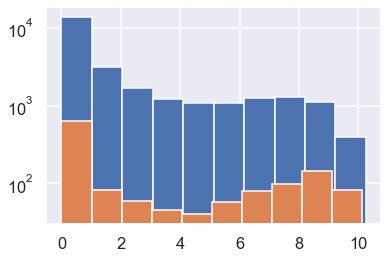

In [150]:
#sns.histplot(x="Orders", hue = "Metapher", data = data)
plt.hist(np.log(data[~data.Metapher].Orders+1));
plt.hist(np.log(data[data.Metapher].Orders+1));
plt.yscale("log")

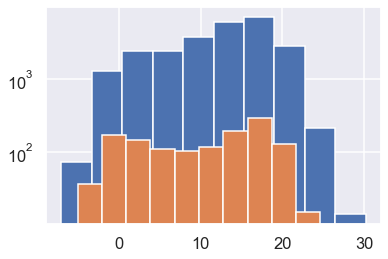

In [153]:
#sns.histplot(x="Orders", hue = "Metapher", data = data)
plt.hist(data[~data.Metapher].Logits);
plt.hist(data[data.Metapher].Logits);
plt.yscale("log")

Text(0, 0.5, 'Logits')

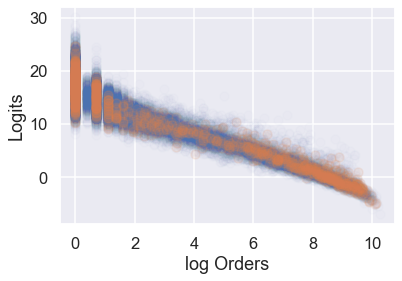

In [206]:
plt.scatter(np.log(data[~data.Metapher].Orders+1), data[~data.Metapher].Logits,
            alpha = 0.01, label = "non-Metaphors")

plt.scatter(np.log(data[data.Metapher].Orders+1), data[data.Metapher].Logits,
            alpha = 0.1, label = "Metaphors")

plt.xlabel("log Orders")
plt.ylabel("Logits")

In [174]:
from scipy.stats import ks_2samp

ks_2samp(data[data.Metapher].Logits, data[~data.Metapher].Logits)

KstestResult(statistic=0.14665888143457273, pvalue=6.537701539331318e-24)

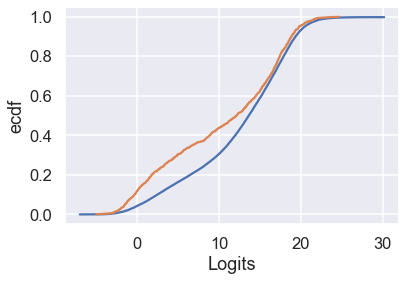

In [209]:
plt.plot(np.sort(data[~data.Metapher].Logits), np.linspace(0, 1, len(data[~data.Metapher].Logits), endpoint=False));
plt.plot(np.sort(data[data.Metapher].Logits), np.linspace(0, 1, len(data[data.Metapher].Logits), endpoint=False));
plt.xlabel("Logits");
plt.ylabel("ecdf");

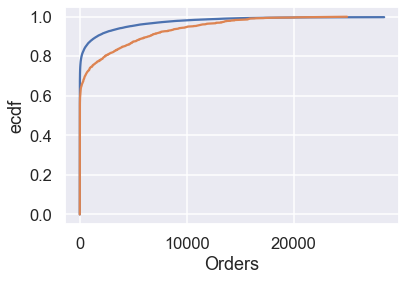

In [211]:
plt.plot(np.sort(data[~data.Metapher].Orders), np.linspace(0, 1, len(data[~data.Metapher].Orders), endpoint=False));
plt.plot(np.sort(data[data.Metapher].Orders), np.linspace(0, 1, len(data[data.Metapher].Orders), endpoint=False));
plt.xlabel("Orders");
plt.ylabel("ecdf");

Text(0, 0.5, 'ecdf')

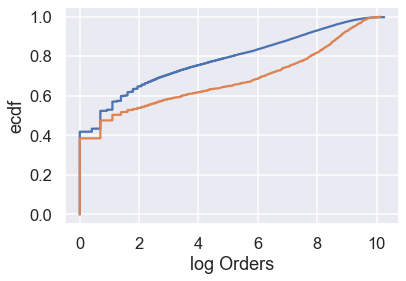

In [212]:
plt.plot(np.log(np.sort(data[~data.Metapher].Orders)+1),
         np.linspace(0, 1, len(data[~data.Metapher].Orders), endpoint=False));
plt.plot(np.log(np.sort(data[data.Metapher].Orders+1)),
         np.linspace(0, 1, len(data[data.Metapher].Orders), endpoint=False));

plt.xlabel("log Orders");
plt.ylabel("ecdf")

# Build a classifier

it seems like there is some signal.
Lets build a classifier and see if it is any good

In [203]:
from sklearn.impute import SimpleImputer

X = data[["Orders", "Logits"]]

imp = SimpleImputer()
X = imp.fit_transform(X)

X[:,0] = np.log(X[:,0]+1)

y = data["Metapher"]

In [204]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()

clf.fit(X, y)
y_pred = clf.predict(X)
y_prob = clf.predict_proba(X)
y_prob

array([[0.96538063, 0.03461937],
       [0.93872802, 0.06127198],
       [0.94908999, 0.05091001],
       ...,
       [0.96349583, 0.03650417],
       [0.95985035, 0.04014965],
       [0.96421139, 0.03578861]])

In [205]:
from sklearn.metrics import f1_score

f1_score(y.astype(int), y_pred)

0.0